In [1]:
!pip install scikit-optimize

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

import statsmodels.stats.api as sms
from matplotlib import style
style.use('seaborn')
%matplotlib inline
#graphs in svg look clearer
%config InlineBackend.figure_format = 'svg' 

In [3]:
import warnings
warnings.filterwarnings("ignore")

# Functions

In [4]:
from sklearn import metrics

def mae(y_gt, Y_pr):
    return metrics.mean_absolute_error(y_gt, Y_pr)

def mse(y_gt, Y_pr):
    return metrics.mean_squared_error(y_gt, Y_pr)

def rmse(y_gt, Y_pr):
    my_mse = mse(y_gt, Y_pr)
    return np.sqrt(my_mse)

def medae(y_gt, Y_pr):
    return metrics.median_absolute_error(y_gt, Y_pr)

def R2(y_gt, Y_pr):
    return metrics.r2_score(y_gt, Y_pr)

def calc_metrics(true, pred):

    mse1 = mse(true, pred)

    rmse1 = rmse(true, pred)

    mae1 = mae(true, pred)

    medae1 = medae(true, pred)

    R21 = R2(true, pred)

    print('*** VAL **: ')
    print("MSE:   {}\nRMSE:  {}\nR2:    {}\nMAE:   {}\nMedAE: {}".format(mse1, rmse1, R21, mae1, medae1))
    print('-'*30)

In [5]:
def target_distr_linear(train_label, test_label, predicted_dv): 
    sns.kdeplot(train_label, label='train')
    sns.kdeplot(test_label, label='test')
    sns.kdeplot(predicted_dv, label='pred')
    plt.legend()
    plt.show()

    sns.scatterplot(test_label, predicted_dv, color='blueviolet')
    plt.title('Linear model')
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.show()

In [6]:
from scipy.stats import norm

def draw_histogram(data):
    f,ax_hist = plt.subplots(1)
    sns.distplot(data, hist=True,  kde=True, rug=True, bins=10, fit=norm, ax=ax_hist);
    plt.xlabel("values")
    plt.title("Distribution") 

    mean=data.mean()

    ax_hist.axvline(mean, color='r', linestyle='--', label=f"Mean={mean:.3f}")
    ax_hist.legend()

    plt.show()

In [7]:
def draw_res_analys(errors, pred):
    sns.scatterplot(list(range(len(errors))),errors);
    plt.title("Distibution of errors")
    plt.ylabel('Error');
    plt.xlabel('Index');
    plt.show();

    sns.scatterplot(pred,errors);
    plt.title('Relationship of true value vs error (resudual analysis)')
    plt.ylabel('Error');
    plt.xlabel('True value');
    plt.show();

In [8]:
def get_feature_imp(model, X_train):
    imp = model.get_feature_importance(data=X_train)
    fig, axes = plt.subplots(1, 1, figsize=(12, 8))
    axes.barh(width=imp, y=model.feature_names_)
    axes.set_title('Finetuned Catboost feature importance')
    plt.show()

# Unhashing

In [9]:
genre_mapping = {'0ef0aa70-f86c-4141-8054-8b39af97867d': 'Biography',
                '287a1485-7a88-4c2f-bc94-ca418b6c47a1': 'Cartoons',
                '66fad8c3-d84f-458d-a8bf-5b4f154969e0': 'Show',
                '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Theater',
                '9fa28b61-a257-4a3e-945b-a9ef76a146d6': 'Fantasy',
                'b0836a1d-635f-4d89-bcc5-25d10ba56642': 'Anime',
                'd7214feb-8c11-4aea-aabb-ac98a8d56fd5': 'History',
                'dc65dbc8-34ba-4df1-b32c-4f895e10bff8': 'Shorts',
                'eb001d27-5be3-4d42-9d88-90d593f2627d': 'War_movies',
                '364fdc2e-bdfe-40be-b2c5-d30f43ec432e': 'Crime'}

In [10]:
types_mapping = {'1f22ccf1-288a-4e6e-b39a-7502799e7125': 'Лекции',
    '6d640e04-be3a-4c8c-852e-4e9b12449d5d': 'Концерты',
    '7b7c97f6-1adb-4b43-bfe8-9455812fac0b': 'Театр',
    '2f7908cc-e2fd-43cf-b626-ec1aef436160': 'Курсы' }

In [11]:
import pickle

with open('./RATINGS_OKKO_item_coldstart_dataset.pkl', 'rb') as f:
    df = pickle.load(f, encoding='utf-8')

In [12]:
df.shape

(9323, 20)

In [13]:
all_genres = []

for item_genres in df['genre']:
    all_genres.extend(item_genres)

In [14]:
all_unique_genres = set(all_genres)

In [15]:
len(all_unique_genres)

32

In [16]:
all_unique_genres

{'0ef0aa70-f86c-4141-8054-8b39af97867d',
 '1f22ccf1-288a-4e6e-b39a-7502799e7125',
 '287a1485-7a88-4c2f-bc94-ca418b6c47a1',
 '364fdc2e-bdfe-40be-b2c5-d30f43ec432e',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 '66fad8c3-d84f-458d-a8bf-5b4f154969e0',
 '6d640e04-be3a-4c8c-852e-4e9b12449d5d',
 '7b7c97f6-1adb-4b43-bfe8-9455812fac0b',
 '9fa28b61-a257-4a3e-945b-a9ef76a146d6',
 'Action',
 'Adventure',
 'ArtHouse',
 'Comedy',
 'Detective',
 'Documentary',
 'Drama',
 'Family',
 'ForKids',
 'Horror',
 'Humor',
 'Melodrama',
 'Music',
 'Sci-Fi',
 'Sport',
 'Thriller',
 'Travel',
 'b0836a1d-635f-4d89-bcc5-25d10ba56642',
 'd7214feb-8c11-4aea-aabb-ac98a8d56fd5',
 'd7f6b51c-6ebe-4b9c-9aad-2c60792a7d9c',
 'dc65dbc8-34ba-4df1-b32c-4f895e10bff8',
 'eb001d27-5be3-4d42-9d88-90d593f2627d'}

In [17]:
decoded_genres = [genre_mapping.get(genre, genre) for genre in all_unique_genres]

In [18]:
decoded_genres

['Crime',
 'Show',
 'Family',
 'ArtHouse',
 '5c403894-146a-47a4-ae75-9f1956a30dbb',
 'History',
 'Action',
 'Anime',
 'd7f6b51c-6ebe-4b9c-9aad-2c60792a7d9c',
 'Biography',
 'Theater',
 '1f22ccf1-288a-4e6e-b39a-7502799e7125',
 'Comedy',
 'War_movies',
 '6d640e04-be3a-4c8c-852e-4e9b12449d5d',
 'Cartoons',
 'Documentary',
 'Sci-Fi',
 'Adventure',
 'Travel',
 'Drama',
 'Music',
 'Thriller',
 'Sport',
 'Horror',
 'Shorts',
 'Detective',
 '3e6e08b4-2bb0-46d6-aee7-98780e394c86',
 'Humor',
 'ForKids',
 'Fantasy',
 'Melodrama']

In [19]:
all_genres = []

for col in ['actor', 'country', 'genre', 'director']:
    print(f'======{col}======')
    all_values = []
    for i, item_values in enumerate(df[col]):
        try:
            all_values.extend(item_values)
        except:
            print(i, item_values)
    all_values = set(all_values)
    print('Len:', len(all_values))
    # print(all_values)

======actor======
Len: 28834
======country======
Len: 102
======genre======
Len: 32
======director======
Len: 6889


# Preprocessing

In [20]:
prep_df = df.copy(deep=True)

In [21]:
prep_df.shape

(9323, 20)

In [22]:
prep_df.head(1).T

,0
availability,[SUBSCRIPTION]
actor,"[cff3362f-ad91-498d-80b3-ea3ab8ec65cf, 30dd19c..."
age_access_type,18
country,[usa]
average_rating,6.99
duration,3780000
type,MOVIE
name,Прожарка Чарли Шина
release_year,2011
genre,"[Comedy, Documentary]"


### ohe

In [23]:
def add_topN_feature(df, col, n: int):
    items = []
    
    for i in df[col]:
        items.extend(i)

    topN = [x[0] for x in Counter(items).most_common()][:n]
    df[f'top{n}{col}'] = df[col].apply(lambda x: [int(item in x) for item in topN])
    df.drop(col, axis=1, inplace=True)
    return topN, f'top{n}{col}'

In [24]:
def ohe_topN_features(df, topN, cat):
    for i in range(len(topN)):
#         df[f'{cat}_{topN[i]}'] = [item[i] for item in df[cat]]
        df[f'{topN[i]}'] = [item[i] for item in df[cat]]
    df.drop(cat, axis=1, inplace=True)
    return df

In [25]:
prep_df.dropna(subset=['availability'], inplace=True)

In [26]:
avail, name = add_topN_feature(prep_df, 'availability', len(prep_df['availability']))
prep_df = ohe_topN_features(prep_df, avail, name)

In [27]:
prep_df.drop('FVOD', axis=1, inplace=True)

In [28]:
!pip install gensim

In [29]:
from gensim.models import Word2Vec


class Cat2Vec:
    def __init__(self, n_cat2vec_feature,
                    n_cat2vec_window):
        self.n_cat2vec_feature = n_cat2vec_feature
        self.n_cat2vec_window = n_cat2vec_window
    
    def __create_tokens(self, col_name, values):
        return [f'{col_name} {value}' for value in values]
    
    def __gen_cat2vec_sentences(self, data):
        items = []

        for i, row in data.iterrows():
            item_values = []
            for col, values in zip(row.index, row.values):
                item_values.extend(self.__create_tokens(col, values))
            # shuffle(item_values)
            items.append(item_values)
        return items
    
    def fit(self, cat_features: pd.DataFrame):
        X_w2v = self.__gen_cat2vec_sentences(cat_features)
        self.model = Word2Vec(X_w2v, vector_size=self.n_cat2vec_feature, 
                         window=self.n_cat2vec_window, epochs=5, min_count=2)
        
    def transform(self, cat_features: pd.DataFrame):
        encoded_features = pd.DataFrame()
        for col in cat_features.columns:
            tokens = [self.__create_tokens(col, row) for row in cat_features[col]]
            col_embeds = []
            for row in tokens:
                avg_embeds = np.mean([self.model.wv[token] for token in row if token in self.model.wv.key_to_index], 
                                          axis=0)
                if isinstance(avg_embeds, np.float64):
                    avg_embeds = [np.nan] * self.n_cat2vec_feature
                    
                col_embeds.append(avg_embeds)
            col_embeds = pd.DataFrame(col_embeds, columns=[f'{col}_{i}' for i in range(self.n_cat2vec_feature)])
            encoded_features = pd.concat([encoded_features, col_embeds], axis=1)

        return encoded_features

    
class Preprocesser:
    def __init__(self, 
                 mulpiple_cat_features: list,
                 skewed_num_features: list,
#                  text_features: list,
                 cat_features: list,
                 mltpl_cat_n_top: dict,
                 n_cat2vec_feature: int, 
                 n_cat2vec_window: int):
        self.mulpiple_cat_features = mulpiple_cat_features
        self.skewed_num_features = skewed_num_features
#         self.text_features = text_features
        self.mltpl_cat_n_top = mltpl_cat_n_top
        self.cat_features = cat_features
        
        self.cat2vec = Cat2Vec(n_cat2vec_feature, n_cat2vec_window)
        
    def __get_top_n_mltpl_cat_features(self, df_pr, col):
        all_cats = []
        for element_values in df_pr[col]:
            all_cats.extend(element_values)
        return Counter(all_cats).most_common(self.mltpl_cat_n_top[col])
            
    def __preprocess_mulpiple_cat_features(self, df_pr):
        features = self.cat2vec.transform(df_pr[self.mulpiple_cat_features])
        df_pr[features.columns] = features
        df_pr.drop(self.mulpiple_cat_features, axis=1, inplace=True)
        
        return df_pr
    
    def __preprocess_skewed_num_features(self, df_pr):
        for col in self.skewed_num_features:
            df_pr[col] = df_pr[col].apply(lambda x: np.log1p(x))
        return df_pr
    
    def __preprocess_text_features(self, df_pr):
        for col in self.text_features:
            df_pr[[f'{col}_{i}' for i in range(768)]] = self.embed_model.encode(df_pr[col].values)
            df_pr.drop(col, axis=1, inplace=True)
        return df_pr
    
    def __get_unique_values(self, feature):
        unique_values = []
        print('feature: ', feature)
        for element in feature.dropna():
            unique_values.extend(element)
        return set(unique_values)
    
    def __preprocess_cat_features(self, df_pr):
        for col in self.cat_features:
            unique_values = self.__get_unique_values(df_pr[col])
            cats_df = pd.DataFrame(np.full((len(df_pr), len(unique_values)),
                                            0),
                                   columns=list(unique_values))
            
            for i, element in enumerate(df_pr[col]):
                if isinstance(element, float):
                    cats_df.loc[i, :] = 'Na'
                    continue
                for value in element:
                    cats_df.loc[i, value] = '1'
            df_pr.drop(col, axis=1, inplace=True)
        df_pr[cats_df.columns] = cats_df
        return df_pr  
            
    def fit(self, 
            df: pd.DataFrame):
        self.cat2vec.fit(df[self.mulpiple_cat_features])
        
    def preprocess(self,
                   df: pd.DataFrame):
        df_pr = df.copy()
        df_pr = self.__preprocess_mulpiple_cat_features(df_pr)
        df_pr = self.__preprocess_skewed_num_features(df_pr)
#         df_pr = self.__preprocess_cat_features(df_pr)
        
        return df_pr
        
        
class TargetTransformer:
    def __init__(self, denominator=1):
        self.scale = denominator
        
    def inverse_transform(self, feature):
        return feature.apply(lambda x: np.expm1(x))
    
    def transform(self, feature):
        return feature.apply(lambda x: np.log1p(x))

In [30]:
# types for preprocessing
mltpl_cat_features = ['actor', 'country', 'genre', 'director']
# cat_features = ['availability']
cat_features = ['age_access_type', 'type']
num_features = ['duration']
skewed_num_features = ['duration']
mltpl_cat_n_top = {'actor': 5, 'country': 3, 'genre': 3, 'director': 1}

cat_cols = ['actor', 'genre', 'director', 'country']
n_cat2vec_feature  = len(cat_cols) * 2  # define the cat2vecs dimentions
n_cat2vec_window   = len(cat_cols) * 2

In [31]:
df_modern = prep_df[prep_df['release_year'] >= 2000]
# df_short = df_modern[df_modern['target'] < 0.02]
df_modern.reset_index(drop=True, inplace=True)

In [32]:

df_modern.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7719 entries, 0 to 7718
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   actor               7719 non-null   object        
 1   age_access_type     7719 non-null   object        
 2   country             7719 non-null   object        
 3   average_rating      7259 non-null   object        
 4   duration            7719 non-null   object        
 5   type                7719 non-null   object        
 6   name                7719 non-null   object        
 7   release_year        7719 non-null   object        
 8   genre               7719 non-null   object        
 9   director            7719 non-null   object        
 10  element_uid         7719 non-null   object        
 11  subscription_only   7719 non-null   object        
 12  av_rate_x           7719 non-null   float64       
 13  av_rate_y           7719 non-null   float64     

In [33]:
prep_df['age_access_type'] = prep_df['age_access_type'].astype(str)
prep_df['type'] = prep_df['type'].astype(str)
prep_df['subscription_only'] = prep_df['subscription_only'].astype(int)

In [34]:
preprocesser = Preprocesser(mltpl_cat_features,
                            skewed_num_features,
#                             text_features,
                            cat_features,
                            mltpl_cat_n_top,
                            n_cat2vec_feature, 
                            n_cat2vec_window)

preprocesser.fit(df_modern)
df_pr = preprocesser.preprocess(df_modern)

In [35]:
df_pr.head().T

,0,1,2,3,4
age_access_type,18,18,0,6,16
average_rating,6.99,6.0,6.21,6.4,NaN
duration,15.145235,15.145235,15.396549,15.523889,15.479437
type,MOVIE,MOVIE,MOVIE,MOVIE,MOVIE
name,Прожарка Чарли Шина,Прожарка Уильяма Шэтнера,Большое путешествие,Пламенное сердце,Роман с кукушкой
release_year,2011,2006,2006,2022,2021
element_uid,3f30a2ef-53b7-40e3-954f-1bdfc38a6d17,cdfa700f-122d-41e5-b8dc-9c6813bab6d2,d8b55146-dee5-4498-957c-5614414b48fb,ba6bec1a-3aa9-48c7-aa65-908c21627a12,a367ca50-ef7d-4a4c-b89a-c8692defa697
subscription_only,True,True,True,True,False
av_rate_x,0.004276,0.0,-0.043478,0.018286,0.010101
av_rate_y,0.003705,-0.004808,-0.041667,0.01722,0.006173


In [36]:
df_pr.isna().sum()

age_access_type          0
average_rating         460
duration                 0
type                     0
name                     0
release_year             0
element_uid              0
subscription_only        0
av_rate_x                0
av_rate_y                0
users_number_x           0
users_number_y           0
user_count_3months       0
av_ratings_3months       0
min_ts                   0
SUBSCRIPTION             0
DTO                      0
RENT                     0
AVOD                     0
actor_0                604
actor_1                604
actor_2                604
actor_3                604
actor_4                604
actor_5                604
actor_6                604
actor_7                604
country_0                1
country_1                1
country_2                1
country_3                1
country_4                1
country_5                1
country_6                1
country_7                1
genre_0                  0
genre_1                  0
g

In [37]:
df_pr.columns

Index(['age_access_type', 'average_rating', 'duration', 'type', 'name',
       'release_year', 'element_uid', 'subscription_only', 'av_rate_x',
       'av_rate_y', 'users_number_x', 'users_number_y', 'user_count_3months',
       'av_ratings_3months', 'min_ts', 'SUBSCRIPTION', 'DTO', 'RENT', 'AVOD',
       'actor_0', 'actor_1', 'actor_2', 'actor_3', 'actor_4', 'actor_5',
       'actor_6', 'actor_7', 'country_0', 'country_1', 'country_2',
       'country_3', 'country_4', 'country_5', 'country_6', 'country_7',
       'genre_0', 'genre_1', 'genre_2', 'genre_3', 'genre_4', 'genre_5',
       'genre_6', 'genre_7', 'director_0', 'director_1', 'director_2',
       'director_3', 'director_4', 'director_5', 'director_6', 'director_7'],
      dtype='object')

In [38]:
cf = ['actor_0', 'actor_1', 'actor_2', 'actor_3', 'actor_4', 'actor_5',
       'actor_6', 'actor_7', 'country_0', 'country_1', 'country_2',
       'country_3', 'country_4', 'country_5', 'country_6', 'country_7',
       'genre_0', 'genre_1', 'genre_2', 'genre_3', 'genre_4', 'genre_5',
       'genre_6', 'genre_7', 'director_0', 'director_1', 'director_2',
       'director_3', 'director_4', 'director_5', 'director_6', 'director_7']

df_pr[cf] = df_pr[cf].replace(np.nan, 'Na')

In [39]:
df_pr['average_rating'] = df_pr['average_rating'].astype(float)

### choose features

In [40]:
df_pr.head(1).T

,0
age_access_type,18
average_rating,6.99
duration,15.145235
type,MOVIE
name,Прожарка Чарли Шина
release_year,2011
element_uid,3f30a2ef-53b7-40e3-954f-1bdfc38a6d17
subscription_only,True
av_rate_x,0.004276
av_rate_y,0.003705


In [41]:
df_pr.columns

Index(['age_access_type', 'average_rating', 'duration', 'type', 'name',
       'release_year', 'element_uid', 'subscription_only', 'av_rate_x',
       'av_rate_y', 'users_number_x', 'users_number_y', 'user_count_3months',
       'av_ratings_3months', 'min_ts', 'SUBSCRIPTION', 'DTO', 'RENT', 'AVOD',
       'actor_0', 'actor_1', 'actor_2', 'actor_3', 'actor_4', 'actor_5',
       'actor_6', 'actor_7', 'country_0', 'country_1', 'country_2',
       'country_3', 'country_4', 'country_5', 'country_6', 'country_7',
       'genre_0', 'genre_1', 'genre_2', 'genre_3', 'genre_4', 'genre_5',
       'genre_6', 'genre_7', 'director_0', 'director_1', 'director_2',
       'director_3', 'director_4', 'director_5', 'director_6', 'director_7'],
      dtype='object')

In [42]:
data = df_pr[['age_access_type', 'average_rating', 'duration', 'type',  'subscription_only', 
       'av_ratings_3months', 'SUBSCRIPTION', 'DTO', 'RENT', 'AVOD',
       'actor_0', 'actor_1', 'actor_2', 'actor_3', 'actor_4', 'actor_5',
       'actor_6', 'actor_7', 'country_0', 'country_1', 'country_2',
       'country_3', 'country_4', 'country_5', 'country_6', 'country_7',
       'genre_0', 'genre_1', 'genre_2', 'genre_3', 'genre_4', 'genre_5',
       'genre_6', 'genre_7', 'director_0', 'director_1', 'director_2',
       'director_3', 'director_4', 'director_5', 'director_6', 'director_7']]

In [43]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7719 entries, 0 to 7718
Data columns (total 42 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   age_access_type     7719 non-null   object 
 1   average_rating      7259 non-null   float64
 2   duration            7719 non-null   float64
 3   type                7719 non-null   object 
 4   subscription_only   7719 non-null   object 
 5   av_ratings_3months  7719 non-null   float64
 6   SUBSCRIPTION        7719 non-null   int64  
 7   DTO                 7719 non-null   int64  
 8   RENT                7719 non-null   int64  
 9   AVOD                7719 non-null   int64  
 10  actor_0             7719 non-null   object 
 11  actor_1             7719 non-null   object 
 12  actor_2             7719 non-null   object 
 13  actor_3             7719 non-null   object 
 14  actor_4             7719 non-null   object 
 15  actor_5             7719 non-null   object 
 16  actor_

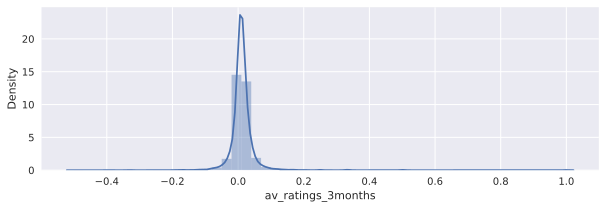

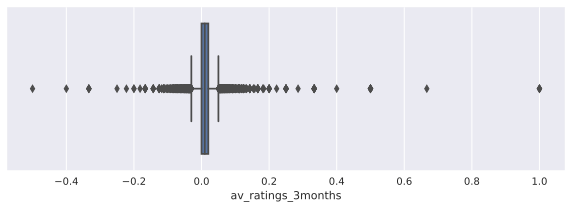

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style
style.use('seaborn')
%matplotlib inline
#graphs in svg look clearer
%config InlineBackend.figure_format = 'svg' 

plt.figure(figsize=(10, 3))
sns.distplot(df_pr['av_ratings_3months'])
plt.show()

plt.figure(figsize=(10, 3))
sns.boxplot(df_pr['av_ratings_3months'], orient='h')
plt.show()

## Split

In [45]:
data.shape

(7719, 42)

In [46]:
X, y = data.drop('av_ratings_3months', axis=1), data['av_ratings_3months']

In [47]:
from sklearn.model_selection import train_test_split

In [48]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=True)

In [49]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42, shuffle=True)

In [50]:
X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape

((6252, 41), (695, 41), (772, 41), (6252,), (695,), (772,))

### OHE

In [51]:
# # from sklearn.preprocessing import OneHotEncoder

# # enc = OneHotEncoder(dtype='int8', handle_unknown='ignore')

# # enc_train = enc.fit_transform(X_train[['age_access_type', 'type']])

# enc_train = pd.DataFrame(enc_train.toarray())

# enc_train.columns = enc.get_feature_names_out(['age_access_type', 'type'])

# X_train.drop(['age_access_type', 'type'], axis=1, inplace=True)
# X_train = X_train.merge(enc_train, on=X_train.index, how='left', sort=False)

# # # 'age_access_type', 'type', 
# # #               'release_year', 'subscription_only',


# enc_test = enc.transform(X_test[['age_access_type', 'type']])

# enc_test = pd.DataFrame(enc_test.toarray())

# enc_test.columns = enc.get_feature_names_out(['age_access_type', 'type'])

# X_test.drop(['age_access_type', 'type'], axis=1, inplace=True)
# X_test = X_test.merge(enc_test, on=X_test.index, how='left', sort=False)

# enc_val = enc.transform(X_val[['age_access_type', 'type']])

# enc_val = pd.DataFrame(enc_val.toarray())

# enc_val.columns = enc.get_feature_names_out(['age_access_type', 'type'])

# X_val.drop(['age_access_type', 'type'], axis=1, inplace=True)
# X_val = X_val.merge(enc_val, on=X_val.index, how='left', sort=False)


# # X_train.drop('key_0', inplace=True, axis=1)
# # X_test.drop('key_0', inplace=True, axis=1)
# # X_val.drop('key_0', inplace=True, axis=1)

### Model

In [52]:
import catboost as cat
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from scipy.stats import uniform, randint

In [53]:
X_train.head(1)

,age_access_type,average_rating,duration,type,subscription_only,SUBSCRIPTION,DTO,RENT,AVOD,actor_0,...,genre_6,genre_7,director_0,director_1,director_2,director_3,director_4,director_5,director_6,director_7
6824,12,5.77,16.741893,SERIAL,False,1,1,0,0,0.091448,...,1.086372,0.043078,Na,Na,Na,Na,Na,Na,Na,Na


In [54]:
cat_features = ['age_access_type',
                'type']

In [55]:
train_dataset = cat.Pool(data=X_train,
                        label=y_train,
                         cat_features=cat_features)

test_dataset = cat.Pool(data=X_test, 
                        label=y_test,
                         cat_features=cat_features)

val_dataset = cat.Pool(X_val, 
                       y_val,
                       cat_features=cat_features)

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
    'cat_features': cat_features
}

cat_model = cat.CatBoostRegressor(**cat_params)

cat_model.fit(
    train_dataset,
    eval_set=val_dataset,
    early_stopping_rounds=500,
    verbose=100,
    plot=False
)

Learning rate set to 0.0679
0:	learn: 0.0185280	test: 0.0222256	best: 0.0222256 (0)	total: 63.5ms	remaining: 1m 3s
100:	learn: 0.0160808	test: 0.0208294	best: 0.0206804 (48)	total: 815ms	remaining: 7.25s
200:	learn: 0.0156616	test: 0.0212560	best: 0.0206804 (48)	total: 1.57s	remaining: 6.23s
300:	learn: 0.0152861	test: 0.0216926	best: 0.0206804 (48)	total: 2.18s	remaining: 5.05s
400:	learn: 0.0148227	test: 0.0219375	best: 0.0206804 (48)	total: 2.65s	remaining: 3.96s
500:	learn: 0.0143911	test: 0.0221295	best: 0.0206804 (48)	total: 3.42s	remaining: 3.41s
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.02068037251
bestIteration = 48

Shrink model to first 49 iterations.


In [56]:
y_pred = cat_model.predict(test_dataset)

In [57]:
calc_metrics(y_test, y_pred)

*** VAL **: 
MSE:   0.0009533021943585498
RMSE:  0.03087559221065322
R2:    0.11862519574874242
MAE:   0.015239068127193663
MedAE: 0.008523906598555231
------------------------------


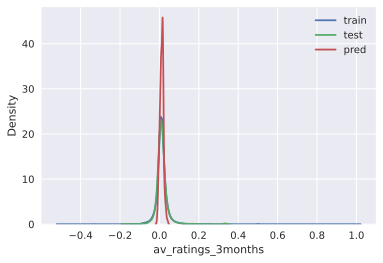

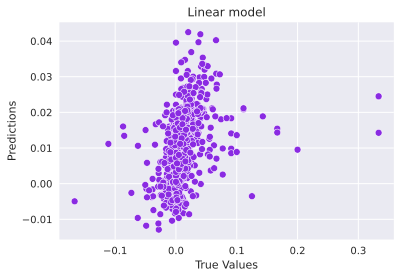

In [58]:
target_distr_linear(y_train, y_test, y_pred)   

### FI

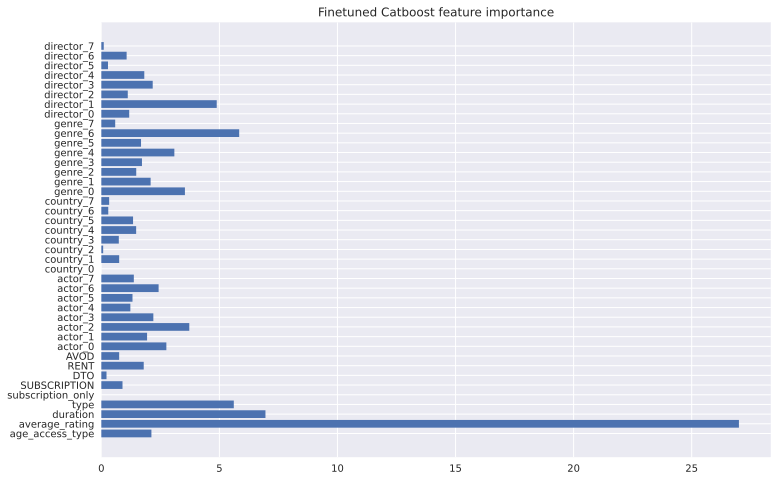

In [59]:
get_feature_imp(cat_model, train_dataset)

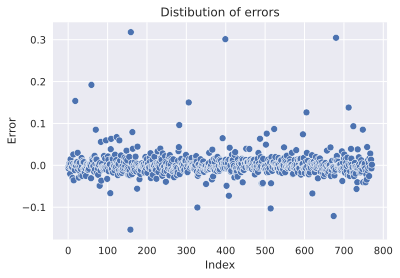

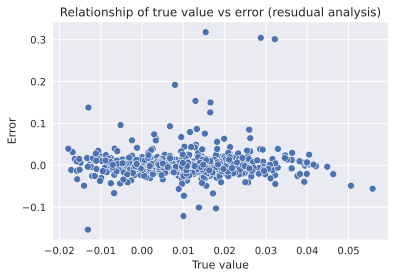

In [72]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)

In [61]:
cat_model.save_model('cat_reg_okko_ratings_cat2vec')

# Tuning

In [62]:
train_dataset = cat.Pool(X_train, 
                         y_train,
                         cat_features=cat_features)

test_dataset = cat.Pool(X_test, 
                        y_test,
                        cat_features=cat_features)

cat_params = {
    'loss_function': 'RMSE',
    'eval_metric': 'MAE',
    'verbose': True,
    'random_seed': 321,
    'allow_writing_files': False, 
    'cat_features': cat_features
}

In [63]:
parameters_distr = {'depth': randint(3, 7),
              'learning_rate': uniform(0.01, 0.1),
              'iterations': [100, 1000, 5000]
             }

cat_model = cat.CatBoostRegressor(**cat_params)
grid = RandomizedSearchCV(estimator=cat_model, param_distributions=parameters_distr, 
                            cv=5,
#                           n_jobs=-1, 
                          verbose=3)

grid.fit(X_train, y_train)

import pickle
with open('bestimator_ratings_kinop', 'wb') as f:
    pickle.dump(grid.best_estimator_, f)
grid.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits
0:	learn: 0.0181029	total: 29.1ms	remaining: 2.88s
1:	learn: 0.0178986	total: 43ms	remaining: 2.11s
2:	learn: 0.0176863	total: 51.2ms	remaining: 1.65s
3:	learn: 0.0175751	total: 61.5ms	remaining: 1.47s
4:	learn: 0.0174257	total: 72.4ms	remaining: 1.38s
5:	learn: 0.0172977	total: 81ms	remaining: 1.27s
6:	learn: 0.0171596	total: 88.4ms	remaining: 1.17s
7:	learn: 0.0170440	total: 93.5ms	remaining: 1.07s
8:	learn: 0.0169485	total: 105ms	remaining: 1.06s
9:	learn: 0.0168680	total: 113ms	remaining: 1.02s
10:	learn: 0.0167920	total: 121ms	remaining: 975ms
11:	learn: 0.0167373	total: 127ms	remaining: 928ms
12:	learn: 0.0166694	total: 132ms	remaining: 884ms
13:	learn: 0.0166091	total: 138ms	remaining: 848ms
14:	learn: 0.0165829	total: 143ms	remaining: 809ms
15:	learn: 0.0165423	total: 158ms	remaining: 832ms
16:	learn: 0.0164924	total: 167ms	remaining: 817ms
17:	learn: 0.0164753	total: 175ms	remaining: 798ms
18:	learn: 0.0164491	total:

86:	learn: 0.0166116	total: 438ms	remaining: 65.5ms
87:	learn: 0.0166081	total: 443ms	remaining: 60.4ms
88:	learn: 0.0165900	total: 448ms	remaining: 55.4ms
89:	learn: 0.0165912	total: 450ms	remaining: 50ms
90:	learn: 0.0165827	total: 453ms	remaining: 44.8ms
91:	learn: 0.0165723	total: 457ms	remaining: 39.7ms
92:	learn: 0.0165727	total: 460ms	remaining: 34.6ms
93:	learn: 0.0165652	total: 463ms	remaining: 29.6ms
94:	learn: 0.0165617	total: 468ms	remaining: 24.6ms
95:	learn: 0.0165422	total: 471ms	remaining: 19.6ms
96:	learn: 0.0165416	total: 474ms	remaining: 14.7ms
97:	learn: 0.0165363	total: 477ms	remaining: 9.73ms
98:	learn: 0.0165267	total: 481ms	remaining: 4.86ms
99:	learn: 0.0165176	total: 489ms	remaining: 0us
[CV 2/5] END depth=6, iterations=100, learning_rate=0.07894980006003212;, score=0.123 total time=   0.6s
0:	learn: 0.0190507	total: 9.77ms	remaining: 967ms
1:	learn: 0.0188327	total: 16.1ms	remaining: 790ms
2:	learn: 0.0186481	total: 29.6ms	remaining: 958ms
3:	learn: 0.0184777

53:	learn: 0.0165917	total: 264ms	remaining: 225ms
54:	learn: 0.0165733	total: 270ms	remaining: 221ms
55:	learn: 0.0165547	total: 275ms	remaining: 216ms
56:	learn: 0.0165240	total: 278ms	remaining: 210ms
57:	learn: 0.0165246	total: 280ms	remaining: 203ms
58:	learn: 0.0165216	total: 291ms	remaining: 203ms
59:	learn: 0.0165099	total: 295ms	remaining: 197ms
60:	learn: 0.0164966	total: 298ms	remaining: 190ms
61:	learn: 0.0164831	total: 301ms	remaining: 184ms
62:	learn: 0.0164802	total: 304ms	remaining: 179ms
63:	learn: 0.0164683	total: 307ms	remaining: 173ms
64:	learn: 0.0164668	total: 313ms	remaining: 169ms
65:	learn: 0.0164562	total: 320ms	remaining: 165ms
66:	learn: 0.0164449	total: 324ms	remaining: 160ms
67:	learn: 0.0164456	total: 327ms	remaining: 154ms
68:	learn: 0.0164464	total: 331ms	remaining: 149ms
69:	learn: 0.0164484	total: 335ms	remaining: 143ms
70:	learn: 0.0164465	total: 338ms	remaining: 138ms
71:	learn: 0.0164277	total: 342ms	remaining: 133ms
72:	learn: 0.0164286	total: 343

28:	learn: 0.0175067	total: 210ms	remaining: 36s
29:	learn: 0.0174908	total: 216ms	remaining: 35.8s
30:	learn: 0.0174739	total: 221ms	remaining: 35.5s
31:	learn: 0.0174532	total: 229ms	remaining: 35.6s
32:	learn: 0.0174345	total: 234ms	remaining: 35.2s
33:	learn: 0.0174163	total: 241ms	remaining: 35.1s
34:	learn: 0.0174012	total: 246ms	remaining: 34.9s
35:	learn: 0.0173862	total: 251ms	remaining: 34.6s
36:	learn: 0.0173684	total: 254ms	remaining: 34.1s
37:	learn: 0.0173517	total: 258ms	remaining: 33.7s
38:	learn: 0.0173368	total: 264ms	remaining: 33.6s
39:	learn: 0.0173213	total: 272ms	remaining: 33.8s
40:	learn: 0.0173050	total: 278ms	remaining: 33.6s
41:	learn: 0.0172861	total: 281ms	remaining: 33.2s
42:	learn: 0.0172702	total: 288ms	remaining: 33.2s
43:	learn: 0.0172580	total: 295ms	remaining: 33.3s
44:	learn: 0.0172438	total: 303ms	remaining: 33.4s
45:	learn: 0.0172304	total: 309ms	remaining: 33.3s
46:	learn: 0.0172157	total: 312ms	remaining: 32.9s
47:	learn: 0.0172066	total: 317ms

220:	learn: 0.0164259	total: 1.22s	remaining: 26.3s
221:	learn: 0.0164237	total: 1.22s	remaining: 26.4s
222:	learn: 0.0164196	total: 1.23s	remaining: 26.4s
223:	learn: 0.0164165	total: 1.24s	remaining: 26.3s
224:	learn: 0.0164143	total: 1.24s	remaining: 26.3s
225:	learn: 0.0164144	total: 1.24s	remaining: 26.2s
226:	learn: 0.0164089	total: 1.25s	remaining: 26.2s
227:	learn: 0.0164075	total: 1.25s	remaining: 26.2s
228:	learn: 0.0164068	total: 1.25s	remaining: 26.1s
229:	learn: 0.0164066	total: 1.26s	remaining: 26.1s
230:	learn: 0.0164065	total: 1.26s	remaining: 26s
231:	learn: 0.0164057	total: 1.26s	remaining: 26s
232:	learn: 0.0164039	total: 1.27s	remaining: 26s
233:	learn: 0.0164026	total: 1.27s	remaining: 25.9s
234:	learn: 0.0164030	total: 1.28s	remaining: 25.9s
235:	learn: 0.0164029	total: 1.28s	remaining: 25.8s
236:	learn: 0.0164007	total: 1.28s	remaining: 25.8s
237:	learn: 0.0164010	total: 1.28s	remaining: 25.7s
238:	learn: 0.0163993	total: 1.29s	remaining: 25.7s
239:	learn: 0.0163

384:	learn: 0.0162584	total: 2.02s	remaining: 24.2s
385:	learn: 0.0162586	total: 2.03s	remaining: 24.2s
386:	learn: 0.0162562	total: 2.03s	remaining: 24.2s
387:	learn: 0.0162565	total: 2.04s	remaining: 24.2s
388:	learn: 0.0162559	total: 2.04s	remaining: 24.2s
389:	learn: 0.0162558	total: 2.05s	remaining: 24.2s
390:	learn: 0.0162537	total: 2.05s	remaining: 24.2s
391:	learn: 0.0162536	total: 2.05s	remaining: 24.1s
392:	learn: 0.0162524	total: 2.06s	remaining: 24.1s
393:	learn: 0.0162516	total: 2.06s	remaining: 24.1s
394:	learn: 0.0162512	total: 2.07s	remaining: 24.1s
395:	learn: 0.0162513	total: 2.07s	remaining: 24.1s
396:	learn: 0.0162512	total: 2.08s	remaining: 24.1s
397:	learn: 0.0162517	total: 2.08s	remaining: 24.1s
398:	learn: 0.0162499	total: 2.09s	remaining: 24.1s
399:	learn: 0.0162490	total: 2.09s	remaining: 24.1s
400:	learn: 0.0162459	total: 2.1s	remaining: 24.1s
401:	learn: 0.0162458	total: 2.1s	remaining: 24s
402:	learn: 0.0162447	total: 2.1s	remaining: 24s
403:	learn: 0.01624

572:	learn: 0.0161620	total: 2.83s	remaining: 21.8s
573:	learn: 0.0161608	total: 2.83s	remaining: 21.8s
574:	learn: 0.0161591	total: 2.83s	remaining: 21.8s
575:	learn: 0.0161591	total: 2.84s	remaining: 21.8s
576:	learn: 0.0161584	total: 2.85s	remaining: 21.8s
577:	learn: 0.0161574	total: 2.85s	remaining: 21.8s
578:	learn: 0.0161574	total: 2.86s	remaining: 21.8s
579:	learn: 0.0161575	total: 2.86s	remaining: 21.8s
580:	learn: 0.0161576	total: 2.87s	remaining: 21.8s
581:	learn: 0.0161581	total: 2.88s	remaining: 21.8s
582:	learn: 0.0161574	total: 2.88s	remaining: 21.8s
583:	learn: 0.0161556	total: 2.89s	remaining: 21.9s
584:	learn: 0.0161542	total: 2.9s	remaining: 21.9s
585:	learn: 0.0161538	total: 2.9s	remaining: 21.9s
586:	learn: 0.0161535	total: 2.91s	remaining: 21.9s
587:	learn: 0.0161535	total: 2.91s	remaining: 21.9s
588:	learn: 0.0161532	total: 2.92s	remaining: 21.9s
589:	learn: 0.0161529	total: 2.93s	remaining: 21.9s
590:	learn: 0.0161530	total: 2.93s	remaining: 21.9s
591:	learn: 0.

742:	learn: 0.0160830	total: 3.63s	remaining: 20.8s
743:	learn: 0.0160826	total: 3.63s	remaining: 20.8s
744:	learn: 0.0160826	total: 3.64s	remaining: 20.8s
745:	learn: 0.0160826	total: 3.64s	remaining: 20.8s
746:	learn: 0.0160817	total: 3.65s	remaining: 20.8s
747:	learn: 0.0160817	total: 3.65s	remaining: 20.8s
748:	learn: 0.0160798	total: 3.66s	remaining: 20.8s
749:	learn: 0.0160790	total: 3.66s	remaining: 20.8s
750:	learn: 0.0160787	total: 3.67s	remaining: 20.8s
751:	learn: 0.0160790	total: 3.68s	remaining: 20.8s
752:	learn: 0.0160774	total: 3.68s	remaining: 20.8s
753:	learn: 0.0160761	total: 3.69s	remaining: 20.8s
754:	learn: 0.0160759	total: 3.69s	remaining: 20.8s
755:	learn: 0.0160758	total: 3.7s	remaining: 20.8s
756:	learn: 0.0160741	total: 3.7s	remaining: 20.8s
757:	learn: 0.0160742	total: 3.71s	remaining: 20.8s
758:	learn: 0.0160742	total: 3.71s	remaining: 20.8s
759:	learn: 0.0160743	total: 3.73s	remaining: 20.8s
760:	learn: 0.0160744	total: 3.74s	remaining: 20.8s
761:	learn: 0.

911:	learn: 0.0160037	total: 4.43s	remaining: 19.9s
912:	learn: 0.0160034	total: 4.44s	remaining: 19.9s
913:	learn: 0.0160023	total: 4.44s	remaining: 19.9s
914:	learn: 0.0160011	total: 4.45s	remaining: 19.8s
915:	learn: 0.0160012	total: 4.45s	remaining: 19.8s
916:	learn: 0.0160014	total: 4.45s	remaining: 19.8s
917:	learn: 0.0160016	total: 4.46s	remaining: 19.8s
918:	learn: 0.0160006	total: 4.46s	remaining: 19.8s
919:	learn: 0.0160006	total: 4.46s	remaining: 19.8s
920:	learn: 0.0160003	total: 4.47s	remaining: 19.8s
921:	learn: 0.0159994	total: 4.48s	remaining: 19.8s
922:	learn: 0.0159990	total: 4.48s	remaining: 19.8s
923:	learn: 0.0159982	total: 4.48s	remaining: 19.8s
924:	learn: 0.0159981	total: 4.49s	remaining: 19.8s
925:	learn: 0.0159969	total: 4.49s	remaining: 19.8s
926:	learn: 0.0159968	total: 4.49s	remaining: 19.7s
927:	learn: 0.0159969	total: 4.5s	remaining: 19.7s
928:	learn: 0.0159968	total: 4.5s	remaining: 19.7s
929:	learn: 0.0159971	total: 4.51s	remaining: 19.7s
930:	learn: 0.

1089:	learn: 0.0159373	total: 5.23s	remaining: 18.8s
1090:	learn: 0.0159373	total: 5.24s	remaining: 18.8s
1091:	learn: 0.0159374	total: 5.24s	remaining: 18.8s
1092:	learn: 0.0159364	total: 5.25s	remaining: 18.8s
1093:	learn: 0.0159366	total: 5.25s	remaining: 18.7s
1094:	learn: 0.0159367	total: 5.25s	remaining: 18.7s
1095:	learn: 0.0159366	total: 5.25s	remaining: 18.7s
1096:	learn: 0.0159364	total: 5.26s	remaining: 18.7s
1097:	learn: 0.0159358	total: 5.26s	remaining: 18.7s
1098:	learn: 0.0159353	total: 5.27s	remaining: 18.7s
1099:	learn: 0.0159330	total: 5.27s	remaining: 18.7s
1100:	learn: 0.0159329	total: 5.28s	remaining: 18.7s
1101:	learn: 0.0159320	total: 5.28s	remaining: 18.7s
1102:	learn: 0.0159321	total: 5.28s	remaining: 18.7s
1103:	learn: 0.0159323	total: 5.29s	remaining: 18.7s
1104:	learn: 0.0159323	total: 5.29s	remaining: 18.6s
1105:	learn: 0.0159314	total: 5.29s	remaining: 18.6s
1106:	learn: 0.0159317	total: 5.29s	remaining: 18.6s
1107:	learn: 0.0159317	total: 5.3s	remaining: 

1275:	learn: 0.0158491	total: 6.04s	remaining: 17.6s
1276:	learn: 0.0158492	total: 6.04s	remaining: 17.6s
1277:	learn: 0.0158476	total: 6.05s	remaining: 17.6s
1278:	learn: 0.0158480	total: 6.05s	remaining: 17.6s
1279:	learn: 0.0158474	total: 6.06s	remaining: 17.6s
1280:	learn: 0.0158474	total: 6.06s	remaining: 17.6s
1281:	learn: 0.0158463	total: 6.07s	remaining: 17.6s
1282:	learn: 0.0158465	total: 6.07s	remaining: 17.6s
1283:	learn: 0.0158465	total: 6.08s	remaining: 17.6s
1284:	learn: 0.0158450	total: 6.08s	remaining: 17.6s
1285:	learn: 0.0158440	total: 6.09s	remaining: 17.6s
1286:	learn: 0.0158433	total: 6.09s	remaining: 17.6s
1287:	learn: 0.0158433	total: 6.09s	remaining: 17.6s
1288:	learn: 0.0158426	total: 6.1s	remaining: 17.6s
1289:	learn: 0.0158414	total: 6.1s	remaining: 17.6s
1290:	learn: 0.0158404	total: 6.11s	remaining: 17.5s
1291:	learn: 0.0158398	total: 6.11s	remaining: 17.5s
1292:	learn: 0.0158392	total: 6.11s	remaining: 17.5s
1293:	learn: 0.0158384	total: 6.12s	remaining: 1

1471:	learn: 0.0157481	total: 6.85s	remaining: 16.4s
1472:	learn: 0.0157478	total: 6.86s	remaining: 16.4s
1473:	learn: 0.0157472	total: 6.86s	remaining: 16.4s
1474:	learn: 0.0157467	total: 6.86s	remaining: 16.4s
1475:	learn: 0.0157467	total: 6.87s	remaining: 16.4s
1476:	learn: 0.0157460	total: 6.87s	remaining: 16.4s
1477:	learn: 0.0157450	total: 6.88s	remaining: 16.4s
1478:	learn: 0.0157450	total: 6.88s	remaining: 16.4s
1479:	learn: 0.0157450	total: 6.88s	remaining: 16.4s
1480:	learn: 0.0157451	total: 6.89s	remaining: 16.4s
1481:	learn: 0.0157454	total: 6.89s	remaining: 16.4s
1482:	learn: 0.0157443	total: 6.9s	remaining: 16.4s
1483:	learn: 0.0157444	total: 6.9s	remaining: 16.3s
1484:	learn: 0.0157436	total: 6.9s	remaining: 16.3s
1485:	learn: 0.0157439	total: 6.91s	remaining: 16.3s
1486:	learn: 0.0157427	total: 6.91s	remaining: 16.3s
1487:	learn: 0.0157419	total: 6.92s	remaining: 16.3s
1488:	learn: 0.0157412	total: 6.92s	remaining: 16.3s
1489:	learn: 0.0157405	total: 6.92s	remaining: 16

1666:	learn: 0.0156378	total: 7.65s	remaining: 15.3s
1667:	learn: 0.0156372	total: 7.65s	remaining: 15.3s
1668:	learn: 0.0156360	total: 7.66s	remaining: 15.3s
1669:	learn: 0.0156344	total: 7.66s	remaining: 15.3s
1670:	learn: 0.0156333	total: 7.66s	remaining: 15.3s
1671:	learn: 0.0156328	total: 7.67s	remaining: 15.3s
1672:	learn: 0.0156318	total: 7.67s	remaining: 15.3s
1673:	learn: 0.0156310	total: 7.68s	remaining: 15.3s
1674:	learn: 0.0156308	total: 7.68s	remaining: 15.2s
1675:	learn: 0.0156299	total: 7.68s	remaining: 15.2s
1676:	learn: 0.0156299	total: 7.69s	remaining: 15.2s
1677:	learn: 0.0156286	total: 7.69s	remaining: 15.2s
1678:	learn: 0.0156281	total: 7.7s	remaining: 15.2s
1679:	learn: 0.0156272	total: 7.7s	remaining: 15.2s
1680:	learn: 0.0156257	total: 7.71s	remaining: 15.2s
1681:	learn: 0.0156256	total: 7.71s	remaining: 15.2s
1682:	learn: 0.0156260	total: 7.71s	remaining: 15.2s
1683:	learn: 0.0156253	total: 7.72s	remaining: 15.2s
1684:	learn: 0.0156247	total: 7.72s	remaining: 1

1836:	learn: 0.0155494	total: 8.45s	remaining: 14.6s
1837:	learn: 0.0155480	total: 8.46s	remaining: 14.6s
1838:	learn: 0.0155470	total: 8.46s	remaining: 14.5s
1839:	learn: 0.0155468	total: 8.47s	remaining: 14.5s
1840:	learn: 0.0155457	total: 8.47s	remaining: 14.5s
1841:	learn: 0.0155455	total: 8.48s	remaining: 14.5s
1842:	learn: 0.0155449	total: 8.48s	remaining: 14.5s
1843:	learn: 0.0155440	total: 8.49s	remaining: 14.5s
1844:	learn: 0.0155431	total: 8.5s	remaining: 14.5s
1845:	learn: 0.0155426	total: 8.51s	remaining: 14.5s
1846:	learn: 0.0155419	total: 8.52s	remaining: 14.5s
1847:	learn: 0.0155415	total: 8.52s	remaining: 14.5s
1848:	learn: 0.0155411	total: 8.53s	remaining: 14.5s
1849:	learn: 0.0155403	total: 8.53s	remaining: 14.5s
1850:	learn: 0.0155393	total: 8.54s	remaining: 14.5s
1851:	learn: 0.0155385	total: 8.55s	remaining: 14.5s
1852:	learn: 0.0155383	total: 8.55s	remaining: 14.5s
1853:	learn: 0.0155372	total: 8.55s	remaining: 14.5s
1854:	learn: 0.0155367	total: 8.56s	remaining: 

2003:	learn: 0.0154622	total: 9.26s	remaining: 13.8s
2004:	learn: 0.0154609	total: 9.27s	remaining: 13.8s
2005:	learn: 0.0154607	total: 9.27s	remaining: 13.8s
2006:	learn: 0.0154610	total: 9.27s	remaining: 13.8s
2007:	learn: 0.0154609	total: 9.28s	remaining: 13.8s
2008:	learn: 0.0154607	total: 9.28s	remaining: 13.8s
2009:	learn: 0.0154597	total: 9.29s	remaining: 13.8s
2010:	learn: 0.0154594	total: 9.29s	remaining: 13.8s
2011:	learn: 0.0154592	total: 9.3s	remaining: 13.8s
2012:	learn: 0.0154584	total: 9.3s	remaining: 13.8s
2013:	learn: 0.0154574	total: 9.31s	remaining: 13.8s
2014:	learn: 0.0154568	total: 9.32s	remaining: 13.8s
2015:	learn: 0.0154556	total: 9.33s	remaining: 13.8s
2016:	learn: 0.0154550	total: 9.33s	remaining: 13.8s
2017:	learn: 0.0154553	total: 9.34s	remaining: 13.8s
2018:	learn: 0.0154550	total: 9.34s	remaining: 13.8s
2019:	learn: 0.0154538	total: 9.35s	remaining: 13.8s
2020:	learn: 0.0154529	total: 9.35s	remaining: 13.8s
2021:	learn: 0.0154524	total: 9.36s	remaining: 1

2176:	learn: 0.0153658	total: 10.1s	remaining: 13.1s
2177:	learn: 0.0153646	total: 10.1s	remaining: 13s
2178:	learn: 0.0153646	total: 10.1s	remaining: 13s
2179:	learn: 0.0153634	total: 10.1s	remaining: 13s
2180:	learn: 0.0153631	total: 10.1s	remaining: 13s
2181:	learn: 0.0153624	total: 10.1s	remaining: 13s
2182:	learn: 0.0153622	total: 10.1s	remaining: 13s
2183:	learn: 0.0153612	total: 10.1s	remaining: 13s
2184:	learn: 0.0153605	total: 10.1s	remaining: 13s
2185:	learn: 0.0153601	total: 10.1s	remaining: 13s
2186:	learn: 0.0153594	total: 10.1s	remaining: 13s
2187:	learn: 0.0153591	total: 10.1s	remaining: 13s
2188:	learn: 0.0153591	total: 10.1s	remaining: 13s
2189:	learn: 0.0153579	total: 10.1s	remaining: 13s
2190:	learn: 0.0153578	total: 10.1s	remaining: 13s
2191:	learn: 0.0153571	total: 10.1s	remaining: 13s
2192:	learn: 0.0153568	total: 10.1s	remaining: 13s
2193:	learn: 0.0153561	total: 10.2s	remaining: 13s
2194:	learn: 0.0153560	total: 10.2s	remaining: 13s
2195:	learn: 0.0153548	total:

2357:	learn: 0.0152644	total: 10.9s	remaining: 12.2s
2358:	learn: 0.0152634	total: 10.9s	remaining: 12.2s
2359:	learn: 0.0152629	total: 10.9s	remaining: 12.2s
2360:	learn: 0.0152620	total: 10.9s	remaining: 12.2s
2361:	learn: 0.0152621	total: 10.9s	remaining: 12.2s
2362:	learn: 0.0152621	total: 10.9s	remaining: 12.2s
2363:	learn: 0.0152615	total: 10.9s	remaining: 12.2s
2364:	learn: 0.0152617	total: 10.9s	remaining: 12.2s
2365:	learn: 0.0152604	total: 10.9s	remaining: 12.1s
2366:	learn: 0.0152600	total: 10.9s	remaining: 12.1s
2367:	learn: 0.0152594	total: 10.9s	remaining: 12.1s
2368:	learn: 0.0152586	total: 10.9s	remaining: 12.1s
2369:	learn: 0.0152578	total: 10.9s	remaining: 12.1s
2370:	learn: 0.0152571	total: 10.9s	remaining: 12.1s
2371:	learn: 0.0152568	total: 10.9s	remaining: 12.1s
2372:	learn: 0.0152569	total: 10.9s	remaining: 12.1s
2373:	learn: 0.0152569	total: 10.9s	remaining: 12.1s
2374:	learn: 0.0152563	total: 10.9s	remaining: 12.1s
2375:	learn: 0.0152554	total: 11s	remaining: 1

2553:	learn: 0.0151575	total: 11.7s	remaining: 11.2s
2554:	learn: 0.0151576	total: 11.7s	remaining: 11.2s
2555:	learn: 0.0151574	total: 11.7s	remaining: 11.2s
2556:	learn: 0.0151570	total: 11.7s	remaining: 11.2s
2557:	learn: 0.0151570	total: 11.7s	remaining: 11.2s
2558:	learn: 0.0151569	total: 11.7s	remaining: 11.2s
2559:	learn: 0.0151557	total: 11.7s	remaining: 11.2s
2560:	learn: 0.0151560	total: 11.7s	remaining: 11.2s
2561:	learn: 0.0151555	total: 11.7s	remaining: 11.2s
2562:	learn: 0.0151544	total: 11.7s	remaining: 11.1s
2563:	learn: 0.0151540	total: 11.7s	remaining: 11.1s
2564:	learn: 0.0151535	total: 11.7s	remaining: 11.1s
2565:	learn: 0.0151525	total: 11.7s	remaining: 11.1s
2566:	learn: 0.0151525	total: 11.7s	remaining: 11.1s
2567:	learn: 0.0151523	total: 11.7s	remaining: 11.1s
2568:	learn: 0.0151524	total: 11.7s	remaining: 11.1s
2569:	learn: 0.0151519	total: 11.8s	remaining: 11.1s
2570:	learn: 0.0151510	total: 11.8s	remaining: 11.1s
2571:	learn: 0.0151505	total: 11.8s	remaining:

2731:	learn: 0.0150738	total: 12.5s	remaining: 10.4s
2732:	learn: 0.0150731	total: 12.5s	remaining: 10.4s
2733:	learn: 0.0150727	total: 12.5s	remaining: 10.4s
2734:	learn: 0.0150726	total: 12.5s	remaining: 10.3s
2735:	learn: 0.0150722	total: 12.5s	remaining: 10.3s
2736:	learn: 0.0150718	total: 12.5s	remaining: 10.3s
2737:	learn: 0.0150713	total: 12.5s	remaining: 10.3s
2738:	learn: 0.0150705	total: 12.5s	remaining: 10.3s
2739:	learn: 0.0150698	total: 12.5s	remaining: 10.3s
2740:	learn: 0.0150685	total: 12.5s	remaining: 10.3s
2741:	learn: 0.0150678	total: 12.5s	remaining: 10.3s
2742:	learn: 0.0150673	total: 12.5s	remaining: 10.3s
2743:	learn: 0.0150671	total: 12.5s	remaining: 10.3s
2744:	learn: 0.0150666	total: 12.5s	remaining: 10.3s
2745:	learn: 0.0150659	total: 12.5s	remaining: 10.3s
2746:	learn: 0.0150655	total: 12.5s	remaining: 10.3s
2747:	learn: 0.0150653	total: 12.5s	remaining: 10.3s
2748:	learn: 0.0150651	total: 12.6s	remaining: 10.3s
2749:	learn: 0.0150645	total: 12.6s	remaining:

2913:	learn: 0.0149791	total: 13.3s	remaining: 9.51s
2914:	learn: 0.0149786	total: 13.3s	remaining: 9.51s
2915:	learn: 0.0149782	total: 13.3s	remaining: 9.51s
2916:	learn: 0.0149779	total: 13.3s	remaining: 9.5s
2917:	learn: 0.0149771	total: 13.3s	remaining: 9.49s
2918:	learn: 0.0149770	total: 13.3s	remaining: 9.49s
2919:	learn: 0.0149761	total: 13.3s	remaining: 9.48s
2920:	learn: 0.0149756	total: 13.3s	remaining: 9.48s
2921:	learn: 0.0149757	total: 13.3s	remaining: 9.47s
2922:	learn: 0.0149751	total: 13.3s	remaining: 9.47s
2923:	learn: 0.0149746	total: 13.3s	remaining: 9.46s
2924:	learn: 0.0149739	total: 13.3s	remaining: 9.46s
2925:	learn: 0.0149735	total: 13.3s	remaining: 9.46s
2926:	learn: 0.0149721	total: 13.3s	remaining: 9.45s
2927:	learn: 0.0149715	total: 13.4s	remaining: 9.45s
2928:	learn: 0.0149712	total: 13.4s	remaining: 9.45s
2929:	learn: 0.0149707	total: 13.4s	remaining: 9.45s
2930:	learn: 0.0149702	total: 13.4s	remaining: 9.44s
2931:	learn: 0.0149701	total: 13.4s	remaining: 

3105:	learn: 0.0148843	total: 14.1s	remaining: 8.59s
3106:	learn: 0.0148835	total: 14.1s	remaining: 8.59s
3107:	learn: 0.0148832	total: 14.1s	remaining: 8.58s
3108:	learn: 0.0148825	total: 14.1s	remaining: 8.58s
3109:	learn: 0.0148820	total: 14.1s	remaining: 8.57s
3110:	learn: 0.0148815	total: 14.1s	remaining: 8.57s
3111:	learn: 0.0148813	total: 14.1s	remaining: 8.56s
3112:	learn: 0.0148806	total: 14.1s	remaining: 8.56s
3113:	learn: 0.0148797	total: 14.1s	remaining: 8.55s
3114:	learn: 0.0148791	total: 14.1s	remaining: 8.54s
3115:	learn: 0.0148784	total: 14.1s	remaining: 8.54s
3116:	learn: 0.0148778	total: 14.1s	remaining: 8.53s
3117:	learn: 0.0148777	total: 14.1s	remaining: 8.53s
3118:	learn: 0.0148778	total: 14.1s	remaining: 8.52s
3119:	learn: 0.0148770	total: 14.1s	remaining: 8.52s
3120:	learn: 0.0148769	total: 14.1s	remaining: 8.51s
3121:	learn: 0.0148765	total: 14.1s	remaining: 8.51s
3122:	learn: 0.0148757	total: 14.1s	remaining: 8.5s
3123:	learn: 0.0148754	total: 14.1s	remaining: 

3318:	learn: 0.0147773	total: 14.9s	remaining: 7.54s
3319:	learn: 0.0147768	total: 14.9s	remaining: 7.54s
3320:	learn: 0.0147764	total: 14.9s	remaining: 7.53s
3321:	learn: 0.0147752	total: 14.9s	remaining: 7.53s
3322:	learn: 0.0147746	total: 14.9s	remaining: 7.53s
3323:	learn: 0.0147743	total: 14.9s	remaining: 7.52s
3324:	learn: 0.0147743	total: 14.9s	remaining: 7.51s
3325:	learn: 0.0147739	total: 14.9s	remaining: 7.51s
3326:	learn: 0.0147736	total: 14.9s	remaining: 7.51s
3327:	learn: 0.0147732	total: 14.9s	remaining: 7.5s
3328:	learn: 0.0147731	total: 14.9s	remaining: 7.5s
3329:	learn: 0.0147719	total: 14.9s	remaining: 7.49s
3330:	learn: 0.0147719	total: 14.9s	remaining: 7.49s
3331:	learn: 0.0147710	total: 15s	remaining: 7.49s
3332:	learn: 0.0147707	total: 15s	remaining: 7.48s
3333:	learn: 0.0147699	total: 15s	remaining: 7.48s
3334:	learn: 0.0147695	total: 15s	remaining: 7.47s
3335:	learn: 0.0147689	total: 15s	remaining: 7.47s
3336:	learn: 0.0147687	total: 15s	remaining: 7.46s
3337:	l

3519:	learn: 0.0146780	total: 15.7s	remaining: 6.6s
3520:	learn: 0.0146778	total: 15.7s	remaining: 6.59s
3521:	learn: 0.0146777	total: 15.7s	remaining: 6.59s
3522:	learn: 0.0146772	total: 15.7s	remaining: 6.59s
3523:	learn: 0.0146768	total: 15.7s	remaining: 6.58s
3524:	learn: 0.0146763	total: 15.7s	remaining: 6.58s
3525:	learn: 0.0146763	total: 15.7s	remaining: 6.57s
3526:	learn: 0.0146757	total: 15.7s	remaining: 6.57s
3527:	learn: 0.0146754	total: 15.7s	remaining: 6.57s
3528:	learn: 0.0146745	total: 15.7s	remaining: 6.56s
3529:	learn: 0.0146744	total: 15.7s	remaining: 6.56s
3530:	learn: 0.0146738	total: 15.7s	remaining: 6.55s
3531:	learn: 0.0146737	total: 15.8s	remaining: 6.55s
3532:	learn: 0.0146737	total: 15.8s	remaining: 6.54s
3533:	learn: 0.0146736	total: 15.8s	remaining: 6.54s
3534:	learn: 0.0146733	total: 15.8s	remaining: 6.54s
3535:	learn: 0.0146729	total: 15.8s	remaining: 6.54s
3536:	learn: 0.0146725	total: 15.8s	remaining: 6.53s
3537:	learn: 0.0146724	total: 15.8s	remaining: 

3694:	learn: 0.0145877	total: 16.5s	remaining: 5.83s
3695:	learn: 0.0145875	total: 16.5s	remaining: 5.82s
3696:	learn: 0.0145870	total: 16.5s	remaining: 5.82s
3697:	learn: 0.0145864	total: 16.5s	remaining: 5.81s
3698:	learn: 0.0145862	total: 16.5s	remaining: 5.81s
3699:	learn: 0.0145857	total: 16.5s	remaining: 5.8s
3700:	learn: 0.0145852	total: 16.5s	remaining: 5.8s
3701:	learn: 0.0145836	total: 16.5s	remaining: 5.8s
3702:	learn: 0.0145829	total: 16.5s	remaining: 5.79s
3703:	learn: 0.0145827	total: 16.5s	remaining: 5.79s
3704:	learn: 0.0145820	total: 16.5s	remaining: 5.78s
3705:	learn: 0.0145810	total: 16.5s	remaining: 5.78s
3706:	learn: 0.0145802	total: 16.6s	remaining: 5.77s
3707:	learn: 0.0145800	total: 16.6s	remaining: 5.77s
3708:	learn: 0.0145795	total: 16.6s	remaining: 5.76s
3709:	learn: 0.0145796	total: 16.6s	remaining: 5.76s
3710:	learn: 0.0145786	total: 16.6s	remaining: 5.75s
3711:	learn: 0.0145777	total: 16.6s	remaining: 5.75s
3712:	learn: 0.0145771	total: 16.6s	remaining: 5.

3860:	learn: 0.0145064	total: 17.1s	remaining: 5.04s
3861:	learn: 0.0145063	total: 17.1s	remaining: 5.04s
3862:	learn: 0.0145057	total: 17.1s	remaining: 5.03s
3863:	learn: 0.0145051	total: 17.1s	remaining: 5.03s
3864:	learn: 0.0145037	total: 17.1s	remaining: 5.02s
3865:	learn: 0.0145031	total: 17.1s	remaining: 5.02s
3866:	learn: 0.0145025	total: 17.1s	remaining: 5.01s
3867:	learn: 0.0145014	total: 17.1s	remaining: 5.01s
3868:	learn: 0.0145011	total: 17.1s	remaining: 5s
3869:	learn: 0.0145009	total: 17.1s	remaining: 5s
3870:	learn: 0.0144998	total: 17.1s	remaining: 4.99s
3871:	learn: 0.0144993	total: 17.1s	remaining: 4.99s
3872:	learn: 0.0144990	total: 17.1s	remaining: 4.98s
3873:	learn: 0.0144985	total: 17.1s	remaining: 4.98s
3874:	learn: 0.0144983	total: 17.1s	remaining: 4.97s
3875:	learn: 0.0144970	total: 17.1s	remaining: 4.97s
3876:	learn: 0.0144964	total: 17.1s	remaining: 4.96s
3877:	learn: 0.0144958	total: 17.1s	remaining: 4.96s
3878:	learn: 0.0144954	total: 17.1s	remaining: 4.95s

4094:	learn: 0.0143966	total: 17.7s	remaining: 3.91s
4095:	learn: 0.0143965	total: 17.7s	remaining: 3.91s
4096:	learn: 0.0143961	total: 17.7s	remaining: 3.9s
4097:	learn: 0.0143958	total: 17.7s	remaining: 3.9s
4098:	learn: 0.0143950	total: 17.7s	remaining: 3.89s
4099:	learn: 0.0143948	total: 17.7s	remaining: 3.89s
4100:	learn: 0.0143942	total: 17.7s	remaining: 3.88s
4101:	learn: 0.0143940	total: 17.7s	remaining: 3.88s
4102:	learn: 0.0143936	total: 17.7s	remaining: 3.87s
4103:	learn: 0.0143935	total: 17.7s	remaining: 3.87s
4104:	learn: 0.0143927	total: 17.7s	remaining: 3.86s
4105:	learn: 0.0143918	total: 17.7s	remaining: 3.86s
4106:	learn: 0.0143911	total: 17.7s	remaining: 3.85s
4107:	learn: 0.0143909	total: 17.7s	remaining: 3.85s
4108:	learn: 0.0143901	total: 17.7s	remaining: 3.84s
4109:	learn: 0.0143891	total: 17.7s	remaining: 3.84s
4110:	learn: 0.0143889	total: 17.7s	remaining: 3.83s
4111:	learn: 0.0143884	total: 17.7s	remaining: 3.83s
4112:	learn: 0.0143881	total: 17.7s	remaining: 3

4251:	learn: 0.0143225	total: 18.1s	remaining: 3.19s
4252:	learn: 0.0143226	total: 18.1s	remaining: 3.18s
4253:	learn: 0.0143223	total: 18.1s	remaining: 3.18s
4254:	learn: 0.0143217	total: 18.1s	remaining: 3.17s
4255:	learn: 0.0143206	total: 18.1s	remaining: 3.17s
4256:	learn: 0.0143200	total: 18.1s	remaining: 3.16s
4257:	learn: 0.0143194	total: 18.1s	remaining: 3.16s
4258:	learn: 0.0143190	total: 18.1s	remaining: 3.15s
4259:	learn: 0.0143185	total: 18.1s	remaining: 3.15s
4260:	learn: 0.0143183	total: 18.1s	remaining: 3.15s
4261:	learn: 0.0143180	total: 18.1s	remaining: 3.14s
4262:	learn: 0.0143170	total: 18.1s	remaining: 3.14s
4263:	learn: 0.0143162	total: 18.1s	remaining: 3.13s
4264:	learn: 0.0143160	total: 18.1s	remaining: 3.13s
4265:	learn: 0.0143150	total: 18.1s	remaining: 3.12s
4266:	learn: 0.0143147	total: 18.2s	remaining: 3.12s
4267:	learn: 0.0143137	total: 18.2s	remaining: 3.11s
4268:	learn: 0.0143134	total: 18.2s	remaining: 3.11s
4269:	learn: 0.0143133	total: 18.2s	remaining:

4443:	learn: 0.0142323	total: 18.9s	remaining: 2.37s
4444:	learn: 0.0142320	total: 18.9s	remaining: 2.36s
4445:	learn: 0.0142318	total: 18.9s	remaining: 2.36s
4446:	learn: 0.0142317	total: 18.9s	remaining: 2.35s
4447:	learn: 0.0142312	total: 18.9s	remaining: 2.35s
4448:	learn: 0.0142309	total: 18.9s	remaining: 2.34s
4449:	learn: 0.0142299	total: 18.9s	remaining: 2.34s
4450:	learn: 0.0142294	total: 18.9s	remaining: 2.33s
4451:	learn: 0.0142286	total: 18.9s	remaining: 2.33s
4452:	learn: 0.0142283	total: 18.9s	remaining: 2.33s
4453:	learn: 0.0142282	total: 18.9s	remaining: 2.32s
4454:	learn: 0.0142282	total: 19s	remaining: 2.32s
4455:	learn: 0.0142280	total: 19s	remaining: 2.31s
4456:	learn: 0.0142274	total: 19s	remaining: 2.31s
4457:	learn: 0.0142271	total: 19s	remaining: 2.31s
4458:	learn: 0.0142270	total: 19s	remaining: 2.3s
4459:	learn: 0.0142266	total: 19s	remaining: 2.3s
4460:	learn: 0.0142259	total: 19s	remaining: 2.29s
4461:	learn: 0.0142257	total: 19s	remaining: 2.29s
4462:	learn

4621:	learn: 0.0141468	total: 19.7s	remaining: 1.61s
4622:	learn: 0.0141461	total: 19.7s	remaining: 1.61s
4623:	learn: 0.0141455	total: 19.7s	remaining: 1.6s
4624:	learn: 0.0141449	total: 19.7s	remaining: 1.6s
4625:	learn: 0.0141446	total: 19.7s	remaining: 1.59s
4626:	learn: 0.0141446	total: 19.7s	remaining: 1.59s
4627:	learn: 0.0141441	total: 19.7s	remaining: 1.59s
4628:	learn: 0.0141439	total: 19.8s	remaining: 1.58s
4629:	learn: 0.0141438	total: 19.8s	remaining: 1.58s
4630:	learn: 0.0141434	total: 19.8s	remaining: 1.57s
4631:	learn: 0.0141428	total: 19.8s	remaining: 1.57s
4632:	learn: 0.0141421	total: 19.8s	remaining: 1.57s
4633:	learn: 0.0141410	total: 19.8s	remaining: 1.56s
4634:	learn: 0.0141406	total: 19.8s	remaining: 1.56s
4635:	learn: 0.0141405	total: 19.8s	remaining: 1.55s
4636:	learn: 0.0141404	total: 19.8s	remaining: 1.55s
4637:	learn: 0.0141403	total: 19.8s	remaining: 1.54s
4638:	learn: 0.0141396	total: 19.8s	remaining: 1.54s
4639:	learn: 0.0141389	total: 19.8s	remaining: 1

4801:	learn: 0.0140634	total: 20.5s	remaining: 846ms
4802:	learn: 0.0140630	total: 20.5s	remaining: 842ms
4803:	learn: 0.0140626	total: 20.5s	remaining: 838ms
4804:	learn: 0.0140622	total: 20.5s	remaining: 833ms
4805:	learn: 0.0140619	total: 20.5s	remaining: 829ms
4806:	learn: 0.0140616	total: 20.5s	remaining: 825ms
4807:	learn: 0.0140611	total: 20.5s	remaining: 820ms
4808:	learn: 0.0140607	total: 20.6s	remaining: 816ms
4809:	learn: 0.0140599	total: 20.6s	remaining: 812ms
4810:	learn: 0.0140596	total: 20.6s	remaining: 808ms
4811:	learn: 0.0140595	total: 20.6s	remaining: 804ms
4812:	learn: 0.0140589	total: 20.6s	remaining: 799ms
4813:	learn: 0.0140576	total: 20.6s	remaining: 795ms
4814:	learn: 0.0140567	total: 20.6s	remaining: 791ms
4815:	learn: 0.0140556	total: 20.6s	remaining: 787ms
4816:	learn: 0.0140552	total: 20.6s	remaining: 782ms
4817:	learn: 0.0140547	total: 20.6s	remaining: 778ms
4818:	learn: 0.0140544	total: 20.6s	remaining: 774ms
4819:	learn: 0.0140543	total: 20.6s	remaining:

4994:	learn: 0.0139714	total: 21.3s	remaining: 21.3ms
4995:	learn: 0.0139706	total: 21.3s	remaining: 17.1ms
4996:	learn: 0.0139700	total: 21.3s	remaining: 12.8ms
4997:	learn: 0.0139692	total: 21.3s	remaining: 8.54ms
4998:	learn: 0.0139693	total: 21.3s	remaining: 4.27ms
4999:	learn: 0.0139684	total: 21.3s	remaining: 0us
[CV 1/5] END depth=4, iterations=5000, learning_rate=0.011947224824331573;, score=0.027 total time=  21.8s
0:	learn: 0.0192753	total: 39.4ms	remaining: 3m 16s
1:	learn: 0.0192391	total: 44.3ms	remaining: 1m 50s
2:	learn: 0.0192050	total: 47.9ms	remaining: 1m 19s
3:	learn: 0.0191650	total: 55.2ms	remaining: 1m 8s
4:	learn: 0.0191292	total: 59.3ms	remaining: 59.2s
5:	learn: 0.0190967	total: 66.6ms	remaining: 55.4s
6:	learn: 0.0190602	total: 70.5ms	remaining: 50.3s
7:	learn: 0.0190374	total: 74ms	remaining: 46.2s
8:	learn: 0.0190082	total: 78ms	remaining: 43.3s
9:	learn: 0.0189781	total: 81.6ms	remaining: 40.7s
10:	learn: 0.0189451	total: 84.9ms	remaining: 38.5s
11:	learn: 

186:	learn: 0.0175324	total: 842ms	remaining: 21.7s
187:	learn: 0.0175311	total: 845ms	remaining: 21.6s
188:	learn: 0.0175292	total: 850ms	remaining: 21.6s
189:	learn: 0.0175243	total: 854ms	remaining: 21.6s
190:	learn: 0.0175242	total: 857ms	remaining: 21.6s
191:	learn: 0.0175212	total: 861ms	remaining: 21.6s
192:	learn: 0.0175154	total: 864ms	remaining: 21.5s
193:	learn: 0.0175146	total: 867ms	remaining: 21.5s
194:	learn: 0.0175114	total: 871ms	remaining: 21.5s
195:	learn: 0.0175074	total: 875ms	remaining: 21.4s
196:	learn: 0.0175044	total: 879ms	remaining: 21.4s
197:	learn: 0.0175000	total: 890ms	remaining: 21.6s
198:	learn: 0.0174994	total: 893ms	remaining: 21.5s
199:	learn: 0.0174969	total: 897ms	remaining: 21.5s
200:	learn: 0.0174935	total: 900ms	remaining: 21.5s
201:	learn: 0.0174909	total: 905ms	remaining: 21.5s
202:	learn: 0.0174906	total: 907ms	remaining: 21.4s
203:	learn: 0.0174888	total: 917ms	remaining: 21.6s
204:	learn: 0.0174891	total: 920ms	remaining: 21.5s
205:	learn: 

377:	learn: 0.0172311	total: 1.65s	remaining: 20.2s
378:	learn: 0.0172298	total: 1.65s	remaining: 20.1s
379:	learn: 0.0172285	total: 1.66s	remaining: 20.1s
380:	learn: 0.0172284	total: 1.66s	remaining: 20.1s
381:	learn: 0.0172286	total: 1.67s	remaining: 20.1s
382:	learn: 0.0172288	total: 1.67s	remaining: 20.1s
383:	learn: 0.0172274	total: 1.68s	remaining: 20.2s
384:	learn: 0.0172279	total: 1.68s	remaining: 20.2s
385:	learn: 0.0172256	total: 1.69s	remaining: 20.2s
386:	learn: 0.0172254	total: 1.69s	remaining: 20.2s
387:	learn: 0.0172241	total: 1.7s	remaining: 20.2s
388:	learn: 0.0172239	total: 1.7s	remaining: 20.2s
389:	learn: 0.0172242	total: 1.7s	remaining: 20.2s
390:	learn: 0.0172218	total: 1.71s	remaining: 20.1s
391:	learn: 0.0172206	total: 1.71s	remaining: 20.1s
392:	learn: 0.0172195	total: 1.72s	remaining: 20.1s
393:	learn: 0.0172197	total: 1.72s	remaining: 20.1s
394:	learn: 0.0172198	total: 1.72s	remaining: 20.1s
395:	learn: 0.0172187	total: 1.73s	remaining: 20.1s
396:	learn: 0.0

573:	learn: 0.0170593	total: 2.45s	remaining: 18.9s
574:	learn: 0.0170586	total: 2.46s	remaining: 18.9s
575:	learn: 0.0170578	total: 2.46s	remaining: 18.9s
576:	learn: 0.0170575	total: 2.46s	remaining: 18.9s
577:	learn: 0.0170575	total: 2.47s	remaining: 18.9s
578:	learn: 0.0170571	total: 2.48s	remaining: 18.9s
579:	learn: 0.0170552	total: 2.48s	remaining: 18.9s
580:	learn: 0.0170522	total: 2.48s	remaining: 18.9s
581:	learn: 0.0170515	total: 2.49s	remaining: 18.9s
582:	learn: 0.0170507	total: 2.5s	remaining: 18.9s
583:	learn: 0.0170494	total: 2.5s	remaining: 18.9s
584:	learn: 0.0170492	total: 2.5s	remaining: 18.9s
585:	learn: 0.0170478	total: 2.51s	remaining: 18.9s
586:	learn: 0.0170448	total: 2.51s	remaining: 18.9s
587:	learn: 0.0170450	total: 2.51s	remaining: 18.8s
588:	learn: 0.0170429	total: 2.52s	remaining: 18.9s
589:	learn: 0.0170398	total: 2.52s	remaining: 18.9s
590:	learn: 0.0170396	total: 2.52s	remaining: 18.8s
591:	learn: 0.0170390	total: 2.53s	remaining: 18.8s
592:	learn: 0.0

768:	learn: 0.0169365	total: 3.26s	remaining: 17.9s
769:	learn: 0.0169357	total: 3.26s	remaining: 17.9s
770:	learn: 0.0169345	total: 3.27s	remaining: 17.9s
771:	learn: 0.0169345	total: 3.27s	remaining: 17.9s
772:	learn: 0.0169332	total: 3.28s	remaining: 17.9s
773:	learn: 0.0169338	total: 3.28s	remaining: 17.9s
774:	learn: 0.0169329	total: 3.29s	remaining: 17.9s
775:	learn: 0.0169330	total: 3.29s	remaining: 17.9s
776:	learn: 0.0169329	total: 3.3s	remaining: 17.9s
777:	learn: 0.0169325	total: 3.3s	remaining: 17.9s
778:	learn: 0.0169320	total: 3.31s	remaining: 17.9s
779:	learn: 0.0169314	total: 3.31s	remaining: 17.9s
780:	learn: 0.0169315	total: 3.32s	remaining: 17.9s
781:	learn: 0.0169314	total: 3.32s	remaining: 17.9s
782:	learn: 0.0169314	total: 3.32s	remaining: 17.9s
783:	learn: 0.0169315	total: 3.33s	remaining: 17.9s
784:	learn: 0.0169293	total: 3.33s	remaining: 17.9s
785:	learn: 0.0169291	total: 3.34s	remaining: 17.9s
786:	learn: 0.0169292	total: 3.34s	remaining: 17.9s
787:	learn: 0.

965:	learn: 0.0168365	total: 4.06s	remaining: 16.9s
966:	learn: 0.0168363	total: 4.07s	remaining: 17s
967:	learn: 0.0168361	total: 4.07s	remaining: 17s
968:	learn: 0.0168359	total: 4.07s	remaining: 16.9s
969:	learn: 0.0168365	total: 4.08s	remaining: 16.9s
970:	learn: 0.0168359	total: 4.08s	remaining: 16.9s
971:	learn: 0.0168349	total: 4.08s	remaining: 16.9s
972:	learn: 0.0168341	total: 4.09s	remaining: 16.9s
973:	learn: 0.0168346	total: 4.09s	remaining: 16.9s
974:	learn: 0.0168348	total: 4.09s	remaining: 16.9s
975:	learn: 0.0168346	total: 4.09s	remaining: 16.9s
976:	learn: 0.0168342	total: 4.1s	remaining: 16.9s
977:	learn: 0.0168344	total: 4.1s	remaining: 16.9s
978:	learn: 0.0168344	total: 4.1s	remaining: 16.8s
979:	learn: 0.0168342	total: 4.1s	remaining: 16.8s
980:	learn: 0.0168335	total: 4.11s	remaining: 16.8s
981:	learn: 0.0168337	total: 4.11s	remaining: 16.8s
982:	learn: 0.0168339	total: 4.11s	remaining: 16.8s
983:	learn: 0.0168336	total: 4.12s	remaining: 16.8s
984:	learn: 0.016832

1121:	learn: 0.0167686	total: 4.67s	remaining: 16.1s
1122:	learn: 0.0167675	total: 4.68s	remaining: 16.1s
1123:	learn: 0.0167668	total: 4.68s	remaining: 16.1s
1124:	learn: 0.0167661	total: 4.68s	remaining: 16.1s
1125:	learn: 0.0167664	total: 4.69s	remaining: 16.1s
1126:	learn: 0.0167667	total: 4.69s	remaining: 16.1s
1127:	learn: 0.0167651	total: 4.7s	remaining: 16.1s
1128:	learn: 0.0167644	total: 4.7s	remaining: 16.1s
1129:	learn: 0.0167632	total: 4.7s	remaining: 16.1s
1130:	learn: 0.0167629	total: 4.7s	remaining: 16.1s
1131:	learn: 0.0167626	total: 4.71s	remaining: 16.1s
1132:	learn: 0.0167627	total: 4.71s	remaining: 16.1s
1133:	learn: 0.0167627	total: 4.72s	remaining: 16.1s
1134:	learn: 0.0167620	total: 4.72s	remaining: 16.1s
1135:	learn: 0.0167613	total: 4.72s	remaining: 16.1s
1136:	learn: 0.0167606	total: 4.72s	remaining: 16.1s
1137:	learn: 0.0167600	total: 4.73s	remaining: 16s
1138:	learn: 0.0167595	total: 4.73s	remaining: 16s
1139:	learn: 0.0167594	total: 4.74s	remaining: 16s
114

1279:	learn: 0.0167057	total: 5.27s	remaining: 15.3s
1280:	learn: 0.0167062	total: 5.27s	remaining: 15.3s
1281:	learn: 0.0167059	total: 5.27s	remaining: 15.3s
1282:	learn: 0.0167058	total: 5.27s	remaining: 15.3s
1283:	learn: 0.0167057	total: 5.28s	remaining: 15.3s
1284:	learn: 0.0167039	total: 5.28s	remaining: 15.3s
1285:	learn: 0.0167035	total: 5.29s	remaining: 15.3s
1286:	learn: 0.0167021	total: 5.29s	remaining: 15.3s
1287:	learn: 0.0167021	total: 5.29s	remaining: 15.3s
1288:	learn: 0.0167020	total: 5.29s	remaining: 15.2s
1289:	learn: 0.0167013	total: 5.3s	remaining: 15.2s
1290:	learn: 0.0167010	total: 5.3s	remaining: 15.2s
1291:	learn: 0.0167001	total: 5.31s	remaining: 15.2s
1292:	learn: 0.0167001	total: 5.31s	remaining: 15.2s
1293:	learn: 0.0167001	total: 5.31s	remaining: 15.2s
1294:	learn: 0.0166997	total: 5.32s	remaining: 15.2s
1295:	learn: 0.0166995	total: 5.32s	remaining: 15.2s
1296:	learn: 0.0166987	total: 5.32s	remaining: 15.2s
1297:	learn: 0.0166979	total: 5.33s	remaining: 1

1440:	learn: 0.0166256	total: 5.87s	remaining: 14.5s
1441:	learn: 0.0166248	total: 5.87s	remaining: 14.5s
1442:	learn: 0.0166254	total: 5.87s	remaining: 14.5s
1443:	learn: 0.0166242	total: 5.89s	remaining: 14.5s
1444:	learn: 0.0166235	total: 5.89s	remaining: 14.5s
1445:	learn: 0.0166235	total: 5.89s	remaining: 14.5s
1446:	learn: 0.0166236	total: 5.9s	remaining: 14.5s
1447:	learn: 0.0166242	total: 5.9s	remaining: 14.5s
1448:	learn: 0.0166235	total: 5.9s	remaining: 14.5s
1449:	learn: 0.0166235	total: 5.9s	remaining: 14.5s
1450:	learn: 0.0166236	total: 5.91s	remaining: 14.4s
1451:	learn: 0.0166224	total: 5.91s	remaining: 14.4s
1452:	learn: 0.0166225	total: 5.92s	remaining: 14.4s
1453:	learn: 0.0166217	total: 5.92s	remaining: 14.4s
1454:	learn: 0.0166204	total: 5.92s	remaining: 14.4s
1455:	learn: 0.0166195	total: 5.92s	remaining: 14.4s
1456:	learn: 0.0166182	total: 5.93s	remaining: 14.4s
1457:	learn: 0.0166185	total: 5.93s	remaining: 14.4s
1458:	learn: 0.0166182	total: 5.93s	remaining: 14.

1617:	learn: 0.0165374	total: 6.47s	remaining: 13.5s
1618:	learn: 0.0165369	total: 6.47s	remaining: 13.5s
1619:	learn: 0.0165368	total: 6.48s	remaining: 13.5s
1620:	learn: 0.0165356	total: 6.48s	remaining: 13.5s
1621:	learn: 0.0165346	total: 6.48s	remaining: 13.5s
1622:	learn: 0.0165345	total: 6.49s	remaining: 13.5s
1623:	learn: 0.0165331	total: 6.49s	remaining: 13.5s
1624:	learn: 0.0165328	total: 6.5s	remaining: 13.5s
1625:	learn: 0.0165321	total: 6.5s	remaining: 13.5s
1626:	learn: 0.0165313	total: 6.51s	remaining: 13.5s
1627:	learn: 0.0165312	total: 6.51s	remaining: 13.5s
1628:	learn: 0.0165308	total: 6.51s	remaining: 13.5s
1629:	learn: 0.0165300	total: 6.52s	remaining: 13.5s
1630:	learn: 0.0165289	total: 6.52s	remaining: 13.5s
1631:	learn: 0.0165288	total: 6.52s	remaining: 13.5s
1632:	learn: 0.0165282	total: 6.53s	remaining: 13.5s
1633:	learn: 0.0165282	total: 6.53s	remaining: 13.4s
1634:	learn: 0.0165280	total: 6.53s	remaining: 13.4s
1635:	learn: 0.0165281	total: 6.53s	remaining: 1

1811:	learn: 0.0164600	total: 7.07s	remaining: 12.4s
1812:	learn: 0.0164600	total: 7.08s	remaining: 12.4s
1813:	learn: 0.0164597	total: 7.08s	remaining: 12.4s
1814:	learn: 0.0164595	total: 7.08s	remaining: 12.4s
1815:	learn: 0.0164591	total: 7.08s	remaining: 12.4s
1816:	learn: 0.0164576	total: 7.09s	remaining: 12.4s
1817:	learn: 0.0164576	total: 7.1s	remaining: 12.4s
1818:	learn: 0.0164579	total: 7.1s	remaining: 12.4s
1819:	learn: 0.0164568	total: 7.1s	remaining: 12.4s
1820:	learn: 0.0164568	total: 7.1s	remaining: 12.4s
1821:	learn: 0.0164556	total: 7.11s	remaining: 12.4s
1822:	learn: 0.0164544	total: 7.11s	remaining: 12.4s
1823:	learn: 0.0164533	total: 7.11s	remaining: 12.4s
1824:	learn: 0.0164527	total: 7.12s	remaining: 12.4s
1825:	learn: 0.0164514	total: 7.12s	remaining: 12.4s
1826:	learn: 0.0164514	total: 7.12s	remaining: 12.4s
1827:	learn: 0.0164514	total: 7.12s	remaining: 12.4s
1828:	learn: 0.0164510	total: 7.13s	remaining: 12.4s
1829:	learn: 0.0164509	total: 7.13s	remaining: 12.

1997:	learn: 0.0163722	total: 7.67s	remaining: 11.5s
1998:	learn: 0.0163720	total: 7.68s	remaining: 11.5s
1999:	learn: 0.0163719	total: 7.68s	remaining: 11.5s
2000:	learn: 0.0163712	total: 7.68s	remaining: 11.5s
2001:	learn: 0.0163710	total: 7.69s	remaining: 11.5s
2002:	learn: 0.0163705	total: 7.69s	remaining: 11.5s
2003:	learn: 0.0163683	total: 7.7s	remaining: 11.5s
2004:	learn: 0.0163678	total: 7.7s	remaining: 11.5s
2005:	learn: 0.0163675	total: 7.7s	remaining: 11.5s
2006:	learn: 0.0163667	total: 7.71s	remaining: 11.5s
2007:	learn: 0.0163665	total: 7.71s	remaining: 11.5s
2008:	learn: 0.0163664	total: 7.71s	remaining: 11.5s
2009:	learn: 0.0163664	total: 7.72s	remaining: 11.5s
2010:	learn: 0.0163661	total: 7.72s	remaining: 11.5s
2011:	learn: 0.0163656	total: 7.72s	remaining: 11.5s
2012:	learn: 0.0163647	total: 7.73s	remaining: 11.5s
2013:	learn: 0.0163620	total: 7.74s	remaining: 11.5s
2014:	learn: 0.0163617	total: 7.74s	remaining: 11.5s
2015:	learn: 0.0163615	total: 7.75s	remaining: 11

2208:	learn: 0.0162796	total: 8.48s	remaining: 10.7s
2209:	learn: 0.0162787	total: 8.48s	remaining: 10.7s
2210:	learn: 0.0162778	total: 8.48s	remaining: 10.7s
2211:	learn: 0.0162776	total: 8.49s	remaining: 10.7s
2212:	learn: 0.0162769	total: 8.49s	remaining: 10.7s
2213:	learn: 0.0162760	total: 8.49s	remaining: 10.7s
2214:	learn: 0.0162755	total: 8.49s	remaining: 10.7s
2215:	learn: 0.0162751	total: 8.5s	remaining: 10.7s
2216:	learn: 0.0162734	total: 8.5s	remaining: 10.7s
2217:	learn: 0.0162730	total: 8.51s	remaining: 10.7s
2218:	learn: 0.0162728	total: 8.51s	remaining: 10.7s
2219:	learn: 0.0162719	total: 8.51s	remaining: 10.7s
2220:	learn: 0.0162703	total: 8.52s	remaining: 10.7s
2221:	learn: 0.0162702	total: 8.52s	remaining: 10.7s
2222:	learn: 0.0162691	total: 8.53s	remaining: 10.7s
2223:	learn: 0.0162689	total: 8.53s	remaining: 10.6s
2224:	learn: 0.0162690	total: 8.53s	remaining: 10.6s
2225:	learn: 0.0162691	total: 8.54s	remaining: 10.6s
2226:	learn: 0.0162691	total: 8.54s	remaining: 1

2409:	learn: 0.0161742	total: 9.28s	remaining: 9.98s
2410:	learn: 0.0161733	total: 9.29s	remaining: 9.97s
2411:	learn: 0.0161725	total: 9.29s	remaining: 9.97s
2412:	learn: 0.0161726	total: 9.3s	remaining: 9.97s
2413:	learn: 0.0161724	total: 9.3s	remaining: 9.96s
2414:	learn: 0.0161714	total: 9.31s	remaining: 9.96s
2415:	learn: 0.0161709	total: 9.31s	remaining: 9.96s
2416:	learn: 0.0161703	total: 9.32s	remaining: 9.96s
2417:	learn: 0.0161703	total: 9.32s	remaining: 9.95s
2418:	learn: 0.0161699	total: 9.33s	remaining: 9.95s
2419:	learn: 0.0161691	total: 9.33s	remaining: 9.95s
2420:	learn: 0.0161691	total: 9.33s	remaining: 9.94s
2421:	learn: 0.0161689	total: 9.34s	remaining: 9.94s
2422:	learn: 0.0161687	total: 9.34s	remaining: 9.94s
2423:	learn: 0.0161676	total: 9.35s	remaining: 9.94s
2424:	learn: 0.0161674	total: 9.35s	remaining: 9.93s
2425:	learn: 0.0161672	total: 9.36s	remaining: 9.93s
2426:	learn: 0.0161665	total: 9.36s	remaining: 9.92s
2427:	learn: 0.0161657	total: 9.36s	remaining: 9

2567:	learn: 0.0161079	total: 9.89s	remaining: 9.37s
2568:	learn: 0.0161076	total: 9.89s	remaining: 9.36s
2569:	learn: 0.0161067	total: 9.9s	remaining: 9.36s
2570:	learn: 0.0161056	total: 9.9s	remaining: 9.36s
2571:	learn: 0.0161051	total: 9.91s	remaining: 9.35s
2572:	learn: 0.0161050	total: 9.91s	remaining: 9.35s
2573:	learn: 0.0161048	total: 9.91s	remaining: 9.34s
2574:	learn: 0.0161047	total: 9.91s	remaining: 9.34s
2575:	learn: 0.0161039	total: 9.92s	remaining: 9.33s
2576:	learn: 0.0161031	total: 9.92s	remaining: 9.33s
2577:	learn: 0.0161029	total: 9.93s	remaining: 9.33s
2578:	learn: 0.0161029	total: 9.93s	remaining: 9.32s
2579:	learn: 0.0161028	total: 9.93s	remaining: 9.32s
2580:	learn: 0.0161013	total: 9.94s	remaining: 9.31s
2581:	learn: 0.0161005	total: 9.94s	remaining: 9.31s
2582:	learn: 0.0161003	total: 9.94s	remaining: 9.3s
2583:	learn: 0.0161001	total: 9.95s	remaining: 9.3s
2584:	learn: 0.0161001	total: 9.95s	remaining: 9.29s
2585:	learn: 0.0160999	total: 9.95s	remaining: 9.2

2749:	learn: 0.0160221	total: 10.5s	remaining: 8.58s
2750:	learn: 0.0160213	total: 10.5s	remaining: 8.58s
2751:	learn: 0.0160212	total: 10.5s	remaining: 8.57s
2752:	learn: 0.0160211	total: 10.5s	remaining: 8.57s
2753:	learn: 0.0160210	total: 10.5s	remaining: 8.56s
2754:	learn: 0.0160197	total: 10.5s	remaining: 8.56s
2755:	learn: 0.0160188	total: 10.5s	remaining: 8.55s
2756:	learn: 0.0160191	total: 10.5s	remaining: 8.55s
2757:	learn: 0.0160188	total: 10.5s	remaining: 8.54s
2758:	learn: 0.0160179	total: 10.5s	remaining: 8.54s
2759:	learn: 0.0160173	total: 10.5s	remaining: 8.54s
2760:	learn: 0.0160173	total: 10.5s	remaining: 8.53s
2761:	learn: 0.0160168	total: 10.5s	remaining: 8.53s
2762:	learn: 0.0160169	total: 10.5s	remaining: 8.52s
2763:	learn: 0.0160167	total: 10.5s	remaining: 8.52s
2764:	learn: 0.0160163	total: 10.5s	remaining: 8.51s
2765:	learn: 0.0160159	total: 10.5s	remaining: 8.51s
2766:	learn: 0.0160154	total: 10.5s	remaining: 8.5s
2767:	learn: 0.0160147	total: 10.5s	remaining: 

2947:	learn: 0.0159279	total: 11.3s	remaining: 7.86s
2948:	learn: 0.0159269	total: 11.3s	remaining: 7.86s
2949:	learn: 0.0159263	total: 11.3s	remaining: 7.85s
2950:	learn: 0.0159255	total: 11.3s	remaining: 7.85s
2951:	learn: 0.0159247	total: 11.3s	remaining: 7.84s
2952:	learn: 0.0159234	total: 11.3s	remaining: 7.84s
2953:	learn: 0.0159234	total: 11.3s	remaining: 7.84s
2954:	learn: 0.0159230	total: 11.3s	remaining: 7.83s
2955:	learn: 0.0159229	total: 11.3s	remaining: 7.83s
2956:	learn: 0.0159224	total: 11.3s	remaining: 7.83s
2957:	learn: 0.0159221	total: 11.3s	remaining: 7.82s
2958:	learn: 0.0159215	total: 11.3s	remaining: 7.82s
2959:	learn: 0.0159213	total: 11.3s	remaining: 7.81s
2960:	learn: 0.0159211	total: 11.3s	remaining: 7.81s
2961:	learn: 0.0159206	total: 11.3s	remaining: 7.8s
2962:	learn: 0.0159202	total: 11.3s	remaining: 7.8s
2963:	learn: 0.0159199	total: 11.3s	remaining: 7.79s
2964:	learn: 0.0159197	total: 11.4s	remaining: 7.79s
2965:	learn: 0.0159194	total: 11.4s	remaining: 7

3115:	learn: 0.0158598	total: 11.9s	remaining: 7.19s
3116:	learn: 0.0158591	total: 11.9s	remaining: 7.18s
3117:	learn: 0.0158588	total: 11.9s	remaining: 7.18s
3118:	learn: 0.0158576	total: 11.9s	remaining: 7.18s
3119:	learn: 0.0158569	total: 11.9s	remaining: 7.17s
3120:	learn: 0.0158566	total: 11.9s	remaining: 7.17s
3121:	learn: 0.0158554	total: 11.9s	remaining: 7.16s
3122:	learn: 0.0158554	total: 11.9s	remaining: 7.16s
3123:	learn: 0.0158536	total: 11.9s	remaining: 7.15s
3124:	learn: 0.0158535	total: 11.9s	remaining: 7.15s
3125:	learn: 0.0158527	total: 11.9s	remaining: 7.14s
3126:	learn: 0.0158526	total: 11.9s	remaining: 7.14s
3127:	learn: 0.0158523	total: 11.9s	remaining: 7.13s
3128:	learn: 0.0158521	total: 11.9s	remaining: 7.13s
3129:	learn: 0.0158518	total: 11.9s	remaining: 7.13s
3130:	learn: 0.0158518	total: 11.9s	remaining: 7.12s
3131:	learn: 0.0158510	total: 11.9s	remaining: 7.12s
3132:	learn: 0.0158512	total: 11.9s	remaining: 7.11s
3133:	learn: 0.0158511	total: 11.9s	remaining:

3278:	learn: 0.0157825	total: 12.5s	remaining: 6.55s
3279:	learn: 0.0157819	total: 12.5s	remaining: 6.55s
3280:	learn: 0.0157819	total: 12.5s	remaining: 6.55s
3281:	learn: 0.0157812	total: 12.5s	remaining: 6.54s
3282:	learn: 0.0157805	total: 12.5s	remaining: 6.54s
3283:	learn: 0.0157803	total: 12.5s	remaining: 6.54s
3284:	learn: 0.0157802	total: 12.5s	remaining: 6.53s
3285:	learn: 0.0157797	total: 12.5s	remaining: 6.53s
3286:	learn: 0.0157797	total: 12.5s	remaining: 6.52s
3287:	learn: 0.0157797	total: 12.5s	remaining: 6.52s
3288:	learn: 0.0157794	total: 12.5s	remaining: 6.52s
3289:	learn: 0.0157788	total: 12.5s	remaining: 6.51s
3290:	learn: 0.0157788	total: 12.5s	remaining: 6.51s
3291:	learn: 0.0157784	total: 12.5s	remaining: 6.51s
3292:	learn: 0.0157773	total: 12.5s	remaining: 6.5s
3293:	learn: 0.0157768	total: 12.5s	remaining: 6.5s
3294:	learn: 0.0157747	total: 12.5s	remaining: 6.49s
3295:	learn: 0.0157742	total: 12.6s	remaining: 6.49s
3296:	learn: 0.0157735	total: 12.6s	remaining: 6

3454:	learn: 0.0157111	total: 13.1s	remaining: 5.86s
3455:	learn: 0.0157109	total: 13.1s	remaining: 5.85s
3456:	learn: 0.0157099	total: 13.1s	remaining: 5.85s
3457:	learn: 0.0157098	total: 13.1s	remaining: 5.84s
3458:	learn: 0.0157094	total: 13.1s	remaining: 5.84s
3459:	learn: 0.0157093	total: 13.1s	remaining: 5.84s
3460:	learn: 0.0157088	total: 13.1s	remaining: 5.83s
3461:	learn: 0.0157088	total: 13.1s	remaining: 5.83s
3462:	learn: 0.0157088	total: 13.1s	remaining: 5.83s
3463:	learn: 0.0157083	total: 13.1s	remaining: 5.82s
3464:	learn: 0.0157072	total: 13.1s	remaining: 5.82s
3465:	learn: 0.0157067	total: 13.1s	remaining: 5.81s
3466:	learn: 0.0157067	total: 13.1s	remaining: 5.81s
3467:	learn: 0.0157061	total: 13.1s	remaining: 5.8s
3468:	learn: 0.0157052	total: 13.1s	remaining: 5.8s
3469:	learn: 0.0157040	total: 13.1s	remaining: 5.8s
3470:	learn: 0.0157042	total: 13.1s	remaining: 5.79s
3471:	learn: 0.0157044	total: 13.2s	remaining: 5.79s
3472:	learn: 0.0157043	total: 13.2s	remaining: 5.

3609:	learn: 0.0156425	total: 13.7s	remaining: 5.27s
3610:	learn: 0.0156413	total: 13.7s	remaining: 5.27s
3611:	learn: 0.0156410	total: 13.7s	remaining: 5.27s
3612:	learn: 0.0156411	total: 13.7s	remaining: 5.26s
3613:	learn: 0.0156408	total: 13.7s	remaining: 5.26s
3614:	learn: 0.0156399	total: 13.7s	remaining: 5.25s
3615:	learn: 0.0156393	total: 13.7s	remaining: 5.25s
3616:	learn: 0.0156394	total: 13.7s	remaining: 5.25s
3617:	learn: 0.0156387	total: 13.7s	remaining: 5.25s
3618:	learn: 0.0156388	total: 13.7s	remaining: 5.24s
3619:	learn: 0.0156385	total: 13.7s	remaining: 5.24s
3620:	learn: 0.0156376	total: 13.7s	remaining: 5.23s
3621:	learn: 0.0156366	total: 13.8s	remaining: 5.23s
3622:	learn: 0.0156366	total: 13.8s	remaining: 5.23s
3623:	learn: 0.0156365	total: 13.8s	remaining: 5.22s
3624:	learn: 0.0156354	total: 13.8s	remaining: 5.22s
3625:	learn: 0.0156344	total: 13.8s	remaining: 5.21s
3626:	learn: 0.0156337	total: 13.8s	remaining: 5.21s
3627:	learn: 0.0156335	total: 13.8s	remaining:

3802:	learn: 0.0155530	total: 14.5s	remaining: 4.56s
3803:	learn: 0.0155526	total: 14.5s	remaining: 4.56s
3804:	learn: 0.0155512	total: 14.5s	remaining: 4.55s
3805:	learn: 0.0155504	total: 14.5s	remaining: 4.55s
3806:	learn: 0.0155497	total: 14.5s	remaining: 4.55s
3807:	learn: 0.0155499	total: 14.5s	remaining: 4.54s
3808:	learn: 0.0155500	total: 14.5s	remaining: 4.54s
3809:	learn: 0.0155492	total: 14.5s	remaining: 4.53s
3810:	learn: 0.0155487	total: 14.5s	remaining: 4.53s
3811:	learn: 0.0155480	total: 14.5s	remaining: 4.53s
3812:	learn: 0.0155474	total: 14.5s	remaining: 4.52s
3813:	learn: 0.0155471	total: 14.5s	remaining: 4.52s
3814:	learn: 0.0155463	total: 14.5s	remaining: 4.51s
3815:	learn: 0.0155458	total: 14.5s	remaining: 4.51s
3816:	learn: 0.0155451	total: 14.5s	remaining: 4.51s
3817:	learn: 0.0155451	total: 14.5s	remaining: 4.5s
3818:	learn: 0.0155445	total: 14.5s	remaining: 4.5s
3819:	learn: 0.0155440	total: 14.5s	remaining: 4.49s
3820:	learn: 0.0155437	total: 14.6s	remaining: 4

3981:	learn: 0.0154716	total: 15.3s	remaining: 3.91s
3982:	learn: 0.0154714	total: 15.3s	remaining: 3.91s
3983:	learn: 0.0154715	total: 15.3s	remaining: 3.9s
3984:	learn: 0.0154709	total: 15.3s	remaining: 3.9s
3985:	learn: 0.0154706	total: 15.3s	remaining: 3.9s
3986:	learn: 0.0154703	total: 15.3s	remaining: 3.89s
3987:	learn: 0.0154698	total: 15.3s	remaining: 3.89s
3988:	learn: 0.0154697	total: 15.3s	remaining: 3.88s
3989:	learn: 0.0154695	total: 15.3s	remaining: 3.88s
3990:	learn: 0.0154684	total: 15.3s	remaining: 3.88s
3991:	learn: 0.0154676	total: 15.3s	remaining: 3.87s
3992:	learn: 0.0154671	total: 15.3s	remaining: 3.87s
3993:	learn: 0.0154662	total: 15.4s	remaining: 3.87s
3994:	learn: 0.0154655	total: 15.4s	remaining: 3.86s
3995:	learn: 0.0154654	total: 15.4s	remaining: 3.86s
3996:	learn: 0.0154653	total: 15.4s	remaining: 3.85s
3997:	learn: 0.0154649	total: 15.4s	remaining: 3.85s
3998:	learn: 0.0154647	total: 15.4s	remaining: 3.85s
3999:	learn: 0.0154640	total: 15.4s	remaining: 3.

4184:	learn: 0.0153851	total: 16.1s	remaining: 3.14s
4185:	learn: 0.0153847	total: 16.1s	remaining: 3.13s
4186:	learn: 0.0153837	total: 16.1s	remaining: 3.13s
4187:	learn: 0.0153837	total: 16.1s	remaining: 3.13s
4188:	learn: 0.0153833	total: 16.1s	remaining: 3.12s
4189:	learn: 0.0153832	total: 16.1s	remaining: 3.12s
4190:	learn: 0.0153829	total: 16.1s	remaining: 3.12s
4191:	learn: 0.0153828	total: 16.1s	remaining: 3.11s
4192:	learn: 0.0153820	total: 16.1s	remaining: 3.11s
4193:	learn: 0.0153814	total: 16.1s	remaining: 3.1s
4194:	learn: 0.0153814	total: 16.2s	remaining: 3.1s
4195:	learn: 0.0153810	total: 16.2s	remaining: 3.1s
4196:	learn: 0.0153807	total: 16.2s	remaining: 3.09s
4197:	learn: 0.0153802	total: 16.2s	remaining: 3.09s
4198:	learn: 0.0153801	total: 16.2s	remaining: 3.08s
4199:	learn: 0.0153796	total: 16.2s	remaining: 3.08s
4200:	learn: 0.0153787	total: 16.2s	remaining: 3.08s
4201:	learn: 0.0153778	total: 16.2s	remaining: 3.07s
4202:	learn: 0.0153777	total: 16.2s	remaining: 3.

4378:	learn: 0.0153056	total: 16.9s	remaining: 2.4s
4379:	learn: 0.0153054	total: 16.9s	remaining: 2.4s
4380:	learn: 0.0153052	total: 16.9s	remaining: 2.39s
4381:	learn: 0.0153049	total: 16.9s	remaining: 2.39s
4382:	learn: 0.0153037	total: 16.9s	remaining: 2.38s
4383:	learn: 0.0153035	total: 16.9s	remaining: 2.38s
4384:	learn: 0.0153024	total: 16.9s	remaining: 2.38s
4385:	learn: 0.0153025	total: 17s	remaining: 2.37s
4386:	learn: 0.0153015	total: 17s	remaining: 2.37s
4387:	learn: 0.0153013	total: 17s	remaining: 2.37s
4388:	learn: 0.0153010	total: 17s	remaining: 2.36s
4389:	learn: 0.0153004	total: 17s	remaining: 2.36s
4390:	learn: 0.0152992	total: 17s	remaining: 2.35s
4391:	learn: 0.0152992	total: 17s	remaining: 2.35s
4392:	learn: 0.0152990	total: 17s	remaining: 2.35s
4393:	learn: 0.0152986	total: 17s	remaining: 2.34s
4394:	learn: 0.0152981	total: 17s	remaining: 2.34s
4395:	learn: 0.0152977	total: 17s	remaining: 2.33s
4396:	learn: 0.0152974	total: 17s	remaining: 2.33s
4397:	learn: 0.0152

4538:	learn: 0.0152343	total: 17.5s	remaining: 1.78s
4539:	learn: 0.0152341	total: 17.5s	remaining: 1.77s
4540:	learn: 0.0152338	total: 17.5s	remaining: 1.77s
4541:	learn: 0.0152336	total: 17.5s	remaining: 1.77s
4542:	learn: 0.0152333	total: 17.5s	remaining: 1.76s
4543:	learn: 0.0152327	total: 17.5s	remaining: 1.76s
4544:	learn: 0.0152316	total: 17.5s	remaining: 1.75s
4545:	learn: 0.0152313	total: 17.5s	remaining: 1.75s
4546:	learn: 0.0152312	total: 17.5s	remaining: 1.75s
4547:	learn: 0.0152313	total: 17.5s	remaining: 1.74s
4548:	learn: 0.0152309	total: 17.6s	remaining: 1.74s
4549:	learn: 0.0152309	total: 17.6s	remaining: 1.74s
4550:	learn: 0.0152309	total: 17.6s	remaining: 1.73s
4551:	learn: 0.0152308	total: 17.6s	remaining: 1.73s
4552:	learn: 0.0152308	total: 17.6s	remaining: 1.72s
4553:	learn: 0.0152297	total: 17.6s	remaining: 1.72s
4554:	learn: 0.0152297	total: 17.6s	remaining: 1.72s
4555:	learn: 0.0152294	total: 17.6s	remaining: 1.71s
4556:	learn: 0.0152294	total: 17.6s	remaining:

4702:	learn: 0.0151680	total: 18.1s	remaining: 1.14s
4703:	learn: 0.0151673	total: 18.1s	remaining: 1.14s
4704:	learn: 0.0151672	total: 18.1s	remaining: 1.14s
4705:	learn: 0.0151669	total: 18.1s	remaining: 1.13s
4706:	learn: 0.0151658	total: 18.1s	remaining: 1.13s
4707:	learn: 0.0151658	total: 18.1s	remaining: 1.13s
4708:	learn: 0.0151656	total: 18.1s	remaining: 1.12s
4709:	learn: 0.0151652	total: 18.2s	remaining: 1.12s
4710:	learn: 0.0151649	total: 18.2s	remaining: 1.11s
4711:	learn: 0.0151643	total: 18.2s	remaining: 1.11s
4712:	learn: 0.0151637	total: 18.2s	remaining: 1.11s
4713:	learn: 0.0151637	total: 18.2s	remaining: 1.1s
4714:	learn: 0.0151636	total: 18.2s	remaining: 1.1s
4715:	learn: 0.0151634	total: 18.2s	remaining: 1.09s
4716:	learn: 0.0151627	total: 18.2s	remaining: 1.09s
4717:	learn: 0.0151623	total: 18.2s	remaining: 1.09s
4718:	learn: 0.0151620	total: 18.2s	remaining: 1.08s
4719:	learn: 0.0151614	total: 18.2s	remaining: 1.08s
4720:	learn: 0.0151608	total: 18.2s	remaining: 1

4893:	learn: 0.0150794	total: 18.9s	remaining: 410ms
4894:	learn: 0.0150788	total: 18.9s	remaining: 406ms
4895:	learn: 0.0150788	total: 18.9s	remaining: 402ms
4896:	learn: 0.0150785	total: 18.9s	remaining: 399ms
4897:	learn: 0.0150785	total: 19s	remaining: 395ms
4898:	learn: 0.0150785	total: 19s	remaining: 391ms
4899:	learn: 0.0150781	total: 19s	remaining: 387ms
4900:	learn: 0.0150771	total: 19s	remaining: 383ms
4901:	learn: 0.0150763	total: 19s	remaining: 379ms
4902:	learn: 0.0150761	total: 19s	remaining: 375ms
4903:	learn: 0.0150751	total: 19s	remaining: 372ms
4904:	learn: 0.0150749	total: 19s	remaining: 368ms
4905:	learn: 0.0150748	total: 19s	remaining: 364ms
4906:	learn: 0.0150741	total: 19s	remaining: 360ms
4907:	learn: 0.0150738	total: 19s	remaining: 356ms
4908:	learn: 0.0150738	total: 19s	remaining: 352ms
4909:	learn: 0.0150736	total: 19s	remaining: 348ms
4910:	learn: 0.0150735	total: 19s	remaining: 344ms
4911:	learn: 0.0150732	total: 19s	remaining: 341ms
4912:	learn: 0.0150732	

51:	learn: 0.0181132	total: 208ms	remaining: 19.8s
52:	learn: 0.0180948	total: 211ms	remaining: 19.7s
53:	learn: 0.0180822	total: 214ms	remaining: 19.6s
54:	learn: 0.0180725	total: 218ms	remaining: 19.6s
55:	learn: 0.0180561	total: 226ms	remaining: 19.9s
56:	learn: 0.0180411	total: 229ms	remaining: 19.8s
57:	learn: 0.0180299	total: 233ms	remaining: 19.9s
58:	learn: 0.0180209	total: 243ms	remaining: 20.3s
59:	learn: 0.0180052	total: 246ms	remaining: 20.2s
60:	learn: 0.0179919	total: 249ms	remaining: 20.2s
61:	learn: 0.0179808	total: 256ms	remaining: 20.4s
62:	learn: 0.0179733	total: 260ms	remaining: 20.4s
63:	learn: 0.0179656	total: 264ms	remaining: 20.3s
64:	learn: 0.0179515	total: 267ms	remaining: 20.3s
65:	learn: 0.0179401	total: 269ms	remaining: 20.1s
66:	learn: 0.0179325	total: 282ms	remaining: 20.8s
67:	learn: 0.0179272	total: 285ms	remaining: 20.7s
68:	learn: 0.0179171	total: 288ms	remaining: 20.6s
69:	learn: 0.0179075	total: 295ms	remaining: 20.8s
70:	learn: 0.0179018	total: 299

255:	learn: 0.0172692	total: 1.01s	remaining: 18.7s
256:	learn: 0.0172673	total: 1.01s	remaining: 18.7s
257:	learn: 0.0172651	total: 1.01s	remaining: 18.7s
258:	learn: 0.0172632	total: 1.02s	remaining: 18.7s
259:	learn: 0.0172589	total: 1.02s	remaining: 18.6s
260:	learn: 0.0172548	total: 1.02s	remaining: 18.6s
261:	learn: 0.0172523	total: 1.03s	remaining: 18.6s
262:	learn: 0.0172522	total: 1.03s	remaining: 18.5s
263:	learn: 0.0172497	total: 1.03s	remaining: 18.5s
264:	learn: 0.0172480	total: 1.03s	remaining: 18.5s
265:	learn: 0.0172475	total: 1.04s	remaining: 18.5s
266:	learn: 0.0172435	total: 1.04s	remaining: 18.4s
267:	learn: 0.0172410	total: 1.04s	remaining: 18.4s
268:	learn: 0.0172389	total: 1.04s	remaining: 18.4s
269:	learn: 0.0172373	total: 1.05s	remaining: 18.4s
270:	learn: 0.0172367	total: 1.05s	remaining: 18.4s
271:	learn: 0.0172336	total: 1.05s	remaining: 18.3s
272:	learn: 0.0172312	total: 1.06s	remaining: 18.3s
273:	learn: 0.0172292	total: 1.06s	remaining: 18.3s
274:	learn: 

434:	learn: 0.0170268	total: 1.61s	remaining: 16.9s
435:	learn: 0.0170240	total: 1.61s	remaining: 16.9s
436:	learn: 0.0170240	total: 1.61s	remaining: 16.8s
437:	learn: 0.0170229	total: 1.62s	remaining: 16.8s
438:	learn: 0.0170212	total: 1.62s	remaining: 16.8s
439:	learn: 0.0170205	total: 1.62s	remaining: 16.8s
440:	learn: 0.0170201	total: 1.63s	remaining: 16.8s
441:	learn: 0.0170200	total: 1.63s	remaining: 16.8s
442:	learn: 0.0170190	total: 1.64s	remaining: 16.8s
443:	learn: 0.0170188	total: 1.64s	remaining: 16.8s
444:	learn: 0.0170195	total: 1.65s	remaining: 16.8s
445:	learn: 0.0170187	total: 1.65s	remaining: 16.9s
446:	learn: 0.0170184	total: 1.66s	remaining: 16.9s
447:	learn: 0.0170166	total: 1.67s	remaining: 17s
448:	learn: 0.0170151	total: 1.68s	remaining: 17s
449:	learn: 0.0170137	total: 1.68s	remaining: 17s
450:	learn: 0.0170126	total: 1.69s	remaining: 17s
451:	learn: 0.0170123	total: 1.7s	remaining: 17.1s
452:	learn: 0.0170116	total: 1.7s	remaining: 17.1s
453:	learn: 0.0170105	

611:	learn: 0.0168837	total: 2.41s	remaining: 17.3s
612:	learn: 0.0168829	total: 2.41s	remaining: 17.3s
613:	learn: 0.0168815	total: 2.42s	remaining: 17.3s
614:	learn: 0.0168818	total: 2.42s	remaining: 17.3s
615:	learn: 0.0168819	total: 2.42s	remaining: 17.3s
616:	learn: 0.0168807	total: 2.43s	remaining: 17.3s
617:	learn: 0.0168803	total: 2.44s	remaining: 17.3s
618:	learn: 0.0168801	total: 2.44s	remaining: 17.3s
619:	learn: 0.0168809	total: 2.44s	remaining: 17.3s
620:	learn: 0.0168807	total: 2.45s	remaining: 17.3s
621:	learn: 0.0168796	total: 2.45s	remaining: 17.3s
622:	learn: 0.0168795	total: 2.46s	remaining: 17.3s
623:	learn: 0.0168793	total: 2.46s	remaining: 17.3s
624:	learn: 0.0168779	total: 2.46s	remaining: 17.3s
625:	learn: 0.0168768	total: 2.47s	remaining: 17.3s
626:	learn: 0.0168748	total: 2.47s	remaining: 17.3s
627:	learn: 0.0168745	total: 2.48s	remaining: 17.3s
628:	learn: 0.0168738	total: 2.48s	remaining: 17.3s
629:	learn: 0.0168724	total: 2.49s	remaining: 17.3s
630:	learn: 

810:	learn: 0.0167860	total: 3.42s	remaining: 17.6s
811:	learn: 0.0167858	total: 3.42s	remaining: 17.6s
812:	learn: 0.0167857	total: 3.42s	remaining: 17.6s
813:	learn: 0.0167848	total: 3.42s	remaining: 17.6s
814:	learn: 0.0167848	total: 3.43s	remaining: 17.6s
815:	learn: 0.0167838	total: 3.43s	remaining: 17.6s
816:	learn: 0.0167838	total: 3.43s	remaining: 17.6s
817:	learn: 0.0167827	total: 3.44s	remaining: 17.6s
818:	learn: 0.0167827	total: 3.44s	remaining: 17.6s
819:	learn: 0.0167824	total: 3.44s	remaining: 17.5s
820:	learn: 0.0167826	total: 3.44s	remaining: 17.5s
821:	learn: 0.0167812	total: 3.45s	remaining: 17.5s
822:	learn: 0.0167807	total: 3.45s	remaining: 17.5s
823:	learn: 0.0167804	total: 3.45s	remaining: 17.5s
824:	learn: 0.0167804	total: 3.46s	remaining: 17.5s
825:	learn: 0.0167804	total: 3.46s	remaining: 17.5s
826:	learn: 0.0167805	total: 3.46s	remaining: 17.5s
827:	learn: 0.0167803	total: 3.46s	remaining: 17.5s
828:	learn: 0.0167769	total: 3.47s	remaining: 17.5s
829:	learn: 

1007:	learn: 0.0166961	total: 4.23s	remaining: 16.7s
1008:	learn: 0.0166951	total: 4.23s	remaining: 16.7s
1009:	learn: 0.0166952	total: 4.23s	remaining: 16.7s
1010:	learn: 0.0166953	total: 4.24s	remaining: 16.7s
1011:	learn: 0.0166952	total: 4.24s	remaining: 16.7s
1012:	learn: 0.0166948	total: 4.24s	remaining: 16.7s
1013:	learn: 0.0166945	total: 4.25s	remaining: 16.7s
1014:	learn: 0.0166939	total: 4.25s	remaining: 16.7s
1015:	learn: 0.0166939	total: 4.28s	remaining: 16.8s
1016:	learn: 0.0166931	total: 4.28s	remaining: 16.8s
1017:	learn: 0.0166929	total: 4.29s	remaining: 16.8s
1018:	learn: 0.0166930	total: 4.29s	remaining: 16.8s
1019:	learn: 0.0166931	total: 4.29s	remaining: 16.8s
1020:	learn: 0.0166930	total: 4.3s	remaining: 16.7s
1021:	learn: 0.0166929	total: 4.3s	remaining: 16.7s
1022:	learn: 0.0166927	total: 4.3s	remaining: 16.7s
1023:	learn: 0.0166919	total: 4.3s	remaining: 16.7s
1024:	learn: 0.0166911	total: 4.31s	remaining: 16.7s
1025:	learn: 0.0166899	total: 4.31s	remaining: 16.

1167:	learn: 0.0166218	total: 4.83s	remaining: 15.8s
1168:	learn: 0.0166217	total: 4.83s	remaining: 15.8s
1169:	learn: 0.0166214	total: 4.83s	remaining: 15.8s
1170:	learn: 0.0166214	total: 4.83s	remaining: 15.8s
1171:	learn: 0.0166215	total: 4.84s	remaining: 15.8s
1172:	learn: 0.0166210	total: 4.84s	remaining: 15.8s
1173:	learn: 0.0166212	total: 4.85s	remaining: 15.8s
1174:	learn: 0.0166214	total: 4.86s	remaining: 15.8s
1175:	learn: 0.0166215	total: 4.86s	remaining: 15.8s
1176:	learn: 0.0166214	total: 4.86s	remaining: 15.8s
1177:	learn: 0.0166213	total: 4.86s	remaining: 15.8s
1178:	learn: 0.0166214	total: 4.86s	remaining: 15.8s
1179:	learn: 0.0166211	total: 4.87s	remaining: 15.8s
1180:	learn: 0.0166192	total: 4.87s	remaining: 15.8s
1181:	learn: 0.0166190	total: 4.88s	remaining: 15.8s
1182:	learn: 0.0166185	total: 4.88s	remaining: 15.7s
1183:	learn: 0.0166182	total: 4.88s	remaining: 15.7s
1184:	learn: 0.0166167	total: 4.89s	remaining: 15.7s
1185:	learn: 0.0166167	total: 4.89s	remaining:

1364:	learn: 0.0165178	total: 5.63s	remaining: 15s
1365:	learn: 0.0165175	total: 5.63s	remaining: 15s
1366:	learn: 0.0165167	total: 5.64s	remaining: 15s
1367:	learn: 0.0165159	total: 5.65s	remaining: 15s
1368:	learn: 0.0165157	total: 5.65s	remaining: 15s
1369:	learn: 0.0165153	total: 5.66s	remaining: 15s
1370:	learn: 0.0165152	total: 5.67s	remaining: 15s
1371:	learn: 0.0165131	total: 5.67s	remaining: 15s
1372:	learn: 0.0165119	total: 5.67s	remaining: 15s
1373:	learn: 0.0165112	total: 5.68s	remaining: 15s
1374:	learn: 0.0165097	total: 5.68s	remaining: 15s
1375:	learn: 0.0165090	total: 5.68s	remaining: 15s
1376:	learn: 0.0165082	total: 5.69s	remaining: 15s
1377:	learn: 0.0165061	total: 5.69s	remaining: 15s
1378:	learn: 0.0165053	total: 5.7s	remaining: 15s
1379:	learn: 0.0165051	total: 5.7s	remaining: 14.9s
1380:	learn: 0.0165037	total: 5.7s	remaining: 14.9s
1381:	learn: 0.0165034	total: 5.71s	remaining: 14.9s
1382:	learn: 0.0165022	total: 5.71s	remaining: 14.9s
1383:	learn: 0.0165011	tot

1553:	learn: 0.0164088	total: 6.42s	remaining: 14.2s
1554:	learn: 0.0164085	total: 6.43s	remaining: 14.2s
1555:	learn: 0.0164083	total: 6.43s	remaining: 14.2s
1556:	learn: 0.0164073	total: 6.44s	remaining: 14.2s
1557:	learn: 0.0164067	total: 6.44s	remaining: 14.2s
1558:	learn: 0.0164068	total: 6.44s	remaining: 14.2s
1559:	learn: 0.0164057	total: 6.45s	remaining: 14.2s
1560:	learn: 0.0164057	total: 6.45s	remaining: 14.2s
1561:	learn: 0.0164050	total: 6.46s	remaining: 14.2s
1562:	learn: 0.0164047	total: 6.46s	remaining: 14.2s
1563:	learn: 0.0164041	total: 6.46s	remaining: 14.2s
1564:	learn: 0.0164038	total: 6.46s	remaining: 14.2s
1565:	learn: 0.0164037	total: 6.47s	remaining: 14.2s
1566:	learn: 0.0164037	total: 6.47s	remaining: 14.2s
1567:	learn: 0.0164034	total: 6.47s	remaining: 14.2s
1568:	learn: 0.0164034	total: 6.47s	remaining: 14.2s
1569:	learn: 0.0164031	total: 6.48s	remaining: 14.2s
1570:	learn: 0.0164031	total: 6.48s	remaining: 14.1s
1571:	learn: 0.0164024	total: 6.48s	remaining:

1758:	learn: 0.0162914	total: 7.22s	remaining: 13.3s
1759:	learn: 0.0162914	total: 7.22s	remaining: 13.3s
1760:	learn: 0.0162915	total: 7.23s	remaining: 13.3s
1761:	learn: 0.0162912	total: 7.23s	remaining: 13.3s
1762:	learn: 0.0162911	total: 7.24s	remaining: 13.3s
1763:	learn: 0.0162914	total: 7.24s	remaining: 13.3s
1764:	learn: 0.0162902	total: 7.24s	remaining: 13.3s
1765:	learn: 0.0162897	total: 7.25s	remaining: 13.3s
1766:	learn: 0.0162892	total: 7.25s	remaining: 13.3s
1767:	learn: 0.0162891	total: 7.26s	remaining: 13.3s
1768:	learn: 0.0162887	total: 7.26s	remaining: 13.3s
1769:	learn: 0.0162877	total: 7.26s	remaining: 13.3s
1770:	learn: 0.0162872	total: 7.26s	remaining: 13.2s
1771:	learn: 0.0162871	total: 7.27s	remaining: 13.2s
1772:	learn: 0.0162858	total: 7.27s	remaining: 13.2s
1773:	learn: 0.0162844	total: 7.28s	remaining: 13.2s
1774:	learn: 0.0162844	total: 7.28s	remaining: 13.2s
1775:	learn: 0.0162845	total: 7.28s	remaining: 13.2s
1776:	learn: 0.0162840	total: 7.29s	remaining:

1944:	learn: 0.0161885	total: 7.83s	remaining: 12.3s
1945:	learn: 0.0161882	total: 7.83s	remaining: 12.3s
1946:	learn: 0.0161869	total: 7.83s	remaining: 12.3s
1947:	learn: 0.0161863	total: 7.84s	remaining: 12.3s
1948:	learn: 0.0161857	total: 7.84s	remaining: 12.3s
1949:	learn: 0.0161847	total: 7.84s	remaining: 12.3s
1950:	learn: 0.0161836	total: 7.85s	remaining: 12.3s
1951:	learn: 0.0161829	total: 7.85s	remaining: 12.3s
1952:	learn: 0.0161824	total: 7.85s	remaining: 12.3s
1953:	learn: 0.0161824	total: 7.86s	remaining: 12.2s
1954:	learn: 0.0161809	total: 7.86s	remaining: 12.2s
1955:	learn: 0.0161803	total: 7.86s	remaining: 12.2s
1956:	learn: 0.0161790	total: 7.87s	remaining: 12.2s
1957:	learn: 0.0161774	total: 7.87s	remaining: 12.2s
1958:	learn: 0.0161768	total: 7.87s	remaining: 12.2s
1959:	learn: 0.0161766	total: 7.87s	remaining: 12.2s
1960:	learn: 0.0161767	total: 7.87s	remaining: 12.2s
1961:	learn: 0.0161766	total: 7.88s	remaining: 12.2s
1962:	learn: 0.0161756	total: 7.88s	remaining:

2128:	learn: 0.0160767	total: 8.63s	remaining: 11.6s
2129:	learn: 0.0160761	total: 8.63s	remaining: 11.6s
2130:	learn: 0.0160753	total: 8.64s	remaining: 11.6s
2131:	learn: 0.0160750	total: 8.64s	remaining: 11.6s
2132:	learn: 0.0160739	total: 8.65s	remaining: 11.6s
2133:	learn: 0.0160724	total: 8.65s	remaining: 11.6s
2134:	learn: 0.0160718	total: 8.66s	remaining: 11.6s
2135:	learn: 0.0160706	total: 8.66s	remaining: 11.6s
2136:	learn: 0.0160697	total: 8.66s	remaining: 11.6s
2137:	learn: 0.0160688	total: 8.67s	remaining: 11.6s
2138:	learn: 0.0160685	total: 8.67s	remaining: 11.6s
2139:	learn: 0.0160678	total: 8.68s	remaining: 11.6s
2140:	learn: 0.0160664	total: 8.68s	remaining: 11.6s
2141:	learn: 0.0160661	total: 8.69s	remaining: 11.6s
2142:	learn: 0.0160649	total: 8.7s	remaining: 11.6s
2143:	learn: 0.0160651	total: 8.7s	remaining: 11.6s
2144:	learn: 0.0160644	total: 8.7s	remaining: 11.6s
2145:	learn: 0.0160640	total: 8.71s	remaining: 11.6s
2146:	learn: 0.0160637	total: 8.71s	remaining: 11

2284:	learn: 0.0159788	total: 9.24s	remaining: 11s
2285:	learn: 0.0159790	total: 9.24s	remaining: 11s
2286:	learn: 0.0159782	total: 9.24s	remaining: 11s
2287:	learn: 0.0159771	total: 9.25s	remaining: 11s
2288:	learn: 0.0159768	total: 9.25s	remaining: 11s
2289:	learn: 0.0159755	total: 9.26s	remaining: 11s
2290:	learn: 0.0159744	total: 9.26s	remaining: 10.9s
2291:	learn: 0.0159730	total: 9.26s	remaining: 10.9s
2292:	learn: 0.0159722	total: 9.27s	remaining: 10.9s
2293:	learn: 0.0159723	total: 9.27s	remaining: 10.9s
2294:	learn: 0.0159710	total: 9.27s	remaining: 10.9s
2295:	learn: 0.0159710	total: 9.28s	remaining: 10.9s
2296:	learn: 0.0159705	total: 9.28s	remaining: 10.9s
2297:	learn: 0.0159700	total: 9.28s	remaining: 10.9s
2298:	learn: 0.0159697	total: 9.28s	remaining: 10.9s
2299:	learn: 0.0159692	total: 9.29s	remaining: 10.9s
2300:	learn: 0.0159689	total: 9.29s	remaining: 10.9s
2301:	learn: 0.0159678	total: 9.29s	remaining: 10.9s
2302:	learn: 0.0159669	total: 9.3s	remaining: 10.9s
2303:	

2485:	learn: 0.0158685	total: 10s	remaining: 10.2s
2486:	learn: 0.0158672	total: 10s	remaining: 10.2s
2487:	learn: 0.0158668	total: 10.1s	remaining: 10.1s
2488:	learn: 0.0158661	total: 10.1s	remaining: 10.1s
2489:	learn: 0.0158651	total: 10.1s	remaining: 10.1s
2490:	learn: 0.0158640	total: 10.1s	remaining: 10.1s
2491:	learn: 0.0158628	total: 10.1s	remaining: 10.1s
2492:	learn: 0.0158628	total: 10.1s	remaining: 10.1s
2493:	learn: 0.0158624	total: 10.1s	remaining: 10.1s
2494:	learn: 0.0158621	total: 10.1s	remaining: 10.1s
2495:	learn: 0.0158605	total: 10.1s	remaining: 10.1s
2496:	learn: 0.0158597	total: 10.1s	remaining: 10.1s
2497:	learn: 0.0158588	total: 10.1s	remaining: 10.1s
2498:	learn: 0.0158586	total: 10.1s	remaining: 10.1s
2499:	learn: 0.0158583	total: 10.1s	remaining: 10.1s
2500:	learn: 0.0158583	total: 10.1s	remaining: 10.1s
2501:	learn: 0.0158569	total: 10.1s	remaining: 10.1s
2502:	learn: 0.0158571	total: 10.1s	remaining: 10.1s
2503:	learn: 0.0158562	total: 10.1s	remaining: 10.

2665:	learn: 0.0157656	total: 10.8s	remaining: 9.5s
2666:	learn: 0.0157647	total: 10.9s	remaining: 9.49s
2667:	learn: 0.0157638	total: 10.9s	remaining: 9.49s
2668:	learn: 0.0157637	total: 10.9s	remaining: 9.48s
2669:	learn: 0.0157633	total: 10.9s	remaining: 9.48s
2670:	learn: 0.0157630	total: 10.9s	remaining: 9.48s
2671:	learn: 0.0157623	total: 10.9s	remaining: 9.47s
2672:	learn: 0.0157616	total: 10.9s	remaining: 9.47s
2673:	learn: 0.0157616	total: 10.9s	remaining: 9.46s
2674:	learn: 0.0157614	total: 10.9s	remaining: 9.46s
2675:	learn: 0.0157612	total: 10.9s	remaining: 9.46s
2676:	learn: 0.0157610	total: 10.9s	remaining: 9.45s
2677:	learn: 0.0157612	total: 10.9s	remaining: 9.45s
2678:	learn: 0.0157614	total: 10.9s	remaining: 9.44s
2679:	learn: 0.0157614	total: 10.9s	remaining: 9.44s
2680:	learn: 0.0157615	total: 10.9s	remaining: 9.44s
2681:	learn: 0.0157610	total: 10.9s	remaining: 9.43s
2682:	learn: 0.0157609	total: 10.9s	remaining: 9.43s
2683:	learn: 0.0157609	total: 10.9s	remaining: 

2848:	learn: 0.0156698	total: 11.6s	remaining: 8.79s
2849:	learn: 0.0156694	total: 11.6s	remaining: 8.79s
2850:	learn: 0.0156695	total: 11.7s	remaining: 8.78s
2851:	learn: 0.0156693	total: 11.7s	remaining: 8.78s
2852:	learn: 0.0156691	total: 11.7s	remaining: 8.77s
2853:	learn: 0.0156697	total: 11.7s	remaining: 8.77s
2854:	learn: 0.0156696	total: 11.7s	remaining: 8.76s
2855:	learn: 0.0156692	total: 11.7s	remaining: 8.76s
2856:	learn: 0.0156689	total: 11.7s	remaining: 8.75s
2857:	learn: 0.0156685	total: 11.7s	remaining: 8.75s
2858:	learn: 0.0156683	total: 11.7s	remaining: 8.75s
2859:	learn: 0.0156683	total: 11.7s	remaining: 8.74s
2860:	learn: 0.0156681	total: 11.7s	remaining: 8.74s
2861:	learn: 0.0156677	total: 11.7s	remaining: 8.73s
2862:	learn: 0.0156675	total: 11.7s	remaining: 8.72s
2863:	learn: 0.0156661	total: 11.7s	remaining: 8.72s
2864:	learn: 0.0156661	total: 11.7s	remaining: 8.72s
2865:	learn: 0.0156658	total: 11.7s	remaining: 8.72s
2866:	learn: 0.0156656	total: 11.7s	remaining:

3027:	learn: 0.0155837	total: 12.4s	remaining: 8.11s
3028:	learn: 0.0155828	total: 12.5s	remaining: 8.1s
3029:	learn: 0.0155827	total: 12.5s	remaining: 8.1s
3030:	learn: 0.0155826	total: 12.5s	remaining: 8.1s
3031:	learn: 0.0155829	total: 12.5s	remaining: 8.1s
3032:	learn: 0.0155818	total: 12.5s	remaining: 8.09s
3033:	learn: 0.0155806	total: 12.5s	remaining: 8.09s
3034:	learn: 0.0155795	total: 12.5s	remaining: 8.08s
3035:	learn: 0.0155781	total: 12.5s	remaining: 8.08s
3036:	learn: 0.0155780	total: 12.5s	remaining: 8.07s
3037:	learn: 0.0155782	total: 12.5s	remaining: 8.07s
3038:	learn: 0.0155785	total: 12.5s	remaining: 8.06s
3039:	learn: 0.0155787	total: 12.5s	remaining: 8.06s
3040:	learn: 0.0155782	total: 12.5s	remaining: 8.06s
3041:	learn: 0.0155771	total: 12.5s	remaining: 8.05s
3042:	learn: 0.0155758	total: 12.5s	remaining: 8.05s
3043:	learn: 0.0155756	total: 12.5s	remaining: 8.05s
3044:	learn: 0.0155752	total: 12.5s	remaining: 8.04s
3045:	learn: 0.0155746	total: 12.5s	remaining: 8.0

3217:	learn: 0.0154971	total: 13.2s	remaining: 7.34s
3218:	learn: 0.0154969	total: 13.3s	remaining: 7.33s
3219:	learn: 0.0154966	total: 13.3s	remaining: 7.33s
3220:	learn: 0.0154958	total: 13.3s	remaining: 7.32s
3221:	learn: 0.0154953	total: 13.3s	remaining: 7.32s
3222:	learn: 0.0154950	total: 13.3s	remaining: 7.31s
3223:	learn: 0.0154945	total: 13.3s	remaining: 7.31s
3224:	learn: 0.0154932	total: 13.3s	remaining: 7.3s
3225:	learn: 0.0154933	total: 13.3s	remaining: 7.3s
3226:	learn: 0.0154924	total: 13.3s	remaining: 7.3s
3227:	learn: 0.0154921	total: 13.3s	remaining: 7.29s
3228:	learn: 0.0154912	total: 13.3s	remaining: 7.29s
3229:	learn: 0.0154907	total: 13.3s	remaining: 7.28s
3230:	learn: 0.0154900	total: 13.3s	remaining: 7.28s
3231:	learn: 0.0154890	total: 13.3s	remaining: 7.28s
3232:	learn: 0.0154882	total: 13.3s	remaining: 7.27s
3233:	learn: 0.0154881	total: 13.3s	remaining: 7.27s
3234:	learn: 0.0154871	total: 13.3s	remaining: 7.27s
3235:	learn: 0.0154862	total: 13.3s	remaining: 7.

3410:	learn: 0.0154088	total: 14s	remaining: 6.54s
3411:	learn: 0.0154084	total: 14.1s	remaining: 6.54s
3412:	learn: 0.0154077	total: 14.1s	remaining: 6.54s
3413:	learn: 0.0154076	total: 14.1s	remaining: 6.53s
3414:	learn: 0.0154067	total: 14.1s	remaining: 6.53s
3415:	learn: 0.0154066	total: 14.1s	remaining: 6.53s
3416:	learn: 0.0154058	total: 14.1s	remaining: 6.52s
3417:	learn: 0.0154052	total: 14.1s	remaining: 6.52s
3418:	learn: 0.0154052	total: 14.1s	remaining: 6.51s
3419:	learn: 0.0154048	total: 14.1s	remaining: 6.51s
3420:	learn: 0.0154042	total: 14.1s	remaining: 6.51s
3421:	learn: 0.0154034	total: 14.1s	remaining: 6.5s
3422:	learn: 0.0154029	total: 14.1s	remaining: 6.5s
3423:	learn: 0.0154028	total: 14.1s	remaining: 6.5s
3424:	learn: 0.0154028	total: 14.1s	remaining: 6.49s
3425:	learn: 0.0154016	total: 14.1s	remaining: 6.49s
3426:	learn: 0.0154009	total: 14.1s	remaining: 6.49s
3427:	learn: 0.0154007	total: 14.1s	remaining: 6.48s
3428:	learn: 0.0153999	total: 14.1s	remaining: 6.48

3593:	learn: 0.0153345	total: 14.8s	remaining: 5.81s
3594:	learn: 0.0153341	total: 14.9s	remaining: 5.8s
3595:	learn: 0.0153338	total: 14.9s	remaining: 5.8s
3596:	learn: 0.0153336	total: 14.9s	remaining: 5.8s
3597:	learn: 0.0153328	total: 14.9s	remaining: 5.79s
3598:	learn: 0.0153326	total: 14.9s	remaining: 5.79s
3599:	learn: 0.0153322	total: 14.9s	remaining: 5.79s
3600:	learn: 0.0153317	total: 14.9s	remaining: 5.78s
3601:	learn: 0.0153316	total: 14.9s	remaining: 5.78s
3602:	learn: 0.0153311	total: 14.9s	remaining: 5.77s
3603:	learn: 0.0153308	total: 14.9s	remaining: 5.77s
3604:	learn: 0.0153306	total: 14.9s	remaining: 5.76s
3605:	learn: 0.0153306	total: 14.9s	remaining: 5.76s
3606:	learn: 0.0153299	total: 14.9s	remaining: 5.75s
3607:	learn: 0.0153300	total: 14.9s	remaining: 5.75s
3608:	learn: 0.0153293	total: 14.9s	remaining: 5.75s
3609:	learn: 0.0153286	total: 14.9s	remaining: 5.75s
3610:	learn: 0.0153279	total: 14.9s	remaining: 5.74s
3611:	learn: 0.0153279	total: 14.9s	remaining: 5.

3761:	learn: 0.0152567	total: 15.4s	remaining: 5.08s
3762:	learn: 0.0152565	total: 15.5s	remaining: 5.08s
3763:	learn: 0.0152563	total: 15.5s	remaining: 5.08s
3764:	learn: 0.0152564	total: 15.5s	remaining: 5.08s
3765:	learn: 0.0152556	total: 15.5s	remaining: 5.07s
3766:	learn: 0.0152549	total: 15.5s	remaining: 5.07s
3767:	learn: 0.0152543	total: 15.5s	remaining: 5.06s
3768:	learn: 0.0152540	total: 15.5s	remaining: 5.06s
3769:	learn: 0.0152533	total: 15.5s	remaining: 5.05s
3770:	learn: 0.0152524	total: 15.5s	remaining: 5.05s
3771:	learn: 0.0152518	total: 15.5s	remaining: 5.05s
3772:	learn: 0.0152517	total: 15.5s	remaining: 5.04s
3773:	learn: 0.0152510	total: 15.5s	remaining: 5.04s
3774:	learn: 0.0152509	total: 15.5s	remaining: 5.03s
3775:	learn: 0.0152498	total: 15.5s	remaining: 5.03s
3776:	learn: 0.0152491	total: 15.5s	remaining: 5.03s
3777:	learn: 0.0152485	total: 15.5s	remaining: 5.02s
3778:	learn: 0.0152473	total: 15.5s	remaining: 5.02s
3779:	learn: 0.0152471	total: 15.5s	remaining:

3962:	learn: 0.0151571	total: 16.2s	remaining: 4.25s
3963:	learn: 0.0151570	total: 16.3s	remaining: 4.25s
3964:	learn: 0.0151567	total: 16.3s	remaining: 4.24s
3965:	learn: 0.0151561	total: 16.3s	remaining: 4.24s
3966:	learn: 0.0151552	total: 16.3s	remaining: 4.23s
3967:	learn: 0.0151547	total: 16.3s	remaining: 4.23s
3968:	learn: 0.0151544	total: 16.3s	remaining: 4.22s
3969:	learn: 0.0151541	total: 16.3s	remaining: 4.22s
3970:	learn: 0.0151533	total: 16.3s	remaining: 4.22s
3971:	learn: 0.0151531	total: 16.3s	remaining: 4.21s
3972:	learn: 0.0151528	total: 16.3s	remaining: 4.21s
3973:	learn: 0.0151520	total: 16.3s	remaining: 4.2s
3974:	learn: 0.0151519	total: 16.3s	remaining: 4.2s
3975:	learn: 0.0151514	total: 16.3s	remaining: 4.2s
3976:	learn: 0.0151507	total: 16.3s	remaining: 4.19s
3977:	learn: 0.0151508	total: 16.3s	remaining: 4.19s
3978:	learn: 0.0151497	total: 16.3s	remaining: 4.18s
3979:	learn: 0.0151497	total: 16.3s	remaining: 4.18s
3980:	learn: 0.0151490	total: 16.3s	remaining: 4.

4143:	learn: 0.0150805	total: 16.9s	remaining: 3.48s
4144:	learn: 0.0150802	total: 16.9s	remaining: 3.48s
4145:	learn: 0.0150786	total: 16.9s	remaining: 3.47s
4146:	learn: 0.0150782	total: 16.9s	remaining: 3.47s
4147:	learn: 0.0150784	total: 16.9s	remaining: 3.46s
4148:	learn: 0.0150776	total: 16.9s	remaining: 3.46s
4149:	learn: 0.0150769	total: 16.9s	remaining: 3.46s
4150:	learn: 0.0150760	total: 16.9s	remaining: 3.45s
4151:	learn: 0.0150761	total: 16.9s	remaining: 3.45s
4152:	learn: 0.0150759	total: 16.9s	remaining: 3.44s
4153:	learn: 0.0150749	total: 16.9s	remaining: 3.44s
4154:	learn: 0.0150748	total: 16.9s	remaining: 3.43s
4155:	learn: 0.0150747	total: 16.9s	remaining: 3.43s
4156:	learn: 0.0150740	total: 16.9s	remaining: 3.43s
4157:	learn: 0.0150735	total: 16.9s	remaining: 3.42s
4158:	learn: 0.0150731	total: 16.9s	remaining: 3.42s
4159:	learn: 0.0150730	total: 16.9s	remaining: 3.41s
4160:	learn: 0.0150720	total: 16.9s	remaining: 3.41s
4161:	learn: 0.0150720	total: 16.9s	remaining:

4299:	learn: 0.0150123	total: 17.4s	remaining: 2.84s
4300:	learn: 0.0150119	total: 17.5s	remaining: 2.84s
4301:	learn: 0.0150115	total: 17.5s	remaining: 2.83s
4302:	learn: 0.0150113	total: 17.5s	remaining: 2.83s
4303:	learn: 0.0150107	total: 17.5s	remaining: 2.82s
4304:	learn: 0.0150104	total: 17.5s	remaining: 2.82s
4305:	learn: 0.0150100	total: 17.5s	remaining: 2.81s
4306:	learn: 0.0150101	total: 17.5s	remaining: 2.81s
4307:	learn: 0.0150090	total: 17.5s	remaining: 2.81s
4308:	learn: 0.0150083	total: 17.5s	remaining: 2.8s
4309:	learn: 0.0150073	total: 17.5s	remaining: 2.8s
4310:	learn: 0.0150069	total: 17.5s	remaining: 2.8s
4311:	learn: 0.0150066	total: 17.5s	remaining: 2.79s
4312:	learn: 0.0150063	total: 17.5s	remaining: 2.79s
4313:	learn: 0.0150060	total: 17.5s	remaining: 2.79s
4314:	learn: 0.0150059	total: 17.5s	remaining: 2.78s
4315:	learn: 0.0150057	total: 17.5s	remaining: 2.78s
4316:	learn: 0.0150051	total: 17.5s	remaining: 2.77s
4317:	learn: 0.0150047	total: 17.5s	remaining: 2.

4489:	learn: 0.0149194	total: 18.2s	remaining: 2.07s
4490:	learn: 0.0149193	total: 18.3s	remaining: 2.07s
4491:	learn: 0.0149187	total: 18.3s	remaining: 2.06s
4492:	learn: 0.0149185	total: 18.3s	remaining: 2.06s
4493:	learn: 0.0149177	total: 18.3s	remaining: 2.06s
4494:	learn: 0.0149162	total: 18.3s	remaining: 2.05s
4495:	learn: 0.0149155	total: 18.3s	remaining: 2.05s
4496:	learn: 0.0149147	total: 18.3s	remaining: 2.04s
4497:	learn: 0.0149146	total: 18.3s	remaining: 2.04s
4498:	learn: 0.0149131	total: 18.3s	remaining: 2.04s
4499:	learn: 0.0149124	total: 18.3s	remaining: 2.03s
4500:	learn: 0.0149123	total: 18.3s	remaining: 2.03s
4501:	learn: 0.0149115	total: 18.3s	remaining: 2.02s
4502:	learn: 0.0149114	total: 18.3s	remaining: 2.02s
4503:	learn: 0.0149114	total: 18.3s	remaining: 2.02s
4504:	learn: 0.0149110	total: 18.3s	remaining: 2.01s
4505:	learn: 0.0149100	total: 18.3s	remaining: 2.01s
4506:	learn: 0.0149090	total: 18.3s	remaining: 2s
4507:	learn: 0.0149085	total: 18.3s	remaining: 2s

4686:	learn: 0.0148253	total: 19.1s	remaining: 1.27s
4687:	learn: 0.0148251	total: 19.1s	remaining: 1.27s
4688:	learn: 0.0148246	total: 19.1s	remaining: 1.26s
4689:	learn: 0.0148243	total: 19.1s	remaining: 1.26s
4690:	learn: 0.0148241	total: 19.1s	remaining: 1.26s
4691:	learn: 0.0148239	total: 19.1s	remaining: 1.25s
4692:	learn: 0.0148237	total: 19.1s	remaining: 1.25s
4693:	learn: 0.0148223	total: 19.1s	remaining: 1.24s
4694:	learn: 0.0148217	total: 19.1s	remaining: 1.24s
4695:	learn: 0.0148214	total: 19.1s	remaining: 1.24s
4696:	learn: 0.0148198	total: 19.1s	remaining: 1.23s
4697:	learn: 0.0148189	total: 19.1s	remaining: 1.23s
4698:	learn: 0.0148188	total: 19.1s	remaining: 1.22s
4699:	learn: 0.0148178	total: 19.1s	remaining: 1.22s
4700:	learn: 0.0148178	total: 19.1s	remaining: 1.22s
4701:	learn: 0.0148172	total: 19.1s	remaining: 1.21s
4702:	learn: 0.0148168	total: 19.1s	remaining: 1.21s
4703:	learn: 0.0148159	total: 19.1s	remaining: 1.2s
4704:	learn: 0.0148147	total: 19.1s	remaining: 

4873:	learn: 0.0147319	total: 19.9s	remaining: 513ms
4874:	learn: 0.0147303	total: 19.9s	remaining: 509ms
4875:	learn: 0.0147302	total: 19.9s	remaining: 505ms
4876:	learn: 0.0147298	total: 19.9s	remaining: 501ms
4877:	learn: 0.0147296	total: 19.9s	remaining: 497ms
4878:	learn: 0.0147291	total: 19.9s	remaining: 493ms
4879:	learn: 0.0147288	total: 19.9s	remaining: 489ms
4880:	learn: 0.0147283	total: 19.9s	remaining: 485ms
4881:	learn: 0.0147271	total: 19.9s	remaining: 481ms
4882:	learn: 0.0147266	total: 19.9s	remaining: 477ms
4883:	learn: 0.0147260	total: 19.9s	remaining: 472ms
4884:	learn: 0.0147257	total: 19.9s	remaining: 468ms
4885:	learn: 0.0147254	total: 19.9s	remaining: 464ms
4886:	learn: 0.0147246	total: 19.9s	remaining: 460ms
4887:	learn: 0.0147243	total: 19.9s	remaining: 456ms
4888:	learn: 0.0147236	total: 19.9s	remaining: 452ms
4889:	learn: 0.0147234	total: 19.9s	remaining: 448ms
4890:	learn: 0.0147234	total: 19.9s	remaining: 444ms
4891:	learn: 0.0147227	total: 19.9s	remaining:

28:	learn: 0.0181373	total: 139ms	remaining: 23.8s
29:	learn: 0.0181146	total: 143ms	remaining: 23.6s
30:	learn: 0.0180952	total: 146ms	remaining: 23.4s
31:	learn: 0.0180717	total: 150ms	remaining: 23.3s
32:	learn: 0.0180529	total: 154ms	remaining: 23.1s
33:	learn: 0.0180377	total: 158ms	remaining: 23s
34:	learn: 0.0180245	total: 162ms	remaining: 23s
35:	learn: 0.0180039	total: 166ms	remaining: 22.9s
36:	learn: 0.0179894	total: 172ms	remaining: 23.1s
37:	learn: 0.0179723	total: 176ms	remaining: 22.9s
38:	learn: 0.0179562	total: 179ms	remaining: 22.8s
39:	learn: 0.0179398	total: 185ms	remaining: 22.9s
40:	learn: 0.0179208	total: 189ms	remaining: 22.8s
41:	learn: 0.0179056	total: 192ms	remaining: 22.7s
42:	learn: 0.0178920	total: 196ms	remaining: 22.6s
43:	learn: 0.0178816	total: 202ms	remaining: 22.7s
44:	learn: 0.0178626	total: 207ms	remaining: 22.8s
45:	learn: 0.0178463	total: 213ms	remaining: 22.9s
46:	learn: 0.0178315	total: 217ms	remaining: 22.9s
47:	learn: 0.0178192	total: 220ms	r

190:	learn: 0.0170909	total: 741ms	remaining: 18.7s
191:	learn: 0.0170853	total: 745ms	remaining: 18.7s
192:	learn: 0.0170834	total: 749ms	remaining: 18.7s
193:	learn: 0.0170831	total: 752ms	remaining: 18.6s
194:	learn: 0.0170832	total: 755ms	remaining: 18.6s
195:	learn: 0.0170807	total: 759ms	remaining: 18.6s
196:	learn: 0.0170781	total: 761ms	remaining: 18.6s
197:	learn: 0.0170777	total: 764ms	remaining: 18.5s
198:	learn: 0.0170777	total: 766ms	remaining: 18.5s
199:	learn: 0.0170778	total: 768ms	remaining: 18.4s
200:	learn: 0.0170778	total: 771ms	remaining: 18.4s
201:	learn: 0.0170780	total: 773ms	remaining: 18.4s
202:	learn: 0.0170771	total: 776ms	remaining: 18.3s
203:	learn: 0.0170739	total: 778ms	remaining: 18.3s
204:	learn: 0.0170693	total: 782ms	remaining: 18.3s
205:	learn: 0.0170682	total: 787ms	remaining: 18.3s
206:	learn: 0.0170654	total: 792ms	remaining: 18.3s
207:	learn: 0.0170623	total: 796ms	remaining: 18.3s
208:	learn: 0.0170623	total: 799ms	remaining: 18.3s
209:	learn: 

351:	learn: 0.0168612	total: 1.34s	remaining: 17.7s
352:	learn: 0.0168607	total: 1.34s	remaining: 17.7s
353:	learn: 0.0168601	total: 1.35s	remaining: 17.7s
354:	learn: 0.0168602	total: 1.35s	remaining: 17.7s
355:	learn: 0.0168601	total: 1.36s	remaining: 17.7s
356:	learn: 0.0168589	total: 1.36s	remaining: 17.7s
357:	learn: 0.0168585	total: 1.36s	remaining: 17.7s
358:	learn: 0.0168584	total: 1.36s	remaining: 17.6s
359:	learn: 0.0168579	total: 1.37s	remaining: 17.6s
360:	learn: 0.0168567	total: 1.37s	remaining: 17.6s
361:	learn: 0.0168568	total: 1.37s	remaining: 17.6s
362:	learn: 0.0168558	total: 1.38s	remaining: 17.6s
363:	learn: 0.0168543	total: 1.38s	remaining: 17.6s
364:	learn: 0.0168535	total: 1.38s	remaining: 17.5s
365:	learn: 0.0168533	total: 1.39s	remaining: 17.6s
366:	learn: 0.0168530	total: 1.39s	remaining: 17.6s
367:	learn: 0.0168531	total: 1.39s	remaining: 17.5s
368:	learn: 0.0168532	total: 1.4s	remaining: 17.5s
369:	learn: 0.0168503	total: 1.4s	remaining: 17.5s
370:	learn: 0.

513:	learn: 0.0167172	total: 1.95s	remaining: 17s
514:	learn: 0.0167165	total: 1.95s	remaining: 17s
515:	learn: 0.0167166	total: 1.96s	remaining: 17s
516:	learn: 0.0167164	total: 1.96s	remaining: 17s
517:	learn: 0.0167161	total: 1.96s	remaining: 17s
518:	learn: 0.0167156	total: 1.97s	remaining: 17s
519:	learn: 0.0167149	total: 1.97s	remaining: 17s
520:	learn: 0.0167131	total: 1.97s	remaining: 17s
521:	learn: 0.0167119	total: 1.98s	remaining: 17s
522:	learn: 0.0167122	total: 1.98s	remaining: 17s
523:	learn: 0.0167122	total: 1.98s	remaining: 16.9s
524:	learn: 0.0167098	total: 1.99s	remaining: 17s
525:	learn: 0.0167101	total: 2s	remaining: 17s
526:	learn: 0.0167103	total: 2s	remaining: 17s
527:	learn: 0.0167103	total: 2s	remaining: 17s
528:	learn: 0.0167090	total: 2.01s	remaining: 17s
529:	learn: 0.0167075	total: 2.01s	remaining: 17s
530:	learn: 0.0167066	total: 2.02s	remaining: 17s
531:	learn: 0.0167066	total: 2.02s	remaining: 17s
532:	learn: 0.0167054	total: 2.02s	remaining: 17s
533:	le

724:	learn: 0.0165992	total: 2.75s	remaining: 16.2s
725:	learn: 0.0165990	total: 2.75s	remaining: 16.2s
726:	learn: 0.0165974	total: 2.76s	remaining: 16.2s
727:	learn: 0.0165976	total: 2.77s	remaining: 16.2s
728:	learn: 0.0165975	total: 2.77s	remaining: 16.2s
729:	learn: 0.0165965	total: 2.77s	remaining: 16.2s
730:	learn: 0.0165964	total: 2.77s	remaining: 16.2s
731:	learn: 0.0165963	total: 2.78s	remaining: 16.2s
732:	learn: 0.0165964	total: 2.78s	remaining: 16.2s
733:	learn: 0.0165947	total: 2.78s	remaining: 16.2s
734:	learn: 0.0165948	total: 2.79s	remaining: 16.2s
735:	learn: 0.0165948	total: 2.79s	remaining: 16.2s
736:	learn: 0.0165937	total: 2.79s	remaining: 16.2s
737:	learn: 0.0165929	total: 2.8s	remaining: 16.2s
738:	learn: 0.0165921	total: 2.8s	remaining: 16.1s
739:	learn: 0.0165908	total: 2.8s	remaining: 16.1s
740:	learn: 0.0165904	total: 2.81s	remaining: 16.1s
741:	learn: 0.0165892	total: 2.81s	remaining: 16.1s
742:	learn: 0.0165893	total: 2.81s	remaining: 16.1s
743:	learn: 0.0

931:	learn: 0.0165195	total: 3.35s	remaining: 14.6s
932:	learn: 0.0165182	total: 3.36s	remaining: 14.6s
933:	learn: 0.0165175	total: 3.36s	remaining: 14.6s
934:	learn: 0.0165172	total: 3.36s	remaining: 14.6s
935:	learn: 0.0165163	total: 3.37s	remaining: 14.6s
936:	learn: 0.0165165	total: 3.37s	remaining: 14.6s
937:	learn: 0.0165166	total: 3.37s	remaining: 14.6s
938:	learn: 0.0165160	total: 3.38s	remaining: 14.6s
939:	learn: 0.0165162	total: 3.38s	remaining: 14.6s
940:	learn: 0.0165155	total: 3.38s	remaining: 14.6s
941:	learn: 0.0165150	total: 3.38s	remaining: 14.6s
942:	learn: 0.0165149	total: 3.38s	remaining: 14.6s
943:	learn: 0.0165143	total: 3.39s	remaining: 14.6s
944:	learn: 0.0165143	total: 3.39s	remaining: 14.6s
945:	learn: 0.0165133	total: 3.4s	remaining: 14.6s
946:	learn: 0.0165131	total: 3.4s	remaining: 14.5s
947:	learn: 0.0165127	total: 3.4s	remaining: 14.5s
948:	learn: 0.0165120	total: 3.4s	remaining: 14.5s
949:	learn: 0.0165124	total: 3.41s	remaining: 14.5s
950:	learn: 0.01

1135:	learn: 0.0164229	total: 4.15s	remaining: 14.1s
1136:	learn: 0.0164228	total: 4.16s	remaining: 14.1s
1137:	learn: 0.0164227	total: 4.16s	remaining: 14.1s
1138:	learn: 0.0164221	total: 4.17s	remaining: 14.1s
1139:	learn: 0.0164215	total: 4.17s	remaining: 14.1s
1140:	learn: 0.0164205	total: 4.17s	remaining: 14.1s
1141:	learn: 0.0164206	total: 4.18s	remaining: 14.1s
1142:	learn: 0.0164201	total: 4.18s	remaining: 14.1s
1143:	learn: 0.0164189	total: 4.18s	remaining: 14.1s
1144:	learn: 0.0164186	total: 4.19s	remaining: 14.1s
1145:	learn: 0.0164177	total: 4.19s	remaining: 14.1s
1146:	learn: 0.0164175	total: 4.19s	remaining: 14.1s
1147:	learn: 0.0164179	total: 4.2s	remaining: 14.1s
1148:	learn: 0.0164179	total: 4.2s	remaining: 14.1s
1149:	learn: 0.0164169	total: 4.2s	remaining: 14.1s
1150:	learn: 0.0164171	total: 4.2s	remaining: 14.1s
1151:	learn: 0.0164168	total: 4.21s	remaining: 14s
1152:	learn: 0.0164167	total: 4.21s	remaining: 14s
1153:	learn: 0.0164167	total: 4.21s	remaining: 14s
115

1322:	learn: 0.0163227	total: 4.76s	remaining: 13.2s
1323:	learn: 0.0163220	total: 4.76s	remaining: 13.2s
1324:	learn: 0.0163215	total: 4.76s	remaining: 13.2s
1325:	learn: 0.0163212	total: 4.77s	remaining: 13.2s
1326:	learn: 0.0163200	total: 4.77s	remaining: 13.2s
1327:	learn: 0.0163194	total: 4.78s	remaining: 13.2s
1328:	learn: 0.0163176	total: 4.79s	remaining: 13.2s
1329:	learn: 0.0163174	total: 4.79s	remaining: 13.2s
1330:	learn: 0.0163157	total: 4.8s	remaining: 13.2s
1331:	learn: 0.0163157	total: 4.8s	remaining: 13.2s
1332:	learn: 0.0163153	total: 4.81s	remaining: 13.2s
1333:	learn: 0.0163151	total: 4.81s	remaining: 13.2s
1334:	learn: 0.0163131	total: 4.82s	remaining: 13.2s
1335:	learn: 0.0163111	total: 4.83s	remaining: 13.2s
1336:	learn: 0.0163114	total: 4.83s	remaining: 13.2s
1337:	learn: 0.0163087	total: 4.83s	remaining: 13.2s
1338:	learn: 0.0163091	total: 4.84s	remaining: 13.2s
1339:	learn: 0.0163083	total: 4.84s	remaining: 13.2s
1340:	learn: 0.0163073	total: 4.85s	remaining: 1

1523:	learn: 0.0162081	total: 5.56s	remaining: 12.7s
1524:	learn: 0.0162087	total: 5.56s	remaining: 12.7s
1525:	learn: 0.0162073	total: 5.56s	remaining: 12.7s
1526:	learn: 0.0162066	total: 5.56s	remaining: 12.7s
1527:	learn: 0.0162065	total: 5.57s	remaining: 12.6s
1528:	learn: 0.0162057	total: 5.57s	remaining: 12.6s
1529:	learn: 0.0162056	total: 5.57s	remaining: 12.6s
1530:	learn: 0.0162048	total: 5.57s	remaining: 12.6s
1531:	learn: 0.0162026	total: 5.58s	remaining: 12.6s
1532:	learn: 0.0162017	total: 5.58s	remaining: 12.6s
1533:	learn: 0.0162007	total: 5.58s	remaining: 12.6s
1534:	learn: 0.0162005	total: 5.58s	remaining: 12.6s
1535:	learn: 0.0162003	total: 5.58s	remaining: 12.6s
1536:	learn: 0.0161997	total: 5.59s	remaining: 12.6s
1537:	learn: 0.0161990	total: 5.59s	remaining: 12.6s
1538:	learn: 0.0161989	total: 5.59s	remaining: 12.6s
1539:	learn: 0.0161981	total: 5.59s	remaining: 12.6s
1540:	learn: 0.0161981	total: 5.6s	remaining: 12.6s
1541:	learn: 0.0161981	total: 5.6s	remaining: 1

1696:	learn: 0.0161172	total: 6.16s	remaining: 12s
1697:	learn: 0.0161158	total: 6.17s	remaining: 12s
1698:	learn: 0.0161150	total: 6.17s	remaining: 12s
1699:	learn: 0.0161146	total: 6.17s	remaining: 12s
1700:	learn: 0.0161141	total: 6.18s	remaining: 12s
1701:	learn: 0.0161134	total: 6.18s	remaining: 12s
1702:	learn: 0.0161134	total: 6.18s	remaining: 12s
1703:	learn: 0.0161134	total: 6.19s	remaining: 12s
1704:	learn: 0.0161126	total: 6.19s	remaining: 12s
1705:	learn: 0.0161122	total: 6.19s	remaining: 12s
1706:	learn: 0.0161113	total: 6.2s	remaining: 12s
1707:	learn: 0.0161116	total: 6.2s	remaining: 11.9s
1708:	learn: 0.0161116	total: 6.21s	remaining: 12s
1709:	learn: 0.0161109	total: 6.22s	remaining: 12s
1710:	learn: 0.0161110	total: 6.22s	remaining: 12s
1711:	learn: 0.0161099	total: 6.22s	remaining: 12s
1712:	learn: 0.0161096	total: 6.23s	remaining: 11.9s
1713:	learn: 0.0161099	total: 6.23s	remaining: 11.9s
1714:	learn: 0.0161086	total: 6.23s	remaining: 11.9s
1715:	learn: 0.0161088	to

1877:	learn: 0.0160286	total: 6.77s	remaining: 11.3s
1878:	learn: 0.0160286	total: 6.77s	remaining: 11.2s
1879:	learn: 0.0160279	total: 6.78s	remaining: 11.2s
1880:	learn: 0.0160269	total: 6.78s	remaining: 11.2s
1881:	learn: 0.0160263	total: 6.78s	remaining: 11.2s
1882:	learn: 0.0160257	total: 6.79s	remaining: 11.2s
1883:	learn: 0.0160256	total: 6.79s	remaining: 11.2s
1884:	learn: 0.0160248	total: 6.79s	remaining: 11.2s
1885:	learn: 0.0160240	total: 6.79s	remaining: 11.2s
1886:	learn: 0.0160234	total: 6.8s	remaining: 11.2s
1887:	learn: 0.0160229	total: 6.8s	remaining: 11.2s
1888:	learn: 0.0160229	total: 6.8s	remaining: 11.2s
1889:	learn: 0.0160233	total: 6.81s	remaining: 11.2s
1890:	learn: 0.0160229	total: 6.81s	remaining: 11.2s
1891:	learn: 0.0160218	total: 6.82s	remaining: 11.2s
1892:	learn: 0.0160217	total: 6.82s	remaining: 11.2s
1893:	learn: 0.0160216	total: 6.83s	remaining: 11.2s
1894:	learn: 0.0160205	total: 6.83s	remaining: 11.2s
1895:	learn: 0.0160205	total: 6.84s	remaining: 11

2070:	learn: 0.0159177	total: 7.57s	remaining: 10.7s
2071:	learn: 0.0159169	total: 7.57s	remaining: 10.7s
2072:	learn: 0.0159163	total: 7.58s	remaining: 10.7s
2073:	learn: 0.0159156	total: 7.58s	remaining: 10.7s
2074:	learn: 0.0159159	total: 7.58s	remaining: 10.7s
2075:	learn: 0.0159156	total: 7.58s	remaining: 10.7s
2076:	learn: 0.0159151	total: 7.59s	remaining: 10.7s
2077:	learn: 0.0159140	total: 7.59s	remaining: 10.7s
2078:	learn: 0.0159133	total: 7.59s	remaining: 10.7s
2079:	learn: 0.0159125	total: 7.59s	remaining: 10.7s
2080:	learn: 0.0159111	total: 7.6s	remaining: 10.7s
2081:	learn: 0.0159106	total: 7.6s	remaining: 10.7s
2082:	learn: 0.0159106	total: 7.61s	remaining: 10.7s
2083:	learn: 0.0159090	total: 7.61s	remaining: 10.6s
2084:	learn: 0.0159091	total: 7.61s	remaining: 10.6s
2085:	learn: 0.0159087	total: 7.61s	remaining: 10.6s
2086:	learn: 0.0159085	total: 7.62s	remaining: 10.6s
2087:	learn: 0.0159086	total: 7.62s	remaining: 10.6s
2088:	learn: 0.0159086	total: 7.62s	remaining: 1

2235:	learn: 0.0158424	total: 8.17s	remaining: 10.1s
2236:	learn: 0.0158421	total: 8.18s	remaining: 10.1s
2237:	learn: 0.0158421	total: 8.18s	remaining: 10.1s
2238:	learn: 0.0158415	total: 8.19s	remaining: 10.1s
2239:	learn: 0.0158407	total: 8.19s	remaining: 10.1s
2240:	learn: 0.0158399	total: 8.2s	remaining: 10.1s
2241:	learn: 0.0158399	total: 8.2s	remaining: 10.1s
2242:	learn: 0.0158385	total: 8.21s	remaining: 10.1s
2243:	learn: 0.0158376	total: 8.21s	remaining: 10.1s
2244:	learn: 0.0158367	total: 8.21s	remaining: 10.1s
2245:	learn: 0.0158366	total: 8.21s	remaining: 10.1s
2246:	learn: 0.0158354	total: 8.23s	remaining: 10.1s
2247:	learn: 0.0158354	total: 8.23s	remaining: 10.1s
2248:	learn: 0.0158352	total: 8.23s	remaining: 10.1s
2249:	learn: 0.0158346	total: 8.24s	remaining: 10.1s
2250:	learn: 0.0158345	total: 8.24s	remaining: 10.1s
2251:	learn: 0.0158336	total: 8.25s	remaining: 10.1s
2252:	learn: 0.0158330	total: 8.25s	remaining: 10.1s
2253:	learn: 0.0158328	total: 8.27s	remaining: 1

2416:	learn: 0.0157572	total: 8.97s	remaining: 9.59s
2417:	learn: 0.0157570	total: 8.97s	remaining: 9.58s
2418:	learn: 0.0157566	total: 8.98s	remaining: 9.58s
2419:	learn: 0.0157560	total: 8.98s	remaining: 9.57s
2420:	learn: 0.0157556	total: 8.98s	remaining: 9.57s
2421:	learn: 0.0157546	total: 8.98s	remaining: 9.56s
2422:	learn: 0.0157547	total: 8.99s	remaining: 9.56s
2423:	learn: 0.0157540	total: 8.99s	remaining: 9.55s
2424:	learn: 0.0157534	total: 8.99s	remaining: 9.55s
2425:	learn: 0.0157528	total: 9s	remaining: 9.54s
2426:	learn: 0.0157518	total: 9s	remaining: 9.54s
2427:	learn: 0.0157511	total: 9s	remaining: 9.54s
2428:	learn: 0.0157511	total: 9s	remaining: 9.53s
2429:	learn: 0.0157511	total: 9.01s	remaining: 9.52s
2430:	learn: 0.0157501	total: 9.01s	remaining: 9.52s
2431:	learn: 0.0157496	total: 9.01s	remaining: 9.52s
2432:	learn: 0.0157491	total: 9.01s	remaining: 9.51s
2433:	learn: 0.0157485	total: 9.02s	remaining: 9.51s
2434:	learn: 0.0157485	total: 9.02s	remaining: 9.5s
2435:	

2572:	learn: 0.0156853	total: 9.58s	remaining: 9.04s
2573:	learn: 0.0156845	total: 9.58s	remaining: 9.03s
2574:	learn: 0.0156838	total: 9.59s	remaining: 9.03s
2575:	learn: 0.0156833	total: 9.59s	remaining: 9.03s
2576:	learn: 0.0156827	total: 9.6s	remaining: 9.02s
2577:	learn: 0.0156818	total: 9.6s	remaining: 9.02s
2578:	learn: 0.0156814	total: 9.61s	remaining: 9.02s
2579:	learn: 0.0156811	total: 9.61s	remaining: 9.01s
2580:	learn: 0.0156809	total: 9.61s	remaining: 9.01s
2581:	learn: 0.0156810	total: 9.62s	remaining: 9.01s
2582:	learn: 0.0156804	total: 9.62s	remaining: 9s
2583:	learn: 0.0156801	total: 9.62s	remaining: 9s
2584:	learn: 0.0156796	total: 9.63s	remaining: 8.99s
2585:	learn: 0.0156792	total: 9.63s	remaining: 8.99s
2586:	learn: 0.0156781	total: 9.63s	remaining: 8.98s
2587:	learn: 0.0156778	total: 9.64s	remaining: 8.99s
2588:	learn: 0.0156778	total: 9.65s	remaining: 8.98s
2589:	learn: 0.0156772	total: 9.65s	remaining: 8.98s
2590:	learn: 0.0156766	total: 9.65s	remaining: 8.97s
2

2769:	learn: 0.0155912	total: 10.4s	remaining: 8.36s
2770:	learn: 0.0155901	total: 10.4s	remaining: 8.35s
2771:	learn: 0.0155893	total: 10.4s	remaining: 8.35s
2772:	learn: 0.0155891	total: 10.4s	remaining: 8.35s
2773:	learn: 0.0155885	total: 10.4s	remaining: 8.35s
2774:	learn: 0.0155875	total: 10.4s	remaining: 8.35s
2775:	learn: 0.0155870	total: 10.4s	remaining: 8.34s
2776:	learn: 0.0155865	total: 10.4s	remaining: 8.34s
2777:	learn: 0.0155859	total: 10.4s	remaining: 8.34s
2778:	learn: 0.0155858	total: 10.4s	remaining: 8.34s
2779:	learn: 0.0155858	total: 10.4s	remaining: 8.33s
2780:	learn: 0.0155853	total: 10.4s	remaining: 8.33s
2781:	learn: 0.0155852	total: 10.4s	remaining: 8.32s
2782:	learn: 0.0155854	total: 10.4s	remaining: 8.32s
2783:	learn: 0.0155850	total: 10.5s	remaining: 8.32s
2784:	learn: 0.0155849	total: 10.5s	remaining: 8.32s
2785:	learn: 0.0155849	total: 10.5s	remaining: 8.31s
2786:	learn: 0.0155849	total: 10.5s	remaining: 8.31s
2787:	learn: 0.0155848	total: 10.5s	remaining:

2958:	learn: 0.0155105	total: 11.2s	remaining: 7.72s
2959:	learn: 0.0155101	total: 11.2s	remaining: 7.71s
2960:	learn: 0.0155096	total: 11.2s	remaining: 7.71s
2961:	learn: 0.0155085	total: 11.2s	remaining: 7.71s
2962:	learn: 0.0155081	total: 11.2s	remaining: 7.71s
2963:	learn: 0.0155075	total: 11.2s	remaining: 7.7s
2964:	learn: 0.0155066	total: 11.2s	remaining: 7.7s
2965:	learn: 0.0155066	total: 11.2s	remaining: 7.7s
2966:	learn: 0.0155064	total: 11.2s	remaining: 7.69s
2967:	learn: 0.0155062	total: 11.2s	remaining: 7.69s
2968:	learn: 0.0155058	total: 11.2s	remaining: 7.69s
2969:	learn: 0.0155047	total: 11.2s	remaining: 7.68s
2970:	learn: 0.0155042	total: 11.2s	remaining: 7.68s
2971:	learn: 0.0155039	total: 11.2s	remaining: 7.67s
2972:	learn: 0.0155036	total: 11.3s	remaining: 7.67s
2973:	learn: 0.0155034	total: 11.3s	remaining: 7.67s
2974:	learn: 0.0155033	total: 11.3s	remaining: 7.66s
2975:	learn: 0.0155028	total: 11.3s	remaining: 7.66s
2976:	learn: 0.0155021	total: 11.3s	remaining: 7.

3144:	learn: 0.0154335	total: 12s	remaining: 7.07s
3145:	learn: 0.0154335	total: 12s	remaining: 7.07s
3146:	learn: 0.0154327	total: 12s	remaining: 7.07s
3147:	learn: 0.0154319	total: 12s	remaining: 7.06s
3148:	learn: 0.0154310	total: 12s	remaining: 7.06s
3149:	learn: 0.0154306	total: 12s	remaining: 7.06s
3150:	learn: 0.0154303	total: 12s	remaining: 7.05s
3151:	learn: 0.0154300	total: 12s	remaining: 7.05s
3152:	learn: 0.0154294	total: 12s	remaining: 7.05s
3153:	learn: 0.0154294	total: 12s	remaining: 7.05s
3154:	learn: 0.0154295	total: 12s	remaining: 7.04s
3155:	learn: 0.0154294	total: 12.1s	remaining: 7.04s
3156:	learn: 0.0154295	total: 12.1s	remaining: 7.04s
3157:	learn: 0.0154290	total: 12.1s	remaining: 7.03s
3158:	learn: 0.0154275	total: 12.1s	remaining: 7.03s
3159:	learn: 0.0154268	total: 12.1s	remaining: 7.03s
3160:	learn: 0.0154258	total: 12.1s	remaining: 7.02s
3161:	learn: 0.0154251	total: 12.1s	remaining: 7.02s
3162:	learn: 0.0154234	total: 12.1s	remaining: 7.02s
3163:	learn: 0.

3334:	learn: 0.0153549	total: 12.8s	remaining: 6.39s
3335:	learn: 0.0153538	total: 12.8s	remaining: 6.38s
3336:	learn: 0.0153528	total: 12.8s	remaining: 6.38s
3337:	learn: 0.0153523	total: 12.8s	remaining: 6.38s
3338:	learn: 0.0153523	total: 12.8s	remaining: 6.37s
3339:	learn: 0.0153524	total: 12.8s	remaining: 6.37s
3340:	learn: 0.0153516	total: 12.8s	remaining: 6.37s
3341:	learn: 0.0153512	total: 12.8s	remaining: 6.36s
3342:	learn: 0.0153508	total: 12.8s	remaining: 6.36s
3343:	learn: 0.0153503	total: 12.8s	remaining: 6.35s
3344:	learn: 0.0153500	total: 12.8s	remaining: 6.35s
3345:	learn: 0.0153497	total: 12.8s	remaining: 6.34s
3346:	learn: 0.0153489	total: 12.8s	remaining: 6.34s
3347:	learn: 0.0153485	total: 12.8s	remaining: 6.34s
3348:	learn: 0.0153480	total: 12.9s	remaining: 6.34s
3349:	learn: 0.0153479	total: 12.9s	remaining: 6.33s
3350:	learn: 0.0153474	total: 12.9s	remaining: 6.33s
3351:	learn: 0.0153467	total: 12.9s	remaining: 6.33s
3352:	learn: 0.0153447	total: 12.9s	remaining:

3498:	learn: 0.0152770	total: 13.6s	remaining: 5.83s
3499:	learn: 0.0152772	total: 13.6s	remaining: 5.82s
3500:	learn: 0.0152765	total: 13.6s	remaining: 5.82s
3501:	learn: 0.0152759	total: 13.6s	remaining: 5.82s
3502:	learn: 0.0152754	total: 13.6s	remaining: 5.81s
3503:	learn: 0.0152750	total: 13.6s	remaining: 5.81s
3504:	learn: 0.0152745	total: 13.6s	remaining: 5.8s
3505:	learn: 0.0152740	total: 13.6s	remaining: 5.8s
3506:	learn: 0.0152738	total: 13.6s	remaining: 5.8s
3507:	learn: 0.0152737	total: 13.6s	remaining: 5.79s
3508:	learn: 0.0152736	total: 13.6s	remaining: 5.79s
3509:	learn: 0.0152736	total: 13.6s	remaining: 5.79s
3510:	learn: 0.0152730	total: 13.6s	remaining: 5.79s
3511:	learn: 0.0152715	total: 13.7s	remaining: 5.78s
3512:	learn: 0.0152713	total: 13.7s	remaining: 5.78s
3513:	learn: 0.0152714	total: 13.7s	remaining: 5.78s
3514:	learn: 0.0152711	total: 13.7s	remaining: 5.78s
3515:	learn: 0.0152711	total: 13.7s	remaining: 5.78s
3516:	learn: 0.0152703	total: 13.7s	remaining: 5.

3665:	learn: 0.0152083	total: 14.4s	remaining: 5.24s
3666:	learn: 0.0152079	total: 14.4s	remaining: 5.23s
3667:	learn: 0.0152074	total: 14.4s	remaining: 5.23s
3668:	learn: 0.0152073	total: 14.4s	remaining: 5.22s
3669:	learn: 0.0152062	total: 14.4s	remaining: 5.22s
3670:	learn: 0.0152055	total: 14.4s	remaining: 5.22s
3671:	learn: 0.0152050	total: 14.4s	remaining: 5.21s
3672:	learn: 0.0152043	total: 14.4s	remaining: 5.21s
3673:	learn: 0.0152038	total: 14.4s	remaining: 5.21s
3674:	learn: 0.0152036	total: 14.4s	remaining: 5.2s
3675:	learn: 0.0152037	total: 14.4s	remaining: 5.2s
3676:	learn: 0.0152030	total: 14.4s	remaining: 5.19s
3677:	learn: 0.0152021	total: 14.4s	remaining: 5.19s
3678:	learn: 0.0152017	total: 14.4s	remaining: 5.18s
3679:	learn: 0.0152019	total: 14.4s	remaining: 5.18s
3680:	learn: 0.0152017	total: 14.5s	remaining: 5.18s
3681:	learn: 0.0152013	total: 14.5s	remaining: 5.17s
3682:	learn: 0.0152008	total: 14.5s	remaining: 5.17s
3683:	learn: 0.0152009	total: 14.5s	remaining: 5

3873:	learn: 0.0151148	total: 15.2s	remaining: 4.41s
3874:	learn: 0.0151146	total: 15.2s	remaining: 4.41s
3875:	learn: 0.0151137	total: 15.2s	remaining: 4.41s
3876:	learn: 0.0151127	total: 15.2s	remaining: 4.4s
3877:	learn: 0.0151117	total: 15.2s	remaining: 4.4s
3878:	learn: 0.0151115	total: 15.2s	remaining: 4.39s
3879:	learn: 0.0151114	total: 15.2s	remaining: 4.39s
3880:	learn: 0.0151106	total: 15.2s	remaining: 4.38s
3881:	learn: 0.0151097	total: 15.2s	remaining: 4.38s
3882:	learn: 0.0151094	total: 15.2s	remaining: 4.38s
3883:	learn: 0.0151084	total: 15.2s	remaining: 4.37s
3884:	learn: 0.0151084	total: 15.2s	remaining: 4.37s
3885:	learn: 0.0151081	total: 15.2s	remaining: 4.37s
3886:	learn: 0.0151082	total: 15.2s	remaining: 4.36s
3887:	learn: 0.0151079	total: 15.2s	remaining: 4.36s
3888:	learn: 0.0151067	total: 15.2s	remaining: 4.35s
3889:	learn: 0.0151065	total: 15.2s	remaining: 4.35s
3890:	learn: 0.0151054	total: 15.2s	remaining: 4.34s
3891:	learn: 0.0151053	total: 15.3s	remaining: 4

4038:	learn: 0.0150365	total: 15.8s	remaining: 3.76s
4039:	learn: 0.0150358	total: 15.8s	remaining: 3.75s
4040:	learn: 0.0150350	total: 15.8s	remaining: 3.75s
4041:	learn: 0.0150339	total: 15.8s	remaining: 3.74s
4042:	learn: 0.0150333	total: 15.8s	remaining: 3.74s
4043:	learn: 0.0150332	total: 15.8s	remaining: 3.73s
4044:	learn: 0.0150331	total: 15.8s	remaining: 3.73s
4045:	learn: 0.0150323	total: 15.8s	remaining: 3.73s
4046:	learn: 0.0150319	total: 15.8s	remaining: 3.72s
4047:	learn: 0.0150318	total: 15.8s	remaining: 3.72s
4048:	learn: 0.0150314	total: 15.8s	remaining: 3.71s
4049:	learn: 0.0150307	total: 15.8s	remaining: 3.71s
4050:	learn: 0.0150299	total: 15.8s	remaining: 3.71s
4051:	learn: 0.0150296	total: 15.8s	remaining: 3.7s
4052:	learn: 0.0150295	total: 15.8s	remaining: 3.7s
4053:	learn: 0.0150298	total: 15.8s	remaining: 3.69s
4054:	learn: 0.0150294	total: 15.8s	remaining: 3.69s
4055:	learn: 0.0150291	total: 15.8s	remaining: 3.69s
4056:	learn: 0.0150281	total: 15.8s	remaining: 3

4213:	learn: 0.0149474	total: 16.4s	remaining: 3.06s
4214:	learn: 0.0149470	total: 16.4s	remaining: 3.05s
4215:	learn: 0.0149468	total: 16.4s	remaining: 3.05s
4216:	learn: 0.0149467	total: 16.4s	remaining: 3.04s
4217:	learn: 0.0149465	total: 16.4s	remaining: 3.04s
4218:	learn: 0.0149458	total: 16.4s	remaining: 3.04s
4219:	learn: 0.0149448	total: 16.4s	remaining: 3.03s
4220:	learn: 0.0149442	total: 16.4s	remaining: 3.03s
4221:	learn: 0.0149436	total: 16.4s	remaining: 3.02s
4222:	learn: 0.0149430	total: 16.4s	remaining: 3.02s
4223:	learn: 0.0149430	total: 16.4s	remaining: 3.02s
4224:	learn: 0.0149428	total: 16.4s	remaining: 3.01s
4225:	learn: 0.0149423	total: 16.4s	remaining: 3.01s
4226:	learn: 0.0149417	total: 16.4s	remaining: 3s
4227:	learn: 0.0149412	total: 16.4s	remaining: 3s
4228:	learn: 0.0149410	total: 16.4s	remaining: 3s
4229:	learn: 0.0149407	total: 16.4s	remaining: 2.99s
4230:	learn: 0.0149405	total: 16.5s	remaining: 2.99s
4231:	learn: 0.0149397	total: 16.5s	remaining: 2.99s
42

4407:	learn: 0.0148487	total: 17.2s	remaining: 2.31s
4408:	learn: 0.0148473	total: 17.2s	remaining: 2.31s
4409:	learn: 0.0148473	total: 17.2s	remaining: 2.3s
4410:	learn: 0.0148471	total: 17.2s	remaining: 2.3s
4411:	learn: 0.0148459	total: 17.2s	remaining: 2.29s
4412:	learn: 0.0148455	total: 17.2s	remaining: 2.29s
4413:	learn: 0.0148450	total: 17.2s	remaining: 2.29s
4414:	learn: 0.0148445	total: 17.2s	remaining: 2.28s
4415:	learn: 0.0148441	total: 17.2s	remaining: 2.28s
4416:	learn: 0.0148437	total: 17.2s	remaining: 2.27s
4417:	learn: 0.0148434	total: 17.2s	remaining: 2.27s
4418:	learn: 0.0148435	total: 17.2s	remaining: 2.27s
4419:	learn: 0.0148429	total: 17.2s	remaining: 2.26s
4420:	learn: 0.0148421	total: 17.2s	remaining: 2.26s
4421:	learn: 0.0148417	total: 17.2s	remaining: 2.25s
4422:	learn: 0.0148417	total: 17.2s	remaining: 2.25s
4423:	learn: 0.0148412	total: 17.2s	remaining: 2.24s
4424:	learn: 0.0148403	total: 17.2s	remaining: 2.24s
4425:	learn: 0.0148399	total: 17.2s	remaining: 2

4566:	learn: 0.0147798	total: 17.8s	remaining: 1.69s
4567:	learn: 0.0147797	total: 17.8s	remaining: 1.68s
4568:	learn: 0.0147786	total: 17.8s	remaining: 1.68s
4569:	learn: 0.0147776	total: 17.8s	remaining: 1.68s
4570:	learn: 0.0147765	total: 17.8s	remaining: 1.67s
4571:	learn: 0.0147759	total: 17.8s	remaining: 1.67s
4572:	learn: 0.0147755	total: 17.8s	remaining: 1.66s
4573:	learn: 0.0147751	total: 17.8s	remaining: 1.66s
4574:	learn: 0.0147743	total: 17.8s	remaining: 1.66s
4575:	learn: 0.0147739	total: 17.8s	remaining: 1.65s
4576:	learn: 0.0147732	total: 17.8s	remaining: 1.65s
4577:	learn: 0.0147729	total: 17.8s	remaining: 1.64s
4578:	learn: 0.0147722	total: 17.8s	remaining: 1.64s
4579:	learn: 0.0147719	total: 17.8s	remaining: 1.64s
4580:	learn: 0.0147713	total: 17.8s	remaining: 1.63s
4581:	learn: 0.0147712	total: 17.9s	remaining: 1.63s
4582:	learn: 0.0147711	total: 17.9s	remaining: 1.62s
4583:	learn: 0.0147709	total: 17.9s	remaining: 1.62s
4584:	learn: 0.0147701	total: 17.9s	remaining:

4753:	learn: 0.0146954	total: 18.6s	remaining: 962ms
4754:	learn: 0.0146950	total: 18.6s	remaining: 958ms
4755:	learn: 0.0146948	total: 18.6s	remaining: 954ms
4756:	learn: 0.0146948	total: 18.6s	remaining: 950ms
4757:	learn: 0.0146948	total: 18.6s	remaining: 946ms
4758:	learn: 0.0146946	total: 18.6s	remaining: 942ms
4759:	learn: 0.0146935	total: 18.6s	remaining: 939ms
4760:	learn: 0.0146929	total: 18.6s	remaining: 935ms
4761:	learn: 0.0146926	total: 18.6s	remaining: 931ms
4762:	learn: 0.0146922	total: 18.6s	remaining: 927ms
4763:	learn: 0.0146915	total: 18.6s	remaining: 923ms
4764:	learn: 0.0146909	total: 18.6s	remaining: 919ms
4765:	learn: 0.0146906	total: 18.6s	remaining: 915ms
4766:	learn: 0.0146905	total: 18.6s	remaining: 911ms
4767:	learn: 0.0146904	total: 18.6s	remaining: 907ms
4768:	learn: 0.0146898	total: 18.7s	remaining: 904ms
4769:	learn: 0.0146893	total: 18.7s	remaining: 900ms
4770:	learn: 0.0146892	total: 18.7s	remaining: 896ms
4771:	learn: 0.0146892	total: 18.7s	remaining:

4931:	learn: 0.0146137	total: 19.4s	remaining: 267ms
4932:	learn: 0.0146132	total: 19.4s	remaining: 263ms
4933:	learn: 0.0146132	total: 19.4s	remaining: 260ms
4934:	learn: 0.0146133	total: 19.4s	remaining: 256ms
4935:	learn: 0.0146122	total: 19.4s	remaining: 252ms
4936:	learn: 0.0146119	total: 19.4s	remaining: 248ms
4937:	learn: 0.0146115	total: 19.4s	remaining: 244ms
4938:	learn: 0.0146110	total: 19.4s	remaining: 240ms
4939:	learn: 0.0146106	total: 19.4s	remaining: 236ms
4940:	learn: 0.0146100	total: 19.4s	remaining: 232ms
4941:	learn: 0.0146098	total: 19.4s	remaining: 228ms
4942:	learn: 0.0146094	total: 19.5s	remaining: 224ms
4943:	learn: 0.0146088	total: 19.5s	remaining: 220ms
4944:	learn: 0.0146085	total: 19.5s	remaining: 216ms
4945:	learn: 0.0146079	total: 19.5s	remaining: 213ms
4946:	learn: 0.0146071	total: 19.5s	remaining: 209ms
4947:	learn: 0.0146057	total: 19.5s	remaining: 205ms
4948:	learn: 0.0146054	total: 19.5s	remaining: 201ms
4949:	learn: 0.0146051	total: 19.5s	remaining:

110:	learn: 0.0164532	total: 404ms	remaining: 17.8s
111:	learn: 0.0164531	total: 408ms	remaining: 17.8s
112:	learn: 0.0164472	total: 411ms	remaining: 17.8s
113:	learn: 0.0164422	total: 417ms	remaining: 17.9s
114:	learn: 0.0164367	total: 422ms	remaining: 17.9s
115:	learn: 0.0164283	total: 425ms	remaining: 17.9s
116:	learn: 0.0164229	total: 427ms	remaining: 17.8s
117:	learn: 0.0164172	total: 432ms	remaining: 17.9s
118:	learn: 0.0164084	total: 438ms	remaining: 17.9s
119:	learn: 0.0164033	total: 442ms	remaining: 18s
120:	learn: 0.0163980	total: 446ms	remaining: 18s
121:	learn: 0.0163976	total: 448ms	remaining: 17.9s
122:	learn: 0.0163975	total: 451ms	remaining: 17.9s
123:	learn: 0.0163922	total: 453ms	remaining: 17.8s
124:	learn: 0.0163921	total: 456ms	remaining: 17.8s
125:	learn: 0.0163877	total: 458ms	remaining: 17.7s
126:	learn: 0.0163808	total: 466ms	remaining: 17.9s
127:	learn: 0.0163806	total: 472ms	remaining: 18s
128:	learn: 0.0163762	total: 477ms	remaining: 18s
129:	learn: 0.016370

324:	learn: 0.0160138	total: 1.2s	remaining: 17.3s
325:	learn: 0.0160136	total: 1.21s	remaining: 17.3s
326:	learn: 0.0160129	total: 1.21s	remaining: 17.3s
327:	learn: 0.0160097	total: 1.21s	remaining: 17.3s
328:	learn: 0.0160065	total: 1.22s	remaining: 17.3s
329:	learn: 0.0160050	total: 1.22s	remaining: 17.2s
330:	learn: 0.0160040	total: 1.22s	remaining: 17.3s
331:	learn: 0.0160040	total: 1.23s	remaining: 17.2s
332:	learn: 0.0160026	total: 1.23s	remaining: 17.2s
333:	learn: 0.0160018	total: 1.23s	remaining: 17.2s
334:	learn: 0.0160010	total: 1.24s	remaining: 17.2s
335:	learn: 0.0160008	total: 1.24s	remaining: 17.2s
336:	learn: 0.0159972	total: 1.24s	remaining: 17.2s
337:	learn: 0.0159973	total: 1.24s	remaining: 17.2s
338:	learn: 0.0159967	total: 1.25s	remaining: 17.2s
339:	learn: 0.0159968	total: 1.25s	remaining: 17.1s
340:	learn: 0.0159966	total: 1.25s	remaining: 17.1s
341:	learn: 0.0159965	total: 1.25s	remaining: 17.1s
342:	learn: 0.0159949	total: 1.26s	remaining: 17.1s
343:	learn: 0

516:	learn: 0.0158611	total: 1.8s	remaining: 15.6s
517:	learn: 0.0158611	total: 1.81s	remaining: 15.6s
518:	learn: 0.0158609	total: 1.81s	remaining: 15.6s
519:	learn: 0.0158609	total: 1.81s	remaining: 15.6s
520:	learn: 0.0158607	total: 1.81s	remaining: 15.6s
521:	learn: 0.0158584	total: 1.82s	remaining: 15.6s
522:	learn: 0.0158584	total: 1.83s	remaining: 15.6s
523:	learn: 0.0158573	total: 1.83s	remaining: 15.6s
524:	learn: 0.0158558	total: 1.83s	remaining: 15.6s
525:	learn: 0.0158556	total: 1.83s	remaining: 15.6s
526:	learn: 0.0158553	total: 1.84s	remaining: 15.6s
527:	learn: 0.0158550	total: 1.84s	remaining: 15.6s
528:	learn: 0.0158525	total: 1.85s	remaining: 15.6s
529:	learn: 0.0158518	total: 1.85s	remaining: 15.6s
530:	learn: 0.0158515	total: 1.85s	remaining: 15.6s
531:	learn: 0.0158514	total: 1.86s	remaining: 15.6s
532:	learn: 0.0158506	total: 1.86s	remaining: 15.6s
533:	learn: 0.0158503	total: 1.87s	remaining: 15.6s
534:	learn: 0.0158500	total: 1.87s	remaining: 15.6s
535:	learn: 0

710:	learn: 0.0157584	total: 2.6s	remaining: 15.7s
711:	learn: 0.0157576	total: 2.61s	remaining: 15.7s
712:	learn: 0.0157568	total: 2.62s	remaining: 15.7s
713:	learn: 0.0157567	total: 2.62s	remaining: 15.7s
714:	learn: 0.0157568	total: 2.62s	remaining: 15.7s
715:	learn: 0.0157568	total: 2.63s	remaining: 15.7s
716:	learn: 0.0157566	total: 2.63s	remaining: 15.7s
717:	learn: 0.0157565	total: 2.63s	remaining: 15.7s
718:	learn: 0.0157568	total: 2.64s	remaining: 15.7s
719:	learn: 0.0157567	total: 2.64s	remaining: 15.7s
720:	learn: 0.0157566	total: 2.65s	remaining: 15.7s
721:	learn: 0.0157546	total: 2.65s	remaining: 15.7s
722:	learn: 0.0157548	total: 2.66s	remaining: 15.7s
723:	learn: 0.0157536	total: 2.66s	remaining: 15.7s
724:	learn: 0.0157535	total: 2.67s	remaining: 15.7s
725:	learn: 0.0157538	total: 2.67s	remaining: 15.7s
726:	learn: 0.0157528	total: 2.67s	remaining: 15.7s
727:	learn: 0.0157519	total: 2.68s	remaining: 15.7s
728:	learn: 0.0157509	total: 2.68s	remaining: 15.7s
729:	learn: 0

873:	learn: 0.0156821	total: 3.2s	remaining: 15.1s
874:	learn: 0.0156826	total: 3.21s	remaining: 15.1s
875:	learn: 0.0156825	total: 3.21s	remaining: 15.1s
876:	learn: 0.0156820	total: 3.22s	remaining: 15.1s
877:	learn: 0.0156823	total: 3.22s	remaining: 15.1s
878:	learn: 0.0156815	total: 3.22s	remaining: 15.1s
879:	learn: 0.0156813	total: 3.23s	remaining: 15.1s
880:	learn: 0.0156811	total: 3.23s	remaining: 15.1s
881:	learn: 0.0156809	total: 3.23s	remaining: 15.1s
882:	learn: 0.0156809	total: 3.24s	remaining: 15.1s
883:	learn: 0.0156808	total: 3.25s	remaining: 15.1s
884:	learn: 0.0156811	total: 3.25s	remaining: 15.1s
885:	learn: 0.0156815	total: 3.25s	remaining: 15.1s
886:	learn: 0.0156805	total: 3.26s	remaining: 15.1s
887:	learn: 0.0156804	total: 3.26s	remaining: 15.1s
888:	learn: 0.0156798	total: 3.26s	remaining: 15.1s
889:	learn: 0.0156798	total: 3.27s	remaining: 15.1s
890:	learn: 0.0156779	total: 3.27s	remaining: 15.1s
891:	learn: 0.0156763	total: 3.28s	remaining: 15.1s
892:	learn: 0

1048:	learn: 0.0156114	total: 3.8s	remaining: 14.3s
1049:	learn: 0.0156117	total: 3.81s	remaining: 14.3s
1050:	learn: 0.0156110	total: 3.81s	remaining: 14.3s
1051:	learn: 0.0156110	total: 3.81s	remaining: 14.3s
1052:	learn: 0.0156108	total: 3.82s	remaining: 14.3s
1053:	learn: 0.0156093	total: 3.82s	remaining: 14.3s
1054:	learn: 0.0156092	total: 3.82s	remaining: 14.3s
1055:	learn: 0.0156091	total: 3.83s	remaining: 14.3s
1056:	learn: 0.0156091	total: 3.83s	remaining: 14.3s
1057:	learn: 0.0156089	total: 3.83s	remaining: 14.3s
1058:	learn: 0.0156087	total: 3.84s	remaining: 14.3s
1059:	learn: 0.0156087	total: 3.84s	remaining: 14.3s
1060:	learn: 0.0156090	total: 3.84s	remaining: 14.3s
1061:	learn: 0.0156089	total: 3.84s	remaining: 14.3s
1062:	learn: 0.0156093	total: 3.85s	remaining: 14.3s
1063:	learn: 0.0156091	total: 3.85s	remaining: 14.2s
1064:	learn: 0.0156080	total: 3.85s	remaining: 14.2s
1065:	learn: 0.0156074	total: 3.86s	remaining: 14.2s
1066:	learn: 0.0156069	total: 3.86s	remaining: 

1228:	learn: 0.0155383	total: 4.4s	remaining: 13.5s
1229:	learn: 0.0155385	total: 4.42s	remaining: 13.5s
1230:	learn: 0.0155388	total: 4.42s	remaining: 13.5s
1231:	learn: 0.0155379	total: 4.42s	remaining: 13.5s
1232:	learn: 0.0155363	total: 4.43s	remaining: 13.5s
1233:	learn: 0.0155360	total: 4.43s	remaining: 13.5s
1234:	learn: 0.0155359	total: 4.43s	remaining: 13.5s
1235:	learn: 0.0155354	total: 4.43s	remaining: 13.5s
1236:	learn: 0.0155353	total: 4.44s	remaining: 13.5s
1237:	learn: 0.0155352	total: 4.44s	remaining: 13.5s
1238:	learn: 0.0155345	total: 4.44s	remaining: 13.5s
1239:	learn: 0.0155344	total: 4.45s	remaining: 13.5s
1240:	learn: 0.0155338	total: 4.45s	remaining: 13.5s
1241:	learn: 0.0155340	total: 4.45s	remaining: 13.5s
1242:	learn: 0.0155338	total: 4.45s	remaining: 13.5s
1243:	learn: 0.0155331	total: 4.46s	remaining: 13.5s
1244:	learn: 0.0155331	total: 4.47s	remaining: 13.5s
1245:	learn: 0.0155322	total: 4.47s	remaining: 13.5s
1246:	learn: 0.0155321	total: 4.47s	remaining: 

1427:	learn: 0.0154428	total: 5s	remaining: 12.5s
1428:	learn: 0.0154428	total: 5s	remaining: 12.5s
1429:	learn: 0.0154422	total: 5.01s	remaining: 12.5s
1430:	learn: 0.0154418	total: 5.01s	remaining: 12.5s
1431:	learn: 0.0154403	total: 5.01s	remaining: 12.5s
1432:	learn: 0.0154402	total: 5.02s	remaining: 12.5s
1433:	learn: 0.0154401	total: 5.02s	remaining: 12.5s
1434:	learn: 0.0154400	total: 5.02s	remaining: 12.5s
1435:	learn: 0.0154389	total: 5.03s	remaining: 12.5s
1436:	learn: 0.0154375	total: 5.03s	remaining: 12.5s
1437:	learn: 0.0154372	total: 5.03s	remaining: 12.5s
1438:	learn: 0.0154365	total: 5.03s	remaining: 12.5s
1439:	learn: 0.0154364	total: 5.04s	remaining: 12.5s
1440:	learn: 0.0154364	total: 5.04s	remaining: 12.4s
1441:	learn: 0.0154357	total: 5.04s	remaining: 12.4s
1442:	learn: 0.0154354	total: 5.04s	remaining: 12.4s
1443:	learn: 0.0154354	total: 5.05s	remaining: 12.4s
1444:	learn: 0.0154353	total: 5.05s	remaining: 12.4s
1445:	learn: 0.0154353	total: 5.05s	remaining: 12.4s

1587:	learn: 0.0153664	total: 5.61s	remaining: 12s
1588:	learn: 0.0153660	total: 5.61s	remaining: 12s
1589:	learn: 0.0153651	total: 5.62s	remaining: 12s
1590:	learn: 0.0153636	total: 5.62s	remaining: 12s
1591:	learn: 0.0153635	total: 5.63s	remaining: 12s
1592:	learn: 0.0153635	total: 5.63s	remaining: 12s
1593:	learn: 0.0153629	total: 5.63s	remaining: 12s
1594:	learn: 0.0153630	total: 5.63s	remaining: 12s
1595:	learn: 0.0153622	total: 5.64s	remaining: 12s
1596:	learn: 0.0153609	total: 5.64s	remaining: 12s
1597:	learn: 0.0153608	total: 5.65s	remaining: 12s
1598:	learn: 0.0153609	total: 5.65s	remaining: 12s
1599:	learn: 0.0153593	total: 5.66s	remaining: 12s
1600:	learn: 0.0153589	total: 5.66s	remaining: 12s
1601:	learn: 0.0153587	total: 5.66s	remaining: 12s
1602:	learn: 0.0153578	total: 5.67s	remaining: 12s
1603:	learn: 0.0153572	total: 5.67s	remaining: 12s
1604:	learn: 0.0153557	total: 5.67s	remaining: 12s
1605:	learn: 0.0153548	total: 5.68s	remaining: 12s
1606:	learn: 0.0153543	total: 5

1764:	learn: 0.0152755	total: 6.21s	remaining: 11.4s
1765:	learn: 0.0152751	total: 6.21s	remaining: 11.4s
1766:	learn: 0.0152746	total: 6.21s	remaining: 11.4s
1767:	learn: 0.0152739	total: 6.21s	remaining: 11.4s
1768:	learn: 0.0152730	total: 6.22s	remaining: 11.4s
1769:	learn: 0.0152721	total: 6.22s	remaining: 11.3s
1770:	learn: 0.0152713	total: 6.22s	remaining: 11.3s
1771:	learn: 0.0152701	total: 6.22s	remaining: 11.3s
1772:	learn: 0.0152702	total: 6.23s	remaining: 11.3s
1773:	learn: 0.0152697	total: 6.23s	remaining: 11.3s
1774:	learn: 0.0152690	total: 6.23s	remaining: 11.3s
1775:	learn: 0.0152687	total: 6.24s	remaining: 11.3s
1776:	learn: 0.0152686	total: 6.24s	remaining: 11.3s
1777:	learn: 0.0152683	total: 6.24s	remaining: 11.3s
1778:	learn: 0.0152682	total: 6.24s	remaining: 11.3s
1779:	learn: 0.0152669	total: 6.25s	remaining: 11.3s
1780:	learn: 0.0152657	total: 6.25s	remaining: 11.3s
1781:	learn: 0.0152655	total: 6.25s	remaining: 11.3s
1782:	learn: 0.0152651	total: 6.26s	remaining:

1926:	learn: 0.0151861	total: 6.6s	remaining: 10.5s
1927:	learn: 0.0151858	total: 6.6s	remaining: 10.5s
1928:	learn: 0.0151847	total: 6.61s	remaining: 10.5s
1929:	learn: 0.0151845	total: 6.61s	remaining: 10.5s
1930:	learn: 0.0151842	total: 6.61s	remaining: 10.5s
1931:	learn: 0.0151842	total: 6.62s	remaining: 10.5s
1932:	learn: 0.0151826	total: 6.62s	remaining: 10.5s
1933:	learn: 0.0151824	total: 6.62s	remaining: 10.5s
1934:	learn: 0.0151823	total: 6.62s	remaining: 10.5s
1935:	learn: 0.0151821	total: 6.63s	remaining: 10.5s
1936:	learn: 0.0151822	total: 6.63s	remaining: 10.5s
1937:	learn: 0.0151824	total: 6.63s	remaining: 10.5s
1938:	learn: 0.0151823	total: 6.64s	remaining: 10.5s
1939:	learn: 0.0151819	total: 6.64s	remaining: 10.5s
1940:	learn: 0.0151811	total: 6.64s	remaining: 10.5s
1941:	learn: 0.0151801	total: 6.65s	remaining: 10.5s
1942:	learn: 0.0151781	total: 6.65s	remaining: 10.5s
1943:	learn: 0.0151772	total: 6.65s	remaining: 10.5s
1944:	learn: 0.0151761	total: 6.66s	remaining: 1

2111:	learn: 0.0150871	total: 7.21s	remaining: 9.85s
2112:	learn: 0.0150859	total: 7.21s	remaining: 9.85s
2113:	learn: 0.0150861	total: 7.21s	remaining: 9.85s
2114:	learn: 0.0150849	total: 7.22s	remaining: 9.85s
2115:	learn: 0.0150847	total: 7.22s	remaining: 9.84s
2116:	learn: 0.0150840	total: 7.22s	remaining: 9.84s
2117:	learn: 0.0150840	total: 7.23s	remaining: 9.84s
2118:	learn: 0.0150833	total: 7.23s	remaining: 9.83s
2119:	learn: 0.0150827	total: 7.24s	remaining: 9.84s
2120:	learn: 0.0150829	total: 7.25s	remaining: 9.83s
2121:	learn: 0.0150829	total: 7.25s	remaining: 9.83s
2122:	learn: 0.0150829	total: 7.25s	remaining: 9.82s
2123:	learn: 0.0150828	total: 7.26s	remaining: 9.82s
2124:	learn: 0.0150825	total: 7.26s	remaining: 9.82s
2125:	learn: 0.0150816	total: 7.26s	remaining: 9.82s
2126:	learn: 0.0150817	total: 7.27s	remaining: 9.81s
2127:	learn: 0.0150809	total: 7.27s	remaining: 9.81s
2128:	learn: 0.0150811	total: 7.27s	remaining: 9.81s
2129:	learn: 0.0150804	total: 7.28s	remaining:

2292:	learn: 0.0149978	total: 8.01s	remaining: 9.45s
2293:	learn: 0.0149977	total: 8.01s	remaining: 9.45s
2294:	learn: 0.0149976	total: 8.01s	remaining: 9.45s
2295:	learn: 0.0149971	total: 8.02s	remaining: 9.44s
2296:	learn: 0.0149967	total: 8.02s	remaining: 9.44s
2297:	learn: 0.0149952	total: 8.03s	remaining: 9.44s
2298:	learn: 0.0149950	total: 8.03s	remaining: 9.44s
2299:	learn: 0.0149938	total: 8.04s	remaining: 9.44s
2300:	learn: 0.0149935	total: 8.05s	remaining: 9.44s
2301:	learn: 0.0149935	total: 8.05s	remaining: 9.44s
2302:	learn: 0.0149924	total: 8.06s	remaining: 9.44s
2303:	learn: 0.0149916	total: 8.06s	remaining: 9.44s
2304:	learn: 0.0149910	total: 8.07s	remaining: 9.43s
2305:	learn: 0.0149901	total: 8.07s	remaining: 9.43s
2306:	learn: 0.0149890	total: 8.07s	remaining: 9.43s
2307:	learn: 0.0149881	total: 8.08s	remaining: 9.42s
2308:	learn: 0.0149874	total: 8.08s	remaining: 9.42s
2309:	learn: 0.0149870	total: 8.09s	remaining: 9.42s
2310:	learn: 0.0149865	total: 8.1s	remaining: 

2491:	learn: 0.0148896	total: 8.8s	remaining: 8.86s
2492:	learn: 0.0148888	total: 8.81s	remaining: 8.86s
2493:	learn: 0.0148884	total: 8.81s	remaining: 8.86s
2494:	learn: 0.0148883	total: 8.82s	remaining: 8.85s
2495:	learn: 0.0148878	total: 8.82s	remaining: 8.85s
2496:	learn: 0.0148874	total: 8.83s	remaining: 8.85s
2497:	learn: 0.0148870	total: 8.83s	remaining: 8.85s
2498:	learn: 0.0148868	total: 8.84s	remaining: 8.84s
2499:	learn: 0.0148868	total: 8.84s	remaining: 8.84s
2500:	learn: 0.0148868	total: 8.84s	remaining: 8.84s
2501:	learn: 0.0148862	total: 8.85s	remaining: 8.83s
2502:	learn: 0.0148857	total: 8.85s	remaining: 8.83s
2503:	learn: 0.0148847	total: 8.85s	remaining: 8.82s
2504:	learn: 0.0148847	total: 8.86s	remaining: 8.82s
2505:	learn: 0.0148838	total: 8.86s	remaining: 8.82s
2506:	learn: 0.0148837	total: 8.86s	remaining: 8.81s
2507:	learn: 0.0148831	total: 8.87s	remaining: 8.81s
2508:	learn: 0.0148820	total: 8.87s	remaining: 8.81s
2509:	learn: 0.0148817	total: 8.88s	remaining: 

2677:	learn: 0.0147806	total: 9.61s	remaining: 8.33s
2678:	learn: 0.0147798	total: 9.61s	remaining: 8.33s
2679:	learn: 0.0147794	total: 9.62s	remaining: 8.33s
2680:	learn: 0.0147788	total: 9.62s	remaining: 8.32s
2681:	learn: 0.0147787	total: 9.63s	remaining: 8.32s
2682:	learn: 0.0147784	total: 9.63s	remaining: 8.31s
2683:	learn: 0.0147779	total: 9.63s	remaining: 8.31s
2684:	learn: 0.0147778	total: 9.64s	remaining: 8.31s
2685:	learn: 0.0147777	total: 9.64s	remaining: 8.31s
2686:	learn: 0.0147770	total: 9.65s	remaining: 8.3s
2687:	learn: 0.0147763	total: 9.65s	remaining: 8.3s
2688:	learn: 0.0147760	total: 9.65s	remaining: 8.3s
2689:	learn: 0.0147756	total: 9.66s	remaining: 8.29s
2690:	learn: 0.0147752	total: 9.66s	remaining: 8.29s
2691:	learn: 0.0147746	total: 9.66s	remaining: 8.29s
2692:	learn: 0.0147742	total: 9.67s	remaining: 8.28s
2693:	learn: 0.0147738	total: 9.67s	remaining: 8.28s
2694:	learn: 0.0147737	total: 9.67s	remaining: 8.27s
2695:	learn: 0.0147733	total: 9.68s	remaining: 8.

2850:	learn: 0.0146868	total: 10.4s	remaining: 7.85s
2851:	learn: 0.0146870	total: 10.4s	remaining: 7.84s
2852:	learn: 0.0146863	total: 10.4s	remaining: 7.84s
2853:	learn: 0.0146858	total: 10.4s	remaining: 7.84s
2854:	learn: 0.0146854	total: 10.4s	remaining: 7.83s
2855:	learn: 0.0146851	total: 10.4s	remaining: 7.83s
2856:	learn: 0.0146853	total: 10.4s	remaining: 7.83s
2857:	learn: 0.0146844	total: 10.4s	remaining: 7.82s
2858:	learn: 0.0146840	total: 10.4s	remaining: 7.82s
2859:	learn: 0.0146830	total: 10.4s	remaining: 7.82s
2860:	learn: 0.0146825	total: 10.5s	remaining: 7.81s
2861:	learn: 0.0146821	total: 10.5s	remaining: 7.81s
2862:	learn: 0.0146819	total: 10.5s	remaining: 7.81s
2863:	learn: 0.0146806	total: 10.5s	remaining: 7.81s
2864:	learn: 0.0146795	total: 10.5s	remaining: 7.8s
2865:	learn: 0.0146790	total: 10.5s	remaining: 7.8s
2866:	learn: 0.0146784	total: 10.5s	remaining: 7.8s
2867:	learn: 0.0146781	total: 10.5s	remaining: 7.8s
2868:	learn: 0.0146773	total: 10.5s	remaining: 7.7

3029:	learn: 0.0145892	total: 11.2s	remaining: 7.29s
3030:	learn: 0.0145891	total: 11.2s	remaining: 7.28s
3031:	learn: 0.0145881	total: 11.2s	remaining: 7.28s
3032:	learn: 0.0145880	total: 11.2s	remaining: 7.28s
3033:	learn: 0.0145873	total: 11.2s	remaining: 7.27s
3034:	learn: 0.0145868	total: 11.2s	remaining: 7.27s
3035:	learn: 0.0145864	total: 11.2s	remaining: 7.27s
3036:	learn: 0.0145856	total: 11.2s	remaining: 7.26s
3037:	learn: 0.0145847	total: 11.2s	remaining: 7.26s
3038:	learn: 0.0145843	total: 11.2s	remaining: 7.25s
3039:	learn: 0.0145834	total: 11.2s	remaining: 7.25s
3040:	learn: 0.0145831	total: 11.3s	remaining: 7.25s
3041:	learn: 0.0145826	total: 11.3s	remaining: 7.24s
3042:	learn: 0.0145817	total: 11.3s	remaining: 7.24s
3043:	learn: 0.0145814	total: 11.3s	remaining: 7.24s
3044:	learn: 0.0145805	total: 11.3s	remaining: 7.23s
3045:	learn: 0.0145803	total: 11.3s	remaining: 7.23s
3046:	learn: 0.0145794	total: 11.3s	remaining: 7.22s
3047:	learn: 0.0145796	total: 11.3s	remaining:

3251:	learn: 0.0144591	total: 12s	remaining: 6.46s
3252:	learn: 0.0144586	total: 12s	remaining: 6.46s
3253:	learn: 0.0144580	total: 12s	remaining: 6.45s
3254:	learn: 0.0144579	total: 12s	remaining: 6.45s
3255:	learn: 0.0144574	total: 12s	remaining: 6.44s
3256:	learn: 0.0144571	total: 12s	remaining: 6.44s
3257:	learn: 0.0144566	total: 12s	remaining: 6.43s
3258:	learn: 0.0144563	total: 12s	remaining: 6.43s
3259:	learn: 0.0144562	total: 12s	remaining: 6.42s
3260:	learn: 0.0144559	total: 12s	remaining: 6.42s
3261:	learn: 0.0144560	total: 12s	remaining: 6.42s
3262:	learn: 0.0144555	total: 12.1s	remaining: 6.42s
3263:	learn: 0.0144541	total: 12.1s	remaining: 6.41s
3264:	learn: 0.0144540	total: 12.1s	remaining: 6.41s
3265:	learn: 0.0144534	total: 12.1s	remaining: 6.4s
3266:	learn: 0.0144535	total: 12.1s	remaining: 6.4s
3267:	learn: 0.0144524	total: 12.1s	remaining: 6.39s
3268:	learn: 0.0144508	total: 12.1s	remaining: 6.39s
3269:	learn: 0.0144499	total: 12.1s	remaining: 6.39s
3270:	learn: 0.01

3486:	learn: 0.0143241	total: 12.8s	remaining: 5.56s
3487:	learn: 0.0143234	total: 12.8s	remaining: 5.56s
3488:	learn: 0.0143219	total: 12.8s	remaining: 5.55s
3489:	learn: 0.0143212	total: 12.8s	remaining: 5.55s
3490:	learn: 0.0143210	total: 12.8s	remaining: 5.54s
3491:	learn: 0.0143200	total: 12.8s	remaining: 5.54s
3492:	learn: 0.0143194	total: 12.8s	remaining: 5.54s
3493:	learn: 0.0143183	total: 12.8s	remaining: 5.53s
3494:	learn: 0.0143175	total: 12.8s	remaining: 5.53s
3495:	learn: 0.0143170	total: 12.8s	remaining: 5.53s
3496:	learn: 0.0143167	total: 12.8s	remaining: 5.52s
3497:	learn: 0.0143153	total: 12.8s	remaining: 5.52s
3498:	learn: 0.0143150	total: 12.9s	remaining: 5.51s
3499:	learn: 0.0143142	total: 12.9s	remaining: 5.51s
3500:	learn: 0.0143141	total: 12.9s	remaining: 5.5s
3501:	learn: 0.0143135	total: 12.9s	remaining: 5.5s
3502:	learn: 0.0143131	total: 12.9s	remaining: 5.5s
3503:	learn: 0.0143127	total: 12.9s	remaining: 5.49s
3504:	learn: 0.0143123	total: 12.9s	remaining: 5.

3655:	learn: 0.0142375	total: 13.4s	remaining: 4.93s
3656:	learn: 0.0142366	total: 13.4s	remaining: 4.93s
3657:	learn: 0.0142361	total: 13.4s	remaining: 4.92s
3658:	learn: 0.0142359	total: 13.4s	remaining: 4.92s
3659:	learn: 0.0142350	total: 13.4s	remaining: 4.92s
3660:	learn: 0.0142346	total: 13.4s	remaining: 4.91s
3661:	learn: 0.0142342	total: 13.4s	remaining: 4.91s
3662:	learn: 0.0142336	total: 13.4s	remaining: 4.91s
3663:	learn: 0.0142333	total: 13.4s	remaining: 4.9s
3664:	learn: 0.0142324	total: 13.4s	remaining: 4.9s
3665:	learn: 0.0142315	total: 13.5s	remaining: 4.89s
3666:	learn: 0.0142311	total: 13.5s	remaining: 4.89s
3667:	learn: 0.0142310	total: 13.5s	remaining: 4.89s
3668:	learn: 0.0142305	total: 13.5s	remaining: 4.88s
3669:	learn: 0.0142299	total: 13.5s	remaining: 4.88s
3670:	learn: 0.0142299	total: 13.5s	remaining: 4.88s
3671:	learn: 0.0142286	total: 13.5s	remaining: 4.87s
3672:	learn: 0.0142282	total: 13.5s	remaining: 4.87s
3673:	learn: 0.0142280	total: 13.5s	remaining: 4

3837:	learn: 0.0141494	total: 14.2s	remaining: 4.3s
3838:	learn: 0.0141491	total: 14.2s	remaining: 4.3s
3839:	learn: 0.0141486	total: 14.2s	remaining: 4.3s
3840:	learn: 0.0141486	total: 14.2s	remaining: 4.29s
3841:	learn: 0.0141483	total: 14.2s	remaining: 4.29s
3842:	learn: 0.0141482	total: 14.2s	remaining: 4.29s
3843:	learn: 0.0141472	total: 14.2s	remaining: 4.28s
3844:	learn: 0.0141461	total: 14.2s	remaining: 4.28s
3845:	learn: 0.0141460	total: 14.3s	remaining: 4.28s
3846:	learn: 0.0141458	total: 14.3s	remaining: 4.27s
3847:	learn: 0.0141454	total: 14.3s	remaining: 4.27s
3848:	learn: 0.0141453	total: 14.3s	remaining: 4.26s
3849:	learn: 0.0141449	total: 14.3s	remaining: 4.26s
3850:	learn: 0.0141444	total: 14.3s	remaining: 4.25s
3851:	learn: 0.0141440	total: 14.3s	remaining: 4.25s
3852:	learn: 0.0141431	total: 14.3s	remaining: 4.25s
3853:	learn: 0.0141422	total: 14.3s	remaining: 4.24s
3854:	learn: 0.0141411	total: 14.3s	remaining: 4.24s
3855:	learn: 0.0141402	total: 14.3s	remaining: 4.

4043:	learn: 0.0140459	total: 14.8s	remaining: 3.5s
4044:	learn: 0.0140454	total: 14.8s	remaining: 3.5s
4045:	learn: 0.0140452	total: 14.8s	remaining: 3.5s
4046:	learn: 0.0140447	total: 14.8s	remaining: 3.49s
4047:	learn: 0.0140444	total: 14.8s	remaining: 3.49s
4048:	learn: 0.0140434	total: 14.8s	remaining: 3.48s
4049:	learn: 0.0140428	total: 14.8s	remaining: 3.48s
4050:	learn: 0.0140420	total: 14.8s	remaining: 3.48s
4051:	learn: 0.0140406	total: 14.8s	remaining: 3.47s
4052:	learn: 0.0140396	total: 14.8s	remaining: 3.47s
4053:	learn: 0.0140382	total: 14.8s	remaining: 3.46s
4054:	learn: 0.0140378	total: 14.8s	remaining: 3.46s
4055:	learn: 0.0140371	total: 14.9s	remaining: 3.46s
4056:	learn: 0.0140363	total: 14.9s	remaining: 3.46s
4057:	learn: 0.0140354	total: 14.9s	remaining: 3.45s
4058:	learn: 0.0140347	total: 14.9s	remaining: 3.45s
4059:	learn: 0.0140346	total: 14.9s	remaining: 3.44s
4060:	learn: 0.0140338	total: 14.9s	remaining: 3.44s
4061:	learn: 0.0140334	total: 14.9s	remaining: 3.

4230:	learn: 0.0139459	total: 15.4s	remaining: 2.8s
4231:	learn: 0.0139455	total: 15.4s	remaining: 2.8s
4232:	learn: 0.0139448	total: 15.4s	remaining: 2.79s
4233:	learn: 0.0139446	total: 15.4s	remaining: 2.79s
4234:	learn: 0.0139436	total: 15.4s	remaining: 2.79s
4235:	learn: 0.0139432	total: 15.4s	remaining: 2.78s
4236:	learn: 0.0139426	total: 15.4s	remaining: 2.78s
4237:	learn: 0.0139425	total: 15.4s	remaining: 2.78s
4238:	learn: 0.0139416	total: 15.5s	remaining: 2.77s
4239:	learn: 0.0139408	total: 15.5s	remaining: 2.77s
4240:	learn: 0.0139405	total: 15.5s	remaining: 2.77s
4241:	learn: 0.0139398	total: 15.5s	remaining: 2.76s
4242:	learn: 0.0139398	total: 15.5s	remaining: 2.76s
4243:	learn: 0.0139397	total: 15.5s	remaining: 2.76s
4244:	learn: 0.0139388	total: 15.5s	remaining: 2.75s
4245:	learn: 0.0139385	total: 15.5s	remaining: 2.75s
4246:	learn: 0.0139378	total: 15.5s	remaining: 2.75s
4247:	learn: 0.0139369	total: 15.5s	remaining: 2.74s
4248:	learn: 0.0139368	total: 15.5s	remaining: 2

4390:	learn: 0.0138722	total: 16s	remaining: 2.22s
4391:	learn: 0.0138722	total: 16s	remaining: 2.22s
4392:	learn: 0.0138719	total: 16s	remaining: 2.21s
4393:	learn: 0.0138717	total: 16s	remaining: 2.21s
4394:	learn: 0.0138712	total: 16s	remaining: 2.21s
4395:	learn: 0.0138707	total: 16s	remaining: 2.2s
4396:	learn: 0.0138700	total: 16s	remaining: 2.2s
4397:	learn: 0.0138693	total: 16.1s	remaining: 2.2s
4398:	learn: 0.0138691	total: 16.1s	remaining: 2.19s
4399:	learn: 0.0138688	total: 16.1s	remaining: 2.19s
4400:	learn: 0.0138687	total: 16.1s	remaining: 2.19s
4401:	learn: 0.0138685	total: 16.1s	remaining: 2.18s
4402:	learn: 0.0138676	total: 16.1s	remaining: 2.18s
4403:	learn: 0.0138664	total: 16.1s	remaining: 2.18s
4404:	learn: 0.0138651	total: 16.1s	remaining: 2.17s
4405:	learn: 0.0138644	total: 16.1s	remaining: 2.17s
4406:	learn: 0.0138639	total: 16.1s	remaining: 2.17s
4407:	learn: 0.0138631	total: 16.1s	remaining: 2.16s
4408:	learn: 0.0138633	total: 16.1s	remaining: 2.16s
4409:	lear

4595:	learn: 0.0137780	total: 16.8s	remaining: 1.48s
4596:	learn: 0.0137771	total: 16.8s	remaining: 1.48s
4597:	learn: 0.0137767	total: 16.8s	remaining: 1.47s
4598:	learn: 0.0137765	total: 16.8s	remaining: 1.47s
4599:	learn: 0.0137751	total: 16.8s	remaining: 1.46s
4600:	learn: 0.0137742	total: 16.9s	remaining: 1.46s
4601:	learn: 0.0137738	total: 16.9s	remaining: 1.46s
4602:	learn: 0.0137732	total: 16.9s	remaining: 1.45s
4603:	learn: 0.0137725	total: 16.9s	remaining: 1.45s
4604:	learn: 0.0137716	total: 16.9s	remaining: 1.45s
4605:	learn: 0.0137714	total: 16.9s	remaining: 1.44s
4606:	learn: 0.0137713	total: 16.9s	remaining: 1.44s
4607:	learn: 0.0137713	total: 16.9s	remaining: 1.44s
4608:	learn: 0.0137709	total: 16.9s	remaining: 1.43s
4609:	learn: 0.0137703	total: 16.9s	remaining: 1.43s
4610:	learn: 0.0137701	total: 16.9s	remaining: 1.43s
4611:	learn: 0.0137695	total: 16.9s	remaining: 1.42s
4612:	learn: 0.0137695	total: 16.9s	remaining: 1.42s
4613:	learn: 0.0137690	total: 16.9s	remaining:

4781:	learn: 0.0136858	total: 17.6s	remaining: 803ms
4782:	learn: 0.0136856	total: 17.6s	remaining: 800ms
4783:	learn: 0.0136854	total: 17.6s	remaining: 796ms
4784:	learn: 0.0136847	total: 17.6s	remaining: 792ms
4785:	learn: 0.0136844	total: 17.6s	remaining: 789ms
4786:	learn: 0.0136837	total: 17.6s	remaining: 785ms
4787:	learn: 0.0136834	total: 17.6s	remaining: 781ms
4788:	learn: 0.0136833	total: 17.6s	remaining: 778ms
4789:	learn: 0.0136826	total: 17.7s	remaining: 774ms
4790:	learn: 0.0136824	total: 17.7s	remaining: 770ms
4791:	learn: 0.0136821	total: 17.7s	remaining: 766ms
4792:	learn: 0.0136807	total: 17.7s	remaining: 763ms
4793:	learn: 0.0136805	total: 17.7s	remaining: 759ms
4794:	learn: 0.0136803	total: 17.7s	remaining: 755ms
4795:	learn: 0.0136796	total: 17.7s	remaining: 752ms
4796:	learn: 0.0136786	total: 17.7s	remaining: 748ms
4797:	learn: 0.0136781	total: 17.7s	remaining: 744ms
4798:	learn: 0.0136774	total: 17.7s	remaining: 740ms
4799:	learn: 0.0136774	total: 17.7s	remaining:

4943:	learn: 0.0136062	total: 18.2s	remaining: 206ms
4944:	learn: 0.0136061	total: 18.2s	remaining: 203ms
4945:	learn: 0.0136059	total: 18.2s	remaining: 199ms
4946:	learn: 0.0136052	total: 18.2s	remaining: 195ms
4947:	learn: 0.0136049	total: 18.2s	remaining: 192ms
4948:	learn: 0.0136044	total: 18.2s	remaining: 188ms
4949:	learn: 0.0136034	total: 18.2s	remaining: 184ms
4950:	learn: 0.0136029	total: 18.3s	remaining: 181ms
4951:	learn: 0.0136022	total: 18.3s	remaining: 177ms
4952:	learn: 0.0136010	total: 18.3s	remaining: 173ms
4953:	learn: 0.0136010	total: 18.3s	remaining: 170ms
4954:	learn: 0.0136010	total: 18.3s	remaining: 166ms
4955:	learn: 0.0136007	total: 18.3s	remaining: 162ms
4956:	learn: 0.0136003	total: 18.3s	remaining: 159ms
4957:	learn: 0.0135998	total: 18.3s	remaining: 155ms
4958:	learn: 0.0135995	total: 18.3s	remaining: 151ms
4959:	learn: 0.0135988	total: 18.3s	remaining: 147ms
4960:	learn: 0.0135988	total: 18.3s	remaining: 144ms
4961:	learn: 0.0135985	total: 18.3s	remaining:

151:	learn: 0.0162809	total: 408ms	remaining: 13s
152:	learn: 0.0162807	total: 409ms	remaining: 13s
153:	learn: 0.0162796	total: 411ms	remaining: 12.9s
154:	learn: 0.0162795	total: 413ms	remaining: 12.9s
155:	learn: 0.0162808	total: 415ms	remaining: 12.9s
156:	learn: 0.0162826	total: 417ms	remaining: 12.8s
157:	learn: 0.0162818	total: 419ms	remaining: 12.8s
158:	learn: 0.0162806	total: 421ms	remaining: 12.8s
159:	learn: 0.0162807	total: 423ms	remaining: 12.8s
160:	learn: 0.0162807	total: 425ms	remaining: 12.8s
161:	learn: 0.0162807	total: 429ms	remaining: 12.8s
162:	learn: 0.0162749	total: 434ms	remaining: 12.9s
163:	learn: 0.0162683	total: 437ms	remaining: 12.9s
164:	learn: 0.0162706	total: 440ms	remaining: 12.9s
165:	learn: 0.0162709	total: 443ms	remaining: 12.9s
166:	learn: 0.0162708	total: 445ms	remaining: 12.9s
167:	learn: 0.0162633	total: 447ms	remaining: 12.8s
168:	learn: 0.0162647	total: 449ms	remaining: 12.8s
169:	learn: 0.0162652	total: 451ms	remaining: 12.8s
170:	learn: 0.01

378:	learn: 0.0159639	total: 1.01s	remaining: 12.3s
379:	learn: 0.0159649	total: 1.01s	remaining: 12.3s
380:	learn: 0.0159631	total: 1.01s	remaining: 12.2s
381:	learn: 0.0159604	total: 1.01s	remaining: 12.2s
382:	learn: 0.0159589	total: 1.01s	remaining: 12.2s
383:	learn: 0.0159544	total: 1.01s	remaining: 12.2s
384:	learn: 0.0159520	total: 1.02s	remaining: 12.2s
385:	learn: 0.0159521	total: 1.02s	remaining: 12.2s
386:	learn: 0.0159479	total: 1.02s	remaining: 12.2s
387:	learn: 0.0159436	total: 1.02s	remaining: 12.2s
388:	learn: 0.0159460	total: 1.02s	remaining: 12.1s
389:	learn: 0.0159453	total: 1.03s	remaining: 12.1s
390:	learn: 0.0159480	total: 1.03s	remaining: 12.1s
391:	learn: 0.0159454	total: 1.03s	remaining: 12.1s
392:	learn: 0.0159431	total: 1.03s	remaining: 12.1s
393:	learn: 0.0159426	total: 1.03s	remaining: 12.1s
394:	learn: 0.0159448	total: 1.03s	remaining: 12.1s
395:	learn: 0.0159448	total: 1.04s	remaining: 12.1s
396:	learn: 0.0159405	total: 1.04s	remaining: 12s
397:	learn: 0.

560:	learn: 0.0156342	total: 1.4s	remaining: 11.1s
561:	learn: 0.0156312	total: 1.41s	remaining: 11.1s
562:	learn: 0.0156245	total: 1.41s	remaining: 11.1s
563:	learn: 0.0156224	total: 1.41s	remaining: 11.1s
564:	learn: 0.0156231	total: 1.41s	remaining: 11.1s
565:	learn: 0.0156195	total: 1.42s	remaining: 11.1s
566:	learn: 0.0156164	total: 1.42s	remaining: 11.1s
567:	learn: 0.0156057	total: 1.42s	remaining: 11.1s
568:	learn: 0.0156047	total: 1.42s	remaining: 11.1s
569:	learn: 0.0156011	total: 1.42s	remaining: 11.1s
570:	learn: 0.0156004	total: 1.43s	remaining: 11.1s
571:	learn: 0.0155991	total: 1.43s	remaining: 11.1s
572:	learn: 0.0155991	total: 1.43s	remaining: 11s
573:	learn: 0.0155979	total: 1.43s	remaining: 11s
574:	learn: 0.0155975	total: 1.43s	remaining: 11s
575:	learn: 0.0155970	total: 1.44s	remaining: 11s
576:	learn: 0.0155928	total: 1.44s	remaining: 11s
577:	learn: 0.0155945	total: 1.44s	remaining: 11s
578:	learn: 0.0155936	total: 1.44s	remaining: 11s
579:	learn: 0.0155931	total

730:	learn: 0.0153469	total: 1.8s	remaining: 10.5s
731:	learn: 0.0153453	total: 1.8s	remaining: 10.5s
732:	learn: 0.0153469	total: 1.81s	remaining: 10.5s
733:	learn: 0.0153466	total: 1.81s	remaining: 10.5s
734:	learn: 0.0153459	total: 1.81s	remaining: 10.5s
735:	learn: 0.0153457	total: 1.82s	remaining: 10.5s
736:	learn: 0.0153441	total: 1.82s	remaining: 10.5s
737:	learn: 0.0153441	total: 1.82s	remaining: 10.5s
738:	learn: 0.0153422	total: 1.82s	remaining: 10.5s
739:	learn: 0.0153410	total: 1.82s	remaining: 10.5s
740:	learn: 0.0153383	total: 1.83s	remaining: 10.5s
741:	learn: 0.0153357	total: 1.83s	remaining: 10.5s
742:	learn: 0.0153334	total: 1.83s	remaining: 10.5s
743:	learn: 0.0153325	total: 1.83s	remaining: 10.5s
744:	learn: 0.0153301	total: 1.84s	remaining: 10.5s
745:	learn: 0.0153269	total: 1.84s	remaining: 10.5s
746:	learn: 0.0153239	total: 1.84s	remaining: 10.5s
747:	learn: 0.0153236	total: 1.84s	remaining: 10.5s
748:	learn: 0.0153206	total: 1.84s	remaining: 10.5s
749:	learn: 0.

925:	learn: 0.0150363	total: 2.4s	remaining: 10.6s
926:	learn: 0.0150368	total: 2.42s	remaining: 10.6s
927:	learn: 0.0150345	total: 2.42s	remaining: 10.6s
928:	learn: 0.0150339	total: 2.42s	remaining: 10.6s
929:	learn: 0.0150333	total: 2.43s	remaining: 10.6s
930:	learn: 0.0150328	total: 2.43s	remaining: 10.6s
931:	learn: 0.0150322	total: 2.43s	remaining: 10.6s
932:	learn: 0.0150341	total: 2.44s	remaining: 10.6s
933:	learn: 0.0150341	total: 2.44s	remaining: 10.6s
934:	learn: 0.0150319	total: 2.44s	remaining: 10.6s
935:	learn: 0.0150296	total: 2.45s	remaining: 10.6s
936:	learn: 0.0150263	total: 2.45s	remaining: 10.6s
937:	learn: 0.0150249	total: 2.45s	remaining: 10.6s
938:	learn: 0.0150233	total: 2.46s	remaining: 10.6s
939:	learn: 0.0150229	total: 2.46s	remaining: 10.6s
940:	learn: 0.0150229	total: 2.46s	remaining: 10.6s
941:	learn: 0.0150173	total: 2.47s	remaining: 10.6s
942:	learn: 0.0150162	total: 2.47s	remaining: 10.6s
943:	learn: 0.0150142	total: 2.48s	remaining: 10.6s
944:	learn: 0

1132:	learn: 0.0147331	total: 3s	remaining: 10.2s
1133:	learn: 0.0147313	total: 3s	remaining: 10.2s
1134:	learn: 0.0147295	total: 3.01s	remaining: 10.2s
1135:	learn: 0.0147292	total: 3.01s	remaining: 10.2s
1136:	learn: 0.0147268	total: 3.01s	remaining: 10.2s
1137:	learn: 0.0147250	total: 3.02s	remaining: 10.2s
1138:	learn: 0.0147237	total: 3.02s	remaining: 10.2s
1139:	learn: 0.0147199	total: 3.02s	remaining: 10.2s
1140:	learn: 0.0147205	total: 3.02s	remaining: 10.2s
1141:	learn: 0.0147192	total: 3.03s	remaining: 10.2s
1142:	learn: 0.0147189	total: 3.03s	remaining: 10.2s
1143:	learn: 0.0147188	total: 3.03s	remaining: 10.2s
1144:	learn: 0.0147169	total: 3.03s	remaining: 10.2s
1145:	learn: 0.0147111	total: 3.03s	remaining: 10.2s
1146:	learn: 0.0147082	total: 3.04s	remaining: 10.2s
1147:	learn: 0.0147076	total: 3.04s	remaining: 10.2s
1148:	learn: 0.0147051	total: 3.04s	remaining: 10.2s
1149:	learn: 0.0147047	total: 3.04s	remaining: 10.2s
1150:	learn: 0.0147043	total: 3.04s	remaining: 10.2s

1309:	learn: 0.0144879	total: 3.4s	remaining: 9.58s
1310:	learn: 0.0144848	total: 3.4s	remaining: 9.57s
1311:	learn: 0.0144810	total: 3.4s	remaining: 9.57s
1312:	learn: 0.0144800	total: 3.41s	remaining: 9.57s
1313:	learn: 0.0144791	total: 3.41s	remaining: 9.57s
1314:	learn: 0.0144791	total: 3.41s	remaining: 9.56s
1315:	learn: 0.0144763	total: 3.41s	remaining: 9.56s
1316:	learn: 0.0144767	total: 3.42s	remaining: 9.55s
1317:	learn: 0.0144766	total: 3.42s	remaining: 9.55s
1318:	learn: 0.0144748	total: 3.42s	remaining: 9.55s
1319:	learn: 0.0144744	total: 3.42s	remaining: 9.54s
1320:	learn: 0.0144739	total: 3.42s	remaining: 9.54s
1321:	learn: 0.0144739	total: 3.42s	remaining: 9.53s
1322:	learn: 0.0144704	total: 3.43s	remaining: 9.53s
1323:	learn: 0.0144673	total: 3.43s	remaining: 9.52s
1324:	learn: 0.0144673	total: 3.43s	remaining: 9.51s
1325:	learn: 0.0144662	total: 3.43s	remaining: 9.51s
1326:	learn: 0.0144658	total: 3.43s	remaining: 9.5s
1327:	learn: 0.0144627	total: 3.44s	remaining: 9.5

1487:	learn: 0.0142243	total: 3.8s	remaining: 8.96s
1488:	learn: 0.0142232	total: 3.8s	remaining: 8.96s
1489:	learn: 0.0142205	total: 3.8s	remaining: 8.96s
1490:	learn: 0.0142206	total: 3.81s	remaining: 8.96s
1491:	learn: 0.0142204	total: 3.81s	remaining: 8.96s
1492:	learn: 0.0142192	total: 3.81s	remaining: 8.95s
1493:	learn: 0.0142190	total: 3.81s	remaining: 8.95s
1494:	learn: 0.0142153	total: 3.82s	remaining: 8.95s
1495:	learn: 0.0142160	total: 3.82s	remaining: 8.94s
1496:	learn: 0.0142124	total: 3.82s	remaining: 8.94s
1497:	learn: 0.0142113	total: 3.82s	remaining: 8.94s
1498:	learn: 0.0142106	total: 3.83s	remaining: 8.93s
1499:	learn: 0.0142085	total: 3.83s	remaining: 8.94s
1500:	learn: 0.0142078	total: 3.83s	remaining: 8.93s
1501:	learn: 0.0142060	total: 3.84s	remaining: 8.93s
1502:	learn: 0.0142041	total: 3.84s	remaining: 8.93s
1503:	learn: 0.0142023	total: 3.84s	remaining: 8.93s
1504:	learn: 0.0141984	total: 3.85s	remaining: 8.93s
1505:	learn: 0.0141984	total: 3.85s	remaining: 8.

1653:	learn: 0.0139968	total: 4.39s	remaining: 8.89s
1654:	learn: 0.0139959	total: 4.4s	remaining: 8.89s
1655:	learn: 0.0139957	total: 4.4s	remaining: 8.89s
1656:	learn: 0.0139932	total: 4.41s	remaining: 8.89s
1657:	learn: 0.0139910	total: 4.41s	remaining: 8.88s
1658:	learn: 0.0139907	total: 4.41s	remaining: 8.88s
1659:	learn: 0.0139904	total: 4.41s	remaining: 8.88s
1660:	learn: 0.0139875	total: 4.42s	remaining: 8.88s
1661:	learn: 0.0139869	total: 4.42s	remaining: 8.88s
1662:	learn: 0.0139857	total: 4.42s	remaining: 8.88s
1663:	learn: 0.0139849	total: 4.43s	remaining: 8.87s
1664:	learn: 0.0139845	total: 4.43s	remaining: 8.87s
1665:	learn: 0.0139839	total: 4.43s	remaining: 8.87s
1666:	learn: 0.0139848	total: 4.43s	remaining: 8.87s
1667:	learn: 0.0139815	total: 4.44s	remaining: 8.87s
1668:	learn: 0.0139792	total: 4.44s	remaining: 8.87s
1669:	learn: 0.0139761	total: 4.45s	remaining: 8.86s
1670:	learn: 0.0139758	total: 4.45s	remaining: 8.86s
1671:	learn: 0.0139731	total: 4.46s	remaining: 8

1862:	learn: 0.0137585	total: 4.99s	remaining: 8.41s
1863:	learn: 0.0137573	total: 5s	remaining: 8.41s
1864:	learn: 0.0137550	total: 5s	remaining: 8.4s
1865:	learn: 0.0137535	total: 5s	remaining: 8.4s
1866:	learn: 0.0137534	total: 5.01s	remaining: 8.4s
1867:	learn: 0.0137523	total: 5.01s	remaining: 8.4s
1868:	learn: 0.0137499	total: 5.01s	remaining: 8.39s
1869:	learn: 0.0137481	total: 5.01s	remaining: 8.39s
1870:	learn: 0.0137460	total: 5.02s	remaining: 8.39s
1871:	learn: 0.0137425	total: 5.02s	remaining: 8.38s
1872:	learn: 0.0137424	total: 5.02s	remaining: 8.38s
1873:	learn: 0.0137418	total: 5.02s	remaining: 8.38s
1874:	learn: 0.0137414	total: 5.03s	remaining: 8.38s
1875:	learn: 0.0137407	total: 5.03s	remaining: 8.37s
1876:	learn: 0.0137389	total: 5.03s	remaining: 8.37s
1877:	learn: 0.0137378	total: 5.03s	remaining: 8.37s
1878:	learn: 0.0137362	total: 5.04s	remaining: 8.37s
1879:	learn: 0.0137353	total: 5.04s	remaining: 8.36s
1880:	learn: 0.0137343	total: 5.04s	remaining: 8.36s
1881:	

2036:	learn: 0.0135471	total: 5.59s	remaining: 8.14s
2037:	learn: 0.0135459	total: 5.6s	remaining: 8.13s
2038:	learn: 0.0135458	total: 5.6s	remaining: 8.13s
2039:	learn: 0.0135450	total: 5.6s	remaining: 8.13s
2040:	learn: 0.0135445	total: 5.61s	remaining: 8.13s
2041:	learn: 0.0135408	total: 5.61s	remaining: 8.13s
2042:	learn: 0.0135405	total: 5.61s	remaining: 8.12s
2043:	learn: 0.0135392	total: 5.62s	remaining: 8.12s
2044:	learn: 0.0135389	total: 5.62s	remaining: 8.12s
2045:	learn: 0.0135371	total: 5.62s	remaining: 8.12s
2046:	learn: 0.0135367	total: 5.62s	remaining: 8.11s
2047:	learn: 0.0135334	total: 5.63s	remaining: 8.11s
2048:	learn: 0.0135321	total: 5.63s	remaining: 8.11s
2049:	learn: 0.0135294	total: 5.63s	remaining: 8.11s
2050:	learn: 0.0135273	total: 5.63s	remaining: 8.1s
2051:	learn: 0.0135261	total: 5.64s	remaining: 8.1s
2052:	learn: 0.0135244	total: 5.64s	remaining: 8.1s
2053:	learn: 0.0135234	total: 5.64s	remaining: 8.09s
2054:	learn: 0.0135220	total: 5.64s	remaining: 8.09s

2263:	learn: 0.0132742	total: 6.19s	remaining: 7.49s
2264:	learn: 0.0132727	total: 6.2s	remaining: 7.48s
2265:	learn: 0.0132708	total: 6.2s	remaining: 7.48s
2266:	learn: 0.0132703	total: 6.2s	remaining: 7.47s
2267:	learn: 0.0132696	total: 6.21s	remaining: 7.47s
2268:	learn: 0.0132688	total: 6.21s	remaining: 7.47s
2269:	learn: 0.0132681	total: 6.21s	remaining: 7.47s
2270:	learn: 0.0132672	total: 6.21s	remaining: 7.47s
2271:	learn: 0.0132671	total: 6.22s	remaining: 7.47s
2272:	learn: 0.0132633	total: 6.22s	remaining: 7.47s
2273:	learn: 0.0132624	total: 6.23s	remaining: 7.46s
2274:	learn: 0.0132622	total: 6.23s	remaining: 7.46s
2275:	learn: 0.0132601	total: 6.23s	remaining: 7.46s
2276:	learn: 0.0132591	total: 6.24s	remaining: 7.46s
2277:	learn: 0.0132571	total: 6.24s	remaining: 7.45s
2278:	learn: 0.0132534	total: 6.24s	remaining: 7.45s
2279:	learn: 0.0132523	total: 6.24s	remaining: 7.45s
2280:	learn: 0.0132527	total: 6.25s	remaining: 7.45s
2281:	learn: 0.0132510	total: 6.25s	remaining: 7.

2438:	learn: 0.0130668	total: 6.79s	remaining: 7.13s
2439:	learn: 0.0130659	total: 6.8s	remaining: 7.13s
2440:	learn: 0.0130653	total: 6.8s	remaining: 7.13s
2441:	learn: 0.0130650	total: 6.8s	remaining: 7.13s
2442:	learn: 0.0130648	total: 6.81s	remaining: 7.12s
2443:	learn: 0.0130637	total: 6.81s	remaining: 7.12s
2444:	learn: 0.0130625	total: 6.81s	remaining: 7.12s
2445:	learn: 0.0130620	total: 6.81s	remaining: 7.11s
2446:	learn: 0.0130623	total: 6.82s	remaining: 7.11s
2447:	learn: 0.0130614	total: 6.82s	remaining: 7.11s
2448:	learn: 0.0130612	total: 6.82s	remaining: 7.11s
2449:	learn: 0.0130597	total: 6.83s	remaining: 7.11s
2450:	learn: 0.0130591	total: 6.83s	remaining: 7.1s
2451:	learn: 0.0130595	total: 6.83s	remaining: 7.1s
2452:	learn: 0.0130585	total: 6.84s	remaining: 7.1s
2453:	learn: 0.0130585	total: 6.85s	remaining: 7.11s
2454:	learn: 0.0130564	total: 6.85s	remaining: 7.1s
2455:	learn: 0.0130565	total: 6.86s	remaining: 7.1s
2456:	learn: 0.0130552	total: 6.86s	remaining: 7.1s
24

2663:	learn: 0.0128251	total: 7.39s	remaining: 6.48s
2664:	learn: 0.0128239	total: 7.39s	remaining: 6.48s
2665:	learn: 0.0128207	total: 7.4s	remaining: 6.47s
2666:	learn: 0.0128204	total: 7.4s	remaining: 6.47s
2667:	learn: 0.0128197	total: 7.4s	remaining: 6.47s
2668:	learn: 0.0128203	total: 7.41s	remaining: 6.47s
2669:	learn: 0.0128186	total: 7.41s	remaining: 6.47s
2670:	learn: 0.0128153	total: 7.42s	remaining: 6.47s
2671:	learn: 0.0128148	total: 7.42s	remaining: 6.46s
2672:	learn: 0.0128119	total: 7.42s	remaining: 6.46s
2673:	learn: 0.0128116	total: 7.42s	remaining: 6.46s
2674:	learn: 0.0128102	total: 7.43s	remaining: 6.45s
2675:	learn: 0.0128101	total: 7.43s	remaining: 6.45s
2676:	learn: 0.0128076	total: 7.43s	remaining: 6.45s
2677:	learn: 0.0128074	total: 7.43s	remaining: 6.44s
2678:	learn: 0.0128075	total: 7.43s	remaining: 6.44s
2679:	learn: 0.0128053	total: 7.43s	remaining: 6.44s
2680:	learn: 0.0128036	total: 7.44s	remaining: 6.43s
2681:	learn: 0.0128000	total: 7.44s	remaining: 6.

2831:	learn: 0.0126175	total: 7.79s	remaining: 5.96s
2832:	learn: 0.0126169	total: 7.79s	remaining: 5.96s
2833:	learn: 0.0126169	total: 7.79s	remaining: 5.96s
2834:	learn: 0.0126143	total: 7.79s	remaining: 5.95s
2835:	learn: 0.0126129	total: 7.8s	remaining: 5.95s
2836:	learn: 0.0126128	total: 7.8s	remaining: 5.95s
2837:	learn: 0.0126131	total: 7.8s	remaining: 5.94s
2838:	learn: 0.0126129	total: 7.81s	remaining: 5.94s
2839:	learn: 0.0126107	total: 7.81s	remaining: 5.94s
2840:	learn: 0.0126091	total: 7.82s	remaining: 5.94s
2841:	learn: 0.0126076	total: 7.82s	remaining: 5.94s
2842:	learn: 0.0126071	total: 7.82s	remaining: 5.93s
2843:	learn: 0.0126059	total: 7.82s	remaining: 5.93s
2844:	learn: 0.0126051	total: 7.83s	remaining: 5.93s
2845:	learn: 0.0126014	total: 7.83s	remaining: 5.93s
2846:	learn: 0.0126003	total: 7.83s	remaining: 5.92s
2847:	learn: 0.0125980	total: 7.83s	remaining: 5.92s
2848:	learn: 0.0125977	total: 7.84s	remaining: 5.92s
2849:	learn: 0.0125972	total: 7.84s	remaining: 5.

3028:	learn: 0.0124172	total: 8.39s	remaining: 5.46s
3029:	learn: 0.0124159	total: 8.39s	remaining: 5.45s
3030:	learn: 0.0124150	total: 8.39s	remaining: 5.45s
3031:	learn: 0.0124148	total: 8.39s	remaining: 5.45s
3032:	learn: 0.0124132	total: 8.39s	remaining: 5.44s
3033:	learn: 0.0124116	total: 8.4s	remaining: 5.44s
3034:	learn: 0.0124116	total: 8.4s	remaining: 5.44s
3035:	learn: 0.0124112	total: 8.4s	remaining: 5.43s
3036:	learn: 0.0124108	total: 8.4s	remaining: 5.43s
3037:	learn: 0.0124106	total: 8.41s	remaining: 5.43s
3038:	learn: 0.0124105	total: 8.41s	remaining: 5.43s
3039:	learn: 0.0124092	total: 8.41s	remaining: 5.42s
3040:	learn: 0.0124088	total: 8.41s	remaining: 5.42s
3041:	learn: 0.0124079	total: 8.41s	remaining: 5.42s
3042:	learn: 0.0124068	total: 8.42s	remaining: 5.41s
3043:	learn: 0.0124053	total: 8.42s	remaining: 5.41s
3044:	learn: 0.0124035	total: 8.43s	remaining: 5.41s
3045:	learn: 0.0124031	total: 8.43s	remaining: 5.41s
3046:	learn: 0.0124030	total: 8.43s	remaining: 5.4

3195:	learn: 0.0122435	total: 8.79s	remaining: 4.96s
3196:	learn: 0.0122427	total: 8.79s	remaining: 4.96s
3197:	learn: 0.0122421	total: 8.79s	remaining: 4.95s
3198:	learn: 0.0122421	total: 8.79s	remaining: 4.95s
3199:	learn: 0.0122407	total: 8.8s	remaining: 4.95s
3200:	learn: 0.0122395	total: 8.8s	remaining: 4.95s
3201:	learn: 0.0122391	total: 8.8s	remaining: 4.94s
3202:	learn: 0.0122390	total: 8.81s	remaining: 4.94s
3203:	learn: 0.0122384	total: 8.81s	remaining: 4.94s
3204:	learn: 0.0122376	total: 8.82s	remaining: 4.94s
3205:	learn: 0.0122374	total: 8.82s	remaining: 4.93s
3206:	learn: 0.0122360	total: 8.82s	remaining: 4.93s
3207:	learn: 0.0122339	total: 8.83s	remaining: 4.93s
3208:	learn: 0.0122322	total: 8.83s	remaining: 4.93s
3209:	learn: 0.0122313	total: 8.83s	remaining: 4.92s
3210:	learn: 0.0122313	total: 8.83s	remaining: 4.92s
3211:	learn: 0.0122298	total: 8.84s	remaining: 4.92s
3212:	learn: 0.0122283	total: 8.84s	remaining: 4.92s
3213:	learn: 0.0122283	total: 8.84s	remaining: 4.

3415:	learn: 0.0120499	total: 9.38s	remaining: 4.35s
3416:	learn: 0.0120476	total: 9.38s	remaining: 4.35s
3417:	learn: 0.0120420	total: 9.39s	remaining: 4.34s
3418:	learn: 0.0120415	total: 9.39s	remaining: 4.34s
3419:	learn: 0.0120412	total: 9.39s	remaining: 4.34s
3420:	learn: 0.0120401	total: 9.39s	remaining: 4.34s
3421:	learn: 0.0120390	total: 9.4s	remaining: 4.33s
3422:	learn: 0.0120387	total: 9.4s	remaining: 4.33s
3423:	learn: 0.0120358	total: 9.4s	remaining: 4.33s
3424:	learn: 0.0120355	total: 9.41s	remaining: 4.33s
3425:	learn: 0.0120346	total: 9.41s	remaining: 4.32s
3426:	learn: 0.0120332	total: 9.41s	remaining: 4.32s
3427:	learn: 0.0120308	total: 9.41s	remaining: 4.32s
3428:	learn: 0.0120299	total: 9.41s	remaining: 4.31s
3429:	learn: 0.0120297	total: 9.42s	remaining: 4.31s
3430:	learn: 0.0120298	total: 9.42s	remaining: 4.31s
3431:	learn: 0.0120298	total: 9.42s	remaining: 4.3s
3432:	learn: 0.0120297	total: 9.42s	remaining: 4.3s
3433:	learn: 0.0120276	total: 9.42s	remaining: 4.3s

3586:	learn: 0.0118685	total: 9.78s	remaining: 3.85s
3587:	learn: 0.0118673	total: 9.78s	remaining: 3.85s
3588:	learn: 0.0118662	total: 9.78s	remaining: 3.85s
3589:	learn: 0.0118635	total: 9.79s	remaining: 3.84s
3590:	learn: 0.0118618	total: 9.79s	remaining: 3.84s
3591:	learn: 0.0118599	total: 9.79s	remaining: 3.84s
3592:	learn: 0.0118583	total: 9.79s	remaining: 3.83s
3593:	learn: 0.0118568	total: 9.79s	remaining: 3.83s
3594:	learn: 0.0118566	total: 9.8s	remaining: 3.83s
3595:	learn: 0.0118559	total: 9.8s	remaining: 3.83s
3596:	learn: 0.0118550	total: 9.8s	remaining: 3.82s
3597:	learn: 0.0118535	total: 9.8s	remaining: 3.82s
3598:	learn: 0.0118530	total: 9.8s	remaining: 3.82s
3599:	learn: 0.0118517	total: 9.8s	remaining: 3.81s
3600:	learn: 0.0118510	total: 9.81s	remaining: 3.81s
3601:	learn: 0.0118507	total: 9.81s	remaining: 3.81s
3602:	learn: 0.0118487	total: 9.81s	remaining: 3.8s
3603:	learn: 0.0118487	total: 9.81s	remaining: 3.8s
3604:	learn: 0.0118485	total: 9.81s	remaining: 3.8s
36

3791:	learn: 0.0116702	total: 10.2s	remaining: 3.24s
3792:	learn: 0.0116692	total: 10.2s	remaining: 3.24s
3793:	learn: 0.0116686	total: 10.2s	remaining: 3.24s
3794:	learn: 0.0116684	total: 10.2s	remaining: 3.23s
3795:	learn: 0.0116671	total: 10.2s	remaining: 3.23s
3796:	learn: 0.0116670	total: 10.2s	remaining: 3.23s
3797:	learn: 0.0116661	total: 10.2s	remaining: 3.23s
3798:	learn: 0.0116653	total: 10.2s	remaining: 3.22s
3799:	learn: 0.0116643	total: 10.2s	remaining: 3.22s
3800:	learn: 0.0116639	total: 10.2s	remaining: 3.22s
3801:	learn: 0.0116636	total: 10.2s	remaining: 3.21s
3802:	learn: 0.0116649	total: 10.2s	remaining: 3.21s
3803:	learn: 0.0116641	total: 10.2s	remaining: 3.21s
3804:	learn: 0.0116641	total: 10.2s	remaining: 3.2s
3805:	learn: 0.0116636	total: 10.2s	remaining: 3.2s
3806:	learn: 0.0116635	total: 10.2s	remaining: 3.2s
3807:	learn: 0.0116631	total: 10.2s	remaining: 3.19s
3808:	learn: 0.0116605	total: 10.2s	remaining: 3.19s
3809:	learn: 0.0116598	total: 10.2s	remaining: 3.

3992:	learn: 0.0114815	total: 10.8s	remaining: 2.72s
3993:	learn: 0.0114799	total: 10.8s	remaining: 2.71s
3994:	learn: 0.0114790	total: 10.8s	remaining: 2.71s
3995:	learn: 0.0114769	total: 10.8s	remaining: 2.71s
3996:	learn: 0.0114761	total: 10.8s	remaining: 2.71s
3997:	learn: 0.0114744	total: 10.8s	remaining: 2.71s
3998:	learn: 0.0114737	total: 10.8s	remaining: 2.7s
3999:	learn: 0.0114735	total: 10.8s	remaining: 2.7s
4000:	learn: 0.0114727	total: 10.8s	remaining: 2.7s
4001:	learn: 0.0114704	total: 10.8s	remaining: 2.7s
4002:	learn: 0.0114702	total: 10.8s	remaining: 2.69s
4003:	learn: 0.0114694	total: 10.8s	remaining: 2.69s
4004:	learn: 0.0114665	total: 10.8s	remaining: 2.69s
4005:	learn: 0.0114665	total: 10.8s	remaining: 2.69s
4006:	learn: 0.0114662	total: 10.8s	remaining: 2.68s
4007:	learn: 0.0114645	total: 10.8s	remaining: 2.68s
4008:	learn: 0.0114640	total: 10.8s	remaining: 2.68s
4009:	learn: 0.0114632	total: 10.8s	remaining: 2.67s
4010:	learn: 0.0114617	total: 10.8s	remaining: 2.6

4191:	learn: 0.0112982	total: 11.4s	remaining: 2.19s
4192:	learn: 0.0112982	total: 11.4s	remaining: 2.19s
4193:	learn: 0.0112978	total: 11.4s	remaining: 2.19s
4194:	learn: 0.0112974	total: 11.4s	remaining: 2.19s
4195:	learn: 0.0112965	total: 11.4s	remaining: 2.18s
4196:	learn: 0.0112954	total: 11.4s	remaining: 2.18s
4197:	learn: 0.0112949	total: 11.4s	remaining: 2.18s
4198:	learn: 0.0112947	total: 11.4s	remaining: 2.17s
4199:	learn: 0.0112924	total: 11.4s	remaining: 2.17s
4200:	learn: 0.0112915	total: 11.4s	remaining: 2.17s
4201:	learn: 0.0112898	total: 11.4s	remaining: 2.17s
4202:	learn: 0.0112898	total: 11.4s	remaining: 2.17s
4203:	learn: 0.0112880	total: 11.4s	remaining: 2.17s
4204:	learn: 0.0112879	total: 11.5s	remaining: 2.17s
4205:	learn: 0.0112873	total: 11.5s	remaining: 2.16s
4206:	learn: 0.0112874	total: 11.5s	remaining: 2.16s
4207:	learn: 0.0112874	total: 11.5s	remaining: 2.16s
4208:	learn: 0.0112870	total: 11.5s	remaining: 2.15s
4209:	learn: 0.0112853	total: 11.5s	remaining:

4413:	learn: 0.0110972	total: 12s	remaining: 1.59s
4414:	learn: 0.0110970	total: 12s	remaining: 1.59s
4415:	learn: 0.0110969	total: 12s	remaining: 1.58s
4416:	learn: 0.0110945	total: 12s	remaining: 1.58s
4417:	learn: 0.0110941	total: 12s	remaining: 1.58s
4418:	learn: 0.0110935	total: 12s	remaining: 1.57s
4419:	learn: 0.0110917	total: 12s	remaining: 1.57s
4420:	learn: 0.0110908	total: 12s	remaining: 1.57s
4421:	learn: 0.0110898	total: 12s	remaining: 1.57s
4422:	learn: 0.0110898	total: 12s	remaining: 1.56s
4423:	learn: 0.0110898	total: 12s	remaining: 1.56s
4424:	learn: 0.0110875	total: 12s	remaining: 1.56s
4425:	learn: 0.0110860	total: 12s	remaining: 1.56s
4426:	learn: 0.0110850	total: 12s	remaining: 1.55s
4427:	learn: 0.0110845	total: 12s	remaining: 1.55s
4428:	learn: 0.0110841	total: 12s	remaining: 1.55s
4429:	learn: 0.0110835	total: 12s	remaining: 1.55s
4430:	learn: 0.0110830	total: 12s	remaining: 1.54s
4431:	learn: 0.0110815	total: 12s	remaining: 1.54s
4432:	learn: 0.0110813	total: 1

4597:	learn: 0.0109423	total: 12.6s	remaining: 1.1s
4598:	learn: 0.0109417	total: 12.6s	remaining: 1.09s
4599:	learn: 0.0109403	total: 12.6s	remaining: 1.09s
4600:	learn: 0.0109396	total: 12.6s	remaining: 1.09s
4601:	learn: 0.0109382	total: 12.6s	remaining: 1.09s
4602:	learn: 0.0109374	total: 12.6s	remaining: 1.08s
4603:	learn: 0.0109372	total: 12.6s	remaining: 1.08s
4604:	learn: 0.0109359	total: 12.6s	remaining: 1.08s
4605:	learn: 0.0109352	total: 12.6s	remaining: 1.08s
4606:	learn: 0.0109355	total: 12.6s	remaining: 1.07s
4607:	learn: 0.0109345	total: 12.6s	remaining: 1.07s
4608:	learn: 0.0109333	total: 12.6s	remaining: 1.07s
4609:	learn: 0.0109330	total: 12.6s	remaining: 1.06s
4610:	learn: 0.0109327	total: 12.6s	remaining: 1.06s
4611:	learn: 0.0109310	total: 12.6s	remaining: 1.06s
4612:	learn: 0.0109320	total: 12.6s	remaining: 1.06s
4613:	learn: 0.0109299	total: 12.6s	remaining: 1.05s
4614:	learn: 0.0109290	total: 12.6s	remaining: 1.05s
4615:	learn: 0.0109284	total: 12.6s	remaining: 

4753:	learn: 0.0108183	total: 13s	remaining: 671ms
4754:	learn: 0.0108182	total: 13s	remaining: 668ms
4755:	learn: 0.0108170	total: 13s	remaining: 665ms
4756:	learn: 0.0108157	total: 13s	remaining: 662ms
4757:	learn: 0.0108147	total: 13s	remaining: 660ms
4758:	learn: 0.0108144	total: 13s	remaining: 657ms
4759:	learn: 0.0108129	total: 13s	remaining: 654ms
4760:	learn: 0.0108115	total: 13s	remaining: 651ms
4761:	learn: 0.0108114	total: 13s	remaining: 649ms
4762:	learn: 0.0108107	total: 13s	remaining: 646ms
4763:	learn: 0.0108099	total: 13s	remaining: 643ms
4764:	learn: 0.0108071	total: 13s	remaining: 640ms
4765:	learn: 0.0108067	total: 13s	remaining: 637ms
4766:	learn: 0.0108064	total: 13s	remaining: 635ms
4767:	learn: 0.0108050	total: 13s	remaining: 632ms
4768:	learn: 0.0108044	total: 13s	remaining: 629ms
4769:	learn: 0.0108038	total: 13s	remaining: 626ms
4770:	learn: 0.0108033	total: 13s	remaining: 624ms
4771:	learn: 0.0108020	total: 13s	remaining: 621ms
4772:	learn: 0.0108012	total: 1

4929:	learn: 0.0106648	total: 13.4s	remaining: 190ms
4930:	learn: 0.0106644	total: 13.4s	remaining: 187ms
4931:	learn: 0.0106640	total: 13.4s	remaining: 184ms
4932:	learn: 0.0106633	total: 13.4s	remaining: 182ms
4933:	learn: 0.0106627	total: 13.4s	remaining: 179ms
4934:	learn: 0.0106612	total: 13.4s	remaining: 176ms
4935:	learn: 0.0106607	total: 13.4s	remaining: 173ms
4936:	learn: 0.0106602	total: 13.4s	remaining: 171ms
4937:	learn: 0.0106581	total: 13.4s	remaining: 168ms
4938:	learn: 0.0106578	total: 13.4s	remaining: 166ms
4939:	learn: 0.0106572	total: 13.4s	remaining: 163ms
4940:	learn: 0.0106571	total: 13.4s	remaining: 160ms
4941:	learn: 0.0106566	total: 13.4s	remaining: 157ms
4942:	learn: 0.0106561	total: 13.4s	remaining: 155ms
4943:	learn: 0.0106549	total: 13.4s	remaining: 152ms
4944:	learn: 0.0106548	total: 13.4s	remaining: 149ms
4945:	learn: 0.0106543	total: 13.4s	remaining: 147ms
4946:	learn: 0.0106542	total: 13.4s	remaining: 144ms
4947:	learn: 0.0106541	total: 13.4s	remaining:

127:	learn: 0.0172654	total: 414ms	remaining: 15.7s
128:	learn: 0.0172620	total: 416ms	remaining: 15.7s
129:	learn: 0.0172594	total: 419ms	remaining: 15.7s
130:	learn: 0.0172554	total: 421ms	remaining: 15.7s
131:	learn: 0.0172547	total: 424ms	remaining: 15.6s
132:	learn: 0.0172537	total: 425ms	remaining: 15.6s
133:	learn: 0.0172465	total: 428ms	remaining: 15.5s
134:	learn: 0.0172374	total: 433ms	remaining: 15.6s
135:	learn: 0.0172377	total: 436ms	remaining: 15.6s
136:	learn: 0.0172261	total: 440ms	remaining: 15.6s
137:	learn: 0.0172208	total: 446ms	remaining: 15.7s
138:	learn: 0.0172198	total: 448ms	remaining: 15.7s
139:	learn: 0.0172209	total: 450ms	remaining: 15.6s
140:	learn: 0.0172204	total: 453ms	remaining: 15.6s
141:	learn: 0.0172104	total: 455ms	remaining: 15.6s
142:	learn: 0.0172093	total: 458ms	remaining: 15.5s
143:	learn: 0.0172084	total: 460ms	remaining: 15.5s
144:	learn: 0.0172122	total: 462ms	remaining: 15.5s
145:	learn: 0.0172121	total: 466ms	remaining: 15.5s
146:	learn: 

332:	learn: 0.0169805	total: 1.01s	remaining: 14.2s
333:	learn: 0.0169783	total: 1.02s	remaining: 14.2s
334:	learn: 0.0169781	total: 1.02s	remaining: 14.2s
335:	learn: 0.0169746	total: 1.02s	remaining: 14.2s
336:	learn: 0.0169746	total: 1.02s	remaining: 14.2s
337:	learn: 0.0169751	total: 1.03s	remaining: 14.2s
338:	learn: 0.0169696	total: 1.03s	remaining: 14.2s
339:	learn: 0.0169687	total: 1.03s	remaining: 14.1s
340:	learn: 0.0169692	total: 1.03s	remaining: 14.1s
341:	learn: 0.0169655	total: 1.03s	remaining: 14.1s
342:	learn: 0.0169641	total: 1.04s	remaining: 14.1s
343:	learn: 0.0169642	total: 1.04s	remaining: 14.1s
344:	learn: 0.0169682	total: 1.04s	remaining: 14.1s
345:	learn: 0.0169673	total: 1.04s	remaining: 14s
346:	learn: 0.0169647	total: 1.05s	remaining: 14s
347:	learn: 0.0169602	total: 1.05s	remaining: 14s
348:	learn: 0.0169551	total: 1.05s	remaining: 14s
349:	learn: 0.0169530	total: 1.05s	remaining: 14s
350:	learn: 0.0169546	total: 1.06s	remaining: 14s
351:	learn: 0.0169576	to

566:	learn: 0.0166252	total: 1.61s	remaining: 12.6s
567:	learn: 0.0166227	total: 1.61s	remaining: 12.6s
568:	learn: 0.0166223	total: 1.62s	remaining: 12.6s
569:	learn: 0.0166181	total: 1.62s	remaining: 12.6s
570:	learn: 0.0166180	total: 1.62s	remaining: 12.6s
571:	learn: 0.0166177	total: 1.62s	remaining: 12.6s
572:	learn: 0.0166100	total: 1.63s	remaining: 12.6s
573:	learn: 0.0166082	total: 1.63s	remaining: 12.5s
574:	learn: 0.0166080	total: 1.63s	remaining: 12.5s
575:	learn: 0.0166082	total: 1.64s	remaining: 12.6s
576:	learn: 0.0166045	total: 1.64s	remaining: 12.6s
577:	learn: 0.0165985	total: 1.64s	remaining: 12.6s
578:	learn: 0.0165968	total: 1.65s	remaining: 12.6s
579:	learn: 0.0165953	total: 1.65s	remaining: 12.6s
580:	learn: 0.0165956	total: 1.65s	remaining: 12.6s
581:	learn: 0.0165961	total: 1.65s	remaining: 12.5s
582:	learn: 0.0165954	total: 1.65s	remaining: 12.5s
583:	learn: 0.0165940	total: 1.66s	remaining: 12.5s
584:	learn: 0.0165942	total: 1.66s	remaining: 12.5s
585:	learn: 

744:	learn: 0.0163282	total: 2.01s	remaining: 11.5s
745:	learn: 0.0163256	total: 2.01s	remaining: 11.5s
746:	learn: 0.0163269	total: 2.02s	remaining: 11.5s
747:	learn: 0.0163267	total: 2.02s	remaining: 11.5s
748:	learn: 0.0163244	total: 2.02s	remaining: 11.5s
749:	learn: 0.0163177	total: 2.02s	remaining: 11.5s
750:	learn: 0.0163153	total: 2.02s	remaining: 11.5s
751:	learn: 0.0163152	total: 2.03s	remaining: 11.5s
752:	learn: 0.0163139	total: 2.03s	remaining: 11.4s
753:	learn: 0.0163107	total: 2.03s	remaining: 11.4s
754:	learn: 0.0163076	total: 2.04s	remaining: 11.4s
755:	learn: 0.0163062	total: 2.04s	remaining: 11.4s
756:	learn: 0.0163029	total: 2.04s	remaining: 11.4s
757:	learn: 0.0162988	total: 2.04s	remaining: 11.4s
758:	learn: 0.0162982	total: 2.04s	remaining: 11.4s
759:	learn: 0.0162982	total: 2.04s	remaining: 11.4s
760:	learn: 0.0162968	total: 2.05s	remaining: 11.4s
761:	learn: 0.0162965	total: 2.05s	remaining: 11.4s
762:	learn: 0.0162936	total: 2.05s	remaining: 11.4s
763:	learn: 

912:	learn: 0.0160457	total: 2.41s	remaining: 10.8s
913:	learn: 0.0160451	total: 2.41s	remaining: 10.8s
914:	learn: 0.0160451	total: 2.42s	remaining: 10.8s
915:	learn: 0.0160428	total: 2.42s	remaining: 10.8s
916:	learn: 0.0160393	total: 2.42s	remaining: 10.8s
917:	learn: 0.0160351	total: 2.43s	remaining: 10.8s
918:	learn: 0.0160316	total: 2.43s	remaining: 10.8s
919:	learn: 0.0160314	total: 2.44s	remaining: 10.8s
920:	learn: 0.0160308	total: 2.44s	remaining: 10.8s
921:	learn: 0.0160289	total: 2.44s	remaining: 10.8s
922:	learn: 0.0160269	total: 2.45s	remaining: 10.8s
923:	learn: 0.0160219	total: 2.45s	remaining: 10.8s
924:	learn: 0.0160219	total: 2.46s	remaining: 10.8s
925:	learn: 0.0160197	total: 2.46s	remaining: 10.8s
926:	learn: 0.0160187	total: 2.46s	remaining: 10.8s
927:	learn: 0.0160174	total: 2.47s	remaining: 10.8s
928:	learn: 0.0160156	total: 2.47s	remaining: 10.8s
929:	learn: 0.0160130	total: 2.48s	remaining: 10.8s
930:	learn: 0.0160125	total: 2.48s	remaining: 10.8s
931:	learn: 

1096:	learn: 0.0157257	total: 3.01s	remaining: 10.7s
1097:	learn: 0.0157239	total: 3.01s	remaining: 10.7s
1098:	learn: 0.0157226	total: 3.01s	remaining: 10.7s
1099:	learn: 0.0157200	total: 3.02s	remaining: 10.7s
1100:	learn: 0.0157168	total: 3.02s	remaining: 10.7s
1101:	learn: 0.0157147	total: 3.02s	remaining: 10.7s
1102:	learn: 0.0157145	total: 3.03s	remaining: 10.7s
1103:	learn: 0.0157126	total: 3.03s	remaining: 10.7s
1104:	learn: 0.0157109	total: 3.03s	remaining: 10.7s
1105:	learn: 0.0157106	total: 3.04s	remaining: 10.7s
1106:	learn: 0.0157080	total: 3.04s	remaining: 10.7s
1107:	learn: 0.0157022	total: 3.04s	remaining: 10.7s
1108:	learn: 0.0156998	total: 3.05s	remaining: 10.7s
1109:	learn: 0.0156970	total: 3.05s	remaining: 10.7s
1110:	learn: 0.0156952	total: 3.06s	remaining: 10.7s
1111:	learn: 0.0156950	total: 3.06s	remaining: 10.7s
1112:	learn: 0.0156940	total: 3.07s	remaining: 10.7s
1113:	learn: 0.0156927	total: 3.07s	remaining: 10.7s
1114:	learn: 0.0156884	total: 3.07s	remaining:

1282:	learn: 0.0154193	total: 3.6s	remaining: 10.4s
1283:	learn: 0.0154185	total: 3.61s	remaining: 10.4s
1284:	learn: 0.0154163	total: 3.61s	remaining: 10.4s
1285:	learn: 0.0154144	total: 3.61s	remaining: 10.4s
1286:	learn: 0.0154122	total: 3.62s	remaining: 10.4s
1287:	learn: 0.0154096	total: 3.62s	remaining: 10.4s
1288:	learn: 0.0154075	total: 3.62s	remaining: 10.4s
1289:	learn: 0.0154042	total: 3.63s	remaining: 10.4s
1290:	learn: 0.0154037	total: 3.63s	remaining: 10.4s
1291:	learn: 0.0154025	total: 3.63s	remaining: 10.4s
1292:	learn: 0.0154009	total: 3.63s	remaining: 10.4s
1293:	learn: 0.0153981	total: 3.64s	remaining: 10.4s
1294:	learn: 0.0153942	total: 3.64s	remaining: 10.4s
1295:	learn: 0.0153933	total: 3.64s	remaining: 10.4s
1296:	learn: 0.0153903	total: 3.64s	remaining: 10.4s
1297:	learn: 0.0153878	total: 3.65s	remaining: 10.4s
1298:	learn: 0.0153854	total: 3.65s	remaining: 10.4s
1299:	learn: 0.0153834	total: 3.65s	remaining: 10.4s
1300:	learn: 0.0153810	total: 3.66s	remaining: 

1475:	learn: 0.0151428	total: 4.21s	remaining: 10s
1476:	learn: 0.0151417	total: 4.21s	remaining: 10s
1477:	learn: 0.0151377	total: 4.21s	remaining: 10s
1478:	learn: 0.0151364	total: 4.22s	remaining: 10s
1479:	learn: 0.0151358	total: 4.22s	remaining: 10s
1480:	learn: 0.0151351	total: 4.22s	remaining: 10s
1481:	learn: 0.0151350	total: 4.23s	remaining: 10s
1482:	learn: 0.0151338	total: 4.23s	remaining: 10s
1483:	learn: 0.0151320	total: 4.23s	remaining: 10s
1484:	learn: 0.0151320	total: 4.23s	remaining: 10s
1485:	learn: 0.0151299	total: 4.23s	remaining: 10s
1486:	learn: 0.0151275	total: 4.24s	remaining: 10s
1487:	learn: 0.0151269	total: 4.24s	remaining: 10s
1488:	learn: 0.0151267	total: 4.24s	remaining: 10s
1489:	learn: 0.0151250	total: 4.24s	remaining: 10s
1490:	learn: 0.0151249	total: 4.25s	remaining: 9.99s
1491:	learn: 0.0151231	total: 4.25s	remaining: 9.99s
1492:	learn: 0.0151228	total: 4.25s	remaining: 9.98s
1493:	learn: 0.0151224	total: 4.25s	remaining: 9.98s
1494:	learn: 0.0151213	

1689:	learn: 0.0148402	total: 4.82s	remaining: 9.43s
1690:	learn: 0.0148388	total: 4.82s	remaining: 9.43s
1691:	learn: 0.0148377	total: 4.82s	remaining: 9.43s
1692:	learn: 0.0148341	total: 4.83s	remaining: 9.43s
1693:	learn: 0.0148296	total: 4.83s	remaining: 9.42s
1694:	learn: 0.0148267	total: 4.83s	remaining: 9.42s
1695:	learn: 0.0148261	total: 4.83s	remaining: 9.42s
1696:	learn: 0.0148251	total: 4.84s	remaining: 9.42s
1697:	learn: 0.0148238	total: 4.84s	remaining: 9.41s
1698:	learn: 0.0148217	total: 4.84s	remaining: 9.41s
1699:	learn: 0.0148211	total: 4.85s	remaining: 9.41s
1700:	learn: 0.0148194	total: 4.85s	remaining: 9.41s
1701:	learn: 0.0148198	total: 4.85s	remaining: 9.41s
1702:	learn: 0.0148198	total: 4.86s	remaining: 9.4s
1703:	learn: 0.0148172	total: 4.86s	remaining: 9.4s
1704:	learn: 0.0148170	total: 4.86s	remaining: 9.4s
1705:	learn: 0.0148168	total: 4.86s	remaining: 9.39s
1706:	learn: 0.0148151	total: 4.87s	remaining: 9.4s
1707:	learn: 0.0148123	total: 4.88s	remaining: 9.4

1860:	learn: 0.0146265	total: 5.41s	remaining: 9.13s
1861:	learn: 0.0146240	total: 5.42s	remaining: 9.13s
1862:	learn: 0.0146234	total: 5.42s	remaining: 9.13s
1863:	learn: 0.0146223	total: 5.42s	remaining: 9.12s
1864:	learn: 0.0146237	total: 5.42s	remaining: 9.12s
1865:	learn: 0.0146222	total: 5.43s	remaining: 9.12s
1866:	learn: 0.0146223	total: 5.43s	remaining: 9.12s
1867:	learn: 0.0146184	total: 5.43s	remaining: 9.11s
1868:	learn: 0.0146183	total: 5.44s	remaining: 9.11s
1869:	learn: 0.0146146	total: 5.44s	remaining: 9.11s
1870:	learn: 0.0146134	total: 5.45s	remaining: 9.11s
1871:	learn: 0.0146121	total: 5.45s	remaining: 9.11s
1872:	learn: 0.0146119	total: 5.45s	remaining: 9.11s
1873:	learn: 0.0146119	total: 5.46s	remaining: 9.11s
1874:	learn: 0.0146091	total: 5.46s	remaining: 9.11s
1875:	learn: 0.0146092	total: 5.46s	remaining: 9.1s
1876:	learn: 0.0146082	total: 5.47s	remaining: 9.1s
1877:	learn: 0.0146063	total: 5.47s	remaining: 9.1s
1878:	learn: 0.0146055	total: 5.47s	remaining: 9.

2066:	learn: 0.0143618	total: 6.01s	remaining: 8.53s
2067:	learn: 0.0143605	total: 6.01s	remaining: 8.52s
2068:	learn: 0.0143573	total: 6.01s	remaining: 8.52s
2069:	learn: 0.0143563	total: 6.02s	remaining: 8.52s
2070:	learn: 0.0143536	total: 6.02s	remaining: 8.51s
2071:	learn: 0.0143529	total: 6.02s	remaining: 8.51s
2072:	learn: 0.0143513	total: 6.02s	remaining: 8.51s
2073:	learn: 0.0143484	total: 6.03s	remaining: 8.51s
2074:	learn: 0.0143480	total: 6.03s	remaining: 8.51s
2075:	learn: 0.0143480	total: 6.04s	remaining: 8.5s
2076:	learn: 0.0143464	total: 6.04s	remaining: 8.5s
2077:	learn: 0.0143454	total: 6.04s	remaining: 8.49s
2078:	learn: 0.0143449	total: 6.04s	remaining: 8.49s
2079:	learn: 0.0143445	total: 6.04s	remaining: 8.49s
2080:	learn: 0.0143429	total: 6.05s	remaining: 8.48s
2081:	learn: 0.0143428	total: 6.05s	remaining: 8.48s
2082:	learn: 0.0143420	total: 6.05s	remaining: 8.47s
2083:	learn: 0.0143422	total: 6.05s	remaining: 8.47s
2084:	learn: 0.0143384	total: 6.05s	remaining: 8

2227:	learn: 0.0141663	total: 6.41s	remaining: 7.97s
2228:	learn: 0.0141653	total: 6.41s	remaining: 7.97s
2229:	learn: 0.0141634	total: 6.42s	remaining: 7.97s
2230:	learn: 0.0141605	total: 6.42s	remaining: 7.96s
2231:	learn: 0.0141604	total: 6.42s	remaining: 7.96s
2232:	learn: 0.0141598	total: 6.42s	remaining: 7.96s
2233:	learn: 0.0141587	total: 6.42s	remaining: 7.95s
2234:	learn: 0.0141593	total: 6.42s	remaining: 7.95s
2235:	learn: 0.0141577	total: 6.43s	remaining: 7.95s
2236:	learn: 0.0141565	total: 6.43s	remaining: 7.94s
2237:	learn: 0.0141562	total: 6.43s	remaining: 7.94s
2238:	learn: 0.0141533	total: 6.43s	remaining: 7.93s
2239:	learn: 0.0141526	total: 6.43s	remaining: 7.93s
2240:	learn: 0.0141515	total: 6.44s	remaining: 7.92s
2241:	learn: 0.0141505	total: 6.44s	remaining: 7.92s
2242:	learn: 0.0141486	total: 6.44s	remaining: 7.92s
2243:	learn: 0.0141486	total: 6.44s	remaining: 7.91s
2244:	learn: 0.0141477	total: 6.44s	remaining: 7.91s
2245:	learn: 0.0141458	total: 6.45s	remaining:

2429:	learn: 0.0139327	total: 7.02s	remaining: 7.42s
2430:	learn: 0.0139327	total: 7.02s	remaining: 7.42s
2431:	learn: 0.0139314	total: 7.02s	remaining: 7.41s
2432:	learn: 0.0139306	total: 7.02s	remaining: 7.41s
2433:	learn: 0.0139303	total: 7.03s	remaining: 7.41s
2434:	learn: 0.0139295	total: 7.03s	remaining: 7.4s
2435:	learn: 0.0139295	total: 7.03s	remaining: 7.4s
2436:	learn: 0.0139288	total: 7.04s	remaining: 7.4s
2437:	learn: 0.0139265	total: 7.04s	remaining: 7.4s
2438:	learn: 0.0139259	total: 7.04s	remaining: 7.39s
2439:	learn: 0.0139219	total: 7.04s	remaining: 7.39s
2440:	learn: 0.0139213	total: 7.05s	remaining: 7.39s
2441:	learn: 0.0139181	total: 7.05s	remaining: 7.38s
2442:	learn: 0.0139171	total: 7.07s	remaining: 7.39s
2443:	learn: 0.0139146	total: 7.07s	remaining: 7.39s
2444:	learn: 0.0139137	total: 7.07s	remaining: 7.39s
2445:	learn: 0.0139128	total: 7.08s	remaining: 7.39s
2446:	learn: 0.0139122	total: 7.08s	remaining: 7.39s
2447:	learn: 0.0139121	total: 7.08s	remaining: 7.3

2596:	learn: 0.0137229	total: 7.61s	remaining: 7.05s
2597:	learn: 0.0137226	total: 7.62s	remaining: 7.04s
2598:	learn: 0.0137218	total: 7.62s	remaining: 7.04s
2599:	learn: 0.0137204	total: 7.62s	remaining: 7.04s
2600:	learn: 0.0137191	total: 7.63s	remaining: 7.03s
2601:	learn: 0.0137185	total: 7.63s	remaining: 7.03s
2602:	learn: 0.0137177	total: 7.63s	remaining: 7.03s
2603:	learn: 0.0137176	total: 7.63s	remaining: 7.02s
2604:	learn: 0.0137151	total: 7.64s	remaining: 7.02s
2605:	learn: 0.0137139	total: 7.64s	remaining: 7.02s
2606:	learn: 0.0137130	total: 7.64s	remaining: 7.01s
2607:	learn: 0.0137110	total: 7.64s	remaining: 7.01s
2608:	learn: 0.0137087	total: 7.65s	remaining: 7.01s
2609:	learn: 0.0137069	total: 7.65s	remaining: 7.01s
2610:	learn: 0.0137054	total: 7.65s	remaining: 7s
2611:	learn: 0.0137005	total: 7.66s	remaining: 7s
2612:	learn: 0.0137002	total: 7.66s	remaining: 7s
2613:	learn: 0.0136985	total: 7.66s	remaining: 7s
2614:	learn: 0.0136975	total: 7.67s	remaining: 6.99s
2615:

2785:	learn: 0.0135038	total: 8.21s	remaining: 6.53s
2786:	learn: 0.0135031	total: 8.22s	remaining: 6.52s
2787:	learn: 0.0135032	total: 8.22s	remaining: 6.52s
2788:	learn: 0.0135018	total: 8.22s	remaining: 6.52s
2789:	learn: 0.0135011	total: 8.22s	remaining: 6.51s
2790:	learn: 0.0135010	total: 8.22s	remaining: 6.51s
2791:	learn: 0.0134988	total: 8.23s	remaining: 6.5s
2792:	learn: 0.0134982	total: 8.23s	remaining: 6.5s
2793:	learn: 0.0134968	total: 8.23s	remaining: 6.5s
2794:	learn: 0.0134953	total: 8.23s	remaining: 6.5s
2795:	learn: 0.0134952	total: 8.24s	remaining: 6.49s
2796:	learn: 0.0134948	total: 8.24s	remaining: 6.49s
2797:	learn: 0.0134938	total: 8.24s	remaining: 6.49s
2798:	learn: 0.0134935	total: 8.24s	remaining: 6.48s
2799:	learn: 0.0134918	total: 8.25s	remaining: 6.48s
2800:	learn: 0.0134918	total: 8.25s	remaining: 6.48s
2801:	learn: 0.0134918	total: 8.25s	remaining: 6.47s
2802:	learn: 0.0134919	total: 8.25s	remaining: 6.47s
2803:	learn: 0.0134913	total: 8.26s	remaining: 6.4

2951:	learn: 0.0133285	total: 8.61s	remaining: 5.97s
2952:	learn: 0.0133285	total: 8.62s	remaining: 5.97s
2953:	learn: 0.0133272	total: 8.62s	remaining: 5.97s
2954:	learn: 0.0133272	total: 8.62s	remaining: 5.96s
2955:	learn: 0.0133263	total: 8.62s	remaining: 5.96s
2956:	learn: 0.0133253	total: 8.62s	remaining: 5.96s
2957:	learn: 0.0133252	total: 8.63s	remaining: 5.96s
2958:	learn: 0.0133210	total: 8.63s	remaining: 5.95s
2959:	learn: 0.0133175	total: 8.63s	remaining: 5.95s
2960:	learn: 0.0133167	total: 8.63s	remaining: 5.95s
2961:	learn: 0.0133159	total: 8.64s	remaining: 5.94s
2962:	learn: 0.0133152	total: 8.64s	remaining: 5.94s
2963:	learn: 0.0133142	total: 8.64s	remaining: 5.94s
2964:	learn: 0.0133134	total: 8.65s	remaining: 5.93s
2965:	learn: 0.0133111	total: 8.65s	remaining: 5.93s
2966:	learn: 0.0133094	total: 8.65s	remaining: 5.93s
2967:	learn: 0.0133080	total: 8.66s	remaining: 5.93s
2968:	learn: 0.0133049	total: 8.66s	remaining: 5.92s
2969:	learn: 0.0133031	total: 8.67s	remaining:

3167:	learn: 0.0130858	total: 9.21s	remaining: 5.33s
3168:	learn: 0.0130855	total: 9.22s	remaining: 5.33s
3169:	learn: 0.0130851	total: 9.22s	remaining: 5.32s
3170:	learn: 0.0130840	total: 9.22s	remaining: 5.32s
3171:	learn: 0.0130823	total: 9.23s	remaining: 5.32s
3172:	learn: 0.0130810	total: 9.23s	remaining: 5.32s
3173:	learn: 0.0130807	total: 9.24s	remaining: 5.32s
3174:	learn: 0.0130805	total: 9.24s	remaining: 5.31s
3175:	learn: 0.0130800	total: 9.24s	remaining: 5.31s
3176:	learn: 0.0130799	total: 9.25s	remaining: 5.31s
3177:	learn: 0.0130785	total: 9.25s	remaining: 5.3s
3178:	learn: 0.0130786	total: 9.26s	remaining: 5.3s
3179:	learn: 0.0130788	total: 9.26s	remaining: 5.3s
3180:	learn: 0.0130781	total: 9.27s	remaining: 5.3s
3181:	learn: 0.0130781	total: 9.27s	remaining: 5.3s
3182:	learn: 0.0130753	total: 9.27s	remaining: 5.29s
3183:	learn: 0.0130736	total: 9.28s	remaining: 5.29s
3184:	learn: 0.0130723	total: 9.28s	remaining: 5.29s
3185:	learn: 0.0130694	total: 9.28s	remaining: 5.29

3341:	learn: 0.0129007	total: 9.81s	remaining: 4.87s
3342:	learn: 0.0128977	total: 9.82s	remaining: 4.87s
3343:	learn: 0.0128973	total: 9.82s	remaining: 4.86s
3344:	learn: 0.0128965	total: 9.82s	remaining: 4.86s
3345:	learn: 0.0128943	total: 9.82s	remaining: 4.86s
3346:	learn: 0.0128913	total: 9.83s	remaining: 4.86s
3347:	learn: 0.0128896	total: 9.83s	remaining: 4.85s
3348:	learn: 0.0128878	total: 9.84s	remaining: 4.85s
3349:	learn: 0.0128873	total: 9.84s	remaining: 4.85s
3350:	learn: 0.0128873	total: 9.86s	remaining: 4.85s
3351:	learn: 0.0128873	total: 9.86s	remaining: 4.85s
3352:	learn: 0.0128854	total: 9.86s	remaining: 4.84s
3353:	learn: 0.0128842	total: 9.87s	remaining: 4.84s
3354:	learn: 0.0128839	total: 9.87s	remaining: 4.84s
3355:	learn: 0.0128832	total: 9.88s	remaining: 4.84s
3356:	learn: 0.0128829	total: 9.88s	remaining: 4.83s
3357:	learn: 0.0128827	total: 9.88s	remaining: 4.83s
3358:	learn: 0.0128813	total: 9.88s	remaining: 4.83s
3359:	learn: 0.0128803	total: 9.88s	remaining:

3557:	learn: 0.0126669	total: 10.4s	remaining: 4.22s
3558:	learn: 0.0126662	total: 10.4s	remaining: 4.22s
3559:	learn: 0.0126660	total: 10.4s	remaining: 4.21s
3560:	learn: 0.0126655	total: 10.4s	remaining: 4.21s
3561:	learn: 0.0126646	total: 10.4s	remaining: 4.21s
3562:	learn: 0.0126642	total: 10.4s	remaining: 4.2s
3563:	learn: 0.0126633	total: 10.4s	remaining: 4.2s
3564:	learn: 0.0126622	total: 10.4s	remaining: 4.2s
3565:	learn: 0.0126612	total: 10.4s	remaining: 4.19s
3566:	learn: 0.0126618	total: 10.4s	remaining: 4.19s
3567:	learn: 0.0126614	total: 10.4s	remaining: 4.19s
3568:	learn: 0.0126614	total: 10.4s	remaining: 4.19s
3569:	learn: 0.0126613	total: 10.4s	remaining: 4.18s
3570:	learn: 0.0126603	total: 10.4s	remaining: 4.18s
3571:	learn: 0.0126598	total: 10.5s	remaining: 4.18s
3572:	learn: 0.0126575	total: 10.5s	remaining: 4.17s
3573:	learn: 0.0126571	total: 10.5s	remaining: 4.17s
3574:	learn: 0.0126552	total: 10.5s	remaining: 4.17s
3575:	learn: 0.0126536	total: 10.5s	remaining: 4.

3716:	learn: 0.0125227	total: 10.8s	remaining: 3.73s
3717:	learn: 0.0125208	total: 10.8s	remaining: 3.73s
3718:	learn: 0.0125204	total: 10.8s	remaining: 3.73s
3719:	learn: 0.0125189	total: 10.8s	remaining: 3.72s
3720:	learn: 0.0125181	total: 10.8s	remaining: 3.72s
3721:	learn: 0.0125181	total: 10.8s	remaining: 3.72s
3722:	learn: 0.0125176	total: 10.8s	remaining: 3.71s
3723:	learn: 0.0125171	total: 10.8s	remaining: 3.71s
3724:	learn: 0.0125153	total: 10.8s	remaining: 3.71s
3725:	learn: 0.0125139	total: 10.8s	remaining: 3.71s
3726:	learn: 0.0125124	total: 10.8s	remaining: 3.7s
3727:	learn: 0.0125116	total: 10.8s	remaining: 3.7s
3728:	learn: 0.0125109	total: 10.8s	remaining: 3.7s
3729:	learn: 0.0125106	total: 10.9s	remaining: 3.69s
3730:	learn: 0.0125093	total: 10.9s	remaining: 3.69s
3731:	learn: 0.0125085	total: 10.9s	remaining: 3.69s
3732:	learn: 0.0125071	total: 10.9s	remaining: 3.69s
3733:	learn: 0.0125066	total: 10.9s	remaining: 3.68s
3734:	learn: 0.0125052	total: 10.9s	remaining: 3.

3888:	learn: 0.0123464	total: 11.2s	remaining: 3.2s
3889:	learn: 0.0123458	total: 11.2s	remaining: 3.2s
3890:	learn: 0.0123461	total: 11.2s	remaining: 3.19s
3891:	learn: 0.0123449	total: 11.2s	remaining: 3.19s
3892:	learn: 0.0123441	total: 11.2s	remaining: 3.19s
3893:	learn: 0.0123431	total: 11.2s	remaining: 3.19s
3894:	learn: 0.0123425	total: 11.2s	remaining: 3.18s
3895:	learn: 0.0123414	total: 11.2s	remaining: 3.18s
3896:	learn: 0.0123406	total: 11.2s	remaining: 3.18s
3897:	learn: 0.0123398	total: 11.2s	remaining: 3.17s
3898:	learn: 0.0123394	total: 11.2s	remaining: 3.17s
3899:	learn: 0.0123395	total: 11.2s	remaining: 3.17s
3900:	learn: 0.0123378	total: 11.2s	remaining: 3.17s
3901:	learn: 0.0123373	total: 11.2s	remaining: 3.16s
3902:	learn: 0.0123366	total: 11.2s	remaining: 3.16s
3903:	learn: 0.0123353	total: 11.2s	remaining: 3.15s
3904:	learn: 0.0123356	total: 11.2s	remaining: 3.15s
3905:	learn: 0.0123346	total: 11.2s	remaining: 3.15s
3906:	learn: 0.0123347	total: 11.2s	remaining: 3

4089:	learn: 0.0121509	total: 11.8s	remaining: 2.63s
4090:	learn: 0.0121487	total: 11.8s	remaining: 2.62s
4091:	learn: 0.0121476	total: 11.8s	remaining: 2.62s
4092:	learn: 0.0121482	total: 11.8s	remaining: 2.62s
4093:	learn: 0.0121471	total: 11.8s	remaining: 2.62s
4094:	learn: 0.0121471	total: 11.8s	remaining: 2.61s
4095:	learn: 0.0121469	total: 11.8s	remaining: 2.61s
4096:	learn: 0.0121452	total: 11.8s	remaining: 2.61s
4097:	learn: 0.0121447	total: 11.8s	remaining: 2.6s
4098:	learn: 0.0121427	total: 11.8s	remaining: 2.6s
4099:	learn: 0.0121425	total: 11.8s	remaining: 2.6s
4100:	learn: 0.0121405	total: 11.9s	remaining: 2.6s
4101:	learn: 0.0121396	total: 11.9s	remaining: 2.6s
4102:	learn: 0.0121383	total: 11.9s	remaining: 2.59s
4103:	learn: 0.0121382	total: 11.9s	remaining: 2.59s
4104:	learn: 0.0121351	total: 11.9s	remaining: 2.59s
4105:	learn: 0.0121326	total: 11.9s	remaining: 2.58s
4106:	learn: 0.0121320	total: 11.9s	remaining: 2.58s
4107:	learn: 0.0121304	total: 11.9s	remaining: 2.58

4282:	learn: 0.0119765	total: 12.4s	remaining: 2.08s
4283:	learn: 0.0119750	total: 12.4s	remaining: 2.07s
4284:	learn: 0.0119745	total: 12.4s	remaining: 2.07s
4285:	learn: 0.0119744	total: 12.4s	remaining: 2.07s
4286:	learn: 0.0119734	total: 12.4s	remaining: 2.06s
4287:	learn: 0.0119729	total: 12.4s	remaining: 2.06s
4288:	learn: 0.0119728	total: 12.4s	remaining: 2.06s
4289:	learn: 0.0119725	total: 12.4s	remaining: 2.06s
4290:	learn: 0.0119712	total: 12.4s	remaining: 2.05s
4291:	learn: 0.0119698	total: 12.4s	remaining: 2.05s
4292:	learn: 0.0119685	total: 12.4s	remaining: 2.05s
4293:	learn: 0.0119671	total: 12.4s	remaining: 2.04s
4294:	learn: 0.0119659	total: 12.4s	remaining: 2.04s
4295:	learn: 0.0119651	total: 12.4s	remaining: 2.04s
4296:	learn: 0.0119635	total: 12.4s	remaining: 2.04s
4297:	learn: 0.0119614	total: 12.4s	remaining: 2.03s
4298:	learn: 0.0119612	total: 12.5s	remaining: 2.03s
4299:	learn: 0.0119607	total: 12.5s	remaining: 2.03s
4300:	learn: 0.0119601	total: 12.5s	remaining:

4491:	learn: 0.0117788	total: 13s	remaining: 1.47s
4492:	learn: 0.0117786	total: 13s	remaining: 1.47s
4493:	learn: 0.0117781	total: 13s	remaining: 1.46s
4494:	learn: 0.0117773	total: 13s	remaining: 1.46s
4495:	learn: 0.0117761	total: 13s	remaining: 1.46s
4496:	learn: 0.0117754	total: 13s	remaining: 1.46s
4497:	learn: 0.0117757	total: 13s	remaining: 1.45s
4498:	learn: 0.0117744	total: 13s	remaining: 1.45s
4499:	learn: 0.0117737	total: 13s	remaining: 1.45s
4500:	learn: 0.0117737	total: 13s	remaining: 1.44s
4501:	learn: 0.0117736	total: 13s	remaining: 1.44s
4502:	learn: 0.0117733	total: 13s	remaining: 1.44s
4503:	learn: 0.0117733	total: 13s	remaining: 1.43s
4504:	learn: 0.0117716	total: 13s	remaining: 1.43s
4505:	learn: 0.0117704	total: 13s	remaining: 1.43s
4506:	learn: 0.0117694	total: 13s	remaining: 1.43s
4507:	learn: 0.0117689	total: 13s	remaining: 1.42s
4508:	learn: 0.0117689	total: 13s	remaining: 1.42s
4509:	learn: 0.0117675	total: 13s	remaining: 1.42s
4510:	learn: 0.0117659	total: 1

4670:	learn: 0.0116347	total: 13.4s	remaining: 944ms
4671:	learn: 0.0116345	total: 13.4s	remaining: 941ms
4672:	learn: 0.0116345	total: 13.4s	remaining: 938ms
4673:	learn: 0.0116331	total: 13.4s	remaining: 935ms
4674:	learn: 0.0116330	total: 13.4s	remaining: 932ms
4675:	learn: 0.0116330	total: 13.4s	remaining: 929ms
4676:	learn: 0.0116327	total: 13.4s	remaining: 926ms
4677:	learn: 0.0116318	total: 13.4s	remaining: 923ms
4678:	learn: 0.0116308	total: 13.4s	remaining: 920ms
4679:	learn: 0.0116304	total: 13.4s	remaining: 918ms
4680:	learn: 0.0116270	total: 13.4s	remaining: 915ms
4681:	learn: 0.0116256	total: 13.4s	remaining: 912ms
4682:	learn: 0.0116241	total: 13.4s	remaining: 909ms
4683:	learn: 0.0116235	total: 13.4s	remaining: 906ms
4684:	learn: 0.0116237	total: 13.4s	remaining: 903ms
4685:	learn: 0.0116235	total: 13.4s	remaining: 900ms
4686:	learn: 0.0116232	total: 13.4s	remaining: 897ms
4687:	learn: 0.0116218	total: 13.4s	remaining: 894ms
4688:	learn: 0.0116213	total: 13.4s	remaining:

4857:	learn: 0.0114811	total: 13.8s	remaining: 403ms
4858:	learn: 0.0114799	total: 13.8s	remaining: 400ms
4859:	learn: 0.0114790	total: 13.8s	remaining: 398ms
4860:	learn: 0.0114761	total: 13.8s	remaining: 395ms
4861:	learn: 0.0114755	total: 13.8s	remaining: 392ms
4862:	learn: 0.0114751	total: 13.8s	remaining: 389ms
4863:	learn: 0.0114748	total: 13.8s	remaining: 386ms
4864:	learn: 0.0114745	total: 13.8s	remaining: 383ms
4865:	learn: 0.0114743	total: 13.8s	remaining: 380ms
4866:	learn: 0.0114719	total: 13.8s	remaining: 378ms
4867:	learn: 0.0114714	total: 13.8s	remaining: 375ms
4868:	learn: 0.0114698	total: 13.8s	remaining: 372ms
4869:	learn: 0.0114699	total: 13.8s	remaining: 369ms
4870:	learn: 0.0114699	total: 13.8s	remaining: 366ms
4871:	learn: 0.0114701	total: 13.8s	remaining: 363ms
4872:	learn: 0.0114699	total: 13.8s	remaining: 360ms
4873:	learn: 0.0114686	total: 13.8s	remaining: 358ms
4874:	learn: 0.0114680	total: 13.8s	remaining: 355ms
4875:	learn: 0.0114673	total: 13.8s	remaining:

20:	learn: 0.0177214	total: 48.8ms	remaining: 11.6s
21:	learn: 0.0176897	total: 51.4ms	remaining: 11.6s
22:	learn: 0.0176489	total: 53.8ms	remaining: 11.6s
23:	learn: 0.0176315	total: 55.6ms	remaining: 11.5s
24:	learn: 0.0176260	total: 57.2ms	remaining: 11.4s
25:	learn: 0.0176259	total: 58.8ms	remaining: 11.3s
26:	learn: 0.0176144	total: 61.6ms	remaining: 11.4s
27:	learn: 0.0175858	total: 64.3ms	remaining: 11.4s
28:	learn: 0.0175757	total: 66.1ms	remaining: 11.3s
29:	learn: 0.0175753	total: 69.3ms	remaining: 11.5s
30:	learn: 0.0175670	total: 71.6ms	remaining: 11.5s
31:	learn: 0.0175669	total: 74.8ms	remaining: 11.6s
32:	learn: 0.0175675	total: 76.5ms	remaining: 11.5s
33:	learn: 0.0175681	total: 78.2ms	remaining: 11.4s
34:	learn: 0.0175491	total: 80.2ms	remaining: 11.4s
35:	learn: 0.0175448	total: 82.6ms	remaining: 11.4s
36:	learn: 0.0175431	total: 84.7ms	remaining: 11.4s
37:	learn: 0.0175424	total: 86.7ms	remaining: 11.3s
38:	learn: 0.0175174	total: 91.4ms	remaining: 11.6s
39:	learn: 0

241:	learn: 0.0168549	total: 647ms	remaining: 12.7s
242:	learn: 0.0168479	total: 649ms	remaining: 12.7s
243:	learn: 0.0168340	total: 655ms	remaining: 12.8s
244:	learn: 0.0168334	total: 658ms	remaining: 12.8s
245:	learn: 0.0168336	total: 661ms	remaining: 12.8s
246:	learn: 0.0168329	total: 665ms	remaining: 12.8s
247:	learn: 0.0168320	total: 670ms	remaining: 12.8s
248:	learn: 0.0168317	total: 675ms	remaining: 12.9s
249:	learn: 0.0168285	total: 680ms	remaining: 12.9s
250:	learn: 0.0168287	total: 684ms	remaining: 12.9s
251:	learn: 0.0168268	total: 687ms	remaining: 12.9s
252:	learn: 0.0168231	total: 689ms	remaining: 12.9s
253:	learn: 0.0168194	total: 692ms	remaining: 12.9s
254:	learn: 0.0168182	total: 695ms	remaining: 12.9s
255:	learn: 0.0168165	total: 698ms	remaining: 12.9s
256:	learn: 0.0168118	total: 704ms	remaining: 13s
257:	learn: 0.0168118	total: 707ms	remaining: 13s
258:	learn: 0.0168097	total: 711ms	remaining: 13s
259:	learn: 0.0168085	total: 714ms	remaining: 13s
260:	learn: 0.016814

408:	learn: 0.0165590	total: 1.24s	remaining: 14s
409:	learn: 0.0165555	total: 1.25s	remaining: 13.9s
410:	learn: 0.0165538	total: 1.25s	remaining: 13.9s
411:	learn: 0.0165532	total: 1.25s	remaining: 13.9s
412:	learn: 0.0165547	total: 1.25s	remaining: 13.9s
413:	learn: 0.0165531	total: 1.25s	remaining: 13.9s
414:	learn: 0.0165476	total: 1.25s	remaining: 13.9s
415:	learn: 0.0165476	total: 1.26s	remaining: 13.8s
416:	learn: 0.0165455	total: 1.26s	remaining: 13.8s
417:	learn: 0.0165447	total: 1.26s	remaining: 13.8s
418:	learn: 0.0165455	total: 1.26s	remaining: 13.8s
419:	learn: 0.0165444	total: 1.26s	remaining: 13.8s
420:	learn: 0.0165431	total: 1.27s	remaining: 13.8s
421:	learn: 0.0165424	total: 1.27s	remaining: 13.8s
422:	learn: 0.0165404	total: 1.27s	remaining: 13.7s
423:	learn: 0.0165367	total: 1.27s	remaining: 13.7s
424:	learn: 0.0165356	total: 1.27s	remaining: 13.7s
425:	learn: 0.0165331	total: 1.27s	remaining: 13.7s
426:	learn: 0.0165342	total: 1.28s	remaining: 13.7s
427:	learn: 0.

569:	learn: 0.0163137	total: 1.64s	remaining: 12.7s
570:	learn: 0.0163127	total: 1.64s	remaining: 12.8s
571:	learn: 0.0163117	total: 1.65s	remaining: 12.8s
572:	learn: 0.0163104	total: 1.65s	remaining: 12.8s
573:	learn: 0.0163106	total: 1.65s	remaining: 12.7s
574:	learn: 0.0163092	total: 1.66s	remaining: 12.7s
575:	learn: 0.0163092	total: 1.66s	remaining: 12.7s
576:	learn: 0.0163059	total: 1.66s	remaining: 12.7s
577:	learn: 0.0163059	total: 1.66s	remaining: 12.7s
578:	learn: 0.0163001	total: 1.67s	remaining: 12.7s
579:	learn: 0.0163001	total: 1.67s	remaining: 12.7s
580:	learn: 0.0162985	total: 1.67s	remaining: 12.7s
581:	learn: 0.0162932	total: 1.68s	remaining: 12.7s
582:	learn: 0.0162911	total: 1.68s	remaining: 12.7s
583:	learn: 0.0162898	total: 1.68s	remaining: 12.7s
584:	learn: 0.0162894	total: 1.68s	remaining: 12.7s
585:	learn: 0.0162831	total: 1.69s	remaining: 12.7s
586:	learn: 0.0162819	total: 1.69s	remaining: 12.7s
587:	learn: 0.0162836	total: 1.69s	remaining: 12.7s
588:	learn: 

752:	learn: 0.0160335	total: 2.24s	remaining: 12.6s
753:	learn: 0.0160327	total: 2.24s	remaining: 12.6s
754:	learn: 0.0160327	total: 2.24s	remaining: 12.6s
755:	learn: 0.0160277	total: 2.25s	remaining: 12.6s
756:	learn: 0.0160252	total: 2.25s	remaining: 12.6s
757:	learn: 0.0160252	total: 2.25s	remaining: 12.6s
758:	learn: 0.0160236	total: 2.25s	remaining: 12.6s
759:	learn: 0.0160226	total: 2.25s	remaining: 12.6s
760:	learn: 0.0160218	total: 2.26s	remaining: 12.6s
761:	learn: 0.0160187	total: 2.26s	remaining: 12.6s
762:	learn: 0.0160187	total: 2.27s	remaining: 12.6s
763:	learn: 0.0160195	total: 2.27s	remaining: 12.6s
764:	learn: 0.0160226	total: 2.29s	remaining: 12.7s
765:	learn: 0.0160229	total: 2.29s	remaining: 12.6s
766:	learn: 0.0160212	total: 2.29s	remaining: 12.6s
767:	learn: 0.0160204	total: 2.3s	remaining: 12.7s
768:	learn: 0.0160198	total: 2.3s	remaining: 12.7s
769:	learn: 0.0160182	total: 2.31s	remaining: 12.7s
770:	learn: 0.0160204	total: 2.31s	remaining: 12.7s
771:	learn: 0.

928:	learn: 0.0157744	total: 2.83s	remaining: 12.4s
929:	learn: 0.0157726	total: 2.84s	remaining: 12.4s
930:	learn: 0.0157707	total: 2.84s	remaining: 12.4s
931:	learn: 0.0157675	total: 2.84s	remaining: 12.4s
932:	learn: 0.0157672	total: 2.84s	remaining: 12.4s
933:	learn: 0.0157621	total: 2.85s	remaining: 12.4s
934:	learn: 0.0157601	total: 2.85s	remaining: 12.4s
935:	learn: 0.0157636	total: 2.85s	remaining: 12.4s
936:	learn: 0.0157639	total: 2.85s	remaining: 12.4s
937:	learn: 0.0157620	total: 2.85s	remaining: 12.4s
938:	learn: 0.0157604	total: 2.86s	remaining: 12.4s
939:	learn: 0.0157538	total: 2.86s	remaining: 12.4s
940:	learn: 0.0157482	total: 2.86s	remaining: 12.4s
941:	learn: 0.0157463	total: 2.87s	remaining: 12.4s
942:	learn: 0.0157452	total: 2.87s	remaining: 12.4s
943:	learn: 0.0157465	total: 2.87s	remaining: 12.4s
944:	learn: 0.0157452	total: 2.88s	remaining: 12.3s
945:	learn: 0.0157449	total: 2.88s	remaining: 12.3s
946:	learn: 0.0157431	total: 2.88s	remaining: 12.3s
947:	learn: 

1111:	learn: 0.0154797	total: 3.43s	remaining: 12s
1112:	learn: 0.0154780	total: 3.43s	remaining: 12s
1113:	learn: 0.0154779	total: 3.44s	remaining: 12s
1114:	learn: 0.0154740	total: 3.44s	remaining: 12s
1115:	learn: 0.0154745	total: 3.44s	remaining: 12s
1116:	learn: 0.0154726	total: 3.45s	remaining: 12s
1117:	learn: 0.0154715	total: 3.45s	remaining: 12s
1118:	learn: 0.0154753	total: 3.46s	remaining: 12s
1119:	learn: 0.0154727	total: 3.46s	remaining: 12s
1120:	learn: 0.0154714	total: 3.47s	remaining: 12s
1121:	learn: 0.0154702	total: 3.47s	remaining: 12s
1122:	learn: 0.0154675	total: 3.48s	remaining: 12s
1123:	learn: 0.0154667	total: 3.48s	remaining: 12s
1124:	learn: 0.0154627	total: 3.48s	remaining: 12s
1125:	learn: 0.0154624	total: 3.48s	remaining: 12s
1126:	learn: 0.0154617	total: 3.48s	remaining: 12s
1127:	learn: 0.0154613	total: 3.49s	remaining: 12s
1128:	learn: 0.0154607	total: 3.49s	remaining: 12s
1129:	learn: 0.0154599	total: 3.49s	remaining: 12s
1130:	learn: 0.0154583	total: 3

1288:	learn: 0.0152233	total: 4.03s	remaining: 11.6s
1289:	learn: 0.0152240	total: 4.03s	remaining: 11.6s
1290:	learn: 0.0152237	total: 4.04s	remaining: 11.6s
1291:	learn: 0.0152226	total: 4.04s	remaining: 11.6s
1292:	learn: 0.0152218	total: 4.05s	remaining: 11.6s
1293:	learn: 0.0152207	total: 4.05s	remaining: 11.6s
1294:	learn: 0.0152177	total: 4.05s	remaining: 11.6s
1295:	learn: 0.0152176	total: 4.06s	remaining: 11.6s
1296:	learn: 0.0152165	total: 4.06s	remaining: 11.6s
1297:	learn: 0.0152154	total: 4.07s	remaining: 11.6s
1298:	learn: 0.0152144	total: 4.07s	remaining: 11.6s
1299:	learn: 0.0152131	total: 4.07s	remaining: 11.6s
1300:	learn: 0.0152105	total: 4.08s	remaining: 11.6s
1301:	learn: 0.0152093	total: 4.08s	remaining: 11.6s
1302:	learn: 0.0152053	total: 4.09s	remaining: 11.6s
1303:	learn: 0.0152049	total: 4.09s	remaining: 11.6s
1304:	learn: 0.0152001	total: 4.09s	remaining: 11.6s
1305:	learn: 0.0151961	total: 4.1s	remaining: 11.6s
1306:	learn: 0.0151958	total: 4.1s	remaining: 1

1462:	learn: 0.0149751	total: 4.63s	remaining: 11.2s
1463:	learn: 0.0149743	total: 4.63s	remaining: 11.2s
1464:	learn: 0.0149728	total: 4.63s	remaining: 11.2s
1465:	learn: 0.0149722	total: 4.64s	remaining: 11.2s
1466:	learn: 0.0149675	total: 4.64s	remaining: 11.2s
1467:	learn: 0.0149669	total: 4.64s	remaining: 11.2s
1468:	learn: 0.0149668	total: 4.64s	remaining: 11.2s
1469:	learn: 0.0149656	total: 4.65s	remaining: 11.2s
1470:	learn: 0.0149643	total: 4.65s	remaining: 11.2s
1471:	learn: 0.0149642	total: 4.65s	remaining: 11.1s
1472:	learn: 0.0149632	total: 4.65s	remaining: 11.1s
1473:	learn: 0.0149599	total: 4.66s	remaining: 11.1s
1474:	learn: 0.0149585	total: 4.66s	remaining: 11.1s
1475:	learn: 0.0149559	total: 4.66s	remaining: 11.1s
1476:	learn: 0.0149520	total: 4.66s	remaining: 11.1s
1477:	learn: 0.0149529	total: 4.67s	remaining: 11.1s
1478:	learn: 0.0149526	total: 4.67s	remaining: 11.1s
1479:	learn: 0.0149532	total: 4.67s	remaining: 11.1s
1480:	learn: 0.0149525	total: 4.67s	remaining:

1668:	learn: 0.0147005	total: 5.24s	remaining: 10.5s
1669:	learn: 0.0146980	total: 5.24s	remaining: 10.5s
1670:	learn: 0.0146972	total: 5.25s	remaining: 10.4s
1671:	learn: 0.0146966	total: 5.25s	remaining: 10.4s
1672:	learn: 0.0146948	total: 5.25s	remaining: 10.4s
1673:	learn: 0.0146941	total: 5.25s	remaining: 10.4s
1674:	learn: 0.0146900	total: 5.26s	remaining: 10.4s
1675:	learn: 0.0146875	total: 5.26s	remaining: 10.4s
1676:	learn: 0.0146864	total: 5.26s	remaining: 10.4s
1677:	learn: 0.0146835	total: 5.26s	remaining: 10.4s
1678:	learn: 0.0146819	total: 5.27s	remaining: 10.4s
1679:	learn: 0.0146809	total: 5.27s	remaining: 10.4s
1680:	learn: 0.0146795	total: 5.28s	remaining: 10.4s
1681:	learn: 0.0146775	total: 5.28s	remaining: 10.4s
1682:	learn: 0.0146742	total: 5.28s	remaining: 10.4s
1683:	learn: 0.0146718	total: 5.28s	remaining: 10.4s
1684:	learn: 0.0146699	total: 5.29s	remaining: 10.4s
1685:	learn: 0.0146685	total: 5.29s	remaining: 10.4s
1686:	learn: 0.0146631	total: 5.29s	remaining:

1855:	learn: 0.0144361	total: 5.84s	remaining: 9.89s
1856:	learn: 0.0144345	total: 5.84s	remaining: 9.89s
1857:	learn: 0.0144339	total: 5.84s	remaining: 9.88s
1858:	learn: 0.0144309	total: 5.85s	remaining: 9.88s
1859:	learn: 0.0144289	total: 5.85s	remaining: 9.88s
1860:	learn: 0.0144287	total: 5.85s	remaining: 9.88s
1861:	learn: 0.0144267	total: 5.86s	remaining: 9.87s
1862:	learn: 0.0144252	total: 5.86s	remaining: 9.87s
1863:	learn: 0.0144226	total: 5.86s	remaining: 9.87s
1864:	learn: 0.0144242	total: 5.87s	remaining: 9.86s
1865:	learn: 0.0144237	total: 5.87s	remaining: 9.86s
1866:	learn: 0.0144234	total: 5.87s	remaining: 9.85s
1867:	learn: 0.0144224	total: 5.88s	remaining: 9.85s
1868:	learn: 0.0144233	total: 5.88s	remaining: 9.85s
1869:	learn: 0.0144219	total: 5.88s	remaining: 9.85s
1870:	learn: 0.0144210	total: 5.88s	remaining: 9.84s
1871:	learn: 0.0144203	total: 5.89s	remaining: 9.84s
1872:	learn: 0.0144184	total: 5.89s	remaining: 9.83s
1873:	learn: 0.0144166	total: 5.89s	remaining:

2036:	learn: 0.0141944	total: 6.44s	remaining: 9.37s
2037:	learn: 0.0141920	total: 6.44s	remaining: 9.37s
2038:	learn: 0.0141924	total: 6.45s	remaining: 9.37s
2039:	learn: 0.0141913	total: 6.45s	remaining: 9.37s
2040:	learn: 0.0141892	total: 6.46s	remaining: 9.36s
2041:	learn: 0.0141881	total: 6.46s	remaining: 9.36s
2042:	learn: 0.0141878	total: 6.46s	remaining: 9.35s
2043:	learn: 0.0141863	total: 6.46s	remaining: 9.35s
2044:	learn: 0.0141844	total: 6.46s	remaining: 9.34s
2045:	learn: 0.0141835	total: 6.47s	remaining: 9.34s
2046:	learn: 0.0141813	total: 6.47s	remaining: 9.34s
2047:	learn: 0.0141798	total: 6.47s	remaining: 9.33s
2048:	learn: 0.0141798	total: 6.48s	remaining: 9.33s
2049:	learn: 0.0141797	total: 6.48s	remaining: 9.32s
2050:	learn: 0.0141774	total: 6.48s	remaining: 9.32s
2051:	learn: 0.0141765	total: 6.5s	remaining: 9.33s
2052:	learn: 0.0141760	total: 6.5s	remaining: 9.33s
2053:	learn: 0.0141736	total: 6.5s	remaining: 9.32s
2054:	learn: 0.0141730	total: 6.5s	remaining: 9.3

2259:	learn: 0.0138888	total: 7.04s	remaining: 8.54s
2260:	learn: 0.0138887	total: 7.04s	remaining: 8.53s
2261:	learn: 0.0138860	total: 7.04s	remaining: 8.53s
2262:	learn: 0.0138837	total: 7.05s	remaining: 8.52s
2263:	learn: 0.0138813	total: 7.05s	remaining: 8.52s
2264:	learn: 0.0138795	total: 7.05s	remaining: 8.52s
2265:	learn: 0.0138780	total: 7.06s	remaining: 8.52s
2266:	learn: 0.0138774	total: 7.06s	remaining: 8.52s
2267:	learn: 0.0138771	total: 7.07s	remaining: 8.51s
2268:	learn: 0.0138769	total: 7.07s	remaining: 8.51s
2269:	learn: 0.0138755	total: 7.07s	remaining: 8.51s
2270:	learn: 0.0138736	total: 7.08s	remaining: 8.5s
2271:	learn: 0.0138733	total: 7.08s	remaining: 8.5s
2272:	learn: 0.0138729	total: 7.08s	remaining: 8.5s
2273:	learn: 0.0138723	total: 7.09s	remaining: 8.49s
2274:	learn: 0.0138706	total: 7.1s	remaining: 8.5s
2275:	learn: 0.0138711	total: 7.1s	remaining: 8.5s
2276:	learn: 0.0138702	total: 7.1s	remaining: 8.49s
2277:	learn: 0.0138680	total: 7.11s	remaining: 8.49s
2

2453:	learn: 0.0136359	total: 7.64s	remaining: 7.93s
2454:	learn: 0.0136357	total: 7.64s	remaining: 7.92s
2455:	learn: 0.0136353	total: 7.65s	remaining: 7.92s
2456:	learn: 0.0136338	total: 7.65s	remaining: 7.92s
2457:	learn: 0.0136334	total: 7.65s	remaining: 7.92s
2458:	learn: 0.0136333	total: 7.66s	remaining: 7.91s
2459:	learn: 0.0136323	total: 7.66s	remaining: 7.91s
2460:	learn: 0.0136306	total: 7.66s	remaining: 7.91s
2461:	learn: 0.0136299	total: 7.67s	remaining: 7.9s
2462:	learn: 0.0136290	total: 7.67s	remaining: 7.9s
2463:	learn: 0.0136274	total: 7.67s	remaining: 7.89s
2464:	learn: 0.0136259	total: 7.67s	remaining: 7.89s
2465:	learn: 0.0136232	total: 7.67s	remaining: 7.89s
2466:	learn: 0.0136221	total: 7.68s	remaining: 7.88s
2467:	learn: 0.0136218	total: 7.68s	remaining: 7.88s
2468:	learn: 0.0136212	total: 7.68s	remaining: 7.88s
2469:	learn: 0.0136193	total: 7.69s	remaining: 7.87s
2470:	learn: 0.0136182	total: 7.69s	remaining: 7.87s
2471:	learn: 0.0136162	total: 7.69s	remaining: 7

2634:	learn: 0.0134007	total: 8.24s	remaining: 7.4s
2635:	learn: 0.0133985	total: 8.25s	remaining: 7.39s
2636:	learn: 0.0133973	total: 8.25s	remaining: 7.39s
2637:	learn: 0.0133963	total: 8.25s	remaining: 7.39s
2638:	learn: 0.0133956	total: 8.25s	remaining: 7.38s
2639:	learn: 0.0133941	total: 8.26s	remaining: 7.38s
2640:	learn: 0.0133911	total: 8.26s	remaining: 7.38s
2641:	learn: 0.0133880	total: 8.26s	remaining: 7.37s
2642:	learn: 0.0133868	total: 8.26s	remaining: 7.37s
2643:	learn: 0.0133852	total: 8.26s	remaining: 7.36s
2644:	learn: 0.0133848	total: 8.27s	remaining: 7.36s
2645:	learn: 0.0133817	total: 8.27s	remaining: 7.36s
2646:	learn: 0.0133813	total: 8.27s	remaining: 7.35s
2647:	learn: 0.0133802	total: 8.28s	remaining: 7.35s
2648:	learn: 0.0133797	total: 8.28s	remaining: 7.34s
2649:	learn: 0.0133781	total: 8.28s	remaining: 7.34s
2650:	learn: 0.0133773	total: 8.29s	remaining: 7.34s
2651:	learn: 0.0133765	total: 8.29s	remaining: 7.34s
2652:	learn: 0.0133758	total: 8.29s	remaining: 

2824:	learn: 0.0131714	total: 8.84s	remaining: 6.8s
2825:	learn: 0.0131704	total: 8.84s	remaining: 6.8s
2826:	learn: 0.0131703	total: 8.85s	remaining: 6.8s
2827:	learn: 0.0131691	total: 8.85s	remaining: 6.79s
2828:	learn: 0.0131682	total: 8.85s	remaining: 6.79s
2829:	learn: 0.0131682	total: 8.86s	remaining: 6.79s
2830:	learn: 0.0131669	total: 8.86s	remaining: 6.79s
2831:	learn: 0.0131654	total: 8.86s	remaining: 6.78s
2832:	learn: 0.0131624	total: 8.86s	remaining: 6.78s
2833:	learn: 0.0131608	total: 8.86s	remaining: 6.78s
2834:	learn: 0.0131608	total: 8.87s	remaining: 6.77s
2835:	learn: 0.0131576	total: 8.87s	remaining: 6.77s
2836:	learn: 0.0131557	total: 8.87s	remaining: 6.76s
2837:	learn: 0.0131516	total: 8.88s	remaining: 6.76s
2838:	learn: 0.0131493	total: 8.88s	remaining: 6.76s
2839:	learn: 0.0131478	total: 8.88s	remaining: 6.75s
2840:	learn: 0.0131452	total: 8.89s	remaining: 6.76s
2841:	learn: 0.0131429	total: 8.89s	remaining: 6.75s
2842:	learn: 0.0131423	total: 8.89s	remaining: 6.

3047:	learn: 0.0129028	total: 9.43s	remaining: 6.04s
3048:	learn: 0.0129026	total: 9.44s	remaining: 6.04s
3049:	learn: 0.0129013	total: 9.44s	remaining: 6.03s
3050:	learn: 0.0129011	total: 9.44s	remaining: 6.03s
3051:	learn: 0.0128973	total: 9.44s	remaining: 6.03s
3052:	learn: 0.0128968	total: 9.45s	remaining: 6.02s
3053:	learn: 0.0128960	total: 9.45s	remaining: 6.02s
3054:	learn: 0.0128945	total: 9.45s	remaining: 6.02s
3055:	learn: 0.0128933	total: 9.45s	remaining: 6.01s
3056:	learn: 0.0128924	total: 9.45s	remaining: 6.01s
3057:	learn: 0.0128909	total: 9.45s	remaining: 6s
3058:	learn: 0.0128900	total: 9.46s	remaining: 6s
3059:	learn: 0.0128892	total: 9.46s	remaining: 6s
3060:	learn: 0.0128878	total: 9.46s	remaining: 5.99s
3061:	learn: 0.0128857	total: 9.46s	remaining: 5.99s
3062:	learn: 0.0128853	total: 9.46s	remaining: 5.99s
3063:	learn: 0.0128856	total: 9.47s	remaining: 5.98s
3064:	learn: 0.0128834	total: 9.47s	remaining: 5.98s
3065:	learn: 0.0128820	total: 9.47s	remaining: 5.97s
30

3218:	learn: 0.0127212	total: 9.84s	remaining: 5.44s
3219:	learn: 0.0127211	total: 9.84s	remaining: 5.44s
3220:	learn: 0.0127203	total: 9.84s	remaining: 5.43s
3221:	learn: 0.0127198	total: 9.84s	remaining: 5.43s
3222:	learn: 0.0127197	total: 9.85s	remaining: 5.43s
3223:	learn: 0.0127197	total: 9.85s	remaining: 5.42s
3224:	learn: 0.0127194	total: 9.85s	remaining: 5.42s
3225:	learn: 0.0127177	total: 9.85s	remaining: 5.42s
3226:	learn: 0.0127172	total: 9.86s	remaining: 5.42s
3227:	learn: 0.0127165	total: 9.86s	remaining: 5.41s
3228:	learn: 0.0127156	total: 9.86s	remaining: 5.41s
3229:	learn: 0.0127139	total: 9.86s	remaining: 5.4s
3230:	learn: 0.0127130	total: 9.87s	remaining: 5.4s
3231:	learn: 0.0127123	total: 9.87s	remaining: 5.4s
3232:	learn: 0.0127117	total: 9.87s	remaining: 5.39s
3233:	learn: 0.0127114	total: 9.87s	remaining: 5.39s
3234:	learn: 0.0127114	total: 9.87s	remaining: 5.39s
3235:	learn: 0.0127076	total: 9.88s	remaining: 5.38s
3236:	learn: 0.0127070	total: 9.88s	remaining: 5.

3406:	learn: 0.0125248	total: 10.4s	remaining: 4.88s
3407:	learn: 0.0125235	total: 10.4s	remaining: 4.88s
3408:	learn: 0.0125183	total: 10.4s	remaining: 4.87s
3409:	learn: 0.0125174	total: 10.4s	remaining: 4.87s
3410:	learn: 0.0125159	total: 10.4s	remaining: 4.87s
3411:	learn: 0.0125156	total: 10.5s	remaining: 4.86s
3412:	learn: 0.0125143	total: 10.5s	remaining: 4.86s
3413:	learn: 0.0125137	total: 10.5s	remaining: 4.86s
3414:	learn: 0.0125121	total: 10.5s	remaining: 4.86s
3415:	learn: 0.0125107	total: 10.5s	remaining: 4.85s
3416:	learn: 0.0125092	total: 10.5s	remaining: 4.85s
3417:	learn: 0.0125077	total: 10.5s	remaining: 4.85s
3418:	learn: 0.0125062	total: 10.5s	remaining: 4.84s
3419:	learn: 0.0125050	total: 10.5s	remaining: 4.84s
3420:	learn: 0.0125040	total: 10.5s	remaining: 4.84s
3421:	learn: 0.0125028	total: 10.5s	remaining: 4.83s
3422:	learn: 0.0125029	total: 10.5s	remaining: 4.83s
3423:	learn: 0.0125029	total: 10.5s	remaining: 4.83s
3424:	learn: 0.0125018	total: 10.5s	remaining:

3577:	learn: 0.0123239	total: 11s	remaining: 4.39s
3578:	learn: 0.0123233	total: 11s	remaining: 4.38s
3579:	learn: 0.0123225	total: 11s	remaining: 4.38s
3580:	learn: 0.0123218	total: 11s	remaining: 4.38s
3581:	learn: 0.0123206	total: 11.1s	remaining: 4.37s
3582:	learn: 0.0123183	total: 11.1s	remaining: 4.37s
3583:	learn: 0.0123173	total: 11.1s	remaining: 4.37s
3584:	learn: 0.0123156	total: 11.1s	remaining: 4.37s
3585:	learn: 0.0123144	total: 11.1s	remaining: 4.36s
3586:	learn: 0.0123131	total: 11.1s	remaining: 4.36s
3587:	learn: 0.0123126	total: 11.1s	remaining: 4.36s
3588:	learn: 0.0123126	total: 11.1s	remaining: 4.35s
3589:	learn: 0.0123120	total: 11.1s	remaining: 4.35s
3590:	learn: 0.0123112	total: 11.1s	remaining: 4.35s
3591:	learn: 0.0123090	total: 11.1s	remaining: 4.34s
3592:	learn: 0.0123075	total: 11.1s	remaining: 4.34s
3593:	learn: 0.0123064	total: 11.1s	remaining: 4.34s
3594:	learn: 0.0123064	total: 11.1s	remaining: 4.33s
3595:	learn: 0.0123062	total: 11.1s	remaining: 4.33s
3

3757:	learn: 0.0121673	total: 11.6s	remaining: 3.85s
3758:	learn: 0.0121677	total: 11.6s	remaining: 3.84s
3759:	learn: 0.0121674	total: 11.6s	remaining: 3.84s
3760:	learn: 0.0121658	total: 11.7s	remaining: 3.84s
3761:	learn: 0.0121647	total: 11.7s	remaining: 3.83s
3762:	learn: 0.0121638	total: 11.7s	remaining: 3.83s
3763:	learn: 0.0121632	total: 11.7s	remaining: 3.83s
3764:	learn: 0.0121620	total: 11.7s	remaining: 3.83s
3765:	learn: 0.0121615	total: 11.7s	remaining: 3.82s
3766:	learn: 0.0121613	total: 11.7s	remaining: 3.82s
3767:	learn: 0.0121617	total: 11.7s	remaining: 3.82s
3768:	learn: 0.0121596	total: 11.7s	remaining: 3.81s
3769:	learn: 0.0121576	total: 11.7s	remaining: 3.81s
3770:	learn: 0.0121546	total: 11.7s	remaining: 3.81s
3771:	learn: 0.0121546	total: 11.7s	remaining: 3.81s
3772:	learn: 0.0121544	total: 11.7s	remaining: 3.8s
3773:	learn: 0.0121536	total: 11.7s	remaining: 3.8s
3774:	learn: 0.0121533	total: 11.7s	remaining: 3.8s
3775:	learn: 0.0121506	total: 11.7s	remaining: 3.

3948:	learn: 0.0119726	total: 12.2s	remaining: 3.25s
3949:	learn: 0.0119710	total: 12.2s	remaining: 3.25s
3950:	learn: 0.0119700	total: 12.2s	remaining: 3.25s
3951:	learn: 0.0119669	total: 12.2s	remaining: 3.25s
3952:	learn: 0.0119656	total: 12.2s	remaining: 3.24s
3953:	learn: 0.0119652	total: 12.3s	remaining: 3.24s
3954:	learn: 0.0119650	total: 12.3s	remaining: 3.24s
3955:	learn: 0.0119650	total: 12.3s	remaining: 3.23s
3956:	learn: 0.0119647	total: 12.3s	remaining: 3.23s
3957:	learn: 0.0119634	total: 12.3s	remaining: 3.23s
3958:	learn: 0.0119622	total: 12.3s	remaining: 3.22s
3959:	learn: 0.0119612	total: 12.3s	remaining: 3.22s
3960:	learn: 0.0119605	total: 12.3s	remaining: 3.22s
3961:	learn: 0.0119606	total: 12.3s	remaining: 3.21s
3962:	learn: 0.0119598	total: 12.3s	remaining: 3.21s
3963:	learn: 0.0119586	total: 12.3s	remaining: 3.21s
3964:	learn: 0.0119574	total: 12.3s	remaining: 3.2s
3965:	learn: 0.0119547	total: 12.3s	remaining: 3.2s
3966:	learn: 0.0119526	total: 12.3s	remaining: 3

4107:	learn: 0.0118100	total: 12.8s	remaining: 2.79s
4108:	learn: 0.0118091	total: 12.8s	remaining: 2.78s
4109:	learn: 0.0118077	total: 12.8s	remaining: 2.78s
4110:	learn: 0.0118071	total: 12.8s	remaining: 2.78s
4111:	learn: 0.0118065	total: 12.8s	remaining: 2.77s
4112:	learn: 0.0118057	total: 12.8s	remaining: 2.77s
4113:	learn: 0.0118046	total: 12.8s	remaining: 2.77s
4114:	learn: 0.0118028	total: 12.9s	remaining: 2.76s
4115:	learn: 0.0118026	total: 12.9s	remaining: 2.76s
4116:	learn: 0.0118027	total: 12.9s	remaining: 2.76s
4117:	learn: 0.0118026	total: 12.9s	remaining: 2.75s
4118:	learn: 0.0118017	total: 12.9s	remaining: 2.75s
4119:	learn: 0.0118016	total: 12.9s	remaining: 2.75s
4120:	learn: 0.0118000	total: 12.9s	remaining: 2.75s
4121:	learn: 0.0117990	total: 12.9s	remaining: 2.74s
4122:	learn: 0.0117980	total: 12.9s	remaining: 2.74s
4123:	learn: 0.0117966	total: 12.9s	remaining: 2.74s
4124:	learn: 0.0117956	total: 12.9s	remaining: 2.73s
4125:	learn: 0.0117942	total: 12.9s	remaining:

4286:	learn: 0.0116486	total: 13.4s	remaining: 2.23s
4287:	learn: 0.0116457	total: 13.4s	remaining: 2.23s
4288:	learn: 0.0116445	total: 13.4s	remaining: 2.23s
4289:	learn: 0.0116436	total: 13.4s	remaining: 2.23s
4290:	learn: 0.0116421	total: 13.4s	remaining: 2.22s
4291:	learn: 0.0116417	total: 13.4s	remaining: 2.22s
4292:	learn: 0.0116408	total: 13.5s	remaining: 2.21s
4293:	learn: 0.0116394	total: 13.5s	remaining: 2.21s
4294:	learn: 0.0116379	total: 13.5s	remaining: 2.21s
4295:	learn: 0.0116367	total: 13.5s	remaining: 2.21s
4296:	learn: 0.0116345	total: 13.5s	remaining: 2.2s
4297:	learn: 0.0116336	total: 13.5s	remaining: 2.2s
4298:	learn: 0.0116336	total: 13.5s	remaining: 2.2s
4299:	learn: 0.0116332	total: 13.5s	remaining: 2.19s
4300:	learn: 0.0116317	total: 13.5s	remaining: 2.19s
4301:	learn: 0.0116319	total: 13.5s	remaining: 2.19s
4302:	learn: 0.0116298	total: 13.5s	remaining: 2.19s
4303:	learn: 0.0116274	total: 13.5s	remaining: 2.18s
4304:	learn: 0.0116273	total: 13.5s	remaining: 2.

4484:	learn: 0.0114441	total: 14s	remaining: 1.61s
4485:	learn: 0.0114430	total: 14s	remaining: 1.61s
4486:	learn: 0.0114417	total: 14s	remaining: 1.6s
4487:	learn: 0.0114414	total: 14s	remaining: 1.6s
4488:	learn: 0.0114410	total: 14s	remaining: 1.6s
4489:	learn: 0.0114408	total: 14s	remaining: 1.59s
4490:	learn: 0.0114387	total: 14s	remaining: 1.59s
4491:	learn: 0.0114376	total: 14s	remaining: 1.59s
4492:	learn: 0.0114375	total: 14s	remaining: 1.58s
4493:	learn: 0.0114371	total: 14.1s	remaining: 1.58s
4494:	learn: 0.0114368	total: 14.1s	remaining: 1.58s
4495:	learn: 0.0114360	total: 14.1s	remaining: 1.57s
4496:	learn: 0.0114341	total: 14.1s	remaining: 1.57s
4497:	learn: 0.0114336	total: 14.1s	remaining: 1.57s
4498:	learn: 0.0114311	total: 14.1s	remaining: 1.57s
4499:	learn: 0.0114307	total: 14.1s	remaining: 1.56s
4500:	learn: 0.0114288	total: 14.1s	remaining: 1.56s
4501:	learn: 0.0114285	total: 14.1s	remaining: 1.56s
4502:	learn: 0.0114255	total: 14.1s	remaining: 1.55s
4503:	learn: 0

4660:	learn: 0.0112802	total: 14.6s	remaining: 1.06s
4661:	learn: 0.0112785	total: 14.6s	remaining: 1.06s
4662:	learn: 0.0112776	total: 14.6s	remaining: 1.06s
4663:	learn: 0.0112752	total: 14.6s	remaining: 1.05s
4664:	learn: 0.0112744	total: 14.6s	remaining: 1.05s
4665:	learn: 0.0112736	total: 14.6s	remaining: 1.05s
4666:	learn: 0.0112724	total: 14.6s	remaining: 1.04s
4667:	learn: 0.0112711	total: 14.6s	remaining: 1.04s
4668:	learn: 0.0112692	total: 14.7s	remaining: 1.04s
4669:	learn: 0.0112687	total: 14.7s	remaining: 1.03s
4670:	learn: 0.0112681	total: 14.7s	remaining: 1.03s
4671:	learn: 0.0112673	total: 14.7s	remaining: 1.03s
4672:	learn: 0.0112661	total: 14.7s	remaining: 1.02s
4673:	learn: 0.0112645	total: 14.7s	remaining: 1.02s
4674:	learn: 0.0112634	total: 14.7s	remaining: 1.02s
4675:	learn: 0.0112631	total: 14.7s	remaining: 1.02s
4676:	learn: 0.0112619	total: 14.7s	remaining: 1.01s
4677:	learn: 0.0112614	total: 14.7s	remaining: 1.01s
4678:	learn: 0.0112608	total: 14.7s	remaining:

4825:	learn: 0.0111313	total: 15s	remaining: 542ms
4826:	learn: 0.0111308	total: 15s	remaining: 539ms
4827:	learn: 0.0111299	total: 15s	remaining: 536ms
4828:	learn: 0.0111282	total: 15s	remaining: 533ms
4829:	learn: 0.0111284	total: 15s	remaining: 529ms
4830:	learn: 0.0111263	total: 15s	remaining: 526ms
4831:	learn: 0.0111258	total: 15s	remaining: 523ms
4832:	learn: 0.0111244	total: 15s	remaining: 520ms
4833:	learn: 0.0111240	total: 15.1s	remaining: 517ms
4834:	learn: 0.0111232	total: 15.1s	remaining: 514ms
4835:	learn: 0.0111226	total: 15.1s	remaining: 511ms
4836:	learn: 0.0111208	total: 15.1s	remaining: 508ms
4837:	learn: 0.0111194	total: 15.1s	remaining: 504ms
4838:	learn: 0.0111189	total: 15.1s	remaining: 501ms
4839:	learn: 0.0111187	total: 15.1s	remaining: 498ms
4840:	learn: 0.0111189	total: 15.1s	remaining: 495ms
4841:	learn: 0.0111195	total: 15.1s	remaining: 492ms
4842:	learn: 0.0111178	total: 15.1s	remaining: 489ms
4843:	learn: 0.0111170	total: 15.1s	remaining: 486ms
4844:	lea

[CV 3/5] END depth=3, iterations=5000, learning_rate=0.06667778280465685;, score=-0.209 total time=  15.9s
0:	learn: 0.0187342	total: 38.4ms	remaining: 3m 11s
1:	learn: 0.0185522	total: 47.9ms	remaining: 1m 59s
2:	learn: 0.0184141	total: 63.6ms	remaining: 1m 45s
3:	learn: 0.0182875	total: 68.8ms	remaining: 1m 25s
4:	learn: 0.0181769	total: 72.7ms	remaining: 1m 12s
5:	learn: 0.0180931	total: 75.7ms	remaining: 1m 2s
6:	learn: 0.0179615	total: 84.1ms	remaining: 1m
7:	learn: 0.0178908	total: 88.5ms	remaining: 55.3s
8:	learn: 0.0178252	total: 91.8ms	remaining: 50.9s
9:	learn: 0.0177658	total: 97.2ms	remaining: 48.5s
10:	learn: 0.0177221	total: 101ms	remaining: 45.6s
11:	learn: 0.0176621	total: 104ms	remaining: 43.1s
12:	learn: 0.0176204	total: 108ms	remaining: 41.5s
13:	learn: 0.0175904	total: 111ms	remaining: 39.6s
14:	learn: 0.0175887	total: 115ms	remaining: 38.3s
15:	learn: 0.0175501	total: 117ms	remaining: 36.6s
16:	learn: 0.0175227	total: 120ms	remaining: 35.2s
17:	learn: 0.0175082	tot

194:	learn: 0.0167897	total: 544ms	remaining: 13.4s
195:	learn: 0.0167844	total: 547ms	remaining: 13.4s
196:	learn: 0.0167845	total: 549ms	remaining: 13.4s
197:	learn: 0.0167841	total: 552ms	remaining: 13.4s
198:	learn: 0.0167838	total: 561ms	remaining: 13.5s
199:	learn: 0.0167828	total: 566ms	remaining: 13.6s
200:	learn: 0.0167837	total: 570ms	remaining: 13.6s
201:	learn: 0.0167798	total: 575ms	remaining: 13.7s
202:	learn: 0.0167822	total: 578ms	remaining: 13.7s
203:	learn: 0.0167823	total: 580ms	remaining: 13.6s
204:	learn: 0.0167765	total: 584ms	remaining: 13.7s
205:	learn: 0.0167662	total: 586ms	remaining: 13.6s
206:	learn: 0.0167664	total: 588ms	remaining: 13.6s
207:	learn: 0.0167620	total: 591ms	remaining: 13.6s
208:	learn: 0.0167657	total: 594ms	remaining: 13.6s
209:	learn: 0.0167657	total: 596ms	remaining: 13.6s
210:	learn: 0.0167622	total: 599ms	remaining: 13.6s
211:	learn: 0.0167563	total: 601ms	remaining: 13.6s
212:	learn: 0.0167530	total: 603ms	remaining: 13.6s
213:	learn: 

376:	learn: 0.0164517	total: 1.14s	remaining: 14s
377:	learn: 0.0164500	total: 1.15s	remaining: 14s
378:	learn: 0.0164486	total: 1.15s	remaining: 14s
379:	learn: 0.0164488	total: 1.15s	remaining: 14s
380:	learn: 0.0164490	total: 1.15s	remaining: 14s
381:	learn: 0.0164484	total: 1.16s	remaining: 14s
382:	learn: 0.0164432	total: 1.16s	remaining: 14s
383:	learn: 0.0164393	total: 1.16s	remaining: 14s
384:	learn: 0.0164326	total: 1.16s	remaining: 13.9s
385:	learn: 0.0164322	total: 1.17s	remaining: 13.9s
386:	learn: 0.0164280	total: 1.17s	remaining: 13.9s
387:	learn: 0.0164266	total: 1.17s	remaining: 13.9s
388:	learn: 0.0164278	total: 1.17s	remaining: 13.9s
389:	learn: 0.0164238	total: 1.18s	remaining: 13.9s
390:	learn: 0.0164210	total: 1.18s	remaining: 13.9s
391:	learn: 0.0164155	total: 1.18s	remaining: 13.9s
392:	learn: 0.0164139	total: 1.18s	remaining: 13.9s
393:	learn: 0.0164086	total: 1.19s	remaining: 13.9s
394:	learn: 0.0164077	total: 1.19s	remaining: 13.9s
395:	learn: 0.0164073	total:

560:	learn: 0.0161372	total: 1.74s	remaining: 13.8s
561:	learn: 0.0161349	total: 1.75s	remaining: 13.8s
562:	learn: 0.0161334	total: 1.75s	remaining: 13.8s
563:	learn: 0.0161361	total: 1.75s	remaining: 13.8s
564:	learn: 0.0161328	total: 1.75s	remaining: 13.8s
565:	learn: 0.0161320	total: 1.76s	remaining: 13.8s
566:	learn: 0.0161313	total: 1.76s	remaining: 13.8s
567:	learn: 0.0161258	total: 1.76s	remaining: 13.8s
568:	learn: 0.0161253	total: 1.77s	remaining: 13.8s
569:	learn: 0.0161239	total: 1.77s	remaining: 13.8s
570:	learn: 0.0161216	total: 1.77s	remaining: 13.8s
571:	learn: 0.0161221	total: 1.78s	remaining: 13.8s
572:	learn: 0.0161181	total: 1.78s	remaining: 13.8s
573:	learn: 0.0161138	total: 1.78s	remaining: 13.7s
574:	learn: 0.0161115	total: 1.78s	remaining: 13.7s
575:	learn: 0.0161134	total: 1.79s	remaining: 13.7s
576:	learn: 0.0161124	total: 1.79s	remaining: 13.7s
577:	learn: 0.0161088	total: 1.79s	remaining: 13.7s
578:	learn: 0.0161042	total: 1.8s	remaining: 13.7s
579:	learn: 0

720:	learn: 0.0158801	total: 2.34s	remaining: 13.9s
721:	learn: 0.0158773	total: 2.34s	remaining: 13.9s
722:	learn: 0.0158765	total: 2.34s	remaining: 13.9s
723:	learn: 0.0158748	total: 2.35s	remaining: 13.9s
724:	learn: 0.0158716	total: 2.35s	remaining: 13.9s
725:	learn: 0.0158715	total: 2.35s	remaining: 13.9s
726:	learn: 0.0158694	total: 2.36s	remaining: 13.8s
727:	learn: 0.0158685	total: 2.36s	remaining: 13.8s
728:	learn: 0.0158634	total: 2.36s	remaining: 13.8s
729:	learn: 0.0158621	total: 2.37s	remaining: 13.8s
730:	learn: 0.0158581	total: 2.37s	remaining: 13.8s
731:	learn: 0.0158579	total: 2.37s	remaining: 13.8s
732:	learn: 0.0158560	total: 2.38s	remaining: 13.8s
733:	learn: 0.0158566	total: 2.38s	remaining: 13.8s
734:	learn: 0.0158546	total: 2.38s	remaining: 13.8s
735:	learn: 0.0158537	total: 2.39s	remaining: 13.8s
736:	learn: 0.0158508	total: 2.39s	remaining: 13.8s
737:	learn: 0.0158505	total: 2.39s	remaining: 13.8s
738:	learn: 0.0158490	total: 2.39s	remaining: 13.8s
739:	learn: 

890:	learn: 0.0156282	total: 2.93s	remaining: 13.5s
891:	learn: 0.0156260	total: 2.94s	remaining: 13.5s
892:	learn: 0.0156226	total: 2.94s	remaining: 13.5s
893:	learn: 0.0156216	total: 2.94s	remaining: 13.5s
894:	learn: 0.0156217	total: 2.95s	remaining: 13.5s
895:	learn: 0.0156203	total: 2.95s	remaining: 13.5s
896:	learn: 0.0156170	total: 2.95s	remaining: 13.5s
897:	learn: 0.0156135	total: 2.96s	remaining: 13.5s
898:	learn: 0.0156114	total: 2.96s	remaining: 13.5s
899:	learn: 0.0156113	total: 2.96s	remaining: 13.5s
900:	learn: 0.0156113	total: 2.96s	remaining: 13.5s
901:	learn: 0.0156054	total: 2.97s	remaining: 13.5s
902:	learn: 0.0156046	total: 2.97s	remaining: 13.5s
903:	learn: 0.0156042	total: 2.97s	remaining: 13.5s
904:	learn: 0.0155978	total: 2.97s	remaining: 13.5s
905:	learn: 0.0155954	total: 2.98s	remaining: 13.5s
906:	learn: 0.0155949	total: 2.98s	remaining: 13.4s
907:	learn: 0.0155939	total: 2.98s	remaining: 13.4s
908:	learn: 0.0155939	total: 2.98s	remaining: 13.4s
909:	learn: 

1092:	learn: 0.0153459	total: 3.54s	remaining: 12.6s
1093:	learn: 0.0153421	total: 3.54s	remaining: 12.6s
1094:	learn: 0.0153390	total: 3.54s	remaining: 12.6s
1095:	learn: 0.0153382	total: 3.54s	remaining: 12.6s
1096:	learn: 0.0153357	total: 3.54s	remaining: 12.6s
1097:	learn: 0.0153343	total: 3.54s	remaining: 12.6s
1098:	learn: 0.0153336	total: 3.55s	remaining: 12.6s
1099:	learn: 0.0153333	total: 3.55s	remaining: 12.6s
1100:	learn: 0.0153309	total: 3.55s	remaining: 12.6s
1101:	learn: 0.0153297	total: 3.55s	remaining: 12.6s
1102:	learn: 0.0153288	total: 3.55s	remaining: 12.6s
1103:	learn: 0.0153266	total: 3.56s	remaining: 12.6s
1104:	learn: 0.0153244	total: 3.56s	remaining: 12.6s
1105:	learn: 0.0153195	total: 3.56s	remaining: 12.5s
1106:	learn: 0.0153182	total: 3.56s	remaining: 12.5s
1107:	learn: 0.0153180	total: 3.57s	remaining: 12.5s
1108:	learn: 0.0153175	total: 3.57s	remaining: 12.5s
1109:	learn: 0.0153146	total: 3.57s	remaining: 12.5s
1110:	learn: 0.0153147	total: 3.58s	remaining:

1304:	learn: 0.0150630	total: 4.14s	remaining: 11.7s
1305:	learn: 0.0150623	total: 4.14s	remaining: 11.7s
1306:	learn: 0.0150583	total: 4.14s	remaining: 11.7s
1307:	learn: 0.0150561	total: 4.15s	remaining: 11.7s
1308:	learn: 0.0150553	total: 4.15s	remaining: 11.7s
1309:	learn: 0.0150521	total: 4.15s	remaining: 11.7s
1310:	learn: 0.0150503	total: 4.16s	remaining: 11.7s
1311:	learn: 0.0150503	total: 4.16s	remaining: 11.7s
1312:	learn: 0.0150489	total: 4.16s	remaining: 11.7s
1313:	learn: 0.0150472	total: 4.17s	remaining: 11.7s
1314:	learn: 0.0150459	total: 4.17s	remaining: 11.7s
1315:	learn: 0.0150421	total: 4.17s	remaining: 11.7s
1316:	learn: 0.0150418	total: 4.17s	remaining: 11.7s
1317:	learn: 0.0150413	total: 4.18s	remaining: 11.7s
1318:	learn: 0.0150400	total: 4.18s	remaining: 11.7s
1319:	learn: 0.0150396	total: 4.19s	remaining: 11.7s
1320:	learn: 0.0150406	total: 4.19s	remaining: 11.7s
1321:	learn: 0.0150395	total: 4.19s	remaining: 11.7s
1322:	learn: 0.0150363	total: 4.2s	remaining: 

1516:	learn: 0.0147510	total: 4.73s	remaining: 10.9s
1517:	learn: 0.0147506	total: 4.74s	remaining: 10.9s
1518:	learn: 0.0147499	total: 4.74s	remaining: 10.9s
1519:	learn: 0.0147496	total: 4.74s	remaining: 10.9s
1520:	learn: 0.0147465	total: 4.74s	remaining: 10.8s
1521:	learn: 0.0147463	total: 4.74s	remaining: 10.8s
1522:	learn: 0.0147459	total: 4.75s	remaining: 10.8s
1523:	learn: 0.0147453	total: 4.75s	remaining: 10.8s
1524:	learn: 0.0147419	total: 4.75s	remaining: 10.8s
1525:	learn: 0.0147369	total: 4.75s	remaining: 10.8s
1526:	learn: 0.0147345	total: 4.76s	remaining: 10.8s
1527:	learn: 0.0147333	total: 4.76s	remaining: 10.8s
1528:	learn: 0.0147316	total: 4.76s	remaining: 10.8s
1529:	learn: 0.0147306	total: 4.76s	remaining: 10.8s
1530:	learn: 0.0147288	total: 4.77s	remaining: 10.8s
1531:	learn: 0.0147267	total: 4.77s	remaining: 10.8s
1532:	learn: 0.0147255	total: 4.78s	remaining: 10.8s
1533:	learn: 0.0147262	total: 4.78s	remaining: 10.8s
1534:	learn: 0.0147242	total: 4.78s	remaining:

1705:	learn: 0.0144867	total: 5.33s	remaining: 10.3s
1706:	learn: 0.0144856	total: 5.33s	remaining: 10.3s
1707:	learn: 0.0144847	total: 5.34s	remaining: 10.3s
1708:	learn: 0.0144829	total: 5.34s	remaining: 10.3s
1709:	learn: 0.0144821	total: 5.34s	remaining: 10.3s
1710:	learn: 0.0144810	total: 5.34s	remaining: 10.3s
1711:	learn: 0.0144782	total: 5.35s	remaining: 10.3s
1712:	learn: 0.0144763	total: 5.35s	remaining: 10.3s
1713:	learn: 0.0144754	total: 5.36s	remaining: 10.3s
1714:	learn: 0.0144756	total: 5.36s	remaining: 10.3s
1715:	learn: 0.0144740	total: 5.36s	remaining: 10.3s
1716:	learn: 0.0144721	total: 5.37s	remaining: 10.3s
1717:	learn: 0.0144717	total: 5.37s	remaining: 10.3s
1718:	learn: 0.0144716	total: 5.37s	remaining: 10.3s
1719:	learn: 0.0144675	total: 5.38s	remaining: 10.3s
1720:	learn: 0.0144650	total: 5.38s	remaining: 10.2s
1721:	learn: 0.0144643	total: 5.38s	remaining: 10.2s
1722:	learn: 0.0144614	total: 5.38s	remaining: 10.2s
1723:	learn: 0.0144601	total: 5.39s	remaining:

1873:	learn: 0.0142849	total: 5.93s	remaining: 9.89s
1874:	learn: 0.0142847	total: 5.93s	remaining: 9.89s
1875:	learn: 0.0142812	total: 5.93s	remaining: 9.88s
1876:	learn: 0.0142802	total: 5.94s	remaining: 9.88s
1877:	learn: 0.0142796	total: 5.95s	remaining: 9.89s
1878:	learn: 0.0142783	total: 5.95s	remaining: 9.89s
1879:	learn: 0.0142768	total: 5.96s	remaining: 9.88s
1880:	learn: 0.0142749	total: 5.96s	remaining: 9.88s
1881:	learn: 0.0142731	total: 5.96s	remaining: 9.88s
1882:	learn: 0.0142667	total: 5.96s	remaining: 9.88s
1883:	learn: 0.0142665	total: 5.97s	remaining: 9.87s
1884:	learn: 0.0142651	total: 5.97s	remaining: 9.87s
1885:	learn: 0.0142635	total: 5.97s	remaining: 9.86s
1886:	learn: 0.0142618	total: 5.98s	remaining: 9.86s
1887:	learn: 0.0142617	total: 5.98s	remaining: 9.86s
1888:	learn: 0.0142603	total: 5.99s	remaining: 9.86s
1889:	learn: 0.0142600	total: 5.99s	remaining: 9.86s
1890:	learn: 0.0142590	total: 5.99s	remaining: 9.85s
1891:	learn: 0.0142586	total: 6s	remaining: 9.

2057:	learn: 0.0140366	total: 6.53s	remaining: 9.34s
2058:	learn: 0.0140360	total: 6.53s	remaining: 9.33s
2059:	learn: 0.0140351	total: 6.54s	remaining: 9.33s
2060:	learn: 0.0140353	total: 6.54s	remaining: 9.32s
2061:	learn: 0.0140348	total: 6.54s	remaining: 9.32s
2062:	learn: 0.0140339	total: 6.54s	remaining: 9.32s
2063:	learn: 0.0140323	total: 6.55s	remaining: 9.31s
2064:	learn: 0.0140319	total: 6.55s	remaining: 9.31s
2065:	learn: 0.0140311	total: 6.55s	remaining: 9.31s
2066:	learn: 0.0140296	total: 6.56s	remaining: 9.3s
2067:	learn: 0.0140288	total: 6.56s	remaining: 9.3s
2068:	learn: 0.0140278	total: 6.56s	remaining: 9.29s
2069:	learn: 0.0140274	total: 6.56s	remaining: 9.29s
2070:	learn: 0.0140258	total: 6.57s	remaining: 9.29s
2071:	learn: 0.0140256	total: 6.57s	remaining: 9.28s
2072:	learn: 0.0140233	total: 6.57s	remaining: 9.28s
2073:	learn: 0.0140213	total: 6.58s	remaining: 9.28s
2074:	learn: 0.0140195	total: 6.58s	remaining: 9.28s
2075:	learn: 0.0140192	total: 6.58s	remaining: 9

2238:	learn: 0.0138194	total: 7.13s	remaining: 8.8s
2239:	learn: 0.0138159	total: 7.14s	remaining: 8.8s
2240:	learn: 0.0138151	total: 7.14s	remaining: 8.79s
2241:	learn: 0.0138162	total: 7.15s	remaining: 8.79s
2242:	learn: 0.0138155	total: 7.15s	remaining: 8.79s
2243:	learn: 0.0138141	total: 7.15s	remaining: 8.79s
2244:	learn: 0.0138141	total: 7.16s	remaining: 8.79s
2245:	learn: 0.0138139	total: 7.16s	remaining: 8.78s
2246:	learn: 0.0138136	total: 7.17s	remaining: 8.78s
2247:	learn: 0.0138123	total: 7.17s	remaining: 8.78s
2248:	learn: 0.0138118	total: 7.17s	remaining: 8.77s
2249:	learn: 0.0138089	total: 7.17s	remaining: 8.77s
2250:	learn: 0.0138084	total: 7.18s	remaining: 8.77s
2251:	learn: 0.0138073	total: 7.18s	remaining: 8.76s
2252:	learn: 0.0138075	total: 7.18s	remaining: 8.76s
2253:	learn: 0.0138072	total: 7.19s	remaining: 8.76s
2254:	learn: 0.0138070	total: 7.19s	remaining: 8.75s
2255:	learn: 0.0138066	total: 7.19s	remaining: 8.75s
2256:	learn: 0.0138077	total: 7.2s	remaining: 8.

2414:	learn: 0.0136382	total: 7.73s	remaining: 8.28s
2415:	learn: 0.0136373	total: 7.74s	remaining: 8.27s
2416:	learn: 0.0136374	total: 7.74s	remaining: 8.27s
2417:	learn: 0.0136358	total: 7.74s	remaining: 8.27s
2418:	learn: 0.0136351	total: 7.74s	remaining: 8.26s
2419:	learn: 0.0136343	total: 7.75s	remaining: 8.26s
2420:	learn: 0.0136337	total: 7.75s	remaining: 8.25s
2421:	learn: 0.0136302	total: 7.75s	remaining: 8.25s
2422:	learn: 0.0136302	total: 7.75s	remaining: 8.25s
2423:	learn: 0.0136300	total: 7.76s	remaining: 8.24s
2424:	learn: 0.0136273	total: 7.76s	remaining: 8.24s
2425:	learn: 0.0136243	total: 7.76s	remaining: 8.24s
2426:	learn: 0.0136224	total: 7.77s	remaining: 8.24s
2427:	learn: 0.0136222	total: 7.77s	remaining: 8.23s
2428:	learn: 0.0136202	total: 7.77s	remaining: 8.23s
2429:	learn: 0.0136201	total: 7.78s	remaining: 8.23s
2430:	learn: 0.0136178	total: 7.78s	remaining: 8.22s
2431:	learn: 0.0136176	total: 7.78s	remaining: 8.22s
2432:	learn: 0.0136169	total: 7.79s	remaining:

2609:	learn: 0.0134252	total: 8.33s	remaining: 7.63s
2610:	learn: 0.0134246	total: 8.33s	remaining: 7.62s
2611:	learn: 0.0134235	total: 8.33s	remaining: 7.62s
2612:	learn: 0.0134205	total: 8.34s	remaining: 7.62s
2613:	learn: 0.0134188	total: 8.34s	remaining: 7.61s
2614:	learn: 0.0134163	total: 8.34s	remaining: 7.61s
2615:	learn: 0.0134159	total: 8.34s	remaining: 7.6s
2616:	learn: 0.0134145	total: 8.35s	remaining: 7.6s
2617:	learn: 0.0134114	total: 8.35s	remaining: 7.59s
2618:	learn: 0.0134112	total: 8.35s	remaining: 7.59s
2619:	learn: 0.0134102	total: 8.35s	remaining: 7.59s
2620:	learn: 0.0134093	total: 8.35s	remaining: 7.58s
2621:	learn: 0.0134069	total: 8.35s	remaining: 7.58s
2622:	learn: 0.0134050	total: 8.36s	remaining: 7.57s
2623:	learn: 0.0134042	total: 8.36s	remaining: 7.57s
2624:	learn: 0.0134032	total: 8.36s	remaining: 7.57s
2625:	learn: 0.0134022	total: 8.37s	remaining: 7.56s
2626:	learn: 0.0134020	total: 8.37s	remaining: 7.56s
2627:	learn: 0.0134032	total: 8.37s	remaining: 7

2789:	learn: 0.0132070	total: 8.73s	remaining: 6.91s
2790:	learn: 0.0132053	total: 8.73s	remaining: 6.91s
2791:	learn: 0.0132057	total: 8.73s	remaining: 6.91s
2792:	learn: 0.0132050	total: 8.73s	remaining: 6.9s
2793:	learn: 0.0132040	total: 8.74s	remaining: 6.9s
2794:	learn: 0.0132020	total: 8.74s	remaining: 6.89s
2795:	learn: 0.0132017	total: 8.74s	remaining: 6.89s
2796:	learn: 0.0132018	total: 8.74s	remaining: 6.88s
2797:	learn: 0.0131993	total: 8.74s	remaining: 6.88s
2798:	learn: 0.0131958	total: 8.74s	remaining: 6.88s
2799:	learn: 0.0131951	total: 8.75s	remaining: 6.87s
2800:	learn: 0.0131938	total: 8.75s	remaining: 6.87s
2801:	learn: 0.0131922	total: 8.75s	remaining: 6.86s
2802:	learn: 0.0131911	total: 8.75s	remaining: 6.86s
2803:	learn: 0.0131886	total: 8.76s	remaining: 6.86s
2804:	learn: 0.0131881	total: 8.76s	remaining: 6.85s
2805:	learn: 0.0131873	total: 8.76s	remaining: 6.85s
2806:	learn: 0.0131869	total: 8.76s	remaining: 6.84s
2807:	learn: 0.0131865	total: 8.76s	remaining: 6

2949:	learn: 0.0130440	total: 9.12s	remaining: 6.34s
2950:	learn: 0.0130417	total: 9.13s	remaining: 6.34s
2951:	learn: 0.0130402	total: 9.13s	remaining: 6.33s
2952:	learn: 0.0130387	total: 9.13s	remaining: 6.33s
2953:	learn: 0.0130386	total: 9.14s	remaining: 6.33s
2954:	learn: 0.0130363	total: 9.14s	remaining: 6.33s
2955:	learn: 0.0130350	total: 9.14s	remaining: 6.32s
2956:	learn: 0.0130342	total: 9.15s	remaining: 6.32s
2957:	learn: 0.0130331	total: 9.15s	remaining: 6.32s
2958:	learn: 0.0130321	total: 9.15s	remaining: 6.31s
2959:	learn: 0.0130298	total: 9.15s	remaining: 6.31s
2960:	learn: 0.0130293	total: 9.16s	remaining: 6.31s
2961:	learn: 0.0130275	total: 9.16s	remaining: 6.3s
2962:	learn: 0.0130268	total: 9.17s	remaining: 6.3s
2963:	learn: 0.0130251	total: 9.17s	remaining: 6.3s
2964:	learn: 0.0130238	total: 9.18s	remaining: 6.3s
2965:	learn: 0.0130226	total: 9.18s	remaining: 6.3s
2966:	learn: 0.0130218	total: 9.19s	remaining: 6.29s
2967:	learn: 0.0130209	total: 9.19s	remaining: 6.29

3118:	learn: 0.0128668	total: 9.72s	remaining: 5.86s
3119:	learn: 0.0128663	total: 9.73s	remaining: 5.86s
3120:	learn: 0.0128665	total: 9.73s	remaining: 5.86s
3121:	learn: 0.0128662	total: 9.73s	remaining: 5.85s
3122:	learn: 0.0128643	total: 9.73s	remaining: 5.85s
3123:	learn: 0.0128628	total: 9.74s	remaining: 5.85s
3124:	learn: 0.0128617	total: 9.74s	remaining: 5.84s
3125:	learn: 0.0128605	total: 9.74s	remaining: 5.84s
3126:	learn: 0.0128600	total: 9.75s	remaining: 5.84s
3127:	learn: 0.0128602	total: 9.75s	remaining: 5.84s
3128:	learn: 0.0128594	total: 9.76s	remaining: 5.83s
3129:	learn: 0.0128573	total: 9.76s	remaining: 5.83s
3130:	learn: 0.0128553	total: 9.76s	remaining: 5.83s
3131:	learn: 0.0128552	total: 9.77s	remaining: 5.82s
3132:	learn: 0.0128540	total: 9.77s	remaining: 5.82s
3133:	learn: 0.0128532	total: 9.77s	remaining: 5.82s
3134:	learn: 0.0128530	total: 9.77s	remaining: 5.81s
3135:	learn: 0.0128528	total: 9.78s	remaining: 5.81s
3136:	learn: 0.0128523	total: 9.78s	remaining:

3301:	learn: 0.0127026	total: 10.3s	remaining: 5.31s
3302:	learn: 0.0127017	total: 10.3s	remaining: 5.31s
3303:	learn: 0.0127002	total: 10.3s	remaining: 5.31s
3304:	learn: 0.0126996	total: 10.4s	remaining: 5.31s
3305:	learn: 0.0126987	total: 10.4s	remaining: 5.31s
3306:	learn: 0.0126971	total: 10.4s	remaining: 5.3s
3307:	learn: 0.0126972	total: 10.4s	remaining: 5.3s
3308:	learn: 0.0126955	total: 10.4s	remaining: 5.3s
3309:	learn: 0.0126948	total: 10.4s	remaining: 5.29s
3310:	learn: 0.0126933	total: 10.4s	remaining: 5.29s
3311:	learn: 0.0126920	total: 10.4s	remaining: 5.29s
3312:	learn: 0.0126905	total: 10.4s	remaining: 5.29s
3313:	learn: 0.0126894	total: 10.4s	remaining: 5.29s
3314:	learn: 0.0126879	total: 10.4s	remaining: 5.28s
3315:	learn: 0.0126874	total: 10.4s	remaining: 5.28s
3316:	learn: 0.0126859	total: 10.4s	remaining: 5.28s
3317:	learn: 0.0126849	total: 10.4s	remaining: 5.27s
3318:	learn: 0.0126835	total: 10.4s	remaining: 5.27s
3319:	learn: 0.0126833	total: 10.4s	remaining: 5.

3512:	learn: 0.0125039	total: 10.9s	remaining: 4.63s
3513:	learn: 0.0125033	total: 10.9s	remaining: 4.62s
3514:	learn: 0.0125023	total: 10.9s	remaining: 4.62s
3515:	learn: 0.0125021	total: 10.9s	remaining: 4.62s
3516:	learn: 0.0125012	total: 10.9s	remaining: 4.61s
3517:	learn: 0.0125007	total: 10.9s	remaining: 4.61s
3518:	learn: 0.0125009	total: 10.9s	remaining: 4.61s
3519:	learn: 0.0124973	total: 11s	remaining: 4.61s
3520:	learn: 0.0124972	total: 11s	remaining: 4.6s
3521:	learn: 0.0124960	total: 11s	remaining: 4.6s
3522:	learn: 0.0124944	total: 11s	remaining: 4.6s
3523:	learn: 0.0124929	total: 11s	remaining: 4.59s
3524:	learn: 0.0124910	total: 11s	remaining: 4.59s
3525:	learn: 0.0124911	total: 11s	remaining: 4.59s
3526:	learn: 0.0124902	total: 11s	remaining: 4.58s
3527:	learn: 0.0124872	total: 11s	remaining: 4.58s
3528:	learn: 0.0124865	total: 11s	remaining: 4.58s
3529:	learn: 0.0124854	total: 11s	remaining: 4.57s
3530:	learn: 0.0124841	total: 11s	remaining: 4.57s
3531:	learn: 0.01248

3706:	learn: 0.0123033	total: 11.5s	remaining: 4.02s
3707:	learn: 0.0123012	total: 11.5s	remaining: 4.02s
3708:	learn: 0.0123009	total: 11.5s	remaining: 4.01s
3709:	learn: 0.0123000	total: 11.5s	remaining: 4.01s
3710:	learn: 0.0122996	total: 11.5s	remaining: 4.01s
3711:	learn: 0.0122961	total: 11.5s	remaining: 4.01s
3712:	learn: 0.0122946	total: 11.6s	remaining: 4s
3713:	learn: 0.0122921	total: 11.6s	remaining: 4s
3714:	learn: 0.0122913	total: 11.6s	remaining: 4s
3715:	learn: 0.0122903	total: 11.6s	remaining: 4s
3716:	learn: 0.0122892	total: 11.6s	remaining: 3.99s
3717:	learn: 0.0122874	total: 11.6s	remaining: 3.99s
3718:	learn: 0.0122867	total: 11.6s	remaining: 3.99s
3719:	learn: 0.0122860	total: 11.6s	remaining: 3.98s
3720:	learn: 0.0122852	total: 11.6s	remaining: 3.98s
3721:	learn: 0.0122835	total: 11.6s	remaining: 3.98s
3722:	learn: 0.0122822	total: 11.6s	remaining: 3.97s
3723:	learn: 0.0122823	total: 11.6s	remaining: 3.97s
3724:	learn: 0.0122820	total: 11.6s	remaining: 3.97s
3725:

3909:	learn: 0.0120965	total: 12.1s	remaining: 3.38s
3910:	learn: 0.0120957	total: 12.1s	remaining: 3.38s
3911:	learn: 0.0120954	total: 12.1s	remaining: 3.37s
3912:	learn: 0.0120950	total: 12.1s	remaining: 3.37s
3913:	learn: 0.0120949	total: 12.1s	remaining: 3.37s
3914:	learn: 0.0120945	total: 12.1s	remaining: 3.36s
3915:	learn: 0.0120932	total: 12.1s	remaining: 3.36s
3916:	learn: 0.0120909	total: 12.1s	remaining: 3.36s
3917:	learn: 0.0120900	total: 12.1s	remaining: 3.35s
3918:	learn: 0.0120890	total: 12.1s	remaining: 3.35s
3919:	learn: 0.0120892	total: 12.1s	remaining: 3.35s
3920:	learn: 0.0120897	total: 12.1s	remaining: 3.34s
3921:	learn: 0.0120888	total: 12.2s	remaining: 3.34s
3922:	learn: 0.0120879	total: 12.2s	remaining: 3.34s
3923:	learn: 0.0120874	total: 12.2s	remaining: 3.33s
3924:	learn: 0.0120861	total: 12.2s	remaining: 3.34s
3925:	learn: 0.0120845	total: 12.2s	remaining: 3.33s
3926:	learn: 0.0120835	total: 12.2s	remaining: 3.33s
3927:	learn: 0.0120827	total: 12.2s	remaining:

4120:	learn: 0.0119137	total: 12.7s	remaining: 2.71s
4121:	learn: 0.0119130	total: 12.7s	remaining: 2.71s
4122:	learn: 0.0119124	total: 12.7s	remaining: 2.71s
4123:	learn: 0.0119123	total: 12.7s	remaining: 2.7s
4124:	learn: 0.0119111	total: 12.7s	remaining: 2.7s
4125:	learn: 0.0119098	total: 12.7s	remaining: 2.7s
4126:	learn: 0.0119099	total: 12.7s	remaining: 2.69s
4127:	learn: 0.0119082	total: 12.7s	remaining: 2.69s
4128:	learn: 0.0119077	total: 12.7s	remaining: 2.69s
4129:	learn: 0.0119077	total: 12.7s	remaining: 2.68s
4130:	learn: 0.0119051	total: 12.7s	remaining: 2.68s
4131:	learn: 0.0119046	total: 12.7s	remaining: 2.68s
4132:	learn: 0.0119045	total: 12.7s	remaining: 2.67s
4133:	learn: 0.0119039	total: 12.8s	remaining: 2.67s
4134:	learn: 0.0119025	total: 12.8s	remaining: 2.67s
4135:	learn: 0.0119007	total: 12.8s	remaining: 2.66s
4136:	learn: 0.0118981	total: 12.8s	remaining: 2.66s
4137:	learn: 0.0118975	total: 12.8s	remaining: 2.66s
4138:	learn: 0.0118968	total: 12.8s	remaining: 2.

4278:	learn: 0.0117668	total: 13.1s	remaining: 2.21s
4279:	learn: 0.0117666	total: 13.1s	remaining: 2.21s
4280:	learn: 0.0117656	total: 13.1s	remaining: 2.2s
4281:	learn: 0.0117652	total: 13.1s	remaining: 2.2s
4282:	learn: 0.0117648	total: 13.1s	remaining: 2.2s
4283:	learn: 0.0117627	total: 13.1s	remaining: 2.19s
4284:	learn: 0.0117626	total: 13.1s	remaining: 2.19s
4285:	learn: 0.0117613	total: 13.1s	remaining: 2.19s
4286:	learn: 0.0117606	total: 13.1s	remaining: 2.18s
4287:	learn: 0.0117589	total: 13.1s	remaining: 2.18s
4288:	learn: 0.0117583	total: 13.1s	remaining: 2.18s
4289:	learn: 0.0117579	total: 13.1s	remaining: 2.17s
4290:	learn: 0.0117567	total: 13.1s	remaining: 2.17s
4291:	learn: 0.0117566	total: 13.2s	remaining: 2.17s
4292:	learn: 0.0117558	total: 13.2s	remaining: 2.17s
4293:	learn: 0.0117541	total: 13.2s	remaining: 2.16s
4294:	learn: 0.0117541	total: 13.2s	remaining: 2.16s
4295:	learn: 0.0117520	total: 13.2s	remaining: 2.16s
4296:	learn: 0.0117514	total: 13.2s	remaining: 2.

4434:	learn: 0.0116384	total: 13.5s	remaining: 1.72s
4435:	learn: 0.0116356	total: 13.5s	remaining: 1.72s
4436:	learn: 0.0116347	total: 13.5s	remaining: 1.72s
4437:	learn: 0.0116339	total: 13.5s	remaining: 1.71s
4438:	learn: 0.0116336	total: 13.5s	remaining: 1.71s
4439:	learn: 0.0116331	total: 13.5s	remaining: 1.71s
4440:	learn: 0.0116333	total: 13.5s	remaining: 1.7s
4441:	learn: 0.0116328	total: 13.5s	remaining: 1.7s
4442:	learn: 0.0116324	total: 13.5s	remaining: 1.7s
4443:	learn: 0.0116316	total: 13.5s	remaining: 1.69s
4444:	learn: 0.0116314	total: 13.5s	remaining: 1.69s
4445:	learn: 0.0116309	total: 13.5s	remaining: 1.69s
4446:	learn: 0.0116305	total: 13.5s	remaining: 1.68s
4447:	learn: 0.0116298	total: 13.6s	remaining: 1.68s
4448:	learn: 0.0116296	total: 13.6s	remaining: 1.68s
4449:	learn: 0.0116264	total: 13.6s	remaining: 1.68s
4450:	learn: 0.0116248	total: 13.6s	remaining: 1.67s
4451:	learn: 0.0116240	total: 13.6s	remaining: 1.67s
4452:	learn: 0.0116229	total: 13.6s	remaining: 1.

4638:	learn: 0.0114573	total: 14.1s	remaining: 1.1s
4639:	learn: 0.0114572	total: 14.1s	remaining: 1.09s
4640:	learn: 0.0114563	total: 14.1s	remaining: 1.09s
4641:	learn: 0.0114557	total: 14.1s	remaining: 1.09s
4642:	learn: 0.0114538	total: 14.1s	remaining: 1.08s
4643:	learn: 0.0114521	total: 14.1s	remaining: 1.08s
4644:	learn: 0.0114507	total: 14.1s	remaining: 1.08s
4645:	learn: 0.0114495	total: 14.1s	remaining: 1.08s
4646:	learn: 0.0114488	total: 14.1s	remaining: 1.07s
4647:	learn: 0.0114485	total: 14.1s	remaining: 1.07s
4648:	learn: 0.0114483	total: 14.1s	remaining: 1.07s
4649:	learn: 0.0114471	total: 14.1s	remaining: 1.06s
4650:	learn: 0.0114471	total: 14.1s	remaining: 1.06s
4651:	learn: 0.0114467	total: 14.1s	remaining: 1.06s
4652:	learn: 0.0114455	total: 14.1s	remaining: 1.05s
4653:	learn: 0.0114451	total: 14.2s	remaining: 1.05s
4654:	learn: 0.0114436	total: 14.2s	remaining: 1.05s
4655:	learn: 0.0114423	total: 14.2s	remaining: 1.04s
4656:	learn: 0.0114419	total: 14.2s	remaining: 

4883:	learn: 0.0112580	total: 14.7s	remaining: 349ms
4884:	learn: 0.0112579	total: 14.7s	remaining: 346ms
4885:	learn: 0.0112569	total: 14.7s	remaining: 343ms
4886:	learn: 0.0112553	total: 14.7s	remaining: 340ms
4887:	learn: 0.0112540	total: 14.7s	remaining: 337ms
4888:	learn: 0.0112539	total: 14.7s	remaining: 334ms
4889:	learn: 0.0112531	total: 14.7s	remaining: 331ms
4890:	learn: 0.0112525	total: 14.7s	remaining: 328ms
4891:	learn: 0.0112515	total: 14.7s	remaining: 325ms
4892:	learn: 0.0112509	total: 14.7s	remaining: 322ms
4893:	learn: 0.0112487	total: 14.7s	remaining: 319ms
4894:	learn: 0.0112475	total: 14.7s	remaining: 316ms
4895:	learn: 0.0112469	total: 14.7s	remaining: 313ms
4896:	learn: 0.0112463	total: 14.7s	remaining: 310ms
4897:	learn: 0.0112460	total: 14.7s	remaining: 307ms
4898:	learn: 0.0112461	total: 14.7s	remaining: 304ms
4899:	learn: 0.0112452	total: 14.7s	remaining: 301ms
4900:	learn: 0.0112436	total: 14.8s	remaining: 298ms
4901:	learn: 0.0112416	total: 14.8s	remaining:

81:	learn: 0.0161501	total: 203ms	remaining: 12.2s
82:	learn: 0.0161432	total: 205ms	remaining: 12.1s
83:	learn: 0.0161434	total: 207ms	remaining: 12.1s
84:	learn: 0.0161448	total: 209ms	remaining: 12.1s
85:	learn: 0.0161310	total: 211ms	remaining: 12s
86:	learn: 0.0161249	total: 213ms	remaining: 12s
87:	learn: 0.0161244	total: 214ms	remaining: 12s
88:	learn: 0.0161193	total: 216ms	remaining: 11.9s
89:	learn: 0.0161116	total: 218ms	remaining: 11.9s
90:	learn: 0.0161021	total: 220ms	remaining: 11.9s
91:	learn: 0.0161023	total: 222ms	remaining: 11.8s
92:	learn: 0.0161020	total: 223ms	remaining: 11.8s
93:	learn: 0.0161027	total: 225ms	remaining: 11.7s
94:	learn: 0.0161025	total: 227ms	remaining: 11.7s
95:	learn: 0.0160881	total: 229ms	remaining: 11.7s
96:	learn: 0.0160831	total: 231ms	remaining: 11.7s
97:	learn: 0.0160829	total: 233ms	remaining: 11.7s
98:	learn: 0.0160771	total: 236ms	remaining: 11.7s
99:	learn: 0.0160768	total: 238ms	remaining: 11.7s
100:	learn: 0.0160777	total: 240ms	re

294:	learn: 0.0157219	total: 800ms	remaining: 12.8s
295:	learn: 0.0157200	total: 804ms	remaining: 12.8s
296:	learn: 0.0157180	total: 807ms	remaining: 12.8s
297:	learn: 0.0157171	total: 811ms	remaining: 12.8s
298:	learn: 0.0157172	total: 813ms	remaining: 12.8s
299:	learn: 0.0157171	total: 816ms	remaining: 12.8s
300:	learn: 0.0157124	total: 818ms	remaining: 12.8s
301:	learn: 0.0157103	total: 820ms	remaining: 12.8s
302:	learn: 0.0157104	total: 821ms	remaining: 12.7s
303:	learn: 0.0157076	total: 823ms	remaining: 12.7s
304:	learn: 0.0157087	total: 827ms	remaining: 12.7s
305:	learn: 0.0157088	total: 829ms	remaining: 12.7s
306:	learn: 0.0157048	total: 831ms	remaining: 12.7s
307:	learn: 0.0157027	total: 834ms	remaining: 12.7s
308:	learn: 0.0157023	total: 837ms	remaining: 12.7s
309:	learn: 0.0157006	total: 847ms	remaining: 12.8s
310:	learn: 0.0156971	total: 852ms	remaining: 12.8s
311:	learn: 0.0156968	total: 854ms	remaining: 12.8s
312:	learn: 0.0156955	total: 859ms	remaining: 12.9s
313:	learn: 

463:	learn: 0.0154406	total: 1.4s	remaining: 13.6s
464:	learn: 0.0154405	total: 1.4s	remaining: 13.6s
465:	learn: 0.0154374	total: 1.4s	remaining: 13.6s
466:	learn: 0.0154326	total: 1.4s	remaining: 13.6s
467:	learn: 0.0154292	total: 1.41s	remaining: 13.6s
468:	learn: 0.0154305	total: 1.41s	remaining: 13.6s
469:	learn: 0.0154304	total: 1.41s	remaining: 13.6s
470:	learn: 0.0154306	total: 1.41s	remaining: 13.6s
471:	learn: 0.0154269	total: 1.42s	remaining: 13.6s
472:	learn: 0.0154232	total: 1.42s	remaining: 13.6s
473:	learn: 0.0154232	total: 1.42s	remaining: 13.6s
474:	learn: 0.0154234	total: 1.42s	remaining: 13.6s
475:	learn: 0.0154219	total: 1.43s	remaining: 13.6s
476:	learn: 0.0154168	total: 1.43s	remaining: 13.5s
477:	learn: 0.0154147	total: 1.43s	remaining: 13.5s
478:	learn: 0.0154132	total: 1.43s	remaining: 13.5s
479:	learn: 0.0154101	total: 1.44s	remaining: 13.5s
480:	learn: 0.0154093	total: 1.44s	remaining: 13.5s
481:	learn: 0.0154067	total: 1.44s	remaining: 13.5s
482:	learn: 0.01

642:	learn: 0.0151723	total: 2s	remaining: 13.6s
643:	learn: 0.0151726	total: 2.01s	remaining: 13.6s
644:	learn: 0.0151696	total: 2.01s	remaining: 13.6s
645:	learn: 0.0151688	total: 2.01s	remaining: 13.6s
646:	learn: 0.0151664	total: 2.02s	remaining: 13.6s
647:	learn: 0.0151649	total: 2.02s	remaining: 13.6s
648:	learn: 0.0151637	total: 2.02s	remaining: 13.5s
649:	learn: 0.0151598	total: 2.02s	remaining: 13.5s
650:	learn: 0.0151571	total: 2.03s	remaining: 13.6s
651:	learn: 0.0151557	total: 2.03s	remaining: 13.6s
652:	learn: 0.0151542	total: 2.04s	remaining: 13.6s
653:	learn: 0.0151492	total: 2.04s	remaining: 13.6s
654:	learn: 0.0151483	total: 2.04s	remaining: 13.6s
655:	learn: 0.0151452	total: 2.05s	remaining: 13.6s
656:	learn: 0.0151450	total: 2.06s	remaining: 13.6s
657:	learn: 0.0151419	total: 2.06s	remaining: 13.6s
658:	learn: 0.0151420	total: 2.06s	remaining: 13.6s
659:	learn: 0.0151397	total: 2.07s	remaining: 13.6s
660:	learn: 0.0151382	total: 2.07s	remaining: 13.6s
661:	learn: 0.0

872:	learn: 0.0147687	total: 2.6s	remaining: 12.3s
873:	learn: 0.0147658	total: 2.6s	remaining: 12.3s
874:	learn: 0.0147589	total: 2.61s	remaining: 12.3s
875:	learn: 0.0147560	total: 2.61s	remaining: 12.3s
876:	learn: 0.0147537	total: 2.62s	remaining: 12.3s
877:	learn: 0.0147514	total: 2.62s	remaining: 12.3s
878:	learn: 0.0147508	total: 2.62s	remaining: 12.3s
879:	learn: 0.0147476	total: 2.63s	remaining: 12.3s
880:	learn: 0.0147452	total: 2.63s	remaining: 12.3s
881:	learn: 0.0147424	total: 2.63s	remaining: 12.3s
882:	learn: 0.0147394	total: 2.63s	remaining: 12.3s
883:	learn: 0.0147364	total: 2.64s	remaining: 12.3s
884:	learn: 0.0147337	total: 2.64s	remaining: 12.3s
885:	learn: 0.0147327	total: 2.65s	remaining: 12.3s
886:	learn: 0.0147309	total: 2.65s	remaining: 12.3s
887:	learn: 0.0147303	total: 2.65s	remaining: 12.3s
888:	learn: 0.0147305	total: 2.65s	remaining: 12.3s
889:	learn: 0.0147286	total: 2.65s	remaining: 12.3s
890:	learn: 0.0147281	total: 2.66s	remaining: 12.3s
891:	learn: 0.

1039:	learn: 0.0145155	total: 3s	remaining: 11.4s
1040:	learn: 0.0145135	total: 3s	remaining: 11.4s
1041:	learn: 0.0145121	total: 3s	remaining: 11.4s
1042:	learn: 0.0145113	total: 3s	remaining: 11.4s
1043:	learn: 0.0145099	total: 3s	remaining: 11.4s
1044:	learn: 0.0145090	total: 3s	remaining: 11.4s
1045:	learn: 0.0145090	total: 3.01s	remaining: 11.4s
1046:	learn: 0.0145079	total: 3.01s	remaining: 11.4s
1047:	learn: 0.0145067	total: 3.01s	remaining: 11.4s
1048:	learn: 0.0145044	total: 3.01s	remaining: 11.3s
1049:	learn: 0.0144997	total: 3.02s	remaining: 11.3s
1050:	learn: 0.0145005	total: 3.02s	remaining: 11.3s
1051:	learn: 0.0144942	total: 3.02s	remaining: 11.3s
1052:	learn: 0.0144917	total: 3.02s	remaining: 11.3s
1053:	learn: 0.0144917	total: 3.02s	remaining: 11.3s
1054:	learn: 0.0144888	total: 3.03s	remaining: 11.3s
1055:	learn: 0.0144880	total: 3.03s	remaining: 11.3s
1056:	learn: 0.0144879	total: 3.03s	remaining: 11.3s
1057:	learn: 0.0144869	total: 3.03s	remaining: 11.3s
1058:	learn

1220:	learn: 0.0142317	total: 3.39s	remaining: 10.5s
1221:	learn: 0.0142279	total: 3.39s	remaining: 10.5s
1222:	learn: 0.0142268	total: 3.4s	remaining: 10.5s
1223:	learn: 0.0142242	total: 3.4s	remaining: 10.5s
1224:	learn: 0.0142231	total: 3.4s	remaining: 10.5s
1225:	learn: 0.0142194	total: 3.41s	remaining: 10.5s
1226:	learn: 0.0142190	total: 3.41s	remaining: 10.5s
1227:	learn: 0.0142188	total: 3.41s	remaining: 10.5s
1228:	learn: 0.0142178	total: 3.42s	remaining: 10.5s
1229:	learn: 0.0142155	total: 3.42s	remaining: 10.5s
1230:	learn: 0.0142160	total: 3.42s	remaining: 10.5s
1231:	learn: 0.0142118	total: 3.42s	remaining: 10.5s
1232:	learn: 0.0142099	total: 3.42s	remaining: 10.5s
1233:	learn: 0.0142092	total: 3.44s	remaining: 10.5s
1234:	learn: 0.0142084	total: 3.44s	remaining: 10.5s
1235:	learn: 0.0142064	total: 3.44s	remaining: 10.5s
1236:	learn: 0.0142052	total: 3.44s	remaining: 10.5s
1237:	learn: 0.0142020	total: 3.45s	remaining: 10.5s
1238:	learn: 0.0142016	total: 3.45s	remaining: 10

1432:	learn: 0.0138945	total: 3.99s	remaining: 9.93s
1433:	learn: 0.0138930	total: 3.99s	remaining: 9.93s
1434:	learn: 0.0138911	total: 4s	remaining: 9.93s
1435:	learn: 0.0138885	total: 4s	remaining: 9.93s
1436:	learn: 0.0138874	total: 4s	remaining: 9.92s
1437:	learn: 0.0138851	total: 4s	remaining: 9.92s
1438:	learn: 0.0138850	total: 4.01s	remaining: 9.92s
1439:	learn: 0.0138831	total: 4.01s	remaining: 9.92s
1440:	learn: 0.0138819	total: 4.01s	remaining: 9.91s
1441:	learn: 0.0138811	total: 4.02s	remaining: 9.91s
1442:	learn: 0.0138805	total: 4.02s	remaining: 9.91s
1443:	learn: 0.0138801	total: 4.02s	remaining: 9.9s
1444:	learn: 0.0138791	total: 4.02s	remaining: 9.9s
1445:	learn: 0.0138754	total: 4.03s	remaining: 9.89s
1446:	learn: 0.0138751	total: 4.03s	remaining: 9.89s
1447:	learn: 0.0138733	total: 4.03s	remaining: 9.89s
1448:	learn: 0.0138720	total: 4.04s	remaining: 9.89s
1449:	learn: 0.0138719	total: 4.04s	remaining: 9.88s
1450:	learn: 0.0138698	total: 4.04s	remaining: 9.88s
1451:	l

1636:	learn: 0.0136016	total: 4.59s	remaining: 9.43s
1637:	learn: 0.0136012	total: 4.59s	remaining: 9.42s
1638:	learn: 0.0135996	total: 4.59s	remaining: 9.42s
1639:	learn: 0.0135955	total: 4.59s	remaining: 9.41s
1640:	learn: 0.0135932	total: 4.6s	remaining: 9.41s
1641:	learn: 0.0135923	total: 4.6s	remaining: 9.4s
1642:	learn: 0.0135882	total: 4.6s	remaining: 9.4s
1643:	learn: 0.0135863	total: 4.6s	remaining: 9.4s
1644:	learn: 0.0135853	total: 4.61s	remaining: 9.39s
1645:	learn: 0.0135840	total: 4.61s	remaining: 9.39s
1646:	learn: 0.0135828	total: 4.61s	remaining: 9.39s
1647:	learn: 0.0135817	total: 4.61s	remaining: 9.38s
1648:	learn: 0.0135807	total: 4.62s	remaining: 9.38s
1649:	learn: 0.0135770	total: 4.62s	remaining: 9.38s
1650:	learn: 0.0135750	total: 4.62s	remaining: 9.37s
1651:	learn: 0.0135745	total: 4.62s	remaining: 9.37s
1652:	learn: 0.0135731	total: 4.63s	remaining: 9.37s
1653:	learn: 0.0135693	total: 4.63s	remaining: 9.37s
1654:	learn: 0.0135675	total: 4.63s	remaining: 9.36s


1834:	learn: 0.0133054	total: 5.19s	remaining: 8.95s
1835:	learn: 0.0133030	total: 5.19s	remaining: 8.95s
1836:	learn: 0.0133019	total: 5.2s	remaining: 8.95s
1837:	learn: 0.0133012	total: 5.2s	remaining: 8.95s
1838:	learn: 0.0133011	total: 5.2s	remaining: 8.95s
1839:	learn: 0.0133007	total: 5.21s	remaining: 8.94s
1840:	learn: 0.0132990	total: 5.21s	remaining: 8.94s
1841:	learn: 0.0132976	total: 5.21s	remaining: 8.94s
1842:	learn: 0.0132951	total: 5.22s	remaining: 8.94s
1843:	learn: 0.0132937	total: 5.22s	remaining: 8.94s
1844:	learn: 0.0132927	total: 5.22s	remaining: 8.93s
1845:	learn: 0.0132908	total: 5.23s	remaining: 8.94s
1846:	learn: 0.0132889	total: 5.24s	remaining: 8.94s
1847:	learn: 0.0132854	total: 5.24s	remaining: 8.94s
1848:	learn: 0.0132840	total: 5.24s	remaining: 8.93s
1849:	learn: 0.0132827	total: 5.24s	remaining: 8.93s
1850:	learn: 0.0132817	total: 5.25s	remaining: 8.93s
1851:	learn: 0.0132805	total: 5.25s	remaining: 8.92s
1852:	learn: 0.0132778	total: 5.25s	remaining: 8.

2022:	learn: 0.0130708	total: 5.79s	remaining: 8.53s
2023:	learn: 0.0130675	total: 5.8s	remaining: 8.52s
2024:	learn: 0.0130666	total: 5.8s	remaining: 8.52s
2025:	learn: 0.0130666	total: 5.8s	remaining: 8.52s
2026:	learn: 0.0130652	total: 5.8s	remaining: 8.51s
2027:	learn: 0.0130648	total: 5.81s	remaining: 8.51s
2028:	learn: 0.0130649	total: 5.81s	remaining: 8.51s
2029:	learn: 0.0130635	total: 5.82s	remaining: 8.51s
2030:	learn: 0.0130635	total: 5.82s	remaining: 8.5s
2031:	learn: 0.0130631	total: 5.82s	remaining: 8.5s
2032:	learn: 0.0130594	total: 5.82s	remaining: 8.5s
2033:	learn: 0.0130577	total: 5.83s	remaining: 8.49s
2034:	learn: 0.0130573	total: 5.83s	remaining: 8.49s
2035:	learn: 0.0130557	total: 5.83s	remaining: 8.49s
2036:	learn: 0.0130545	total: 5.83s	remaining: 8.48s
2037:	learn: 0.0130541	total: 5.84s	remaining: 8.49s
2038:	learn: 0.0130522	total: 5.84s	remaining: 8.48s
2039:	learn: 0.0130514	total: 5.84s	remaining: 8.48s
2040:	learn: 0.0130486	total: 5.85s	remaining: 8.48s


2274:	learn: 0.0127498	total: 6.39s	remaining: 7.65s
2275:	learn: 0.0127486	total: 6.39s	remaining: 7.65s
2276:	learn: 0.0127473	total: 6.39s	remaining: 7.64s
2277:	learn: 0.0127463	total: 6.39s	remaining: 7.64s
2278:	learn: 0.0127454	total: 6.39s	remaining: 7.63s
2279:	learn: 0.0127435	total: 6.4s	remaining: 7.63s
2280:	learn: 0.0127406	total: 6.4s	remaining: 7.63s
2281:	learn: 0.0127407	total: 6.4s	remaining: 7.62s
2282:	learn: 0.0127395	total: 6.4s	remaining: 7.62s
2283:	learn: 0.0127394	total: 6.4s	remaining: 7.61s
2284:	learn: 0.0127382	total: 6.4s	remaining: 7.61s
2285:	learn: 0.0127374	total: 6.41s	remaining: 7.61s
2286:	learn: 0.0127365	total: 6.41s	remaining: 7.6s
2287:	learn: 0.0127358	total: 6.41s	remaining: 7.6s
2288:	learn: 0.0127325	total: 6.41s	remaining: 7.59s
2289:	learn: 0.0127306	total: 6.41s	remaining: 7.59s
2290:	learn: 0.0127303	total: 6.42s	remaining: 7.58s
2291:	learn: 0.0127295	total: 6.42s	remaining: 7.58s
2292:	learn: 0.0127287	total: 6.42s	remaining: 7.58s
2

2499:	learn: 0.0125023	total: 6.78s	remaining: 6.78s
2500:	learn: 0.0125004	total: 6.79s	remaining: 6.78s
2501:	learn: 0.0124987	total: 6.79s	remaining: 6.78s
2502:	learn: 0.0124968	total: 6.79s	remaining: 6.77s
2503:	learn: 0.0124968	total: 6.79s	remaining: 6.77s
2504:	learn: 0.0124969	total: 6.79s	remaining: 6.76s
2505:	learn: 0.0124965	total: 6.79s	remaining: 6.76s
2506:	learn: 0.0124959	total: 6.79s	remaining: 6.76s
2507:	learn: 0.0124956	total: 6.8s	remaining: 6.75s
2508:	learn: 0.0124925	total: 6.8s	remaining: 6.75s
2509:	learn: 0.0124921	total: 6.8s	remaining: 6.75s
2510:	learn: 0.0124910	total: 6.8s	remaining: 6.74s
2511:	learn: 0.0124906	total: 6.8s	remaining: 6.74s
2512:	learn: 0.0124888	total: 6.8s	remaining: 6.73s
2513:	learn: 0.0124884	total: 6.81s	remaining: 6.73s
2514:	learn: 0.0124869	total: 6.81s	remaining: 6.73s
2515:	learn: 0.0124824	total: 6.81s	remaining: 6.72s
2516:	learn: 0.0124815	total: 6.81s	remaining: 6.72s
2517:	learn: 0.0124803	total: 6.81s	remaining: 6.72s

2721:	learn: 0.0122692	total: 7.18s	remaining: 6.01s
2722:	learn: 0.0122669	total: 7.18s	remaining: 6s
2723:	learn: 0.0122667	total: 7.18s	remaining: 6s
2724:	learn: 0.0122651	total: 7.18s	remaining: 6s
2725:	learn: 0.0122617	total: 7.18s	remaining: 5.99s
2726:	learn: 0.0122609	total: 7.19s	remaining: 5.99s
2727:	learn: 0.0122606	total: 7.19s	remaining: 5.99s
2728:	learn: 0.0122593	total: 7.19s	remaining: 5.98s
2729:	learn: 0.0122571	total: 7.19s	remaining: 5.98s
2730:	learn: 0.0122571	total: 7.19s	remaining: 5.98s
2731:	learn: 0.0122571	total: 7.2s	remaining: 5.97s
2732:	learn: 0.0122564	total: 7.2s	remaining: 5.97s
2733:	learn: 0.0122547	total: 7.2s	remaining: 5.97s
2734:	learn: 0.0122524	total: 7.2s	remaining: 5.96s
2735:	learn: 0.0122503	total: 7.2s	remaining: 5.96s
2736:	learn: 0.0122502	total: 7.2s	remaining: 5.96s
2737:	learn: 0.0122494	total: 7.21s	remaining: 5.95s
2738:	learn: 0.0122494	total: 7.21s	remaining: 5.95s
2739:	learn: 0.0122487	total: 7.21s	remaining: 5.95s
2740:	le

2943:	learn: 0.0120246	total: 7.57s	remaining: 5.29s
2944:	learn: 0.0120245	total: 7.58s	remaining: 5.29s
2945:	learn: 0.0120212	total: 7.58s	remaining: 5.28s
2946:	learn: 0.0120200	total: 7.58s	remaining: 5.28s
2947:	learn: 0.0120192	total: 7.58s	remaining: 5.28s
2948:	learn: 0.0120191	total: 7.58s	remaining: 5.27s
2949:	learn: 0.0120178	total: 7.58s	remaining: 5.27s
2950:	learn: 0.0120158	total: 7.59s	remaining: 5.27s
2951:	learn: 0.0120146	total: 7.59s	remaining: 5.26s
2952:	learn: 0.0120139	total: 7.59s	remaining: 5.26s
2953:	learn: 0.0120126	total: 7.59s	remaining: 5.26s
2954:	learn: 0.0120105	total: 7.59s	remaining: 5.25s
2955:	learn: 0.0120090	total: 7.6s	remaining: 5.25s
2956:	learn: 0.0120084	total: 7.6s	remaining: 5.25s
2957:	learn: 0.0120052	total: 7.6s	remaining: 5.25s
2958:	learn: 0.0120051	total: 7.6s	remaining: 5.24s
2959:	learn: 0.0120038	total: 7.6s	remaining: 5.24s
2960:	learn: 0.0120031	total: 7.61s	remaining: 5.24s
2961:	learn: 0.0120025	total: 7.61s	remaining: 5.23

3168:	learn: 0.0117822	total: 7.97s	remaining: 4.6s
3169:	learn: 0.0117799	total: 7.97s	remaining: 4.6s
3170:	learn: 0.0117794	total: 7.97s	remaining: 4.6s
3171:	learn: 0.0117793	total: 7.97s	remaining: 4.59s
3172:	learn: 0.0117782	total: 7.97s	remaining: 4.59s
3173:	learn: 0.0117766	total: 7.98s	remaining: 4.59s
3174:	learn: 0.0117759	total: 7.98s	remaining: 4.59s
3175:	learn: 0.0117740	total: 7.98s	remaining: 4.58s
3176:	learn: 0.0117739	total: 7.98s	remaining: 4.58s
3177:	learn: 0.0117715	total: 7.98s	remaining: 4.58s
3178:	learn: 0.0117715	total: 7.99s	remaining: 4.57s
3179:	learn: 0.0117710	total: 7.99s	remaining: 4.57s
3180:	learn: 0.0117689	total: 7.99s	remaining: 4.57s
3181:	learn: 0.0117677	total: 7.99s	remaining: 4.57s
3182:	learn: 0.0117668	total: 7.99s	remaining: 4.56s
3183:	learn: 0.0117664	total: 7.99s	remaining: 4.56s
3184:	learn: 0.0117655	total: 8s	remaining: 4.56s
3185:	learn: 0.0117655	total: 8s	remaining: 4.55s
3186:	learn: 0.0117640	total: 8s	remaining: 4.55s
3187:

3392:	learn: 0.0115413	total: 8.36s	remaining: 3.96s
3393:	learn: 0.0115406	total: 8.37s	remaining: 3.96s
3394:	learn: 0.0115402	total: 8.37s	remaining: 3.96s
3395:	learn: 0.0115384	total: 8.37s	remaining: 3.95s
3396:	learn: 0.0115359	total: 8.37s	remaining: 3.95s
3397:	learn: 0.0115345	total: 8.37s	remaining: 3.95s
3398:	learn: 0.0115340	total: 8.37s	remaining: 3.94s
3399:	learn: 0.0115324	total: 8.38s	remaining: 3.94s
3400:	learn: 0.0115313	total: 8.38s	remaining: 3.94s
3401:	learn: 0.0115306	total: 8.38s	remaining: 3.94s
3402:	learn: 0.0115305	total: 8.38s	remaining: 3.93s
3403:	learn: 0.0115296	total: 8.38s	remaining: 3.93s
3404:	learn: 0.0115295	total: 8.38s	remaining: 3.93s
3405:	learn: 0.0115273	total: 8.39s	remaining: 3.92s
3406:	learn: 0.0115251	total: 8.39s	remaining: 3.92s
3407:	learn: 0.0115253	total: 8.39s	remaining: 3.92s
3408:	learn: 0.0115253	total: 8.39s	remaining: 3.92s
3409:	learn: 0.0115247	total: 8.39s	remaining: 3.91s
3410:	learn: 0.0115249	total: 8.39s	remaining:

3620:	learn: 0.0113306	total: 8.76s	remaining: 3.33s
3621:	learn: 0.0113311	total: 8.76s	remaining: 3.33s
3622:	learn: 0.0113300	total: 8.76s	remaining: 3.33s
3623:	learn: 0.0113286	total: 8.77s	remaining: 3.33s
3624:	learn: 0.0113276	total: 8.77s	remaining: 3.33s
3625:	learn: 0.0113274	total: 8.77s	remaining: 3.32s
3626:	learn: 0.0113271	total: 8.77s	remaining: 3.32s
3627:	learn: 0.0113264	total: 8.77s	remaining: 3.32s
3628:	learn: 0.0113257	total: 8.78s	remaining: 3.31s
3629:	learn: 0.0113258	total: 8.78s	remaining: 3.31s
3630:	learn: 0.0113242	total: 8.78s	remaining: 3.31s
3631:	learn: 0.0113237	total: 8.78s	remaining: 3.31s
3632:	learn: 0.0113234	total: 8.78s	remaining: 3.3s
3633:	learn: 0.0113228	total: 8.78s	remaining: 3.3s
3634:	learn: 0.0113211	total: 8.79s	remaining: 3.3s
3635:	learn: 0.0113196	total: 8.79s	remaining: 3.3s
3636:	learn: 0.0113185	total: 8.79s	remaining: 3.29s
3637:	learn: 0.0113176	total: 8.79s	remaining: 3.29s
3638:	learn: 0.0113175	total: 8.79s	remaining: 3.2

3846:	learn: 0.0111249	total: 9.15s	remaining: 2.74s
3847:	learn: 0.0111229	total: 9.16s	remaining: 2.74s
3848:	learn: 0.0111223	total: 9.16s	remaining: 2.74s
3849:	learn: 0.0111220	total: 9.16s	remaining: 2.74s
3850:	learn: 0.0111183	total: 9.16s	remaining: 2.73s
3851:	learn: 0.0111180	total: 9.16s	remaining: 2.73s
3852:	learn: 0.0111172	total: 9.17s	remaining: 2.73s
3853:	learn: 0.0111168	total: 9.17s	remaining: 2.73s
3854:	learn: 0.0111160	total: 9.17s	remaining: 2.72s
3855:	learn: 0.0111154	total: 9.17s	remaining: 2.72s
3856:	learn: 0.0111151	total: 9.17s	remaining: 2.72s
3857:	learn: 0.0111142	total: 9.18s	remaining: 2.72s
3858:	learn: 0.0111133	total: 9.18s	remaining: 2.71s
3859:	learn: 0.0111130	total: 9.18s	remaining: 2.71s
3860:	learn: 0.0111124	total: 9.18s	remaining: 2.71s
3861:	learn: 0.0111119	total: 9.18s	remaining: 2.71s
3862:	learn: 0.0111100	total: 9.19s	remaining: 2.7s
3863:	learn: 0.0111097	total: 9.19s	remaining: 2.7s
3864:	learn: 0.0111087	total: 9.19s	remaining: 2

4074:	learn: 0.0109094	total: 9.55s	remaining: 2.17s
4075:	learn: 0.0109091	total: 9.55s	remaining: 2.17s
4076:	learn: 0.0109084	total: 9.55s	remaining: 2.16s
4077:	learn: 0.0109074	total: 9.56s	remaining: 2.16s
4078:	learn: 0.0109067	total: 9.56s	remaining: 2.16s
4079:	learn: 0.0109035	total: 9.56s	remaining: 2.16s
4080:	learn: 0.0109034	total: 9.56s	remaining: 2.15s
4081:	learn: 0.0109026	total: 9.56s	remaining: 2.15s
4082:	learn: 0.0109020	total: 9.57s	remaining: 2.15s
4083:	learn: 0.0109005	total: 9.57s	remaining: 2.15s
4084:	learn: 0.0108999	total: 9.57s	remaining: 2.14s
4085:	learn: 0.0108987	total: 9.57s	remaining: 2.14s
4086:	learn: 0.0108977	total: 9.57s	remaining: 2.14s
4087:	learn: 0.0108974	total: 9.57s	remaining: 2.14s
4088:	learn: 0.0108970	total: 9.58s	remaining: 2.13s
4089:	learn: 0.0108967	total: 9.58s	remaining: 2.13s
4090:	learn: 0.0108968	total: 9.58s	remaining: 2.13s
4091:	learn: 0.0108965	total: 9.58s	remaining: 2.13s
4092:	learn: 0.0108956	total: 9.58s	remaining:

4303:	learn: 0.0107149	total: 9.95s	remaining: 1.61s
4304:	learn: 0.0107143	total: 9.95s	remaining: 1.61s
4305:	learn: 0.0107127	total: 9.95s	remaining: 1.6s
4306:	learn: 0.0107131	total: 9.95s	remaining: 1.6s
4307:	learn: 0.0107115	total: 9.95s	remaining: 1.6s
4308:	learn: 0.0107100	total: 9.96s	remaining: 1.6s
4309:	learn: 0.0107087	total: 9.96s	remaining: 1.59s
4310:	learn: 0.0107075	total: 9.96s	remaining: 1.59s
4311:	learn: 0.0107075	total: 9.96s	remaining: 1.59s
4312:	learn: 0.0107069	total: 9.96s	remaining: 1.59s
4313:	learn: 0.0107053	total: 9.96s	remaining: 1.58s
4314:	learn: 0.0107050	total: 9.96s	remaining: 1.58s
4315:	learn: 0.0107043	total: 9.97s	remaining: 1.58s
4316:	learn: 0.0107028	total: 9.97s	remaining: 1.58s
4317:	learn: 0.0107027	total: 9.97s	remaining: 1.57s
4318:	learn: 0.0107015	total: 9.97s	remaining: 1.57s
4319:	learn: 0.0107004	total: 9.97s	remaining: 1.57s
4320:	learn: 0.0106999	total: 9.97s	remaining: 1.57s
4321:	learn: 0.0106990	total: 9.98s	remaining: 1.5

4535:	learn: 0.0105280	total: 10.3s	remaining: 1.06s
4536:	learn: 0.0105263	total: 10.3s	remaining: 1.05s
4537:	learn: 0.0105263	total: 10.3s	remaining: 1.05s
4538:	learn: 0.0105260	total: 10.3s	remaining: 1.05s
4539:	learn: 0.0105257	total: 10.3s	remaining: 1.05s
4540:	learn: 0.0105244	total: 10.4s	remaining: 1.05s
4541:	learn: 0.0105237	total: 10.4s	remaining: 1.04s
4542:	learn: 0.0105236	total: 10.4s	remaining: 1.04s
4543:	learn: 0.0105232	total: 10.4s	remaining: 1.04s
4544:	learn: 0.0105231	total: 10.4s	remaining: 1.04s
4545:	learn: 0.0105213	total: 10.4s	remaining: 1.03s
4546:	learn: 0.0105206	total: 10.4s	remaining: 1.03s
4547:	learn: 0.0105205	total: 10.4s	remaining: 1.03s
4548:	learn: 0.0105181	total: 10.4s	remaining: 1.03s
4549:	learn: 0.0105167	total: 10.4s	remaining: 1.02s
4550:	learn: 0.0105159	total: 10.4s	remaining: 1.02s
4551:	learn: 0.0105144	total: 10.4s	remaining: 1.02s
4552:	learn: 0.0105135	total: 10.4s	remaining: 1.02s
4553:	learn: 0.0105113	total: 10.4s	remaining:

4767:	learn: 0.0103284	total: 10.7s	remaining: 522ms
4768:	learn: 0.0103284	total: 10.7s	remaining: 520ms
4769:	learn: 0.0103277	total: 10.7s	remaining: 518ms
4770:	learn: 0.0103263	total: 10.7s	remaining: 516ms
4771:	learn: 0.0103255	total: 10.7s	remaining: 513ms
4772:	learn: 0.0103258	total: 10.7s	remaining: 511ms
4773:	learn: 0.0103257	total: 10.7s	remaining: 509ms
4774:	learn: 0.0103249	total: 10.7s	remaining: 506ms
4775:	learn: 0.0103247	total: 10.8s	remaining: 504ms
4776:	learn: 0.0103237	total: 10.8s	remaining: 502ms
4777:	learn: 0.0103228	total: 10.8s	remaining: 500ms
4778:	learn: 0.0103222	total: 10.8s	remaining: 497ms
4779:	learn: 0.0103218	total: 10.8s	remaining: 495ms
4780:	learn: 0.0103203	total: 10.8s	remaining: 493ms
4781:	learn: 0.0103205	total: 10.8s	remaining: 491ms
4782:	learn: 0.0103198	total: 10.8s	remaining: 488ms
4783:	learn: 0.0103171	total: 10.8s	remaining: 486ms
4784:	learn: 0.0103166	total: 10.8s	remaining: 484ms
4785:	learn: 0.0103139	total: 10.8s	remaining:

4999:	learn: 0.0101423	total: 11.1s	remaining: 0us
[CV 5/5] END depth=3, iterations=5000, learning_rate=0.06667778280465685;, score=-0.012 total time=  11.4s
0:	learn: 0.0180223	total: 16.2ms	remaining: 16.1s
1:	learn: 0.0177091	total: 20.1ms	remaining: 10.1s
2:	learn: 0.0174729	total: 23.9ms	remaining: 7.93s
3:	learn: 0.0173085	total: 27.9ms	remaining: 6.93s
4:	learn: 0.0172040	total: 32.2ms	remaining: 6.41s
5:	learn: 0.0170410	total: 36ms	remaining: 5.96s
6:	learn: 0.0169850	total: 39.9ms	remaining: 5.66s
7:	learn: 0.0168647	total: 43.4ms	remaining: 5.38s
8:	learn: 0.0167694	total: 46.6ms	remaining: 5.13s
9:	learn: 0.0167046	total: 49.5ms	remaining: 4.9s
10:	learn: 0.0166597	total: 52.5ms	remaining: 4.72s
11:	learn: 0.0165984	total: 55.7ms	remaining: 4.58s
12:	learn: 0.0165993	total: 57.6ms	remaining: 4.37s
13:	learn: 0.0165637	total: 60.7ms	remaining: 4.28s
14:	learn: 0.0165648	total: 62.8ms	remaining: 4.12s
15:	learn: 0.0165071	total: 66ms	remaining: 4.06s
16:	learn: 0.0164812	tota

186:	learn: 0.0154747	total: 516ms	remaining: 2.24s
187:	learn: 0.0154536	total: 519ms	remaining: 2.24s
188:	learn: 0.0154359	total: 523ms	remaining: 2.24s
189:	learn: 0.0154318	total: 526ms	remaining: 2.24s
190:	learn: 0.0154155	total: 528ms	remaining: 2.24s
191:	learn: 0.0154079	total: 531ms	remaining: 2.23s
192:	learn: 0.0154083	total: 533ms	remaining: 2.23s
193:	learn: 0.0154062	total: 536ms	remaining: 2.23s
194:	learn: 0.0153993	total: 539ms	remaining: 2.22s
195:	learn: 0.0153928	total: 542ms	remaining: 2.22s
196:	learn: 0.0153871	total: 545ms	remaining: 2.22s
197:	learn: 0.0153741	total: 548ms	remaining: 2.22s
198:	learn: 0.0153691	total: 550ms	remaining: 2.21s
199:	learn: 0.0153659	total: 553ms	remaining: 2.21s
200:	learn: 0.0153588	total: 556ms	remaining: 2.21s
201:	learn: 0.0153468	total: 558ms	remaining: 2.21s
202:	learn: 0.0153381	total: 561ms	remaining: 2.2s
203:	learn: 0.0153344	total: 564ms	remaining: 2.2s
204:	learn: 0.0153292	total: 567ms	remaining: 2.2s
205:	learn: 0.0

394:	learn: 0.0138370	total: 1.11s	remaining: 1.71s
395:	learn: 0.0138339	total: 1.12s	remaining: 1.7s
396:	learn: 0.0138144	total: 1.12s	remaining: 1.7s
397:	learn: 0.0138101	total: 1.12s	remaining: 1.7s
398:	learn: 0.0138067	total: 1.13s	remaining: 1.7s
399:	learn: 0.0138002	total: 1.13s	remaining: 1.69s
400:	learn: 0.0137935	total: 1.13s	remaining: 1.69s
401:	learn: 0.0137916	total: 1.13s	remaining: 1.69s
402:	learn: 0.0137811	total: 1.14s	remaining: 1.69s
403:	learn: 0.0137778	total: 1.14s	remaining: 1.68s
404:	learn: 0.0137603	total: 1.14s	remaining: 1.68s
405:	learn: 0.0137533	total: 1.15s	remaining: 1.68s
406:	learn: 0.0137528	total: 1.15s	remaining: 1.67s
407:	learn: 0.0137497	total: 1.15s	remaining: 1.67s
408:	learn: 0.0137392	total: 1.16s	remaining: 1.67s
409:	learn: 0.0137345	total: 1.16s	remaining: 1.67s
410:	learn: 0.0137298	total: 1.16s	remaining: 1.66s
411:	learn: 0.0137225	total: 1.16s	remaining: 1.66s
412:	learn: 0.0137121	total: 1.17s	remaining: 1.66s
413:	learn: 0.01

603:	learn: 0.0125812	total: 1.71s	remaining: 1.12s
604:	learn: 0.0125799	total: 1.71s	remaining: 1.12s
605:	learn: 0.0125652	total: 1.72s	remaining: 1.11s
606:	learn: 0.0125626	total: 1.72s	remaining: 1.11s
607:	learn: 0.0125629	total: 1.72s	remaining: 1.11s
608:	learn: 0.0125495	total: 1.72s	remaining: 1.11s
609:	learn: 0.0125394	total: 1.73s	remaining: 1.1s
610:	learn: 0.0125351	total: 1.73s	remaining: 1.1s
611:	learn: 0.0125345	total: 1.73s	remaining: 1.1s
612:	learn: 0.0125249	total: 1.74s	remaining: 1.1s
613:	learn: 0.0125174	total: 1.74s	remaining: 1.09s
614:	learn: 0.0124986	total: 1.74s	remaining: 1.09s
615:	learn: 0.0124945	total: 1.75s	remaining: 1.09s
616:	learn: 0.0124917	total: 1.75s	remaining: 1.08s
617:	learn: 0.0124788	total: 1.75s	remaining: 1.08s
618:	learn: 0.0124700	total: 1.75s	remaining: 1.08s
619:	learn: 0.0124666	total: 1.76s	remaining: 1.08s
620:	learn: 0.0124647	total: 1.76s	remaining: 1.07s
621:	learn: 0.0124545	total: 1.76s	remaining: 1.07s
622:	learn: 0.01

809:	learn: 0.0114644	total: 2.31s	remaining: 542ms
810:	learn: 0.0114616	total: 2.31s	remaining: 540ms
811:	learn: 0.0114534	total: 2.32s	remaining: 537ms
812:	learn: 0.0114529	total: 2.32s	remaining: 534ms
813:	learn: 0.0114507	total: 2.32s	remaining: 531ms
814:	learn: 0.0114419	total: 2.33s	remaining: 528ms
815:	learn: 0.0114391	total: 2.33s	remaining: 525ms
816:	learn: 0.0114362	total: 2.33s	remaining: 522ms
817:	learn: 0.0114342	total: 2.33s	remaining: 519ms
818:	learn: 0.0114291	total: 2.34s	remaining: 517ms
819:	learn: 0.0114252	total: 2.34s	remaining: 514ms
820:	learn: 0.0114199	total: 2.34s	remaining: 511ms
821:	learn: 0.0114192	total: 2.35s	remaining: 508ms
822:	learn: 0.0114066	total: 2.35s	remaining: 505ms
823:	learn: 0.0114007	total: 2.35s	remaining: 503ms
824:	learn: 0.0113985	total: 2.35s	remaining: 500ms
825:	learn: 0.0113930	total: 2.36s	remaining: 497ms
826:	learn: 0.0113866	total: 2.36s	remaining: 494ms
827:	learn: 0.0113853	total: 2.37s	remaining: 492ms
828:	learn: 

0:	learn: 0.0189985	total: 5.38ms	remaining: 5.37s
1:	learn: 0.0187547	total: 10.3ms	remaining: 5.13s
2:	learn: 0.0185452	total: 13.5ms	remaining: 4.48s
3:	learn: 0.0183696	total: 17.5ms	remaining: 4.37s
4:	learn: 0.0182192	total: 20.7ms	remaining: 4.12s
5:	learn: 0.0180728	total: 25ms	remaining: 4.13s
6:	learn: 0.0179959	total: 28.7ms	remaining: 4.07s
7:	learn: 0.0178886	total: 32.3ms	remaining: 4.01s
8:	learn: 0.0178080	total: 36.5ms	remaining: 4.02s
9:	learn: 0.0177952	total: 39ms	remaining: 3.86s
10:	learn: 0.0177357	total: 41.8ms	remaining: 3.76s
11:	learn: 0.0176779	total: 45.4ms	remaining: 3.74s
12:	learn: 0.0176725	total: 47.9ms	remaining: 3.64s
13:	learn: 0.0176471	total: 51.3ms	remaining: 3.62s
14:	learn: 0.0175763	total: 55.1ms	remaining: 3.62s
15:	learn: 0.0175538	total: 57.9ms	remaining: 3.56s
16:	learn: 0.0175243	total: 60.9ms	remaining: 3.52s
17:	learn: 0.0175102	total: 62.9ms	remaining: 3.43s
18:	learn: 0.0174956	total: 65.2ms	remaining: 3.37s
19:	learn: 0.0174513	total

214:	learn: 0.0160876	total: 601ms	remaining: 2.19s
215:	learn: 0.0160870	total: 603ms	remaining: 2.19s
216:	learn: 0.0160781	total: 606ms	remaining: 2.19s
217:	learn: 0.0160720	total: 608ms	remaining: 2.18s
218:	learn: 0.0160537	total: 612ms	remaining: 2.18s
219:	learn: 0.0160520	total: 615ms	remaining: 2.18s
220:	learn: 0.0160440	total: 617ms	remaining: 2.17s
221:	learn: 0.0160417	total: 620ms	remaining: 2.17s
222:	learn: 0.0160401	total: 622ms	remaining: 2.17s
223:	learn: 0.0160336	total: 625ms	remaining: 2.16s
224:	learn: 0.0160327	total: 627ms	remaining: 2.16s
225:	learn: 0.0160212	total: 629ms	remaining: 2.15s
226:	learn: 0.0160150	total: 632ms	remaining: 2.15s
227:	learn: 0.0160116	total: 635ms	remaining: 2.15s
228:	learn: 0.0160122	total: 637ms	remaining: 2.15s
229:	learn: 0.0160122	total: 639ms	remaining: 2.14s
230:	learn: 0.0160117	total: 641ms	remaining: 2.13s
231:	learn: 0.0160028	total: 644ms	remaining: 2.13s
232:	learn: 0.0159941	total: 647ms	remaining: 2.13s
233:	learn: 

433:	learn: 0.0147635	total: 1.2s	remaining: 1.56s
434:	learn: 0.0147564	total: 1.2s	remaining: 1.56s
435:	learn: 0.0147507	total: 1.2s	remaining: 1.56s
436:	learn: 0.0147353	total: 1.21s	remaining: 1.56s
437:	learn: 0.0147354	total: 1.21s	remaining: 1.55s
438:	learn: 0.0147353	total: 1.21s	remaining: 1.55s
439:	learn: 0.0147303	total: 1.22s	remaining: 1.55s
440:	learn: 0.0147264	total: 1.22s	remaining: 1.54s
441:	learn: 0.0147195	total: 1.22s	remaining: 1.54s
442:	learn: 0.0147012	total: 1.23s	remaining: 1.54s
443:	learn: 0.0146925	total: 1.23s	remaining: 1.54s
444:	learn: 0.0146845	total: 1.23s	remaining: 1.53s
445:	learn: 0.0146738	total: 1.23s	remaining: 1.53s
446:	learn: 0.0146688	total: 1.24s	remaining: 1.53s
447:	learn: 0.0146611	total: 1.24s	remaining: 1.53s
448:	learn: 0.0146603	total: 1.24s	remaining: 1.52s
449:	learn: 0.0146558	total: 1.25s	remaining: 1.52s
450:	learn: 0.0146529	total: 1.25s	remaining: 1.52s
451:	learn: 0.0146498	total: 1.25s	remaining: 1.52s
452:	learn: 0.0

642:	learn: 0.0133583	total: 1.8s	remaining: 998ms
643:	learn: 0.0133561	total: 1.8s	remaining: 995ms
644:	learn: 0.0133545	total: 1.8s	remaining: 992ms
645:	learn: 0.0133426	total: 1.8s	remaining: 990ms
646:	learn: 0.0133362	total: 1.81s	remaining: 987ms
647:	learn: 0.0133362	total: 1.81s	remaining: 984ms
648:	learn: 0.0133360	total: 1.81s	remaining: 980ms
649:	learn: 0.0133295	total: 1.81s	remaining: 978ms
650:	learn: 0.0133258	total: 1.82s	remaining: 975ms
651:	learn: 0.0133167	total: 1.82s	remaining: 972ms
652:	learn: 0.0133160	total: 1.82s	remaining: 970ms
653:	learn: 0.0133111	total: 1.83s	remaining: 967ms
654:	learn: 0.0133098	total: 1.83s	remaining: 964ms
655:	learn: 0.0133038	total: 1.83s	remaining: 961ms
656:	learn: 0.0132941	total: 1.84s	remaining: 959ms
657:	learn: 0.0132867	total: 1.84s	remaining: 956ms
658:	learn: 0.0132850	total: 1.84s	remaining: 953ms
659:	learn: 0.0132790	total: 1.84s	remaining: 951ms
660:	learn: 0.0132602	total: 1.85s	remaining: 948ms
661:	learn: 0.01

853:	learn: 0.0121199	total: 2.4s	remaining: 410ms
854:	learn: 0.0121136	total: 2.4s	remaining: 407ms
855:	learn: 0.0121107	total: 2.4s	remaining: 405ms
856:	learn: 0.0121037	total: 2.41s	remaining: 402ms
857:	learn: 0.0120969	total: 2.41s	remaining: 399ms
858:	learn: 0.0120912	total: 2.41s	remaining: 396ms
859:	learn: 0.0120859	total: 2.42s	remaining: 393ms
860:	learn: 0.0120851	total: 2.42s	remaining: 390ms
861:	learn: 0.0120809	total: 2.42s	remaining: 388ms
862:	learn: 0.0120734	total: 2.42s	remaining: 385ms
863:	learn: 0.0120730	total: 2.43s	remaining: 382ms
864:	learn: 0.0120699	total: 2.43s	remaining: 379ms
865:	learn: 0.0120605	total: 2.43s	remaining: 376ms
866:	learn: 0.0120564	total: 2.44s	remaining: 374ms
867:	learn: 0.0120484	total: 2.44s	remaining: 371ms
868:	learn: 0.0120431	total: 2.44s	remaining: 368ms
869:	learn: 0.0120315	total: 2.44s	remaining: 365ms
870:	learn: 0.0120241	total: 2.45s	remaining: 362ms
871:	learn: 0.0120210	total: 2.45s	remaining: 360ms
872:	learn: 0.0

24:	learn: 0.0171957	total: 110ms	remaining: 4.27s
25:	learn: 0.0171824	total: 113ms	remaining: 4.23s
26:	learn: 0.0171713	total: 117ms	remaining: 4.2s
27:	learn: 0.0171309	total: 121ms	remaining: 4.21s
28:	learn: 0.0171290	total: 124ms	remaining: 4.14s
29:	learn: 0.0171158	total: 127ms	remaining: 4.12s
30:	learn: 0.0171045	total: 131ms	remaining: 4.08s
31:	learn: 0.0170950	total: 134ms	remaining: 4.04s
32:	learn: 0.0170787	total: 137ms	remaining: 4s
33:	learn: 0.0170614	total: 139ms	remaining: 3.96s
34:	learn: 0.0170521	total: 142ms	remaining: 3.92s
35:	learn: 0.0170357	total: 145ms	remaining: 3.88s
36:	learn: 0.0170219	total: 148ms	remaining: 3.85s
37:	learn: 0.0170074	total: 151ms	remaining: 3.81s
38:	learn: 0.0170004	total: 153ms	remaining: 3.77s
39:	learn: 0.0169902	total: 155ms	remaining: 3.73s
40:	learn: 0.0169860	total: 158ms	remaining: 3.69s
41:	learn: 0.0169752	total: 161ms	remaining: 3.67s
42:	learn: 0.0169499	total: 164ms	remaining: 3.65s
43:	learn: 0.0169470	total: 167ms	r

239:	learn: 0.0156252	total: 708ms	remaining: 2.24s
240:	learn: 0.0156238	total: 711ms	remaining: 2.24s
241:	learn: 0.0156225	total: 713ms	remaining: 2.23s
242:	learn: 0.0156075	total: 716ms	remaining: 2.23s
243:	learn: 0.0156051	total: 719ms	remaining: 2.23s
244:	learn: 0.0156044	total: 721ms	remaining: 2.22s
245:	learn: 0.0155933	total: 724ms	remaining: 2.22s
246:	learn: 0.0155914	total: 727ms	remaining: 2.21s
247:	learn: 0.0155745	total: 730ms	remaining: 2.21s
248:	learn: 0.0155621	total: 733ms	remaining: 2.21s
249:	learn: 0.0155407	total: 736ms	remaining: 2.21s
250:	learn: 0.0155303	total: 738ms	remaining: 2.2s
251:	learn: 0.0155158	total: 741ms	remaining: 2.2s
252:	learn: 0.0155094	total: 743ms	remaining: 2.19s
253:	learn: 0.0155051	total: 746ms	remaining: 2.19s
254:	learn: 0.0154907	total: 750ms	remaining: 2.19s
255:	learn: 0.0154858	total: 752ms	remaining: 2.19s
256:	learn: 0.0154796	total: 755ms	remaining: 2.18s
257:	learn: 0.0154628	total: 758ms	remaining: 2.18s
258:	learn: 0.

451:	learn: 0.0142286	total: 1.31s	remaining: 1.59s
452:	learn: 0.0142276	total: 1.31s	remaining: 1.58s
453:	learn: 0.0142177	total: 1.31s	remaining: 1.58s
454:	learn: 0.0142140	total: 1.32s	remaining: 1.58s
455:	learn: 0.0142117	total: 1.32s	remaining: 1.57s
456:	learn: 0.0141970	total: 1.32s	remaining: 1.57s
457:	learn: 0.0141854	total: 1.32s	remaining: 1.57s
458:	learn: 0.0141811	total: 1.33s	remaining: 1.56s
459:	learn: 0.0141727	total: 1.33s	remaining: 1.56s
460:	learn: 0.0141636	total: 1.33s	remaining: 1.56s
461:	learn: 0.0141540	total: 1.34s	remaining: 1.55s
462:	learn: 0.0141482	total: 1.34s	remaining: 1.55s
463:	learn: 0.0141432	total: 1.34s	remaining: 1.55s
464:	learn: 0.0141213	total: 1.34s	remaining: 1.55s
465:	learn: 0.0141217	total: 1.35s	remaining: 1.54s
466:	learn: 0.0141164	total: 1.35s	remaining: 1.54s
467:	learn: 0.0141112	total: 1.35s	remaining: 1.54s
468:	learn: 0.0141034	total: 1.35s	remaining: 1.53s
469:	learn: 0.0140972	total: 1.36s	remaining: 1.53s
470:	learn: 

666:	learn: 0.0129209	total: 1.91s	remaining: 953ms
667:	learn: 0.0129195	total: 1.91s	remaining: 950ms
668:	learn: 0.0129109	total: 1.91s	remaining: 947ms
669:	learn: 0.0129061	total: 1.92s	remaining: 945ms
670:	learn: 0.0129038	total: 1.92s	remaining: 942ms
671:	learn: 0.0129021	total: 1.92s	remaining: 939ms
672:	learn: 0.0128987	total: 1.93s	remaining: 936ms
673:	learn: 0.0128928	total: 1.93s	remaining: 933ms
674:	learn: 0.0128905	total: 1.93s	remaining: 930ms
675:	learn: 0.0128851	total: 1.93s	remaining: 927ms
676:	learn: 0.0128790	total: 1.94s	remaining: 924ms
677:	learn: 0.0128702	total: 1.94s	remaining: 921ms
678:	learn: 0.0128686	total: 1.94s	remaining: 918ms
679:	learn: 0.0128625	total: 1.95s	remaining: 915ms
680:	learn: 0.0128580	total: 1.95s	remaining: 912ms
681:	learn: 0.0128482	total: 1.95s	remaining: 909ms
682:	learn: 0.0128447	total: 1.95s	remaining: 907ms
683:	learn: 0.0128444	total: 1.96s	remaining: 904ms
684:	learn: 0.0128388	total: 1.96s	remaining: 901ms
685:	learn: 

879:	learn: 0.0117860	total: 2.51s	remaining: 342ms
880:	learn: 0.0117798	total: 2.51s	remaining: 339ms
881:	learn: 0.0117755	total: 2.51s	remaining: 336ms
882:	learn: 0.0117676	total: 2.52s	remaining: 333ms
883:	learn: 0.0117558	total: 2.52s	remaining: 330ms
884:	learn: 0.0117473	total: 2.52s	remaining: 328ms
885:	learn: 0.0117457	total: 2.52s	remaining: 325ms
886:	learn: 0.0117437	total: 2.53s	remaining: 322ms
887:	learn: 0.0117431	total: 2.53s	remaining: 319ms
888:	learn: 0.0117372	total: 2.53s	remaining: 316ms
889:	learn: 0.0117361	total: 2.53s	remaining: 313ms
890:	learn: 0.0117302	total: 2.54s	remaining: 310ms
891:	learn: 0.0117252	total: 2.54s	remaining: 307ms
892:	learn: 0.0117166	total: 2.54s	remaining: 305ms
893:	learn: 0.0117076	total: 2.54s	remaining: 302ms
894:	learn: 0.0117069	total: 2.55s	remaining: 299ms
895:	learn: 0.0117013	total: 2.55s	remaining: 296ms
896:	learn: 0.0116950	total: 2.55s	remaining: 293ms
897:	learn: 0.0116950	total: 2.56s	remaining: 290ms
898:	learn: 

72:	learn: 0.0164502	total: 205ms	remaining: 2.6s
73:	learn: 0.0164480	total: 207ms	remaining: 2.59s
74:	learn: 0.0164442	total: 209ms	remaining: 2.58s
75:	learn: 0.0164384	total: 212ms	remaining: 2.58s
76:	learn: 0.0164374	total: 215ms	remaining: 2.58s
77:	learn: 0.0164304	total: 218ms	remaining: 2.58s
78:	learn: 0.0164290	total: 221ms	remaining: 2.57s
79:	learn: 0.0164234	total: 224ms	remaining: 2.58s
80:	learn: 0.0164260	total: 228ms	remaining: 2.58s
81:	learn: 0.0164186	total: 231ms	remaining: 2.58s
82:	learn: 0.0164194	total: 233ms	remaining: 2.58s
83:	learn: 0.0164114	total: 236ms	remaining: 2.58s
84:	learn: 0.0164088	total: 240ms	remaining: 2.58s
85:	learn: 0.0164079	total: 242ms	remaining: 2.57s
86:	learn: 0.0163946	total: 246ms	remaining: 2.58s
87:	learn: 0.0163924	total: 248ms	remaining: 2.57s
88:	learn: 0.0163934	total: 249ms	remaining: 2.55s
89:	learn: 0.0163930	total: 254ms	remaining: 2.56s
90:	learn: 0.0163913	total: 256ms	remaining: 2.56s
91:	learn: 0.0163859	total: 259m

286:	learn: 0.0150650	total: 802ms	remaining: 1.99s
287:	learn: 0.0150539	total: 804ms	remaining: 1.99s
288:	learn: 0.0150489	total: 807ms	remaining: 1.98s
289:	learn: 0.0150420	total: 810ms	remaining: 1.98s
290:	learn: 0.0150344	total: 812ms	remaining: 1.98s
291:	learn: 0.0150163	total: 816ms	remaining: 1.98s
292:	learn: 0.0150158	total: 818ms	remaining: 1.97s
293:	learn: 0.0150126	total: 821ms	remaining: 1.97s
294:	learn: 0.0150067	total: 824ms	remaining: 1.97s
295:	learn: 0.0150031	total: 827ms	remaining: 1.97s
296:	learn: 0.0149891	total: 830ms	remaining: 1.96s
297:	learn: 0.0149852	total: 834ms	remaining: 1.96s
298:	learn: 0.0149808	total: 836ms	remaining: 1.96s
299:	learn: 0.0149796	total: 839ms	remaining: 1.96s
300:	learn: 0.0149750	total: 842ms	remaining: 1.95s
301:	learn: 0.0149672	total: 845ms	remaining: 1.95s
302:	learn: 0.0149652	total: 847ms	remaining: 1.95s
303:	learn: 0.0149616	total: 851ms	remaining: 1.95s
304:	learn: 0.0149521	total: 854ms	remaining: 1.95s
305:	learn: 

490:	learn: 0.0137559	total: 1.4s	remaining: 1.45s
491:	learn: 0.0137539	total: 1.41s	remaining: 1.45s
492:	learn: 0.0137462	total: 1.41s	remaining: 1.45s
493:	learn: 0.0137442	total: 1.41s	remaining: 1.45s
494:	learn: 0.0137405	total: 1.41s	remaining: 1.44s
495:	learn: 0.0137306	total: 1.42s	remaining: 1.44s
496:	learn: 0.0137291	total: 1.42s	remaining: 1.44s
497:	learn: 0.0137241	total: 1.42s	remaining: 1.43s
498:	learn: 0.0137105	total: 1.43s	remaining: 1.43s
499:	learn: 0.0137049	total: 1.43s	remaining: 1.43s
500:	learn: 0.0137012	total: 1.43s	remaining: 1.43s
501:	learn: 0.0136938	total: 1.43s	remaining: 1.42s
502:	learn: 0.0136916	total: 1.44s	remaining: 1.42s
503:	learn: 0.0136816	total: 1.44s	remaining: 1.42s
504:	learn: 0.0136727	total: 1.44s	remaining: 1.41s
505:	learn: 0.0136655	total: 1.45s	remaining: 1.41s
506:	learn: 0.0136575	total: 1.45s	remaining: 1.41s
507:	learn: 0.0136523	total: 1.45s	remaining: 1.41s
508:	learn: 0.0136367	total: 1.46s	remaining: 1.4s
509:	learn: 0.

695:	learn: 0.0125147	total: 2.01s	remaining: 876ms
696:	learn: 0.0125114	total: 2.01s	remaining: 874ms
697:	learn: 0.0125090	total: 2.01s	remaining: 871ms
698:	learn: 0.0125048	total: 2.02s	remaining: 868ms
699:	learn: 0.0125005	total: 2.02s	remaining: 865ms
700:	learn: 0.0124937	total: 2.02s	remaining: 862ms
701:	learn: 0.0124864	total: 2.02s	remaining: 859ms
702:	learn: 0.0124787	total: 2.03s	remaining: 857ms
703:	learn: 0.0124690	total: 2.03s	remaining: 854ms
704:	learn: 0.0124677	total: 2.03s	remaining: 851ms
705:	learn: 0.0124596	total: 2.04s	remaining: 848ms
706:	learn: 0.0124481	total: 2.04s	remaining: 845ms
707:	learn: 0.0124460	total: 2.04s	remaining: 842ms
708:	learn: 0.0124362	total: 2.04s	remaining: 839ms
709:	learn: 0.0124315	total: 2.05s	remaining: 837ms
710:	learn: 0.0124211	total: 2.05s	remaining: 834ms
711:	learn: 0.0124023	total: 2.05s	remaining: 831ms
712:	learn: 0.0124005	total: 2.06s	remaining: 828ms
713:	learn: 0.0123962	total: 2.06s	remaining: 825ms
714:	learn: 

898:	learn: 0.0114454	total: 2.6s	remaining: 293ms
899:	learn: 0.0114390	total: 2.61s	remaining: 290ms
900:	learn: 0.0114383	total: 2.61s	remaining: 287ms
901:	learn: 0.0114315	total: 2.61s	remaining: 284ms
902:	learn: 0.0114257	total: 2.62s	remaining: 281ms
903:	learn: 0.0114239	total: 2.62s	remaining: 278ms
904:	learn: 0.0114200	total: 2.62s	remaining: 275ms
905:	learn: 0.0114190	total: 2.62s	remaining: 272ms
906:	learn: 0.0114168	total: 2.63s	remaining: 269ms
907:	learn: 0.0114078	total: 2.63s	remaining: 266ms
908:	learn: 0.0114028	total: 2.63s	remaining: 264ms
909:	learn: 0.0113973	total: 2.63s	remaining: 261ms
910:	learn: 0.0113921	total: 2.64s	remaining: 258ms
911:	learn: 0.0113872	total: 2.64s	remaining: 255ms
912:	learn: 0.0113792	total: 2.64s	remaining: 252ms
913:	learn: 0.0113687	total: 2.65s	remaining: 249ms
914:	learn: 0.0113648	total: 2.65s	remaining: 246ms
915:	learn: 0.0113648	total: 2.65s	remaining: 243ms
916:	learn: 0.0113584	total: 2.66s	remaining: 240ms
917:	learn: 0

78:	learn: 0.0156237	total: 216ms	remaining: 2.52s
79:	learn: 0.0156204	total: 218ms	remaining: 2.51s
80:	learn: 0.0155949	total: 222ms	remaining: 2.51s
81:	learn: 0.0155937	total: 223ms	remaining: 2.5s
82:	learn: 0.0155782	total: 226ms	remaining: 2.5s
83:	learn: 0.0155777	total: 230ms	remaining: 2.5s
84:	learn: 0.0155756	total: 232ms	remaining: 2.5s
85:	learn: 0.0155750	total: 235ms	remaining: 2.49s
86:	learn: 0.0155678	total: 238ms	remaining: 2.5s
87:	learn: 0.0155604	total: 241ms	remaining: 2.5s
88:	learn: 0.0155565	total: 243ms	remaining: 2.49s
89:	learn: 0.0155520	total: 246ms	remaining: 2.48s
90:	learn: 0.0155404	total: 248ms	remaining: 2.48s
91:	learn: 0.0155301	total: 251ms	remaining: 2.48s
92:	learn: 0.0155005	total: 254ms	remaining: 2.48s
93:	learn: 0.0154997	total: 257ms	remaining: 2.48s
94:	learn: 0.0154965	total: 260ms	remaining: 2.48s
95:	learn: 0.0154945	total: 262ms	remaining: 2.47s
96:	learn: 0.0154887	total: 265ms	remaining: 2.46s
97:	learn: 0.0154880	total: 266ms	rem

305:	learn: 0.0140897	total: 814ms	remaining: 1.85s
306:	learn: 0.0140877	total: 818ms	remaining: 1.84s
307:	learn: 0.0140817	total: 821ms	remaining: 1.84s
308:	learn: 0.0140755	total: 824ms	remaining: 1.84s
309:	learn: 0.0140746	total: 826ms	remaining: 1.84s
310:	learn: 0.0140621	total: 829ms	remaining: 1.84s
311:	learn: 0.0140565	total: 832ms	remaining: 1.83s
312:	learn: 0.0140511	total: 835ms	remaining: 1.83s
313:	learn: 0.0140515	total: 837ms	remaining: 1.83s
314:	learn: 0.0140413	total: 839ms	remaining: 1.82s
315:	learn: 0.0140364	total: 843ms	remaining: 1.82s
316:	learn: 0.0140323	total: 846ms	remaining: 1.82s
317:	learn: 0.0140254	total: 848ms	remaining: 1.82s
318:	learn: 0.0140139	total: 851ms	remaining: 1.82s
319:	learn: 0.0139893	total: 854ms	remaining: 1.81s
320:	learn: 0.0139892	total: 856ms	remaining: 1.81s
321:	learn: 0.0139798	total: 859ms	remaining: 1.81s
322:	learn: 0.0139756	total: 861ms	remaining: 1.8s
323:	learn: 0.0139720	total: 864ms	remaining: 1.8s
324:	learn: 0.

518:	learn: 0.0127039	total: 1.41s	remaining: 1.31s
519:	learn: 0.0126915	total: 1.41s	remaining: 1.31s
520:	learn: 0.0126851	total: 1.42s	remaining: 1.3s
521:	learn: 0.0126801	total: 1.42s	remaining: 1.3s
522:	learn: 0.0126714	total: 1.42s	remaining: 1.3s
523:	learn: 0.0126575	total: 1.43s	remaining: 1.29s
524:	learn: 0.0126555	total: 1.43s	remaining: 1.29s
525:	learn: 0.0126506	total: 1.43s	remaining: 1.29s
526:	learn: 0.0126443	total: 1.43s	remaining: 1.29s
527:	learn: 0.0126436	total: 1.44s	remaining: 1.28s
528:	learn: 0.0126410	total: 1.44s	remaining: 1.28s
529:	learn: 0.0126326	total: 1.44s	remaining: 1.28s
530:	learn: 0.0126166	total: 1.45s	remaining: 1.28s
531:	learn: 0.0126081	total: 1.45s	remaining: 1.27s
532:	learn: 0.0126013	total: 1.45s	remaining: 1.27s
533:	learn: 0.0125994	total: 1.46s	remaining: 1.27s
534:	learn: 0.0125888	total: 1.46s	remaining: 1.27s
535:	learn: 0.0125756	total: 1.46s	remaining: 1.26s
536:	learn: 0.0125703	total: 1.46s	remaining: 1.26s
537:	learn: 0.0

728:	learn: 0.0114922	total: 2.01s	remaining: 747ms
729:	learn: 0.0114906	total: 2.01s	remaining: 745ms
730:	learn: 0.0114808	total: 2.02s	remaining: 742ms
731:	learn: 0.0114726	total: 2.02s	remaining: 739ms
732:	learn: 0.0114697	total: 2.02s	remaining: 737ms
733:	learn: 0.0114623	total: 2.02s	remaining: 734ms
734:	learn: 0.0114589	total: 2.03s	remaining: 731ms
735:	learn: 0.0114528	total: 2.03s	remaining: 728ms
736:	learn: 0.0114464	total: 2.03s	remaining: 726ms
737:	learn: 0.0114420	total: 2.04s	remaining: 723ms
738:	learn: 0.0114329	total: 2.04s	remaining: 721ms
739:	learn: 0.0114258	total: 2.04s	remaining: 718ms
740:	learn: 0.0114197	total: 2.05s	remaining: 715ms
741:	learn: 0.0114187	total: 2.05s	remaining: 712ms
742:	learn: 0.0114165	total: 2.05s	remaining: 710ms
743:	learn: 0.0114095	total: 2.05s	remaining: 707ms
744:	learn: 0.0114054	total: 2.06s	remaining: 704ms
745:	learn: 0.0114040	total: 2.06s	remaining: 701ms
746:	learn: 0.0113990	total: 2.06s	remaining: 699ms
747:	learn: 

935:	learn: 0.0104217	total: 2.61s	remaining: 179ms
936:	learn: 0.0104144	total: 2.61s	remaining: 176ms
937:	learn: 0.0104133	total: 2.62s	remaining: 173ms
938:	learn: 0.0104118	total: 2.62s	remaining: 170ms
939:	learn: 0.0104048	total: 2.62s	remaining: 167ms
940:	learn: 0.0103955	total: 2.63s	remaining: 165ms
941:	learn: 0.0103851	total: 2.63s	remaining: 162ms
942:	learn: 0.0103821	total: 2.63s	remaining: 159ms
943:	learn: 0.0103744	total: 2.63s	remaining: 156ms
944:	learn: 0.0103717	total: 2.64s	remaining: 153ms
945:	learn: 0.0103679	total: 2.64s	remaining: 151ms
946:	learn: 0.0103573	total: 2.64s	remaining: 148ms
947:	learn: 0.0103487	total: 2.65s	remaining: 145ms
948:	learn: 0.0103404	total: 2.65s	remaining: 142ms
949:	learn: 0.0103354	total: 2.65s	remaining: 140ms
950:	learn: 0.0103307	total: 2.65s	remaining: 137ms
951:	learn: 0.0103248	total: 2.66s	remaining: 134ms
952:	learn: 0.0103167	total: 2.66s	remaining: 131ms
953:	learn: 0.0103154	total: 2.66s	remaining: 128ms
954:	learn: 

108:	learn: 0.0156811	total: 357ms	remaining: 16s
109:	learn: 0.0156805	total: 359ms	remaining: 16s
110:	learn: 0.0156727	total: 363ms	remaining: 16s
111:	learn: 0.0156739	total: 365ms	remaining: 15.9s
112:	learn: 0.0156715	total: 367ms	remaining: 15.9s
113:	learn: 0.0156672	total: 370ms	remaining: 15.9s
114:	learn: 0.0156677	total: 373ms	remaining: 15.9s
115:	learn: 0.0156681	total: 374ms	remaining: 15.8s
116:	learn: 0.0156617	total: 378ms	remaining: 15.8s
117:	learn: 0.0156558	total: 382ms	remaining: 15.8s
118:	learn: 0.0156457	total: 386ms	remaining: 15.9s
119:	learn: 0.0156461	total: 388ms	remaining: 15.8s
120:	learn: 0.0156450	total: 392ms	remaining: 15.8s
121:	learn: 0.0156301	total: 395ms	remaining: 15.8s
122:	learn: 0.0156259	total: 399ms	remaining: 15.8s
123:	learn: 0.0156156	total: 403ms	remaining: 15.8s
124:	learn: 0.0156156	total: 407ms	remaining: 15.9s
125:	learn: 0.0156173	total: 408ms	remaining: 15.8s
126:	learn: 0.0156175	total: 411ms	remaining: 15.8s
127:	learn: 0.0156

288:	learn: 0.0148012	total: 958ms	remaining: 15.6s
289:	learn: 0.0147980	total: 960ms	remaining: 15.6s
290:	learn: 0.0147889	total: 963ms	remaining: 15.6s
291:	learn: 0.0147753	total: 967ms	remaining: 15.6s
292:	learn: 0.0147744	total: 970ms	remaining: 15.6s
293:	learn: 0.0147711	total: 974ms	remaining: 15.6s
294:	learn: 0.0147623	total: 977ms	remaining: 15.6s
295:	learn: 0.0147491	total: 980ms	remaining: 15.6s
296:	learn: 0.0147387	total: 984ms	remaining: 15.6s
297:	learn: 0.0147256	total: 988ms	remaining: 15.6s
298:	learn: 0.0147212	total: 991ms	remaining: 15.6s
299:	learn: 0.0147129	total: 996ms	remaining: 15.6s
300:	learn: 0.0147100	total: 1s	remaining: 15.6s
301:	learn: 0.0147037	total: 1s	remaining: 15.6s
302:	learn: 0.0147000	total: 1.01s	remaining: 15.6s
303:	learn: 0.0146990	total: 1.01s	remaining: 15.6s
304:	learn: 0.0146936	total: 1.02s	remaining: 15.7s
305:	learn: 0.0146905	total: 1.02s	remaining: 15.7s
306:	learn: 0.0146861	total: 1.02s	remaining: 15.7s
307:	learn: 0.0146

456:	learn: 0.0137533	total: 1.56s	remaining: 15.5s
457:	learn: 0.0137421	total: 1.56s	remaining: 15.5s
458:	learn: 0.0137378	total: 1.57s	remaining: 15.5s
459:	learn: 0.0137201	total: 1.57s	remaining: 15.5s
460:	learn: 0.0137108	total: 1.58s	remaining: 15.5s
461:	learn: 0.0136989	total: 1.58s	remaining: 15.5s
462:	learn: 0.0136941	total: 1.58s	remaining: 15.5s
463:	learn: 0.0136825	total: 1.59s	remaining: 15.5s
464:	learn: 0.0136790	total: 1.59s	remaining: 15.5s
465:	learn: 0.0136710	total: 1.59s	remaining: 15.5s
466:	learn: 0.0136658	total: 1.6s	remaining: 15.5s
467:	learn: 0.0136640	total: 1.6s	remaining: 15.5s
468:	learn: 0.0136584	total: 1.6s	remaining: 15.5s
469:	learn: 0.0136554	total: 1.61s	remaining: 15.5s
470:	learn: 0.0136550	total: 1.61s	remaining: 15.5s
471:	learn: 0.0136406	total: 1.61s	remaining: 15.5s
472:	learn: 0.0136367	total: 1.62s	remaining: 15.5s
473:	learn: 0.0136353	total: 1.62s	remaining: 15.5s
474:	learn: 0.0136283	total: 1.63s	remaining: 15.5s
475:	learn: 0.0

622:	learn: 0.0127465	total: 2.16s	remaining: 15.2s
623:	learn: 0.0127401	total: 2.17s	remaining: 15.2s
624:	learn: 0.0127325	total: 2.17s	remaining: 15.2s
625:	learn: 0.0127252	total: 2.17s	remaining: 15.2s
626:	learn: 0.0127213	total: 2.18s	remaining: 15.2s
627:	learn: 0.0127149	total: 2.18s	remaining: 15.2s
628:	learn: 0.0127031	total: 2.19s	remaining: 15.2s
629:	learn: 0.0127005	total: 2.19s	remaining: 15.2s
630:	learn: 0.0126984	total: 2.19s	remaining: 15.2s
631:	learn: 0.0126910	total: 2.2s	remaining: 15.2s
632:	learn: 0.0126893	total: 2.2s	remaining: 15.2s
633:	learn: 0.0126852	total: 2.21s	remaining: 15.2s
634:	learn: 0.0126753	total: 2.21s	remaining: 15.2s
635:	learn: 0.0126708	total: 2.21s	remaining: 15.2s
636:	learn: 0.0126614	total: 2.22s	remaining: 15.2s
637:	learn: 0.0126557	total: 2.22s	remaining: 15.2s
638:	learn: 0.0126489	total: 2.22s	remaining: 15.2s
639:	learn: 0.0126386	total: 2.23s	remaining: 15.2s
640:	learn: 0.0126234	total: 2.23s	remaining: 15.2s
641:	learn: 0.

786:	learn: 0.0118220	total: 2.77s	remaining: 14.8s
787:	learn: 0.0118200	total: 2.77s	remaining: 14.8s
788:	learn: 0.0118176	total: 2.77s	remaining: 14.8s
789:	learn: 0.0118179	total: 2.78s	remaining: 14.8s
790:	learn: 0.0118161	total: 2.78s	remaining: 14.8s
791:	learn: 0.0118072	total: 2.78s	remaining: 14.8s
792:	learn: 0.0118050	total: 2.79s	remaining: 14.8s
793:	learn: 0.0118011	total: 2.79s	remaining: 14.8s
794:	learn: 0.0117953	total: 2.79s	remaining: 14.8s
795:	learn: 0.0117873	total: 2.8s	remaining: 14.8s
796:	learn: 0.0117816	total: 2.8s	remaining: 14.8s
797:	learn: 0.0117722	total: 2.81s	remaining: 14.8s
798:	learn: 0.0117649	total: 2.81s	remaining: 14.8s
799:	learn: 0.0117586	total: 2.81s	remaining: 14.8s
800:	learn: 0.0117537	total: 2.82s	remaining: 14.8s
801:	learn: 0.0117449	total: 2.82s	remaining: 14.8s
802:	learn: 0.0117376	total: 2.83s	remaining: 14.8s
803:	learn: 0.0117354	total: 2.83s	remaining: 14.8s
804:	learn: 0.0117293	total: 2.83s	remaining: 14.8s
805:	learn: 0.

948:	learn: 0.0110075	total: 3.36s	remaining: 14.4s
949:	learn: 0.0110009	total: 3.37s	remaining: 14.4s
950:	learn: 0.0109992	total: 3.37s	remaining: 14.4s
951:	learn: 0.0109952	total: 3.38s	remaining: 14.4s
952:	learn: 0.0109857	total: 3.38s	remaining: 14.3s
953:	learn: 0.0109732	total: 3.38s	remaining: 14.3s
954:	learn: 0.0109704	total: 3.39s	remaining: 14.3s
955:	learn: 0.0109661	total: 3.39s	remaining: 14.3s
956:	learn: 0.0109637	total: 3.4s	remaining: 14.3s
957:	learn: 0.0109599	total: 3.4s	remaining: 14.3s
958:	learn: 0.0109589	total: 3.4s	remaining: 14.3s
959:	learn: 0.0109553	total: 3.41s	remaining: 14.3s
960:	learn: 0.0109514	total: 3.41s	remaining: 14.3s
961:	learn: 0.0109486	total: 3.41s	remaining: 14.3s
962:	learn: 0.0109427	total: 3.42s	remaining: 14.3s
963:	learn: 0.0109378	total: 3.42s	remaining: 14.3s
964:	learn: 0.0109360	total: 3.42s	remaining: 14.3s
965:	learn: 0.0109269	total: 3.43s	remaining: 14.3s
966:	learn: 0.0109245	total: 3.43s	remaining: 14.3s
967:	learn: 0.0

1109:	learn: 0.0102199	total: 3.97s	remaining: 13.9s
1110:	learn: 0.0102183	total: 3.97s	remaining: 13.9s
1111:	learn: 0.0102170	total: 3.97s	remaining: 13.9s
1112:	learn: 0.0102146	total: 3.98s	remaining: 13.9s
1113:	learn: 0.0102133	total: 3.98s	remaining: 13.9s
1114:	learn: 0.0102067	total: 3.98s	remaining: 13.9s
1115:	learn: 0.0102039	total: 3.99s	remaining: 13.9s
1116:	learn: 0.0102006	total: 3.99s	remaining: 13.9s
1117:	learn: 0.0101971	total: 3.99s	remaining: 13.9s
1118:	learn: 0.0101961	total: 4s	remaining: 13.9s
1119:	learn: 0.0101940	total: 4s	remaining: 13.9s
1120:	learn: 0.0101910	total: 4s	remaining: 13.9s
1121:	learn: 0.0101884	total: 4.01s	remaining: 13.9s
1122:	learn: 0.0101809	total: 4.01s	remaining: 13.8s
1123:	learn: 0.0101776	total: 4.01s	remaining: 13.8s
1124:	learn: 0.0101732	total: 4.02s	remaining: 13.8s
1125:	learn: 0.0101707	total: 4.02s	remaining: 13.8s
1126:	learn: 0.0101639	total: 4.03s	remaining: 13.8s
1127:	learn: 0.0101586	total: 4.03s	remaining: 13.8s
11

1271:	learn: 0.0094919	total: 4.57s	remaining: 13.4s
1272:	learn: 0.0094895	total: 4.57s	remaining: 13.4s
1273:	learn: 0.0094868	total: 4.58s	remaining: 13.4s
1274:	learn: 0.0094817	total: 4.58s	remaining: 13.4s
1275:	learn: 0.0094755	total: 4.58s	remaining: 13.4s
1276:	learn: 0.0094741	total: 4.59s	remaining: 13.4s
1277:	learn: 0.0094683	total: 4.59s	remaining: 13.4s
1278:	learn: 0.0094668	total: 4.6s	remaining: 13.4s
1279:	learn: 0.0094631	total: 4.6s	remaining: 13.4s
1280:	learn: 0.0094581	total: 4.61s	remaining: 13.4s
1281:	learn: 0.0094552	total: 4.61s	remaining: 13.4s
1282:	learn: 0.0094493	total: 4.62s	remaining: 13.4s
1283:	learn: 0.0094447	total: 4.62s	remaining: 13.4s
1284:	learn: 0.0094401	total: 4.62s	remaining: 13.4s
1285:	learn: 0.0094376	total: 4.63s	remaining: 13.4s
1286:	learn: 0.0094328	total: 4.63s	remaining: 13.4s
1287:	learn: 0.0094287	total: 4.63s	remaining: 13.4s
1288:	learn: 0.0094279	total: 4.64s	remaining: 13.4s
1289:	learn: 0.0094243	total: 4.64s	remaining: 1

1434:	learn: 0.0088883	total: 5.17s	remaining: 12.8s
1435:	learn: 0.0088845	total: 5.17s	remaining: 12.8s
1436:	learn: 0.0088802	total: 5.17s	remaining: 12.8s
1437:	learn: 0.0088753	total: 5.18s	remaining: 12.8s
1438:	learn: 0.0088693	total: 5.18s	remaining: 12.8s
1439:	learn: 0.0088628	total: 5.18s	remaining: 12.8s
1440:	learn: 0.0088570	total: 5.19s	remaining: 12.8s
1441:	learn: 0.0088557	total: 5.19s	remaining: 12.8s
1442:	learn: 0.0088517	total: 5.2s	remaining: 12.8s
1443:	learn: 0.0088482	total: 5.2s	remaining: 12.8s
1444:	learn: 0.0088410	total: 5.21s	remaining: 12.8s
1445:	learn: 0.0088366	total: 5.21s	remaining: 12.8s
1446:	learn: 0.0088327	total: 5.21s	remaining: 12.8s
1447:	learn: 0.0088283	total: 5.22s	remaining: 12.8s
1448:	learn: 0.0088266	total: 5.22s	remaining: 12.8s
1449:	learn: 0.0088225	total: 5.23s	remaining: 12.8s
1450:	learn: 0.0088182	total: 5.23s	remaining: 12.8s
1451:	learn: 0.0088124	total: 5.24s	remaining: 12.8s
1452:	learn: 0.0088110	total: 5.24s	remaining: 1

1595:	learn: 0.0082857	total: 5.77s	remaining: 12.3s
1596:	learn: 0.0082843	total: 5.77s	remaining: 12.3s
1597:	learn: 0.0082822	total: 5.78s	remaining: 12.3s
1598:	learn: 0.0082771	total: 5.78s	remaining: 12.3s
1599:	learn: 0.0082723	total: 5.78s	remaining: 12.3s
1600:	learn: 0.0082665	total: 5.79s	remaining: 12.3s
1601:	learn: 0.0082651	total: 5.79s	remaining: 12.3s
1602:	learn: 0.0082633	total: 5.79s	remaining: 12.3s
1603:	learn: 0.0082610	total: 5.8s	remaining: 12.3s
1604:	learn: 0.0082559	total: 5.8s	remaining: 12.3s
1605:	learn: 0.0082551	total: 5.8s	remaining: 12.3s
1606:	learn: 0.0082522	total: 5.81s	remaining: 12.3s
1607:	learn: 0.0082481	total: 5.81s	remaining: 12.3s
1608:	learn: 0.0082439	total: 5.82s	remaining: 12.3s
1609:	learn: 0.0082391	total: 5.82s	remaining: 12.3s
1610:	learn: 0.0082327	total: 5.82s	remaining: 12.2s
1611:	learn: 0.0082317	total: 5.83s	remaining: 12.2s
1612:	learn: 0.0082292	total: 5.83s	remaining: 12.2s
1613:	learn: 0.0082246	total: 5.83s	remaining: 12

1760:	learn: 0.0077201	total: 6.37s	remaining: 11.7s
1761:	learn: 0.0077166	total: 6.37s	remaining: 11.7s
1762:	learn: 0.0077157	total: 6.38s	remaining: 11.7s
1763:	learn: 0.0077142	total: 6.38s	remaining: 11.7s
1764:	learn: 0.0077114	total: 6.38s	remaining: 11.7s
1765:	learn: 0.0077101	total: 6.39s	remaining: 11.7s
1766:	learn: 0.0077095	total: 6.39s	remaining: 11.7s
1767:	learn: 0.0077042	total: 6.39s	remaining: 11.7s
1768:	learn: 0.0077032	total: 6.4s	remaining: 11.7s
1769:	learn: 0.0076994	total: 6.4s	remaining: 11.7s
1770:	learn: 0.0076943	total: 6.4s	remaining: 11.7s
1771:	learn: 0.0076887	total: 6.41s	remaining: 11.7s
1772:	learn: 0.0076827	total: 6.41s	remaining: 11.7s
1773:	learn: 0.0076787	total: 6.42s	remaining: 11.7s
1774:	learn: 0.0076736	total: 6.42s	remaining: 11.7s
1775:	learn: 0.0076715	total: 6.42s	remaining: 11.7s
1776:	learn: 0.0076647	total: 6.43s	remaining: 11.7s
1777:	learn: 0.0076620	total: 6.43s	remaining: 11.7s
1778:	learn: 0.0076586	total: 6.43s	remaining: 11

1924:	learn: 0.0071964	total: 6.97s	remaining: 11.1s
1925:	learn: 0.0071932	total: 6.97s	remaining: 11.1s
1926:	learn: 0.0071896	total: 6.97s	remaining: 11.1s
1927:	learn: 0.0071876	total: 6.98s	remaining: 11.1s
1928:	learn: 0.0071864	total: 6.98s	remaining: 11.1s
1929:	learn: 0.0071841	total: 6.99s	remaining: 11.1s
1930:	learn: 0.0071826	total: 6.99s	remaining: 11.1s
1931:	learn: 0.0071812	total: 6.99s	remaining: 11.1s
1932:	learn: 0.0071783	total: 7s	remaining: 11.1s
1933:	learn: 0.0071744	total: 7s	remaining: 11.1s
1934:	learn: 0.0071718	total: 7s	remaining: 11.1s
1935:	learn: 0.0071703	total: 7.01s	remaining: 11.1s
1936:	learn: 0.0071668	total: 7.01s	remaining: 11.1s
1937:	learn: 0.0071641	total: 7.01s	remaining: 11.1s
1938:	learn: 0.0071628	total: 7.02s	remaining: 11.1s
1939:	learn: 0.0071596	total: 7.02s	remaining: 11.1s
1940:	learn: 0.0071565	total: 7.02s	remaining: 11.1s
1941:	learn: 0.0071554	total: 7.03s	remaining: 11.1s
1942:	learn: 0.0071527	total: 7.03s	remaining: 11.1s
19

2090:	learn: 0.0067305	total: 7.57s	remaining: 10.5s
2091:	learn: 0.0067293	total: 7.57s	remaining: 10.5s
2092:	learn: 0.0067266	total: 7.58s	remaining: 10.5s
2093:	learn: 0.0067221	total: 7.58s	remaining: 10.5s
2094:	learn: 0.0067211	total: 7.58s	remaining: 10.5s
2095:	learn: 0.0067185	total: 7.59s	remaining: 10.5s
2096:	learn: 0.0067152	total: 7.59s	remaining: 10.5s
2097:	learn: 0.0067102	total: 7.59s	remaining: 10.5s
2098:	learn: 0.0067083	total: 7.6s	remaining: 10.5s
2099:	learn: 0.0067065	total: 7.6s	remaining: 10.5s
2100:	learn: 0.0067057	total: 7.61s	remaining: 10.5s
2101:	learn: 0.0067024	total: 7.61s	remaining: 10.5s
2102:	learn: 0.0067012	total: 7.61s	remaining: 10.5s
2103:	learn: 0.0067008	total: 7.62s	remaining: 10.5s
2104:	learn: 0.0066994	total: 7.62s	remaining: 10.5s
2105:	learn: 0.0066979	total: 7.62s	remaining: 10.5s
2106:	learn: 0.0066938	total: 7.63s	remaining: 10.5s
2107:	learn: 0.0066899	total: 7.63s	remaining: 10.5s
2108:	learn: 0.0066887	total: 7.63s	remaining: 1

2253:	learn: 0.0063154	total: 8.17s	remaining: 9.95s
2254:	learn: 0.0063136	total: 8.17s	remaining: 9.95s
2255:	learn: 0.0063078	total: 8.17s	remaining: 9.94s
2256:	learn: 0.0063072	total: 8.18s	remaining: 9.94s
2257:	learn: 0.0063037	total: 8.18s	remaining: 9.93s
2258:	learn: 0.0062995	total: 8.18s	remaining: 9.93s
2259:	learn: 0.0062947	total: 8.19s	remaining: 9.93s
2260:	learn: 0.0062935	total: 8.19s	remaining: 9.92s
2261:	learn: 0.0062895	total: 8.2s	remaining: 9.92s
2262:	learn: 0.0062882	total: 8.2s	remaining: 9.92s
2263:	learn: 0.0062837	total: 8.2s	remaining: 9.91s
2264:	learn: 0.0062818	total: 8.21s	remaining: 9.91s
2265:	learn: 0.0062787	total: 8.21s	remaining: 9.91s
2266:	learn: 0.0062750	total: 8.21s	remaining: 9.9s
2267:	learn: 0.0062724	total: 8.22s	remaining: 9.9s
2268:	learn: 0.0062719	total: 8.22s	remaining: 9.9s
2269:	learn: 0.0062658	total: 8.23s	remaining: 9.89s
2270:	learn: 0.0062632	total: 8.23s	remaining: 9.89s
2271:	learn: 0.0062612	total: 8.23s	remaining: 9.88s

2418:	learn: 0.0059080	total: 8.77s	remaining: 9.35s
2419:	learn: 0.0059059	total: 8.77s	remaining: 9.35s
2420:	learn: 0.0059026	total: 8.77s	remaining: 9.35s
2421:	learn: 0.0059020	total: 8.78s	remaining: 9.34s
2422:	learn: 0.0059004	total: 8.78s	remaining: 9.34s
2423:	learn: 0.0058959	total: 8.79s	remaining: 9.34s
2424:	learn: 0.0058918	total: 8.79s	remaining: 9.33s
2425:	learn: 0.0058881	total: 8.79s	remaining: 9.33s
2426:	learn: 0.0058868	total: 8.79s	remaining: 9.32s
2427:	learn: 0.0058833	total: 8.8s	remaining: 9.32s
2428:	learn: 0.0058793	total: 8.8s	remaining: 9.32s
2429:	learn: 0.0058780	total: 8.81s	remaining: 9.31s
2430:	learn: 0.0058761	total: 8.81s	remaining: 9.31s
2431:	learn: 0.0058746	total: 8.81s	remaining: 9.31s
2432:	learn: 0.0058708	total: 8.82s	remaining: 9.3s
2433:	learn: 0.0058672	total: 8.82s	remaining: 9.3s
2434:	learn: 0.0058648	total: 8.82s	remaining: 9.3s
2435:	learn: 0.0058616	total: 8.83s	remaining: 9.29s
2436:	learn: 0.0058595	total: 8.83s	remaining: 9.29

2579:	learn: 0.0055173	total: 9.37s	remaining: 8.79s
2580:	learn: 0.0055145	total: 9.37s	remaining: 8.78s
2581:	learn: 0.0055094	total: 9.38s	remaining: 8.78s
2582:	learn: 0.0055074	total: 9.38s	remaining: 8.78s
2583:	learn: 0.0055069	total: 9.38s	remaining: 8.77s
2584:	learn: 0.0055049	total: 9.39s	remaining: 8.77s
2585:	learn: 0.0055041	total: 9.39s	remaining: 8.77s
2586:	learn: 0.0055008	total: 9.39s	remaining: 8.76s
2587:	learn: 0.0054963	total: 9.4s	remaining: 8.76s
2588:	learn: 0.0054956	total: 9.4s	remaining: 8.75s
2589:	learn: 0.0054935	total: 9.4s	remaining: 8.75s
2590:	learn: 0.0054914	total: 9.41s	remaining: 8.75s
2591:	learn: 0.0054888	total: 9.41s	remaining: 8.74s
2592:	learn: 0.0054886	total: 9.41s	remaining: 8.74s
2593:	learn: 0.0054854	total: 9.42s	remaining: 8.73s
2594:	learn: 0.0054839	total: 9.42s	remaining: 8.73s
2595:	learn: 0.0054824	total: 9.42s	remaining: 8.73s
2596:	learn: 0.0054806	total: 9.43s	remaining: 8.72s
2597:	learn: 0.0054772	total: 9.43s	remaining: 8.

2735:	learn: 0.0051861	total: 9.97s	remaining: 8.25s
2736:	learn: 0.0051845	total: 9.97s	remaining: 8.24s
2737:	learn: 0.0051840	total: 9.98s	remaining: 8.24s
2738:	learn: 0.0051831	total: 9.98s	remaining: 8.24s
2739:	learn: 0.0051802	total: 9.98s	remaining: 8.23s
2740:	learn: 0.0051783	total: 9.99s	remaining: 8.23s
2741:	learn: 0.0051759	total: 9.99s	remaining: 8.23s
2742:	learn: 0.0051745	total: 9.99s	remaining: 8.22s
2743:	learn: 0.0051712	total: 10s	remaining: 8.22s
2744:	learn: 0.0051702	total: 10s	remaining: 8.22s
2745:	learn: 0.0051673	total: 10s	remaining: 8.21s
2746:	learn: 0.0051658	total: 10s	remaining: 8.21s
2747:	learn: 0.0051630	total: 10s	remaining: 8.21s
2748:	learn: 0.0051621	total: 10s	remaining: 8.2s
2749:	learn: 0.0051590	total: 10s	remaining: 8.2s
2750:	learn: 0.0051560	total: 10s	remaining: 8.19s
2751:	learn: 0.0051535	total: 10s	remaining: 8.19s
2752:	learn: 0.0051497	total: 10s	remaining: 8.19s
2753:	learn: 0.0051485	total: 10s	remaining: 8.18s
2754:	learn: 0.00

2903:	learn: 0.0048689	total: 10.6s	remaining: 7.63s
2904:	learn: 0.0048681	total: 10.6s	remaining: 7.63s
2905:	learn: 0.0048668	total: 10.6s	remaining: 7.63s
2906:	learn: 0.0048643	total: 10.6s	remaining: 7.62s
2907:	learn: 0.0048631	total: 10.6s	remaining: 7.62s
2908:	learn: 0.0048620	total: 10.6s	remaining: 7.61s
2909:	learn: 0.0048602	total: 10.6s	remaining: 7.61s
2910:	learn: 0.0048588	total: 10.6s	remaining: 7.61s
2911:	learn: 0.0048563	total: 10.6s	remaining: 7.6s
2912:	learn: 0.0048543	total: 10.6s	remaining: 7.6s
2913:	learn: 0.0048539	total: 10.6s	remaining: 7.59s
2914:	learn: 0.0048494	total: 10.6s	remaining: 7.59s
2915:	learn: 0.0048481	total: 10.6s	remaining: 7.59s
2916:	learn: 0.0048466	total: 10.6s	remaining: 7.58s
2917:	learn: 0.0048415	total: 10.6s	remaining: 7.58s
2918:	learn: 0.0048405	total: 10.6s	remaining: 7.58s
2919:	learn: 0.0048373	total: 10.6s	remaining: 7.57s
2920:	learn: 0.0048352	total: 10.6s	remaining: 7.57s
2921:	learn: 0.0048329	total: 10.6s	remaining: 7

3069:	learn: 0.0045623	total: 11.2s	remaining: 7.03s
3070:	learn: 0.0045588	total: 11.2s	remaining: 7.02s
3071:	learn: 0.0045549	total: 11.2s	remaining: 7.02s
3072:	learn: 0.0045524	total: 11.2s	remaining: 7.02s
3073:	learn: 0.0045493	total: 11.2s	remaining: 7.01s
3074:	learn: 0.0045476	total: 11.2s	remaining: 7.01s
3075:	learn: 0.0045463	total: 11.2s	remaining: 7s
3076:	learn: 0.0045453	total: 11.2s	remaining: 7s
3077:	learn: 0.0045436	total: 11.2s	remaining: 7s
3078:	learn: 0.0045429	total: 11.2s	remaining: 6.99s
3079:	learn: 0.0045425	total: 11.2s	remaining: 6.99s
3080:	learn: 0.0045424	total: 11.2s	remaining: 6.99s
3081:	learn: 0.0045409	total: 11.2s	remaining: 6.98s
3082:	learn: 0.0045390	total: 11.2s	remaining: 6.98s
3083:	learn: 0.0045372	total: 11.2s	remaining: 6.97s
3084:	learn: 0.0045339	total: 11.2s	remaining: 6.97s
3085:	learn: 0.0045326	total: 11.2s	remaining: 6.97s
3086:	learn: 0.0045271	total: 11.2s	remaining: 6.96s
3087:	learn: 0.0045259	total: 11.2s	remaining: 6.96s
30

3234:	learn: 0.0042820	total: 11.8s	remaining: 6.42s
3235:	learn: 0.0042805	total: 11.8s	remaining: 6.42s
3236:	learn: 0.0042800	total: 11.8s	remaining: 6.42s
3237:	learn: 0.0042767	total: 11.8s	remaining: 6.41s
3238:	learn: 0.0042747	total: 11.8s	remaining: 6.41s
3239:	learn: 0.0042735	total: 11.8s	remaining: 6.41s
3240:	learn: 0.0042708	total: 11.8s	remaining: 6.4s
3241:	learn: 0.0042695	total: 11.8s	remaining: 6.4s
3242:	learn: 0.0042690	total: 11.8s	remaining: 6.4s
3243:	learn: 0.0042688	total: 11.8s	remaining: 6.39s
3244:	learn: 0.0042667	total: 11.8s	remaining: 6.39s
3245:	learn: 0.0042639	total: 11.8s	remaining: 6.38s
3246:	learn: 0.0042633	total: 11.8s	remaining: 6.38s
3247:	learn: 0.0042631	total: 11.8s	remaining: 6.38s
3248:	learn: 0.0042628	total: 11.8s	remaining: 6.37s
3249:	learn: 0.0042613	total: 11.8s	remaining: 6.37s
3250:	learn: 0.0042585	total: 11.8s	remaining: 6.37s
3251:	learn: 0.0042557	total: 11.8s	remaining: 6.36s
3252:	learn: 0.0042529	total: 11.8s	remaining: 6.

3397:	learn: 0.0040246	total: 12.4s	remaining: 5.83s
3398:	learn: 0.0040229	total: 12.4s	remaining: 5.83s
3399:	learn: 0.0040219	total: 12.4s	remaining: 5.83s
3400:	learn: 0.0040216	total: 12.4s	remaining: 5.83s
3401:	learn: 0.0040204	total: 12.4s	remaining: 5.82s
3402:	learn: 0.0040183	total: 12.4s	remaining: 5.82s
3403:	learn: 0.0040182	total: 12.4s	remaining: 5.81s
3404:	learn: 0.0040164	total: 12.4s	remaining: 5.81s
3405:	learn: 0.0040155	total: 12.4s	remaining: 5.81s
3406:	learn: 0.0040129	total: 12.4s	remaining: 5.8s
3407:	learn: 0.0040121	total: 12.4s	remaining: 5.8s
3408:	learn: 0.0040106	total: 12.4s	remaining: 5.8s
3409:	learn: 0.0040089	total: 12.4s	remaining: 5.79s
3410:	learn: 0.0040076	total: 12.4s	remaining: 5.79s
3411:	learn: 0.0040060	total: 12.4s	remaining: 5.79s
3412:	learn: 0.0040058	total: 12.4s	remaining: 5.78s
3413:	learn: 0.0040018	total: 12.4s	remaining: 5.78s
3414:	learn: 0.0040017	total: 12.4s	remaining: 5.77s
3415:	learn: 0.0040016	total: 12.4s	remaining: 5.

3559:	learn: 0.0038002	total: 13s	remaining: 5.25s
3560:	learn: 0.0037986	total: 13s	remaining: 5.25s
3561:	learn: 0.0037976	total: 13s	remaining: 5.24s
3562:	learn: 0.0037969	total: 13s	remaining: 5.24s
3563:	learn: 0.0037963	total: 13s	remaining: 5.24s
3564:	learn: 0.0037943	total: 13s	remaining: 5.23s
3565:	learn: 0.0037924	total: 13s	remaining: 5.23s
3566:	learn: 0.0037918	total: 13s	remaining: 5.23s
3567:	learn: 0.0037892	total: 13s	remaining: 5.22s
3568:	learn: 0.0037882	total: 13s	remaining: 5.22s
3569:	learn: 0.0037865	total: 13s	remaining: 5.21s
3570:	learn: 0.0037845	total: 13s	remaining: 5.21s
3571:	learn: 0.0037831	total: 13s	remaining: 5.21s
3572:	learn: 0.0037817	total: 13s	remaining: 5.2s
3573:	learn: 0.0037800	total: 13s	remaining: 5.2s
3574:	learn: 0.0037796	total: 13s	remaining: 5.2s
3575:	learn: 0.0037785	total: 13s	remaining: 5.19s
3576:	learn: 0.0037783	total: 13s	remaining: 5.19s
3577:	learn: 0.0037759	total: 13s	remaining: 5.19s
3578:	learn: 0.0037741	total: 13.1

3768:	learn: 0.0035061	total: 13.8s	remaining: 4.5s
3769:	learn: 0.0035058	total: 13.8s	remaining: 4.5s
3770:	learn: 0.0035042	total: 13.8s	remaining: 4.49s
3771:	learn: 0.0035022	total: 13.8s	remaining: 4.49s
3772:	learn: 0.0035010	total: 13.8s	remaining: 4.49s
3773:	learn: 0.0034997	total: 13.8s	remaining: 4.48s
3774:	learn: 0.0034982	total: 13.8s	remaining: 4.48s
3775:	learn: 0.0034964	total: 13.8s	remaining: 4.47s
3776:	learn: 0.0034963	total: 13.8s	remaining: 4.47s
3777:	learn: 0.0034947	total: 13.8s	remaining: 4.47s
3778:	learn: 0.0034940	total: 13.8s	remaining: 4.46s
3779:	learn: 0.0034925	total: 13.8s	remaining: 4.46s
3780:	learn: 0.0034922	total: 13.8s	remaining: 4.46s
3781:	learn: 0.0034910	total: 13.8s	remaining: 4.45s
3782:	learn: 0.0034905	total: 13.8s	remaining: 4.45s
3783:	learn: 0.0034894	total: 13.8s	remaining: 4.45s
3784:	learn: 0.0034879	total: 13.8s	remaining: 4.44s
3785:	learn: 0.0034857	total: 13.8s	remaining: 4.44s
3786:	learn: 0.0034854	total: 13.8s	remaining: 4

3965:	learn: 0.0032780	total: 14.6s	remaining: 3.8s
3966:	learn: 0.0032779	total: 14.6s	remaining: 3.8s
3967:	learn: 0.0032762	total: 14.6s	remaining: 3.79s
3968:	learn: 0.0032745	total: 14.6s	remaining: 3.79s
3969:	learn: 0.0032743	total: 14.6s	remaining: 3.79s
3970:	learn: 0.0032729	total: 14.6s	remaining: 3.78s
3971:	learn: 0.0032718	total: 14.6s	remaining: 3.78s
3972:	learn: 0.0032708	total: 14.6s	remaining: 3.78s
3973:	learn: 0.0032707	total: 14.6s	remaining: 3.77s
3974:	learn: 0.0032695	total: 14.6s	remaining: 3.77s
3975:	learn: 0.0032691	total: 14.6s	remaining: 3.77s
3976:	learn: 0.0032685	total: 14.6s	remaining: 3.76s
3977:	learn: 0.0032677	total: 14.6s	remaining: 3.76s
3978:	learn: 0.0032675	total: 14.6s	remaining: 3.75s
3979:	learn: 0.0032661	total: 14.6s	remaining: 3.75s
3980:	learn: 0.0032657	total: 14.6s	remaining: 3.75s
3981:	learn: 0.0032649	total: 14.6s	remaining: 3.74s
3982:	learn: 0.0032642	total: 14.6s	remaining: 3.74s
3983:	learn: 0.0032641	total: 14.7s	remaining: 3

4129:	learn: 0.0031021	total: 15.2s	remaining: 3.2s
4130:	learn: 0.0031012	total: 15.2s	remaining: 3.2s
4131:	learn: 0.0031005	total: 15.2s	remaining: 3.19s
4132:	learn: 0.0030989	total: 15.2s	remaining: 3.19s
4133:	learn: 0.0030973	total: 15.2s	remaining: 3.19s
4134:	learn: 0.0030958	total: 15.2s	remaining: 3.18s
4135:	learn: 0.0030953	total: 15.2s	remaining: 3.18s
4136:	learn: 0.0030938	total: 15.2s	remaining: 3.17s
4137:	learn: 0.0030918	total: 15.2s	remaining: 3.17s
4138:	learn: 0.0030908	total: 15.2s	remaining: 3.17s
4139:	learn: 0.0030885	total: 15.2s	remaining: 3.16s
4140:	learn: 0.0030866	total: 15.2s	remaining: 3.16s
4141:	learn: 0.0030866	total: 15.2s	remaining: 3.15s
4142:	learn: 0.0030860	total: 15.2s	remaining: 3.15s
4143:	learn: 0.0030859	total: 15.2s	remaining: 3.15s
4144:	learn: 0.0030852	total: 15.2s	remaining: 3.14s
4145:	learn: 0.0030837	total: 15.2s	remaining: 3.14s
4146:	learn: 0.0030823	total: 15.3s	remaining: 3.14s
4147:	learn: 0.0030804	total: 15.3s	remaining: 3

4298:	learn: 0.0029201	total: 15.8s	remaining: 2.57s
4299:	learn: 0.0029196	total: 15.8s	remaining: 2.57s
4300:	learn: 0.0029185	total: 15.8s	remaining: 2.57s
4301:	learn: 0.0029173	total: 15.8s	remaining: 2.56s
4302:	learn: 0.0029161	total: 15.8s	remaining: 2.56s
4303:	learn: 0.0029150	total: 15.8s	remaining: 2.56s
4304:	learn: 0.0029135	total: 15.8s	remaining: 2.55s
4305:	learn: 0.0029135	total: 15.8s	remaining: 2.55s
4306:	learn: 0.0029133	total: 15.8s	remaining: 2.54s
4307:	learn: 0.0029111	total: 15.8s	remaining: 2.54s
4308:	learn: 0.0029098	total: 15.8s	remaining: 2.54s
4309:	learn: 0.0029092	total: 15.8s	remaining: 2.53s
4310:	learn: 0.0029075	total: 15.8s	remaining: 2.53s
4311:	learn: 0.0029055	total: 15.8s	remaining: 2.53s
4312:	learn: 0.0029042	total: 15.8s	remaining: 2.52s
4313:	learn: 0.0029040	total: 15.8s	remaining: 2.52s
4314:	learn: 0.0029039	total: 15.8s	remaining: 2.52s
4315:	learn: 0.0029034	total: 15.9s	remaining: 2.51s
4316:	learn: 0.0029020	total: 15.9s	remaining:

4463:	learn: 0.0027675	total: 16.4s	remaining: 1.97s
4464:	learn: 0.0027666	total: 16.4s	remaining: 1.96s
4465:	learn: 0.0027644	total: 16.4s	remaining: 1.96s
4466:	learn: 0.0027637	total: 16.4s	remaining: 1.96s
4467:	learn: 0.0027630	total: 16.4s	remaining: 1.95s
4468:	learn: 0.0027623	total: 16.4s	remaining: 1.95s
4469:	learn: 0.0027621	total: 16.4s	remaining: 1.95s
4470:	learn: 0.0027608	total: 16.4s	remaining: 1.94s
4471:	learn: 0.0027587	total: 16.4s	remaining: 1.94s
4472:	learn: 0.0027587	total: 16.4s	remaining: 1.93s
4473:	learn: 0.0027578	total: 16.4s	remaining: 1.93s
4474:	learn: 0.0027568	total: 16.4s	remaining: 1.93s
4475:	learn: 0.0027557	total: 16.4s	remaining: 1.92s
4476:	learn: 0.0027548	total: 16.4s	remaining: 1.92s
4477:	learn: 0.0027537	total: 16.4s	remaining: 1.92s
4478:	learn: 0.0027530	total: 16.4s	remaining: 1.91s
4479:	learn: 0.0027529	total: 16.4s	remaining: 1.91s
4480:	learn: 0.0027519	total: 16.5s	remaining: 1.91s
4481:	learn: 0.0027512	total: 16.5s	remaining:

4626:	learn: 0.0026215	total: 17s	remaining: 1.37s
4627:	learn: 0.0026200	total: 17s	remaining: 1.36s
4628:	learn: 0.0026186	total: 17s	remaining: 1.36s
4629:	learn: 0.0026180	total: 17s	remaining: 1.36s
4630:	learn: 0.0026170	total: 17s	remaining: 1.35s
4631:	learn: 0.0026154	total: 17s	remaining: 1.35s
4632:	learn: 0.0026151	total: 17s	remaining: 1.35s
4633:	learn: 0.0026141	total: 17s	remaining: 1.34s
4634:	learn: 0.0026139	total: 17s	remaining: 1.34s
4635:	learn: 0.0026132	total: 17s	remaining: 1.34s
4636:	learn: 0.0026128	total: 17s	remaining: 1.33s
4637:	learn: 0.0026122	total: 17s	remaining: 1.33s
4638:	learn: 0.0026120	total: 17s	remaining: 1.32s
4639:	learn: 0.0026108	total: 17s	remaining: 1.32s
4640:	learn: 0.0026096	total: 17s	remaining: 1.32s
4641:	learn: 0.0026083	total: 17s	remaining: 1.31s
4642:	learn: 0.0026072	total: 17s	remaining: 1.31s
4643:	learn: 0.0026071	total: 17.1s	remaining: 1.31s
4644:	learn: 0.0026068	total: 17.1s	remaining: 1.3s
4645:	learn: 0.0026065	total

4788:	learn: 0.0024841	total: 17.6s	remaining: 775ms
4789:	learn: 0.0024830	total: 17.6s	remaining: 771ms
4790:	learn: 0.0024828	total: 17.6s	remaining: 768ms
4791:	learn: 0.0024821	total: 17.6s	remaining: 764ms
4792:	learn: 0.0024814	total: 17.6s	remaining: 760ms
4793:	learn: 0.0024810	total: 17.6s	remaining: 757ms
4794:	learn: 0.0024805	total: 17.6s	remaining: 753ms
4795:	learn: 0.0024787	total: 17.6s	remaining: 750ms
4796:	learn: 0.0024772	total: 17.6s	remaining: 746ms
4797:	learn: 0.0024769	total: 17.6s	remaining: 742ms
4798:	learn: 0.0024754	total: 17.6s	remaining: 738ms
4799:	learn: 0.0024745	total: 17.6s	remaining: 735ms
4800:	learn: 0.0024739	total: 17.6s	remaining: 731ms
4801:	learn: 0.0024731	total: 17.6s	remaining: 727ms
4802:	learn: 0.0024726	total: 17.6s	remaining: 724ms
4803:	learn: 0.0024715	total: 17.6s	remaining: 720ms
4804:	learn: 0.0024704	total: 17.7s	remaining: 716ms
4805:	learn: 0.0024691	total: 17.7s	remaining: 713ms
4806:	learn: 0.0024677	total: 17.7s	remaining:

4952:	learn: 0.0023441	total: 18.2s	remaining: 173ms
4953:	learn: 0.0023428	total: 18.2s	remaining: 169ms
4954:	learn: 0.0023422	total: 18.2s	remaining: 165ms
4955:	learn: 0.0023411	total: 18.2s	remaining: 162ms
4956:	learn: 0.0023402	total: 18.2s	remaining: 158ms
4957:	learn: 0.0023397	total: 18.2s	remaining: 154ms
4958:	learn: 0.0023390	total: 18.2s	remaining: 151ms
4959:	learn: 0.0023389	total: 18.2s	remaining: 147ms
4960:	learn: 0.0023387	total: 18.2s	remaining: 143ms
4961:	learn: 0.0023379	total: 18.2s	remaining: 140ms
4962:	learn: 0.0023377	total: 18.2s	remaining: 136ms
4963:	learn: 0.0023369	total: 18.2s	remaining: 132ms
4964:	learn: 0.0023360	total: 18.2s	remaining: 129ms
4965:	learn: 0.0023355	total: 18.2s	remaining: 125ms
4966:	learn: 0.0023350	total: 18.2s	remaining: 121ms
4967:	learn: 0.0023341	total: 18.3s	remaining: 118ms
4968:	learn: 0.0023340	total: 18.3s	remaining: 114ms
4969:	learn: 0.0023334	total: 18.3s	remaining: 110ms
4970:	learn: 0.0023321	total: 18.3s	remaining:

165:	learn: 0.0161680	total: 562ms	remaining: 16.4s
166:	learn: 0.0161674	total: 565ms	remaining: 16.3s
167:	learn: 0.0161634	total: 567ms	remaining: 16.3s
168:	learn: 0.0161599	total: 571ms	remaining: 16.3s
169:	learn: 0.0161586	total: 575ms	remaining: 16.3s
170:	learn: 0.0161586	total: 577ms	remaining: 16.3s
171:	learn: 0.0161446	total: 581ms	remaining: 16.3s
172:	learn: 0.0161353	total: 584ms	remaining: 16.3s
173:	learn: 0.0161350	total: 588ms	remaining: 16.3s
174:	learn: 0.0161325	total: 591ms	remaining: 16.3s
175:	learn: 0.0161282	total: 594ms	remaining: 16.3s
176:	learn: 0.0161182	total: 597ms	remaining: 16.3s
177:	learn: 0.0161126	total: 602ms	remaining: 16.3s
178:	learn: 0.0161114	total: 606ms	remaining: 16.3s
179:	learn: 0.0161110	total: 609ms	remaining: 16.3s
180:	learn: 0.0161095	total: 612ms	remaining: 16.3s
181:	learn: 0.0161059	total: 615ms	remaining: 16.3s
182:	learn: 0.0160995	total: 618ms	remaining: 16.3s
183:	learn: 0.0160896	total: 622ms	remaining: 16.3s
184:	learn: 

331:	learn: 0.0152266	total: 1.16s	remaining: 16.3s
332:	learn: 0.0152176	total: 1.16s	remaining: 16.3s
333:	learn: 0.0152047	total: 1.17s	remaining: 16.3s
334:	learn: 0.0152021	total: 1.17s	remaining: 16.3s
335:	learn: 0.0151996	total: 1.18s	remaining: 16.3s
336:	learn: 0.0151952	total: 1.18s	remaining: 16.3s
337:	learn: 0.0151771	total: 1.18s	remaining: 16.3s
338:	learn: 0.0151667	total: 1.19s	remaining: 16.3s
339:	learn: 0.0151598	total: 1.19s	remaining: 16.3s
340:	learn: 0.0151561	total: 1.19s	remaining: 16.3s
341:	learn: 0.0151464	total: 1.2s	remaining: 16.3s
342:	learn: 0.0151387	total: 1.2s	remaining: 16.3s
343:	learn: 0.0151311	total: 1.21s	remaining: 16.3s
344:	learn: 0.0151137	total: 1.21s	remaining: 16.3s
345:	learn: 0.0151043	total: 1.21s	remaining: 16.3s
346:	learn: 0.0150967	total: 1.22s	remaining: 16.3s
347:	learn: 0.0150934	total: 1.22s	remaining: 16.3s
348:	learn: 0.0150906	total: 1.22s	remaining: 16.3s
349:	learn: 0.0150904	total: 1.23s	remaining: 16.3s
350:	learn: 0.

499:	learn: 0.0142873	total: 1.76s	remaining: 15.8s
500:	learn: 0.0142843	total: 1.76s	remaining: 15.8s
501:	learn: 0.0142759	total: 1.76s	remaining: 15.8s
502:	learn: 0.0142621	total: 1.77s	remaining: 15.8s
503:	learn: 0.0142524	total: 1.77s	remaining: 15.8s
504:	learn: 0.0142509	total: 1.77s	remaining: 15.8s
505:	learn: 0.0142486	total: 1.78s	remaining: 15.8s
506:	learn: 0.0142450	total: 1.78s	remaining: 15.8s
507:	learn: 0.0142369	total: 1.79s	remaining: 15.8s
508:	learn: 0.0142365	total: 1.79s	remaining: 15.8s
509:	learn: 0.0142291	total: 1.79s	remaining: 15.8s
510:	learn: 0.0142121	total: 1.8s	remaining: 15.8s
511:	learn: 0.0142077	total: 1.8s	remaining: 15.8s
512:	learn: 0.0142015	total: 1.8s	remaining: 15.8s
513:	learn: 0.0142011	total: 1.81s	remaining: 15.8s
514:	learn: 0.0141979	total: 1.81s	remaining: 15.8s
515:	learn: 0.0141929	total: 1.81s	remaining: 15.8s
516:	learn: 0.0141877	total: 1.82s	remaining: 15.8s
517:	learn: 0.0141826	total: 1.82s	remaining: 15.8s
518:	learn: 0.0

669:	learn: 0.0133373	total: 2.36s	remaining: 15.2s
670:	learn: 0.0133220	total: 2.36s	remaining: 15.2s
671:	learn: 0.0133168	total: 2.36s	remaining: 15.2s
672:	learn: 0.0133070	total: 2.37s	remaining: 15.2s
673:	learn: 0.0133050	total: 2.37s	remaining: 15.2s
674:	learn: 0.0132986	total: 2.38s	remaining: 15.2s
675:	learn: 0.0132881	total: 2.38s	remaining: 15.2s
676:	learn: 0.0132808	total: 2.38s	remaining: 15.2s
677:	learn: 0.0132727	total: 2.39s	remaining: 15.2s
678:	learn: 0.0132656	total: 2.39s	remaining: 15.2s
679:	learn: 0.0132615	total: 2.39s	remaining: 15.2s
680:	learn: 0.0132582	total: 2.4s	remaining: 15.2s
681:	learn: 0.0132547	total: 2.4s	remaining: 15.2s
682:	learn: 0.0132529	total: 2.4s	remaining: 15.2s
683:	learn: 0.0132462	total: 2.41s	remaining: 15.2s
684:	learn: 0.0132455	total: 2.41s	remaining: 15.2s
685:	learn: 0.0132353	total: 2.42s	remaining: 15.2s
686:	learn: 0.0132353	total: 2.42s	remaining: 15.2s
687:	learn: 0.0132329	total: 2.42s	remaining: 15.2s
688:	learn: 0.0

835:	learn: 0.0123443	total: 2.96s	remaining: 14.7s
836:	learn: 0.0123421	total: 2.96s	remaining: 14.7s
837:	learn: 0.0123372	total: 2.96s	remaining: 14.7s
838:	learn: 0.0123341	total: 2.97s	remaining: 14.7s
839:	learn: 0.0123289	total: 2.97s	remaining: 14.7s
840:	learn: 0.0123201	total: 2.97s	remaining: 14.7s
841:	learn: 0.0123174	total: 2.98s	remaining: 14.7s
842:	learn: 0.0123136	total: 2.98s	remaining: 14.7s
843:	learn: 0.0123132	total: 2.98s	remaining: 14.7s
844:	learn: 0.0123059	total: 2.99s	remaining: 14.7s
845:	learn: 0.0122971	total: 2.99s	remaining: 14.7s
846:	learn: 0.0122879	total: 2.99s	remaining: 14.7s
847:	learn: 0.0122851	total: 3s	remaining: 14.7s
848:	learn: 0.0122759	total: 3s	remaining: 14.7s
849:	learn: 0.0122704	total: 3s	remaining: 14.7s
850:	learn: 0.0122694	total: 3.01s	remaining: 14.7s
851:	learn: 0.0122651	total: 3.01s	remaining: 14.7s
852:	learn: 0.0122637	total: 3.01s	remaining: 14.7s
853:	learn: 0.0122564	total: 3.02s	remaining: 14.6s
854:	learn: 0.0122494

1002:	learn: 0.0114582	total: 3.56s	remaining: 14.2s
1003:	learn: 0.0114528	total: 3.56s	remaining: 14.2s
1004:	learn: 0.0114477	total: 3.56s	remaining: 14.2s
1005:	learn: 0.0114430	total: 3.57s	remaining: 14.2s
1006:	learn: 0.0114377	total: 3.57s	remaining: 14.2s
1007:	learn: 0.0114366	total: 3.58s	remaining: 14.2s
1008:	learn: 0.0114282	total: 3.58s	remaining: 14.2s
1009:	learn: 0.0114194	total: 3.58s	remaining: 14.2s
1010:	learn: 0.0114117	total: 3.59s	remaining: 14.2s
1011:	learn: 0.0114078	total: 3.59s	remaining: 14.2s
1012:	learn: 0.0114066	total: 3.6s	remaining: 14.2s
1013:	learn: 0.0114058	total: 3.6s	remaining: 14.1s
1014:	learn: 0.0114000	total: 3.61s	remaining: 14.2s
1015:	learn: 0.0113983	total: 3.61s	remaining: 14.2s
1016:	learn: 0.0113956	total: 3.62s	remaining: 14.2s
1017:	learn: 0.0113934	total: 3.62s	remaining: 14.2s
1018:	learn: 0.0113881	total: 3.63s	remaining: 14.2s
1019:	learn: 0.0113831	total: 3.63s	remaining: 14.2s
1020:	learn: 0.0113741	total: 3.64s	remaining: 1

1213:	learn: 0.0104619	total: 4.36s	remaining: 13.6s
1214:	learn: 0.0104534	total: 4.36s	remaining: 13.6s
1215:	learn: 0.0104486	total: 4.37s	remaining: 13.6s
1216:	learn: 0.0104468	total: 4.37s	remaining: 13.6s
1217:	learn: 0.0104373	total: 4.37s	remaining: 13.6s
1218:	learn: 0.0104289	total: 4.38s	remaining: 13.6s
1219:	learn: 0.0104219	total: 4.38s	remaining: 13.6s
1220:	learn: 0.0104187	total: 4.38s	remaining: 13.6s
1221:	learn: 0.0104134	total: 4.39s	remaining: 13.6s
1222:	learn: 0.0104009	total: 4.39s	remaining: 13.6s
1223:	learn: 0.0103968	total: 4.39s	remaining: 13.6s
1224:	learn: 0.0103963	total: 4.4s	remaining: 13.6s
1225:	learn: 0.0103934	total: 4.4s	remaining: 13.6s
1226:	learn: 0.0103908	total: 4.41s	remaining: 13.5s
1227:	learn: 0.0103861	total: 4.41s	remaining: 13.5s
1228:	learn: 0.0103816	total: 4.41s	remaining: 13.5s
1229:	learn: 0.0103749	total: 4.42s	remaining: 13.5s
1230:	learn: 0.0103704	total: 4.42s	remaining: 13.5s
1231:	learn: 0.0103680	total: 4.42s	remaining: 1

1377:	learn: 0.0097101	total: 4.96s	remaining: 13s
1378:	learn: 0.0097056	total: 4.96s	remaining: 13s
1379:	learn: 0.0097038	total: 4.97s	remaining: 13s
1380:	learn: 0.0096960	total: 4.97s	remaining: 13s
1381:	learn: 0.0096882	total: 4.97s	remaining: 13s
1382:	learn: 0.0096855	total: 4.98s	remaining: 13s
1383:	learn: 0.0096837	total: 4.98s	remaining: 13s
1384:	learn: 0.0096802	total: 4.99s	remaining: 13s
1385:	learn: 0.0096736	total: 4.99s	remaining: 13s
1386:	learn: 0.0096637	total: 5s	remaining: 13s
1387:	learn: 0.0096572	total: 5s	remaining: 13s
1388:	learn: 0.0096558	total: 5s	remaining: 13s
1389:	learn: 0.0096501	total: 5.01s	remaining: 13s
1390:	learn: 0.0096460	total: 5.01s	remaining: 13s
1391:	learn: 0.0096391	total: 5.01s	remaining: 13s
1392:	learn: 0.0096360	total: 5.02s	remaining: 13s
1393:	learn: 0.0096336	total: 5.02s	remaining: 13s
1394:	learn: 0.0096225	total: 5.03s	remaining: 13s
1395:	learn: 0.0096217	total: 5.03s	remaining: 13s
1396:	learn: 0.0096199	total: 5.03s	rema

1540:	learn: 0.0090685	total: 5.56s	remaining: 12.5s
1541:	learn: 0.0090644	total: 5.56s	remaining: 12.5s
1542:	learn: 0.0090567	total: 5.57s	remaining: 12.5s
1543:	learn: 0.0090528	total: 5.57s	remaining: 12.5s
1544:	learn: 0.0090524	total: 5.57s	remaining: 12.5s
1545:	learn: 0.0090439	total: 5.58s	remaining: 12.5s
1546:	learn: 0.0090404	total: 5.58s	remaining: 12.5s
1547:	learn: 0.0090354	total: 5.58s	remaining: 12.5s
1548:	learn: 0.0090317	total: 5.59s	remaining: 12.5s
1549:	learn: 0.0090228	total: 5.59s	remaining: 12.4s
1550:	learn: 0.0090183	total: 5.6s	remaining: 12.4s
1551:	learn: 0.0090162	total: 5.6s	remaining: 12.4s
1552:	learn: 0.0090120	total: 5.6s	remaining: 12.4s
1553:	learn: 0.0090103	total: 5.61s	remaining: 12.4s
1554:	learn: 0.0090088	total: 5.61s	remaining: 12.4s
1555:	learn: 0.0090060	total: 5.61s	remaining: 12.4s
1556:	learn: 0.0090032	total: 5.62s	remaining: 12.4s
1557:	learn: 0.0089982	total: 5.62s	remaining: 12.4s
1558:	learn: 0.0089958	total: 5.62s	remaining: 12

1703:	learn: 0.0084479	total: 6.16s	remaining: 11.9s
1704:	learn: 0.0084437	total: 6.17s	remaining: 11.9s
1705:	learn: 0.0084374	total: 6.17s	remaining: 11.9s
1706:	learn: 0.0084361	total: 6.17s	remaining: 11.9s
1707:	learn: 0.0084360	total: 6.18s	remaining: 11.9s
1708:	learn: 0.0084306	total: 6.18s	remaining: 11.9s
1709:	learn: 0.0084249	total: 6.19s	remaining: 11.9s
1710:	learn: 0.0084204	total: 6.19s	remaining: 11.9s
1711:	learn: 0.0084196	total: 6.19s	remaining: 11.9s
1712:	learn: 0.0084154	total: 6.2s	remaining: 11.9s
1713:	learn: 0.0084111	total: 6.2s	remaining: 11.9s
1714:	learn: 0.0084080	total: 6.2s	remaining: 11.9s
1715:	learn: 0.0084055	total: 6.21s	remaining: 11.9s
1716:	learn: 0.0083994	total: 6.21s	remaining: 11.9s
1717:	learn: 0.0083948	total: 6.21s	remaining: 11.9s
1718:	learn: 0.0083933	total: 6.22s	remaining: 11.9s
1719:	learn: 0.0083910	total: 6.22s	remaining: 11.9s
1720:	learn: 0.0083884	total: 6.23s	remaining: 11.9s
1721:	learn: 0.0083868	total: 6.23s	remaining: 11

1868:	learn: 0.0078973	total: 6.76s	remaining: 11.3s
1869:	learn: 0.0078947	total: 6.77s	remaining: 11.3s
1870:	learn: 0.0078884	total: 6.77s	remaining: 11.3s
1871:	learn: 0.0078844	total: 6.77s	remaining: 11.3s
1872:	learn: 0.0078800	total: 6.78s	remaining: 11.3s
1873:	learn: 0.0078796	total: 6.78s	remaining: 11.3s
1874:	learn: 0.0078764	total: 6.78s	remaining: 11.3s
1875:	learn: 0.0078711	total: 6.79s	remaining: 11.3s
1876:	learn: 0.0078699	total: 6.79s	remaining: 11.3s
1877:	learn: 0.0078696	total: 6.79s	remaining: 11.3s
1878:	learn: 0.0078675	total: 6.79s	remaining: 11.3s
1879:	learn: 0.0078627	total: 6.8s	remaining: 11.3s
1880:	learn: 0.0078551	total: 6.8s	remaining: 11.3s
1881:	learn: 0.0078544	total: 6.81s	remaining: 11.3s
1882:	learn: 0.0078523	total: 6.81s	remaining: 11.3s
1883:	learn: 0.0078517	total: 6.81s	remaining: 11.3s
1884:	learn: 0.0078488	total: 6.82s	remaining: 11.3s
1885:	learn: 0.0078427	total: 6.82s	remaining: 11.3s
1886:	learn: 0.0078404	total: 6.83s	remaining: 1

2031:	learn: 0.0073888	total: 7.37s	remaining: 10.8s
2032:	learn: 0.0073863	total: 7.37s	remaining: 10.8s
2033:	learn: 0.0073791	total: 7.37s	remaining: 10.8s
2034:	learn: 0.0073726	total: 7.38s	remaining: 10.7s
2035:	learn: 0.0073676	total: 7.38s	remaining: 10.7s
2036:	learn: 0.0073656	total: 7.38s	remaining: 10.7s
2037:	learn: 0.0073647	total: 7.39s	remaining: 10.7s
2038:	learn: 0.0073627	total: 7.39s	remaining: 10.7s
2039:	learn: 0.0073594	total: 7.39s	remaining: 10.7s
2040:	learn: 0.0073565	total: 7.4s	remaining: 10.7s
2041:	learn: 0.0073520	total: 7.4s	remaining: 10.7s
2042:	learn: 0.0073499	total: 7.41s	remaining: 10.7s
2043:	learn: 0.0073489	total: 7.41s	remaining: 10.7s
2044:	learn: 0.0073461	total: 7.41s	remaining: 10.7s
2045:	learn: 0.0073401	total: 7.42s	remaining: 10.7s
2046:	learn: 0.0073394	total: 7.42s	remaining: 10.7s
2047:	learn: 0.0073374	total: 7.42s	remaining: 10.7s
2048:	learn: 0.0073346	total: 7.43s	remaining: 10.7s
2049:	learn: 0.0073284	total: 7.43s	remaining: 1

2196:	learn: 0.0069062	total: 7.96s	remaining: 10.2s
2197:	learn: 0.0069025	total: 7.96s	remaining: 10.2s
2198:	learn: 0.0068994	total: 7.97s	remaining: 10.2s
2199:	learn: 0.0068951	total: 7.97s	remaining: 10.1s
2200:	learn: 0.0068921	total: 7.98s	remaining: 10.1s
2201:	learn: 0.0068908	total: 7.98s	remaining: 10.1s
2202:	learn: 0.0068883	total: 7.98s	remaining: 10.1s
2203:	learn: 0.0068876	total: 7.99s	remaining: 10.1s
2204:	learn: 0.0068847	total: 7.99s	remaining: 10.1s
2205:	learn: 0.0068798	total: 7.99s	remaining: 10.1s
2206:	learn: 0.0068776	total: 8s	remaining: 10.1s
2207:	learn: 0.0068753	total: 8s	remaining: 10.1s
2208:	learn: 0.0068733	total: 8s	remaining: 10.1s
2209:	learn: 0.0068730	total: 8.01s	remaining: 10.1s
2210:	learn: 0.0068685	total: 8.01s	remaining: 10.1s
2211:	learn: 0.0068662	total: 8.02s	remaining: 10.1s
2212:	learn: 0.0068638	total: 8.02s	remaining: 10.1s
2213:	learn: 0.0068589	total: 8.02s	remaining: 10.1s
2214:	learn: 0.0068570	total: 8.03s	remaining: 10.1s
22

2361:	learn: 0.0064448	total: 8.56s	remaining: 9.56s
2362:	learn: 0.0064443	total: 8.57s	remaining: 9.56s
2363:	learn: 0.0064426	total: 8.57s	remaining: 9.56s
2364:	learn: 0.0064367	total: 8.57s	remaining: 9.55s
2365:	learn: 0.0064342	total: 8.58s	remaining: 9.55s
2366:	learn: 0.0064310	total: 8.58s	remaining: 9.54s
2367:	learn: 0.0064280	total: 8.59s	remaining: 9.54s
2368:	learn: 0.0064242	total: 8.59s	remaining: 9.54s
2369:	learn: 0.0064231	total: 8.59s	remaining: 9.54s
2370:	learn: 0.0064203	total: 8.6s	remaining: 9.53s
2371:	learn: 0.0064190	total: 8.6s	remaining: 9.53s
2372:	learn: 0.0064164	total: 8.6s	remaining: 9.52s
2373:	learn: 0.0064138	total: 8.61s	remaining: 9.52s
2374:	learn: 0.0064098	total: 8.61s	remaining: 9.52s
2375:	learn: 0.0064065	total: 8.61s	remaining: 9.51s
2376:	learn: 0.0064014	total: 8.62s	remaining: 9.51s
2377:	learn: 0.0063994	total: 8.62s	remaining: 9.51s
2378:	learn: 0.0063960	total: 8.62s	remaining: 9.5s
2379:	learn: 0.0063939	total: 8.63s	remaining: 9.5

2529:	learn: 0.0060221	total: 9.17s	remaining: 8.95s
2530:	learn: 0.0060190	total: 9.17s	remaining: 8.95s
2531:	learn: 0.0060156	total: 9.17s	remaining: 8.94s
2532:	learn: 0.0060140	total: 9.18s	remaining: 8.94s
2533:	learn: 0.0060125	total: 9.18s	remaining: 8.93s
2534:	learn: 0.0060085	total: 9.18s	remaining: 8.93s
2535:	learn: 0.0060065	total: 9.19s	remaining: 8.93s
2536:	learn: 0.0060041	total: 9.19s	remaining: 8.92s
2537:	learn: 0.0060030	total: 9.19s	remaining: 8.92s
2538:	learn: 0.0060009	total: 9.2s	remaining: 8.91s
2539:	learn: 0.0059977	total: 9.2s	remaining: 8.91s
2540:	learn: 0.0059935	total: 9.2s	remaining: 8.91s
2541:	learn: 0.0059886	total: 9.21s	remaining: 8.9s
2542:	learn: 0.0059880	total: 9.21s	remaining: 8.9s
2543:	learn: 0.0059858	total: 9.22s	remaining: 8.9s
2544:	learn: 0.0059838	total: 9.22s	remaining: 8.89s
2545:	learn: 0.0059813	total: 9.22s	remaining: 8.89s
2546:	learn: 0.0059805	total: 9.23s	remaining: 8.89s
2547:	learn: 0.0059789	total: 9.23s	remaining: 8.88s

2691:	learn: 0.0056477	total: 9.77s	remaining: 8.37s
2692:	learn: 0.0056462	total: 9.77s	remaining: 8.37s
2693:	learn: 0.0056449	total: 9.77s	remaining: 8.37s
2694:	learn: 0.0056431	total: 9.78s	remaining: 8.36s
2695:	learn: 0.0056404	total: 9.78s	remaining: 8.36s
2696:	learn: 0.0056383	total: 9.79s	remaining: 8.36s
2697:	learn: 0.0056374	total: 9.79s	remaining: 8.35s
2698:	learn: 0.0056344	total: 9.79s	remaining: 8.35s
2699:	learn: 0.0056336	total: 9.8s	remaining: 8.35s
2700:	learn: 0.0056320	total: 9.8s	remaining: 8.34s
2701:	learn: 0.0056313	total: 9.8s	remaining: 8.34s
2702:	learn: 0.0056276	total: 9.81s	remaining: 8.34s
2703:	learn: 0.0056237	total: 9.81s	remaining: 8.33s
2704:	learn: 0.0056224	total: 9.82s	remaining: 8.33s
2705:	learn: 0.0056210	total: 9.82s	remaining: 8.32s
2706:	learn: 0.0056172	total: 9.82s	remaining: 8.32s
2707:	learn: 0.0056145	total: 9.83s	remaining: 8.32s
2708:	learn: 0.0056111	total: 9.83s	remaining: 8.31s
2709:	learn: 0.0056098	total: 9.84s	remaining: 8.

2852:	learn: 0.0053215	total: 10.4s	remaining: 7.8s
2853:	learn: 0.0053196	total: 10.4s	remaining: 7.8s
2854:	learn: 0.0053186	total: 10.4s	remaining: 7.8s
2855:	learn: 0.0053154	total: 10.4s	remaining: 7.79s
2856:	learn: 0.0053145	total: 10.4s	remaining: 7.79s
2857:	learn: 0.0053124	total: 10.4s	remaining: 7.79s
2858:	learn: 0.0053096	total: 10.4s	remaining: 7.79s
2859:	learn: 0.0053066	total: 10.4s	remaining: 7.78s
2860:	learn: 0.0053044	total: 10.4s	remaining: 7.78s
2861:	learn: 0.0053028	total: 10.4s	remaining: 7.78s
2862:	learn: 0.0053020	total: 10.4s	remaining: 7.78s
2863:	learn: 0.0052990	total: 10.4s	remaining: 7.77s
2864:	learn: 0.0052977	total: 10.4s	remaining: 7.77s
2865:	learn: 0.0052975	total: 10.4s	remaining: 7.77s
2866:	learn: 0.0052945	total: 10.4s	remaining: 7.76s
2867:	learn: 0.0052930	total: 10.4s	remaining: 7.76s
2868:	learn: 0.0052892	total: 10.4s	remaining: 7.76s
2869:	learn: 0.0052885	total: 10.5s	remaining: 7.76s
2870:	learn: 0.0052868	total: 10.5s	remaining: 7.

3011:	learn: 0.0050174	total: 11s	remaining: 7.24s
3012:	learn: 0.0050147	total: 11s	remaining: 7.24s
3013:	learn: 0.0050139	total: 11s	remaining: 7.23s
3014:	learn: 0.0050111	total: 11s	remaining: 7.23s
3015:	learn: 0.0050106	total: 11s	remaining: 7.22s
3016:	learn: 0.0050085	total: 11s	remaining: 7.22s
3017:	learn: 0.0050055	total: 11s	remaining: 7.22s
3018:	learn: 0.0050048	total: 11s	remaining: 7.21s
3019:	learn: 0.0050021	total: 11s	remaining: 7.21s
3020:	learn: 0.0049978	total: 11s	remaining: 7.21s
3021:	learn: 0.0049963	total: 11s	remaining: 7.2s
3022:	learn: 0.0049940	total: 11s	remaining: 7.2s
3023:	learn: 0.0049926	total: 11s	remaining: 7.2s
3024:	learn: 0.0049906	total: 11s	remaining: 7.19s
3025:	learn: 0.0049891	total: 11s	remaining: 7.19s
3026:	learn: 0.0049870	total: 11s	remaining: 7.18s
3027:	learn: 0.0049847	total: 11s	remaining: 7.18s
3028:	learn: 0.0049820	total: 11s	remaining: 7.18s
3029:	learn: 0.0049785	total: 11s	remaining: 7.17s
3030:	learn: 0.0049768	total: 11s	

3176:	learn: 0.0047154	total: 11.6s	remaining: 6.64s
3177:	learn: 0.0047118	total: 11.6s	remaining: 6.63s
3178:	learn: 0.0047108	total: 11.6s	remaining: 6.63s
3179:	learn: 0.0047104	total: 11.6s	remaining: 6.63s
3180:	learn: 0.0047083	total: 11.6s	remaining: 6.62s
3181:	learn: 0.0047081	total: 11.6s	remaining: 6.62s
3182:	learn: 0.0047047	total: 11.6s	remaining: 6.62s
3183:	learn: 0.0047011	total: 11.6s	remaining: 6.61s
3184:	learn: 0.0046983	total: 11.6s	remaining: 6.61s
3185:	learn: 0.0046953	total: 11.6s	remaining: 6.61s
3186:	learn: 0.0046923	total: 11.6s	remaining: 6.6s
3187:	learn: 0.0046913	total: 11.6s	remaining: 6.6s
3188:	learn: 0.0046903	total: 11.6s	remaining: 6.59s
3189:	learn: 0.0046902	total: 11.6s	remaining: 6.59s
3190:	learn: 0.0046885	total: 11.6s	remaining: 6.59s
3191:	learn: 0.0046871	total: 11.6s	remaining: 6.58s
3192:	learn: 0.0046851	total: 11.6s	remaining: 6.58s
3193:	learn: 0.0046834	total: 11.6s	remaining: 6.58s
3194:	learn: 0.0046803	total: 11.6s	remaining: 6

3338:	learn: 0.0044164	total: 12.2s	remaining: 6.05s
3339:	learn: 0.0044145	total: 12.2s	remaining: 6.05s
3340:	learn: 0.0044142	total: 12.2s	remaining: 6.05s
3341:	learn: 0.0044127	total: 12.2s	remaining: 6.04s
3342:	learn: 0.0044109	total: 12.2s	remaining: 6.04s
3343:	learn: 0.0044106	total: 12.2s	remaining: 6.04s
3344:	learn: 0.0044088	total: 12.2s	remaining: 6.03s
3345:	learn: 0.0044067	total: 12.2s	remaining: 6.03s
3346:	learn: 0.0044047	total: 12.2s	remaining: 6.03s
3347:	learn: 0.0044039	total: 12.2s	remaining: 6.02s
3348:	learn: 0.0044016	total: 12.2s	remaining: 6.02s
3349:	learn: 0.0044006	total: 12.2s	remaining: 6.01s
3350:	learn: 0.0043996	total: 12.2s	remaining: 6.01s
3351:	learn: 0.0043981	total: 12.2s	remaining: 6.01s
3352:	learn: 0.0043944	total: 12.2s	remaining: 6s
3353:	learn: 0.0043927	total: 12.2s	remaining: 6s
3354:	learn: 0.0043910	total: 12.2s	remaining: 6s
3355:	learn: 0.0043891	total: 12.2s	remaining: 5.99s
3356:	learn: 0.0043887	total: 12.2s	remaining: 5.99s
33

3500:	learn: 0.0041683	total: 12.8s	remaining: 5.47s
3501:	learn: 0.0041663	total: 12.8s	remaining: 5.47s
3502:	learn: 0.0041659	total: 12.8s	remaining: 5.46s
3503:	learn: 0.0041649	total: 12.8s	remaining: 5.46s
3504:	learn: 0.0041643	total: 12.8s	remaining: 5.46s
3505:	learn: 0.0041634	total: 12.8s	remaining: 5.45s
3506:	learn: 0.0041621	total: 12.8s	remaining: 5.45s
3507:	learn: 0.0041613	total: 12.8s	remaining: 5.44s
3508:	learn: 0.0041596	total: 12.8s	remaining: 5.44s
3509:	learn: 0.0041590	total: 12.8s	remaining: 5.44s
3510:	learn: 0.0041574	total: 12.8s	remaining: 5.43s
3511:	learn: 0.0041566	total: 12.8s	remaining: 5.43s
3512:	learn: 0.0041547	total: 12.8s	remaining: 5.43s
3513:	learn: 0.0041536	total: 12.8s	remaining: 5.42s
3514:	learn: 0.0041526	total: 12.8s	remaining: 5.42s
3515:	learn: 0.0041514	total: 12.8s	remaining: 5.42s
3516:	learn: 0.0041507	total: 12.8s	remaining: 5.41s
3517:	learn: 0.0041501	total: 12.8s	remaining: 5.41s
3518:	learn: 0.0041482	total: 12.8s	remaining:

3665:	learn: 0.0039306	total: 13.4s	remaining: 4.87s
3666:	learn: 0.0039299	total: 13.4s	remaining: 4.86s
3667:	learn: 0.0039277	total: 13.4s	remaining: 4.86s
3668:	learn: 0.0039255	total: 13.4s	remaining: 4.86s
3669:	learn: 0.0039239	total: 13.4s	remaining: 4.85s
3670:	learn: 0.0039228	total: 13.4s	remaining: 4.85s
3671:	learn: 0.0039223	total: 13.4s	remaining: 4.84s
3672:	learn: 0.0039213	total: 13.4s	remaining: 4.84s
3673:	learn: 0.0039196	total: 13.4s	remaining: 4.84s
3674:	learn: 0.0039180	total: 13.4s	remaining: 4.83s
3675:	learn: 0.0039172	total: 13.4s	remaining: 4.83s
3676:	learn: 0.0039152	total: 13.4s	remaining: 4.83s
3677:	learn: 0.0039147	total: 13.4s	remaining: 4.82s
3678:	learn: 0.0039132	total: 13.4s	remaining: 4.82s
3679:	learn: 0.0039110	total: 13.4s	remaining: 4.82s
3680:	learn: 0.0039095	total: 13.4s	remaining: 4.81s
3681:	learn: 0.0039061	total: 13.4s	remaining: 4.81s
3682:	learn: 0.0039050	total: 13.4s	remaining: 4.8s
3683:	learn: 0.0039034	total: 13.4s	remaining: 

3824:	learn: 0.0037149	total: 14s	remaining: 4.29s
3825:	learn: 0.0037143	total: 14s	remaining: 4.29s
3826:	learn: 0.0037126	total: 14s	remaining: 4.29s
3827:	learn: 0.0037112	total: 14s	remaining: 4.28s
3828:	learn: 0.0037103	total: 14s	remaining: 4.28s
3829:	learn: 0.0037098	total: 14s	remaining: 4.28s
3830:	learn: 0.0037085	total: 14s	remaining: 4.27s
3831:	learn: 0.0037063	total: 14s	remaining: 4.27s
3832:	learn: 0.0037052	total: 14s	remaining: 4.26s
3833:	learn: 0.0037024	total: 14s	remaining: 4.26s
3834:	learn: 0.0037007	total: 14s	remaining: 4.26s
3835:	learn: 0.0036998	total: 14s	remaining: 4.25s
3836:	learn: 0.0036987	total: 14s	remaining: 4.25s
3837:	learn: 0.0036968	total: 14s	remaining: 4.25s
3838:	learn: 0.0036950	total: 14s	remaining: 4.24s
3839:	learn: 0.0036924	total: 14s	remaining: 4.24s
3840:	learn: 0.0036921	total: 14s	remaining: 4.23s
3841:	learn: 0.0036907	total: 14s	remaining: 4.23s
3842:	learn: 0.0036888	total: 14s	remaining: 4.23s
3843:	learn: 0.0036880	total: 1

3987:	learn: 0.0035034	total: 14.6s	remaining: 3.7s
3988:	learn: 0.0035009	total: 14.6s	remaining: 3.69s
3989:	learn: 0.0034990	total: 14.6s	remaining: 3.69s
3990:	learn: 0.0034981	total: 14.6s	remaining: 3.69s
3991:	learn: 0.0034965	total: 14.6s	remaining: 3.68s
3992:	learn: 0.0034952	total: 14.6s	remaining: 3.68s
3993:	learn: 0.0034933	total: 14.6s	remaining: 3.68s
3994:	learn: 0.0034919	total: 14.6s	remaining: 3.67s
3995:	learn: 0.0034913	total: 14.6s	remaining: 3.67s
3996:	learn: 0.0034894	total: 14.6s	remaining: 3.67s
3997:	learn: 0.0034888	total: 14.6s	remaining: 3.66s
3998:	learn: 0.0034861	total: 14.6s	remaining: 3.66s
3999:	learn: 0.0034849	total: 14.6s	remaining: 3.65s
4000:	learn: 0.0034832	total: 14.6s	remaining: 3.65s
4001:	learn: 0.0034831	total: 14.6s	remaining: 3.65s
4002:	learn: 0.0034816	total: 14.6s	remaining: 3.64s
4003:	learn: 0.0034814	total: 14.6s	remaining: 3.64s
4004:	learn: 0.0034792	total: 14.6s	remaining: 3.64s
4005:	learn: 0.0034786	total: 14.6s	remaining: 

4151:	learn: 0.0032897	total: 15.2s	remaining: 3.1s
4152:	learn: 0.0032893	total: 15.2s	remaining: 3.1s
4153:	learn: 0.0032885	total: 15.2s	remaining: 3.09s
4154:	learn: 0.0032869	total: 15.2s	remaining: 3.09s
4155:	learn: 0.0032860	total: 15.2s	remaining: 3.08s
4156:	learn: 0.0032853	total: 15.2s	remaining: 3.08s
4157:	learn: 0.0032839	total: 15.2s	remaining: 3.08s
4158:	learn: 0.0032834	total: 15.2s	remaining: 3.07s
4159:	learn: 0.0032826	total: 15.2s	remaining: 3.07s
4160:	learn: 0.0032820	total: 15.2s	remaining: 3.07s
4161:	learn: 0.0032816	total: 15.2s	remaining: 3.06s
4162:	learn: 0.0032809	total: 15.2s	remaining: 3.06s
4163:	learn: 0.0032779	total: 15.2s	remaining: 3.06s
4164:	learn: 0.0032763	total: 15.2s	remaining: 3.05s
4165:	learn: 0.0032753	total: 15.2s	remaining: 3.05s
4166:	learn: 0.0032731	total: 15.2s	remaining: 3.04s
4167:	learn: 0.0032699	total: 15.2s	remaining: 3.04s
4168:	learn: 0.0032674	total: 15.2s	remaining: 3.04s
4169:	learn: 0.0032657	total: 15.2s	remaining: 3

4315:	learn: 0.0031183	total: 15.8s	remaining: 2.5s
4316:	learn: 0.0031180	total: 15.8s	remaining: 2.5s
4317:	learn: 0.0031175	total: 15.8s	remaining: 2.49s
4318:	learn: 0.0031161	total: 15.8s	remaining: 2.49s
4319:	learn: 0.0031158	total: 15.8s	remaining: 2.49s
4320:	learn: 0.0031142	total: 15.8s	remaining: 2.48s
4321:	learn: 0.0031127	total: 15.8s	remaining: 2.48s
4322:	learn: 0.0031126	total: 15.8s	remaining: 2.48s
4323:	learn: 0.0031111	total: 15.8s	remaining: 2.47s
4324:	learn: 0.0031105	total: 15.8s	remaining: 2.47s
4325:	learn: 0.0031096	total: 15.8s	remaining: 2.46s
4326:	learn: 0.0031079	total: 15.8s	remaining: 2.46s
4327:	learn: 0.0031079	total: 15.8s	remaining: 2.46s
4328:	learn: 0.0031072	total: 15.8s	remaining: 2.45s
4329:	learn: 0.0031052	total: 15.8s	remaining: 2.45s
4330:	learn: 0.0031049	total: 15.8s	remaining: 2.44s
4331:	learn: 0.0031040	total: 15.8s	remaining: 2.44s
4332:	learn: 0.0031036	total: 15.8s	remaining: 2.44s
4333:	learn: 0.0031020	total: 15.8s	remaining: 2

4478:	learn: 0.0029441	total: 16.4s	remaining: 1.91s
4479:	learn: 0.0029437	total: 16.4s	remaining: 1.9s
4480:	learn: 0.0029431	total: 16.4s	remaining: 1.9s
4481:	learn: 0.0029424	total: 16.4s	remaining: 1.89s
4482:	learn: 0.0029410	total: 16.4s	remaining: 1.89s
4483:	learn: 0.0029406	total: 16.4s	remaining: 1.89s
4484:	learn: 0.0029396	total: 16.4s	remaining: 1.88s
4485:	learn: 0.0029391	total: 16.4s	remaining: 1.88s
4486:	learn: 0.0029386	total: 16.4s	remaining: 1.88s
4487:	learn: 0.0029375	total: 16.4s	remaining: 1.87s
4488:	learn: 0.0029374	total: 16.4s	remaining: 1.87s
4489:	learn: 0.0029359	total: 16.4s	remaining: 1.86s
4490:	learn: 0.0029346	total: 16.4s	remaining: 1.86s
4491:	learn: 0.0029337	total: 16.4s	remaining: 1.86s
4492:	learn: 0.0029312	total: 16.4s	remaining: 1.85s
4493:	learn: 0.0029298	total: 16.4s	remaining: 1.85s
4494:	learn: 0.0029284	total: 16.4s	remaining: 1.85s
4495:	learn: 0.0029266	total: 16.4s	remaining: 1.84s
4496:	learn: 0.0029249	total: 16.4s	remaining: 1

4643:	learn: 0.0027871	total: 17s	remaining: 1.3s
4644:	learn: 0.0027871	total: 17s	remaining: 1.3s
4645:	learn: 0.0027852	total: 17s	remaining: 1.29s
4646:	learn: 0.0027845	total: 17s	remaining: 1.29s
4647:	learn: 0.0027829	total: 17s	remaining: 1.29s
4648:	learn: 0.0027820	total: 17s	remaining: 1.28s
4649:	learn: 0.0027806	total: 17s	remaining: 1.28s
4650:	learn: 0.0027791	total: 17s	remaining: 1.28s
4651:	learn: 0.0027788	total: 17s	remaining: 1.27s
4652:	learn: 0.0027778	total: 17s	remaining: 1.27s
4653:	learn: 0.0027768	total: 17s	remaining: 1.26s
4654:	learn: 0.0027758	total: 17s	remaining: 1.26s
4655:	learn: 0.0027745	total: 17s	remaining: 1.26s
4656:	learn: 0.0027729	total: 17s	remaining: 1.25s
4657:	learn: 0.0027718	total: 17s	remaining: 1.25s
4658:	learn: 0.0027711	total: 17s	remaining: 1.25s
4659:	learn: 0.0027697	total: 17s	remaining: 1.24s
4660:	learn: 0.0027690	total: 17s	remaining: 1.24s
4661:	learn: 0.0027683	total: 17.1s	remaining: 1.24s
4662:	learn: 0.0027673	total: 1

4805:	learn: 0.0026471	total: 17.6s	remaining: 710ms
4806:	learn: 0.0026447	total: 17.6s	remaining: 706ms
4807:	learn: 0.0026427	total: 17.6s	remaining: 703ms
4808:	learn: 0.0026419	total: 17.6s	remaining: 699ms
4809:	learn: 0.0026407	total: 17.6s	remaining: 695ms
4810:	learn: 0.0026404	total: 17.6s	remaining: 692ms
4811:	learn: 0.0026400	total: 17.6s	remaining: 688ms
4812:	learn: 0.0026391	total: 17.6s	remaining: 684ms
4813:	learn: 0.0026380	total: 17.6s	remaining: 681ms
4814:	learn: 0.0026371	total: 17.6s	remaining: 677ms
4815:	learn: 0.0026363	total: 17.6s	remaining: 673ms
4816:	learn: 0.0026361	total: 17.6s	remaining: 670ms
4817:	learn: 0.0026352	total: 17.6s	remaining: 666ms
4818:	learn: 0.0026351	total: 17.6s	remaining: 662ms
4819:	learn: 0.0026350	total: 17.6s	remaining: 659ms
4820:	learn: 0.0026336	total: 17.6s	remaining: 655ms
4821:	learn: 0.0026331	total: 17.6s	remaining: 651ms
4822:	learn: 0.0026313	total: 17.7s	remaining: 648ms
4823:	learn: 0.0026299	total: 17.7s	remaining:

4967:	learn: 0.0025093	total: 18.2s	remaining: 117ms
4968:	learn: 0.0025090	total: 18.2s	remaining: 113ms
4969:	learn: 0.0025076	total: 18.2s	remaining: 110ms
4970:	learn: 0.0025066	total: 18.2s	remaining: 106ms
4971:	learn: 0.0025063	total: 18.2s	remaining: 102ms
4972:	learn: 0.0025048	total: 18.2s	remaining: 98.8ms
4973:	learn: 0.0025045	total: 18.2s	remaining: 95.2ms
4974:	learn: 0.0025038	total: 18.2s	remaining: 91.5ms
4975:	learn: 0.0025029	total: 18.2s	remaining: 87.9ms
4976:	learn: 0.0025008	total: 18.2s	remaining: 84.2ms
4977:	learn: 0.0025008	total: 18.2s	remaining: 80.5ms
4978:	learn: 0.0025000	total: 18.2s	remaining: 76.9ms
4979:	learn: 0.0024997	total: 18.2s	remaining: 73.2ms
4980:	learn: 0.0024990	total: 18.2s	remaining: 69.6ms
4981:	learn: 0.0024988	total: 18.2s	remaining: 65.9ms
4982:	learn: 0.0024982	total: 18.2s	remaining: 62.2ms
4983:	learn: 0.0024967	total: 18.2s	remaining: 58.6ms
4984:	learn: 0.0024962	total: 18.2s	remaining: 54.9ms
4985:	learn: 0.0024940	total: 18.

174:	learn: 0.0159704	total: 605ms	remaining: 16.7s
175:	learn: 0.0159666	total: 609ms	remaining: 16.7s
176:	learn: 0.0159545	total: 612ms	remaining: 16.7s
177:	learn: 0.0159381	total: 616ms	remaining: 16.7s
178:	learn: 0.0159300	total: 620ms	remaining: 16.7s
179:	learn: 0.0159263	total: 623ms	remaining: 16.7s
180:	learn: 0.0159235	total: 627ms	remaining: 16.7s
181:	learn: 0.0159240	total: 631ms	remaining: 16.7s
182:	learn: 0.0159111	total: 635ms	remaining: 16.7s
183:	learn: 0.0159064	total: 638ms	remaining: 16.7s
184:	learn: 0.0158998	total: 641ms	remaining: 16.7s
185:	learn: 0.0158980	total: 645ms	remaining: 16.7s
186:	learn: 0.0158953	total: 648ms	remaining: 16.7s
187:	learn: 0.0158949	total: 650ms	remaining: 16.6s
188:	learn: 0.0158855	total: 654ms	remaining: 16.6s
189:	learn: 0.0158759	total: 658ms	remaining: 16.7s
190:	learn: 0.0158661	total: 661ms	remaining: 16.6s
191:	learn: 0.0158638	total: 665ms	remaining: 16.6s
192:	learn: 0.0158494	total: 668ms	remaining: 16.6s
193:	learn: 

342:	learn: 0.0149340	total: 1.21s	remaining: 16.4s
343:	learn: 0.0149303	total: 1.21s	remaining: 16.4s
344:	learn: 0.0149288	total: 1.22s	remaining: 16.4s
345:	learn: 0.0149262	total: 1.22s	remaining: 16.4s
346:	learn: 0.0149190	total: 1.22s	remaining: 16.4s
347:	learn: 0.0149133	total: 1.23s	remaining: 16.4s
348:	learn: 0.0149097	total: 1.23s	remaining: 16.4s
349:	learn: 0.0148982	total: 1.23s	remaining: 16.4s
350:	learn: 0.0148932	total: 1.24s	remaining: 16.4s
351:	learn: 0.0148879	total: 1.24s	remaining: 16.4s
352:	learn: 0.0148837	total: 1.25s	remaining: 16.4s
353:	learn: 0.0148676	total: 1.25s	remaining: 16.4s
354:	learn: 0.0148627	total: 1.25s	remaining: 16.4s
355:	learn: 0.0148572	total: 1.26s	remaining: 16.4s
356:	learn: 0.0148487	total: 1.26s	remaining: 16.4s
357:	learn: 0.0148474	total: 1.27s	remaining: 16.4s
358:	learn: 0.0148434	total: 1.27s	remaining: 16.4s
359:	learn: 0.0148313	total: 1.27s	remaining: 16.4s
360:	learn: 0.0148156	total: 1.28s	remaining: 16.4s
361:	learn: 

507:	learn: 0.0137991	total: 1.81s	remaining: 16s
508:	learn: 0.0137968	total: 1.81s	remaining: 16s
509:	learn: 0.0137932	total: 1.81s	remaining: 16s
510:	learn: 0.0137852	total: 1.82s	remaining: 16s
511:	learn: 0.0137794	total: 1.82s	remaining: 16s
512:	learn: 0.0137754	total: 1.82s	remaining: 16s
513:	learn: 0.0137748	total: 1.83s	remaining: 16s
514:	learn: 0.0137742	total: 1.83s	remaining: 16s
515:	learn: 0.0137653	total: 1.84s	remaining: 16s
516:	learn: 0.0137537	total: 1.84s	remaining: 16s
517:	learn: 0.0137450	total: 1.84s	remaining: 16s
518:	learn: 0.0137361	total: 1.85s	remaining: 15.9s
519:	learn: 0.0137351	total: 1.85s	remaining: 15.9s
520:	learn: 0.0137289	total: 1.85s	remaining: 15.9s
521:	learn: 0.0137131	total: 1.86s	remaining: 15.9s
522:	learn: 0.0137036	total: 1.86s	remaining: 15.9s
523:	learn: 0.0136950	total: 1.86s	remaining: 15.9s
524:	learn: 0.0136912	total: 1.87s	remaining: 15.9s
525:	learn: 0.0136846	total: 1.87s	remaining: 15.9s
526:	learn: 0.0136828	total: 1.87s

671:	learn: 0.0126507	total: 2.41s	remaining: 15.5s
672:	learn: 0.0126408	total: 2.41s	remaining: 15.5s
673:	learn: 0.0126394	total: 2.42s	remaining: 15.5s
674:	learn: 0.0126358	total: 2.42s	remaining: 15.5s
675:	learn: 0.0126250	total: 2.42s	remaining: 15.5s
676:	learn: 0.0126219	total: 2.43s	remaining: 15.5s
677:	learn: 0.0126123	total: 2.43s	remaining: 15.5s
678:	learn: 0.0126074	total: 2.43s	remaining: 15.5s
679:	learn: 0.0125973	total: 2.44s	remaining: 15.5s
680:	learn: 0.0125916	total: 2.44s	remaining: 15.5s
681:	learn: 0.0125843	total: 2.44s	remaining: 15.5s
682:	learn: 0.0125785	total: 2.45s	remaining: 15.5s
683:	learn: 0.0125696	total: 2.45s	remaining: 15.5s
684:	learn: 0.0125627	total: 2.46s	remaining: 15.5s
685:	learn: 0.0125569	total: 2.46s	remaining: 15.5s
686:	learn: 0.0125500	total: 2.46s	remaining: 15.5s
687:	learn: 0.0125404	total: 2.47s	remaining: 15.5s
688:	learn: 0.0125358	total: 2.47s	remaining: 15.5s
689:	learn: 0.0125296	total: 2.47s	remaining: 15.5s
690:	learn: 

840:	learn: 0.0117064	total: 3.01s	remaining: 14.9s
841:	learn: 0.0117023	total: 3.01s	remaining: 14.9s
842:	learn: 0.0116945	total: 3.01s	remaining: 14.9s
843:	learn: 0.0116896	total: 3.02s	remaining: 14.9s
844:	learn: 0.0116872	total: 3.02s	remaining: 14.9s
845:	learn: 0.0116825	total: 3.02s	remaining: 14.9s
846:	learn: 0.0116796	total: 3.03s	remaining: 14.9s
847:	learn: 0.0116688	total: 3.03s	remaining: 14.9s
848:	learn: 0.0116634	total: 3.04s	remaining: 14.9s
849:	learn: 0.0116619	total: 3.04s	remaining: 14.8s
850:	learn: 0.0116619	total: 3.04s	remaining: 14.8s
851:	learn: 0.0116595	total: 3.05s	remaining: 14.8s
852:	learn: 0.0116507	total: 3.05s	remaining: 14.8s
853:	learn: 0.0116446	total: 3.06s	remaining: 14.8s
854:	learn: 0.0116400	total: 3.06s	remaining: 14.8s
855:	learn: 0.0116355	total: 3.06s	remaining: 14.8s
856:	learn: 0.0116290	total: 3.07s	remaining: 14.8s
857:	learn: 0.0116258	total: 3.07s	remaining: 14.8s
858:	learn: 0.0116235	total: 3.07s	remaining: 14.8s
859:	learn: 

1008:	learn: 0.0109085	total: 3.61s	remaining: 14.3s
1009:	learn: 0.0109076	total: 3.61s	remaining: 14.3s
1010:	learn: 0.0108986	total: 3.62s	remaining: 14.3s
1011:	learn: 0.0108961	total: 3.62s	remaining: 14.3s
1012:	learn: 0.0108929	total: 3.63s	remaining: 14.3s
1013:	learn: 0.0108907	total: 3.63s	remaining: 14.3s
1014:	learn: 0.0108886	total: 3.63s	remaining: 14.3s
1015:	learn: 0.0108852	total: 3.64s	remaining: 14.3s
1016:	learn: 0.0108783	total: 3.64s	remaining: 14.3s
1017:	learn: 0.0108736	total: 3.64s	remaining: 14.3s
1018:	learn: 0.0108688	total: 3.65s	remaining: 14.2s
1019:	learn: 0.0108612	total: 3.65s	remaining: 14.2s
1020:	learn: 0.0108520	total: 3.65s	remaining: 14.2s
1021:	learn: 0.0108466	total: 3.66s	remaining: 14.2s
1022:	learn: 0.0108399	total: 3.66s	remaining: 14.2s
1023:	learn: 0.0108352	total: 3.67s	remaining: 14.2s
1024:	learn: 0.0108341	total: 3.67s	remaining: 14.2s
1025:	learn: 0.0108317	total: 3.67s	remaining: 14.2s
1026:	learn: 0.0108296	total: 3.68s	remaining:

1178:	learn: 0.0100869	total: 4.21s	remaining: 13.6s
1179:	learn: 0.0100856	total: 4.21s	remaining: 13.6s
1180:	learn: 0.0100833	total: 4.22s	remaining: 13.6s
1181:	learn: 0.0100824	total: 4.22s	remaining: 13.6s
1182:	learn: 0.0100790	total: 4.23s	remaining: 13.6s
1183:	learn: 0.0100763	total: 4.23s	remaining: 13.6s
1184:	learn: 0.0100751	total: 4.24s	remaining: 13.6s
1185:	learn: 0.0100712	total: 4.24s	remaining: 13.6s
1186:	learn: 0.0100688	total: 4.24s	remaining: 13.6s
1187:	learn: 0.0100659	total: 4.25s	remaining: 13.6s
1188:	learn: 0.0100595	total: 4.25s	remaining: 13.6s
1189:	learn: 0.0100548	total: 4.26s	remaining: 13.6s
1190:	learn: 0.0100445	total: 4.26s	remaining: 13.6s
1191:	learn: 0.0100421	total: 4.26s	remaining: 13.6s
1192:	learn: 0.0100396	total: 4.27s	remaining: 13.6s
1193:	learn: 0.0100367	total: 4.27s	remaining: 13.6s
1194:	learn: 0.0100285	total: 4.28s	remaining: 13.6s
1195:	learn: 0.0100284	total: 4.28s	remaining: 13.6s
1196:	learn: 0.0100200	total: 4.28s	remaining:

1343:	learn: 0.0093928	total: 4.81s	remaining: 13.1s
1344:	learn: 0.0093825	total: 4.82s	remaining: 13.1s
1345:	learn: 0.0093814	total: 4.82s	remaining: 13.1s
1346:	learn: 0.0093777	total: 4.82s	remaining: 13.1s
1347:	learn: 0.0093731	total: 4.83s	remaining: 13.1s
1348:	learn: 0.0093704	total: 4.83s	remaining: 13.1s
1349:	learn: 0.0093697	total: 4.83s	remaining: 13.1s
1350:	learn: 0.0093647	total: 4.84s	remaining: 13.1s
1351:	learn: 0.0093577	total: 4.84s	remaining: 13.1s
1352:	learn: 0.0093513	total: 4.85s	remaining: 13.1s
1353:	learn: 0.0093479	total: 4.85s	remaining: 13.1s
1354:	learn: 0.0093469	total: 4.85s	remaining: 13.1s
1355:	learn: 0.0093442	total: 4.86s	remaining: 13.1s
1356:	learn: 0.0093422	total: 4.86s	remaining: 13s
1357:	learn: 0.0093380	total: 4.86s	remaining: 13s
1358:	learn: 0.0093350	total: 4.87s	remaining: 13s
1359:	learn: 0.0093293	total: 4.87s	remaining: 13s
1360:	learn: 0.0093242	total: 4.88s	remaining: 13s
1361:	learn: 0.0093204	total: 4.88s	remaining: 13s
1362:

1509:	learn: 0.0087193	total: 5.41s	remaining: 12.5s
1510:	learn: 0.0087169	total: 5.42s	remaining: 12.5s
1511:	learn: 0.0087118	total: 5.42s	remaining: 12.5s
1512:	learn: 0.0087069	total: 5.42s	remaining: 12.5s
1513:	learn: 0.0087047	total: 5.43s	remaining: 12.5s
1514:	learn: 0.0086976	total: 5.43s	remaining: 12.5s
1515:	learn: 0.0086972	total: 5.43s	remaining: 12.5s
1516:	learn: 0.0086972	total: 5.44s	remaining: 12.5s
1517:	learn: 0.0086950	total: 5.44s	remaining: 12.5s
1518:	learn: 0.0086927	total: 5.44s	remaining: 12.5s
1519:	learn: 0.0086904	total: 5.45s	remaining: 12.5s
1520:	learn: 0.0086858	total: 5.45s	remaining: 12.5s
1521:	learn: 0.0086783	total: 5.46s	remaining: 12.5s
1522:	learn: 0.0086755	total: 5.46s	remaining: 12.5s
1523:	learn: 0.0086721	total: 5.46s	remaining: 12.5s
1524:	learn: 0.0086670	total: 5.47s	remaining: 12.5s
1525:	learn: 0.0086652	total: 5.47s	remaining: 12.5s
1526:	learn: 0.0086620	total: 5.47s	remaining: 12.4s
1527:	learn: 0.0086604	total: 5.48s	remaining:

1665:	learn: 0.0081765	total: 6.01s	remaining: 12s
1666:	learn: 0.0081717	total: 6.02s	remaining: 12s
1667:	learn: 0.0081627	total: 6.02s	remaining: 12s
1668:	learn: 0.0081595	total: 6.03s	remaining: 12s
1669:	learn: 0.0081575	total: 6.03s	remaining: 12s
1670:	learn: 0.0081512	total: 6.03s	remaining: 12s
1671:	learn: 0.0081476	total: 6.04s	remaining: 12s
1672:	learn: 0.0081440	total: 6.04s	remaining: 12s
1673:	learn: 0.0081395	total: 6.04s	remaining: 12s
1674:	learn: 0.0081326	total: 6.05s	remaining: 12s
1675:	learn: 0.0081316	total: 6.05s	remaining: 12s
1676:	learn: 0.0081305	total: 6.05s	remaining: 12s
1677:	learn: 0.0081242	total: 6.06s	remaining: 12s
1678:	learn: 0.0081188	total: 6.06s	remaining: 12s
1679:	learn: 0.0081155	total: 6.06s	remaining: 12s
1680:	learn: 0.0081132	total: 6.07s	remaining: 12s
1681:	learn: 0.0081104	total: 6.07s	remaining: 12s
1682:	learn: 0.0081077	total: 6.08s	remaining: 12s
1683:	learn: 0.0081060	total: 6.08s	remaining: 12s
1684:	learn: 0.0081026	total: 6

1829:	learn: 0.0076330	total: 6.61s	remaining: 11.5s
1830:	learn: 0.0076263	total: 6.62s	remaining: 11.5s
1831:	learn: 0.0076200	total: 6.62s	remaining: 11.4s
1832:	learn: 0.0076147	total: 6.62s	remaining: 11.4s
1833:	learn: 0.0076102	total: 6.63s	remaining: 11.4s
1834:	learn: 0.0076068	total: 6.63s	remaining: 11.4s
1835:	learn: 0.0076012	total: 6.63s	remaining: 11.4s
1836:	learn: 0.0075969	total: 6.64s	remaining: 11.4s
1837:	learn: 0.0075947	total: 6.64s	remaining: 11.4s
1838:	learn: 0.0075906	total: 6.65s	remaining: 11.4s
1839:	learn: 0.0075861	total: 6.65s	remaining: 11.4s
1840:	learn: 0.0075842	total: 6.66s	remaining: 11.4s
1841:	learn: 0.0075815	total: 6.66s	remaining: 11.4s
1842:	learn: 0.0075807	total: 6.66s	remaining: 11.4s
1843:	learn: 0.0075792	total: 6.67s	remaining: 11.4s
1844:	learn: 0.0075780	total: 6.67s	remaining: 11.4s
1845:	learn: 0.0075758	total: 6.67s	remaining: 11.4s
1846:	learn: 0.0075750	total: 6.68s	remaining: 11.4s
1847:	learn: 0.0075696	total: 6.68s	remaining:

1985:	learn: 0.0071505	total: 7.21s	remaining: 10.9s
1986:	learn: 0.0071467	total: 7.22s	remaining: 10.9s
1987:	learn: 0.0071440	total: 7.22s	remaining: 10.9s
1988:	learn: 0.0071423	total: 7.22s	remaining: 10.9s
1989:	learn: 0.0071381	total: 7.23s	remaining: 10.9s
1990:	learn: 0.0071353	total: 7.23s	remaining: 10.9s
1991:	learn: 0.0071341	total: 7.24s	remaining: 10.9s
1992:	learn: 0.0071323	total: 7.24s	remaining: 10.9s
1993:	learn: 0.0071297	total: 7.24s	remaining: 10.9s
1994:	learn: 0.0071281	total: 7.25s	remaining: 10.9s
1995:	learn: 0.0071239	total: 7.25s	remaining: 10.9s
1996:	learn: 0.0071202	total: 7.25s	remaining: 10.9s
1997:	learn: 0.0071175	total: 7.26s	remaining: 10.9s
1998:	learn: 0.0071130	total: 7.26s	remaining: 10.9s
1999:	learn: 0.0071125	total: 7.27s	remaining: 10.9s
2000:	learn: 0.0071104	total: 7.27s	remaining: 10.9s
2001:	learn: 0.0071089	total: 7.28s	remaining: 10.9s
2002:	learn: 0.0071062	total: 7.28s	remaining: 10.9s
2003:	learn: 0.0071046	total: 7.28s	remaining:

2146:	learn: 0.0066629	total: 7.81s	remaining: 10.4s
2147:	learn: 0.0066591	total: 7.82s	remaining: 10.4s
2148:	learn: 0.0066589	total: 7.82s	remaining: 10.4s
2149:	learn: 0.0066573	total: 7.82s	remaining: 10.4s
2150:	learn: 0.0066549	total: 7.83s	remaining: 10.4s
2151:	learn: 0.0066533	total: 7.83s	remaining: 10.4s
2152:	learn: 0.0066502	total: 7.84s	remaining: 10.4s
2153:	learn: 0.0066497	total: 7.84s	remaining: 10.4s
2154:	learn: 0.0066464	total: 7.84s	remaining: 10.4s
2155:	learn: 0.0066452	total: 7.85s	remaining: 10.4s
2156:	learn: 0.0066422	total: 7.85s	remaining: 10.3s
2157:	learn: 0.0066416	total: 7.86s	remaining: 10.3s
2158:	learn: 0.0066395	total: 7.86s	remaining: 10.3s
2159:	learn: 0.0066365	total: 7.86s	remaining: 10.3s
2160:	learn: 0.0066327	total: 7.87s	remaining: 10.3s
2161:	learn: 0.0066305	total: 7.87s	remaining: 10.3s
2162:	learn: 0.0066287	total: 7.87s	remaining: 10.3s
2163:	learn: 0.0066284	total: 7.88s	remaining: 10.3s
2164:	learn: 0.0066218	total: 7.88s	remaining:

2309:	learn: 0.0062127	total: 8.41s	remaining: 9.8s
2310:	learn: 0.0062108	total: 8.42s	remaining: 9.79s
2311:	learn: 0.0062091	total: 8.42s	remaining: 9.79s
2312:	learn: 0.0062079	total: 8.43s	remaining: 9.79s
2313:	learn: 0.0062066	total: 8.43s	remaining: 9.78s
2314:	learn: 0.0062024	total: 8.43s	remaining: 9.78s
2315:	learn: 0.0062010	total: 8.44s	remaining: 9.78s
2316:	learn: 0.0061980	total: 8.44s	remaining: 9.77s
2317:	learn: 0.0061972	total: 8.44s	remaining: 9.77s
2318:	learn: 0.0061960	total: 8.45s	remaining: 9.77s
2319:	learn: 0.0061944	total: 8.45s	remaining: 9.76s
2320:	learn: 0.0061923	total: 8.45s	remaining: 9.76s
2321:	learn: 0.0061895	total: 8.46s	remaining: 9.75s
2322:	learn: 0.0061877	total: 8.46s	remaining: 9.75s
2323:	learn: 0.0061836	total: 8.46s	remaining: 9.75s
2324:	learn: 0.0061821	total: 8.47s	remaining: 9.74s
2325:	learn: 0.0061793	total: 8.47s	remaining: 9.74s
2326:	learn: 0.0061769	total: 8.47s	remaining: 9.73s
2327:	learn: 0.0061728	total: 8.48s	remaining: 

2476:	learn: 0.0058044	total: 9.01s	remaining: 9.18s
2477:	learn: 0.0058024	total: 9.01s	remaining: 9.17s
2478:	learn: 0.0057985	total: 9.02s	remaining: 9.17s
2479:	learn: 0.0057973	total: 9.02s	remaining: 9.17s
2480:	learn: 0.0057931	total: 9.03s	remaining: 9.16s
2481:	learn: 0.0057904	total: 9.03s	remaining: 9.16s
2482:	learn: 0.0057858	total: 9.03s	remaining: 9.15s
2483:	learn: 0.0057838	total: 9.04s	remaining: 9.15s
2484:	learn: 0.0057820	total: 9.04s	remaining: 9.15s
2485:	learn: 0.0057807	total: 9.04s	remaining: 9.14s
2486:	learn: 0.0057800	total: 9.05s	remaining: 9.14s
2487:	learn: 0.0057759	total: 9.05s	remaining: 9.14s
2488:	learn: 0.0057736	total: 9.05s	remaining: 9.13s
2489:	learn: 0.0057695	total: 9.06s	remaining: 9.13s
2490:	learn: 0.0057665	total: 9.06s	remaining: 9.13s
2491:	learn: 0.0057661	total: 9.06s	remaining: 9.12s
2492:	learn: 0.0057638	total: 9.07s	remaining: 9.12s
2493:	learn: 0.0057605	total: 9.07s	remaining: 9.12s
2494:	learn: 0.0057590	total: 9.07s	remaining:

2640:	learn: 0.0054003	total: 9.61s	remaining: 8.58s
2641:	learn: 0.0053999	total: 9.61s	remaining: 8.58s
2642:	learn: 0.0053990	total: 9.62s	remaining: 8.57s
2643:	learn: 0.0053971	total: 9.62s	remaining: 8.57s
2644:	learn: 0.0053962	total: 9.62s	remaining: 8.57s
2645:	learn: 0.0053929	total: 9.63s	remaining: 8.56s
2646:	learn: 0.0053908	total: 9.63s	remaining: 8.56s
2647:	learn: 0.0053876	total: 9.63s	remaining: 8.56s
2648:	learn: 0.0053844	total: 9.64s	remaining: 8.55s
2649:	learn: 0.0053826	total: 9.64s	remaining: 8.55s
2650:	learn: 0.0053805	total: 9.64s	remaining: 8.54s
2651:	learn: 0.0053782	total: 9.65s	remaining: 8.54s
2652:	learn: 0.0053780	total: 9.65s	remaining: 8.54s
2653:	learn: 0.0053739	total: 9.65s	remaining: 8.53s
2654:	learn: 0.0053686	total: 9.66s	remaining: 8.53s
2655:	learn: 0.0053659	total: 9.66s	remaining: 8.53s
2656:	learn: 0.0053657	total: 9.66s	remaining: 8.52s
2657:	learn: 0.0053643	total: 9.67s	remaining: 8.52s
2658:	learn: 0.0053608	total: 9.67s	remaining:

2802:	learn: 0.0050453	total: 10.2s	remaining: 8s
2803:	learn: 0.0050435	total: 10.2s	remaining: 8s
2804:	learn: 0.0050411	total: 10.2s	remaining: 7.99s
2805:	learn: 0.0050385	total: 10.2s	remaining: 7.99s
2806:	learn: 0.0050369	total: 10.2s	remaining: 7.99s
2807:	learn: 0.0050364	total: 10.2s	remaining: 7.98s
2808:	learn: 0.0050337	total: 10.2s	remaining: 7.98s
2809:	learn: 0.0050304	total: 10.2s	remaining: 7.98s
2810:	learn: 0.0050290	total: 10.2s	remaining: 7.97s
2811:	learn: 0.0050271	total: 10.2s	remaining: 7.97s
2812:	learn: 0.0050255	total: 10.2s	remaining: 7.96s
2813:	learn: 0.0050224	total: 10.2s	remaining: 7.96s
2814:	learn: 0.0050186	total: 10.3s	remaining: 7.96s
2815:	learn: 0.0050150	total: 10.3s	remaining: 7.95s
2816:	learn: 0.0050131	total: 10.3s	remaining: 7.95s
2817:	learn: 0.0050105	total: 10.3s	remaining: 7.95s
2818:	learn: 0.0050086	total: 10.3s	remaining: 7.94s
2819:	learn: 0.0050076	total: 10.3s	remaining: 7.94s
2820:	learn: 0.0050044	total: 10.3s	remaining: 7.94s

2964:	learn: 0.0047306	total: 10.8s	remaining: 7.42s
2965:	learn: 0.0047302	total: 10.8s	remaining: 7.42s
2966:	learn: 0.0047265	total: 10.8s	remaining: 7.41s
2967:	learn: 0.0047260	total: 10.8s	remaining: 7.41s
2968:	learn: 0.0047257	total: 10.8s	remaining: 7.4s
2969:	learn: 0.0047237	total: 10.8s	remaining: 7.4s
2970:	learn: 0.0047226	total: 10.8s	remaining: 7.4s
2971:	learn: 0.0047211	total: 10.8s	remaining: 7.39s
2972:	learn: 0.0047180	total: 10.8s	remaining: 7.39s
2973:	learn: 0.0047165	total: 10.8s	remaining: 7.38s
2974:	learn: 0.0047147	total: 10.8s	remaining: 7.38s
2975:	learn: 0.0047116	total: 10.8s	remaining: 7.38s
2976:	learn: 0.0047087	total: 10.9s	remaining: 7.37s
2977:	learn: 0.0047069	total: 10.9s	remaining: 7.37s
2978:	learn: 0.0047039	total: 10.9s	remaining: 7.37s
2979:	learn: 0.0047025	total: 10.9s	remaining: 7.36s
2980:	learn: 0.0046999	total: 10.9s	remaining: 7.36s
2981:	learn: 0.0046986	total: 10.9s	remaining: 7.36s
2982:	learn: 0.0046984	total: 10.9s	remaining: 7.

3130:	learn: 0.0044414	total: 11.4s	remaining: 6.81s
3131:	learn: 0.0044393	total: 11.4s	remaining: 6.81s
3132:	learn: 0.0044392	total: 11.4s	remaining: 6.8s
3133:	learn: 0.0044377	total: 11.4s	remaining: 6.8s
3134:	learn: 0.0044349	total: 11.4s	remaining: 6.8s
3135:	learn: 0.0044326	total: 11.4s	remaining: 6.79s
3136:	learn: 0.0044308	total: 11.4s	remaining: 6.79s
3137:	learn: 0.0044277	total: 11.4s	remaining: 6.79s
3138:	learn: 0.0044253	total: 11.4s	remaining: 6.79s
3139:	learn: 0.0044223	total: 11.4s	remaining: 6.78s
3140:	learn: 0.0044194	total: 11.5s	remaining: 6.78s
3141:	learn: 0.0044184	total: 11.5s	remaining: 6.78s
3142:	learn: 0.0044170	total: 11.5s	remaining: 6.77s
3143:	learn: 0.0044139	total: 11.5s	remaining: 6.77s
3144:	learn: 0.0044134	total: 11.5s	remaining: 6.76s
3145:	learn: 0.0044114	total: 11.5s	remaining: 6.76s
3146:	learn: 0.0044089	total: 11.5s	remaining: 6.76s
3147:	learn: 0.0044085	total: 11.5s	remaining: 6.75s
3148:	learn: 0.0044064	total: 11.5s	remaining: 6.

3289:	learn: 0.0041749	total: 12s	remaining: 6.24s
3290:	learn: 0.0041741	total: 12s	remaining: 6.24s
3291:	learn: 0.0041729	total: 12s	remaining: 6.24s
3292:	learn: 0.0041704	total: 12s	remaining: 6.23s
3293:	learn: 0.0041700	total: 12s	remaining: 6.23s
3294:	learn: 0.0041675	total: 12s	remaining: 6.23s
3295:	learn: 0.0041663	total: 12s	remaining: 6.22s
3296:	learn: 0.0041635	total: 12s	remaining: 6.22s
3297:	learn: 0.0041615	total: 12s	remaining: 6.21s
3298:	learn: 0.0041601	total: 12s	remaining: 6.21s
3299:	learn: 0.0041592	total: 12.1s	remaining: 6.21s
3300:	learn: 0.0041578	total: 12.1s	remaining: 6.2s
3301:	learn: 0.0041563	total: 12.1s	remaining: 6.2s
3302:	learn: 0.0041530	total: 12.1s	remaining: 6.2s
3303:	learn: 0.0041499	total: 12.1s	remaining: 6.19s
3304:	learn: 0.0041493	total: 12.1s	remaining: 6.19s
3305:	learn: 0.0041477	total: 12.1s	remaining: 6.19s
3306:	learn: 0.0041470	total: 12.1s	remaining: 6.18s
3307:	learn: 0.0041448	total: 12.1s	remaining: 6.18s
3308:	learn: 0.0

3454:	learn: 0.0039379	total: 12.6s	remaining: 5.64s
3455:	learn: 0.0039362	total: 12.6s	remaining: 5.64s
3456:	learn: 0.0039355	total: 12.6s	remaining: 5.63s
3457:	learn: 0.0039347	total: 12.6s	remaining: 5.63s
3458:	learn: 0.0039336	total: 12.6s	remaining: 5.63s
3459:	learn: 0.0039308	total: 12.6s	remaining: 5.62s
3460:	learn: 0.0039282	total: 12.6s	remaining: 5.62s
3461:	learn: 0.0039270	total: 12.6s	remaining: 5.62s
3462:	learn: 0.0039256	total: 12.6s	remaining: 5.61s
3463:	learn: 0.0039252	total: 12.6s	remaining: 5.61s
3464:	learn: 0.0039233	total: 12.7s	remaining: 5.61s
3465:	learn: 0.0039225	total: 12.7s	remaining: 5.6s
3466:	learn: 0.0039219	total: 12.7s	remaining: 5.6s
3467:	learn: 0.0039211	total: 12.7s	remaining: 5.59s
3468:	learn: 0.0039204	total: 12.7s	remaining: 5.59s
3469:	learn: 0.0039195	total: 12.7s	remaining: 5.59s
3470:	learn: 0.0039193	total: 12.7s	remaining: 5.58s
3471:	learn: 0.0039179	total: 12.7s	remaining: 5.58s
3472:	learn: 0.0039163	total: 12.7s	remaining: 5

3617:	learn: 0.0037131	total: 13.2s	remaining: 5.05s
3618:	learn: 0.0037125	total: 13.2s	remaining: 5.04s
3619:	learn: 0.0037122	total: 13.2s	remaining: 5.04s
3620:	learn: 0.0037116	total: 13.2s	remaining: 5.04s
3621:	learn: 0.0037090	total: 13.2s	remaining: 5.03s
3622:	learn: 0.0037062	total: 13.2s	remaining: 5.03s
3623:	learn: 0.0037057	total: 13.2s	remaining: 5.03s
3624:	learn: 0.0037045	total: 13.2s	remaining: 5.02s
3625:	learn: 0.0037039	total: 13.2s	remaining: 5.02s
3626:	learn: 0.0037034	total: 13.2s	remaining: 5.01s
3627:	learn: 0.0037013	total: 13.2s	remaining: 5.01s
3628:	learn: 0.0036995	total: 13.3s	remaining: 5.01s
3629:	learn: 0.0036985	total: 13.3s	remaining: 5s
3630:	learn: 0.0036982	total: 13.3s	remaining: 5s
3631:	learn: 0.0036967	total: 13.3s	remaining: 5s
3632:	learn: 0.0036955	total: 13.3s	remaining: 4.99s
3633:	learn: 0.0036936	total: 13.3s	remaining: 4.99s
3634:	learn: 0.0036920	total: 13.3s	remaining: 4.98s
3635:	learn: 0.0036902	total: 13.3s	remaining: 4.98s
36

3783:	learn: 0.0035014	total: 13.8s	remaining: 4.44s
3784:	learn: 0.0034999	total: 13.8s	remaining: 4.44s
3785:	learn: 0.0034982	total: 13.8s	remaining: 4.43s
3786:	learn: 0.0034972	total: 13.8s	remaining: 4.43s
3787:	learn: 0.0034968	total: 13.8s	remaining: 4.42s
3788:	learn: 0.0034962	total: 13.8s	remaining: 4.42s
3789:	learn: 0.0034943	total: 13.8s	remaining: 4.42s
3790:	learn: 0.0034926	total: 13.8s	remaining: 4.41s
3791:	learn: 0.0034920	total: 13.8s	remaining: 4.41s
3792:	learn: 0.0034903	total: 13.8s	remaining: 4.41s
3793:	learn: 0.0034883	total: 13.9s	remaining: 4.4s
3794:	learn: 0.0034872	total: 13.9s	remaining: 4.4s
3795:	learn: 0.0034870	total: 13.9s	remaining: 4.4s
3796:	learn: 0.0034860	total: 13.9s	remaining: 4.39s
3797:	learn: 0.0034843	total: 13.9s	remaining: 4.39s
3798:	learn: 0.0034831	total: 13.9s	remaining: 4.38s
3799:	learn: 0.0034817	total: 13.9s	remaining: 4.38s
3800:	learn: 0.0034805	total: 13.9s	remaining: 4.38s
3801:	learn: 0.0034788	total: 13.9s	remaining: 4.

3946:	learn: 0.0032957	total: 14.4s	remaining: 3.85s
3947:	learn: 0.0032940	total: 14.4s	remaining: 3.84s
3948:	learn: 0.0032925	total: 14.4s	remaining: 3.84s
3949:	learn: 0.0032912	total: 14.4s	remaining: 3.84s
3950:	learn: 0.0032903	total: 14.4s	remaining: 3.83s
3951:	learn: 0.0032898	total: 14.4s	remaining: 3.83s
3952:	learn: 0.0032885	total: 14.4s	remaining: 3.83s
3953:	learn: 0.0032873	total: 14.4s	remaining: 3.82s
3954:	learn: 0.0032853	total: 14.5s	remaining: 3.82s
3955:	learn: 0.0032845	total: 14.5s	remaining: 3.81s
3956:	learn: 0.0032828	total: 14.5s	remaining: 3.81s
3957:	learn: 0.0032805	total: 14.5s	remaining: 3.81s
3958:	learn: 0.0032796	total: 14.5s	remaining: 3.8s
3959:	learn: 0.0032779	total: 14.5s	remaining: 3.8s
3960:	learn: 0.0032756	total: 14.5s	remaining: 3.8s
3961:	learn: 0.0032744	total: 14.5s	remaining: 3.79s
3962:	learn: 0.0032726	total: 14.5s	remaining: 3.79s
3963:	learn: 0.0032705	total: 14.5s	remaining: 3.79s
3964:	learn: 0.0032698	total: 14.5s	remaining: 3.

4110:	learn: 0.0031164	total: 15s	remaining: 3.25s
4111:	learn: 0.0031156	total: 15s	remaining: 3.25s
4112:	learn: 0.0031145	total: 15s	remaining: 3.24s
4113:	learn: 0.0031133	total: 15s	remaining: 3.24s
4114:	learn: 0.0031123	total: 15s	remaining: 3.23s
4115:	learn: 0.0031098	total: 15s	remaining: 3.23s
4116:	learn: 0.0031092	total: 15s	remaining: 3.23s
4117:	learn: 0.0031089	total: 15.1s	remaining: 3.22s
4118:	learn: 0.0031071	total: 15.1s	remaining: 3.22s
4119:	learn: 0.0031056	total: 15.1s	remaining: 3.22s
4120:	learn: 0.0031053	total: 15.1s	remaining: 3.21s
4121:	learn: 0.0031042	total: 15.1s	remaining: 3.21s
4122:	learn: 0.0031035	total: 15.1s	remaining: 3.21s
4123:	learn: 0.0031024	total: 15.1s	remaining: 3.2s
4124:	learn: 0.0031010	total: 15.1s	remaining: 3.2s
4125:	learn: 0.0030996	total: 15.1s	remaining: 3.19s
4126:	learn: 0.0030978	total: 15.1s	remaining: 3.19s
4127:	learn: 0.0030967	total: 15.1s	remaining: 3.19s
4128:	learn: 0.0030956	total: 15.1s	remaining: 3.18s
4129:	lea

4275:	learn: 0.0029302	total: 15.6s	remaining: 2.65s
4276:	learn: 0.0029293	total: 15.6s	remaining: 2.64s
4277:	learn: 0.0029272	total: 15.6s	remaining: 2.64s
4278:	learn: 0.0029263	total: 15.6s	remaining: 2.63s
4279:	learn: 0.0029257	total: 15.6s	remaining: 2.63s
4280:	learn: 0.0029244	total: 15.6s	remaining: 2.63s
4281:	learn: 0.0029237	total: 15.6s	remaining: 2.62s
4282:	learn: 0.0029229	total: 15.6s	remaining: 2.62s
4283:	learn: 0.0029223	total: 15.7s	remaining: 2.62s
4284:	learn: 0.0029207	total: 15.7s	remaining: 2.61s
4285:	learn: 0.0029206	total: 15.7s	remaining: 2.61s
4286:	learn: 0.0029195	total: 15.7s	remaining: 2.6s
4287:	learn: 0.0029191	total: 15.7s	remaining: 2.6s
4288:	learn: 0.0029189	total: 15.7s	remaining: 2.6s
4289:	learn: 0.0029183	total: 15.7s	remaining: 2.59s
4290:	learn: 0.0029177	total: 15.7s	remaining: 2.59s
4291:	learn: 0.0029175	total: 15.7s	remaining: 2.59s
4292:	learn: 0.0029167	total: 15.7s	remaining: 2.58s
4293:	learn: 0.0029162	total: 15.7s	remaining: 2.

4440:	learn: 0.0027759	total: 16.2s	remaining: 2.04s
4441:	learn: 0.0027742	total: 16.2s	remaining: 2.04s
4442:	learn: 0.0027734	total: 16.2s	remaining: 2.04s
4443:	learn: 0.0027726	total: 16.2s	remaining: 2.03s
4444:	learn: 0.0027720	total: 16.2s	remaining: 2.03s
4445:	learn: 0.0027717	total: 16.2s	remaining: 2.02s
4446:	learn: 0.0027714	total: 16.2s	remaining: 2.02s
4447:	learn: 0.0027710	total: 16.3s	remaining: 2.02s
4448:	learn: 0.0027701	total: 16.3s	remaining: 2.01s
4449:	learn: 0.0027694	total: 16.3s	remaining: 2.01s
4450:	learn: 0.0027692	total: 16.3s	remaining: 2s
4451:	learn: 0.0027680	total: 16.3s	remaining: 2s
4452:	learn: 0.0027674	total: 16.3s	remaining: 2s
4453:	learn: 0.0027668	total: 16.3s	remaining: 1.99s
4454:	learn: 0.0027654	total: 16.3s	remaining: 1.99s
4455:	learn: 0.0027641	total: 16.3s	remaining: 1.99s
4456:	learn: 0.0027627	total: 16.3s	remaining: 1.98s
4457:	learn: 0.0027611	total: 16.3s	remaining: 1.98s
4458:	learn: 0.0027602	total: 16.3s	remaining: 1.98s
44

4608:	learn: 0.0026078	total: 16.8s	remaining: 1.43s
4609:	learn: 0.0026076	total: 16.8s	remaining: 1.42s
4610:	learn: 0.0026074	total: 16.8s	remaining: 1.42s
4611:	learn: 0.0026068	total: 16.8s	remaining: 1.42s
4612:	learn: 0.0026057	total: 16.8s	remaining: 1.41s
4613:	learn: 0.0026046	total: 16.8s	remaining: 1.41s
4614:	learn: 0.0026030	total: 16.9s	remaining: 1.41s
4615:	learn: 0.0026016	total: 16.9s	remaining: 1.4s
4616:	learn: 0.0026009	total: 16.9s	remaining: 1.4s
4617:	learn: 0.0025998	total: 16.9s	remaining: 1.39s
4618:	learn: 0.0025988	total: 16.9s	remaining: 1.39s
4619:	learn: 0.0025975	total: 16.9s	remaining: 1.39s
4620:	learn: 0.0025962	total: 16.9s	remaining: 1.38s
4621:	learn: 0.0025952	total: 16.9s	remaining: 1.38s
4622:	learn: 0.0025946	total: 16.9s	remaining: 1.38s
4623:	learn: 0.0025940	total: 16.9s	remaining: 1.37s
4624:	learn: 0.0025925	total: 16.9s	remaining: 1.37s
4625:	learn: 0.0025920	total: 16.9s	remaining: 1.36s
4626:	learn: 0.0025906	total: 16.9s	remaining: 1

4768:	learn: 0.0024660	total: 17.4s	remaining: 844ms
4769:	learn: 0.0024646	total: 17.4s	remaining: 841ms
4770:	learn: 0.0024644	total: 17.4s	remaining: 837ms
4771:	learn: 0.0024638	total: 17.4s	remaining: 833ms
4772:	learn: 0.0024625	total: 17.4s	remaining: 830ms
4773:	learn: 0.0024619	total: 17.4s	remaining: 826ms
4774:	learn: 0.0024612	total: 17.5s	remaining: 822ms
4775:	learn: 0.0024596	total: 17.5s	remaining: 819ms
4776:	learn: 0.0024587	total: 17.5s	remaining: 815ms
4777:	learn: 0.0024582	total: 17.5s	remaining: 811ms
4778:	learn: 0.0024574	total: 17.5s	remaining: 808ms
4779:	learn: 0.0024566	total: 17.5s	remaining: 804ms
4780:	learn: 0.0024551	total: 17.5s	remaining: 801ms
4781:	learn: 0.0024548	total: 17.5s	remaining: 797ms
4782:	learn: 0.0024542	total: 17.5s	remaining: 793ms
4783:	learn: 0.0024540	total: 17.5s	remaining: 790ms
4784:	learn: 0.0024530	total: 17.5s	remaining: 786ms
4785:	learn: 0.0024517	total: 17.5s	remaining: 782ms
4786:	learn: 0.0024512	total: 17.5s	remaining:

4928:	learn: 0.0023351	total: 18s	remaining: 260ms
4929:	learn: 0.0023340	total: 18s	remaining: 256ms
4930:	learn: 0.0023337	total: 18s	remaining: 252ms
4931:	learn: 0.0023325	total: 18s	remaining: 249ms
4932:	learn: 0.0023312	total: 18s	remaining: 245ms
4933:	learn: 0.0023305	total: 18s	remaining: 241ms
4934:	learn: 0.0023304	total: 18s	remaining: 238ms
4935:	learn: 0.0023297	total: 18.1s	remaining: 234ms
4936:	learn: 0.0023287	total: 18.1s	remaining: 230ms
4937:	learn: 0.0023285	total: 18.1s	remaining: 227ms
4938:	learn: 0.0023280	total: 18.1s	remaining: 223ms
4939:	learn: 0.0023278	total: 18.1s	remaining: 219ms
4940:	learn: 0.0023266	total: 18.1s	remaining: 216ms
4941:	learn: 0.0023264	total: 18.1s	remaining: 212ms
4942:	learn: 0.0023261	total: 18.1s	remaining: 208ms
4943:	learn: 0.0023242	total: 18.1s	remaining: 205ms
4944:	learn: 0.0023242	total: 18.1s	remaining: 201ms
4945:	learn: 0.0023235	total: 18.1s	remaining: 197ms
4946:	learn: 0.0023223	total: 18.1s	remaining: 194ms
4947:	l

99:	learn: 0.0161956	total: 420ms	remaining: 20.6s
100:	learn: 0.0161891	total: 424ms	remaining: 20.6s
101:	learn: 0.0161834	total: 428ms	remaining: 20.6s
102:	learn: 0.0161743	total: 432ms	remaining: 20.5s
103:	learn: 0.0161668	total: 436ms	remaining: 20.5s
104:	learn: 0.0161402	total: 440ms	remaining: 20.5s
105:	learn: 0.0161345	total: 443ms	remaining: 20.5s
106:	learn: 0.0161225	total: 446ms	remaining: 20.4s
107:	learn: 0.0161252	total: 450ms	remaining: 20.4s
108:	learn: 0.0161125	total: 453ms	remaining: 20.3s
109:	learn: 0.0161018	total: 457ms	remaining: 20.3s
110:	learn: 0.0161011	total: 460ms	remaining: 20.2s
111:	learn: 0.0161015	total: 463ms	remaining: 20.2s
112:	learn: 0.0160911	total: 466ms	remaining: 20.2s
113:	learn: 0.0160856	total: 470ms	remaining: 20.1s
114:	learn: 0.0160850	total: 472ms	remaining: 20.1s
115:	learn: 0.0160709	total: 476ms	remaining: 20s
116:	learn: 0.0160531	total: 479ms	remaining: 20s
117:	learn: 0.0160510	total: 483ms	remaining: 20s
118:	learn: 0.01604

277:	learn: 0.0150613	total: 1.02s	remaining: 17.4s
278:	learn: 0.0150528	total: 1.02s	remaining: 17.4s
279:	learn: 0.0150494	total: 1.03s	remaining: 17.3s
280:	learn: 0.0150456	total: 1.03s	remaining: 17.3s
281:	learn: 0.0150428	total: 1.03s	remaining: 17.3s
282:	learn: 0.0150373	total: 1.04s	remaining: 17.3s
283:	learn: 0.0150269	total: 1.04s	remaining: 17.3s
284:	learn: 0.0150176	total: 1.05s	remaining: 17.3s
285:	learn: 0.0150064	total: 1.05s	remaining: 17.3s
286:	learn: 0.0150036	total: 1.05s	remaining: 17.3s
287:	learn: 0.0150029	total: 1.06s	remaining: 17.3s
288:	learn: 0.0150031	total: 1.06s	remaining: 17.3s
289:	learn: 0.0149826	total: 1.06s	remaining: 17.3s
290:	learn: 0.0149738	total: 1.07s	remaining: 17.3s
291:	learn: 0.0149697	total: 1.07s	remaining: 17.2s
292:	learn: 0.0149643	total: 1.07s	remaining: 17.2s
293:	learn: 0.0149542	total: 1.07s	remaining: 17.2s
294:	learn: 0.0149519	total: 1.08s	remaining: 17.2s
295:	learn: 0.0149493	total: 1.08s	remaining: 17.2s
296:	learn: 

447:	learn: 0.0141013	total: 1.62s	remaining: 16.5s
448:	learn: 0.0140921	total: 1.63s	remaining: 16.5s
449:	learn: 0.0140872	total: 1.63s	remaining: 16.5s
450:	learn: 0.0140809	total: 1.63s	remaining: 16.5s
451:	learn: 0.0140767	total: 1.64s	remaining: 16.5s
452:	learn: 0.0140734	total: 1.64s	remaining: 16.5s
453:	learn: 0.0140569	total: 1.64s	remaining: 16.5s
454:	learn: 0.0140514	total: 1.65s	remaining: 16.4s
455:	learn: 0.0140469	total: 1.65s	remaining: 16.4s
456:	learn: 0.0140442	total: 1.65s	remaining: 16.4s
457:	learn: 0.0140361	total: 1.66s	remaining: 16.4s
458:	learn: 0.0140257	total: 1.66s	remaining: 16.4s
459:	learn: 0.0140190	total: 1.66s	remaining: 16.4s
460:	learn: 0.0140170	total: 1.67s	remaining: 16.4s
461:	learn: 0.0140086	total: 1.67s	remaining: 16.4s
462:	learn: 0.0140035	total: 1.68s	remaining: 16.4s
463:	learn: 0.0139974	total: 1.68s	remaining: 16.4s
464:	learn: 0.0139952	total: 1.68s	remaining: 16.4s
465:	learn: 0.0139934	total: 1.69s	remaining: 16.4s
466:	learn: 

614:	learn: 0.0131285	total: 2.22s	remaining: 15.8s
615:	learn: 0.0131185	total: 2.23s	remaining: 15.8s
616:	learn: 0.0131134	total: 2.23s	remaining: 15.8s
617:	learn: 0.0131134	total: 2.23s	remaining: 15.8s
618:	learn: 0.0130990	total: 2.23s	remaining: 15.8s
619:	learn: 0.0130908	total: 2.24s	remaining: 15.8s
620:	learn: 0.0130815	total: 2.24s	remaining: 15.8s
621:	learn: 0.0130687	total: 2.25s	remaining: 15.8s
622:	learn: 0.0130605	total: 2.25s	remaining: 15.8s
623:	learn: 0.0130586	total: 2.25s	remaining: 15.8s
624:	learn: 0.0130569	total: 2.26s	remaining: 15.8s
625:	learn: 0.0130488	total: 2.26s	remaining: 15.8s
626:	learn: 0.0130439	total: 2.26s	remaining: 15.8s
627:	learn: 0.0130372	total: 2.27s	remaining: 15.8s
628:	learn: 0.0130351	total: 2.27s	remaining: 15.8s
629:	learn: 0.0130285	total: 2.27s	remaining: 15.8s
630:	learn: 0.0130221	total: 2.28s	remaining: 15.8s
631:	learn: 0.0130162	total: 2.28s	remaining: 15.8s
632:	learn: 0.0130088	total: 2.28s	remaining: 15.8s
633:	learn: 

781:	learn: 0.0121124	total: 2.82s	remaining: 15.2s
782:	learn: 0.0121068	total: 2.83s	remaining: 15.2s
783:	learn: 0.0120998	total: 2.83s	remaining: 15.2s
784:	learn: 0.0120947	total: 2.83s	remaining: 15.2s
785:	learn: 0.0120898	total: 2.84s	remaining: 15.2s
786:	learn: 0.0120826	total: 2.84s	remaining: 15.2s
787:	learn: 0.0120735	total: 2.85s	remaining: 15.2s
788:	learn: 0.0120616	total: 2.85s	remaining: 15.2s
789:	learn: 0.0120578	total: 2.85s	remaining: 15.2s
790:	learn: 0.0120525	total: 2.85s	remaining: 15.2s
791:	learn: 0.0120422	total: 2.86s	remaining: 15.2s
792:	learn: 0.0120385	total: 2.86s	remaining: 15.2s
793:	learn: 0.0120336	total: 2.87s	remaining: 15.2s
794:	learn: 0.0120304	total: 2.87s	remaining: 15.2s
795:	learn: 0.0120231	total: 2.88s	remaining: 15.2s
796:	learn: 0.0120226	total: 2.88s	remaining: 15.2s
797:	learn: 0.0120213	total: 2.88s	remaining: 15.2s
798:	learn: 0.0120154	total: 2.89s	remaining: 15.2s
799:	learn: 0.0120102	total: 2.89s	remaining: 15.2s
800:	learn: 

944:	learn: 0.0111663	total: 3.43s	remaining: 14.7s
945:	learn: 0.0111629	total: 3.43s	remaining: 14.7s
946:	learn: 0.0111547	total: 3.43s	remaining: 14.7s
947:	learn: 0.0111497	total: 3.44s	remaining: 14.7s
948:	learn: 0.0111486	total: 3.44s	remaining: 14.7s
949:	learn: 0.0111426	total: 3.44s	remaining: 14.7s
950:	learn: 0.0111387	total: 3.45s	remaining: 14.7s
951:	learn: 0.0111353	total: 3.45s	remaining: 14.7s
952:	learn: 0.0111330	total: 3.46s	remaining: 14.7s
953:	learn: 0.0111232	total: 3.46s	remaining: 14.7s
954:	learn: 0.0111185	total: 3.46s	remaining: 14.7s
955:	learn: 0.0111178	total: 3.47s	remaining: 14.7s
956:	learn: 0.0111113	total: 3.47s	remaining: 14.7s
957:	learn: 0.0111049	total: 3.47s	remaining: 14.7s
958:	learn: 0.0110925	total: 3.48s	remaining: 14.7s
959:	learn: 0.0110801	total: 3.48s	remaining: 14.6s
960:	learn: 0.0110725	total: 3.48s	remaining: 14.6s
961:	learn: 0.0110662	total: 3.49s	remaining: 14.6s
962:	learn: 0.0110565	total: 3.49s	remaining: 14.6s
963:	learn: 

1110:	learn: 0.0104012	total: 4.03s	remaining: 14.1s
1111:	learn: 0.0103998	total: 4.03s	remaining: 14.1s
1112:	learn: 0.0103981	total: 4.04s	remaining: 14.1s
1113:	learn: 0.0103949	total: 4.04s	remaining: 14.1s
1114:	learn: 0.0103928	total: 4.05s	remaining: 14.1s
1115:	learn: 0.0103882	total: 4.05s	remaining: 14.1s
1116:	learn: 0.0103778	total: 4.05s	remaining: 14.1s
1117:	learn: 0.0103739	total: 4.06s	remaining: 14.1s
1118:	learn: 0.0103739	total: 4.06s	remaining: 14.1s
1119:	learn: 0.0103613	total: 4.06s	remaining: 14.1s
1120:	learn: 0.0103569	total: 4.07s	remaining: 14.1s
1121:	learn: 0.0103455	total: 4.07s	remaining: 14.1s
1122:	learn: 0.0103434	total: 4.07s	remaining: 14.1s
1123:	learn: 0.0103385	total: 4.08s	remaining: 14.1s
1124:	learn: 0.0103368	total: 4.08s	remaining: 14.1s
1125:	learn: 0.0103362	total: 4.08s	remaining: 14.1s
1126:	learn: 0.0103335	total: 4.09s	remaining: 14s
1127:	learn: 0.0103279	total: 4.09s	remaining: 14s
1128:	learn: 0.0103243	total: 4.09s	remaining: 14s

1276:	learn: 0.0096525	total: 4.63s	remaining: 13.5s
1277:	learn: 0.0096465	total: 4.63s	remaining: 13.5s
1278:	learn: 0.0096420	total: 4.63s	remaining: 13.5s
1279:	learn: 0.0096382	total: 4.64s	remaining: 13.5s
1280:	learn: 0.0096329	total: 4.64s	remaining: 13.5s
1281:	learn: 0.0096311	total: 4.65s	remaining: 13.5s
1282:	learn: 0.0096257	total: 4.65s	remaining: 13.5s
1283:	learn: 0.0096188	total: 4.65s	remaining: 13.5s
1284:	learn: 0.0096118	total: 4.66s	remaining: 13.5s
1285:	learn: 0.0096082	total: 4.66s	remaining: 13.5s
1286:	learn: 0.0096028	total: 4.66s	remaining: 13.5s
1287:	learn: 0.0095963	total: 4.67s	remaining: 13.5s
1288:	learn: 0.0095949	total: 4.67s	remaining: 13.4s
1289:	learn: 0.0095926	total: 4.67s	remaining: 13.4s
1290:	learn: 0.0095895	total: 4.68s	remaining: 13.4s
1291:	learn: 0.0095845	total: 4.68s	remaining: 13.4s
1292:	learn: 0.0095802	total: 4.68s	remaining: 13.4s
1293:	learn: 0.0095776	total: 4.69s	remaining: 13.4s
1294:	learn: 0.0095703	total: 4.69s	remaining:

1440:	learn: 0.0090310	total: 5.23s	remaining: 12.9s
1441:	learn: 0.0090293	total: 5.23s	remaining: 12.9s
1442:	learn: 0.0090285	total: 5.23s	remaining: 12.9s
1443:	learn: 0.0090259	total: 5.24s	remaining: 12.9s
1444:	learn: 0.0090240	total: 5.24s	remaining: 12.9s
1445:	learn: 0.0090213	total: 5.25s	remaining: 12.9s
1446:	learn: 0.0090174	total: 5.25s	remaining: 12.9s
1447:	learn: 0.0090162	total: 5.25s	remaining: 12.9s
1448:	learn: 0.0090114	total: 5.26s	remaining: 12.9s
1449:	learn: 0.0090100	total: 5.26s	remaining: 12.9s
1450:	learn: 0.0090011	total: 5.26s	remaining: 12.9s
1451:	learn: 0.0089983	total: 5.27s	remaining: 12.9s
1452:	learn: 0.0089957	total: 5.27s	remaining: 12.9s
1453:	learn: 0.0089930	total: 5.28s	remaining: 12.9s
1454:	learn: 0.0089888	total: 5.28s	remaining: 12.9s
1455:	learn: 0.0089827	total: 5.28s	remaining: 12.9s
1456:	learn: 0.0089796	total: 5.29s	remaining: 12.9s
1457:	learn: 0.0089773	total: 5.29s	remaining: 12.9s
1458:	learn: 0.0089744	total: 5.29s	remaining:

1600:	learn: 0.0084366	total: 5.83s	remaining: 12.4s
1601:	learn: 0.0084292	total: 5.83s	remaining: 12.4s
1602:	learn: 0.0084241	total: 5.84s	remaining: 12.4s
1603:	learn: 0.0084233	total: 5.84s	remaining: 12.4s
1604:	learn: 0.0084194	total: 5.85s	remaining: 12.4s
1605:	learn: 0.0084167	total: 5.85s	remaining: 12.4s
1606:	learn: 0.0084162	total: 5.85s	remaining: 12.4s
1607:	learn: 0.0084129	total: 5.86s	remaining: 12.4s
1608:	learn: 0.0084122	total: 5.86s	remaining: 12.4s
1609:	learn: 0.0084073	total: 5.86s	remaining: 12.3s
1610:	learn: 0.0084045	total: 5.87s	remaining: 12.3s
1611:	learn: 0.0084017	total: 5.87s	remaining: 12.3s
1612:	learn: 0.0084009	total: 5.88s	remaining: 12.3s
1613:	learn: 0.0083996	total: 5.88s	remaining: 12.3s
1614:	learn: 0.0083965	total: 5.88s	remaining: 12.3s
1615:	learn: 0.0083914	total: 5.89s	remaining: 12.3s
1616:	learn: 0.0083851	total: 5.89s	remaining: 12.3s
1617:	learn: 0.0083834	total: 5.89s	remaining: 12.3s
1618:	learn: 0.0083787	total: 5.9s	remaining: 

1764:	learn: 0.0079227	total: 6.43s	remaining: 11.8s
1765:	learn: 0.0079210	total: 6.44s	remaining: 11.8s
1766:	learn: 0.0079166	total: 6.44s	remaining: 11.8s
1767:	learn: 0.0079151	total: 6.44s	remaining: 11.8s
1768:	learn: 0.0079146	total: 6.45s	remaining: 11.8s
1769:	learn: 0.0079133	total: 6.45s	remaining: 11.8s
1770:	learn: 0.0079063	total: 6.46s	remaining: 11.8s
1771:	learn: 0.0079018	total: 6.46s	remaining: 11.8s
1772:	learn: 0.0078989	total: 6.46s	remaining: 11.8s
1773:	learn: 0.0078944	total: 6.47s	remaining: 11.8s
1774:	learn: 0.0078911	total: 6.47s	remaining: 11.8s
1775:	learn: 0.0078851	total: 6.47s	remaining: 11.8s
1776:	learn: 0.0078840	total: 6.48s	remaining: 11.8s
1777:	learn: 0.0078788	total: 6.48s	remaining: 11.7s
1778:	learn: 0.0078741	total: 6.49s	remaining: 11.7s
1779:	learn: 0.0078714	total: 6.49s	remaining: 11.7s
1780:	learn: 0.0078675	total: 6.49s	remaining: 11.7s
1781:	learn: 0.0078659	total: 6.5s	remaining: 11.7s
1782:	learn: 0.0078647	total: 6.5s	remaining: 1

1928:	learn: 0.0073883	total: 7.04s	remaining: 11.2s
1929:	learn: 0.0073879	total: 7.04s	remaining: 11.2s
1930:	learn: 0.0073855	total: 7.04s	remaining: 11.2s
1931:	learn: 0.0073850	total: 7.04s	remaining: 11.2s
1932:	learn: 0.0073776	total: 7.05s	remaining: 11.2s
1933:	learn: 0.0073753	total: 7.05s	remaining: 11.2s
1934:	learn: 0.0073717	total: 7.05s	remaining: 11.2s
1935:	learn: 0.0073680	total: 7.06s	remaining: 11.2s
1936:	learn: 0.0073665	total: 7.06s	remaining: 11.2s
1937:	learn: 0.0073641	total: 7.07s	remaining: 11.2s
1938:	learn: 0.0073622	total: 7.07s	remaining: 11.2s
1939:	learn: 0.0073606	total: 7.07s	remaining: 11.2s
1940:	learn: 0.0073569	total: 7.08s	remaining: 11.2s
1941:	learn: 0.0073548	total: 7.08s	remaining: 11.1s
1942:	learn: 0.0073518	total: 7.08s	remaining: 11.1s
1943:	learn: 0.0073494	total: 7.09s	remaining: 11.1s
1944:	learn: 0.0073465	total: 7.09s	remaining: 11.1s
1945:	learn: 0.0073445	total: 7.09s	remaining: 11.1s
1946:	learn: 0.0073441	total: 7.1s	remaining: 

2094:	learn: 0.0069125	total: 7.64s	remaining: 10.6s
2095:	learn: 0.0069088	total: 7.64s	remaining: 10.6s
2096:	learn: 0.0069070	total: 7.64s	remaining: 10.6s
2097:	learn: 0.0069036	total: 7.65s	remaining: 10.6s
2098:	learn: 0.0069028	total: 7.65s	remaining: 10.6s
2099:	learn: 0.0069002	total: 7.66s	remaining: 10.6s
2100:	learn: 0.0068940	total: 7.66s	remaining: 10.6s
2101:	learn: 0.0068917	total: 7.66s	remaining: 10.6s
2102:	learn: 0.0068870	total: 7.67s	remaining: 10.6s
2103:	learn: 0.0068864	total: 7.67s	remaining: 10.6s
2104:	learn: 0.0068823	total: 7.68s	remaining: 10.6s
2105:	learn: 0.0068784	total: 7.68s	remaining: 10.6s
2106:	learn: 0.0068777	total: 7.68s	remaining: 10.6s
2107:	learn: 0.0068744	total: 7.69s	remaining: 10.5s
2108:	learn: 0.0068720	total: 7.69s	remaining: 10.5s
2109:	learn: 0.0068694	total: 7.7s	remaining: 10.5s
2110:	learn: 0.0068662	total: 7.7s	remaining: 10.5s
2111:	learn: 0.0068625	total: 7.7s	remaining: 10.5s
2112:	learn: 0.0068617	total: 7.71s	remaining: 10

2257:	learn: 0.0064449	total: 8.24s	remaining: 10s
2258:	learn: 0.0064421	total: 8.24s	remaining: 10s
2259:	learn: 0.0064371	total: 8.24s	remaining: 9.99s
2260:	learn: 0.0064347	total: 8.25s	remaining: 9.99s
2261:	learn: 0.0064330	total: 8.25s	remaining: 9.99s
2262:	learn: 0.0064292	total: 8.25s	remaining: 9.98s
2263:	learn: 0.0064274	total: 8.26s	remaining: 9.98s
2264:	learn: 0.0064264	total: 8.26s	remaining: 9.97s
2265:	learn: 0.0064223	total: 8.26s	remaining: 9.97s
2266:	learn: 0.0064192	total: 8.27s	remaining: 9.97s
2267:	learn: 0.0064182	total: 8.27s	remaining: 9.96s
2268:	learn: 0.0064160	total: 8.28s	remaining: 9.96s
2269:	learn: 0.0064142	total: 8.28s	remaining: 9.96s
2270:	learn: 0.0064090	total: 8.28s	remaining: 9.95s
2271:	learn: 0.0064042	total: 8.29s	remaining: 9.95s
2272:	learn: 0.0063986	total: 8.29s	remaining: 9.94s
2273:	learn: 0.0063945	total: 8.29s	remaining: 9.94s
2274:	learn: 0.0063914	total: 8.29s	remaining: 9.94s
2275:	learn: 0.0063901	total: 8.3s	remaining: 9.93

2417:	learn: 0.0060083	total: 8.83s	remaining: 9.43s
2418:	learn: 0.0060061	total: 8.84s	remaining: 9.43s
2419:	learn: 0.0060042	total: 8.84s	remaining: 9.43s
2420:	learn: 0.0060021	total: 8.85s	remaining: 9.42s
2421:	learn: 0.0060009	total: 8.85s	remaining: 9.42s
2422:	learn: 0.0059968	total: 8.85s	remaining: 9.41s
2423:	learn: 0.0059915	total: 8.86s	remaining: 9.41s
2424:	learn: 0.0059885	total: 8.86s	remaining: 9.41s
2425:	learn: 0.0059872	total: 8.86s	remaining: 9.4s
2426:	learn: 0.0059843	total: 8.87s	remaining: 9.4s
2427:	learn: 0.0059808	total: 8.87s	remaining: 9.4s
2428:	learn: 0.0059789	total: 8.87s	remaining: 9.39s
2429:	learn: 0.0059775	total: 8.88s	remaining: 9.39s
2430:	learn: 0.0059757	total: 8.88s	remaining: 9.38s
2431:	learn: 0.0059726	total: 8.88s	remaining: 9.38s
2432:	learn: 0.0059703	total: 8.89s	remaining: 9.38s
2433:	learn: 0.0059675	total: 8.89s	remaining: 9.37s
2434:	learn: 0.0059632	total: 8.9s	remaining: 9.37s
2435:	learn: 0.0059601	total: 8.9s	remaining: 9.37

2579:	learn: 0.0056184	total: 9.44s	remaining: 8.85s
2580:	learn: 0.0056155	total: 9.44s	remaining: 8.85s
2581:	learn: 0.0056137	total: 9.45s	remaining: 8.85s
2582:	learn: 0.0056127	total: 9.45s	remaining: 8.84s
2583:	learn: 0.0056098	total: 9.45s	remaining: 8.84s
2584:	learn: 0.0056091	total: 9.46s	remaining: 8.84s
2585:	learn: 0.0056046	total: 9.46s	remaining: 8.83s
2586:	learn: 0.0056005	total: 9.46s	remaining: 8.83s
2587:	learn: 0.0055986	total: 9.47s	remaining: 8.82s
2588:	learn: 0.0055926	total: 9.47s	remaining: 8.82s
2589:	learn: 0.0055906	total: 9.47s	remaining: 8.82s
2590:	learn: 0.0055889	total: 9.48s	remaining: 8.81s
2591:	learn: 0.0055882	total: 9.48s	remaining: 8.81s
2592:	learn: 0.0055877	total: 9.48s	remaining: 8.8s
2593:	learn: 0.0055867	total: 9.49s	remaining: 8.8s
2594:	learn: 0.0055833	total: 9.49s	remaining: 8.8s
2595:	learn: 0.0055816	total: 9.5s	remaining: 8.79s
2596:	learn: 0.0055791	total: 9.5s	remaining: 8.79s
2597:	learn: 0.0055766	total: 9.5s	remaining: 8.79s

2742:	learn: 0.0052642	total: 10s	remaining: 8.26s
2743:	learn: 0.0052624	total: 10s	remaining: 8.26s
2744:	learn: 0.0052593	total: 10s	remaining: 8.25s
2745:	learn: 0.0052571	total: 10s	remaining: 8.25s
2746:	learn: 0.0052567	total: 10.1s	remaining: 8.24s
2747:	learn: 0.0052553	total: 10.1s	remaining: 8.24s
2748:	learn: 0.0052539	total: 10.1s	remaining: 8.24s
2749:	learn: 0.0052529	total: 10.1s	remaining: 8.23s
2750:	learn: 0.0052525	total: 10.1s	remaining: 8.23s
2751:	learn: 0.0052518	total: 10.1s	remaining: 8.23s
2752:	learn: 0.0052494	total: 10.1s	remaining: 8.22s
2753:	learn: 0.0052476	total: 10.1s	remaining: 8.22s
2754:	learn: 0.0052427	total: 10.1s	remaining: 8.21s
2755:	learn: 0.0052417	total: 10.1s	remaining: 8.21s
2756:	learn: 0.0052403	total: 10.1s	remaining: 8.21s
2757:	learn: 0.0052378	total: 10.1s	remaining: 8.2s
2758:	learn: 0.0052362	total: 10.1s	remaining: 8.2s
2759:	learn: 0.0052343	total: 10.1s	remaining: 8.2s
2760:	learn: 0.0052313	total: 10.1s	remaining: 8.19s
2761

2904:	learn: 0.0049176	total: 10.6s	remaining: 7.67s
2905:	learn: 0.0049139	total: 10.6s	remaining: 7.67s
2906:	learn: 0.0049110	total: 10.6s	remaining: 7.67s
2907:	learn: 0.0049102	total: 10.6s	remaining: 7.66s
2908:	learn: 0.0049085	total: 10.7s	remaining: 7.66s
2909:	learn: 0.0049056	total: 10.7s	remaining: 7.65s
2910:	learn: 0.0049054	total: 10.7s	remaining: 7.65s
2911:	learn: 0.0049035	total: 10.7s	remaining: 7.65s
2912:	learn: 0.0049022	total: 10.7s	remaining: 7.64s
2913:	learn: 0.0049008	total: 10.7s	remaining: 7.64s
2914:	learn: 0.0049000	total: 10.7s	remaining: 7.64s
2915:	learn: 0.0048989	total: 10.7s	remaining: 7.63s
2916:	learn: 0.0048971	total: 10.7s	remaining: 7.63s
2917:	learn: 0.0048958	total: 10.7s	remaining: 7.62s
2918:	learn: 0.0048936	total: 10.7s	remaining: 7.62s
2919:	learn: 0.0048919	total: 10.7s	remaining: 7.62s
2920:	learn: 0.0048884	total: 10.7s	remaining: 7.61s
2921:	learn: 0.0048873	total: 10.7s	remaining: 7.61s
2922:	learn: 0.0048865	total: 10.7s	remaining:

3066:	learn: 0.0046221	total: 11.2s	remaining: 7.09s
3067:	learn: 0.0046205	total: 11.2s	remaining: 7.08s
3068:	learn: 0.0046203	total: 11.3s	remaining: 7.08s
3069:	learn: 0.0046200	total: 11.3s	remaining: 7.08s
3070:	learn: 0.0046187	total: 11.3s	remaining: 7.07s
3071:	learn: 0.0046159	total: 11.3s	remaining: 7.07s
3072:	learn: 0.0046150	total: 11.3s	remaining: 7.06s
3073:	learn: 0.0046147	total: 11.3s	remaining: 7.06s
3074:	learn: 0.0046141	total: 11.3s	remaining: 7.06s
3075:	learn: 0.0046130	total: 11.3s	remaining: 7.05s
3076:	learn: 0.0046106	total: 11.3s	remaining: 7.05s
3077:	learn: 0.0046079	total: 11.3s	remaining: 7.05s
3078:	learn: 0.0046062	total: 11.3s	remaining: 7.04s
3079:	learn: 0.0046037	total: 11.3s	remaining: 7.04s
3080:	learn: 0.0046010	total: 11.3s	remaining: 7.04s
3081:	learn: 0.0045994	total: 11.3s	remaining: 7.03s
3082:	learn: 0.0045980	total: 11.3s	remaining: 7.03s
3083:	learn: 0.0045965	total: 11.3s	remaining: 7.02s
3084:	learn: 0.0045953	total: 11.3s	remaining:

3229:	learn: 0.0043456	total: 11.8s	remaining: 6.49s
3230:	learn: 0.0043440	total: 11.8s	remaining: 6.49s
3231:	learn: 0.0043422	total: 11.9s	remaining: 6.48s
3232:	learn: 0.0043395	total: 11.9s	remaining: 6.48s
3233:	learn: 0.0043383	total: 11.9s	remaining: 6.48s
3234:	learn: 0.0043378	total: 11.9s	remaining: 6.47s
3235:	learn: 0.0043356	total: 11.9s	remaining: 6.47s
3236:	learn: 0.0043341	total: 11.9s	remaining: 6.47s
3237:	learn: 0.0043323	total: 11.9s	remaining: 6.46s
3238:	learn: 0.0043299	total: 11.9s	remaining: 6.46s
3239:	learn: 0.0043283	total: 11.9s	remaining: 6.45s
3240:	learn: 0.0043259	total: 11.9s	remaining: 6.45s
3241:	learn: 0.0043241	total: 11.9s	remaining: 6.45s
3242:	learn: 0.0043218	total: 11.9s	remaining: 6.44s
3243:	learn: 0.0043193	total: 11.9s	remaining: 6.44s
3244:	learn: 0.0043185	total: 11.9s	remaining: 6.44s
3245:	learn: 0.0043176	total: 11.9s	remaining: 6.43s
3246:	learn: 0.0043149	total: 11.9s	remaining: 6.43s
3247:	learn: 0.0043139	total: 11.9s	remaining:

3394:	learn: 0.0040700	total: 12.4s	remaining: 5.88s
3395:	learn: 0.0040689	total: 12.5s	remaining: 5.88s
3396:	learn: 0.0040662	total: 12.5s	remaining: 5.88s
3397:	learn: 0.0040651	total: 12.5s	remaining: 5.87s
3398:	learn: 0.0040624	total: 12.5s	remaining: 5.87s
3399:	learn: 0.0040596	total: 12.5s	remaining: 5.87s
3400:	learn: 0.0040582	total: 12.5s	remaining: 5.86s
3401:	learn: 0.0040572	total: 12.5s	remaining: 5.86s
3402:	learn: 0.0040559	total: 12.5s	remaining: 5.86s
3403:	learn: 0.0040544	total: 12.5s	remaining: 5.85s
3404:	learn: 0.0040538	total: 12.5s	remaining: 5.85s
3405:	learn: 0.0040527	total: 12.5s	remaining: 5.84s
3406:	learn: 0.0040498	total: 12.5s	remaining: 5.84s
3407:	learn: 0.0040490	total: 12.5s	remaining: 5.84s
3408:	learn: 0.0040462	total: 12.5s	remaining: 5.83s
3409:	learn: 0.0040455	total: 12.5s	remaining: 5.83s
3410:	learn: 0.0040435	total: 12.5s	remaining: 5.83s
3411:	learn: 0.0040419	total: 12.5s	remaining: 5.82s
3412:	learn: 0.0040403	total: 12.5s	remaining:

3558:	learn: 0.0038266	total: 13.1s	remaining: 5.28s
3559:	learn: 0.0038239	total: 13.1s	remaining: 5.28s
3560:	learn: 0.0038238	total: 13.1s	remaining: 5.28s
3561:	learn: 0.0038222	total: 13.1s	remaining: 5.27s
3562:	learn: 0.0038207	total: 13.1s	remaining: 5.27s
3563:	learn: 0.0038203	total: 13.1s	remaining: 5.27s
3564:	learn: 0.0038171	total: 13.1s	remaining: 5.26s
3565:	learn: 0.0038146	total: 13.1s	remaining: 5.26s
3566:	learn: 0.0038111	total: 13.1s	remaining: 5.25s
3567:	learn: 0.0038071	total: 13.1s	remaining: 5.25s
3568:	learn: 0.0038045	total: 13.1s	remaining: 5.25s
3569:	learn: 0.0038043	total: 13.1s	remaining: 5.25s
3570:	learn: 0.0038030	total: 13.1s	remaining: 5.24s
3571:	learn: 0.0038024	total: 13.1s	remaining: 5.24s
3572:	learn: 0.0038003	total: 13.1s	remaining: 5.23s
3573:	learn: 0.0037988	total: 13.1s	remaining: 5.23s
3574:	learn: 0.0037969	total: 13.1s	remaining: 5.23s
3575:	learn: 0.0037960	total: 13.1s	remaining: 5.22s
3576:	learn: 0.0037951	total: 13.1s	remaining:

3720:	learn: 0.0036127	total: 13.7s	remaining: 4.69s
3721:	learn: 0.0036102	total: 13.7s	remaining: 4.69s
3722:	learn: 0.0036093	total: 13.7s	remaining: 4.68s
3723:	learn: 0.0036090	total: 13.7s	remaining: 4.68s
3724:	learn: 0.0036081	total: 13.7s	remaining: 4.68s
3725:	learn: 0.0036073	total: 13.7s	remaining: 4.67s
3726:	learn: 0.0036040	total: 13.7s	remaining: 4.67s
3727:	learn: 0.0036025	total: 13.7s	remaining: 4.67s
3728:	learn: 0.0036018	total: 13.7s	remaining: 4.66s
3729:	learn: 0.0036015	total: 13.7s	remaining: 4.66s
3730:	learn: 0.0036007	total: 13.7s	remaining: 4.66s
3731:	learn: 0.0035976	total: 13.7s	remaining: 4.65s
3732:	learn: 0.0035971	total: 13.7s	remaining: 4.65s
3733:	learn: 0.0035947	total: 13.7s	remaining: 4.64s
3734:	learn: 0.0035929	total: 13.7s	remaining: 4.64s
3735:	learn: 0.0035925	total: 13.7s	remaining: 4.64s
3736:	learn: 0.0035923	total: 13.7s	remaining: 4.63s
3737:	learn: 0.0035901	total: 13.7s	remaining: 4.63s
3738:	learn: 0.0035889	total: 13.7s	remaining:

3882:	learn: 0.0034089	total: 14.3s	remaining: 4.1s
3883:	learn: 0.0034086	total: 14.3s	remaining: 4.1s
3884:	learn: 0.0034077	total: 14.3s	remaining: 4.09s
3885:	learn: 0.0034059	total: 14.3s	remaining: 4.09s
3886:	learn: 0.0034053	total: 14.3s	remaining: 4.09s
3887:	learn: 0.0034050	total: 14.3s	remaining: 4.08s
3888:	learn: 0.0034035	total: 14.3s	remaining: 4.08s
3889:	learn: 0.0034032	total: 14.3s	remaining: 4.08s
3890:	learn: 0.0034022	total: 14.3s	remaining: 4.07s
3891:	learn: 0.0034001	total: 14.3s	remaining: 4.07s
3892:	learn: 0.0033986	total: 14.3s	remaining: 4.06s
3893:	learn: 0.0033969	total: 14.3s	remaining: 4.06s
3894:	learn: 0.0033955	total: 14.3s	remaining: 4.06s
3895:	learn: 0.0033948	total: 14.3s	remaining: 4.05s
3896:	learn: 0.0033927	total: 14.3s	remaining: 4.05s
3897:	learn: 0.0033924	total: 14.3s	remaining: 4.05s
3898:	learn: 0.0033922	total: 14.3s	remaining: 4.04s
3899:	learn: 0.0033911	total: 14.3s	remaining: 4.04s
3900:	learn: 0.0033889	total: 14.3s	remaining: 4

4041:	learn: 0.0032074	total: 14.9s	remaining: 3.52s
4042:	learn: 0.0032069	total: 14.9s	remaining: 3.52s
4043:	learn: 0.0032059	total: 14.9s	remaining: 3.51s
4044:	learn: 0.0032043	total: 14.9s	remaining: 3.51s
4045:	learn: 0.0032037	total: 14.9s	remaining: 3.51s
4046:	learn: 0.0032013	total: 14.9s	remaining: 3.5s
4047:	learn: 0.0032008	total: 14.9s	remaining: 3.5s
4048:	learn: 0.0032006	total: 14.9s	remaining: 3.5s
4049:	learn: 0.0031989	total: 14.9s	remaining: 3.49s
4050:	learn: 0.0031983	total: 14.9s	remaining: 3.49s
4051:	learn: 0.0031972	total: 14.9s	remaining: 3.48s
4052:	learn: 0.0031957	total: 14.9s	remaining: 3.48s
4053:	learn: 0.0031942	total: 14.9s	remaining: 3.48s
4054:	learn: 0.0031924	total: 14.9s	remaining: 3.47s
4055:	learn: 0.0031909	total: 14.9s	remaining: 3.47s
4056:	learn: 0.0031903	total: 14.9s	remaining: 3.47s
4057:	learn: 0.0031884	total: 14.9s	remaining: 3.46s
4058:	learn: 0.0031876	total: 14.9s	remaining: 3.46s
4059:	learn: 0.0031860	total: 14.9s	remaining: 3.

4202:	learn: 0.0030408	total: 15.5s	remaining: 2.93s
4203:	learn: 0.0030405	total: 15.5s	remaining: 2.93s
4204:	learn: 0.0030389	total: 15.5s	remaining: 2.92s
4205:	learn: 0.0030365	total: 15.5s	remaining: 2.92s
4206:	learn: 0.0030359	total: 15.5s	remaining: 2.92s
4207:	learn: 0.0030349	total: 15.5s	remaining: 2.91s
4208:	learn: 0.0030345	total: 15.5s	remaining: 2.91s
4209:	learn: 0.0030337	total: 15.5s	remaining: 2.9s
4210:	learn: 0.0030332	total: 15.5s	remaining: 2.9s
4211:	learn: 0.0030324	total: 15.5s	remaining: 2.9s
4212:	learn: 0.0030321	total: 15.5s	remaining: 2.89s
4213:	learn: 0.0030310	total: 15.5s	remaining: 2.89s
4214:	learn: 0.0030302	total: 15.5s	remaining: 2.89s
4215:	learn: 0.0030293	total: 15.5s	remaining: 2.88s
4216:	learn: 0.0030280	total: 15.5s	remaining: 2.88s
4217:	learn: 0.0030260	total: 15.5s	remaining: 2.88s
4218:	learn: 0.0030253	total: 15.5s	remaining: 2.87s
4219:	learn: 0.0030251	total: 15.5s	remaining: 2.87s
4220:	learn: 0.0030244	total: 15.5s	remaining: 2.

4365:	learn: 0.0028868	total: 16.1s	remaining: 2.33s
4366:	learn: 0.0028865	total: 16.1s	remaining: 2.33s
4367:	learn: 0.0028861	total: 16.1s	remaining: 2.32s
4368:	learn: 0.0028859	total: 16.1s	remaining: 2.32s
4369:	learn: 0.0028853	total: 16.1s	remaining: 2.32s
4370:	learn: 0.0028845	total: 16.1s	remaining: 2.31s
4371:	learn: 0.0028836	total: 16.1s	remaining: 2.31s
4372:	learn: 0.0028823	total: 16.1s	remaining: 2.31s
4373:	learn: 0.0028822	total: 16.1s	remaining: 2.3s
4374:	learn: 0.0028809	total: 16.1s	remaining: 2.3s
4375:	learn: 0.0028798	total: 16.1s	remaining: 2.29s
4376:	learn: 0.0028782	total: 16.1s	remaining: 2.29s
4377:	learn: 0.0028775	total: 16.1s	remaining: 2.29s
4378:	learn: 0.0028770	total: 16.1s	remaining: 2.28s
4379:	learn: 0.0028755	total: 16.1s	remaining: 2.28s
4380:	learn: 0.0028734	total: 16.1s	remaining: 2.28s
4381:	learn: 0.0028729	total: 16.1s	remaining: 2.27s
4382:	learn: 0.0028727	total: 16.1s	remaining: 2.27s
4383:	learn: 0.0028712	total: 16.1s	remaining: 2

4528:	learn: 0.0027394	total: 16.7s	remaining: 1.73s
4529:	learn: 0.0027388	total: 16.7s	remaining: 1.73s
4530:	learn: 0.0027376	total: 16.7s	remaining: 1.73s
4531:	learn: 0.0027367	total: 16.7s	remaining: 1.72s
4532:	learn: 0.0027360	total: 16.7s	remaining: 1.72s
4533:	learn: 0.0027346	total: 16.7s	remaining: 1.71s
4534:	learn: 0.0027342	total: 16.7s	remaining: 1.71s
4535:	learn: 0.0027332	total: 16.7s	remaining: 1.71s
4536:	learn: 0.0027319	total: 16.7s	remaining: 1.7s
4537:	learn: 0.0027317	total: 16.7s	remaining: 1.7s
4538:	learn: 0.0027315	total: 16.7s	remaining: 1.7s
4539:	learn: 0.0027312	total: 16.7s	remaining: 1.69s
4540:	learn: 0.0027310	total: 16.7s	remaining: 1.69s
4541:	learn: 0.0027303	total: 16.7s	remaining: 1.69s
4542:	learn: 0.0027299	total: 16.7s	remaining: 1.68s
4543:	learn: 0.0027286	total: 16.7s	remaining: 1.68s
4544:	learn: 0.0027282	total: 16.7s	remaining: 1.67s
4545:	learn: 0.0027271	total: 16.7s	remaining: 1.67s
4546:	learn: 0.0027266	total: 16.7s	remaining: 1.

4688:	learn: 0.0025925	total: 17.3s	remaining: 1.15s
4689:	learn: 0.0025913	total: 17.3s	remaining: 1.14s
4690:	learn: 0.0025907	total: 17.3s	remaining: 1.14s
4691:	learn: 0.0025897	total: 17.3s	remaining: 1.13s
4692:	learn: 0.0025890	total: 17.3s	remaining: 1.13s
4693:	learn: 0.0025872	total: 17.3s	remaining: 1.13s
4694:	learn: 0.0025865	total: 17.3s	remaining: 1.12s
4695:	learn: 0.0025857	total: 17.3s	remaining: 1.12s
4696:	learn: 0.0025847	total: 17.3s	remaining: 1.12s
4697:	learn: 0.0025833	total: 17.3s	remaining: 1.11s
4698:	learn: 0.0025829	total: 17.3s	remaining: 1.11s
4699:	learn: 0.0025824	total: 17.3s	remaining: 1.1s
4700:	learn: 0.0025820	total: 17.3s	remaining: 1.1s
4701:	learn: 0.0025811	total: 17.3s	remaining: 1.1s
4702:	learn: 0.0025810	total: 17.3s	remaining: 1.09s
4703:	learn: 0.0025792	total: 17.3s	remaining: 1.09s
4704:	learn: 0.0025785	total: 17.3s	remaining: 1.09s
4705:	learn: 0.0025763	total: 17.3s	remaining: 1.08s
4706:	learn: 0.0025759	total: 17.3s	remaining: 1.

4848:	learn: 0.0024588	total: 17.9s	remaining: 556ms
4849:	learn: 0.0024585	total: 17.9s	remaining: 553ms
4850:	learn: 0.0024583	total: 17.9s	remaining: 549ms
4851:	learn: 0.0024570	total: 17.9s	remaining: 545ms
4852:	learn: 0.0024565	total: 17.9s	remaining: 542ms
4853:	learn: 0.0024557	total: 17.9s	remaining: 538ms
4854:	learn: 0.0024548	total: 17.9s	remaining: 534ms
4855:	learn: 0.0024543	total: 17.9s	remaining: 531ms
4856:	learn: 0.0024536	total: 17.9s	remaining: 527ms
4857:	learn: 0.0024534	total: 17.9s	remaining: 523ms
4858:	learn: 0.0024511	total: 17.9s	remaining: 520ms
4859:	learn: 0.0024504	total: 17.9s	remaining: 516ms
4860:	learn: 0.0024490	total: 17.9s	remaining: 512ms
4861:	learn: 0.0024473	total: 17.9s	remaining: 509ms
4862:	learn: 0.0024463	total: 17.9s	remaining: 505ms
4863:	learn: 0.0024455	total: 17.9s	remaining: 501ms
4864:	learn: 0.0024451	total: 17.9s	remaining: 498ms
4865:	learn: 0.0024449	total: 17.9s	remaining: 494ms
4866:	learn: 0.0024439	total: 17.9s	remaining:

45:	learn: 0.0159657	total: 147ms	remaining: 15.9s
46:	learn: 0.0159549	total: 151ms	remaining: 15.9s
47:	learn: 0.0159534	total: 154ms	remaining: 15.9s
48:	learn: 0.0159504	total: 158ms	remaining: 15.9s
49:	learn: 0.0159346	total: 161ms	remaining: 16s
50:	learn: 0.0159336	total: 164ms	remaining: 15.9s
51:	learn: 0.0159257	total: 167ms	remaining: 15.9s
52:	learn: 0.0159227	total: 170ms	remaining: 15.9s
53:	learn: 0.0159134	total: 173ms	remaining: 15.9s
54:	learn: 0.0159096	total: 177ms	remaining: 15.9s
55:	learn: 0.0159098	total: 180ms	remaining: 15.9s
56:	learn: 0.0159097	total: 182ms	remaining: 15.7s
57:	learn: 0.0158807	total: 185ms	remaining: 15.8s
58:	learn: 0.0158576	total: 188ms	remaining: 15.8s
59:	learn: 0.0158524	total: 192ms	remaining: 15.8s
60:	learn: 0.0158474	total: 196ms	remaining: 15.9s
61:	learn: 0.0158207	total: 200ms	remaining: 15.9s
62:	learn: 0.0158089	total: 203ms	remaining: 15.9s
63:	learn: 0.0157928	total: 207ms	remaining: 16s
64:	learn: 0.0157867	total: 210ms	r

229:	learn: 0.0147547	total: 749ms	remaining: 15.5s
230:	learn: 0.0147384	total: 753ms	remaining: 15.5s
231:	learn: 0.0147349	total: 756ms	remaining: 15.5s
232:	learn: 0.0147273	total: 760ms	remaining: 15.6s
233:	learn: 0.0147269	total: 763ms	remaining: 15.5s
234:	learn: 0.0147248	total: 766ms	remaining: 15.5s
235:	learn: 0.0147219	total: 770ms	remaining: 15.5s
236:	learn: 0.0147030	total: 772ms	remaining: 15.5s
237:	learn: 0.0146924	total: 776ms	remaining: 15.5s
238:	learn: 0.0146914	total: 778ms	remaining: 15.5s
239:	learn: 0.0146911	total: 780ms	remaining: 15.5s
240:	learn: 0.0146839	total: 784ms	remaining: 15.5s
241:	learn: 0.0146788	total: 787ms	remaining: 15.5s
242:	learn: 0.0146763	total: 790ms	remaining: 15.5s
243:	learn: 0.0146750	total: 793ms	remaining: 15.5s
244:	learn: 0.0146660	total: 797ms	remaining: 15.5s
245:	learn: 0.0146643	total: 801ms	remaining: 15.5s
246:	learn: 0.0146548	total: 805ms	remaining: 15.5s
247:	learn: 0.0146362	total: 808ms	remaining: 15.5s
248:	learn: 

405:	learn: 0.0136351	total: 1.35s	remaining: 15.3s
406:	learn: 0.0136325	total: 1.35s	remaining: 15.2s
407:	learn: 0.0136266	total: 1.35s	remaining: 15.2s
408:	learn: 0.0136265	total: 1.36s	remaining: 15.2s
409:	learn: 0.0136173	total: 1.36s	remaining: 15.2s
410:	learn: 0.0136122	total: 1.36s	remaining: 15.2s
411:	learn: 0.0136028	total: 1.37s	remaining: 15.2s
412:	learn: 0.0136010	total: 1.37s	remaining: 15.2s
413:	learn: 0.0135912	total: 1.37s	remaining: 15.2s
414:	learn: 0.0135832	total: 1.38s	remaining: 15.2s
415:	learn: 0.0135719	total: 1.38s	remaining: 15.2s
416:	learn: 0.0135633	total: 1.38s	remaining: 15.2s
417:	learn: 0.0135620	total: 1.39s	remaining: 15.2s
418:	learn: 0.0135450	total: 1.39s	remaining: 15.2s
419:	learn: 0.0135433	total: 1.39s	remaining: 15.2s
420:	learn: 0.0135351	total: 1.4s	remaining: 15.2s
421:	learn: 0.0135331	total: 1.4s	remaining: 15.2s
422:	learn: 0.0135317	total: 1.4s	remaining: 15.2s
423:	learn: 0.0135209	total: 1.41s	remaining: 15.2s
424:	learn: 0.0

572:	learn: 0.0124164	total: 1.95s	remaining: 15.1s
573:	learn: 0.0124132	total: 1.95s	remaining: 15.1s
574:	learn: 0.0124116	total: 1.96s	remaining: 15.1s
575:	learn: 0.0124024	total: 1.96s	remaining: 15.1s
576:	learn: 0.0123870	total: 1.97s	remaining: 15.1s
577:	learn: 0.0123850	total: 1.97s	remaining: 15.1s
578:	learn: 0.0123849	total: 1.97s	remaining: 15.1s
579:	learn: 0.0123838	total: 1.98s	remaining: 15.1s
580:	learn: 0.0123814	total: 1.98s	remaining: 15.1s
581:	learn: 0.0123804	total: 1.98s	remaining: 15.1s
582:	learn: 0.0123755	total: 1.99s	remaining: 15.1s
583:	learn: 0.0123673	total: 1.99s	remaining: 15.1s
584:	learn: 0.0123580	total: 1.99s	remaining: 15s
585:	learn: 0.0123553	total: 2s	remaining: 15s
586:	learn: 0.0123474	total: 2s	remaining: 15s
587:	learn: 0.0123446	total: 2s	remaining: 15s
588:	learn: 0.0123361	total: 2.01s	remaining: 15s
589:	learn: 0.0123346	total: 2.01s	remaining: 15s
590:	learn: 0.0123246	total: 2.01s	remaining: 15s
591:	learn: 0.0123224	total: 2.02s	

771:	learn: 0.0111761	total: 2.75s	remaining: 15.1s
772:	learn: 0.0111714	total: 2.75s	remaining: 15.1s
773:	learn: 0.0111699	total: 2.76s	remaining: 15.1s
774:	learn: 0.0111663	total: 2.76s	remaining: 15.1s
775:	learn: 0.0111655	total: 2.76s	remaining: 15s
776:	learn: 0.0111650	total: 2.77s	remaining: 15s
777:	learn: 0.0111589	total: 2.77s	remaining: 15s
778:	learn: 0.0111497	total: 2.77s	remaining: 15s
779:	learn: 0.0111357	total: 2.78s	remaining: 15s
780:	learn: 0.0111350	total: 2.78s	remaining: 15s
781:	learn: 0.0111312	total: 2.79s	remaining: 15s
782:	learn: 0.0111277	total: 2.79s	remaining: 15s
783:	learn: 0.0111233	total: 2.79s	remaining: 15s
784:	learn: 0.0111148	total: 2.79s	remaining: 15s
785:	learn: 0.0111136	total: 2.8s	remaining: 15s
786:	learn: 0.0111109	total: 2.8s	remaining: 15s
787:	learn: 0.0111050	total: 2.81s	remaining: 15s
788:	learn: 0.0111014	total: 2.81s	remaining: 15s
789:	learn: 0.0111001	total: 2.81s	remaining: 15s
790:	learn: 0.0110896	total: 2.82s	remaining

982:	learn: 0.0101048	total: 3.55s	remaining: 14.5s
983:	learn: 0.0101006	total: 3.56s	remaining: 14.5s
984:	learn: 0.0100988	total: 3.56s	remaining: 14.5s
985:	learn: 0.0100943	total: 3.56s	remaining: 14.5s
986:	learn: 0.0100891	total: 3.57s	remaining: 14.5s
987:	learn: 0.0100846	total: 3.57s	remaining: 14.5s
988:	learn: 0.0100803	total: 3.57s	remaining: 14.5s
989:	learn: 0.0100728	total: 3.58s	remaining: 14.5s
990:	learn: 0.0100685	total: 3.58s	remaining: 14.5s
991:	learn: 0.0100650	total: 3.58s	remaining: 14.5s
992:	learn: 0.0100570	total: 3.59s	remaining: 14.5s
993:	learn: 0.0100489	total: 3.59s	remaining: 14.5s
994:	learn: 0.0100417	total: 3.6s	remaining: 14.5s
995:	learn: 0.0100328	total: 3.6s	remaining: 14.5s
996:	learn: 0.0100246	total: 3.6s	remaining: 14.5s
997:	learn: 0.0100188	total: 3.61s	remaining: 14.5s
998:	learn: 0.0100137	total: 3.61s	remaining: 14.5s
999:	learn: 0.0100037	total: 3.62s	remaining: 14.5s
1000:	learn: 0.0099992	total: 3.62s	remaining: 14.5s
1001:	learn: 0

1149:	learn: 0.0093598	total: 4.15s	remaining: 13.9s
1150:	learn: 0.0093574	total: 4.16s	remaining: 13.9s
1151:	learn: 0.0093533	total: 4.16s	remaining: 13.9s
1152:	learn: 0.0093532	total: 4.16s	remaining: 13.9s
1153:	learn: 0.0093474	total: 4.17s	remaining: 13.9s
1154:	learn: 0.0093436	total: 4.17s	remaining: 13.9s
1155:	learn: 0.0093358	total: 4.17s	remaining: 13.9s
1156:	learn: 0.0093227	total: 4.18s	remaining: 13.9s
1157:	learn: 0.0093176	total: 4.18s	remaining: 13.9s
1158:	learn: 0.0093172	total: 4.19s	remaining: 13.9s
1159:	learn: 0.0093147	total: 4.19s	remaining: 13.9s
1160:	learn: 0.0093099	total: 4.19s	remaining: 13.9s
1161:	learn: 0.0093019	total: 4.2s	remaining: 13.9s
1162:	learn: 0.0092949	total: 4.2s	remaining: 13.9s
1163:	learn: 0.0092939	total: 4.21s	remaining: 13.9s
1164:	learn: 0.0092875	total: 4.21s	remaining: 13.9s
1165:	learn: 0.0092856	total: 4.21s	remaining: 13.9s
1166:	learn: 0.0092842	total: 4.21s	remaining: 13.8s
1167:	learn: 0.0092835	total: 4.22s	remaining: 1

1343:	learn: 0.0085258	total: 4.96s	remaining: 13.5s
1344:	learn: 0.0085199	total: 4.96s	remaining: 13.5s
1345:	learn: 0.0085186	total: 4.96s	remaining: 13.5s
1346:	learn: 0.0085177	total: 4.97s	remaining: 13.5s
1347:	learn: 0.0085118	total: 4.97s	remaining: 13.5s
1348:	learn: 0.0085089	total: 4.98s	remaining: 13.5s
1349:	learn: 0.0085065	total: 4.98s	remaining: 13.5s
1350:	learn: 0.0085051	total: 4.98s	remaining: 13.5s
1351:	learn: 0.0085036	total: 4.99s	remaining: 13.5s
1352:	learn: 0.0085000	total: 4.99s	remaining: 13.4s
1353:	learn: 0.0084970	total: 4.99s	remaining: 13.4s
1354:	learn: 0.0084897	total: 5s	remaining: 13.4s
1355:	learn: 0.0084856	total: 5s	remaining: 13.4s
1356:	learn: 0.0084791	total: 5s	remaining: 13.4s
1357:	learn: 0.0084747	total: 5.01s	remaining: 13.4s
1358:	learn: 0.0084688	total: 5.01s	remaining: 13.4s
1359:	learn: 0.0084617	total: 5.01s	remaining: 13.4s
1360:	learn: 0.0084548	total: 5.02s	remaining: 13.4s
1361:	learn: 0.0084525	total: 5.02s	remaining: 13.4s
13

1506:	learn: 0.0079302	total: 5.56s	remaining: 12.9s
1507:	learn: 0.0079291	total: 5.56s	remaining: 12.9s
1508:	learn: 0.0079251	total: 5.56s	remaining: 12.9s
1509:	learn: 0.0079181	total: 5.57s	remaining: 12.9s
1510:	learn: 0.0079130	total: 5.57s	remaining: 12.9s
1511:	learn: 0.0079118	total: 5.57s	remaining: 12.9s
1512:	learn: 0.0079065	total: 5.58s	remaining: 12.9s
1513:	learn: 0.0079008	total: 5.58s	remaining: 12.9s
1514:	learn: 0.0078961	total: 5.58s	remaining: 12.8s
1515:	learn: 0.0078935	total: 5.59s	remaining: 12.8s
1516:	learn: 0.0078931	total: 5.59s	remaining: 12.8s
1517:	learn: 0.0078872	total: 5.6s	remaining: 12.8s
1518:	learn: 0.0078871	total: 5.6s	remaining: 12.8s
1519:	learn: 0.0078857	total: 5.6s	remaining: 12.8s
1520:	learn: 0.0078826	total: 5.61s	remaining: 12.8s
1521:	learn: 0.0078811	total: 5.61s	remaining: 12.8s
1522:	learn: 0.0078730	total: 5.61s	remaining: 12.8s
1523:	learn: 0.0078729	total: 5.62s	remaining: 12.8s
1524:	learn: 0.0078722	total: 5.62s	remaining: 12

1693:	learn: 0.0073172	total: 6.36s	remaining: 12.4s
1694:	learn: 0.0073146	total: 6.37s	remaining: 12.4s
1695:	learn: 0.0073112	total: 6.37s	remaining: 12.4s
1696:	learn: 0.0073069	total: 6.38s	remaining: 12.4s
1697:	learn: 0.0073034	total: 6.38s	remaining: 12.4s
1698:	learn: 0.0072973	total: 6.38s	remaining: 12.4s
1699:	learn: 0.0072928	total: 6.39s	remaining: 12.4s
1700:	learn: 0.0072893	total: 6.39s	remaining: 12.4s
1701:	learn: 0.0072863	total: 6.39s	remaining: 12.4s
1702:	learn: 0.0072834	total: 6.4s	remaining: 12.4s
1703:	learn: 0.0072832	total: 6.4s	remaining: 12.4s
1704:	learn: 0.0072829	total: 6.41s	remaining: 12.4s
1705:	learn: 0.0072795	total: 6.41s	remaining: 12.4s
1706:	learn: 0.0072766	total: 6.41s	remaining: 12.4s
1707:	learn: 0.0072754	total: 6.42s	remaining: 12.4s
1708:	learn: 0.0072689	total: 6.42s	remaining: 12.4s
1709:	learn: 0.0072685	total: 6.42s	remaining: 12.4s
1710:	learn: 0.0072683	total: 6.43s	remaining: 12.4s
1711:	learn: 0.0072675	total: 6.43s	remaining: 1

1852:	learn: 0.0068600	total: 6.96s	remaining: 11.8s
1853:	learn: 0.0068574	total: 6.97s	remaining: 11.8s
1854:	learn: 0.0068522	total: 6.97s	remaining: 11.8s
1855:	learn: 0.0068492	total: 6.98s	remaining: 11.8s
1856:	learn: 0.0068481	total: 6.98s	remaining: 11.8s
1857:	learn: 0.0068448	total: 6.98s	remaining: 11.8s
1858:	learn: 0.0068402	total: 6.99s	remaining: 11.8s
1859:	learn: 0.0068366	total: 6.99s	remaining: 11.8s
1860:	learn: 0.0068361	total: 6.99s	remaining: 11.8s
1861:	learn: 0.0068306	total: 7s	remaining: 11.8s
1862:	learn: 0.0068271	total: 7s	remaining: 11.8s
1863:	learn: 0.0068239	total: 7s	remaining: 11.8s
1864:	learn: 0.0068224	total: 7.01s	remaining: 11.8s
1865:	learn: 0.0068200	total: 7.01s	remaining: 11.8s
1866:	learn: 0.0068181	total: 7.02s	remaining: 11.8s
1867:	learn: 0.0068159	total: 7.02s	remaining: 11.8s
1868:	learn: 0.0068120	total: 7.02s	remaining: 11.8s
1869:	learn: 0.0068056	total: 7.03s	remaining: 11.8s
1870:	learn: 0.0068053	total: 7.03s	remaining: 11.8s
18

2018:	learn: 0.0063904	total: 7.56s	remaining: 11.2s
2019:	learn: 0.0063867	total: 7.57s	remaining: 11.2s
2020:	learn: 0.0063849	total: 7.57s	remaining: 11.2s
2021:	learn: 0.0063833	total: 7.58s	remaining: 11.2s
2022:	learn: 0.0063815	total: 7.58s	remaining: 11.2s
2023:	learn: 0.0063784	total: 7.58s	remaining: 11.1s
2024:	learn: 0.0063760	total: 7.59s	remaining: 11.1s
2025:	learn: 0.0063716	total: 7.59s	remaining: 11.1s
2026:	learn: 0.0063695	total: 7.59s	remaining: 11.1s
2027:	learn: 0.0063641	total: 7.6s	remaining: 11.1s
2028:	learn: 0.0063624	total: 7.6s	remaining: 11.1s
2029:	learn: 0.0063589	total: 7.6s	remaining: 11.1s
2030:	learn: 0.0063574	total: 7.61s	remaining: 11.1s
2031:	learn: 0.0063532	total: 7.61s	remaining: 11.1s
2032:	learn: 0.0063492	total: 7.62s	remaining: 11.1s
2033:	learn: 0.0063481	total: 7.62s	remaining: 11.1s
2034:	learn: 0.0063450	total: 7.62s	remaining: 11.1s
2035:	learn: 0.0063406	total: 7.63s	remaining: 11.1s
2036:	learn: 0.0063391	total: 7.63s	remaining: 11

2183:	learn: 0.0059968	total: 8.17s	remaining: 10.5s
2184:	learn: 0.0059947	total: 8.17s	remaining: 10.5s
2185:	learn: 0.0059877	total: 8.18s	remaining: 10.5s
2186:	learn: 0.0059836	total: 8.18s	remaining: 10.5s
2187:	learn: 0.0059813	total: 8.19s	remaining: 10.5s
2188:	learn: 0.0059787	total: 8.19s	remaining: 10.5s
2189:	learn: 0.0059769	total: 8.19s	remaining: 10.5s
2190:	learn: 0.0059752	total: 8.2s	remaining: 10.5s
2191:	learn: 0.0059715	total: 8.2s	remaining: 10.5s
2192:	learn: 0.0059678	total: 8.21s	remaining: 10.5s
2193:	learn: 0.0059653	total: 8.21s	remaining: 10.5s
2194:	learn: 0.0059642	total: 8.21s	remaining: 10.5s
2195:	learn: 0.0059568	total: 8.22s	remaining: 10.5s
2196:	learn: 0.0059538	total: 8.22s	remaining: 10.5s
2197:	learn: 0.0059500	total: 8.23s	remaining: 10.5s
2198:	learn: 0.0059489	total: 8.23s	remaining: 10.5s
2199:	learn: 0.0059444	total: 8.23s	remaining: 10.5s
2200:	learn: 0.0059439	total: 8.24s	remaining: 10.5s
2201:	learn: 0.0059419	total: 8.24s	remaining: 1

2391:	learn: 0.0054895	total: 8.97s	remaining: 9.78s
2392:	learn: 0.0054888	total: 8.97s	remaining: 9.78s
2393:	learn: 0.0054881	total: 8.98s	remaining: 9.77s
2394:	learn: 0.0054842	total: 8.98s	remaining: 9.77s
2395:	learn: 0.0054805	total: 8.98s	remaining: 9.76s
2396:	learn: 0.0054790	total: 8.99s	remaining: 9.76s
2397:	learn: 0.0054784	total: 8.99s	remaining: 9.76s
2398:	learn: 0.0054779	total: 8.99s	remaining: 9.75s
2399:	learn: 0.0054760	total: 9s	remaining: 9.75s
2400:	learn: 0.0054755	total: 9s	remaining: 9.74s
2401:	learn: 0.0054729	total: 9.01s	remaining: 9.74s
2402:	learn: 0.0054701	total: 9.01s	remaining: 9.74s
2403:	learn: 0.0054679	total: 9.01s	remaining: 9.73s
2404:	learn: 0.0054661	total: 9.02s	remaining: 9.73s
2405:	learn: 0.0054642	total: 9.02s	remaining: 9.72s
2406:	learn: 0.0054603	total: 9.02s	remaining: 9.72s
2407:	learn: 0.0054570	total: 9.03s	remaining: 9.72s
2408:	learn: 0.0054545	total: 9.03s	remaining: 9.71s
2409:	learn: 0.0054520	total: 9.04s	remaining: 9.71s

2553:	learn: 0.0051405	total: 9.57s	remaining: 9.16s
2554:	learn: 0.0051393	total: 9.57s	remaining: 9.16s
2555:	learn: 0.0051350	total: 9.58s	remaining: 9.16s
2556:	learn: 0.0051322	total: 9.58s	remaining: 9.15s
2557:	learn: 0.0051313	total: 9.58s	remaining: 9.15s
2558:	learn: 0.0051302	total: 9.59s	remaining: 9.14s
2559:	learn: 0.0051286	total: 9.59s	remaining: 9.14s
2560:	learn: 0.0051246	total: 9.59s	remaining: 9.14s
2561:	learn: 0.0051230	total: 9.6s	remaining: 9.13s
2562:	learn: 0.0051212	total: 9.6s	remaining: 9.13s
2563:	learn: 0.0051195	total: 9.6s	remaining: 9.13s
2564:	learn: 0.0051156	total: 9.61s	remaining: 9.12s
2565:	learn: 0.0051134	total: 9.61s	remaining: 9.12s
2566:	learn: 0.0051112	total: 9.62s	remaining: 9.11s
2567:	learn: 0.0051087	total: 9.62s	remaining: 9.11s
2568:	learn: 0.0051066	total: 9.62s	remaining: 9.11s
2569:	learn: 0.0051027	total: 9.63s	remaining: 9.1s
2570:	learn: 0.0051020	total: 9.63s	remaining: 9.1s
2571:	learn: 0.0050990	total: 9.63s	remaining: 9.1s

2716:	learn: 0.0048053	total: 10.2s	remaining: 8.55s
2717:	learn: 0.0048035	total: 10.2s	remaining: 8.54s
2718:	learn: 0.0048019	total: 10.2s	remaining: 8.54s
2719:	learn: 0.0048001	total: 10.2s	remaining: 8.54s
2720:	learn: 0.0047996	total: 10.2s	remaining: 8.53s
2721:	learn: 0.0047979	total: 10.2s	remaining: 8.53s
2722:	learn: 0.0047968	total: 10.2s	remaining: 8.53s
2723:	learn: 0.0047957	total: 10.2s	remaining: 8.52s
2724:	learn: 0.0047934	total: 10.2s	remaining: 8.52s
2725:	learn: 0.0047910	total: 10.2s	remaining: 8.51s
2726:	learn: 0.0047903	total: 10.2s	remaining: 8.51s
2727:	learn: 0.0047891	total: 10.2s	remaining: 8.51s
2728:	learn: 0.0047879	total: 10.2s	remaining: 8.5s
2729:	learn: 0.0047875	total: 10.2s	remaining: 8.5s
2730:	learn: 0.0047854	total: 10.2s	remaining: 8.49s
2731:	learn: 0.0047843	total: 10.2s	remaining: 8.49s
2732:	learn: 0.0047802	total: 10.2s	remaining: 8.49s
2733:	learn: 0.0047791	total: 10.2s	remaining: 8.48s
2734:	learn: 0.0047774	total: 10.2s	remaining: 8

2875:	learn: 0.0045310	total: 10.8s	remaining: 7.96s
2876:	learn: 0.0045272	total: 10.8s	remaining: 7.95s
2877:	learn: 0.0045251	total: 10.8s	remaining: 7.95s
2878:	learn: 0.0045240	total: 10.8s	remaining: 7.95s
2879:	learn: 0.0045216	total: 10.8s	remaining: 7.94s
2880:	learn: 0.0045183	total: 10.8s	remaining: 7.94s
2881:	learn: 0.0045169	total: 10.8s	remaining: 7.93s
2882:	learn: 0.0045154	total: 10.8s	remaining: 7.93s
2883:	learn: 0.0045121	total: 10.8s	remaining: 7.93s
2884:	learn: 0.0045115	total: 10.8s	remaining: 7.92s
2885:	learn: 0.0045088	total: 10.8s	remaining: 7.92s
2886:	learn: 0.0045079	total: 10.8s	remaining: 7.91s
2887:	learn: 0.0045067	total: 10.8s	remaining: 7.91s
2888:	learn: 0.0045036	total: 10.8s	remaining: 7.91s
2889:	learn: 0.0045034	total: 10.8s	remaining: 7.9s
2890:	learn: 0.0045011	total: 10.8s	remaining: 7.9s
2891:	learn: 0.0045008	total: 10.8s	remaining: 7.89s
2892:	learn: 0.0045004	total: 10.8s	remaining: 7.89s
2893:	learn: 0.0044984	total: 10.8s	remaining: 7

3041:	learn: 0.0042585	total: 11.4s	remaining: 7.32s
3042:	learn: 0.0042576	total: 11.4s	remaining: 7.32s
3043:	learn: 0.0042547	total: 11.4s	remaining: 7.31s
3044:	learn: 0.0042527	total: 11.4s	remaining: 7.31s
3045:	learn: 0.0042513	total: 11.4s	remaining: 7.3s
3046:	learn: 0.0042506	total: 11.4s	remaining: 7.3s
3047:	learn: 0.0042500	total: 11.4s	remaining: 7.3s
3048:	learn: 0.0042495	total: 11.4s	remaining: 7.29s
3049:	learn: 0.0042481	total: 11.4s	remaining: 7.29s
3050:	learn: 0.0042457	total: 11.4s	remaining: 7.29s
3051:	learn: 0.0042450	total: 11.4s	remaining: 7.28s
3052:	learn: 0.0042413	total: 11.4s	remaining: 7.28s
3053:	learn: 0.0042385	total: 11.4s	remaining: 7.28s
3054:	learn: 0.0042359	total: 11.4s	remaining: 7.27s
3055:	learn: 0.0042352	total: 11.4s	remaining: 7.27s
3056:	learn: 0.0042327	total: 11.4s	remaining: 7.27s
3057:	learn: 0.0042323	total: 11.4s	remaining: 7.26s
3058:	learn: 0.0042288	total: 11.4s	remaining: 7.26s
3059:	learn: 0.0042261	total: 11.4s	remaining: 7.

3205:	learn: 0.0040057	total: 12s	remaining: 6.7s
3206:	learn: 0.0040050	total: 12s	remaining: 6.7s
3207:	learn: 0.0040042	total: 12s	remaining: 6.69s
3208:	learn: 0.0040036	total: 12s	remaining: 6.69s
3209:	learn: 0.0040013	total: 12s	remaining: 6.69s
3210:	learn: 0.0039984	total: 12s	remaining: 6.68s
3211:	learn: 0.0039946	total: 12s	remaining: 6.68s
3212:	learn: 0.0039942	total: 12s	remaining: 6.67s
3213:	learn: 0.0039914	total: 12s	remaining: 6.67s
3214:	learn: 0.0039881	total: 12s	remaining: 6.67s
3215:	learn: 0.0039861	total: 12s	remaining: 6.66s
3216:	learn: 0.0039858	total: 12s	remaining: 6.66s
3217:	learn: 0.0039850	total: 12s	remaining: 6.66s
3218:	learn: 0.0039841	total: 12s	remaining: 6.65s
3219:	learn: 0.0039826	total: 12s	remaining: 6.65s
3220:	learn: 0.0039790	total: 12s	remaining: 6.64s
3221:	learn: 0.0039764	total: 12s	remaining: 6.64s
3222:	learn: 0.0039737	total: 12s	remaining: 6.64s
3223:	learn: 0.0039718	total: 12s	remaining: 6.63s
3224:	learn: 0.0039699	total: 12s

3369:	learn: 0.0037607	total: 12.6s	remaining: 6.08s
3370:	learn: 0.0037601	total: 12.6s	remaining: 6.08s
3371:	learn: 0.0037595	total: 12.6s	remaining: 6.08s
3372:	learn: 0.0037582	total: 12.6s	remaining: 6.07s
3373:	learn: 0.0037567	total: 12.6s	remaining: 6.07s
3374:	learn: 0.0037549	total: 12.6s	remaining: 6.06s
3375:	learn: 0.0037526	total: 12.6s	remaining: 6.06s
3376:	learn: 0.0037507	total: 12.6s	remaining: 6.06s
3377:	learn: 0.0037500	total: 12.6s	remaining: 6.05s
3378:	learn: 0.0037497	total: 12.6s	remaining: 6.05s
3379:	learn: 0.0037492	total: 12.6s	remaining: 6.04s
3380:	learn: 0.0037457	total: 12.6s	remaining: 6.04s
3381:	learn: 0.0037438	total: 12.6s	remaining: 6.04s
3382:	learn: 0.0037424	total: 12.6s	remaining: 6.03s
3383:	learn: 0.0037408	total: 12.6s	remaining: 6.03s
3384:	learn: 0.0037397	total: 12.6s	remaining: 6.03s
3385:	learn: 0.0037370	total: 12.6s	remaining: 6.02s
3386:	learn: 0.0037364	total: 12.6s	remaining: 6.02s
3387:	learn: 0.0037342	total: 12.6s	remaining:

3533:	learn: 0.0035217	total: 13.2s	remaining: 5.47s
3534:	learn: 0.0035206	total: 13.2s	remaining: 5.46s
3535:	learn: 0.0035180	total: 13.2s	remaining: 5.46s
3536:	learn: 0.0035178	total: 13.2s	remaining: 5.46s
3537:	learn: 0.0035164	total: 13.2s	remaining: 5.45s
3538:	learn: 0.0035155	total: 13.2s	remaining: 5.45s
3539:	learn: 0.0035138	total: 13.2s	remaining: 5.44s
3540:	learn: 0.0035138	total: 13.2s	remaining: 5.44s
3541:	learn: 0.0035113	total: 13.2s	remaining: 5.44s
3542:	learn: 0.0035102	total: 13.2s	remaining: 5.43s
3543:	learn: 0.0035093	total: 13.2s	remaining: 5.43s
3544:	learn: 0.0035080	total: 13.2s	remaining: 5.42s
3545:	learn: 0.0035059	total: 13.2s	remaining: 5.42s
3546:	learn: 0.0035046	total: 13.2s	remaining: 5.42s
3547:	learn: 0.0035037	total: 13.2s	remaining: 5.41s
3548:	learn: 0.0035017	total: 13.2s	remaining: 5.41s
3549:	learn: 0.0035001	total: 13.2s	remaining: 5.41s
3550:	learn: 0.0034991	total: 13.2s	remaining: 5.4s
3551:	learn: 0.0034968	total: 13.2s	remaining: 

3735:	learn: 0.0032703	total: 14s	remaining: 4.73s
3736:	learn: 0.0032701	total: 14s	remaining: 4.73s
3737:	learn: 0.0032688	total: 14s	remaining: 4.72s
3738:	learn: 0.0032679	total: 14s	remaining: 4.72s
3739:	learn: 0.0032660	total: 14s	remaining: 4.71s
3740:	learn: 0.0032641	total: 14s	remaining: 4.71s
3741:	learn: 0.0032637	total: 14s	remaining: 4.71s
3742:	learn: 0.0032610	total: 14s	remaining: 4.7s
3743:	learn: 0.0032600	total: 14s	remaining: 4.7s
3744:	learn: 0.0032593	total: 14s	remaining: 4.7s
3745:	learn: 0.0032586	total: 14s	remaining: 4.69s
3746:	learn: 0.0032569	total: 14s	remaining: 4.69s
3747:	learn: 0.0032558	total: 14s	remaining: 4.69s
3748:	learn: 0.0032540	total: 14s	remaining: 4.68s
3749:	learn: 0.0032529	total: 14s	remaining: 4.68s
3750:	learn: 0.0032526	total: 14s	remaining: 4.67s
3751:	learn: 0.0032501	total: 14s	remaining: 4.67s
3752:	learn: 0.0032497	total: 14s	remaining: 4.67s
3753:	learn: 0.0032478	total: 14.1s	remaining: 4.66s
3754:	learn: 0.0032467	total: 14

3898:	learn: 0.0030821	total: 14.6s	remaining: 4.12s
3899:	learn: 0.0030804	total: 14.6s	remaining: 4.11s
3900:	learn: 0.0030802	total: 14.6s	remaining: 4.11s
3901:	learn: 0.0030799	total: 14.6s	remaining: 4.11s
3902:	learn: 0.0030791	total: 14.6s	remaining: 4.1s
3903:	learn: 0.0030781	total: 14.6s	remaining: 4.1s
3904:	learn: 0.0030775	total: 14.6s	remaining: 4.09s
3905:	learn: 0.0030762	total: 14.6s	remaining: 4.09s
3906:	learn: 0.0030753	total: 14.6s	remaining: 4.09s
3907:	learn: 0.0030735	total: 14.6s	remaining: 4.08s
3908:	learn: 0.0030726	total: 14.6s	remaining: 4.08s
3909:	learn: 0.0030713	total: 14.6s	remaining: 4.08s
3910:	learn: 0.0030701	total: 14.6s	remaining: 4.07s
3911:	learn: 0.0030684	total: 14.6s	remaining: 4.07s
3912:	learn: 0.0030666	total: 14.6s	remaining: 4.06s
3913:	learn: 0.0030662	total: 14.6s	remaining: 4.06s
3914:	learn: 0.0030649	total: 14.6s	remaining: 4.06s
3915:	learn: 0.0030638	total: 14.6s	remaining: 4.05s
3916:	learn: 0.0030626	total: 14.6s	remaining: 4

4063:	learn: 0.0028949	total: 15.2s	remaining: 3.5s
4064:	learn: 0.0028936	total: 15.2s	remaining: 3.49s
4065:	learn: 0.0028926	total: 15.2s	remaining: 3.49s
4066:	learn: 0.0028924	total: 15.2s	remaining: 3.48s
4067:	learn: 0.0028916	total: 15.2s	remaining: 3.48s
4068:	learn: 0.0028905	total: 15.2s	remaining: 3.48s
4069:	learn: 0.0028888	total: 15.2s	remaining: 3.47s
4070:	learn: 0.0028878	total: 15.2s	remaining: 3.47s
4071:	learn: 0.0028864	total: 15.2s	remaining: 3.47s
4072:	learn: 0.0028843	total: 15.2s	remaining: 3.46s
4073:	learn: 0.0028840	total: 15.2s	remaining: 3.46s
4074:	learn: 0.0028830	total: 15.2s	remaining: 3.46s
4075:	learn: 0.0028820	total: 15.2s	remaining: 3.45s
4076:	learn: 0.0028812	total: 15.2s	remaining: 3.45s
4077:	learn: 0.0028805	total: 15.2s	remaining: 3.44s
4078:	learn: 0.0028795	total: 15.2s	remaining: 3.44s
4079:	learn: 0.0028783	total: 15.2s	remaining: 3.44s
4080:	learn: 0.0028771	total: 15.2s	remaining: 3.43s
4081:	learn: 0.0028761	total: 15.3s	remaining: 

4227:	learn: 0.0027389	total: 15.8s	remaining: 2.88s
4228:	learn: 0.0027375	total: 15.8s	remaining: 2.88s
4229:	learn: 0.0027364	total: 15.8s	remaining: 2.87s
4230:	learn: 0.0027353	total: 15.8s	remaining: 2.87s
4231:	learn: 0.0027342	total: 15.8s	remaining: 2.87s
4232:	learn: 0.0027340	total: 15.8s	remaining: 2.86s
4233:	learn: 0.0027336	total: 15.8s	remaining: 2.86s
4234:	learn: 0.0027332	total: 15.8s	remaining: 2.86s
4235:	learn: 0.0027317	total: 15.8s	remaining: 2.85s
4236:	learn: 0.0027312	total: 15.8s	remaining: 2.85s
4237:	learn: 0.0027302	total: 15.8s	remaining: 2.85s
4238:	learn: 0.0027297	total: 15.8s	remaining: 2.84s
4239:	learn: 0.0027288	total: 15.8s	remaining: 2.84s
4240:	learn: 0.0027287	total: 15.8s	remaining: 2.83s
4241:	learn: 0.0027276	total: 15.8s	remaining: 2.83s
4242:	learn: 0.0027259	total: 15.8s	remaining: 2.83s
4243:	learn: 0.0027244	total: 15.8s	remaining: 2.82s
4244:	learn: 0.0027227	total: 15.8s	remaining: 2.82s
4245:	learn: 0.0027219	total: 15.9s	remaining:

4392:	learn: 0.0025897	total: 16.4s	remaining: 2.26s
4393:	learn: 0.0025880	total: 16.4s	remaining: 2.26s
4394:	learn: 0.0025873	total: 16.4s	remaining: 2.26s
4395:	learn: 0.0025867	total: 16.4s	remaining: 2.25s
4396:	learn: 0.0025847	total: 16.4s	remaining: 2.25s
4397:	learn: 0.0025826	total: 16.4s	remaining: 2.25s
4398:	learn: 0.0025813	total: 16.4s	remaining: 2.24s
4399:	learn: 0.0025812	total: 16.4s	remaining: 2.24s
4400:	learn: 0.0025807	total: 16.4s	remaining: 2.23s
4401:	learn: 0.0025797	total: 16.4s	remaining: 2.23s
4402:	learn: 0.0025789	total: 16.4s	remaining: 2.23s
4403:	learn: 0.0025768	total: 16.4s	remaining: 2.22s
4404:	learn: 0.0025767	total: 16.4s	remaining: 2.22s
4405:	learn: 0.0025750	total: 16.4s	remaining: 2.21s
4406:	learn: 0.0025731	total: 16.4s	remaining: 2.21s
4407:	learn: 0.0025729	total: 16.4s	remaining: 2.21s
4408:	learn: 0.0025726	total: 16.4s	remaining: 2.2s
4409:	learn: 0.0025724	total: 16.4s	remaining: 2.2s
4410:	learn: 0.0025721	total: 16.4s	remaining: 2

4554:	learn: 0.0024505	total: 17s	remaining: 1.66s
4555:	learn: 0.0024503	total: 17s	remaining: 1.66s
4556:	learn: 0.0024502	total: 17s	remaining: 1.65s
4557:	learn: 0.0024488	total: 17s	remaining: 1.65s
4558:	learn: 0.0024483	total: 17s	remaining: 1.64s
4559:	learn: 0.0024474	total: 17s	remaining: 1.64s
4560:	learn: 0.0024469	total: 17s	remaining: 1.64s
4561:	learn: 0.0024457	total: 17s	remaining: 1.63s
4562:	learn: 0.0024445	total: 17s	remaining: 1.63s
4563:	learn: 0.0024435	total: 17s	remaining: 1.63s
4564:	learn: 0.0024434	total: 17s	remaining: 1.62s
4565:	learn: 0.0024426	total: 17s	remaining: 1.62s
4566:	learn: 0.0024418	total: 17s	remaining: 1.61s
4567:	learn: 0.0024408	total: 17s	remaining: 1.61s
4568:	learn: 0.0024399	total: 17s	remaining: 1.61s
4569:	learn: 0.0024393	total: 17s	remaining: 1.6s
4570:	learn: 0.0024383	total: 17s	remaining: 1.6s
4571:	learn: 0.0024371	total: 17s	remaining: 1.59s
4572:	learn: 0.0024360	total: 17.1s	remaining: 1.59s
4573:	learn: 0.0024357	total: 1

4721:	learn: 0.0023205	total: 17.6s	remaining: 1.03s
4722:	learn: 0.0023201	total: 17.6s	remaining: 1.03s
4723:	learn: 0.0023198	total: 17.6s	remaining: 1.03s
4724:	learn: 0.0023180	total: 17.6s	remaining: 1.02s
4725:	learn: 0.0023167	total: 17.6s	remaining: 1.02s
4726:	learn: 0.0023162	total: 17.6s	remaining: 1.02s
4727:	learn: 0.0023154	total: 17.6s	remaining: 1.01s
4728:	learn: 0.0023151	total: 17.6s	remaining: 1.01s
4729:	learn: 0.0023148	total: 17.6s	remaining: 1s
4730:	learn: 0.0023136	total: 17.6s	remaining: 1s
4731:	learn: 0.0023133	total: 17.6s	remaining: 998ms
4732:	learn: 0.0023128	total: 17.6s	remaining: 994ms
4733:	learn: 0.0023116	total: 17.6s	remaining: 991ms
4734:	learn: 0.0023111	total: 17.6s	remaining: 987ms
4735:	learn: 0.0023110	total: 17.6s	remaining: 983ms
4736:	learn: 0.0023103	total: 17.6s	remaining: 979ms
4737:	learn: 0.0023091	total: 17.6s	remaining: 976ms
4738:	learn: 0.0023090	total: 17.6s	remaining: 972ms
4739:	learn: 0.0023085	total: 17.6s	remaining: 968ms

4886:	learn: 0.0021947	total: 18.2s	remaining: 421ms
4887:	learn: 0.0021946	total: 18.2s	remaining: 417ms
4888:	learn: 0.0021938	total: 18.2s	remaining: 413ms
4889:	learn: 0.0021921	total: 18.2s	remaining: 409ms
4890:	learn: 0.0021917	total: 18.2s	remaining: 406ms
4891:	learn: 0.0021908	total: 18.2s	remaining: 402ms
4892:	learn: 0.0021897	total: 18.2s	remaining: 398ms
4893:	learn: 0.0021894	total: 18.2s	remaining: 395ms
4894:	learn: 0.0021890	total: 18.2s	remaining: 391ms
4895:	learn: 0.0021887	total: 18.2s	remaining: 387ms
4896:	learn: 0.0021886	total: 18.2s	remaining: 383ms
4897:	learn: 0.0021875	total: 18.2s	remaining: 380ms
4898:	learn: 0.0021866	total: 18.2s	remaining: 376ms
4899:	learn: 0.0021863	total: 18.2s	remaining: 372ms
4900:	learn: 0.0021858	total: 18.2s	remaining: 368ms
4901:	learn: 0.0021846	total: 18.2s	remaining: 365ms
4902:	learn: 0.0021844	total: 18.2s	remaining: 361ms
4903:	learn: 0.0021836	total: 18.3s	remaining: 357ms
4904:	learn: 0.0021826	total: 18.3s	remaining:

110:	learn: 0.0162708	total: 233ms	remaining: 1.86s
111:	learn: 0.0162658	total: 235ms	remaining: 1.86s
112:	learn: 0.0162638	total: 237ms	remaining: 1.86s
113:	learn: 0.0162626	total: 240ms	remaining: 1.86s
114:	learn: 0.0162523	total: 242ms	remaining: 1.86s
115:	learn: 0.0162476	total: 245ms	remaining: 1.86s
116:	learn: 0.0162466	total: 247ms	remaining: 1.86s
117:	learn: 0.0162470	total: 250ms	remaining: 1.86s
118:	learn: 0.0162471	total: 251ms	remaining: 1.86s
119:	learn: 0.0162453	total: 253ms	remaining: 1.86s
120:	learn: 0.0162402	total: 256ms	remaining: 1.86s
121:	learn: 0.0162354	total: 258ms	remaining: 1.85s
122:	learn: 0.0162250	total: 260ms	remaining: 1.85s
123:	learn: 0.0162239	total: 262ms	remaining: 1.85s
124:	learn: 0.0162158	total: 264ms	remaining: 1.85s
125:	learn: 0.0162135	total: 266ms	remaining: 1.85s
126:	learn: 0.0162150	total: 268ms	remaining: 1.84s
127:	learn: 0.0162168	total: 269ms	remaining: 1.83s
128:	learn: 0.0162101	total: 272ms	remaining: 1.83s
129:	learn: 

309:	learn: 0.0158730	total: 628ms	remaining: 1.4s
310:	learn: 0.0158750	total: 630ms	remaining: 1.39s
311:	learn: 0.0158714	total: 632ms	remaining: 1.39s
312:	learn: 0.0158668	total: 635ms	remaining: 1.39s
313:	learn: 0.0158653	total: 637ms	remaining: 1.39s
314:	learn: 0.0158644	total: 639ms	remaining: 1.39s
315:	learn: 0.0158639	total: 641ms	remaining: 1.39s
316:	learn: 0.0158642	total: 643ms	remaining: 1.39s
317:	learn: 0.0158613	total: 645ms	remaining: 1.38s
318:	learn: 0.0158562	total: 648ms	remaining: 1.38s
319:	learn: 0.0158567	total: 650ms	remaining: 1.38s
320:	learn: 0.0158539	total: 653ms	remaining: 1.38s
321:	learn: 0.0158534	total: 656ms	remaining: 1.38s
322:	learn: 0.0158505	total: 658ms	remaining: 1.38s
323:	learn: 0.0158527	total: 659ms	remaining: 1.38s
324:	learn: 0.0158499	total: 662ms	remaining: 1.37s
325:	learn: 0.0158510	total: 664ms	remaining: 1.37s
326:	learn: 0.0158473	total: 666ms	remaining: 1.37s
327:	learn: 0.0158445	total: 668ms	remaining: 1.37s
328:	learn: 0

498:	learn: 0.0154866	total: 1.02s	remaining: 1.03s
499:	learn: 0.0154811	total: 1.03s	remaining: 1.03s
500:	learn: 0.0154764	total: 1.03s	remaining: 1.03s
501:	learn: 0.0154702	total: 1.03s	remaining: 1.02s
502:	learn: 0.0154706	total: 1.03s	remaining: 1.02s
503:	learn: 0.0154667	total: 1.04s	remaining: 1.02s
504:	learn: 0.0154681	total: 1.04s	remaining: 1.02s
505:	learn: 0.0154684	total: 1.04s	remaining: 1.02s
506:	learn: 0.0154681	total: 1.04s	remaining: 1.01s
507:	learn: 0.0154677	total: 1.04s	remaining: 1.01s
508:	learn: 0.0154667	total: 1.05s	remaining: 1.01s
509:	learn: 0.0154650	total: 1.05s	remaining: 1.01s
510:	learn: 0.0154611	total: 1.05s	remaining: 1.01s
511:	learn: 0.0154580	total: 1.05s	remaining: 1s
512:	learn: 0.0154552	total: 1.06s	remaining: 1s
513:	learn: 0.0154548	total: 1.06s	remaining: 1s
514:	learn: 0.0154491	total: 1.06s	remaining: 999ms
515:	learn: 0.0154518	total: 1.06s	remaining: 997ms
516:	learn: 0.0154479	total: 1.06s	remaining: 995ms
517:	learn: 0.0154445

678:	learn: 0.0150765	total: 1.42s	remaining: 672ms
679:	learn: 0.0150713	total: 1.42s	remaining: 670ms
680:	learn: 0.0150699	total: 1.43s	remaining: 668ms
681:	learn: 0.0150674	total: 1.43s	remaining: 666ms
682:	learn: 0.0150640	total: 1.43s	remaining: 664ms
683:	learn: 0.0150612	total: 1.43s	remaining: 662ms
684:	learn: 0.0150602	total: 1.43s	remaining: 660ms
685:	learn: 0.0150576	total: 1.44s	remaining: 657ms
686:	learn: 0.0150571	total: 1.44s	remaining: 655ms
687:	learn: 0.0150562	total: 1.44s	remaining: 653ms
688:	learn: 0.0150531	total: 1.44s	remaining: 651ms
689:	learn: 0.0150528	total: 1.44s	remaining: 649ms
690:	learn: 0.0150501	total: 1.45s	remaining: 647ms
691:	learn: 0.0150463	total: 1.45s	remaining: 644ms
692:	learn: 0.0150430	total: 1.45s	remaining: 642ms
693:	learn: 0.0150413	total: 1.45s	remaining: 640ms
694:	learn: 0.0150401	total: 1.46s	remaining: 639ms
695:	learn: 0.0150382	total: 1.46s	remaining: 637ms
696:	learn: 0.0150366	total: 1.46s	remaining: 635ms
697:	learn: 

861:	learn: 0.0146831	total: 1.82s	remaining: 291ms
862:	learn: 0.0146788	total: 1.82s	remaining: 289ms
863:	learn: 0.0146774	total: 1.82s	remaining: 287ms
864:	learn: 0.0146751	total: 1.82s	remaining: 285ms
865:	learn: 0.0146727	total: 1.83s	remaining: 283ms
866:	learn: 0.0146715	total: 1.83s	remaining: 281ms
867:	learn: 0.0146704	total: 1.83s	remaining: 279ms
868:	learn: 0.0146685	total: 1.83s	remaining: 276ms
869:	learn: 0.0146654	total: 1.83s	remaining: 274ms
870:	learn: 0.0146611	total: 1.84s	remaining: 272ms
871:	learn: 0.0146610	total: 1.84s	remaining: 270ms
872:	learn: 0.0146594	total: 1.84s	remaining: 268ms
873:	learn: 0.0146573	total: 1.84s	remaining: 266ms
874:	learn: 0.0146527	total: 1.85s	remaining: 264ms
875:	learn: 0.0146509	total: 1.85s	remaining: 262ms
876:	learn: 0.0146494	total: 1.85s	remaining: 260ms
877:	learn: 0.0146479	total: 1.85s	remaining: 258ms
878:	learn: 0.0146436	total: 1.86s	remaining: 256ms
879:	learn: 0.0146419	total: 1.86s	remaining: 253ms
880:	learn: 

93:	learn: 0.0172556	total: 227ms	remaining: 2.18s
94:	learn: 0.0172530	total: 230ms	remaining: 2.19s
95:	learn: 0.0172446	total: 232ms	remaining: 2.18s
96:	learn: 0.0172435	total: 234ms	remaining: 2.17s
97:	learn: 0.0172396	total: 236ms	remaining: 2.17s
98:	learn: 0.0172397	total: 238ms	remaining: 2.16s
99:	learn: 0.0172304	total: 240ms	remaining: 2.15s
100:	learn: 0.0172282	total: 241ms	remaining: 2.15s
101:	learn: 0.0172228	total: 243ms	remaining: 2.14s
102:	learn: 0.0172141	total: 245ms	remaining: 2.13s
103:	learn: 0.0172043	total: 247ms	remaining: 2.13s
104:	learn: 0.0171978	total: 250ms	remaining: 2.13s
105:	learn: 0.0171985	total: 251ms	remaining: 2.12s
106:	learn: 0.0171955	total: 254ms	remaining: 2.12s
107:	learn: 0.0171947	total: 256ms	remaining: 2.11s
108:	learn: 0.0171908	total: 257ms	remaining: 2.1s
109:	learn: 0.0171897	total: 259ms	remaining: 2.1s
110:	learn: 0.0171908	total: 261ms	remaining: 2.09s
111:	learn: 0.0171872	total: 263ms	remaining: 2.09s
112:	learn: 0.0171835

288:	learn: 0.0168297	total: 621ms	remaining: 1.53s
289:	learn: 0.0168287	total: 623ms	remaining: 1.52s
290:	learn: 0.0168285	total: 625ms	remaining: 1.52s
291:	learn: 0.0168260	total: 627ms	remaining: 1.52s
292:	learn: 0.0168227	total: 628ms	remaining: 1.52s
293:	learn: 0.0168244	total: 630ms	remaining: 1.51s
294:	learn: 0.0168235	total: 632ms	remaining: 1.51s
295:	learn: 0.0168251	total: 633ms	remaining: 1.51s
296:	learn: 0.0168245	total: 635ms	remaining: 1.5s
297:	learn: 0.0168221	total: 637ms	remaining: 1.5s
298:	learn: 0.0168199	total: 639ms	remaining: 1.5s
299:	learn: 0.0168183	total: 640ms	remaining: 1.49s
300:	learn: 0.0168135	total: 643ms	remaining: 1.49s
301:	learn: 0.0168126	total: 645ms	remaining: 1.49s
302:	learn: 0.0168070	total: 647ms	remaining: 1.49s
303:	learn: 0.0168056	total: 648ms	remaining: 1.48s
304:	learn: 0.0168055	total: 650ms	remaining: 1.48s
305:	learn: 0.0168053	total: 652ms	remaining: 1.48s
306:	learn: 0.0168050	total: 653ms	remaining: 1.47s
307:	learn: 0.0

481:	learn: 0.0164493	total: 1.02s	remaining: 1.09s
482:	learn: 0.0164443	total: 1.02s	remaining: 1.09s
483:	learn: 0.0164394	total: 1.02s	remaining: 1.09s
484:	learn: 0.0164317	total: 1.02s	remaining: 1.09s
485:	learn: 0.0164301	total: 1.03s	remaining: 1.08s
486:	learn: 0.0164269	total: 1.03s	remaining: 1.08s
487:	learn: 0.0164263	total: 1.03s	remaining: 1.08s
488:	learn: 0.0164259	total: 1.03s	remaining: 1.08s
489:	learn: 0.0164222	total: 1.03s	remaining: 1.08s
490:	learn: 0.0164184	total: 1.04s	remaining: 1.07s
491:	learn: 0.0164184	total: 1.04s	remaining: 1.07s
492:	learn: 0.0164172	total: 1.04s	remaining: 1.07s
493:	learn: 0.0164159	total: 1.04s	remaining: 1.07s
494:	learn: 0.0164146	total: 1.04s	remaining: 1.06s
495:	learn: 0.0164139	total: 1.05s	remaining: 1.06s
496:	learn: 0.0164132	total: 1.05s	remaining: 1.06s
497:	learn: 0.0164129	total: 1.05s	remaining: 1.06s
498:	learn: 0.0164127	total: 1.05s	remaining: 1.06s
499:	learn: 0.0164112	total: 1.05s	remaining: 1.05s
500:	learn: 

671:	learn: 0.0160449	total: 1.41s	remaining: 689ms
672:	learn: 0.0160434	total: 1.41s	remaining: 687ms
673:	learn: 0.0160414	total: 1.42s	remaining: 686ms
674:	learn: 0.0160401	total: 1.42s	remaining: 684ms
675:	learn: 0.0160379	total: 1.42s	remaining: 682ms
676:	learn: 0.0160364	total: 1.42s	remaining: 680ms
677:	learn: 0.0160355	total: 1.43s	remaining: 678ms
678:	learn: 0.0160346	total: 1.43s	remaining: 676ms
679:	learn: 0.0160287	total: 1.43s	remaining: 674ms
680:	learn: 0.0160268	total: 1.43s	remaining: 672ms
681:	learn: 0.0160265	total: 1.44s	remaining: 670ms
682:	learn: 0.0160189	total: 1.44s	remaining: 668ms
683:	learn: 0.0160155	total: 1.44s	remaining: 666ms
684:	learn: 0.0160117	total: 1.44s	remaining: 664ms
685:	learn: 0.0160087	total: 1.45s	remaining: 662ms
686:	learn: 0.0160057	total: 1.45s	remaining: 660ms
687:	learn: 0.0160029	total: 1.45s	remaining: 658ms
688:	learn: 0.0159979	total: 1.45s	remaining: 656ms
689:	learn: 0.0159944	total: 1.45s	remaining: 654ms
690:	learn: 

855:	learn: 0.0156545	total: 1.81s	remaining: 304ms
856:	learn: 0.0156519	total: 1.81s	remaining: 302ms
857:	learn: 0.0156500	total: 1.81s	remaining: 300ms
858:	learn: 0.0156478	total: 1.81s	remaining: 298ms
859:	learn: 0.0156459	total: 1.82s	remaining: 296ms
860:	learn: 0.0156428	total: 1.82s	remaining: 294ms
861:	learn: 0.0156400	total: 1.82s	remaining: 292ms
862:	learn: 0.0156377	total: 1.82s	remaining: 290ms
863:	learn: 0.0156357	total: 1.83s	remaining: 287ms
864:	learn: 0.0156332	total: 1.83s	remaining: 285ms
865:	learn: 0.0156313	total: 1.83s	remaining: 283ms
866:	learn: 0.0156315	total: 1.83s	remaining: 281ms
867:	learn: 0.0156285	total: 1.83s	remaining: 279ms
868:	learn: 0.0156274	total: 1.84s	remaining: 277ms
869:	learn: 0.0156246	total: 1.84s	remaining: 275ms
870:	learn: 0.0156238	total: 1.84s	remaining: 273ms
871:	learn: 0.0156206	total: 1.84s	remaining: 271ms
872:	learn: 0.0156188	total: 1.84s	remaining: 268ms
873:	learn: 0.0156137	total: 1.85s	remaining: 266ms
874:	learn: 

98:	learn: 0.0170905	total: 221ms	remaining: 2.01s
99:	learn: 0.0170832	total: 223ms	remaining: 2.01s
100:	learn: 0.0170834	total: 226ms	remaining: 2.01s
101:	learn: 0.0170849	total: 228ms	remaining: 2s
102:	learn: 0.0170796	total: 229ms	remaining: 2s
103:	learn: 0.0170774	total: 232ms	remaining: 2s
104:	learn: 0.0170721	total: 234ms	remaining: 1.99s
105:	learn: 0.0170592	total: 236ms	remaining: 1.99s
106:	learn: 0.0170593	total: 238ms	remaining: 1.99s
107:	learn: 0.0170564	total: 241ms	remaining: 1.99s
108:	learn: 0.0170491	total: 243ms	remaining: 1.98s
109:	learn: 0.0170481	total: 244ms	remaining: 1.98s
110:	learn: 0.0170469	total: 246ms	remaining: 1.97s
111:	learn: 0.0170428	total: 248ms	remaining: 1.97s
112:	learn: 0.0170375	total: 250ms	remaining: 1.96s
113:	learn: 0.0170318	total: 252ms	remaining: 1.96s
114:	learn: 0.0170288	total: 254ms	remaining: 1.96s
115:	learn: 0.0170268	total: 257ms	remaining: 1.96s
116:	learn: 0.0170288	total: 259ms	remaining: 1.95s
117:	learn: 0.0170297	t

289:	learn: 0.0166650	total: 618ms	remaining: 1.51s
290:	learn: 0.0166661	total: 621ms	remaining: 1.51s
291:	learn: 0.0166671	total: 622ms	remaining: 1.51s
292:	learn: 0.0166657	total: 624ms	remaining: 1.51s
293:	learn: 0.0166639	total: 627ms	remaining: 1.5s
294:	learn: 0.0166629	total: 629ms	remaining: 1.5s
295:	learn: 0.0166585	total: 631ms	remaining: 1.5s
296:	learn: 0.0166561	total: 634ms	remaining: 1.5s
297:	learn: 0.0166570	total: 635ms	remaining: 1.5s
298:	learn: 0.0166567	total: 637ms	remaining: 1.49s
299:	learn: 0.0166565	total: 639ms	remaining: 1.49s
300:	learn: 0.0166523	total: 641ms	remaining: 1.49s
301:	learn: 0.0166507	total: 643ms	remaining: 1.49s
302:	learn: 0.0166491	total: 646ms	remaining: 1.48s
303:	learn: 0.0166489	total: 647ms	remaining: 1.48s
304:	learn: 0.0166462	total: 650ms	remaining: 1.48s
305:	learn: 0.0166425	total: 652ms	remaining: 1.48s
306:	learn: 0.0166410	total: 654ms	remaining: 1.48s
307:	learn: 0.0166359	total: 656ms	remaining: 1.47s
308:	learn: 0.016

475:	learn: 0.0162244	total: 1.01s	remaining: 1.12s
476:	learn: 0.0162244	total: 1.02s	remaining: 1.11s
477:	learn: 0.0162175	total: 1.02s	remaining: 1.11s
478:	learn: 0.0162160	total: 1.02s	remaining: 1.11s
479:	learn: 0.0162146	total: 1.02s	remaining: 1.11s
480:	learn: 0.0162122	total: 1.02s	remaining: 1.11s
481:	learn: 0.0162077	total: 1.03s	remaining: 1.1s
482:	learn: 0.0162074	total: 1.03s	remaining: 1.1s
483:	learn: 0.0162018	total: 1.03s	remaining: 1.1s
484:	learn: 0.0161940	total: 1.03s	remaining: 1.1s
485:	learn: 0.0161920	total: 1.03s	remaining: 1.09s
486:	learn: 0.0161897	total: 1.04s	remaining: 1.09s
487:	learn: 0.0161887	total: 1.04s	remaining: 1.09s
488:	learn: 0.0161887	total: 1.04s	remaining: 1.09s
489:	learn: 0.0161887	total: 1.04s	remaining: 1.08s
490:	learn: 0.0161859	total: 1.04s	remaining: 1.08s
491:	learn: 0.0161854	total: 1.05s	remaining: 1.08s
492:	learn: 0.0161806	total: 1.05s	remaining: 1.08s
493:	learn: 0.0161771	total: 1.05s	remaining: 1.08s
494:	learn: 0.01

662:	learn: 0.0158253	total: 1.41s	remaining: 718ms
663:	learn: 0.0158241	total: 1.41s	remaining: 716ms
664:	learn: 0.0158231	total: 1.42s	remaining: 714ms
665:	learn: 0.0158210	total: 1.42s	remaining: 711ms
666:	learn: 0.0158163	total: 1.42s	remaining: 709ms
667:	learn: 0.0158138	total: 1.42s	remaining: 707ms
668:	learn: 0.0158101	total: 1.42s	remaining: 705ms
669:	learn: 0.0158079	total: 1.43s	remaining: 703ms
670:	learn: 0.0158049	total: 1.43s	remaining: 701ms
671:	learn: 0.0158044	total: 1.43s	remaining: 698ms
672:	learn: 0.0158042	total: 1.43s	remaining: 696ms
673:	learn: 0.0158021	total: 1.43s	remaining: 694ms
674:	learn: 0.0158019	total: 1.44s	remaining: 692ms
675:	learn: 0.0157994	total: 1.44s	remaining: 690ms
676:	learn: 0.0157949	total: 1.44s	remaining: 688ms
677:	learn: 0.0157938	total: 1.44s	remaining: 686ms
678:	learn: 0.0157909	total: 1.45s	remaining: 684ms
679:	learn: 0.0157899	total: 1.45s	remaining: 681ms
680:	learn: 0.0157860	total: 1.45s	remaining: 679ms
681:	learn: 

842:	learn: 0.0154347	total: 1.81s	remaining: 337ms
843:	learn: 0.0154322	total: 1.81s	remaining: 335ms
844:	learn: 0.0154298	total: 1.81s	remaining: 333ms
845:	learn: 0.0154278	total: 1.82s	remaining: 331ms
846:	learn: 0.0154242	total: 1.82s	remaining: 329ms
847:	learn: 0.0154237	total: 1.82s	remaining: 327ms
848:	learn: 0.0154236	total: 1.82s	remaining: 324ms
849:	learn: 0.0154203	total: 1.83s	remaining: 322ms
850:	learn: 0.0154169	total: 1.83s	remaining: 320ms
851:	learn: 0.0154149	total: 1.83s	remaining: 318ms
852:	learn: 0.0154146	total: 1.83s	remaining: 316ms
853:	learn: 0.0154146	total: 1.83s	remaining: 314ms
854:	learn: 0.0154130	total: 1.84s	remaining: 311ms
855:	learn: 0.0154090	total: 1.84s	remaining: 309ms
856:	learn: 0.0154022	total: 1.84s	remaining: 307ms
857:	learn: 0.0153984	total: 1.84s	remaining: 305ms
858:	learn: 0.0153981	total: 1.84s	remaining: 303ms
859:	learn: 0.0153976	total: 1.85s	remaining: 301ms
860:	learn: 0.0153954	total: 1.85s	remaining: 299ms
861:	learn: 

0:	learn: 0.0187524	total: 3.07ms	remaining: 3.07s
1:	learn: 0.0186041	total: 6.16ms	remaining: 3.08s
2:	learn: 0.0184716	total: 8.72ms	remaining: 2.9s
3:	learn: 0.0183614	total: 10.8ms	remaining: 2.7s
4:	learn: 0.0182836	total: 13.4ms	remaining: 2.67s
5:	learn: 0.0181942	total: 15.9ms	remaining: 2.64s
6:	learn: 0.0181340	total: 18.2ms	remaining: 2.58s
7:	learn: 0.0180473	total: 20.6ms	remaining: 2.55s
8:	learn: 0.0179659	total: 22.8ms	remaining: 2.51s
9:	learn: 0.0178942	total: 25.1ms	remaining: 2.48s
10:	learn: 0.0178431	total: 27.6ms	remaining: 2.48s
11:	learn: 0.0177748	total: 29.7ms	remaining: 2.45s
12:	learn: 0.0177149	total: 32ms	remaining: 2.43s
13:	learn: 0.0176628	total: 34.3ms	remaining: 2.41s
14:	learn: 0.0176202	total: 36.4ms	remaining: 2.39s
15:	learn: 0.0176079	total: 38.7ms	remaining: 2.38s
16:	learn: 0.0175635	total: 40.6ms	remaining: 2.35s
17:	learn: 0.0175304	total: 42.9ms	remaining: 2.34s
18:	learn: 0.0174874	total: 45.4ms	remaining: 2.34s
19:	learn: 0.0174687	total

172:	learn: 0.0166638	total: 400ms	remaining: 1.91s
173:	learn: 0.0166607	total: 403ms	remaining: 1.91s
174:	learn: 0.0166603	total: 405ms	remaining: 1.91s
175:	learn: 0.0166611	total: 407ms	remaining: 1.9s
176:	learn: 0.0166622	total: 409ms	remaining: 1.9s
177:	learn: 0.0166618	total: 411ms	remaining: 1.9s
178:	learn: 0.0166607	total: 413ms	remaining: 1.89s
179:	learn: 0.0166503	total: 415ms	remaining: 1.89s
180:	learn: 0.0166470	total: 417ms	remaining: 1.89s
181:	learn: 0.0166466	total: 419ms	remaining: 1.88s
182:	learn: 0.0166410	total: 421ms	remaining: 1.88s
183:	learn: 0.0166363	total: 423ms	remaining: 1.88s
184:	learn: 0.0166350	total: 425ms	remaining: 1.87s
185:	learn: 0.0166351	total: 427ms	remaining: 1.87s
186:	learn: 0.0166377	total: 429ms	remaining: 1.86s
187:	learn: 0.0166373	total: 431ms	remaining: 1.86s
188:	learn: 0.0166361	total: 433ms	remaining: 1.86s
189:	learn: 0.0166370	total: 436ms	remaining: 1.86s
190:	learn: 0.0166332	total: 438ms	remaining: 1.85s
191:	learn: 0.0

366:	learn: 0.0162473	total: 798ms	remaining: 1.38s
367:	learn: 0.0162470	total: 800ms	remaining: 1.37s
368:	learn: 0.0162467	total: 802ms	remaining: 1.37s
369:	learn: 0.0162450	total: 804ms	remaining: 1.37s
370:	learn: 0.0162423	total: 806ms	remaining: 1.37s
371:	learn: 0.0162386	total: 808ms	remaining: 1.36s
372:	learn: 0.0162356	total: 810ms	remaining: 1.36s
373:	learn: 0.0162347	total: 812ms	remaining: 1.36s
374:	learn: 0.0162322	total: 815ms	remaining: 1.36s
375:	learn: 0.0162319	total: 817ms	remaining: 1.36s
376:	learn: 0.0162320	total: 819ms	remaining: 1.35s
377:	learn: 0.0162309	total: 820ms	remaining: 1.35s
378:	learn: 0.0162293	total: 823ms	remaining: 1.35s
379:	learn: 0.0162279	total: 824ms	remaining: 1.34s
380:	learn: 0.0162274	total: 827ms	remaining: 1.34s
381:	learn: 0.0162272	total: 829ms	remaining: 1.34s
382:	learn: 0.0162275	total: 830ms	remaining: 1.34s
383:	learn: 0.0162240	total: 832ms	remaining: 1.33s
384:	learn: 0.0162203	total: 834ms	remaining: 1.33s
385:	learn: 

558:	learn: 0.0158259	total: 1.19s	remaining: 943ms
559:	learn: 0.0158224	total: 1.2s	remaining: 941ms
560:	learn: 0.0158199	total: 1.2s	remaining: 938ms
561:	learn: 0.0158177	total: 1.2s	remaining: 936ms
562:	learn: 0.0158154	total: 1.2s	remaining: 934ms
563:	learn: 0.0158156	total: 1.21s	remaining: 932ms
564:	learn: 0.0158135	total: 1.21s	remaining: 929ms
565:	learn: 0.0158113	total: 1.21s	remaining: 926ms
566:	learn: 0.0158071	total: 1.21s	remaining: 924ms
567:	learn: 0.0158055	total: 1.21s	remaining: 922ms
568:	learn: 0.0158014	total: 1.21s	remaining: 920ms
569:	learn: 0.0158000	total: 1.22s	remaining: 918ms
570:	learn: 0.0157977	total: 1.22s	remaining: 915ms
571:	learn: 0.0157976	total: 1.22s	remaining: 913ms
572:	learn: 0.0157975	total: 1.22s	remaining: 911ms
573:	learn: 0.0157967	total: 1.22s	remaining: 909ms
574:	learn: 0.0157931	total: 1.23s	remaining: 906ms
575:	learn: 0.0157874	total: 1.23s	remaining: 905ms
576:	learn: 0.0157866	total: 1.23s	remaining: 902ms
577:	learn: 0.01

742:	learn: 0.0154430	total: 1.59s	remaining: 550ms
743:	learn: 0.0154376	total: 1.59s	remaining: 548ms
744:	learn: 0.0154359	total: 1.59s	remaining: 546ms
745:	learn: 0.0154345	total: 1.6s	remaining: 544ms
746:	learn: 0.0154300	total: 1.6s	remaining: 542ms
747:	learn: 0.0154251	total: 1.6s	remaining: 539ms
748:	learn: 0.0154220	total: 1.6s	remaining: 537ms
749:	learn: 0.0154217	total: 1.6s	remaining: 535ms
750:	learn: 0.0154215	total: 1.61s	remaining: 533ms
751:	learn: 0.0154210	total: 1.61s	remaining: 531ms
752:	learn: 0.0154184	total: 1.61s	remaining: 528ms
753:	learn: 0.0154165	total: 1.61s	remaining: 526ms
754:	learn: 0.0154149	total: 1.61s	remaining: 524ms
755:	learn: 0.0154130	total: 1.62s	remaining: 522ms
756:	learn: 0.0154114	total: 1.62s	remaining: 520ms
757:	learn: 0.0154092	total: 1.62s	remaining: 518ms
758:	learn: 0.0154074	total: 1.62s	remaining: 516ms
759:	learn: 0.0154055	total: 1.63s	remaining: 513ms
760:	learn: 0.0154020	total: 1.63s	remaining: 511ms
761:	learn: 0.015

923:	learn: 0.0151026	total: 1.99s	remaining: 163ms
924:	learn: 0.0151015	total: 1.99s	remaining: 161ms
925:	learn: 0.0151009	total: 1.99s	remaining: 159ms
926:	learn: 0.0150978	total: 1.99s	remaining: 157ms
927:	learn: 0.0150980	total: 1.99s	remaining: 155ms
928:	learn: 0.0150961	total: 2s	remaining: 153ms
929:	learn: 0.0150954	total: 2s	remaining: 151ms
930:	learn: 0.0150941	total: 2s	remaining: 148ms
931:	learn: 0.0150932	total: 2s	remaining: 146ms
932:	learn: 0.0150899	total: 2.01s	remaining: 144ms
933:	learn: 0.0150857	total: 2.01s	remaining: 142ms
934:	learn: 0.0150844	total: 2.01s	remaining: 140ms
935:	learn: 0.0150815	total: 2.01s	remaining: 138ms
936:	learn: 0.0150791	total: 2.02s	remaining: 136ms
937:	learn: 0.0150782	total: 2.02s	remaining: 134ms
938:	learn: 0.0150774	total: 2.02s	remaining: 131ms
939:	learn: 0.0150754	total: 2.02s	remaining: 129ms
940:	learn: 0.0150727	total: 2.03s	remaining: 127ms
941:	learn: 0.0150691	total: 2.03s	remaining: 125ms
942:	learn: 0.0150683	to

91:	learn: 0.0160982	total: 213ms	remaining: 2.1s
92:	learn: 0.0160986	total: 214ms	remaining: 2.09s
93:	learn: 0.0160944	total: 217ms	remaining: 2.09s
94:	learn: 0.0160938	total: 219ms	remaining: 2.08s
95:	learn: 0.0160939	total: 220ms	remaining: 2.07s
96:	learn: 0.0160922	total: 223ms	remaining: 2.07s
97:	learn: 0.0160832	total: 224ms	remaining: 2.06s
98:	learn: 0.0160809	total: 227ms	remaining: 2.07s
99:	learn: 0.0160692	total: 229ms	remaining: 2.06s
100:	learn: 0.0160637	total: 231ms	remaining: 2.06s
101:	learn: 0.0160614	total: 234ms	remaining: 2.06s
102:	learn: 0.0160615	total: 236ms	remaining: 2.06s
103:	learn: 0.0160478	total: 239ms	remaining: 2.06s
104:	learn: 0.0160447	total: 240ms	remaining: 2.05s
105:	learn: 0.0160433	total: 242ms	remaining: 2.04s
106:	learn: 0.0160432	total: 244ms	remaining: 2.04s
107:	learn: 0.0160403	total: 246ms	remaining: 2.03s
108:	learn: 0.0160358	total: 248ms	remaining: 2.03s
109:	learn: 0.0160348	total: 250ms	remaining: 2.02s
110:	learn: 0.0160284	

291:	learn: 0.0156496	total: 609ms	remaining: 1.48s
292:	learn: 0.0156444	total: 611ms	remaining: 1.48s
293:	learn: 0.0156439	total: 614ms	remaining: 1.47s
294:	learn: 0.0156425	total: 617ms	remaining: 1.47s
295:	learn: 0.0156392	total: 620ms	remaining: 1.47s
296:	learn: 0.0156382	total: 621ms	remaining: 1.47s
297:	learn: 0.0156345	total: 623ms	remaining: 1.47s
298:	learn: 0.0156266	total: 626ms	remaining: 1.47s
299:	learn: 0.0156219	total: 629ms	remaining: 1.47s
300:	learn: 0.0156163	total: 631ms	remaining: 1.46s
301:	learn: 0.0156146	total: 633ms	remaining: 1.46s
302:	learn: 0.0156105	total: 635ms	remaining: 1.46s
303:	learn: 0.0156055	total: 637ms	remaining: 1.46s
304:	learn: 0.0156038	total: 639ms	remaining: 1.46s
305:	learn: 0.0156058	total: 641ms	remaining: 1.45s
306:	learn: 0.0155997	total: 643ms	remaining: 1.45s
307:	learn: 0.0155971	total: 645ms	remaining: 1.45s
308:	learn: 0.0155952	total: 647ms	remaining: 1.45s
309:	learn: 0.0155897	total: 649ms	remaining: 1.44s
310:	learn: 

488:	learn: 0.0152260	total: 1.01s	remaining: 1.05s
489:	learn: 0.0152239	total: 1.01s	remaining: 1.05s
490:	learn: 0.0152197	total: 1.01s	remaining: 1.05s
491:	learn: 0.0152184	total: 1.01s	remaining: 1.04s
492:	learn: 0.0152144	total: 1.01s	remaining: 1.04s
493:	learn: 0.0152146	total: 1.02s	remaining: 1.04s
494:	learn: 0.0152142	total: 1.02s	remaining: 1.04s
495:	learn: 0.0152129	total: 1.02s	remaining: 1.04s
496:	learn: 0.0152083	total: 1.02s	remaining: 1.03s
497:	learn: 0.0152045	total: 1.02s	remaining: 1.03s
498:	learn: 0.0151998	total: 1.03s	remaining: 1.03s
499:	learn: 0.0151968	total: 1.03s	remaining: 1.03s
500:	learn: 0.0151935	total: 1.03s	remaining: 1.03s
501:	learn: 0.0151932	total: 1.03s	remaining: 1.02s
502:	learn: 0.0151921	total: 1.03s	remaining: 1.02s
503:	learn: 0.0151880	total: 1.04s	remaining: 1.02s
504:	learn: 0.0151879	total: 1.04s	remaining: 1.02s
505:	learn: 0.0151870	total: 1.04s	remaining: 1.02s
506:	learn: 0.0151869	total: 1.04s	remaining: 1.01s
507:	learn: 

677:	learn: 0.0147774	total: 1.4s	remaining: 667ms
678:	learn: 0.0147759	total: 1.41s	remaining: 665ms
679:	learn: 0.0147742	total: 1.41s	remaining: 663ms
680:	learn: 0.0147712	total: 1.41s	remaining: 661ms
681:	learn: 0.0147695	total: 1.41s	remaining: 659ms
682:	learn: 0.0147674	total: 1.41s	remaining: 657ms
683:	learn: 0.0147661	total: 1.42s	remaining: 655ms
684:	learn: 0.0147631	total: 1.42s	remaining: 653ms
685:	learn: 0.0147621	total: 1.42s	remaining: 651ms
686:	learn: 0.0147590	total: 1.42s	remaining: 649ms
687:	learn: 0.0147572	total: 1.43s	remaining: 647ms
688:	learn: 0.0147544	total: 1.43s	remaining: 645ms
689:	learn: 0.0147523	total: 1.43s	remaining: 643ms
690:	learn: 0.0147522	total: 1.43s	remaining: 641ms
691:	learn: 0.0147486	total: 1.44s	remaining: 639ms
692:	learn: 0.0147440	total: 1.44s	remaining: 637ms
693:	learn: 0.0147384	total: 1.44s	remaining: 635ms
694:	learn: 0.0147349	total: 1.44s	remaining: 633ms
695:	learn: 0.0147344	total: 1.45s	remaining: 631ms
696:	learn: 0

857:	learn: 0.0143595	total: 1.8s	remaining: 298ms
858:	learn: 0.0143571	total: 1.8s	remaining: 296ms
859:	learn: 0.0143556	total: 1.8s	remaining: 294ms
860:	learn: 0.0143546	total: 1.81s	remaining: 292ms
861:	learn: 0.0143536	total: 1.81s	remaining: 290ms
862:	learn: 0.0143514	total: 1.81s	remaining: 287ms
863:	learn: 0.0143494	total: 1.81s	remaining: 285ms
864:	learn: 0.0143440	total: 1.81s	remaining: 283ms
865:	learn: 0.0143414	total: 1.82s	remaining: 281ms
866:	learn: 0.0143381	total: 1.82s	remaining: 279ms
867:	learn: 0.0143329	total: 1.82s	remaining: 277ms
868:	learn: 0.0143301	total: 1.82s	remaining: 275ms
869:	learn: 0.0143274	total: 1.83s	remaining: 273ms
870:	learn: 0.0143252	total: 1.83s	remaining: 271ms
871:	learn: 0.0143242	total: 1.83s	remaining: 269ms
872:	learn: 0.0143203	total: 1.83s	remaining: 267ms
873:	learn: 0.0143174	total: 1.83s	remaining: 265ms
874:	learn: 0.0143158	total: 1.84s	remaining: 263ms
875:	learn: 0.0143120	total: 1.84s	remaining: 260ms
876:	learn: 0.0

76:	learn: 0.0162671	total: 206ms	remaining: 13.2s
77:	learn: 0.0162601	total: 209ms	remaining: 13.2s
78:	learn: 0.0162600	total: 211ms	remaining: 13.2s
79:	learn: 0.0162563	total: 214ms	remaining: 13.1s
80:	learn: 0.0162449	total: 216ms	remaining: 13.1s
81:	learn: 0.0162443	total: 218ms	remaining: 13.1s
82:	learn: 0.0162384	total: 220ms	remaining: 13s
83:	learn: 0.0162244	total: 223ms	remaining: 13s
84:	learn: 0.0162207	total: 225ms	remaining: 13s
85:	learn: 0.0162129	total: 228ms	remaining: 13s
86:	learn: 0.0162125	total: 231ms	remaining: 13s
87:	learn: 0.0162017	total: 234ms	remaining: 13s
88:	learn: 0.0161986	total: 236ms	remaining: 13s
89:	learn: 0.0161903	total: 239ms	remaining: 13s
90:	learn: 0.0161904	total: 241ms	remaining: 13s
91:	learn: 0.0161867	total: 244ms	remaining: 13s
92:	learn: 0.0161787	total: 246ms	remaining: 13s
93:	learn: 0.0161730	total: 249ms	remaining: 13s
94:	learn: 0.0161643	total: 252ms	remaining: 13s
95:	learn: 0.0161644	total: 254ms	remaining: 13s
96:	lear

314:	learn: 0.0156330	total: 801ms	remaining: 11.9s
315:	learn: 0.0156288	total: 804ms	remaining: 11.9s
316:	learn: 0.0156294	total: 807ms	remaining: 11.9s
317:	learn: 0.0156253	total: 808ms	remaining: 11.9s
318:	learn: 0.0156225	total: 811ms	remaining: 11.9s
319:	learn: 0.0156154	total: 815ms	remaining: 11.9s
320:	learn: 0.0156117	total: 817ms	remaining: 11.9s
321:	learn: 0.0156079	total: 821ms	remaining: 11.9s
322:	learn: 0.0156021	total: 823ms	remaining: 11.9s
323:	learn: 0.0156021	total: 826ms	remaining: 11.9s
324:	learn: 0.0155986	total: 829ms	remaining: 11.9s
325:	learn: 0.0155991	total: 831ms	remaining: 11.9s
326:	learn: 0.0155871	total: 834ms	remaining: 11.9s
327:	learn: 0.0155829	total: 837ms	remaining: 11.9s
328:	learn: 0.0155788	total: 840ms	remaining: 11.9s
329:	learn: 0.0155779	total: 843ms	remaining: 11.9s
330:	learn: 0.0155734	total: 846ms	remaining: 11.9s
331:	learn: 0.0155732	total: 848ms	remaining: 11.9s
332:	learn: 0.0155688	total: 850ms	remaining: 11.9s
333:	learn: 

532:	learn: 0.0149825	total: 1.4s	remaining: 11.7s
533:	learn: 0.0149820	total: 1.4s	remaining: 11.7s
534:	learn: 0.0149798	total: 1.4s	remaining: 11.7s
535:	learn: 0.0149784	total: 1.4s	remaining: 11.7s
536:	learn: 0.0149774	total: 1.41s	remaining: 11.7s
537:	learn: 0.0149743	total: 1.41s	remaining: 11.7s
538:	learn: 0.0149721	total: 1.41s	remaining: 11.7s
539:	learn: 0.0149676	total: 1.41s	remaining: 11.7s
540:	learn: 0.0149653	total: 1.42s	remaining: 11.7s
541:	learn: 0.0149597	total: 1.42s	remaining: 11.7s
542:	learn: 0.0149574	total: 1.42s	remaining: 11.7s
543:	learn: 0.0149548	total: 1.43s	remaining: 11.7s
544:	learn: 0.0149475	total: 1.43s	remaining: 11.7s
545:	learn: 0.0149453	total: 1.43s	remaining: 11.7s
546:	learn: 0.0149385	total: 1.43s	remaining: 11.7s
547:	learn: 0.0149376	total: 1.44s	remaining: 11.7s
548:	learn: 0.0149346	total: 1.44s	remaining: 11.7s
549:	learn: 0.0149339	total: 1.44s	remaining: 11.7s
550:	learn: 0.0149296	total: 1.44s	remaining: 11.7s
551:	learn: 0.01

747:	learn: 0.0143430	total: 2s	remaining: 11.3s
748:	learn: 0.0143383	total: 2s	remaining: 11.3s
749:	learn: 0.0143377	total: 2s	remaining: 11.3s
750:	learn: 0.0143326	total: 2s	remaining: 11.3s
751:	learn: 0.0143316	total: 2.01s	remaining: 11.3s
752:	learn: 0.0143283	total: 2.01s	remaining: 11.3s
753:	learn: 0.0143261	total: 2.01s	remaining: 11.3s
754:	learn: 0.0143200	total: 2.01s	remaining: 11.3s
755:	learn: 0.0143192	total: 2.02s	remaining: 11.3s
756:	learn: 0.0143177	total: 2.02s	remaining: 11.3s
757:	learn: 0.0143137	total: 2.02s	remaining: 11.3s
758:	learn: 0.0143101	total: 2.03s	remaining: 11.3s
759:	learn: 0.0143060	total: 2.03s	remaining: 11.3s
760:	learn: 0.0143025	total: 2.03s	remaining: 11.3s
761:	learn: 0.0142993	total: 2.04s	remaining: 11.3s
762:	learn: 0.0142934	total: 2.04s	remaining: 11.3s
763:	learn: 0.0142921	total: 2.04s	remaining: 11.3s
764:	learn: 0.0142891	total: 2.05s	remaining: 11.3s
765:	learn: 0.0142865	total: 2.05s	remaining: 11.3s
766:	learn: 0.0142835	to

961:	learn: 0.0137186	total: 2.59s	remaining: 10.9s
962:	learn: 0.0137128	total: 2.6s	remaining: 10.9s
963:	learn: 0.0137062	total: 2.6s	remaining: 10.9s
964:	learn: 0.0137055	total: 2.6s	remaining: 10.9s
965:	learn: 0.0137035	total: 2.6s	remaining: 10.9s
966:	learn: 0.0137025	total: 2.61s	remaining: 10.9s
967:	learn: 0.0137009	total: 2.61s	remaining: 10.9s
968:	learn: 0.0136995	total: 2.61s	remaining: 10.9s
969:	learn: 0.0136967	total: 2.62s	remaining: 10.9s
970:	learn: 0.0136936	total: 2.62s	remaining: 10.9s
971:	learn: 0.0136889	total: 2.62s	remaining: 10.9s
972:	learn: 0.0136855	total: 2.62s	remaining: 10.9s
973:	learn: 0.0136839	total: 2.63s	remaining: 10.9s
974:	learn: 0.0136829	total: 2.63s	remaining: 10.9s
975:	learn: 0.0136770	total: 2.63s	remaining: 10.9s
976:	learn: 0.0136757	total: 2.63s	remaining: 10.9s
977:	learn: 0.0136747	total: 2.64s	remaining: 10.8s
978:	learn: 0.0136727	total: 2.64s	remaining: 10.8s
979:	learn: 0.0136695	total: 2.64s	remaining: 10.8s
980:	learn: 0.01

1169:	learn: 0.0131382	total: 3.19s	remaining: 10.4s
1170:	learn: 0.0131341	total: 3.19s	remaining: 10.4s
1171:	learn: 0.0131323	total: 3.19s	remaining: 10.4s
1172:	learn: 0.0131296	total: 3.2s	remaining: 10.4s
1173:	learn: 0.0131290	total: 3.2s	remaining: 10.4s
1174:	learn: 0.0131285	total: 3.2s	remaining: 10.4s
1175:	learn: 0.0131286	total: 3.21s	remaining: 10.4s
1176:	learn: 0.0131234	total: 3.21s	remaining: 10.4s
1177:	learn: 0.0131178	total: 3.21s	remaining: 10.4s
1178:	learn: 0.0131166	total: 3.22s	remaining: 10.4s
1179:	learn: 0.0131147	total: 3.22s	remaining: 10.4s
1180:	learn: 0.0131114	total: 3.22s	remaining: 10.4s
1181:	learn: 0.0131109	total: 3.22s	remaining: 10.4s
1182:	learn: 0.0131067	total: 3.23s	remaining: 10.4s
1183:	learn: 0.0131051	total: 3.23s	remaining: 10.4s
1184:	learn: 0.0131013	total: 3.23s	remaining: 10.4s
1185:	learn: 0.0130968	total: 3.23s	remaining: 10.4s
1186:	learn: 0.0130900	total: 3.24s	remaining: 10.4s
1187:	learn: 0.0130875	total: 3.24s	remaining: 10

1381:	learn: 0.0126300	total: 3.79s	remaining: 9.92s
1382:	learn: 0.0126250	total: 3.79s	remaining: 9.92s
1383:	learn: 0.0126214	total: 3.79s	remaining: 9.91s
1384:	learn: 0.0126189	total: 3.8s	remaining: 9.91s
1385:	learn: 0.0126171	total: 3.8s	remaining: 9.91s
1386:	learn: 0.0126120	total: 3.8s	remaining: 9.91s
1387:	learn: 0.0126076	total: 3.81s	remaining: 9.9s
1388:	learn: 0.0126031	total: 3.81s	remaining: 9.9s
1389:	learn: 0.0125998	total: 3.81s	remaining: 9.9s
1390:	learn: 0.0125965	total: 3.81s	remaining: 9.9s
1391:	learn: 0.0125947	total: 3.82s	remaining: 9.9s
1392:	learn: 0.0125925	total: 3.82s	remaining: 9.89s
1393:	learn: 0.0125907	total: 3.82s	remaining: 9.89s
1394:	learn: 0.0125887	total: 3.83s	remaining: 9.89s
1395:	learn: 0.0125848	total: 3.83s	remaining: 9.89s
1396:	learn: 0.0125828	total: 3.83s	remaining: 9.89s
1397:	learn: 0.0125794	total: 3.84s	remaining: 9.89s
1398:	learn: 0.0125774	total: 3.84s	remaining: 9.88s
1399:	learn: 0.0125763	total: 3.84s	remaining: 9.88s
1

1582:	learn: 0.0121489	total: 4.39s	remaining: 9.47s
1583:	learn: 0.0121473	total: 4.39s	remaining: 9.47s
1584:	learn: 0.0121458	total: 4.39s	remaining: 9.47s
1585:	learn: 0.0121415	total: 4.4s	remaining: 9.46s
1586:	learn: 0.0121381	total: 4.4s	remaining: 9.46s
1587:	learn: 0.0121344	total: 4.4s	remaining: 9.46s
1588:	learn: 0.0121334	total: 4.41s	remaining: 9.46s
1589:	learn: 0.0121315	total: 4.41s	remaining: 9.45s
1590:	learn: 0.0121282	total: 4.41s	remaining: 9.45s
1591:	learn: 0.0121257	total: 4.41s	remaining: 9.45s
1592:	learn: 0.0121241	total: 4.42s	remaining: 9.45s
1593:	learn: 0.0121198	total: 4.42s	remaining: 9.44s
1594:	learn: 0.0121168	total: 4.42s	remaining: 9.44s
1595:	learn: 0.0121154	total: 4.42s	remaining: 9.44s
1596:	learn: 0.0121128	total: 4.43s	remaining: 9.44s
1597:	learn: 0.0121118	total: 4.43s	remaining: 9.43s
1598:	learn: 0.0121078	total: 4.43s	remaining: 9.43s
1599:	learn: 0.0121028	total: 4.44s	remaining: 9.43s
1600:	learn: 0.0120963	total: 4.44s	remaining: 9.

1791:	learn: 0.0116624	total: 4.99s	remaining: 8.93s
1792:	learn: 0.0116595	total: 4.99s	remaining: 8.93s
1793:	learn: 0.0116589	total: 4.99s	remaining: 8.92s
1794:	learn: 0.0116588	total: 5s	remaining: 8.92s
1795:	learn: 0.0116586	total: 5s	remaining: 8.92s
1796:	learn: 0.0116570	total: 5s	remaining: 8.91s
1797:	learn: 0.0116548	total: 5s	remaining: 8.91s
1798:	learn: 0.0116548	total: 5.01s	remaining: 8.91s
1799:	learn: 0.0116549	total: 5.01s	remaining: 8.9s
1800:	learn: 0.0116532	total: 5.01s	remaining: 8.9s
1801:	learn: 0.0116507	total: 5.01s	remaining: 8.9s
1802:	learn: 0.0116483	total: 5.02s	remaining: 8.9s
1803:	learn: 0.0116474	total: 5.02s	remaining: 8.89s
1804:	learn: 0.0116450	total: 5.02s	remaining: 8.89s
1805:	learn: 0.0116419	total: 5.03s	remaining: 8.89s
1806:	learn: 0.0116375	total: 5.03s	remaining: 8.88s
1807:	learn: 0.0116356	total: 5.03s	remaining: 8.88s
1808:	learn: 0.0116356	total: 5.03s	remaining: 8.88s
1809:	learn: 0.0116320	total: 5.04s	remaining: 8.88s
1810:	lea

2006:	learn: 0.0112286	total: 5.58s	remaining: 8.33s
2007:	learn: 0.0112275	total: 5.59s	remaining: 8.32s
2008:	learn: 0.0112248	total: 5.59s	remaining: 8.32s
2009:	learn: 0.0112238	total: 5.59s	remaining: 8.32s
2010:	learn: 0.0112203	total: 5.59s	remaining: 8.32s
2011:	learn: 0.0112198	total: 5.6s	remaining: 8.31s
2012:	learn: 0.0112183	total: 5.6s	remaining: 8.31s
2013:	learn: 0.0112169	total: 5.6s	remaining: 8.31s
2014:	learn: 0.0112148	total: 5.61s	remaining: 8.31s
2015:	learn: 0.0112139	total: 5.61s	remaining: 8.3s
2016:	learn: 0.0112131	total: 5.61s	remaining: 8.3s
2017:	learn: 0.0112087	total: 5.62s	remaining: 8.3s
2018:	learn: 0.0112077	total: 5.62s	remaining: 8.3s
2019:	learn: 0.0112044	total: 5.62s	remaining: 8.29s
2020:	learn: 0.0112039	total: 5.63s	remaining: 8.29s
2021:	learn: 0.0112037	total: 5.63s	remaining: 8.29s
2022:	learn: 0.0112026	total: 5.63s	remaining: 8.29s
2023:	learn: 0.0111979	total: 5.63s	remaining: 8.28s
2024:	learn: 0.0111955	total: 5.63s	remaining: 8.28s


2212:	learn: 0.0107998	total: 6.18s	remaining: 7.78s
2213:	learn: 0.0107965	total: 6.18s	remaining: 7.78s
2214:	learn: 0.0107934	total: 6.19s	remaining: 7.78s
2215:	learn: 0.0107925	total: 6.19s	remaining: 7.78s
2216:	learn: 0.0107892	total: 6.19s	remaining: 7.77s
2217:	learn: 0.0107874	total: 6.2s	remaining: 7.77s
2218:	learn: 0.0107866	total: 6.2s	remaining: 7.77s
2219:	learn: 0.0107854	total: 6.2s	remaining: 7.76s
2220:	learn: 0.0107835	total: 6.2s	remaining: 7.76s
2221:	learn: 0.0107814	total: 6.21s	remaining: 7.76s
2222:	learn: 0.0107803	total: 6.21s	remaining: 7.76s
2223:	learn: 0.0107788	total: 6.21s	remaining: 7.75s
2224:	learn: 0.0107761	total: 6.21s	remaining: 7.75s
2225:	learn: 0.0107753	total: 6.22s	remaining: 7.75s
2226:	learn: 0.0107747	total: 6.22s	remaining: 7.74s
2227:	learn: 0.0107710	total: 6.22s	remaining: 7.74s
2228:	learn: 0.0107709	total: 6.22s	remaining: 7.74s
2229:	learn: 0.0107695	total: 6.23s	remaining: 7.74s
2230:	learn: 0.0107670	total: 6.23s	remaining: 7.7

2419:	learn: 0.0103810	total: 6.78s	remaining: 7.23s
2420:	learn: 0.0103798	total: 6.79s	remaining: 7.23s
2421:	learn: 0.0103784	total: 6.79s	remaining: 7.22s
2422:	learn: 0.0103764	total: 6.79s	remaining: 7.22s
2423:	learn: 0.0103763	total: 6.79s	remaining: 7.22s
2424:	learn: 0.0103742	total: 6.8s	remaining: 7.22s
2425:	learn: 0.0103707	total: 6.8s	remaining: 7.21s
2426:	learn: 0.0103669	total: 6.8s	remaining: 7.21s
2427:	learn: 0.0103656	total: 6.8s	remaining: 7.21s
2428:	learn: 0.0103635	total: 6.81s	remaining: 7.21s
2429:	learn: 0.0103618	total: 6.81s	remaining: 7.2s
2430:	learn: 0.0103600	total: 6.81s	remaining: 7.2s
2431:	learn: 0.0103583	total: 6.82s	remaining: 7.2s
2432:	learn: 0.0103575	total: 6.82s	remaining: 7.19s
2433:	learn: 0.0103554	total: 6.82s	remaining: 7.19s
2434:	learn: 0.0103536	total: 6.83s	remaining: 7.19s
2435:	learn: 0.0103523	total: 6.83s	remaining: 7.19s
2436:	learn: 0.0103508	total: 6.83s	remaining: 7.18s
2437:	learn: 0.0103488	total: 6.83s	remaining: 7.18s


2629:	learn: 0.0100082	total: 7.38s	remaining: 6.65s
2630:	learn: 0.0100061	total: 7.38s	remaining: 6.65s
2631:	learn: 0.0100057	total: 7.38s	remaining: 6.64s
2632:	learn: 0.0100040	total: 7.39s	remaining: 6.64s
2633:	learn: 0.0100008	total: 7.39s	remaining: 6.64s
2634:	learn: 0.0100003	total: 7.39s	remaining: 6.64s
2635:	learn: 0.0099981	total: 7.4s	remaining: 6.63s
2636:	learn: 0.0099965	total: 7.4s	remaining: 6.63s
2637:	learn: 0.0099954	total: 7.4s	remaining: 6.63s
2638:	learn: 0.0099934	total: 7.41s	remaining: 6.63s
2639:	learn: 0.0099919	total: 7.41s	remaining: 6.62s
2640:	learn: 0.0099904	total: 7.41s	remaining: 6.62s
2641:	learn: 0.0099883	total: 7.41s	remaining: 6.62s
2642:	learn: 0.0099883	total: 7.42s	remaining: 6.61s
2643:	learn: 0.0099850	total: 7.42s	remaining: 6.61s
2644:	learn: 0.0099831	total: 7.42s	remaining: 6.61s
2645:	learn: 0.0099826	total: 7.42s	remaining: 6.61s
2646:	learn: 0.0099819	total: 7.43s	remaining: 6.6s
2647:	learn: 0.0099792	total: 7.43s	remaining: 6.6

2837:	learn: 0.0096378	total: 7.98s	remaining: 6.08s
2838:	learn: 0.0096361	total: 7.98s	remaining: 6.07s
2839:	learn: 0.0096337	total: 7.98s	remaining: 6.07s
2840:	learn: 0.0096324	total: 7.99s	remaining: 6.07s
2841:	learn: 0.0096309	total: 7.99s	remaining: 6.07s
2842:	learn: 0.0096264	total: 7.99s	remaining: 6.06s
2843:	learn: 0.0096256	total: 7.99s	remaining: 6.06s
2844:	learn: 0.0096223	total: 8s	remaining: 6.06s
2845:	learn: 0.0096209	total: 8s	remaining: 6.05s
2846:	learn: 0.0096194	total: 8s	remaining: 6.05s
2847:	learn: 0.0096175	total: 8.01s	remaining: 6.05s
2848:	learn: 0.0096161	total: 8.01s	remaining: 6.05s
2849:	learn: 0.0096122	total: 8.01s	remaining: 6.04s
2850:	learn: 0.0096116	total: 8.01s	remaining: 6.04s
2851:	learn: 0.0096102	total: 8.02s	remaining: 6.04s
2852:	learn: 0.0096095	total: 8.02s	remaining: 6.04s
2853:	learn: 0.0096078	total: 8.02s	remaining: 6.03s
2854:	learn: 0.0096066	total: 8.03s	remaining: 6.03s
2855:	learn: 0.0096056	total: 8.03s	remaining: 6.03s
28

3049:	learn: 0.0092811	total: 8.58s	remaining: 5.48s
3050:	learn: 0.0092801	total: 8.58s	remaining: 5.48s
3051:	learn: 0.0092797	total: 8.58s	remaining: 5.48s
3052:	learn: 0.0092768	total: 8.59s	remaining: 5.47s
3053:	learn: 0.0092758	total: 8.59s	remaining: 5.47s
3054:	learn: 0.0092740	total: 8.59s	remaining: 5.47s
3055:	learn: 0.0092705	total: 8.59s	remaining: 5.47s
3056:	learn: 0.0092687	total: 8.6s	remaining: 5.46s
3057:	learn: 0.0092659	total: 8.6s	remaining: 5.46s
3058:	learn: 0.0092645	total: 8.6s	remaining: 5.46s
3059:	learn: 0.0092635	total: 8.6s	remaining: 5.46s
3060:	learn: 0.0092625	total: 8.61s	remaining: 5.45s
3061:	learn: 0.0092611	total: 8.61s	remaining: 5.45s
3062:	learn: 0.0092601	total: 8.61s	remaining: 5.45s
3063:	learn: 0.0092582	total: 8.62s	remaining: 5.44s
3064:	learn: 0.0092576	total: 8.62s	remaining: 5.44s
3065:	learn: 0.0092554	total: 8.62s	remaining: 5.44s
3066:	learn: 0.0092544	total: 8.62s	remaining: 5.43s
3067:	learn: 0.0092518	total: 8.63s	remaining: 5.4

3259:	learn: 0.0089494	total: 9.18s	remaining: 4.9s
3260:	learn: 0.0089480	total: 9.18s	remaining: 4.89s
3261:	learn: 0.0089464	total: 9.18s	remaining: 4.89s
3262:	learn: 0.0089450	total: 9.19s	remaining: 4.89s
3263:	learn: 0.0089434	total: 9.19s	remaining: 4.89s
3264:	learn: 0.0089430	total: 9.19s	remaining: 4.88s
3265:	learn: 0.0089419	total: 9.19s	remaining: 4.88s
3266:	learn: 0.0089406	total: 9.2s	remaining: 4.88s
3267:	learn: 0.0089403	total: 9.2s	remaining: 4.88s
3268:	learn: 0.0089373	total: 9.2s	remaining: 4.87s
3269:	learn: 0.0089356	total: 9.21s	remaining: 4.87s
3270:	learn: 0.0089349	total: 9.21s	remaining: 4.87s
3271:	learn: 0.0089323	total: 9.21s	remaining: 4.87s
3272:	learn: 0.0089307	total: 9.22s	remaining: 4.86s
3273:	learn: 0.0089302	total: 9.22s	remaining: 4.86s
3274:	learn: 0.0089275	total: 9.22s	remaining: 4.86s
3275:	learn: 0.0089261	total: 9.23s	remaining: 4.86s
3276:	learn: 0.0089242	total: 9.23s	remaining: 4.85s
3277:	learn: 0.0089233	total: 9.23s	remaining: 4.8

3461:	learn: 0.0086360	total: 9.78s	remaining: 4.34s
3462:	learn: 0.0086343	total: 9.78s	remaining: 4.34s
3463:	learn: 0.0086329	total: 9.78s	remaining: 4.34s
3464:	learn: 0.0086326	total: 9.78s	remaining: 4.33s
3465:	learn: 0.0086308	total: 9.79s	remaining: 4.33s
3466:	learn: 0.0086292	total: 9.79s	remaining: 4.33s
3467:	learn: 0.0086288	total: 9.79s	remaining: 4.33s
3468:	learn: 0.0086262	total: 9.8s	remaining: 4.32s
3469:	learn: 0.0086236	total: 9.8s	remaining: 4.32s
3470:	learn: 0.0086222	total: 9.8s	remaining: 4.32s
3471:	learn: 0.0086195	total: 9.8s	remaining: 4.32s
3472:	learn: 0.0086182	total: 9.81s	remaining: 4.31s
3473:	learn: 0.0086179	total: 9.81s	remaining: 4.31s
3474:	learn: 0.0086155	total: 9.81s	remaining: 4.31s
3475:	learn: 0.0086136	total: 9.82s	remaining: 4.3s
3476:	learn: 0.0086132	total: 9.82s	remaining: 4.3s
3477:	learn: 0.0086120	total: 9.82s	remaining: 4.3s
3478:	learn: 0.0086087	total: 9.83s	remaining: 4.29s
3479:	learn: 0.0086080	total: 9.83s	remaining: 4.29s


3669:	learn: 0.0083324	total: 10.4s	remaining: 3.76s
3670:	learn: 0.0083308	total: 10.4s	remaining: 3.76s
3671:	learn: 0.0083295	total: 10.4s	remaining: 3.75s
3672:	learn: 0.0083277	total: 10.4s	remaining: 3.75s
3673:	learn: 0.0083268	total: 10.4s	remaining: 3.75s
3674:	learn: 0.0083262	total: 10.4s	remaining: 3.74s
3675:	learn: 0.0083251	total: 10.4s	remaining: 3.74s
3676:	learn: 0.0083229	total: 10.4s	remaining: 3.74s
3677:	learn: 0.0083227	total: 10.4s	remaining: 3.74s
3678:	learn: 0.0083218	total: 10.4s	remaining: 3.73s
3679:	learn: 0.0083214	total: 10.4s	remaining: 3.73s
3680:	learn: 0.0083209	total: 10.4s	remaining: 3.73s
3681:	learn: 0.0083198	total: 10.4s	remaining: 3.73s
3682:	learn: 0.0083190	total: 10.4s	remaining: 3.72s
3683:	learn: 0.0083172	total: 10.4s	remaining: 3.72s
3684:	learn: 0.0083163	total: 10.4s	remaining: 3.72s
3685:	learn: 0.0083146	total: 10.4s	remaining: 3.71s
3686:	learn: 0.0083134	total: 10.4s	remaining: 3.71s
3687:	learn: 0.0083113	total: 10.4s	remaining:

3880:	learn: 0.0080245	total: 11s	remaining: 3.16s
3881:	learn: 0.0080221	total: 11s	remaining: 3.16s
3882:	learn: 0.0080216	total: 11s	remaining: 3.16s
3883:	learn: 0.0080195	total: 11s	remaining: 3.15s
3884:	learn: 0.0080185	total: 11s	remaining: 3.15s
3885:	learn: 0.0080174	total: 11s	remaining: 3.15s
3886:	learn: 0.0080168	total: 11s	remaining: 3.15s
3887:	learn: 0.0080158	total: 11s	remaining: 3.14s
3888:	learn: 0.0080141	total: 11s	remaining: 3.14s
3889:	learn: 0.0080122	total: 11s	remaining: 3.14s
3890:	learn: 0.0080122	total: 11s	remaining: 3.13s
3891:	learn: 0.0080106	total: 11s	remaining: 3.13s
3892:	learn: 0.0080087	total: 11s	remaining: 3.13s
3893:	learn: 0.0080076	total: 11s	remaining: 3.13s
3894:	learn: 0.0080049	total: 11s	remaining: 3.12s
3895:	learn: 0.0080018	total: 11s	remaining: 3.12s
3896:	learn: 0.0080008	total: 11s	remaining: 3.12s
3897:	learn: 0.0080000	total: 11s	remaining: 3.12s
3898:	learn: 0.0079993	total: 11s	remaining: 3.11s
3899:	learn: 0.0079984	total: 1

4092:	learn: 0.0077528	total: 11.6s	remaining: 2.56s
4093:	learn: 0.0077512	total: 11.6s	remaining: 2.56s
4094:	learn: 0.0077497	total: 11.6s	remaining: 2.56s
4095:	learn: 0.0077476	total: 11.6s	remaining: 2.56s
4096:	learn: 0.0077468	total: 11.6s	remaining: 2.55s
4097:	learn: 0.0077464	total: 11.6s	remaining: 2.55s
4098:	learn: 0.0077455	total: 11.6s	remaining: 2.55s
4099:	learn: 0.0077442	total: 11.6s	remaining: 2.54s
4100:	learn: 0.0077430	total: 11.6s	remaining: 2.54s
4101:	learn: 0.0077427	total: 11.6s	remaining: 2.54s
4102:	learn: 0.0077403	total: 11.6s	remaining: 2.54s
4103:	learn: 0.0077384	total: 11.6s	remaining: 2.53s
4104:	learn: 0.0077377	total: 11.6s	remaining: 2.53s
4105:	learn: 0.0077369	total: 11.6s	remaining: 2.53s
4106:	learn: 0.0077364	total: 11.6s	remaining: 2.52s
4107:	learn: 0.0077359	total: 11.6s	remaining: 2.52s
4108:	learn: 0.0077348	total: 11.6s	remaining: 2.52s
4109:	learn: 0.0077330	total: 11.6s	remaining: 2.52s
4110:	learn: 0.0077329	total: 11.6s	remaining:

4299:	learn: 0.0074732	total: 12.2s	remaining: 1.98s
4300:	learn: 0.0074720	total: 12.2s	remaining: 1.98s
4301:	learn: 0.0074711	total: 12.2s	remaining: 1.98s
4302:	learn: 0.0074695	total: 12.2s	remaining: 1.97s
4303:	learn: 0.0074691	total: 12.2s	remaining: 1.97s
4304:	learn: 0.0074689	total: 12.2s	remaining: 1.97s
4305:	learn: 0.0074688	total: 12.2s	remaining: 1.96s
4306:	learn: 0.0074687	total: 12.2s	remaining: 1.96s
4307:	learn: 0.0074682	total: 12.2s	remaining: 1.96s
4308:	learn: 0.0074667	total: 12.2s	remaining: 1.96s
4309:	learn: 0.0074655	total: 12.2s	remaining: 1.95s
4310:	learn: 0.0074640	total: 12.2s	remaining: 1.95s
4311:	learn: 0.0074634	total: 12.2s	remaining: 1.95s
4312:	learn: 0.0074604	total: 12.2s	remaining: 1.94s
4313:	learn: 0.0074595	total: 12.2s	remaining: 1.94s
4314:	learn: 0.0074572	total: 12.2s	remaining: 1.94s
4315:	learn: 0.0074557	total: 12.2s	remaining: 1.94s
4316:	learn: 0.0074556	total: 12.2s	remaining: 1.93s
4317:	learn: 0.0074551	total: 12.2s	remaining:

4509:	learn: 0.0072206	total: 12.8s	remaining: 1.39s
4510:	learn: 0.0072197	total: 12.8s	remaining: 1.38s
4511:	learn: 0.0072180	total: 12.8s	remaining: 1.38s
4512:	learn: 0.0072172	total: 12.8s	remaining: 1.38s
4513:	learn: 0.0072157	total: 12.8s	remaining: 1.38s
4514:	learn: 0.0072151	total: 12.8s	remaining: 1.37s
4515:	learn: 0.0072142	total: 12.8s	remaining: 1.37s
4516:	learn: 0.0072127	total: 12.8s	remaining: 1.37s
4517:	learn: 0.0072122	total: 12.8s	remaining: 1.36s
4518:	learn: 0.0072112	total: 12.8s	remaining: 1.36s
4519:	learn: 0.0072109	total: 12.8s	remaining: 1.36s
4520:	learn: 0.0072076	total: 12.8s	remaining: 1.36s
4521:	learn: 0.0072050	total: 12.8s	remaining: 1.35s
4522:	learn: 0.0072041	total: 12.8s	remaining: 1.35s
4523:	learn: 0.0072027	total: 12.8s	remaining: 1.35s
4524:	learn: 0.0072021	total: 12.8s	remaining: 1.34s
4525:	learn: 0.0072002	total: 12.8s	remaining: 1.34s
4526:	learn: 0.0071997	total: 12.8s	remaining: 1.34s
4527:	learn: 0.0071979	total: 12.8s	remaining:

4724:	learn: 0.0069785	total: 13.4s	remaining: 778ms
4725:	learn: 0.0069777	total: 13.4s	remaining: 775ms
4726:	learn: 0.0069765	total: 13.4s	remaining: 772ms
4727:	learn: 0.0069764	total: 13.4s	remaining: 769ms
4728:	learn: 0.0069754	total: 13.4s	remaining: 767ms
4729:	learn: 0.0069746	total: 13.4s	remaining: 764ms
4730:	learn: 0.0069744	total: 13.4s	remaining: 761ms
4731:	learn: 0.0069737	total: 13.4s	remaining: 758ms
4732:	learn: 0.0069735	total: 13.4s	remaining: 755ms
4733:	learn: 0.0069727	total: 13.4s	remaining: 752ms
4734:	learn: 0.0069717	total: 13.4s	remaining: 750ms
4735:	learn: 0.0069703	total: 13.4s	remaining: 747ms
4736:	learn: 0.0069701	total: 13.4s	remaining: 744ms
4737:	learn: 0.0069682	total: 13.4s	remaining: 741ms
4738:	learn: 0.0069665	total: 13.4s	remaining: 738ms
4739:	learn: 0.0069657	total: 13.4s	remaining: 735ms
4740:	learn: 0.0069648	total: 13.4s	remaining: 733ms
4741:	learn: 0.0069638	total: 13.4s	remaining: 730ms
4742:	learn: 0.0069637	total: 13.4s	remaining:

4938:	learn: 0.0067407	total: 14s	remaining: 172ms
4939:	learn: 0.0067404	total: 14s	remaining: 170ms
4940:	learn: 0.0067393	total: 14s	remaining: 167ms
4941:	learn: 0.0067384	total: 14s	remaining: 164ms
4942:	learn: 0.0067366	total: 14s	remaining: 161ms
4943:	learn: 0.0067356	total: 14s	remaining: 158ms
4944:	learn: 0.0067327	total: 14s	remaining: 156ms
4945:	learn: 0.0067317	total: 14s	remaining: 153ms
4946:	learn: 0.0067312	total: 14s	remaining: 150ms
4947:	learn: 0.0067305	total: 14s	remaining: 147ms
4948:	learn: 0.0067296	total: 14s	remaining: 144ms
4949:	learn: 0.0067290	total: 14s	remaining: 141ms
4950:	learn: 0.0067284	total: 14s	remaining: 139ms
4951:	learn: 0.0067274	total: 14s	remaining: 136ms
4952:	learn: 0.0067260	total: 14s	remaining: 133ms
4953:	learn: 0.0067241	total: 14s	remaining: 130ms
4954:	learn: 0.0067238	total: 14s	remaining: 127ms
4955:	learn: 0.0067235	total: 14s	remaining: 124ms
4956:	learn: 0.0067235	total: 14s	remaining: 122ms
4957:	learn: 0.0067230	total: 1

115:	learn: 0.0170040	total: 347ms	remaining: 14.6s
116:	learn: 0.0170018	total: 350ms	remaining: 14.6s
117:	learn: 0.0170012	total: 353ms	remaining: 14.6s
118:	learn: 0.0169969	total: 356ms	remaining: 14.6s
119:	learn: 0.0169942	total: 359ms	remaining: 14.6s
120:	learn: 0.0169853	total: 362ms	remaining: 14.6s
121:	learn: 0.0169819	total: 364ms	remaining: 14.6s
122:	learn: 0.0169789	total: 367ms	remaining: 14.6s
123:	learn: 0.0169741	total: 370ms	remaining: 14.5s
124:	learn: 0.0169729	total: 373ms	remaining: 14.5s
125:	learn: 0.0169695	total: 375ms	remaining: 14.5s
126:	learn: 0.0169691	total: 378ms	remaining: 14.5s
127:	learn: 0.0169671	total: 381ms	remaining: 14.5s
128:	learn: 0.0169589	total: 384ms	remaining: 14.5s
129:	learn: 0.0169575	total: 386ms	remaining: 14.5s
130:	learn: 0.0169564	total: 388ms	remaining: 14.4s
131:	learn: 0.0169509	total: 392ms	remaining: 14.4s
132:	learn: 0.0169457	total: 394ms	remaining: 14.4s
133:	learn: 0.0169439	total: 397ms	remaining: 14.4s
134:	learn: 

344:	learn: 0.0163876	total: 947ms	remaining: 12.8s
345:	learn: 0.0163825	total: 950ms	remaining: 12.8s
346:	learn: 0.0163786	total: 953ms	remaining: 12.8s
347:	learn: 0.0163782	total: 955ms	remaining: 12.8s
348:	learn: 0.0163782	total: 957ms	remaining: 12.8s
349:	learn: 0.0163719	total: 960ms	remaining: 12.8s
350:	learn: 0.0163705	total: 963ms	remaining: 12.7s
351:	learn: 0.0163705	total: 965ms	remaining: 12.7s
352:	learn: 0.0163689	total: 967ms	remaining: 12.7s
353:	learn: 0.0163688	total: 969ms	remaining: 12.7s
354:	learn: 0.0163673	total: 972ms	remaining: 12.7s
355:	learn: 0.0163674	total: 973ms	remaining: 12.7s
356:	learn: 0.0163668	total: 976ms	remaining: 12.7s
357:	learn: 0.0163629	total: 979ms	remaining: 12.7s
358:	learn: 0.0163552	total: 982ms	remaining: 12.7s
359:	learn: 0.0163523	total: 984ms	remaining: 12.7s
360:	learn: 0.0163504	total: 987ms	remaining: 12.7s
361:	learn: 0.0163490	total: 989ms	remaining: 12.7s
362:	learn: 0.0163491	total: 992ms	remaining: 12.7s
363:	learn: 

572:	learn: 0.0157084	total: 1.54s	remaining: 11.9s
573:	learn: 0.0157073	total: 1.54s	remaining: 11.9s
574:	learn: 0.0157056	total: 1.55s	remaining: 11.9s
575:	learn: 0.0157054	total: 1.55s	remaining: 11.9s
576:	learn: 0.0157046	total: 1.55s	remaining: 11.9s
577:	learn: 0.0157012	total: 1.55s	remaining: 11.9s
578:	learn: 0.0156990	total: 1.56s	remaining: 11.9s
579:	learn: 0.0156948	total: 1.56s	remaining: 11.9s
580:	learn: 0.0156918	total: 1.56s	remaining: 11.9s
581:	learn: 0.0156917	total: 1.56s	remaining: 11.9s
582:	learn: 0.0156906	total: 1.57s	remaining: 11.9s
583:	learn: 0.0156890	total: 1.57s	remaining: 11.9s
584:	learn: 0.0156890	total: 1.57s	remaining: 11.9s
585:	learn: 0.0156832	total: 1.57s	remaining: 11.9s
586:	learn: 0.0156824	total: 1.58s	remaining: 11.9s
587:	learn: 0.0156818	total: 1.58s	remaining: 11.9s
588:	learn: 0.0156754	total: 1.58s	remaining: 11.9s
589:	learn: 0.0156726	total: 1.58s	remaining: 11.8s
590:	learn: 0.0156709	total: 1.59s	remaining: 11.8s
591:	learn: 

747:	learn: 0.0152390	total: 2.14s	remaining: 12.2s
748:	learn: 0.0152364	total: 2.15s	remaining: 12.2s
749:	learn: 0.0152363	total: 2.15s	remaining: 12.2s
750:	learn: 0.0152359	total: 2.15s	remaining: 12.2s
751:	learn: 0.0152322	total: 2.16s	remaining: 12.2s
752:	learn: 0.0152297	total: 2.16s	remaining: 12.2s
753:	learn: 0.0152275	total: 2.16s	remaining: 12.2s
754:	learn: 0.0152282	total: 2.17s	remaining: 12.2s
755:	learn: 0.0152246	total: 2.17s	remaining: 12.2s
756:	learn: 0.0152244	total: 2.17s	remaining: 12.2s
757:	learn: 0.0152180	total: 2.18s	remaining: 12.2s
758:	learn: 0.0152111	total: 2.18s	remaining: 12.2s
759:	learn: 0.0152096	total: 2.19s	remaining: 12.2s
760:	learn: 0.0152088	total: 2.19s	remaining: 12.2s
761:	learn: 0.0152064	total: 2.19s	remaining: 12.2s
762:	learn: 0.0152038	total: 2.2s	remaining: 12.2s
763:	learn: 0.0152002	total: 2.2s	remaining: 12.2s
764:	learn: 0.0151926	total: 2.21s	remaining: 12.2s
765:	learn: 0.0151884	total: 2.21s	remaining: 12.2s
766:	learn: 0.

952:	learn: 0.0147111	total: 2.74s	remaining: 11.6s
953:	learn: 0.0147069	total: 2.74s	remaining: 11.6s
954:	learn: 0.0147050	total: 2.75s	remaining: 11.6s
955:	learn: 0.0147019	total: 2.75s	remaining: 11.6s
956:	learn: 0.0146973	total: 2.75s	remaining: 11.6s
957:	learn: 0.0146960	total: 2.75s	remaining: 11.6s
958:	learn: 0.0146923	total: 2.76s	remaining: 11.6s
959:	learn: 0.0146909	total: 2.76s	remaining: 11.6s
960:	learn: 0.0146852	total: 2.76s	remaining: 11.6s
961:	learn: 0.0146840	total: 2.77s	remaining: 11.6s
962:	learn: 0.0146821	total: 2.77s	remaining: 11.6s
963:	learn: 0.0146812	total: 2.77s	remaining: 11.6s
964:	learn: 0.0146781	total: 2.77s	remaining: 11.6s
965:	learn: 0.0146770	total: 2.78s	remaining: 11.6s
966:	learn: 0.0146744	total: 2.78s	remaining: 11.6s
967:	learn: 0.0146740	total: 2.78s	remaining: 11.6s
968:	learn: 0.0146713	total: 2.79s	remaining: 11.6s
969:	learn: 0.0146675	total: 2.79s	remaining: 11.6s
970:	learn: 0.0146667	total: 2.79s	remaining: 11.6s
971:	learn: 

1170:	learn: 0.0141678	total: 3.34s	remaining: 10.9s
1171:	learn: 0.0141637	total: 3.34s	remaining: 10.9s
1172:	learn: 0.0141630	total: 3.34s	remaining: 10.9s
1173:	learn: 0.0141588	total: 3.35s	remaining: 10.9s
1174:	learn: 0.0141575	total: 3.35s	remaining: 10.9s
1175:	learn: 0.0141532	total: 3.35s	remaining: 10.9s
1176:	learn: 0.0141502	total: 3.35s	remaining: 10.9s
1177:	learn: 0.0141459	total: 3.36s	remaining: 10.9s
1178:	learn: 0.0141424	total: 3.36s	remaining: 10.9s
1179:	learn: 0.0141400	total: 3.36s	remaining: 10.9s
1180:	learn: 0.0141366	total: 3.37s	remaining: 10.9s
1181:	learn: 0.0141332	total: 3.37s	remaining: 10.9s
1182:	learn: 0.0141318	total: 3.37s	remaining: 10.9s
1183:	learn: 0.0141309	total: 3.37s	remaining: 10.9s
1184:	learn: 0.0141308	total: 3.38s	remaining: 10.9s
1185:	learn: 0.0141298	total: 3.38s	remaining: 10.9s
1186:	learn: 0.0141241	total: 3.38s	remaining: 10.9s
1187:	learn: 0.0141203	total: 3.39s	remaining: 10.9s
1188:	learn: 0.0141192	total: 3.39s	remaining:

1389:	learn: 0.0136248	total: 3.94s	remaining: 10.2s
1390:	learn: 0.0136230	total: 3.94s	remaining: 10.2s
1391:	learn: 0.0136208	total: 3.94s	remaining: 10.2s
1392:	learn: 0.0136200	total: 3.94s	remaining: 10.2s
1393:	learn: 0.0136178	total: 3.95s	remaining: 10.2s
1394:	learn: 0.0136179	total: 3.95s	remaining: 10.2s
1395:	learn: 0.0136163	total: 3.95s	remaining: 10.2s
1396:	learn: 0.0136140	total: 3.96s	remaining: 10.2s
1397:	learn: 0.0136143	total: 3.96s	remaining: 10.2s
1398:	learn: 0.0136090	total: 3.96s	remaining: 10.2s
1399:	learn: 0.0136079	total: 3.96s	remaining: 10.2s
1400:	learn: 0.0136063	total: 3.96s	remaining: 10.2s
1401:	learn: 0.0136031	total: 3.97s	remaining: 10.2s
1402:	learn: 0.0135994	total: 3.97s	remaining: 10.2s
1403:	learn: 0.0135967	total: 3.97s	remaining: 10.2s
1404:	learn: 0.0135916	total: 3.98s	remaining: 10.2s
1405:	learn: 0.0135866	total: 3.98s	remaining: 10.2s
1406:	learn: 0.0135850	total: 3.98s	remaining: 10.2s
1407:	learn: 0.0135835	total: 3.98s	remaining:

1598:	learn: 0.0131336	total: 4.54s	remaining: 9.65s
1599:	learn: 0.0131303	total: 4.54s	remaining: 9.65s
1600:	learn: 0.0131270	total: 4.54s	remaining: 9.64s
1601:	learn: 0.0131245	total: 4.55s	remaining: 9.64s
1602:	learn: 0.0131235	total: 4.55s	remaining: 9.64s
1603:	learn: 0.0131221	total: 4.55s	remaining: 9.64s
1604:	learn: 0.0131194	total: 4.55s	remaining: 9.63s
1605:	learn: 0.0131178	total: 4.56s	remaining: 9.63s
1606:	learn: 0.0131167	total: 4.56s	remaining: 9.63s
1607:	learn: 0.0131141	total: 4.56s	remaining: 9.63s
1608:	learn: 0.0131136	total: 4.57s	remaining: 9.62s
1609:	learn: 0.0131135	total: 4.57s	remaining: 9.62s
1610:	learn: 0.0131074	total: 4.57s	remaining: 9.62s
1611:	learn: 0.0131053	total: 4.58s	remaining: 9.62s
1612:	learn: 0.0130999	total: 4.58s	remaining: 9.62s
1613:	learn: 0.0130971	total: 4.58s	remaining: 9.61s
1614:	learn: 0.0130964	total: 4.58s	remaining: 9.61s
1615:	learn: 0.0130924	total: 4.59s	remaining: 9.61s
1616:	learn: 0.0130896	total: 4.59s	remaining:

1810:	learn: 0.0126350	total: 5.13s	remaining: 9.04s
1811:	learn: 0.0126340	total: 5.14s	remaining: 9.04s
1812:	learn: 0.0126305	total: 5.14s	remaining: 9.04s
1813:	learn: 0.0126280	total: 5.14s	remaining: 9.04s
1814:	learn: 0.0126267	total: 5.15s	remaining: 9.03s
1815:	learn: 0.0126215	total: 5.15s	remaining: 9.03s
1816:	learn: 0.0126200	total: 5.15s	remaining: 9.03s
1817:	learn: 0.0126173	total: 5.16s	remaining: 9.02s
1818:	learn: 0.0126154	total: 5.16s	remaining: 9.02s
1819:	learn: 0.0126124	total: 5.16s	remaining: 9.02s
1820:	learn: 0.0126118	total: 5.16s	remaining: 9.01s
1821:	learn: 0.0126096	total: 5.17s	remaining: 9.01s
1822:	learn: 0.0126058	total: 5.17s	remaining: 9.01s
1823:	learn: 0.0126029	total: 5.17s	remaining: 9.01s
1824:	learn: 0.0126008	total: 5.17s	remaining: 9s
1825:	learn: 0.0125999	total: 5.18s	remaining: 9s
1826:	learn: 0.0125982	total: 5.18s	remaining: 9s
1827:	learn: 0.0125953	total: 5.18s	remaining: 8.99s
1828:	learn: 0.0125929	total: 5.19s	remaining: 8.99s
18

2019:	learn: 0.0121309	total: 5.73s	remaining: 8.46s
2020:	learn: 0.0121300	total: 5.74s	remaining: 8.46s
2021:	learn: 0.0121289	total: 5.74s	remaining: 8.45s
2022:	learn: 0.0121247	total: 5.74s	remaining: 8.45s
2023:	learn: 0.0121236	total: 5.75s	remaining: 8.45s
2024:	learn: 0.0121201	total: 5.75s	remaining: 8.44s
2025:	learn: 0.0121178	total: 5.75s	remaining: 8.44s
2026:	learn: 0.0121154	total: 5.75s	remaining: 8.44s
2027:	learn: 0.0121131	total: 5.76s	remaining: 8.44s
2028:	learn: 0.0121111	total: 5.76s	remaining: 8.43s
2029:	learn: 0.0121105	total: 5.76s	remaining: 8.43s
2030:	learn: 0.0121060	total: 5.76s	remaining: 8.43s
2031:	learn: 0.0121051	total: 5.77s	remaining: 8.42s
2032:	learn: 0.0120997	total: 5.77s	remaining: 8.42s
2033:	learn: 0.0120969	total: 5.77s	remaining: 8.42s
2034:	learn: 0.0120950	total: 5.78s	remaining: 8.41s
2035:	learn: 0.0120937	total: 5.78s	remaining: 8.41s
2036:	learn: 0.0120909	total: 5.78s	remaining: 8.41s
2037:	learn: 0.0120899	total: 5.78s	remaining:

2234:	learn: 0.0116845	total: 6.33s	remaining: 7.83s
2235:	learn: 0.0116839	total: 6.34s	remaining: 7.83s
2236:	learn: 0.0116804	total: 6.34s	remaining: 7.83s
2237:	learn: 0.0116797	total: 6.34s	remaining: 7.83s
2238:	learn: 0.0116795	total: 6.34s	remaining: 7.82s
2239:	learn: 0.0116788	total: 6.35s	remaining: 7.82s
2240:	learn: 0.0116785	total: 6.35s	remaining: 7.82s
2241:	learn: 0.0116744	total: 6.35s	remaining: 7.81s
2242:	learn: 0.0116703	total: 6.35s	remaining: 7.81s
2243:	learn: 0.0116672	total: 6.36s	remaining: 7.81s
2244:	learn: 0.0116670	total: 6.36s	remaining: 7.8s
2245:	learn: 0.0116669	total: 6.36s	remaining: 7.8s
2246:	learn: 0.0116669	total: 6.36s	remaining: 7.8s
2247:	learn: 0.0116647	total: 6.37s	remaining: 7.79s
2248:	learn: 0.0116617	total: 6.37s	remaining: 7.79s
2249:	learn: 0.0116590	total: 6.37s	remaining: 7.79s
2250:	learn: 0.0116557	total: 6.37s	remaining: 7.78s
2251:	learn: 0.0116538	total: 6.38s	remaining: 7.78s
2252:	learn: 0.0116532	total: 6.38s	remaining: 7.

2450:	learn: 0.0112849	total: 6.93s	remaining: 7.21s
2451:	learn: 0.0112842	total: 6.93s	remaining: 7.21s
2452:	learn: 0.0112832	total: 6.94s	remaining: 7.2s
2453:	learn: 0.0112824	total: 6.94s	remaining: 7.2s
2454:	learn: 0.0112786	total: 6.94s	remaining: 7.2s
2455:	learn: 0.0112770	total: 6.95s	remaining: 7.2s
2456:	learn: 0.0112747	total: 6.95s	remaining: 7.19s
2457:	learn: 0.0112722	total: 6.95s	remaining: 7.19s
2458:	learn: 0.0112697	total: 6.95s	remaining: 7.19s
2459:	learn: 0.0112685	total: 6.96s	remaining: 7.18s
2460:	learn: 0.0112656	total: 6.96s	remaining: 7.18s
2461:	learn: 0.0112651	total: 6.96s	remaining: 7.18s
2462:	learn: 0.0112648	total: 6.97s	remaining: 7.17s
2463:	learn: 0.0112627	total: 6.97s	remaining: 7.17s
2464:	learn: 0.0112619	total: 6.97s	remaining: 7.17s
2465:	learn: 0.0112583	total: 6.97s	remaining: 7.17s
2466:	learn: 0.0112549	total: 6.98s	remaining: 7.16s
2467:	learn: 0.0112503	total: 6.98s	remaining: 7.16s
2468:	learn: 0.0112471	total: 6.98s	remaining: 7.1

2657:	learn: 0.0108882	total: 7.53s	remaining: 6.64s
2658:	learn: 0.0108874	total: 7.54s	remaining: 6.63s
2659:	learn: 0.0108874	total: 7.54s	remaining: 6.63s
2660:	learn: 0.0108822	total: 7.54s	remaining: 6.63s
2661:	learn: 0.0108799	total: 7.54s	remaining: 6.62s
2662:	learn: 0.0108768	total: 7.54s	remaining: 6.62s
2663:	learn: 0.0108769	total: 7.55s	remaining: 6.62s
2664:	learn: 0.0108769	total: 7.55s	remaining: 6.62s
2665:	learn: 0.0108723	total: 7.55s	remaining: 6.61s
2666:	learn: 0.0108711	total: 7.55s	remaining: 6.61s
2667:	learn: 0.0108707	total: 7.56s	remaining: 6.61s
2668:	learn: 0.0108682	total: 7.56s	remaining: 6.6s
2669:	learn: 0.0108659	total: 7.56s	remaining: 6.6s
2670:	learn: 0.0108646	total: 7.57s	remaining: 6.6s
2671:	learn: 0.0108637	total: 7.57s	remaining: 6.59s
2672:	learn: 0.0108620	total: 7.57s	remaining: 6.59s
2673:	learn: 0.0108612	total: 7.58s	remaining: 6.59s
2674:	learn: 0.0108581	total: 7.58s	remaining: 6.59s
2675:	learn: 0.0108577	total: 7.58s	remaining: 6.

2865:	learn: 0.0104989	total: 8.13s	remaining: 6.05s
2866:	learn: 0.0104984	total: 8.13s	remaining: 6.05s
2867:	learn: 0.0104962	total: 8.14s	remaining: 6.05s
2868:	learn: 0.0104948	total: 8.14s	remaining: 6.04s
2869:	learn: 0.0104913	total: 8.14s	remaining: 6.04s
2870:	learn: 0.0104903	total: 8.14s	remaining: 6.04s
2871:	learn: 0.0104873	total: 8.15s	remaining: 6.04s
2872:	learn: 0.0104858	total: 8.15s	remaining: 6.03s
2873:	learn: 0.0104838	total: 8.15s	remaining: 6.03s
2874:	learn: 0.0104816	total: 8.15s	remaining: 6.03s
2875:	learn: 0.0104798	total: 8.16s	remaining: 6.03s
2876:	learn: 0.0104783	total: 8.16s	remaining: 6.02s
2877:	learn: 0.0104780	total: 8.16s	remaining: 6.02s
2878:	learn: 0.0104775	total: 8.17s	remaining: 6.02s
2879:	learn: 0.0104761	total: 8.17s	remaining: 6.01s
2880:	learn: 0.0104733	total: 8.17s	remaining: 6.01s
2881:	learn: 0.0104706	total: 8.18s	remaining: 6.01s
2882:	learn: 0.0104693	total: 8.18s	remaining: 6.01s
2883:	learn: 0.0104688	total: 8.18s	remaining:

3075:	learn: 0.0101399	total: 8.73s	remaining: 5.46s
3076:	learn: 0.0101391	total: 8.73s	remaining: 5.46s
3077:	learn: 0.0101382	total: 8.73s	remaining: 5.45s
3078:	learn: 0.0101380	total: 8.73s	remaining: 5.45s
3079:	learn: 0.0101356	total: 8.74s	remaining: 5.45s
3080:	learn: 0.0101313	total: 8.74s	remaining: 5.44s
3081:	learn: 0.0101307	total: 8.74s	remaining: 5.44s
3082:	learn: 0.0101283	total: 8.75s	remaining: 5.44s
3083:	learn: 0.0101272	total: 8.75s	remaining: 5.43s
3084:	learn: 0.0101255	total: 8.75s	remaining: 5.43s
3085:	learn: 0.0101232	total: 8.76s	remaining: 5.43s
3086:	learn: 0.0101229	total: 8.76s	remaining: 5.43s
3087:	learn: 0.0101201	total: 8.76s	remaining: 5.42s
3088:	learn: 0.0101177	total: 8.76s	remaining: 5.42s
3089:	learn: 0.0101158	total: 8.76s	remaining: 5.42s
3090:	learn: 0.0101125	total: 8.77s	remaining: 5.41s
3091:	learn: 0.0101109	total: 8.77s	remaining: 5.41s
3092:	learn: 0.0101104	total: 8.77s	remaining: 5.41s
3093:	learn: 0.0101085	total: 8.78s	remaining:

3284:	learn: 0.0097669	total: 9.33s	remaining: 4.87s
3285:	learn: 0.0097657	total: 9.33s	remaining: 4.87s
3286:	learn: 0.0097652	total: 9.33s	remaining: 4.86s
3287:	learn: 0.0097612	total: 9.33s	remaining: 4.86s
3288:	learn: 0.0097606	total: 9.34s	remaining: 4.86s
3289:	learn: 0.0097605	total: 9.34s	remaining: 4.86s
3290:	learn: 0.0097583	total: 9.34s	remaining: 4.85s
3291:	learn: 0.0097557	total: 9.35s	remaining: 4.85s
3292:	learn: 0.0097535	total: 9.35s	remaining: 4.85s
3293:	learn: 0.0097520	total: 9.35s	remaining: 4.84s
3294:	learn: 0.0097503	total: 9.36s	remaining: 4.84s
3295:	learn: 0.0097466	total: 9.36s	remaining: 4.84s
3296:	learn: 0.0097443	total: 9.36s	remaining: 4.83s
3297:	learn: 0.0097428	total: 9.36s	remaining: 4.83s
3298:	learn: 0.0097427	total: 9.37s	remaining: 4.83s
3299:	learn: 0.0097410	total: 9.37s	remaining: 4.83s
3300:	learn: 0.0097373	total: 9.37s	remaining: 4.82s
3301:	learn: 0.0097331	total: 9.38s	remaining: 4.82s
3302:	learn: 0.0097313	total: 9.38s	remaining:

3497:	learn: 0.0094007	total: 9.93s	remaining: 4.26s
3498:	learn: 0.0093995	total: 9.93s	remaining: 4.26s
3499:	learn: 0.0093990	total: 9.93s	remaining: 4.26s
3500:	learn: 0.0093983	total: 9.94s	remaining: 4.25s
3501:	learn: 0.0093962	total: 9.94s	remaining: 4.25s
3502:	learn: 0.0093934	total: 9.94s	remaining: 4.25s
3503:	learn: 0.0093918	total: 9.95s	remaining: 4.25s
3504:	learn: 0.0093896	total: 9.95s	remaining: 4.24s
3505:	learn: 0.0093883	total: 9.95s	remaining: 4.24s
3506:	learn: 0.0093874	total: 9.95s	remaining: 4.24s
3507:	learn: 0.0093867	total: 9.96s	remaining: 4.23s
3508:	learn: 0.0093834	total: 9.96s	remaining: 4.23s
3509:	learn: 0.0093810	total: 9.96s	remaining: 4.23s
3510:	learn: 0.0093806	total: 9.97s	remaining: 4.23s
3511:	learn: 0.0093797	total: 9.97s	remaining: 4.22s
3512:	learn: 0.0093796	total: 9.97s	remaining: 4.22s
3513:	learn: 0.0093779	total: 9.97s	remaining: 4.22s
3514:	learn: 0.0093754	total: 9.98s	remaining: 4.21s
3515:	learn: 0.0093738	total: 9.98s	remaining:

3700:	learn: 0.0090766	total: 10.5s	remaining: 3.69s
3701:	learn: 0.0090753	total: 10.5s	remaining: 3.69s
3702:	learn: 0.0090723	total: 10.5s	remaining: 3.69s
3703:	learn: 0.0090694	total: 10.5s	remaining: 3.69s
3704:	learn: 0.0090678	total: 10.5s	remaining: 3.68s
3705:	learn: 0.0090663	total: 10.5s	remaining: 3.68s
3706:	learn: 0.0090642	total: 10.5s	remaining: 3.68s
3707:	learn: 0.0090630	total: 10.5s	remaining: 3.67s
3708:	learn: 0.0090626	total: 10.6s	remaining: 3.67s
3709:	learn: 0.0090597	total: 10.6s	remaining: 3.67s
3710:	learn: 0.0090563	total: 10.6s	remaining: 3.67s
3711:	learn: 0.0090545	total: 10.6s	remaining: 3.66s
3712:	learn: 0.0090524	total: 10.6s	remaining: 3.66s
3713:	learn: 0.0090510	total: 10.6s	remaining: 3.66s
3714:	learn: 0.0090489	total: 10.6s	remaining: 3.65s
3715:	learn: 0.0090479	total: 10.6s	remaining: 3.65s
3716:	learn: 0.0090474	total: 10.6s	remaining: 3.65s
3717:	learn: 0.0090454	total: 10.6s	remaining: 3.65s
3718:	learn: 0.0090433	total: 10.6s	remaining:

3906:	learn: 0.0087452	total: 11.1s	remaining: 3.11s
3907:	learn: 0.0087423	total: 11.1s	remaining: 3.11s
3908:	learn: 0.0087420	total: 11.1s	remaining: 3.11s
3909:	learn: 0.0087412	total: 11.1s	remaining: 3.1s
3910:	learn: 0.0087403	total: 11.1s	remaining: 3.1s
3911:	learn: 0.0087383	total: 11.1s	remaining: 3.1s
3912:	learn: 0.0087372	total: 11.1s	remaining: 3.1s
3913:	learn: 0.0087351	total: 11.1s	remaining: 3.09s
3914:	learn: 0.0087351	total: 11.1s	remaining: 3.09s
3915:	learn: 0.0087341	total: 11.2s	remaining: 3.09s
3916:	learn: 0.0087330	total: 11.2s	remaining: 3.08s
3917:	learn: 0.0087300	total: 11.2s	remaining: 3.08s
3918:	learn: 0.0087265	total: 11.2s	remaining: 3.08s
3919:	learn: 0.0087257	total: 11.2s	remaining: 3.08s
3920:	learn: 0.0087244	total: 11.2s	remaining: 3.07s
3921:	learn: 0.0087208	total: 11.2s	remaining: 3.07s
3922:	learn: 0.0087189	total: 11.2s	remaining: 3.07s
3923:	learn: 0.0087177	total: 11.2s	remaining: 3.06s
3924:	learn: 0.0087160	total: 11.2s	remaining: 3.0

4116:	learn: 0.0084459	total: 11.7s	remaining: 2.51s
4117:	learn: 0.0084448	total: 11.7s	remaining: 2.51s
4118:	learn: 0.0084436	total: 11.7s	remaining: 2.51s
4119:	learn: 0.0084408	total: 11.7s	remaining: 2.5s
4120:	learn: 0.0084375	total: 11.7s	remaining: 2.5s
4121:	learn: 0.0084353	total: 11.7s	remaining: 2.5s
4122:	learn: 0.0084333	total: 11.7s	remaining: 2.5s
4123:	learn: 0.0084319	total: 11.7s	remaining: 2.49s
4124:	learn: 0.0084316	total: 11.7s	remaining: 2.49s
4125:	learn: 0.0084297	total: 11.8s	remaining: 2.49s
4126:	learn: 0.0084278	total: 11.8s	remaining: 2.49s
4127:	learn: 0.0084254	total: 11.8s	remaining: 2.48s
4128:	learn: 0.0084222	total: 11.8s	remaining: 2.48s
4129:	learn: 0.0084212	total: 11.8s	remaining: 2.48s
4130:	learn: 0.0084207	total: 11.8s	remaining: 2.47s
4131:	learn: 0.0084197	total: 11.8s	remaining: 2.47s
4132:	learn: 0.0084191	total: 11.8s	remaining: 2.47s
4133:	learn: 0.0084190	total: 11.8s	remaining: 2.47s
4134:	learn: 0.0084169	total: 11.8s	remaining: 2.4

4327:	learn: 0.0081325	total: 12.3s	remaining: 1.91s
4328:	learn: 0.0081309	total: 12.3s	remaining: 1.91s
4329:	learn: 0.0081289	total: 12.3s	remaining: 1.91s
4330:	learn: 0.0081256	total: 12.3s	remaining: 1.9s
4331:	learn: 0.0081253	total: 12.3s	remaining: 1.9s
4332:	learn: 0.0081229	total: 12.3s	remaining: 1.9s
4333:	learn: 0.0081211	total: 12.3s	remaining: 1.9s
4334:	learn: 0.0081195	total: 12.3s	remaining: 1.89s
4335:	learn: 0.0081191	total: 12.3s	remaining: 1.89s
4336:	learn: 0.0081191	total: 12.3s	remaining: 1.89s
4337:	learn: 0.0081173	total: 12.4s	remaining: 1.89s
4338:	learn: 0.0081157	total: 12.4s	remaining: 1.88s
4339:	learn: 0.0081155	total: 12.4s	remaining: 1.88s
4340:	learn: 0.0081126	total: 12.4s	remaining: 1.88s
4341:	learn: 0.0081126	total: 12.4s	remaining: 1.87s
4342:	learn: 0.0081096	total: 12.4s	remaining: 1.87s
4343:	learn: 0.0081094	total: 12.4s	remaining: 1.87s
4344:	learn: 0.0081088	total: 12.4s	remaining: 1.86s
4345:	learn: 0.0081085	total: 12.4s	remaining: 1.8

4536:	learn: 0.0078539	total: 12.9s	remaining: 1.32s
4537:	learn: 0.0078519	total: 12.9s	remaining: 1.32s
4538:	learn: 0.0078515	total: 12.9s	remaining: 1.31s
4539:	learn: 0.0078487	total: 12.9s	remaining: 1.31s
4540:	learn: 0.0078464	total: 12.9s	remaining: 1.31s
4541:	learn: 0.0078444	total: 12.9s	remaining: 1.3s
4542:	learn: 0.0078443	total: 12.9s	remaining: 1.3s
4543:	learn: 0.0078428	total: 12.9s	remaining: 1.3s
4544:	learn: 0.0078424	total: 12.9s	remaining: 1.3s
4545:	learn: 0.0078409	total: 13s	remaining: 1.29s
4546:	learn: 0.0078376	total: 13s	remaining: 1.29s
4547:	learn: 0.0078360	total: 13s	remaining: 1.29s
4548:	learn: 0.0078348	total: 13s	remaining: 1.28s
4549:	learn: 0.0078333	total: 13s	remaining: 1.28s
4550:	learn: 0.0078329	total: 13s	remaining: 1.28s
4551:	learn: 0.0078303	total: 13s	remaining: 1.28s
4552:	learn: 0.0078302	total: 13s	remaining: 1.27s
4553:	learn: 0.0078284	total: 13s	remaining: 1.27s
4554:	learn: 0.0078282	total: 13s	remaining: 1.27s
4555:	learn: 0.00

4746:	learn: 0.0075953	total: 13.5s	remaining: 721ms
4747:	learn: 0.0075946	total: 13.5s	remaining: 718ms
4748:	learn: 0.0075940	total: 13.5s	remaining: 715ms
4749:	learn: 0.0075924	total: 13.5s	remaining: 712ms
4750:	learn: 0.0075913	total: 13.5s	remaining: 709ms
4751:	learn: 0.0075894	total: 13.5s	remaining: 707ms
4752:	learn: 0.0075882	total: 13.5s	remaining: 704ms
4753:	learn: 0.0075860	total: 13.5s	remaining: 701ms
4754:	learn: 0.0075840	total: 13.5s	remaining: 698ms
4755:	learn: 0.0075829	total: 13.6s	remaining: 695ms
4756:	learn: 0.0075816	total: 13.6s	remaining: 692ms
4757:	learn: 0.0075796	total: 13.6s	remaining: 690ms
4758:	learn: 0.0075778	total: 13.6s	remaining: 687ms
4759:	learn: 0.0075768	total: 13.6s	remaining: 684ms
4760:	learn: 0.0075747	total: 13.6s	remaining: 681ms
4761:	learn: 0.0075741	total: 13.6s	remaining: 678ms
4762:	learn: 0.0075726	total: 13.6s	remaining: 675ms
4763:	learn: 0.0075723	total: 13.6s	remaining: 672ms
4764:	learn: 0.0075712	total: 13.6s	remaining:

4950:	learn: 0.0073482	total: 14.1s	remaining: 140ms
4951:	learn: 0.0073480	total: 14.1s	remaining: 137ms
4952:	learn: 0.0073466	total: 14.1s	remaining: 134ms
4953:	learn: 0.0073455	total: 14.1s	remaining: 131ms
4954:	learn: 0.0073455	total: 14.1s	remaining: 128ms
4955:	learn: 0.0073443	total: 14.1s	remaining: 126ms
4956:	learn: 0.0073427	total: 14.1s	remaining: 123ms
4957:	learn: 0.0073416	total: 14.1s	remaining: 120ms
4958:	learn: 0.0073399	total: 14.1s	remaining: 117ms
4959:	learn: 0.0073384	total: 14.1s	remaining: 114ms
4960:	learn: 0.0073377	total: 14.2s	remaining: 111ms
4961:	learn: 0.0073371	total: 14.2s	remaining: 108ms
4962:	learn: 0.0073355	total: 14.2s	remaining: 106ms
4963:	learn: 0.0073340	total: 14.2s	remaining: 103ms
4964:	learn: 0.0073331	total: 14.2s	remaining: 99.8ms
4965:	learn: 0.0073325	total: 14.2s	remaining: 97ms
4966:	learn: 0.0073319	total: 14.2s	remaining: 94.1ms
4967:	learn: 0.0073316	total: 14.2s	remaining: 91.3ms
4968:	learn: 0.0073311	total: 14.2s	remainin

126:	learn: 0.0168146	total: 352ms	remaining: 13.5s
127:	learn: 0.0168089	total: 355ms	remaining: 13.5s
128:	learn: 0.0168029	total: 358ms	remaining: 13.5s
129:	learn: 0.0167997	total: 360ms	remaining: 13.5s
130:	learn: 0.0167984	total: 363ms	remaining: 13.5s
131:	learn: 0.0167934	total: 365ms	remaining: 13.5s
132:	learn: 0.0167884	total: 368ms	remaining: 13.5s
133:	learn: 0.0167844	total: 370ms	remaining: 13.5s
134:	learn: 0.0167763	total: 373ms	remaining: 13.5s
135:	learn: 0.0167741	total: 376ms	remaining: 13.4s
136:	learn: 0.0167688	total: 378ms	remaining: 13.4s
137:	learn: 0.0167633	total: 380ms	remaining: 13.4s
138:	learn: 0.0167589	total: 383ms	remaining: 13.4s
139:	learn: 0.0167573	total: 386ms	remaining: 13.4s
140:	learn: 0.0167548	total: 389ms	remaining: 13.4s
141:	learn: 0.0167513	total: 392ms	remaining: 13.4s
142:	learn: 0.0167467	total: 394ms	remaining: 13.4s
143:	learn: 0.0167466	total: 396ms	remaining: 13.4s
144:	learn: 0.0167455	total: 399ms	remaining: 13.4s
145:	learn: 

350:	learn: 0.0161726	total: 949ms	remaining: 12.6s
351:	learn: 0.0161727	total: 951ms	remaining: 12.6s
352:	learn: 0.0161700	total: 954ms	remaining: 12.6s
353:	learn: 0.0161700	total: 956ms	remaining: 12.5s
354:	learn: 0.0161669	total: 959ms	remaining: 12.5s
355:	learn: 0.0161642	total: 962ms	remaining: 12.5s
356:	learn: 0.0161608	total: 965ms	remaining: 12.5s
357:	learn: 0.0161574	total: 968ms	remaining: 12.5s
358:	learn: 0.0161555	total: 971ms	remaining: 12.5s
359:	learn: 0.0161527	total: 974ms	remaining: 12.6s
360:	learn: 0.0161463	total: 977ms	remaining: 12.6s
361:	learn: 0.0161386	total: 980ms	remaining: 12.6s
362:	learn: 0.0161322	total: 982ms	remaining: 12.5s
363:	learn: 0.0161323	total: 985ms	remaining: 12.5s
364:	learn: 0.0161289	total: 988ms	remaining: 12.5s
365:	learn: 0.0161212	total: 991ms	remaining: 12.5s
366:	learn: 0.0161213	total: 993ms	remaining: 12.5s
367:	learn: 0.0161189	total: 997ms	remaining: 12.5s
368:	learn: 0.0161173	total: 1s	remaining: 12.6s
369:	learn: 0.0

570:	learn: 0.0154987	total: 1.54s	remaining: 12s
571:	learn: 0.0154979	total: 1.55s	remaining: 12s
572:	learn: 0.0154895	total: 1.55s	remaining: 12s
573:	learn: 0.0154885	total: 1.55s	remaining: 12s
574:	learn: 0.0154876	total: 1.56s	remaining: 12s
575:	learn: 0.0154876	total: 1.56s	remaining: 12s
576:	learn: 0.0154828	total: 1.56s	remaining: 12s
577:	learn: 0.0154753	total: 1.56s	remaining: 12s
578:	learn: 0.0154744	total: 1.57s	remaining: 12s
579:	learn: 0.0154735	total: 1.57s	remaining: 12s
580:	learn: 0.0154724	total: 1.57s	remaining: 12s
581:	learn: 0.0154723	total: 1.57s	remaining: 12s
582:	learn: 0.0154719	total: 1.58s	remaining: 12s
583:	learn: 0.0154675	total: 1.58s	remaining: 12s
584:	learn: 0.0154669	total: 1.58s	remaining: 12s
585:	learn: 0.0154617	total: 1.59s	remaining: 12s
586:	learn: 0.0154581	total: 1.59s	remaining: 11.9s
587:	learn: 0.0154534	total: 1.59s	remaining: 11.9s
588:	learn: 0.0154504	total: 1.59s	remaining: 11.9s
589:	learn: 0.0154493	total: 1.6s	remaining:

786:	learn: 0.0147938	total: 2.15s	remaining: 11.5s
787:	learn: 0.0147921	total: 2.15s	remaining: 11.5s
788:	learn: 0.0147875	total: 2.15s	remaining: 11.5s
789:	learn: 0.0147869	total: 2.15s	remaining: 11.5s
790:	learn: 0.0147839	total: 2.16s	remaining: 11.5s
791:	learn: 0.0147833	total: 2.16s	remaining: 11.5s
792:	learn: 0.0147814	total: 2.16s	remaining: 11.5s
793:	learn: 0.0147771	total: 2.17s	remaining: 11.5s
794:	learn: 0.0147743	total: 2.17s	remaining: 11.5s
795:	learn: 0.0147738	total: 2.17s	remaining: 11.5s
796:	learn: 0.0147716	total: 2.17s	remaining: 11.5s
797:	learn: 0.0147712	total: 2.17s	remaining: 11.5s
798:	learn: 0.0147681	total: 2.18s	remaining: 11.5s
799:	learn: 0.0147663	total: 2.18s	remaining: 11.4s
800:	learn: 0.0147639	total: 2.18s	remaining: 11.4s
801:	learn: 0.0147633	total: 2.19s	remaining: 11.4s
802:	learn: 0.0147614	total: 2.19s	remaining: 11.4s
803:	learn: 0.0147594	total: 2.19s	remaining: 11.4s
804:	learn: 0.0147583	total: 2.19s	remaining: 11.4s
805:	learn: 

997:	learn: 0.0142085	total: 2.74s	remaining: 11s
998:	learn: 0.0142055	total: 2.75s	remaining: 11s
999:	learn: 0.0142048	total: 2.75s	remaining: 11s
1000:	learn: 0.0142027	total: 2.75s	remaining: 11s
1001:	learn: 0.0142011	total: 2.75s	remaining: 11s
1002:	learn: 0.0141931	total: 2.75s	remaining: 11s
1003:	learn: 0.0141914	total: 2.76s	remaining: 11s
1004:	learn: 0.0141884	total: 2.76s	remaining: 11s
1005:	learn: 0.0141877	total: 2.76s	remaining: 11s
1006:	learn: 0.0141833	total: 2.77s	remaining: 11s
1007:	learn: 0.0141782	total: 2.77s	remaining: 11s
1008:	learn: 0.0141759	total: 2.77s	remaining: 11s
1009:	learn: 0.0141745	total: 2.77s	remaining: 11s
1010:	learn: 0.0141712	total: 2.78s	remaining: 11s
1011:	learn: 0.0141672	total: 2.78s	remaining: 11s
1012:	learn: 0.0141660	total: 2.78s	remaining: 11s
1013:	learn: 0.0141618	total: 2.79s	remaining: 11s
1014:	learn: 0.0141578	total: 2.79s	remaining: 11s
1015:	learn: 0.0141550	total: 2.79s	remaining: 11s
1016:	learn: 0.0141537	total: 2.79

1220:	learn: 0.0136132	total: 3.34s	remaining: 10.3s
1221:	learn: 0.0136119	total: 3.34s	remaining: 10.3s
1222:	learn: 0.0136099	total: 3.34s	remaining: 10.3s
1223:	learn: 0.0136084	total: 3.35s	remaining: 10.3s
1224:	learn: 0.0136077	total: 3.35s	remaining: 10.3s
1225:	learn: 0.0136035	total: 3.35s	remaining: 10.3s
1226:	learn: 0.0136029	total: 3.36s	remaining: 10.3s
1227:	learn: 0.0136021	total: 3.36s	remaining: 10.3s
1228:	learn: 0.0136006	total: 3.36s	remaining: 10.3s
1229:	learn: 0.0135975	total: 3.36s	remaining: 10.3s
1230:	learn: 0.0135960	total: 3.37s	remaining: 10.3s
1231:	learn: 0.0135943	total: 3.37s	remaining: 10.3s
1232:	learn: 0.0135888	total: 3.37s	remaining: 10.3s
1233:	learn: 0.0135858	total: 3.38s	remaining: 10.3s
1234:	learn: 0.0135820	total: 3.38s	remaining: 10.3s
1235:	learn: 0.0135801	total: 3.38s	remaining: 10.3s
1236:	learn: 0.0135785	total: 3.38s	remaining: 10.3s
1237:	learn: 0.0135734	total: 3.38s	remaining: 10.3s
1238:	learn: 0.0135689	total: 3.39s	remaining:

1431:	learn: 0.0130866	total: 3.94s	remaining: 9.81s
1432:	learn: 0.0130856	total: 3.94s	remaining: 9.81s
1433:	learn: 0.0130842	total: 3.94s	remaining: 9.8s
1434:	learn: 0.0130825	total: 3.94s	remaining: 9.8s
1435:	learn: 0.0130777	total: 3.95s	remaining: 9.8s
1436:	learn: 0.0130757	total: 3.95s	remaining: 9.8s
1437:	learn: 0.0130752	total: 3.95s	remaining: 9.79s
1438:	learn: 0.0130750	total: 3.96s	remaining: 9.79s
1439:	learn: 0.0130724	total: 3.96s	remaining: 9.79s
1440:	learn: 0.0130717	total: 3.96s	remaining: 9.78s
1441:	learn: 0.0130691	total: 3.96s	remaining: 9.78s
1442:	learn: 0.0130632	total: 3.97s	remaining: 9.78s
1443:	learn: 0.0130625	total: 3.97s	remaining: 9.78s
1444:	learn: 0.0130604	total: 3.97s	remaining: 9.77s
1445:	learn: 0.0130596	total: 3.97s	remaining: 9.77s
1446:	learn: 0.0130594	total: 3.98s	remaining: 9.76s
1447:	learn: 0.0130573	total: 3.98s	remaining: 9.76s
1448:	learn: 0.0130528	total: 3.98s	remaining: 9.76s
1449:	learn: 0.0130496	total: 3.98s	remaining: 9.7

1645:	learn: 0.0125685	total: 4.54s	remaining: 9.24s
1646:	learn: 0.0125669	total: 4.54s	remaining: 9.24s
1647:	learn: 0.0125629	total: 4.54s	remaining: 9.24s
1648:	learn: 0.0125610	total: 4.54s	remaining: 9.23s
1649:	learn: 0.0125610	total: 4.55s	remaining: 9.23s
1650:	learn: 0.0125593	total: 4.55s	remaining: 9.23s
1651:	learn: 0.0125575	total: 4.55s	remaining: 9.22s
1652:	learn: 0.0125509	total: 4.55s	remaining: 9.22s
1653:	learn: 0.0125489	total: 4.56s	remaining: 9.22s
1654:	learn: 0.0125472	total: 4.56s	remaining: 9.22s
1655:	learn: 0.0125467	total: 4.56s	remaining: 9.21s
1656:	learn: 0.0125442	total: 4.57s	remaining: 9.21s
1657:	learn: 0.0125356	total: 4.57s	remaining: 9.21s
1658:	learn: 0.0125341	total: 4.57s	remaining: 9.21s
1659:	learn: 0.0125312	total: 4.57s	remaining: 9.2s
1660:	learn: 0.0125282	total: 4.58s	remaining: 9.2s
1661:	learn: 0.0125261	total: 4.58s	remaining: 9.2s
1662:	learn: 0.0125236	total: 4.58s	remaining: 9.2s
1663:	learn: 0.0125221	total: 4.58s	remaining: 9.1

1856:	learn: 0.0120634	total: 5.13s	remaining: 8.69s
1857:	learn: 0.0120615	total: 5.13s	remaining: 8.69s
1858:	learn: 0.0120555	total: 5.14s	remaining: 8.68s
1859:	learn: 0.0120522	total: 5.14s	remaining: 8.68s
1860:	learn: 0.0120495	total: 5.14s	remaining: 8.68s
1861:	learn: 0.0120464	total: 5.15s	remaining: 8.68s
1862:	learn: 0.0120448	total: 5.15s	remaining: 8.67s
1863:	learn: 0.0120433	total: 5.15s	remaining: 8.67s
1864:	learn: 0.0120389	total: 5.16s	remaining: 8.67s
1865:	learn: 0.0120356	total: 5.16s	remaining: 8.66s
1866:	learn: 0.0120333	total: 5.16s	remaining: 8.66s
1867:	learn: 0.0120307	total: 5.16s	remaining: 8.66s
1868:	learn: 0.0120297	total: 5.17s	remaining: 8.66s
1869:	learn: 0.0120268	total: 5.17s	remaining: 8.65s
1870:	learn: 0.0120262	total: 5.17s	remaining: 8.65s
1871:	learn: 0.0120230	total: 5.17s	remaining: 8.65s
1872:	learn: 0.0120199	total: 5.18s	remaining: 8.64s
1873:	learn: 0.0120196	total: 5.18s	remaining: 8.64s
1874:	learn: 0.0120196	total: 5.18s	remaining:

2070:	learn: 0.0115860	total: 5.73s	remaining: 8.11s
2071:	learn: 0.0115828	total: 5.74s	remaining: 8.11s
2072:	learn: 0.0115817	total: 5.74s	remaining: 8.1s
2073:	learn: 0.0115798	total: 5.74s	remaining: 8.1s
2074:	learn: 0.0115792	total: 5.74s	remaining: 8.1s
2075:	learn: 0.0115789	total: 5.75s	remaining: 8.1s
2076:	learn: 0.0115747	total: 5.75s	remaining: 8.09s
2077:	learn: 0.0115699	total: 5.75s	remaining: 8.09s
2078:	learn: 0.0115671	total: 5.76s	remaining: 8.09s
2079:	learn: 0.0115662	total: 5.76s	remaining: 8.08s
2080:	learn: 0.0115644	total: 5.76s	remaining: 8.08s
2081:	learn: 0.0115640	total: 5.76s	remaining: 8.08s
2082:	learn: 0.0115606	total: 5.77s	remaining: 8.08s
2083:	learn: 0.0115596	total: 5.77s	remaining: 8.07s
2084:	learn: 0.0115591	total: 5.77s	remaining: 8.07s
2085:	learn: 0.0115537	total: 5.78s	remaining: 8.07s
2086:	learn: 0.0115525	total: 5.78s	remaining: 8.07s
2087:	learn: 0.0115502	total: 5.78s	remaining: 8.06s
2088:	learn: 0.0115465	total: 5.79s	remaining: 8.0

2285:	learn: 0.0110960	total: 6.33s	remaining: 7.51s
2286:	learn: 0.0110932	total: 6.33s	remaining: 7.51s
2287:	learn: 0.0110918	total: 6.33s	remaining: 7.51s
2288:	learn: 0.0110905	total: 6.34s	remaining: 7.5s
2289:	learn: 0.0110888	total: 6.34s	remaining: 7.5s
2290:	learn: 0.0110878	total: 6.34s	remaining: 7.5s
2291:	learn: 0.0110854	total: 6.34s	remaining: 7.5s
2292:	learn: 0.0110829	total: 6.35s	remaining: 7.49s
2293:	learn: 0.0110802	total: 6.35s	remaining: 7.49s
2294:	learn: 0.0110781	total: 6.35s	remaining: 7.49s
2295:	learn: 0.0110741	total: 6.36s	remaining: 7.49s
2296:	learn: 0.0110716	total: 6.36s	remaining: 7.48s
2297:	learn: 0.0110712	total: 6.36s	remaining: 7.48s
2298:	learn: 0.0110706	total: 6.36s	remaining: 7.48s
2299:	learn: 0.0110700	total: 6.37s	remaining: 7.47s
2300:	learn: 0.0110676	total: 6.37s	remaining: 7.47s
2301:	learn: 0.0110656	total: 6.37s	remaining: 7.47s
2302:	learn: 0.0110644	total: 6.37s	remaining: 7.46s
2303:	learn: 0.0110634	total: 6.38s	remaining: 7.4

2495:	learn: 0.0107010	total: 6.92s	remaining: 6.95s
2496:	learn: 0.0106976	total: 6.93s	remaining: 6.94s
2497:	learn: 0.0106952	total: 6.93s	remaining: 6.94s
2498:	learn: 0.0106934	total: 6.93s	remaining: 6.94s
2499:	learn: 0.0106920	total: 6.94s	remaining: 6.94s
2500:	learn: 0.0106910	total: 6.94s	remaining: 6.93s
2501:	learn: 0.0106898	total: 6.94s	remaining: 6.93s
2502:	learn: 0.0106871	total: 6.95s	remaining: 6.93s
2503:	learn: 0.0106870	total: 6.95s	remaining: 6.92s
2504:	learn: 0.0106857	total: 6.95s	remaining: 6.92s
2505:	learn: 0.0106830	total: 6.95s	remaining: 6.92s
2506:	learn: 0.0106820	total: 6.96s	remaining: 6.92s
2507:	learn: 0.0106789	total: 6.96s	remaining: 6.91s
2508:	learn: 0.0106756	total: 6.96s	remaining: 6.91s
2509:	learn: 0.0106756	total: 6.96s	remaining: 6.91s
2510:	learn: 0.0106738	total: 6.96s	remaining: 6.9s
2511:	learn: 0.0106730	total: 6.97s	remaining: 6.9s
2512:	learn: 0.0106723	total: 6.97s	remaining: 6.9s
2513:	learn: 0.0106695	total: 6.97s	remaining: 6.

2702:	learn: 0.0102928	total: 7.52s	remaining: 6.39s
2703:	learn: 0.0102898	total: 7.52s	remaining: 6.39s
2704:	learn: 0.0102896	total: 7.53s	remaining: 6.38s
2705:	learn: 0.0102864	total: 7.53s	remaining: 6.38s
2706:	learn: 0.0102858	total: 7.53s	remaining: 6.38s
2707:	learn: 0.0102850	total: 7.54s	remaining: 6.38s
2708:	learn: 0.0102847	total: 7.54s	remaining: 6.38s
2709:	learn: 0.0102799	total: 7.54s	remaining: 6.37s
2710:	learn: 0.0102774	total: 7.54s	remaining: 6.37s
2711:	learn: 0.0102758	total: 7.55s	remaining: 6.37s
2712:	learn: 0.0102739	total: 7.55s	remaining: 6.37s
2713:	learn: 0.0102694	total: 7.55s	remaining: 6.36s
2714:	learn: 0.0102690	total: 7.56s	remaining: 6.36s
2715:	learn: 0.0102684	total: 7.56s	remaining: 6.36s
2716:	learn: 0.0102656	total: 7.56s	remaining: 6.35s
2717:	learn: 0.0102631	total: 7.57s	remaining: 6.35s
2718:	learn: 0.0102592	total: 7.57s	remaining: 6.35s
2719:	learn: 0.0102573	total: 7.57s	remaining: 6.35s
2720:	learn: 0.0102564	total: 7.57s	remaining:

2915:	learn: 0.0098855	total: 8.12s	remaining: 5.8s
2916:	learn: 0.0098835	total: 8.12s	remaining: 5.8s
2917:	learn: 0.0098832	total: 8.13s	remaining: 5.8s
2918:	learn: 0.0098813	total: 8.13s	remaining: 5.79s
2919:	learn: 0.0098790	total: 8.13s	remaining: 5.79s
2920:	learn: 0.0098772	total: 8.13s	remaining: 5.79s
2921:	learn: 0.0098736	total: 8.14s	remaining: 5.79s
2922:	learn: 0.0098711	total: 8.14s	remaining: 5.78s
2923:	learn: 0.0098694	total: 8.14s	remaining: 5.78s
2924:	learn: 0.0098684	total: 8.14s	remaining: 5.78s
2925:	learn: 0.0098675	total: 8.15s	remaining: 5.78s
2926:	learn: 0.0098646	total: 8.15s	remaining: 5.77s
2927:	learn: 0.0098626	total: 8.15s	remaining: 5.77s
2928:	learn: 0.0098618	total: 8.16s	remaining: 5.77s
2929:	learn: 0.0098596	total: 8.16s	remaining: 5.76s
2930:	learn: 0.0098585	total: 8.16s	remaining: 5.76s
2931:	learn: 0.0098569	total: 8.17s	remaining: 5.76s
2932:	learn: 0.0098542	total: 8.17s	remaining: 5.76s
2933:	learn: 0.0098526	total: 8.17s	remaining: 5.

3122:	learn: 0.0095261	total: 8.72s	remaining: 5.24s
3123:	learn: 0.0095253	total: 8.72s	remaining: 5.24s
3124:	learn: 0.0095232	total: 8.72s	remaining: 5.23s
3125:	learn: 0.0095216	total: 8.72s	remaining: 5.23s
3126:	learn: 0.0095181	total: 8.73s	remaining: 5.23s
3127:	learn: 0.0095170	total: 8.73s	remaining: 5.22s
3128:	learn: 0.0095150	total: 8.73s	remaining: 5.22s
3129:	learn: 0.0095144	total: 8.74s	remaining: 5.22s
3130:	learn: 0.0095122	total: 8.74s	remaining: 5.22s
3131:	learn: 0.0095098	total: 8.74s	remaining: 5.21s
3132:	learn: 0.0095094	total: 8.74s	remaining: 5.21s
3133:	learn: 0.0095082	total: 8.75s	remaining: 5.21s
3134:	learn: 0.0095058	total: 8.75s	remaining: 5.21s
3135:	learn: 0.0095036	total: 8.75s	remaining: 5.2s
3136:	learn: 0.0095026	total: 8.76s	remaining: 5.2s
3137:	learn: 0.0095002	total: 8.76s	remaining: 5.2s
3138:	learn: 0.0094972	total: 8.76s	remaining: 5.19s
3139:	learn: 0.0094949	total: 8.76s	remaining: 5.19s
3140:	learn: 0.0094929	total: 8.77s	remaining: 5.

3338:	learn: 0.0091864	total: 9.32s	remaining: 4.63s
3339:	learn: 0.0091850	total: 9.32s	remaining: 4.63s
3340:	learn: 0.0091850	total: 9.32s	remaining: 4.63s
3341:	learn: 0.0091828	total: 9.33s	remaining: 4.63s
3342:	learn: 0.0091820	total: 9.33s	remaining: 4.62s
3343:	learn: 0.0091809	total: 9.33s	remaining: 4.62s
3344:	learn: 0.0091793	total: 9.33s	remaining: 4.62s
3345:	learn: 0.0091754	total: 9.34s	remaining: 4.62s
3346:	learn: 0.0091717	total: 9.34s	remaining: 4.61s
3347:	learn: 0.0091692	total: 9.34s	remaining: 4.61s
3348:	learn: 0.0091679	total: 9.35s	remaining: 4.61s
3349:	learn: 0.0091669	total: 9.35s	remaining: 4.6s
3350:	learn: 0.0091632	total: 9.35s	remaining: 4.6s
3351:	learn: 0.0091609	total: 9.36s	remaining: 4.6s
3352:	learn: 0.0091588	total: 9.36s	remaining: 4.6s
3353:	learn: 0.0091569	total: 9.36s	remaining: 4.59s
3354:	learn: 0.0091549	total: 9.36s	remaining: 4.59s
3355:	learn: 0.0091534	total: 9.37s	remaining: 4.59s
3356:	learn: 0.0091533	total: 9.37s	remaining: 4.5

3546:	learn: 0.0088844	total: 9.91s	remaining: 4.06s
3547:	learn: 0.0088832	total: 9.92s	remaining: 4.06s
3548:	learn: 0.0088822	total: 9.92s	remaining: 4.06s
3549:	learn: 0.0088819	total: 9.92s	remaining: 4.05s
3550:	learn: 0.0088798	total: 9.93s	remaining: 4.05s
3551:	learn: 0.0088776	total: 9.93s	remaining: 4.05s
3552:	learn: 0.0088757	total: 9.93s	remaining: 4.04s
3553:	learn: 0.0088752	total: 9.94s	remaining: 4.04s
3554:	learn: 0.0088750	total: 9.94s	remaining: 4.04s
3555:	learn: 0.0088740	total: 9.94s	remaining: 4.04s
3556:	learn: 0.0088725	total: 9.94s	remaining: 4.03s
3557:	learn: 0.0088722	total: 9.95s	remaining: 4.03s
3558:	learn: 0.0088714	total: 9.95s	remaining: 4.03s
3559:	learn: 0.0088703	total: 9.95s	remaining: 4.03s
3560:	learn: 0.0088694	total: 9.96s	remaining: 4.02s
3561:	learn: 0.0088673	total: 9.96s	remaining: 4.02s
3562:	learn: 0.0088649	total: 9.96s	remaining: 4.02s
3563:	learn: 0.0088632	total: 9.96s	remaining: 4.01s
3564:	learn: 0.0088611	total: 9.97s	remaining:

3751:	learn: 0.0085721	total: 10.5s	remaining: 3.5s
3752:	learn: 0.0085701	total: 10.5s	remaining: 3.5s
3753:	learn: 0.0085696	total: 10.5s	remaining: 3.49s
3754:	learn: 0.0085683	total: 10.5s	remaining: 3.49s
3755:	learn: 0.0085677	total: 10.5s	remaining: 3.49s
3756:	learn: 0.0085656	total: 10.5s	remaining: 3.48s
3757:	learn: 0.0085639	total: 10.5s	remaining: 3.48s
3758:	learn: 0.0085621	total: 10.5s	remaining: 3.48s
3759:	learn: 0.0085605	total: 10.5s	remaining: 3.48s
3760:	learn: 0.0085585	total: 10.5s	remaining: 3.47s
3761:	learn: 0.0085568	total: 10.5s	remaining: 3.47s
3762:	learn: 0.0085538	total: 10.5s	remaining: 3.47s
3763:	learn: 0.0085520	total: 10.6s	remaining: 3.46s
3764:	learn: 0.0085493	total: 10.6s	remaining: 3.46s
3765:	learn: 0.0085487	total: 10.6s	remaining: 3.46s
3766:	learn: 0.0085458	total: 10.6s	remaining: 3.46s
3767:	learn: 0.0085454	total: 10.6s	remaining: 3.45s
3768:	learn: 0.0085439	total: 10.6s	remaining: 3.45s
3769:	learn: 0.0085428	total: 10.6s	remaining: 3

3961:	learn: 0.0082695	total: 11.1s	remaining: 2.91s
3962:	learn: 0.0082688	total: 11.1s	remaining: 2.91s
3963:	learn: 0.0082674	total: 11.1s	remaining: 2.91s
3964:	learn: 0.0082667	total: 11.1s	remaining: 2.9s
3965:	learn: 0.0082662	total: 11.1s	remaining: 2.9s
3966:	learn: 0.0082657	total: 11.1s	remaining: 2.9s
3967:	learn: 0.0082635	total: 11.1s	remaining: 2.9s
3968:	learn: 0.0082632	total: 11.1s	remaining: 2.89s
3969:	learn: 0.0082609	total: 11.1s	remaining: 2.89s
3970:	learn: 0.0082607	total: 11.1s	remaining: 2.89s
3971:	learn: 0.0082593	total: 11.1s	remaining: 2.88s
3972:	learn: 0.0082558	total: 11.1s	remaining: 2.88s
3973:	learn: 0.0082526	total: 11.1s	remaining: 2.88s
3974:	learn: 0.0082517	total: 11.2s	remaining: 2.88s
3975:	learn: 0.0082516	total: 11.2s	remaining: 2.87s
3976:	learn: 0.0082498	total: 11.2s	remaining: 2.87s
3977:	learn: 0.0082486	total: 11.2s	remaining: 2.87s
3978:	learn: 0.0082482	total: 11.2s	remaining: 2.86s
3979:	learn: 0.0082476	total: 11.2s	remaining: 2.8

4165:	learn: 0.0079713	total: 11.7s	remaining: 2.34s
4166:	learn: 0.0079707	total: 11.7s	remaining: 2.34s
4167:	learn: 0.0079692	total: 11.7s	remaining: 2.34s
4168:	learn: 0.0079675	total: 11.7s	remaining: 2.34s
4169:	learn: 0.0079660	total: 11.7s	remaining: 2.33s
4170:	learn: 0.0079643	total: 11.7s	remaining: 2.33s
4171:	learn: 0.0079638	total: 11.7s	remaining: 2.33s
4172:	learn: 0.0079626	total: 11.7s	remaining: 2.33s
4173:	learn: 0.0079626	total: 11.7s	remaining: 2.32s
4174:	learn: 0.0079614	total: 11.7s	remaining: 2.32s
4175:	learn: 0.0079607	total: 11.7s	remaining: 2.32s
4176:	learn: 0.0079587	total: 11.7s	remaining: 2.31s
4177:	learn: 0.0079583	total: 11.7s	remaining: 2.31s
4178:	learn: 0.0079583	total: 11.7s	remaining: 2.31s
4179:	learn: 0.0079560	total: 11.8s	remaining: 2.31s
4180:	learn: 0.0079548	total: 11.8s	remaining: 2.3s
4181:	learn: 0.0079545	total: 11.8s	remaining: 2.3s
4182:	learn: 0.0079536	total: 11.8s	remaining: 2.3s
4183:	learn: 0.0079517	total: 11.8s	remaining: 2.

4369:	learn: 0.0077068	total: 12.3s	remaining: 1.77s
4370:	learn: 0.0077058	total: 12.3s	remaining: 1.77s
4371:	learn: 0.0077047	total: 12.3s	remaining: 1.77s
4372:	learn: 0.0077044	total: 12.3s	remaining: 1.77s
4373:	learn: 0.0077022	total: 12.3s	remaining: 1.76s
4374:	learn: 0.0077001	total: 12.3s	remaining: 1.76s
4375:	learn: 0.0076983	total: 12.3s	remaining: 1.76s
4376:	learn: 0.0076964	total: 12.3s	remaining: 1.75s
4377:	learn: 0.0076948	total: 12.3s	remaining: 1.75s
4378:	learn: 0.0076943	total: 12.3s	remaining: 1.75s
4379:	learn: 0.0076918	total: 12.3s	remaining: 1.75s
4380:	learn: 0.0076913	total: 12.3s	remaining: 1.74s
4381:	learn: 0.0076892	total: 12.3s	remaining: 1.74s
4382:	learn: 0.0076891	total: 12.3s	remaining: 1.74s
4383:	learn: 0.0076880	total: 12.4s	remaining: 1.74s
4384:	learn: 0.0076852	total: 12.4s	remaining: 1.73s
4385:	learn: 0.0076846	total: 12.4s	remaining: 1.73s
4386:	learn: 0.0076840	total: 12.4s	remaining: 1.73s
4387:	learn: 0.0076819	total: 12.4s	remaining:

4571:	learn: 0.0074564	total: 12.9s	remaining: 1.21s
4572:	learn: 0.0074559	total: 12.9s	remaining: 1.21s
4573:	learn: 0.0074555	total: 12.9s	remaining: 1.2s
4574:	learn: 0.0074537	total: 12.9s	remaining: 1.2s
4575:	learn: 0.0074526	total: 12.9s	remaining: 1.2s
4576:	learn: 0.0074519	total: 12.9s	remaining: 1.19s
4577:	learn: 0.0074500	total: 12.9s	remaining: 1.19s
4578:	learn: 0.0074497	total: 12.9s	remaining: 1.19s
4579:	learn: 0.0074485	total: 12.9s	remaining: 1.19s
4580:	learn: 0.0074482	total: 12.9s	remaining: 1.18s
4581:	learn: 0.0074464	total: 12.9s	remaining: 1.18s
4582:	learn: 0.0074461	total: 12.9s	remaining: 1.18s
4583:	learn: 0.0074456	total: 12.9s	remaining: 1.17s
4584:	learn: 0.0074454	total: 12.9s	remaining: 1.17s
4585:	learn: 0.0074444	total: 12.9s	remaining: 1.17s
4586:	learn: 0.0074437	total: 12.9s	remaining: 1.17s
4587:	learn: 0.0074428	total: 13s	remaining: 1.16s
4588:	learn: 0.0074426	total: 13s	remaining: 1.16s
4589:	learn: 0.0074416	total: 13s	remaining: 1.16s
45

4756:	learn: 0.0072284	total: 13.5s	remaining: 690ms
4757:	learn: 0.0072280	total: 13.5s	remaining: 687ms
4758:	learn: 0.0072253	total: 13.5s	remaining: 685ms
4759:	learn: 0.0072241	total: 13.5s	remaining: 682ms
4760:	learn: 0.0072231	total: 13.5s	remaining: 679ms
4761:	learn: 0.0072212	total: 13.5s	remaining: 676ms
4762:	learn: 0.0072206	total: 13.5s	remaining: 673ms
4763:	learn: 0.0072195	total: 13.5s	remaining: 670ms
4764:	learn: 0.0072189	total: 13.5s	remaining: 668ms
4765:	learn: 0.0072165	total: 13.5s	remaining: 665ms
4766:	learn: 0.0072160	total: 13.5s	remaining: 662ms
4767:	learn: 0.0072140	total: 13.5s	remaining: 659ms
4768:	learn: 0.0072125	total: 13.5s	remaining: 656ms
4769:	learn: 0.0072114	total: 13.6s	remaining: 653ms
4770:	learn: 0.0072101	total: 13.6s	remaining: 651ms
4771:	learn: 0.0072081	total: 13.6s	remaining: 648ms
4772:	learn: 0.0072075	total: 13.6s	remaining: 645ms
4773:	learn: 0.0072057	total: 13.6s	remaining: 642ms
4774:	learn: 0.0072053	total: 13.6s	remaining:

4961:	learn: 0.0069809	total: 14.1s	remaining: 108ms
4962:	learn: 0.0069806	total: 14.1s	remaining: 105ms
4963:	learn: 0.0069794	total: 14.1s	remaining: 102ms
4964:	learn: 0.0069792	total: 14.1s	remaining: 99.5ms
4965:	learn: 0.0069786	total: 14.1s	remaining: 96.7ms
4966:	learn: 0.0069764	total: 14.1s	remaining: 93.8ms
4967:	learn: 0.0069748	total: 14.1s	remaining: 91ms
4968:	learn: 0.0069731	total: 14.1s	remaining: 88.2ms
4969:	learn: 0.0069729	total: 14.1s	remaining: 85.3ms
4970:	learn: 0.0069727	total: 14.1s	remaining: 82.5ms
4971:	learn: 0.0069721	total: 14.1s	remaining: 79.6ms
4972:	learn: 0.0069710	total: 14.1s	remaining: 76.8ms
4973:	learn: 0.0069703	total: 14.1s	remaining: 73.9ms
4974:	learn: 0.0069689	total: 14.1s	remaining: 71.1ms
4975:	learn: 0.0069687	total: 14.2s	remaining: 68.3ms
4976:	learn: 0.0069661	total: 14.2s	remaining: 65.4ms
4977:	learn: 0.0069648	total: 14.2s	remaining: 62.6ms
4978:	learn: 0.0069645	total: 14.2s	remaining: 59.7ms
4979:	learn: 0.0069643	total: 14.

144:	learn: 0.0165081	total: 406ms	remaining: 13.6s
145:	learn: 0.0165086	total: 408ms	remaining: 13.6s
146:	learn: 0.0165033	total: 411ms	remaining: 13.6s
147:	learn: 0.0165031	total: 413ms	remaining: 13.5s
148:	learn: 0.0165028	total: 415ms	remaining: 13.5s
149:	learn: 0.0164947	total: 418ms	remaining: 13.5s
150:	learn: 0.0164873	total: 421ms	remaining: 13.5s
151:	learn: 0.0164838	total: 424ms	remaining: 13.5s
152:	learn: 0.0164809	total: 426ms	remaining: 13.5s
153:	learn: 0.0164793	total: 429ms	remaining: 13.5s
154:	learn: 0.0164723	total: 431ms	remaining: 13.5s
155:	learn: 0.0164652	total: 434ms	remaining: 13.5s
156:	learn: 0.0164644	total: 436ms	remaining: 13.5s
157:	learn: 0.0164564	total: 439ms	remaining: 13.5s
158:	learn: 0.0164490	total: 442ms	remaining: 13.5s
159:	learn: 0.0164427	total: 445ms	remaining: 13.5s
160:	learn: 0.0164417	total: 447ms	remaining: 13.4s
161:	learn: 0.0164420	total: 451ms	remaining: 13.5s
162:	learn: 0.0164365	total: 453ms	remaining: 13.5s
163:	learn: 

368:	learn: 0.0159143	total: 1s	remaining: 12.6s
369:	learn: 0.0159137	total: 1.01s	remaining: 12.6s
370:	learn: 0.0159111	total: 1.01s	remaining: 12.6s
371:	learn: 0.0159092	total: 1.01s	remaining: 12.6s
372:	learn: 0.0159062	total: 1.02s	remaining: 12.6s
373:	learn: 0.0159054	total: 1.02s	remaining: 12.6s
374:	learn: 0.0159009	total: 1.02s	remaining: 12.6s
375:	learn: 0.0158982	total: 1.02s	remaining: 12.6s
376:	learn: 0.0158983	total: 1.03s	remaining: 12.6s
377:	learn: 0.0158939	total: 1.03s	remaining: 12.6s
378:	learn: 0.0158951	total: 1.03s	remaining: 12.6s
379:	learn: 0.0158963	total: 1.04s	remaining: 12.6s
380:	learn: 0.0158924	total: 1.04s	remaining: 12.6s
381:	learn: 0.0158798	total: 1.04s	remaining: 12.6s
382:	learn: 0.0158767	total: 1.04s	remaining: 12.6s
383:	learn: 0.0158722	total: 1.05s	remaining: 12.6s
384:	learn: 0.0158684	total: 1.05s	remaining: 12.6s
385:	learn: 0.0158657	total: 1.05s	remaining: 12.6s
386:	learn: 0.0158614	total: 1.05s	remaining: 12.6s
387:	learn: 0.0

578:	learn: 0.0152420	total: 1.6s	remaining: 12.2s
579:	learn: 0.0152348	total: 1.6s	remaining: 12.2s
580:	learn: 0.0152323	total: 1.61s	remaining: 12.2s
581:	learn: 0.0152312	total: 1.61s	remaining: 12.2s
582:	learn: 0.0152245	total: 1.61s	remaining: 12.2s
583:	learn: 0.0152217	total: 1.62s	remaining: 12.2s
584:	learn: 0.0152204	total: 1.62s	remaining: 12.2s
585:	learn: 0.0152153	total: 1.62s	remaining: 12.2s
586:	learn: 0.0152147	total: 1.63s	remaining: 12.2s
587:	learn: 0.0152094	total: 1.63s	remaining: 12.2s
588:	learn: 0.0152011	total: 1.63s	remaining: 12.2s
589:	learn: 0.0152010	total: 1.63s	remaining: 12.2s
590:	learn: 0.0151972	total: 1.64s	remaining: 12.2s
591:	learn: 0.0151967	total: 1.64s	remaining: 12.2s
592:	learn: 0.0151921	total: 1.64s	remaining: 12.2s
593:	learn: 0.0151893	total: 1.64s	remaining: 12.2s
594:	learn: 0.0151883	total: 1.65s	remaining: 12.2s
595:	learn: 0.0151842	total: 1.65s	remaining: 12.2s
596:	learn: 0.0151807	total: 1.65s	remaining: 12.2s
597:	learn: 0.

791:	learn: 0.0146131	total: 2.2s	remaining: 11.7s
792:	learn: 0.0146098	total: 2.2s	remaining: 11.7s
793:	learn: 0.0146096	total: 2.2s	remaining: 11.7s
794:	learn: 0.0146058	total: 2.21s	remaining: 11.7s
795:	learn: 0.0146040	total: 2.21s	remaining: 11.7s
796:	learn: 0.0146022	total: 2.21s	remaining: 11.7s
797:	learn: 0.0146004	total: 2.21s	remaining: 11.7s
798:	learn: 0.0145926	total: 2.22s	remaining: 11.7s
799:	learn: 0.0145894	total: 2.22s	remaining: 11.7s
800:	learn: 0.0145864	total: 2.22s	remaining: 11.6s
801:	learn: 0.0145836	total: 2.23s	remaining: 11.6s
802:	learn: 0.0145796	total: 2.23s	remaining: 11.6s
803:	learn: 0.0145765	total: 2.23s	remaining: 11.6s
804:	learn: 0.0145757	total: 2.23s	remaining: 11.6s
805:	learn: 0.0145744	total: 2.24s	remaining: 11.6s
806:	learn: 0.0145704	total: 2.24s	remaining: 11.6s
807:	learn: 0.0145677	total: 2.24s	remaining: 11.6s
808:	learn: 0.0145649	total: 2.24s	remaining: 11.6s
809:	learn: 0.0145635	total: 2.25s	remaining: 11.6s
810:	learn: 0.0

1006:	learn: 0.0140439	total: 2.8s	remaining: 11.1s
1007:	learn: 0.0140408	total: 2.8s	remaining: 11.1s
1008:	learn: 0.0140387	total: 2.8s	remaining: 11.1s
1009:	learn: 0.0140369	total: 2.81s	remaining: 11.1s
1010:	learn: 0.0140334	total: 2.81s	remaining: 11.1s
1011:	learn: 0.0140316	total: 2.81s	remaining: 11.1s
1012:	learn: 0.0140312	total: 2.82s	remaining: 11.1s
1013:	learn: 0.0140295	total: 2.82s	remaining: 11.1s
1014:	learn: 0.0140269	total: 2.82s	remaining: 11.1s
1015:	learn: 0.0140267	total: 2.83s	remaining: 11.1s
1016:	learn: 0.0140240	total: 2.83s	remaining: 11.1s
1017:	learn: 0.0140215	total: 2.83s	remaining: 11.1s
1018:	learn: 0.0140173	total: 2.83s	remaining: 11.1s
1019:	learn: 0.0140128	total: 2.84s	remaining: 11.1s
1020:	learn: 0.0140101	total: 2.84s	remaining: 11.1s
1021:	learn: 0.0140098	total: 2.84s	remaining: 11.1s
1022:	learn: 0.0140050	total: 2.85s	remaining: 11.1s
1023:	learn: 0.0140034	total: 2.85s	remaining: 11.1s
1024:	learn: 0.0140014	total: 2.85s	remaining: 11

1217:	learn: 0.0134933	total: 3.4s	remaining: 10.6s
1218:	learn: 0.0134909	total: 3.4s	remaining: 10.6s
1219:	learn: 0.0134899	total: 3.4s	remaining: 10.5s
1220:	learn: 0.0134876	total: 3.41s	remaining: 10.5s
1221:	learn: 0.0134853	total: 3.41s	remaining: 10.5s
1222:	learn: 0.0134843	total: 3.41s	remaining: 10.5s
1223:	learn: 0.0134819	total: 3.42s	remaining: 10.5s
1224:	learn: 0.0134801	total: 3.42s	remaining: 10.5s
1225:	learn: 0.0134789	total: 3.42s	remaining: 10.5s
1226:	learn: 0.0134789	total: 3.42s	remaining: 10.5s
1227:	learn: 0.0134779	total: 3.43s	remaining: 10.5s
1228:	learn: 0.0134760	total: 3.43s	remaining: 10.5s
1229:	learn: 0.0134731	total: 3.43s	remaining: 10.5s
1230:	learn: 0.0134729	total: 3.44s	remaining: 10.5s
1231:	learn: 0.0134710	total: 3.44s	remaining: 10.5s
1232:	learn: 0.0134660	total: 3.44s	remaining: 10.5s
1233:	learn: 0.0134639	total: 3.44s	remaining: 10.5s
1234:	learn: 0.0134562	total: 3.45s	remaining: 10.5s
1235:	learn: 0.0134530	total: 3.45s	remaining: 10

1427:	learn: 0.0129826	total: 4s	remaining: 10s
1428:	learn: 0.0129788	total: 4s	remaining: 9.99s
1429:	learn: 0.0129753	total: 4s	remaining: 9.99s
1430:	learn: 0.0129730	total: 4s	remaining: 9.99s
1431:	learn: 0.0129728	total: 4.01s	remaining: 9.99s
1432:	learn: 0.0129715	total: 4.01s	remaining: 9.98s
1433:	learn: 0.0129690	total: 4.01s	remaining: 9.98s
1434:	learn: 0.0129675	total: 4.01s	remaining: 9.98s
1435:	learn: 0.0129646	total: 4.02s	remaining: 9.97s
1436:	learn: 0.0129614	total: 4.02s	remaining: 9.97s
1437:	learn: 0.0129592	total: 4.02s	remaining: 9.97s
1438:	learn: 0.0129570	total: 4.03s	remaining: 9.96s
1439:	learn: 0.0129539	total: 4.03s	remaining: 9.96s
1440:	learn: 0.0129474	total: 4.03s	remaining: 9.96s
1441:	learn: 0.0129430	total: 4.04s	remaining: 9.96s
1442:	learn: 0.0129406	total: 4.04s	remaining: 9.96s
1443:	learn: 0.0129368	total: 4.04s	remaining: 9.95s
1444:	learn: 0.0129336	total: 4.04s	remaining: 9.95s
1445:	learn: 0.0129334	total: 4.05s	remaining: 9.95s
1446:	l

1634:	learn: 0.0124698	total: 4.6s	remaining: 9.46s
1635:	learn: 0.0124694	total: 4.6s	remaining: 9.46s
1636:	learn: 0.0124672	total: 4.6s	remaining: 9.45s
1637:	learn: 0.0124669	total: 4.6s	remaining: 9.45s
1638:	learn: 0.0124654	total: 4.61s	remaining: 9.45s
1639:	learn: 0.0124614	total: 4.61s	remaining: 9.44s
1640:	learn: 0.0124592	total: 4.61s	remaining: 9.44s
1641:	learn: 0.0124575	total: 4.61s	remaining: 9.44s
1642:	learn: 0.0124565	total: 4.62s	remaining: 9.43s
1643:	learn: 0.0124557	total: 4.62s	remaining: 9.43s
1644:	learn: 0.0124534	total: 4.62s	remaining: 9.43s
1645:	learn: 0.0124494	total: 4.63s	remaining: 9.43s
1646:	learn: 0.0124456	total: 4.63s	remaining: 9.42s
1647:	learn: 0.0124431	total: 4.63s	remaining: 9.42s
1648:	learn: 0.0124415	total: 4.63s	remaining: 9.42s
1649:	learn: 0.0124408	total: 4.64s	remaining: 9.41s
1650:	learn: 0.0124382	total: 4.64s	remaining: 9.41s
1651:	learn: 0.0124320	total: 4.64s	remaining: 9.41s
1652:	learn: 0.0124308	total: 4.64s	remaining: 9.4

1846:	learn: 0.0119887	total: 5.2s	remaining: 8.87s
1847:	learn: 0.0119853	total: 5.2s	remaining: 8.87s
1848:	learn: 0.0119840	total: 5.2s	remaining: 8.87s
1849:	learn: 0.0119809	total: 5.21s	remaining: 8.87s
1850:	learn: 0.0119798	total: 5.21s	remaining: 8.86s
1851:	learn: 0.0119795	total: 5.21s	remaining: 8.86s
1852:	learn: 0.0119783	total: 5.21s	remaining: 8.86s
1853:	learn: 0.0119779	total: 5.22s	remaining: 8.85s
1854:	learn: 0.0119761	total: 5.22s	remaining: 8.85s
1855:	learn: 0.0119742	total: 5.22s	remaining: 8.85s
1856:	learn: 0.0119700	total: 5.23s	remaining: 8.85s
1857:	learn: 0.0119668	total: 5.23s	remaining: 8.84s
1858:	learn: 0.0119642	total: 5.23s	remaining: 8.84s
1859:	learn: 0.0119620	total: 5.24s	remaining: 8.84s
1860:	learn: 0.0119614	total: 5.24s	remaining: 8.84s
1861:	learn: 0.0119583	total: 5.24s	remaining: 8.83s
1862:	learn: 0.0119567	total: 5.24s	remaining: 8.83s
1863:	learn: 0.0119539	total: 5.25s	remaining: 8.83s
1864:	learn: 0.0119528	total: 5.25s	remaining: 8.

2059:	learn: 0.0115420	total: 5.8s	remaining: 8.28s
2060:	learn: 0.0115411	total: 5.8s	remaining: 8.27s
2061:	learn: 0.0115394	total: 5.8s	remaining: 8.27s
2062:	learn: 0.0115379	total: 5.81s	remaining: 8.27s
2063:	learn: 0.0115343	total: 5.81s	remaining: 8.27s
2064:	learn: 0.0115280	total: 5.81s	remaining: 8.26s
2065:	learn: 0.0115251	total: 5.82s	remaining: 8.26s
2066:	learn: 0.0115248	total: 5.82s	remaining: 8.26s
2067:	learn: 0.0115218	total: 5.82s	remaining: 8.26s
2068:	learn: 0.0115212	total: 5.83s	remaining: 8.25s
2069:	learn: 0.0115188	total: 5.83s	remaining: 8.25s
2070:	learn: 0.0115159	total: 5.83s	remaining: 8.25s
2071:	learn: 0.0115148	total: 5.83s	remaining: 8.24s
2072:	learn: 0.0115122	total: 5.84s	remaining: 8.24s
2073:	learn: 0.0115090	total: 5.84s	remaining: 8.24s
2074:	learn: 0.0115074	total: 5.84s	remaining: 8.24s
2075:	learn: 0.0115051	total: 5.84s	remaining: 8.23s
2076:	learn: 0.0115030	total: 5.85s	remaining: 8.23s
2077:	learn: 0.0115021	total: 5.85s	remaining: 8.

2266:	learn: 0.0110697	total: 6.4s	remaining: 7.71s
2267:	learn: 0.0110657	total: 6.4s	remaining: 7.71s
2268:	learn: 0.0110629	total: 6.4s	remaining: 7.71s
2269:	learn: 0.0110612	total: 6.41s	remaining: 7.7s
2270:	learn: 0.0110590	total: 6.41s	remaining: 7.7s
2271:	learn: 0.0110578	total: 6.41s	remaining: 7.7s
2272:	learn: 0.0110561	total: 6.41s	remaining: 7.7s
2273:	learn: 0.0110521	total: 6.42s	remaining: 7.69s
2274:	learn: 0.0110515	total: 6.42s	remaining: 7.69s
2275:	learn: 0.0110500	total: 6.42s	remaining: 7.68s
2276:	learn: 0.0110458	total: 6.42s	remaining: 7.68s
2277:	learn: 0.0110416	total: 6.43s	remaining: 7.68s
2278:	learn: 0.0110413	total: 6.43s	remaining: 7.68s
2279:	learn: 0.0110399	total: 6.43s	remaining: 7.67s
2280:	learn: 0.0110365	total: 6.43s	remaining: 7.67s
2281:	learn: 0.0110361	total: 6.44s	remaining: 7.67s
2282:	learn: 0.0110334	total: 6.44s	remaining: 7.67s
2283:	learn: 0.0110319	total: 6.44s	remaining: 7.66s
2284:	learn: 0.0110293	total: 6.45s	remaining: 7.66s


2477:	learn: 0.0106271	total: 7s	remaining: 7.12s
2478:	learn: 0.0106267	total: 7s	remaining: 7.12s
2479:	learn: 0.0106264	total: 7s	remaining: 7.11s
2480:	learn: 0.0106221	total: 7s	remaining: 7.11s
2481:	learn: 0.0106217	total: 7.01s	remaining: 7.11s
2482:	learn: 0.0106214	total: 7.01s	remaining: 7.11s
2483:	learn: 0.0106212	total: 7.01s	remaining: 7.1s
2484:	learn: 0.0106181	total: 7.01s	remaining: 7.1s
2485:	learn: 0.0106141	total: 7.02s	remaining: 7.1s
2486:	learn: 0.0106120	total: 7.02s	remaining: 7.09s
2487:	learn: 0.0106103	total: 7.02s	remaining: 7.09s
2488:	learn: 0.0106099	total: 7.03s	remaining: 7.09s
2489:	learn: 0.0106064	total: 7.03s	remaining: 7.09s
2490:	learn: 0.0106061	total: 7.03s	remaining: 7.08s
2491:	learn: 0.0106054	total: 7.04s	remaining: 7.08s
2492:	learn: 0.0106021	total: 7.04s	remaining: 7.08s
2493:	learn: 0.0105984	total: 7.04s	remaining: 7.08s
2494:	learn: 0.0105925	total: 7.04s	remaining: 7.07s
2495:	learn: 0.0105896	total: 7.05s	remaining: 7.07s
2496:	le

2689:	learn: 0.0102345	total: 7.59s	remaining: 6.52s
2690:	learn: 0.0102327	total: 7.6s	remaining: 6.52s
2691:	learn: 0.0102319	total: 7.6s	remaining: 6.51s
2692:	learn: 0.0102297	total: 7.6s	remaining: 6.51s
2693:	learn: 0.0102265	total: 7.61s	remaining: 6.51s
2694:	learn: 0.0102247	total: 7.61s	remaining: 6.51s
2695:	learn: 0.0102243	total: 7.61s	remaining: 6.5s
2696:	learn: 0.0102221	total: 7.61s	remaining: 6.5s
2697:	learn: 0.0102205	total: 7.62s	remaining: 6.5s
2698:	learn: 0.0102185	total: 7.62s	remaining: 6.5s
2699:	learn: 0.0102163	total: 7.62s	remaining: 6.49s
2700:	learn: 0.0102131	total: 7.63s	remaining: 6.49s
2701:	learn: 0.0102105	total: 7.63s	remaining: 6.49s
2702:	learn: 0.0102087	total: 7.63s	remaining: 6.49s
2703:	learn: 0.0102085	total: 7.63s	remaining: 6.48s
2704:	learn: 0.0102073	total: 7.64s	remaining: 6.48s
2705:	learn: 0.0102046	total: 7.64s	remaining: 6.48s
2706:	learn: 0.0102020	total: 7.64s	remaining: 6.47s
2707:	learn: 0.0102011	total: 7.64s	remaining: 6.47s


2891:	learn: 0.0098640	total: 8.19s	remaining: 5.97s
2892:	learn: 0.0098603	total: 8.2s	remaining: 5.97s
2893:	learn: 0.0098573	total: 8.2s	remaining: 5.96s
2894:	learn: 0.0098548	total: 8.2s	remaining: 5.96s
2895:	learn: 0.0098530	total: 8.2s	remaining: 5.96s
2896:	learn: 0.0098501	total: 8.21s	remaining: 5.96s
2897:	learn: 0.0098480	total: 8.21s	remaining: 5.95s
2898:	learn: 0.0098462	total: 8.21s	remaining: 5.95s
2899:	learn: 0.0098455	total: 8.21s	remaining: 5.95s
2900:	learn: 0.0098419	total: 8.22s	remaining: 5.95s
2901:	learn: 0.0098378	total: 8.22s	remaining: 5.94s
2902:	learn: 0.0098357	total: 8.22s	remaining: 5.94s
2903:	learn: 0.0098331	total: 8.23s	remaining: 5.94s
2904:	learn: 0.0098323	total: 8.23s	remaining: 5.93s
2905:	learn: 0.0098312	total: 8.23s	remaining: 5.93s
2906:	learn: 0.0098303	total: 8.24s	remaining: 5.93s
2907:	learn: 0.0098296	total: 8.24s	remaining: 5.93s
2908:	learn: 0.0098287	total: 8.24s	remaining: 5.92s
2909:	learn: 0.0098269	total: 8.24s	remaining: 5.9

3099:	learn: 0.0095093	total: 8.79s	remaining: 5.39s
3100:	learn: 0.0095086	total: 8.79s	remaining: 5.39s
3101:	learn: 0.0095048	total: 8.8s	remaining: 5.38s
3102:	learn: 0.0095014	total: 8.8s	remaining: 5.38s
3103:	learn: 0.0095000	total: 8.8s	remaining: 5.38s
3104:	learn: 0.0094996	total: 8.81s	remaining: 5.38s
3105:	learn: 0.0094984	total: 8.81s	remaining: 5.37s
3106:	learn: 0.0094969	total: 8.81s	remaining: 5.37s
3107:	learn: 0.0094965	total: 8.82s	remaining: 5.37s
3108:	learn: 0.0094961	total: 8.82s	remaining: 5.36s
3109:	learn: 0.0094939	total: 8.82s	remaining: 5.36s
3110:	learn: 0.0094935	total: 8.82s	remaining: 5.36s
3111:	learn: 0.0094919	total: 8.83s	remaining: 5.36s
3112:	learn: 0.0094904	total: 8.83s	remaining: 5.35s
3113:	learn: 0.0094891	total: 8.83s	remaining: 5.35s
3114:	learn: 0.0094884	total: 8.84s	remaining: 5.35s
3115:	learn: 0.0094880	total: 8.84s	remaining: 5.34s
3116:	learn: 0.0094867	total: 8.84s	remaining: 5.34s
3117:	learn: 0.0094854	total: 8.84s	remaining: 5.

3304:	learn: 0.0091905	total: 9.39s	remaining: 4.81s
3305:	learn: 0.0091898	total: 9.39s	remaining: 4.81s
3306:	learn: 0.0091879	total: 9.39s	remaining: 4.81s
3307:	learn: 0.0091842	total: 9.39s	remaining: 4.8s
3308:	learn: 0.0091823	total: 9.4s	remaining: 4.8s
3309:	learn: 0.0091809	total: 9.4s	remaining: 4.8s
3310:	learn: 0.0091784	total: 9.4s	remaining: 4.8s
3311:	learn: 0.0091779	total: 9.41s	remaining: 4.79s
3312:	learn: 0.0091774	total: 9.41s	remaining: 4.79s
3313:	learn: 0.0091748	total: 9.41s	remaining: 4.79s
3314:	learn: 0.0091716	total: 9.42s	remaining: 4.79s
3315:	learn: 0.0091709	total: 9.42s	remaining: 4.78s
3316:	learn: 0.0091692	total: 9.42s	remaining: 4.78s
3317:	learn: 0.0091676	total: 9.42s	remaining: 4.78s
3318:	learn: 0.0091665	total: 9.43s	remaining: 4.77s
3319:	learn: 0.0091651	total: 9.43s	remaining: 4.77s
3320:	learn: 0.0091630	total: 9.43s	remaining: 4.77s
3321:	learn: 0.0091623	total: 9.44s	remaining: 4.77s
3322:	learn: 0.0091606	total: 9.44s	remaining: 4.76s


3508:	learn: 0.0088636	total: 9.99s	remaining: 4.24s
3509:	learn: 0.0088620	total: 9.99s	remaining: 4.24s
3510:	learn: 0.0088613	total: 9.99s	remaining: 4.24s
3511:	learn: 0.0088610	total: 10s	remaining: 4.24s
3512:	learn: 0.0088586	total: 10s	remaining: 4.23s
3513:	learn: 0.0088574	total: 10s	remaining: 4.23s
3514:	learn: 0.0088555	total: 10s	remaining: 4.23s
3515:	learn: 0.0088546	total: 10s	remaining: 4.22s
3516:	learn: 0.0088537	total: 10s	remaining: 4.22s
3517:	learn: 0.0088516	total: 10s	remaining: 4.22s
3518:	learn: 0.0088499	total: 10s	remaining: 4.22s
3519:	learn: 0.0088490	total: 10s	remaining: 4.21s
3520:	learn: 0.0088481	total: 10s	remaining: 4.21s
3521:	learn: 0.0088474	total: 10s	remaining: 4.21s
3522:	learn: 0.0088452	total: 10s	remaining: 4.21s
3523:	learn: 0.0088436	total: 10s	remaining: 4.2s
3524:	learn: 0.0088432	total: 10s	remaining: 4.2s
3525:	learn: 0.0088408	total: 10s	remaining: 4.2s
3526:	learn: 0.0088397	total: 10s	remaining: 4.2s
3527:	learn: 0.0088385	total:

3709:	learn: 0.0085681	total: 10.6s	remaining: 3.68s
3710:	learn: 0.0085673	total: 10.6s	remaining: 3.68s
3711:	learn: 0.0085666	total: 10.6s	remaining: 3.68s
3712:	learn: 0.0085644	total: 10.6s	remaining: 3.67s
3713:	learn: 0.0085629	total: 10.6s	remaining: 3.67s
3714:	learn: 0.0085610	total: 10.6s	remaining: 3.67s
3715:	learn: 0.0085599	total: 10.6s	remaining: 3.66s
3716:	learn: 0.0085593	total: 10.6s	remaining: 3.66s
3717:	learn: 0.0085577	total: 10.6s	remaining: 3.66s
3718:	learn: 0.0085563	total: 10.6s	remaining: 3.66s
3719:	learn: 0.0085552	total: 10.6s	remaining: 3.65s
3720:	learn: 0.0085541	total: 10.6s	remaining: 3.65s
3721:	learn: 0.0085528	total: 10.6s	remaining: 3.65s
3722:	learn: 0.0085511	total: 10.6s	remaining: 3.65s
3723:	learn: 0.0085494	total: 10.6s	remaining: 3.64s
3724:	learn: 0.0085479	total: 10.6s	remaining: 3.64s
3725:	learn: 0.0085466	total: 10.6s	remaining: 3.64s
3726:	learn: 0.0085439	total: 10.6s	remaining: 3.63s
3727:	learn: 0.0085420	total: 10.6s	remaining:

3913:	learn: 0.0082496	total: 11.2s	remaining: 3.1s
3914:	learn: 0.0082481	total: 11.2s	remaining: 3.1s
3915:	learn: 0.0082472	total: 11.2s	remaining: 3.1s
3916:	learn: 0.0082455	total: 11.2s	remaining: 3.1s
3917:	learn: 0.0082440	total: 11.2s	remaining: 3.09s
3918:	learn: 0.0082421	total: 11.2s	remaining: 3.09s
3919:	learn: 0.0082409	total: 11.2s	remaining: 3.09s
3920:	learn: 0.0082385	total: 11.2s	remaining: 3.08s
3921:	learn: 0.0082373	total: 11.2s	remaining: 3.08s
3922:	learn: 0.0082358	total: 11.2s	remaining: 3.08s
3923:	learn: 0.0082349	total: 11.2s	remaining: 3.08s
3924:	learn: 0.0082321	total: 11.2s	remaining: 3.07s
3925:	learn: 0.0082290	total: 11.2s	remaining: 3.07s
3926:	learn: 0.0082284	total: 11.2s	remaining: 3.07s
3927:	learn: 0.0082253	total: 11.2s	remaining: 3.06s
3928:	learn: 0.0082238	total: 11.2s	remaining: 3.06s
3929:	learn: 0.0082226	total: 11.2s	remaining: 3.06s
3930:	learn: 0.0082217	total: 11.2s	remaining: 3.06s
3931:	learn: 0.0082208	total: 11.2s	remaining: 3.0

4122:	learn: 0.0079688	total: 11.8s	remaining: 2.51s
4123:	learn: 0.0079681	total: 11.8s	remaining: 2.5s
4124:	learn: 0.0079663	total: 11.8s	remaining: 2.5s
4125:	learn: 0.0079651	total: 11.8s	remaining: 2.5s
4126:	learn: 0.0079636	total: 11.8s	remaining: 2.5s
4127:	learn: 0.0079624	total: 11.8s	remaining: 2.49s
4128:	learn: 0.0079615	total: 11.8s	remaining: 2.49s
4129:	learn: 0.0079596	total: 11.8s	remaining: 2.49s
4130:	learn: 0.0079585	total: 11.8s	remaining: 2.48s
4131:	learn: 0.0079564	total: 11.8s	remaining: 2.48s
4132:	learn: 0.0079555	total: 11.8s	remaining: 2.48s
4133:	learn: 0.0079545	total: 11.8s	remaining: 2.48s
4134:	learn: 0.0079541	total: 11.8s	remaining: 2.47s
4135:	learn: 0.0079523	total: 11.8s	remaining: 2.47s
4136:	learn: 0.0079519	total: 11.8s	remaining: 2.47s
4137:	learn: 0.0079512	total: 11.8s	remaining: 2.46s
4138:	learn: 0.0079509	total: 11.8s	remaining: 2.46s
4139:	learn: 0.0079494	total: 11.8s	remaining: 2.46s
4140:	learn: 0.0079492	total: 11.8s	remaining: 2.4

4332:	learn: 0.0076975	total: 12.4s	remaining: 1.91s
4333:	learn: 0.0076953	total: 12.4s	remaining: 1.9s
4334:	learn: 0.0076929	total: 12.4s	remaining: 1.9s
4335:	learn: 0.0076924	total: 12.4s	remaining: 1.9s
4336:	learn: 0.0076911	total: 12.4s	remaining: 1.89s
4337:	learn: 0.0076898	total: 12.4s	remaining: 1.89s
4338:	learn: 0.0076890	total: 12.4s	remaining: 1.89s
4339:	learn: 0.0076884	total: 12.4s	remaining: 1.89s
4340:	learn: 0.0076869	total: 12.4s	remaining: 1.88s
4341:	learn: 0.0076868	total: 12.4s	remaining: 1.88s
4342:	learn: 0.0076850	total: 12.4s	remaining: 1.88s
4343:	learn: 0.0076828	total: 12.4s	remaining: 1.87s
4344:	learn: 0.0076801	total: 12.4s	remaining: 1.87s
4345:	learn: 0.0076784	total: 12.4s	remaining: 1.87s
4346:	learn: 0.0076767	total: 12.4s	remaining: 1.87s
4347:	learn: 0.0076741	total: 12.4s	remaining: 1.86s
4348:	learn: 0.0076705	total: 12.4s	remaining: 1.86s
4349:	learn: 0.0076697	total: 12.4s	remaining: 1.86s
4350:	learn: 0.0076678	total: 12.4s	remaining: 1.

4542:	learn: 0.0074278	total: 13s	remaining: 1.31s
4543:	learn: 0.0074261	total: 13s	remaining: 1.3s
4544:	learn: 0.0074235	total: 13s	remaining: 1.3s
4545:	learn: 0.0074229	total: 13s	remaining: 1.3s
4546:	learn: 0.0074221	total: 13s	remaining: 1.29s
4547:	learn: 0.0074214	total: 13s	remaining: 1.29s
4548:	learn: 0.0074201	total: 13s	remaining: 1.29s
4549:	learn: 0.0074198	total: 13s	remaining: 1.29s
4550:	learn: 0.0074194	total: 13s	remaining: 1.28s
4551:	learn: 0.0074179	total: 13s	remaining: 1.28s
4552:	learn: 0.0074166	total: 13s	remaining: 1.28s
4553:	learn: 0.0074162	total: 13s	remaining: 1.27s
4554:	learn: 0.0074157	total: 13s	remaining: 1.27s
4555:	learn: 0.0074152	total: 13s	remaining: 1.27s
4556:	learn: 0.0074131	total: 13s	remaining: 1.27s
4557:	learn: 0.0074120	total: 13s	remaining: 1.26s
4558:	learn: 0.0074104	total: 13s	remaining: 1.26s
4559:	learn: 0.0074084	total: 13s	remaining: 1.26s
4560:	learn: 0.0074082	total: 13s	remaining: 1.25s
4561:	learn: 0.0074072	total: 13s	

4742:	learn: 0.0071842	total: 13.6s	remaining: 736ms
4743:	learn: 0.0071814	total: 13.6s	remaining: 733ms
4744:	learn: 0.0071795	total: 13.6s	remaining: 730ms
4745:	learn: 0.0071787	total: 13.6s	remaining: 727ms
4746:	learn: 0.0071781	total: 13.6s	remaining: 724ms
4747:	learn: 0.0071768	total: 13.6s	remaining: 722ms
4748:	learn: 0.0071743	total: 13.6s	remaining: 719ms
4749:	learn: 0.0071731	total: 13.6s	remaining: 716ms
4750:	learn: 0.0071712	total: 13.6s	remaining: 713ms
4751:	learn: 0.0071700	total: 13.6s	remaining: 710ms
4752:	learn: 0.0071675	total: 13.6s	remaining: 707ms
4753:	learn: 0.0071674	total: 13.6s	remaining: 704ms
4754:	learn: 0.0071660	total: 13.6s	remaining: 702ms
4755:	learn: 0.0071652	total: 13.6s	remaining: 699ms
4756:	learn: 0.0071642	total: 13.6s	remaining: 696ms
4757:	learn: 0.0071624	total: 13.6s	remaining: 693ms
4758:	learn: 0.0071609	total: 13.6s	remaining: 690ms
4759:	learn: 0.0071604	total: 13.6s	remaining: 687ms
4760:	learn: 0.0071596	total: 13.6s	remaining:

4948:	learn: 0.0069210	total: 14.2s	remaining: 146ms
4949:	learn: 0.0069203	total: 14.2s	remaining: 143ms
4950:	learn: 0.0069181	total: 14.2s	remaining: 140ms
4951:	learn: 0.0069164	total: 14.2s	remaining: 138ms
4952:	learn: 0.0069143	total: 14.2s	remaining: 135ms
4953:	learn: 0.0069135	total: 14.2s	remaining: 132ms
4954:	learn: 0.0069109	total: 14.2s	remaining: 129ms
4955:	learn: 0.0069093	total: 14.2s	remaining: 126ms
4956:	learn: 0.0069092	total: 14.2s	remaining: 123ms
4957:	learn: 0.0069083	total: 14.2s	remaining: 120ms
4958:	learn: 0.0069069	total: 14.2s	remaining: 117ms
4959:	learn: 0.0069061	total: 14.2s	remaining: 115ms
4960:	learn: 0.0069060	total: 14.2s	remaining: 112ms
4961:	learn: 0.0069042	total: 14.2s	remaining: 109ms
4962:	learn: 0.0069041	total: 14.2s	remaining: 106ms
4963:	learn: 0.0069025	total: 14.2s	remaining: 103ms
4964:	learn: 0.0069010	total: 14.2s	remaining: 100ms
4965:	learn: 0.0068998	total: 14.2s	remaining: 97.4ms
4966:	learn: 0.0068986	total: 14.2s	remaining

133:	learn: 0.0157680	total: 354ms	remaining: 12.9s
134:	learn: 0.0157685	total: 357ms	remaining: 12.9s
135:	learn: 0.0157634	total: 360ms	remaining: 12.9s
136:	learn: 0.0157599	total: 362ms	remaining: 12.9s
137:	learn: 0.0157523	total: 365ms	remaining: 12.9s
138:	learn: 0.0157463	total: 367ms	remaining: 12.8s
139:	learn: 0.0157464	total: 370ms	remaining: 12.8s
140:	learn: 0.0157459	total: 372ms	remaining: 12.8s
141:	learn: 0.0157427	total: 375ms	remaining: 12.8s
142:	learn: 0.0157382	total: 378ms	remaining: 12.8s
143:	learn: 0.0157339	total: 381ms	remaining: 12.8s
144:	learn: 0.0157312	total: 384ms	remaining: 12.8s
145:	learn: 0.0157303	total: 386ms	remaining: 12.8s
146:	learn: 0.0157302	total: 389ms	remaining: 12.8s
147:	learn: 0.0157295	total: 391ms	remaining: 12.8s
148:	learn: 0.0157256	total: 394ms	remaining: 12.8s
149:	learn: 0.0157166	total: 397ms	remaining: 12.8s
150:	learn: 0.0157063	total: 400ms	remaining: 12.8s
151:	learn: 0.0157011	total: 402ms	remaining: 12.8s
152:	learn: 

291:	learn: 0.0153489	total: 751ms	remaining: 12.1s
292:	learn: 0.0153489	total: 754ms	remaining: 12.1s
293:	learn: 0.0153448	total: 758ms	remaining: 12.1s
294:	learn: 0.0153447	total: 759ms	remaining: 12.1s
295:	learn: 0.0153406	total: 763ms	remaining: 12.1s
296:	learn: 0.0153411	total: 766ms	remaining: 12.1s
297:	learn: 0.0153390	total: 768ms	remaining: 12.1s
298:	learn: 0.0153347	total: 771ms	remaining: 12.1s
299:	learn: 0.0153328	total: 774ms	remaining: 12.1s
300:	learn: 0.0153317	total: 776ms	remaining: 12.1s
301:	learn: 0.0153313	total: 778ms	remaining: 12.1s
302:	learn: 0.0153308	total: 780ms	remaining: 12.1s
303:	learn: 0.0153301	total: 782ms	remaining: 12.1s
304:	learn: 0.0153255	total: 784ms	remaining: 12.1s
305:	learn: 0.0153228	total: 787ms	remaining: 12.1s
306:	learn: 0.0153199	total: 790ms	remaining: 12.1s
307:	learn: 0.0153093	total: 793ms	remaining: 12.1s
308:	learn: 0.0153050	total: 795ms	remaining: 12.1s
309:	learn: 0.0152977	total: 798ms	remaining: 12.1s
310:	learn: 

518:	learn: 0.0146690	total: 1.35s	remaining: 11.6s
519:	learn: 0.0146672	total: 1.35s	remaining: 11.6s
520:	learn: 0.0146656	total: 1.35s	remaining: 11.6s
521:	learn: 0.0146608	total: 1.35s	remaining: 11.6s
522:	learn: 0.0146593	total: 1.36s	remaining: 11.6s
523:	learn: 0.0146584	total: 1.36s	remaining: 11.6s
524:	learn: 0.0146579	total: 1.36s	remaining: 11.6s
525:	learn: 0.0146577	total: 1.36s	remaining: 11.6s
526:	learn: 0.0146550	total: 1.37s	remaining: 11.6s
527:	learn: 0.0146553	total: 1.37s	remaining: 11.6s
528:	learn: 0.0146473	total: 1.37s	remaining: 11.6s
529:	learn: 0.0146433	total: 1.38s	remaining: 11.6s
530:	learn: 0.0146396	total: 1.38s	remaining: 11.6s
531:	learn: 0.0146378	total: 1.38s	remaining: 11.6s
532:	learn: 0.0146341	total: 1.38s	remaining: 11.6s
533:	learn: 0.0146310	total: 1.39s	remaining: 11.6s
534:	learn: 0.0146291	total: 1.39s	remaining: 11.6s
535:	learn: 0.0146228	total: 1.39s	remaining: 11.6s
536:	learn: 0.0146219	total: 1.39s	remaining: 11.6s
537:	learn: 

737:	learn: 0.0140227	total: 1.94s	remaining: 11.2s
738:	learn: 0.0140199	total: 1.95s	remaining: 11.2s
739:	learn: 0.0140148	total: 1.95s	remaining: 11.2s
740:	learn: 0.0140139	total: 1.95s	remaining: 11.2s
741:	learn: 0.0140102	total: 1.96s	remaining: 11.2s
742:	learn: 0.0140093	total: 1.96s	remaining: 11.2s
743:	learn: 0.0140065	total: 1.96s	remaining: 11.2s
744:	learn: 0.0140049	total: 1.97s	remaining: 11.2s
745:	learn: 0.0140026	total: 1.97s	remaining: 11.2s
746:	learn: 0.0140021	total: 1.97s	remaining: 11.2s
747:	learn: 0.0140001	total: 1.97s	remaining: 11.2s
748:	learn: 0.0139934	total: 1.98s	remaining: 11.2s
749:	learn: 0.0139902	total: 1.98s	remaining: 11.2s
750:	learn: 0.0139888	total: 1.98s	remaining: 11.2s
751:	learn: 0.0139861	total: 1.99s	remaining: 11.2s
752:	learn: 0.0139806	total: 1.99s	remaining: 11.2s
753:	learn: 0.0139790	total: 1.99s	remaining: 11.2s
754:	learn: 0.0139763	total: 1.99s	remaining: 11.2s
755:	learn: 0.0139706	total: 2s	remaining: 11.2s
756:	learn: 0.0

945:	learn: 0.0133453	total: 2.54s	remaining: 10.9s
946:	learn: 0.0133443	total: 2.55s	remaining: 10.9s
947:	learn: 0.0133426	total: 2.55s	remaining: 10.9s
948:	learn: 0.0133393	total: 2.55s	remaining: 10.9s
949:	learn: 0.0133376	total: 2.56s	remaining: 10.9s
950:	learn: 0.0133359	total: 2.56s	remaining: 10.9s
951:	learn: 0.0133327	total: 2.56s	remaining: 10.9s
952:	learn: 0.0133258	total: 2.56s	remaining: 10.9s
953:	learn: 0.0133234	total: 2.57s	remaining: 10.9s
954:	learn: 0.0133193	total: 2.57s	remaining: 10.9s
955:	learn: 0.0133137	total: 2.57s	remaining: 10.9s
956:	learn: 0.0133112	total: 2.57s	remaining: 10.9s
957:	learn: 0.0133062	total: 2.58s	remaining: 10.9s
958:	learn: 0.0133025	total: 2.58s	remaining: 10.9s
959:	learn: 0.0132997	total: 2.58s	remaining: 10.9s
960:	learn: 0.0132978	total: 2.58s	remaining: 10.9s
961:	learn: 0.0132952	total: 2.59s	remaining: 10.9s
962:	learn: 0.0132900	total: 2.59s	remaining: 10.9s
963:	learn: 0.0132871	total: 2.59s	remaining: 10.9s
964:	learn: 

1156:	learn: 0.0127120	total: 3.14s	remaining: 10.4s
1157:	learn: 0.0127102	total: 3.14s	remaining: 10.4s
1158:	learn: 0.0127082	total: 3.15s	remaining: 10.4s
1159:	learn: 0.0127070	total: 3.15s	remaining: 10.4s
1160:	learn: 0.0127027	total: 3.15s	remaining: 10.4s
1161:	learn: 0.0126966	total: 3.15s	remaining: 10.4s
1162:	learn: 0.0126957	total: 3.16s	remaining: 10.4s
1163:	learn: 0.0126953	total: 3.16s	remaining: 10.4s
1164:	learn: 0.0126937	total: 3.16s	remaining: 10.4s
1165:	learn: 0.0126909	total: 3.16s	remaining: 10.4s
1166:	learn: 0.0126896	total: 3.17s	remaining: 10.4s
1167:	learn: 0.0126895	total: 3.17s	remaining: 10.4s
1168:	learn: 0.0126874	total: 3.17s	remaining: 10.4s
1169:	learn: 0.0126830	total: 3.17s	remaining: 10.4s
1170:	learn: 0.0126787	total: 3.18s	remaining: 10.4s
1171:	learn: 0.0126767	total: 3.18s	remaining: 10.4s
1172:	learn: 0.0126737	total: 3.18s	remaining: 10.4s
1173:	learn: 0.0126713	total: 3.19s	remaining: 10.4s
1174:	learn: 0.0126653	total: 3.19s	remaining:

1367:	learn: 0.0121908	total: 3.74s	remaining: 9.93s
1368:	learn: 0.0121907	total: 3.74s	remaining: 9.92s
1369:	learn: 0.0121897	total: 3.74s	remaining: 9.92s
1370:	learn: 0.0121867	total: 3.75s	remaining: 9.92s
1371:	learn: 0.0121864	total: 3.75s	remaining: 9.91s
1372:	learn: 0.0121845	total: 3.75s	remaining: 9.91s
1373:	learn: 0.0121819	total: 3.75s	remaining: 9.91s
1374:	learn: 0.0121814	total: 3.76s	remaining: 9.91s
1375:	learn: 0.0121794	total: 3.76s	remaining: 9.9s
1376:	learn: 0.0121733	total: 3.76s	remaining: 9.9s
1377:	learn: 0.0121710	total: 3.77s	remaining: 9.9s
1378:	learn: 0.0121674	total: 3.77s	remaining: 9.89s
1379:	learn: 0.0121667	total: 3.77s	remaining: 9.89s
1380:	learn: 0.0121656	total: 3.77s	remaining: 9.89s
1381:	learn: 0.0121579	total: 3.78s	remaining: 9.89s
1382:	learn: 0.0121555	total: 3.78s	remaining: 9.88s
1383:	learn: 0.0121493	total: 3.78s	remaining: 9.88s
1384:	learn: 0.0121447	total: 3.78s	remaining: 9.88s
1385:	learn: 0.0121422	total: 3.79s	remaining: 9.

1579:	learn: 0.0116428	total: 4.34s	remaining: 9.39s
1580:	learn: 0.0116421	total: 4.34s	remaining: 9.38s
1581:	learn: 0.0116410	total: 4.34s	remaining: 9.38s
1582:	learn: 0.0116381	total: 4.34s	remaining: 9.38s
1583:	learn: 0.0116357	total: 4.35s	remaining: 9.38s
1584:	learn: 0.0116352	total: 4.35s	remaining: 9.38s
1585:	learn: 0.0116325	total: 4.35s	remaining: 9.37s
1586:	learn: 0.0116310	total: 4.36s	remaining: 9.37s
1587:	learn: 0.0116261	total: 4.36s	remaining: 9.37s
1588:	learn: 0.0116238	total: 4.36s	remaining: 9.36s
1589:	learn: 0.0116235	total: 4.36s	remaining: 9.36s
1590:	learn: 0.0116208	total: 4.37s	remaining: 9.36s
1591:	learn: 0.0116198	total: 4.37s	remaining: 9.35s
1592:	learn: 0.0116146	total: 4.37s	remaining: 9.35s
1593:	learn: 0.0116139	total: 4.37s	remaining: 9.35s
1594:	learn: 0.0116129	total: 4.38s	remaining: 9.35s
1595:	learn: 0.0116107	total: 4.38s	remaining: 9.34s
1596:	learn: 0.0116065	total: 4.38s	remaining: 9.34s
1597:	learn: 0.0116058	total: 4.39s	remaining:

1793:	learn: 0.0111596	total: 4.93s	remaining: 8.82s
1794:	learn: 0.0111572	total: 4.94s	remaining: 8.82s
1795:	learn: 0.0111549	total: 4.94s	remaining: 8.81s
1796:	learn: 0.0111525	total: 4.94s	remaining: 8.81s
1797:	learn: 0.0111488	total: 4.95s	remaining: 8.81s
1798:	learn: 0.0111485	total: 4.95s	remaining: 8.8s
1799:	learn: 0.0111452	total: 4.95s	remaining: 8.8s
1800:	learn: 0.0111445	total: 4.95s	remaining: 8.8s
1801:	learn: 0.0111435	total: 4.96s	remaining: 8.8s
1802:	learn: 0.0111407	total: 4.96s	remaining: 8.79s
1803:	learn: 0.0111391	total: 4.96s	remaining: 8.79s
1804:	learn: 0.0111359	total: 4.96s	remaining: 8.79s
1805:	learn: 0.0111310	total: 4.97s	remaining: 8.79s
1806:	learn: 0.0111267	total: 4.97s	remaining: 8.78s
1807:	learn: 0.0111266	total: 4.97s	remaining: 8.78s
1808:	learn: 0.0111265	total: 4.97s	remaining: 8.78s
1809:	learn: 0.0111244	total: 4.98s	remaining: 8.77s
1810:	learn: 0.0111229	total: 4.98s	remaining: 8.77s
1811:	learn: 0.0111185	total: 4.98s	remaining: 8.7

2002:	learn: 0.0107125	total: 5.54s	remaining: 8.29s
2003:	learn: 0.0107113	total: 5.54s	remaining: 8.28s
2004:	learn: 0.0107093	total: 5.54s	remaining: 8.28s
2005:	learn: 0.0107082	total: 5.54s	remaining: 8.28s
2006:	learn: 0.0107057	total: 5.55s	remaining: 8.27s
2007:	learn: 0.0107037	total: 5.55s	remaining: 8.27s
2008:	learn: 0.0107001	total: 5.55s	remaining: 8.27s
2009:	learn: 0.0106976	total: 5.56s	remaining: 8.27s
2010:	learn: 0.0106932	total: 5.56s	remaining: 8.26s
2011:	learn: 0.0106915	total: 5.56s	remaining: 8.26s
2012:	learn: 0.0106897	total: 5.57s	remaining: 8.26s
2013:	learn: 0.0106882	total: 5.57s	remaining: 8.26s
2014:	learn: 0.0106861	total: 5.57s	remaining: 8.25s
2015:	learn: 0.0106852	total: 5.57s	remaining: 8.25s
2016:	learn: 0.0106832	total: 5.58s	remaining: 8.25s
2017:	learn: 0.0106816	total: 5.58s	remaining: 8.24s
2018:	learn: 0.0106801	total: 5.58s	remaining: 8.24s
2019:	learn: 0.0106795	total: 5.58s	remaining: 8.24s
2020:	learn: 0.0106783	total: 5.59s	remaining:

2210:	learn: 0.0102920	total: 6.14s	remaining: 7.74s
2211:	learn: 0.0102903	total: 6.14s	remaining: 7.74s
2212:	learn: 0.0102864	total: 6.14s	remaining: 7.74s
2213:	learn: 0.0102812	total: 6.15s	remaining: 7.74s
2214:	learn: 0.0102778	total: 6.15s	remaining: 7.73s
2215:	learn: 0.0102748	total: 6.15s	remaining: 7.73s
2216:	learn: 0.0102744	total: 6.16s	remaining: 7.73s
2217:	learn: 0.0102732	total: 6.16s	remaining: 7.72s
2218:	learn: 0.0102723	total: 6.16s	remaining: 7.72s
2219:	learn: 0.0102723	total: 6.17s	remaining: 7.72s
2220:	learn: 0.0102704	total: 6.17s	remaining: 7.72s
2221:	learn: 0.0102678	total: 6.17s	remaining: 7.71s
2222:	learn: 0.0102665	total: 6.17s	remaining: 7.71s
2223:	learn: 0.0102656	total: 6.18s	remaining: 7.71s
2224:	learn: 0.0102612	total: 6.18s	remaining: 7.71s
2225:	learn: 0.0102603	total: 6.18s	remaining: 7.71s
2226:	learn: 0.0102568	total: 6.18s	remaining: 7.7s
2227:	learn: 0.0102536	total: 6.19s	remaining: 7.7s
2228:	learn: 0.0102509	total: 6.19s	remaining: 7

2420:	learn: 0.0098388	total: 6.73s	remaining: 7.17s
2421:	learn: 0.0098364	total: 6.74s	remaining: 7.17s
2422:	learn: 0.0098339	total: 6.74s	remaining: 7.17s
2423:	learn: 0.0098315	total: 6.74s	remaining: 7.17s
2424:	learn: 0.0098299	total: 6.75s	remaining: 7.16s
2425:	learn: 0.0098278	total: 6.75s	remaining: 7.16s
2426:	learn: 0.0098265	total: 6.75s	remaining: 7.16s
2427:	learn: 0.0098256	total: 6.75s	remaining: 7.16s
2428:	learn: 0.0098235	total: 6.76s	remaining: 7.15s
2429:	learn: 0.0098231	total: 6.76s	remaining: 7.15s
2430:	learn: 0.0098216	total: 6.76s	remaining: 7.15s
2431:	learn: 0.0098189	total: 6.76s	remaining: 7.14s
2432:	learn: 0.0098178	total: 6.77s	remaining: 7.14s
2433:	learn: 0.0098160	total: 6.77s	remaining: 7.14s
2434:	learn: 0.0098156	total: 6.77s	remaining: 7.13s
2435:	learn: 0.0098125	total: 6.78s	remaining: 7.13s
2436:	learn: 0.0098110	total: 6.78s	remaining: 7.13s
2437:	learn: 0.0098097	total: 6.78s	remaining: 7.13s
2438:	learn: 0.0098092	total: 6.79s	remaining:

2630:	learn: 0.0094656	total: 7.33s	remaining: 6.61s
2631:	learn: 0.0094640	total: 7.34s	remaining: 6.6s
2632:	learn: 0.0094610	total: 7.34s	remaining: 6.6s
2633:	learn: 0.0094585	total: 7.34s	remaining: 6.6s
2634:	learn: 0.0094566	total: 7.35s	remaining: 6.59s
2635:	learn: 0.0094548	total: 7.35s	remaining: 6.59s
2636:	learn: 0.0094526	total: 7.35s	remaining: 6.59s
2637:	learn: 0.0094518	total: 7.35s	remaining: 6.58s
2638:	learn: 0.0094518	total: 7.36s	remaining: 6.58s
2639:	learn: 0.0094500	total: 7.36s	remaining: 6.58s
2640:	learn: 0.0094476	total: 7.36s	remaining: 6.58s
2641:	learn: 0.0094455	total: 7.37s	remaining: 6.57s
2642:	learn: 0.0094449	total: 7.37s	remaining: 6.57s
2643:	learn: 0.0094434	total: 7.37s	remaining: 6.57s
2644:	learn: 0.0094399	total: 7.37s	remaining: 6.57s
2645:	learn: 0.0094373	total: 7.38s	remaining: 6.56s
2646:	learn: 0.0094366	total: 7.38s	remaining: 6.56s
2647:	learn: 0.0094357	total: 7.38s	remaining: 6.56s
2648:	learn: 0.0094338	total: 7.38s	remaining: 6.

2839:	learn: 0.0090883	total: 7.94s	remaining: 6.04s
2840:	learn: 0.0090870	total: 7.94s	remaining: 6.03s
2841:	learn: 0.0090855	total: 7.94s	remaining: 6.03s
2842:	learn: 0.0090843	total: 7.95s	remaining: 6.03s
2843:	learn: 0.0090829	total: 7.95s	remaining: 6.03s
2844:	learn: 0.0090807	total: 7.95s	remaining: 6.02s
2845:	learn: 0.0090791	total: 7.95s	remaining: 6.02s
2846:	learn: 0.0090781	total: 7.96s	remaining: 6.02s
2847:	learn: 0.0090771	total: 7.96s	remaining: 6.01s
2848:	learn: 0.0090758	total: 7.96s	remaining: 6.01s
2849:	learn: 0.0090733	total: 7.97s	remaining: 6.01s
2850:	learn: 0.0090719	total: 7.97s	remaining: 6.01s
2851:	learn: 0.0090699	total: 7.97s	remaining: 6s
2852:	learn: 0.0090668	total: 7.97s	remaining: 6s
2853:	learn: 0.0090646	total: 7.98s	remaining: 6s
2854:	learn: 0.0090626	total: 7.98s	remaining: 6s
2855:	learn: 0.0090612	total: 7.98s	remaining: 5.99s
2856:	learn: 0.0090580	total: 7.99s	remaining: 5.99s
2857:	learn: 0.0090567	total: 7.99s	remaining: 5.99s
2858:

3043:	learn: 0.0087603	total: 8.54s	remaining: 5.48s
3044:	learn: 0.0087562	total: 8.54s	remaining: 5.48s
3045:	learn: 0.0087534	total: 8.54s	remaining: 5.48s
3046:	learn: 0.0087526	total: 8.54s	remaining: 5.48s
3047:	learn: 0.0087511	total: 8.55s	remaining: 5.47s
3048:	learn: 0.0087507	total: 8.55s	remaining: 5.47s
3049:	learn: 0.0087496	total: 8.55s	remaining: 5.47s
3050:	learn: 0.0087471	total: 8.56s	remaining: 5.47s
3051:	learn: 0.0087451	total: 8.56s	remaining: 5.46s
3052:	learn: 0.0087440	total: 8.56s	remaining: 5.46s
3053:	learn: 0.0087419	total: 8.57s	remaining: 5.46s
3054:	learn: 0.0087397	total: 8.57s	remaining: 5.46s
3055:	learn: 0.0087378	total: 8.57s	remaining: 5.45s
3056:	learn: 0.0087349	total: 8.57s	remaining: 5.45s
3057:	learn: 0.0087343	total: 8.58s	remaining: 5.45s
3058:	learn: 0.0087341	total: 8.58s	remaining: 5.44s
3059:	learn: 0.0087323	total: 8.58s	remaining: 5.44s
3060:	learn: 0.0087292	total: 8.59s	remaining: 5.44s
3061:	learn: 0.0087285	total: 8.59s	remaining:

3251:	learn: 0.0084489	total: 9.13s	remaining: 4.91s
3252:	learn: 0.0084469	total: 9.14s	remaining: 4.91s
3253:	learn: 0.0084432	total: 9.14s	remaining: 4.9s
3254:	learn: 0.0084424	total: 9.14s	remaining: 4.9s
3255:	learn: 0.0084398	total: 9.15s	remaining: 4.9s
3256:	learn: 0.0084385	total: 9.15s	remaining: 4.89s
3257:	learn: 0.0084358	total: 9.15s	remaining: 4.89s
3258:	learn: 0.0084348	total: 9.15s	remaining: 4.89s
3259:	learn: 0.0084341	total: 9.16s	remaining: 4.89s
3260:	learn: 0.0084333	total: 9.16s	remaining: 4.88s
3261:	learn: 0.0084324	total: 9.16s	remaining: 4.88s
3262:	learn: 0.0084307	total: 9.17s	remaining: 4.88s
3263:	learn: 0.0084294	total: 9.17s	remaining: 4.88s
3264:	learn: 0.0084276	total: 9.17s	remaining: 4.87s
3265:	learn: 0.0084257	total: 9.18s	remaining: 4.87s
3266:	learn: 0.0084249	total: 9.18s	remaining: 4.87s
3267:	learn: 0.0084233	total: 9.18s	remaining: 4.87s
3268:	learn: 0.0084219	total: 9.18s	remaining: 4.86s
3269:	learn: 0.0084194	total: 9.19s	remaining: 4.

3453:	learn: 0.0081526	total: 9.73s	remaining: 4.36s
3454:	learn: 0.0081517	total: 9.74s	remaining: 4.35s
3455:	learn: 0.0081502	total: 9.74s	remaining: 4.35s
3456:	learn: 0.0081478	total: 9.74s	remaining: 4.35s
3457:	learn: 0.0081458	total: 9.74s	remaining: 4.34s
3458:	learn: 0.0081423	total: 9.75s	remaining: 4.34s
3459:	learn: 0.0081399	total: 9.75s	remaining: 4.34s
3460:	learn: 0.0081375	total: 9.75s	remaining: 4.34s
3461:	learn: 0.0081355	total: 9.76s	remaining: 4.33s
3462:	learn: 0.0081324	total: 9.76s	remaining: 4.33s
3463:	learn: 0.0081307	total: 9.76s	remaining: 4.33s
3464:	learn: 0.0081298	total: 9.77s	remaining: 4.33s
3465:	learn: 0.0081284	total: 9.77s	remaining: 4.32s
3466:	learn: 0.0081272	total: 9.77s	remaining: 4.32s
3467:	learn: 0.0081261	total: 9.77s	remaining: 4.32s
3468:	learn: 0.0081250	total: 9.78s	remaining: 4.31s
3469:	learn: 0.0081232	total: 9.78s	remaining: 4.31s
3470:	learn: 0.0081208	total: 9.78s	remaining: 4.31s
3471:	learn: 0.0081167	total: 9.79s	remaining:

3662:	learn: 0.0078306	total: 10.3s	remaining: 3.77s
3663:	learn: 0.0078293	total: 10.3s	remaining: 3.77s
3664:	learn: 0.0078284	total: 10.3s	remaining: 3.77s
3665:	learn: 0.0078274	total: 10.3s	remaining: 3.76s
3666:	learn: 0.0078262	total: 10.3s	remaining: 3.76s
3667:	learn: 0.0078251	total: 10.3s	remaining: 3.76s
3668:	learn: 0.0078230	total: 10.3s	remaining: 3.75s
3669:	learn: 0.0078203	total: 10.4s	remaining: 3.75s
3670:	learn: 0.0078201	total: 10.4s	remaining: 3.75s
3671:	learn: 0.0078198	total: 10.4s	remaining: 3.75s
3672:	learn: 0.0078185	total: 10.4s	remaining: 3.74s
3673:	learn: 0.0078173	total: 10.4s	remaining: 3.74s
3674:	learn: 0.0078159	total: 10.4s	remaining: 3.74s
3675:	learn: 0.0078151	total: 10.4s	remaining: 3.73s
3676:	learn: 0.0078143	total: 10.4s	remaining: 3.73s
3677:	learn: 0.0078141	total: 10.4s	remaining: 3.73s
3678:	learn: 0.0078133	total: 10.4s	remaining: 3.73s
3679:	learn: 0.0078120	total: 10.4s	remaining: 3.72s
3680:	learn: 0.0078110	total: 10.4s	remaining:

3867:	learn: 0.0075586	total: 10.9s	remaining: 3.2s
3868:	learn: 0.0075560	total: 10.9s	remaining: 3.2s
3869:	learn: 0.0075554	total: 10.9s	remaining: 3.19s
3870:	learn: 0.0075551	total: 10.9s	remaining: 3.19s
3871:	learn: 0.0075537	total: 10.9s	remaining: 3.19s
3872:	learn: 0.0075520	total: 10.9s	remaining: 3.18s
3873:	learn: 0.0075513	total: 10.9s	remaining: 3.18s
3874:	learn: 0.0075497	total: 11s	remaining: 3.18s
3875:	learn: 0.0075484	total: 11s	remaining: 3.18s
3876:	learn: 0.0075477	total: 11s	remaining: 3.17s
3877:	learn: 0.0075450	total: 11s	remaining: 3.17s
3878:	learn: 0.0075438	total: 11s	remaining: 3.17s
3879:	learn: 0.0075417	total: 11s	remaining: 3.17s
3880:	learn: 0.0075400	total: 11s	remaining: 3.16s
3881:	learn: 0.0075388	total: 11s	remaining: 3.16s
3882:	learn: 0.0075379	total: 11s	remaining: 3.16s
3883:	learn: 0.0075364	total: 11s	remaining: 3.15s
3884:	learn: 0.0075344	total: 11s	remaining: 3.15s
3885:	learn: 0.0075336	total: 11s	remaining: 3.15s
3886:	learn: 0.0075

4076:	learn: 0.0072966	total: 11.5s	remaining: 2.61s
4077:	learn: 0.0072952	total: 11.5s	remaining: 2.61s
4078:	learn: 0.0072937	total: 11.5s	remaining: 2.6s
4079:	learn: 0.0072933	total: 11.5s	remaining: 2.6s
4080:	learn: 0.0072916	total: 11.5s	remaining: 2.6s
4081:	learn: 0.0072912	total: 11.5s	remaining: 2.6s
4082:	learn: 0.0072899	total: 11.5s	remaining: 2.59s
4083:	learn: 0.0072893	total: 11.6s	remaining: 2.59s
4084:	learn: 0.0072888	total: 11.6s	remaining: 2.59s
4085:	learn: 0.0072881	total: 11.6s	remaining: 2.58s
4086:	learn: 0.0072875	total: 11.6s	remaining: 2.58s
4087:	learn: 0.0072867	total: 11.6s	remaining: 2.58s
4088:	learn: 0.0072850	total: 11.6s	remaining: 2.58s
4089:	learn: 0.0072825	total: 11.6s	remaining: 2.57s
4090:	learn: 0.0072814	total: 11.6s	remaining: 2.57s
4091:	learn: 0.0072804	total: 11.6s	remaining: 2.57s
4092:	learn: 0.0072787	total: 11.6s	remaining: 2.56s
4093:	learn: 0.0072781	total: 11.6s	remaining: 2.56s
4094:	learn: 0.0072773	total: 11.6s	remaining: 2.5

4281:	learn: 0.0070416	total: 12.1s	remaining: 2.03s
4282:	learn: 0.0070404	total: 12.1s	remaining: 2.03s
4283:	learn: 0.0070391	total: 12.1s	remaining: 2.03s
4284:	learn: 0.0070369	total: 12.1s	remaining: 2.02s
4285:	learn: 0.0070350	total: 12.1s	remaining: 2.02s
4286:	learn: 0.0070345	total: 12.1s	remaining: 2.02s
4287:	learn: 0.0070328	total: 12.1s	remaining: 2.02s
4288:	learn: 0.0070319	total: 12.2s	remaining: 2.01s
4289:	learn: 0.0070307	total: 12.2s	remaining: 2.01s
4290:	learn: 0.0070298	total: 12.2s	remaining: 2.01s
4291:	learn: 0.0070280	total: 12.2s	remaining: 2.01s
4292:	learn: 0.0070268	total: 12.2s	remaining: 2s
4293:	learn: 0.0070258	total: 12.2s	remaining: 2s
4294:	learn: 0.0070246	total: 12.2s	remaining: 2s
4295:	learn: 0.0070234	total: 12.2s	remaining: 1.99s
4296:	learn: 0.0070229	total: 12.2s	remaining: 1.99s
4297:	learn: 0.0070218	total: 12.2s	remaining: 1.99s
4298:	learn: 0.0070212	total: 12.2s	remaining: 1.99s
4299:	learn: 0.0070209	total: 12.2s	remaining: 1.98s
43

4488:	learn: 0.0068128	total: 12.7s	remaining: 1.45s
4489:	learn: 0.0068116	total: 12.7s	remaining: 1.45s
4490:	learn: 0.0068107	total: 12.7s	remaining: 1.44s
4491:	learn: 0.0068100	total: 12.7s	remaining: 1.44s
4492:	learn: 0.0068085	total: 12.7s	remaining: 1.44s
4493:	learn: 0.0068083	total: 12.7s	remaining: 1.44s
4494:	learn: 0.0068063	total: 12.7s	remaining: 1.43s
4495:	learn: 0.0068055	total: 12.8s	remaining: 1.43s
4496:	learn: 0.0068035	total: 12.8s	remaining: 1.43s
4497:	learn: 0.0068013	total: 12.8s	remaining: 1.42s
4498:	learn: 0.0067996	total: 12.8s	remaining: 1.42s
4499:	learn: 0.0067992	total: 12.8s	remaining: 1.42s
4500:	learn: 0.0067982	total: 12.8s	remaining: 1.42s
4501:	learn: 0.0067977	total: 12.8s	remaining: 1.41s
4502:	learn: 0.0067969	total: 12.8s	remaining: 1.41s
4503:	learn: 0.0067960	total: 12.8s	remaining: 1.41s
4504:	learn: 0.0067954	total: 12.8s	remaining: 1.4s
4505:	learn: 0.0067950	total: 12.8s	remaining: 1.4s
4506:	learn: 0.0067943	total: 12.8s	remaining: 1

4693:	learn: 0.0065783	total: 13.3s	remaining: 869ms
4694:	learn: 0.0065774	total: 13.3s	remaining: 866ms
4695:	learn: 0.0065771	total: 13.3s	remaining: 863ms
4696:	learn: 0.0065758	total: 13.3s	remaining: 860ms
4697:	learn: 0.0065750	total: 13.3s	remaining: 858ms
4698:	learn: 0.0065741	total: 13.3s	remaining: 855ms
4699:	learn: 0.0065721	total: 13.3s	remaining: 852ms
4700:	learn: 0.0065712	total: 13.3s	remaining: 849ms
4701:	learn: 0.0065700	total: 13.4s	remaining: 846ms
4702:	learn: 0.0065697	total: 13.4s	remaining: 843ms
4703:	learn: 0.0065684	total: 13.4s	remaining: 841ms
4704:	learn: 0.0065669	total: 13.4s	remaining: 838ms
4705:	learn: 0.0065665	total: 13.4s	remaining: 835ms
4706:	learn: 0.0065657	total: 13.4s	remaining: 832ms
4707:	learn: 0.0065657	total: 13.4s	remaining: 829ms
4708:	learn: 0.0065644	total: 13.4s	remaining: 826ms
4709:	learn: 0.0065634	total: 13.4s	remaining: 823ms
4710:	learn: 0.0065618	total: 13.4s	remaining: 821ms
4711:	learn: 0.0065603	total: 13.4s	remaining:

4900:	learn: 0.0063638	total: 13.9s	remaining: 281ms
4901:	learn: 0.0063630	total: 13.9s	remaining: 278ms
4902:	learn: 0.0063614	total: 13.9s	remaining: 276ms
4903:	learn: 0.0063605	total: 13.9s	remaining: 273ms
4904:	learn: 0.0063589	total: 13.9s	remaining: 270ms
4905:	learn: 0.0063573	total: 13.9s	remaining: 267ms
4906:	learn: 0.0063569	total: 13.9s	remaining: 264ms
4907:	learn: 0.0063559	total: 13.9s	remaining: 261ms
4908:	learn: 0.0063542	total: 13.9s	remaining: 259ms
4909:	learn: 0.0063538	total: 14s	remaining: 256ms
4910:	learn: 0.0063530	total: 14s	remaining: 253ms
4911:	learn: 0.0063527	total: 14s	remaining: 250ms
4912:	learn: 0.0063525	total: 14s	remaining: 247ms
4913:	learn: 0.0063517	total: 14s	remaining: 244ms
4914:	learn: 0.0063507	total: 14s	remaining: 242ms
4915:	learn: 0.0063498	total: 14s	remaining: 239ms
4916:	learn: 0.0063491	total: 14s	remaining: 236ms
4917:	learn: 0.0063473	total: 14s	remaining: 233ms
4918:	learn: 0.0063462	total: 14s	remaining: 230ms
4919:	learn: 

128:	learn: 0.0164004	total: 211ms	remaining: 7.98s
129:	learn: 0.0163997	total: 213ms	remaining: 7.97s
130:	learn: 0.0163964	total: 215ms	remaining: 7.97s
131:	learn: 0.0163959	total: 216ms	remaining: 7.97s
132:	learn: 0.0163894	total: 218ms	remaining: 7.97s
133:	learn: 0.0163841	total: 219ms	remaining: 7.97s
134:	learn: 0.0163817	total: 221ms	remaining: 7.97s
135:	learn: 0.0163810	total: 223ms	remaining: 7.99s
136:	learn: 0.0163814	total: 225ms	remaining: 7.97s
137:	learn: 0.0163816	total: 226ms	remaining: 7.96s
138:	learn: 0.0163785	total: 228ms	remaining: 7.96s
139:	learn: 0.0163731	total: 229ms	remaining: 7.96s
140:	learn: 0.0163730	total: 231ms	remaining: 7.95s
141:	learn: 0.0163718	total: 232ms	remaining: 7.94s
142:	learn: 0.0163723	total: 234ms	remaining: 7.93s
143:	learn: 0.0163717	total: 235ms	remaining: 7.92s
144:	learn: 0.0163684	total: 236ms	remaining: 7.91s
145:	learn: 0.0163681	total: 238ms	remaining: 7.9s
146:	learn: 0.0163595	total: 240ms	remaining: 7.91s
147:	learn: 0

388:	learn: 0.0160317	total: 606ms	remaining: 7.19s
389:	learn: 0.0160324	total: 608ms	remaining: 7.18s
390:	learn: 0.0160329	total: 609ms	remaining: 7.18s
391:	learn: 0.0160335	total: 610ms	remaining: 7.17s
392:	learn: 0.0160328	total: 612ms	remaining: 7.17s
393:	learn: 0.0160292	total: 613ms	remaining: 7.17s
394:	learn: 0.0160286	total: 615ms	remaining: 7.17s
395:	learn: 0.0160271	total: 617ms	remaining: 7.18s
396:	learn: 0.0160273	total: 619ms	remaining: 7.17s
397:	learn: 0.0160254	total: 621ms	remaining: 7.17s
398:	learn: 0.0160256	total: 622ms	remaining: 7.17s
399:	learn: 0.0160228	total: 624ms	remaining: 7.17s
400:	learn: 0.0160229	total: 625ms	remaining: 7.17s
401:	learn: 0.0160221	total: 627ms	remaining: 7.17s
402:	learn: 0.0160211	total: 629ms	remaining: 7.17s
403:	learn: 0.0160235	total: 630ms	remaining: 7.17s
404:	learn: 0.0160213	total: 632ms	remaining: 7.17s
405:	learn: 0.0160240	total: 633ms	remaining: 7.16s
406:	learn: 0.0160193	total: 635ms	remaining: 7.16s
407:	learn: 

639:	learn: 0.0156885	total: 1s	remaining: 6.82s
640:	learn: 0.0156866	total: 1s	remaining: 6.82s
641:	learn: 0.0156845	total: 1s	remaining: 6.82s
642:	learn: 0.0156842	total: 1.01s	remaining: 6.82s
643:	learn: 0.0156828	total: 1.01s	remaining: 6.82s
644:	learn: 0.0156807	total: 1.01s	remaining: 6.82s
645:	learn: 0.0156789	total: 1.01s	remaining: 6.82s
646:	learn: 0.0156798	total: 1.01s	remaining: 6.81s
647:	learn: 0.0156774	total: 1.01s	remaining: 6.81s
648:	learn: 0.0156756	total: 1.02s	remaining: 6.81s
649:	learn: 0.0156689	total: 1.02s	remaining: 6.81s
650:	learn: 0.0156689	total: 1.02s	remaining: 6.81s
651:	learn: 0.0156675	total: 1.02s	remaining: 6.81s
652:	learn: 0.0156674	total: 1.02s	remaining: 6.8s
653:	learn: 0.0156690	total: 1.02s	remaining: 6.8s
654:	learn: 0.0156677	total: 1.02s	remaining: 6.8s
655:	learn: 0.0156675	total: 1.03s	remaining: 6.8s
656:	learn: 0.0156666	total: 1.03s	remaining: 6.8s
657:	learn: 0.0156655	total: 1.03s	remaining: 6.79s
658:	learn: 0.0156654	tota

886:	learn: 0.0153890	total: 1.4s	remaining: 6.47s
887:	learn: 0.0153873	total: 1.4s	remaining: 6.47s
888:	learn: 0.0153871	total: 1.4s	remaining: 6.47s
889:	learn: 0.0153846	total: 1.4s	remaining: 6.46s
890:	learn: 0.0153813	total: 1.4s	remaining: 6.46s
891:	learn: 0.0153804	total: 1.4s	remaining: 6.46s
892:	learn: 0.0153789	total: 1.41s	remaining: 6.46s
893:	learn: 0.0153793	total: 1.41s	remaining: 6.46s
894:	learn: 0.0153761	total: 1.41s	remaining: 6.46s
895:	learn: 0.0153758	total: 1.41s	remaining: 6.46s
896:	learn: 0.0153758	total: 1.41s	remaining: 6.46s
897:	learn: 0.0153763	total: 1.41s	remaining: 6.46s
898:	learn: 0.0153742	total: 1.41s	remaining: 6.45s
899:	learn: 0.0153752	total: 1.42s	remaining: 6.45s
900:	learn: 0.0153749	total: 1.42s	remaining: 6.45s
901:	learn: 0.0153733	total: 1.42s	remaining: 6.45s
902:	learn: 0.0153721	total: 1.42s	remaining: 6.45s
903:	learn: 0.0153715	total: 1.42s	remaining: 6.44s
904:	learn: 0.0153722	total: 1.42s	remaining: 6.44s
905:	learn: 0.0153

1129:	learn: 0.0151154	total: 1.79s	remaining: 6.13s
1130:	learn: 0.0151112	total: 1.79s	remaining: 6.13s
1131:	learn: 0.0151100	total: 1.79s	remaining: 6.13s
1132:	learn: 0.0151094	total: 1.79s	remaining: 6.12s
1133:	learn: 0.0151092	total: 1.79s	remaining: 6.12s
1134:	learn: 0.0151075	total: 1.8s	remaining: 6.12s
1135:	learn: 0.0151073	total: 1.8s	remaining: 6.12s
1136:	learn: 0.0151067	total: 1.8s	remaining: 6.12s
1137:	learn: 0.0151049	total: 1.8s	remaining: 6.12s
1138:	learn: 0.0151042	total: 1.8s	remaining: 6.12s
1139:	learn: 0.0151035	total: 1.81s	remaining: 6.12s
1140:	learn: 0.0151001	total: 1.81s	remaining: 6.12s
1141:	learn: 0.0150975	total: 1.81s	remaining: 6.12s
1142:	learn: 0.0150971	total: 1.81s	remaining: 6.12s
1143:	learn: 0.0150964	total: 1.81s	remaining: 6.12s
1144:	learn: 0.0150935	total: 1.82s	remaining: 6.12s
1145:	learn: 0.0150908	total: 1.82s	remaining: 6.11s
1146:	learn: 0.0150905	total: 1.82s	remaining: 6.11s
1147:	learn: 0.0150851	total: 1.82s	remaining: 6.11

1367:	learn: 0.0148060	total: 2.18s	remaining: 5.8s
1368:	learn: 0.0148035	total: 2.19s	remaining: 5.8s
1369:	learn: 0.0148025	total: 2.19s	remaining: 5.8s
1370:	learn: 0.0148022	total: 2.19s	remaining: 5.79s
1371:	learn: 0.0148019	total: 2.19s	remaining: 5.79s
1372:	learn: 0.0147998	total: 2.19s	remaining: 5.79s
1373:	learn: 0.0147994	total: 2.19s	remaining: 5.79s
1374:	learn: 0.0147981	total: 2.2s	remaining: 5.79s
1375:	learn: 0.0147979	total: 2.2s	remaining: 5.79s
1376:	learn: 0.0147978	total: 2.2s	remaining: 5.79s
1377:	learn: 0.0147967	total: 2.2s	remaining: 5.79s
1378:	learn: 0.0147961	total: 2.2s	remaining: 5.79s
1379:	learn: 0.0147916	total: 2.2s	remaining: 5.78s
1380:	learn: 0.0147900	total: 2.21s	remaining: 5.78s
1381:	learn: 0.0147867	total: 2.21s	remaining: 5.78s
1382:	learn: 0.0147869	total: 2.21s	remaining: 5.78s
1383:	learn: 0.0147860	total: 2.21s	remaining: 5.78s
1384:	learn: 0.0147849	total: 2.21s	remaining: 5.78s
1385:	learn: 0.0147840	total: 2.21s	remaining: 5.77s
13

1604:	learn: 0.0145398	total: 2.58s	remaining: 5.46s
1605:	learn: 0.0145396	total: 2.58s	remaining: 5.45s
1606:	learn: 0.0145382	total: 2.58s	remaining: 5.45s
1607:	learn: 0.0145375	total: 2.58s	remaining: 5.45s
1608:	learn: 0.0145359	total: 2.59s	remaining: 5.45s
1609:	learn: 0.0145354	total: 2.59s	remaining: 5.45s
1610:	learn: 0.0145356	total: 2.59s	remaining: 5.45s
1611:	learn: 0.0145356	total: 2.59s	remaining: 5.44s
1612:	learn: 0.0145348	total: 2.59s	remaining: 5.44s
1613:	learn: 0.0145348	total: 2.59s	remaining: 5.44s
1614:	learn: 0.0145346	total: 2.6s	remaining: 5.44s
1615:	learn: 0.0145317	total: 2.6s	remaining: 5.44s
1616:	learn: 0.0145305	total: 2.6s	remaining: 5.44s
1617:	learn: 0.0145297	total: 2.6s	remaining: 5.43s
1618:	learn: 0.0145282	total: 2.6s	remaining: 5.43s
1619:	learn: 0.0145257	total: 2.6s	remaining: 5.43s
1620:	learn: 0.0145235	total: 2.6s	remaining: 5.43s
1621:	learn: 0.0145224	total: 2.61s	remaining: 5.43s
1622:	learn: 0.0145230	total: 2.61s	remaining: 5.43s


1833:	learn: 0.0142842	total: 2.97s	remaining: 5.13s
1834:	learn: 0.0142824	total: 2.98s	remaining: 5.13s
1835:	learn: 0.0142808	total: 2.98s	remaining: 5.13s
1836:	learn: 0.0142789	total: 2.98s	remaining: 5.13s
1837:	learn: 0.0142784	total: 2.98s	remaining: 5.13s
1838:	learn: 0.0142778	total: 2.98s	remaining: 5.13s
1839:	learn: 0.0142786	total: 2.98s	remaining: 5.12s
1840:	learn: 0.0142781	total: 2.98s	remaining: 5.12s
1841:	learn: 0.0142778	total: 2.98s	remaining: 5.12s
1842:	learn: 0.0142768	total: 2.99s	remaining: 5.12s
1843:	learn: 0.0142767	total: 2.99s	remaining: 5.12s
1844:	learn: 0.0142767	total: 2.99s	remaining: 5.11s
1845:	learn: 0.0142762	total: 2.99s	remaining: 5.11s
1846:	learn: 0.0142749	total: 2.99s	remaining: 5.11s
1847:	learn: 0.0142748	total: 2.99s	remaining: 5.11s
1848:	learn: 0.0142746	total: 3s	remaining: 5.11s
1849:	learn: 0.0142729	total: 3s	remaining: 5.1s
1850:	learn: 0.0142701	total: 3s	remaining: 5.1s
1851:	learn: 0.0142700	total: 3s	remaining: 5.1s
1852:	le

2066:	learn: 0.0140600	total: 3.37s	remaining: 4.78s
2067:	learn: 0.0140597	total: 3.37s	remaining: 4.78s
2068:	learn: 0.0140584	total: 3.37s	remaining: 4.78s
2069:	learn: 0.0140573	total: 3.37s	remaining: 4.78s
2070:	learn: 0.0140571	total: 3.38s	remaining: 4.78s
2071:	learn: 0.0140572	total: 3.38s	remaining: 4.77s
2072:	learn: 0.0140560	total: 3.38s	remaining: 4.77s
2073:	learn: 0.0140538	total: 3.38s	remaining: 4.77s
2074:	learn: 0.0140526	total: 3.38s	remaining: 4.77s
2075:	learn: 0.0140507	total: 3.38s	remaining: 4.77s
2076:	learn: 0.0140491	total: 3.39s	remaining: 4.76s
2077:	learn: 0.0140496	total: 3.39s	remaining: 4.76s
2078:	learn: 0.0140481	total: 3.39s	remaining: 4.76s
2079:	learn: 0.0140465	total: 3.39s	remaining: 4.76s
2080:	learn: 0.0140458	total: 3.39s	remaining: 4.76s
2081:	learn: 0.0140455	total: 3.39s	remaining: 4.76s
2082:	learn: 0.0140437	total: 3.4s	remaining: 4.76s
2083:	learn: 0.0140429	total: 3.4s	remaining: 4.75s
2084:	learn: 0.0140428	total: 3.4s	remaining: 4.

2300:	learn: 0.0138411	total: 3.76s	remaining: 4.42s
2301:	learn: 0.0138401	total: 3.77s	remaining: 4.41s
2302:	learn: 0.0138397	total: 3.77s	remaining: 4.41s
2303:	learn: 0.0138396	total: 3.77s	remaining: 4.41s
2304:	learn: 0.0138375	total: 3.77s	remaining: 4.41s
2305:	learn: 0.0138371	total: 3.77s	remaining: 4.41s
2306:	learn: 0.0138367	total: 3.77s	remaining: 4.41s
2307:	learn: 0.0138366	total: 3.77s	remaining: 4.4s
2308:	learn: 0.0138359	total: 3.78s	remaining: 4.4s
2309:	learn: 0.0138346	total: 3.78s	remaining: 4.4s
2310:	learn: 0.0138346	total: 3.78s	remaining: 4.4s
2311:	learn: 0.0138332	total: 3.78s	remaining: 4.4s
2312:	learn: 0.0138316	total: 3.78s	remaining: 4.4s
2313:	learn: 0.0138314	total: 3.79s	remaining: 4.39s
2314:	learn: 0.0138306	total: 3.79s	remaining: 4.39s
2315:	learn: 0.0138305	total: 3.79s	remaining: 4.39s
2316:	learn: 0.0138299	total: 3.79s	remaining: 4.39s
2317:	learn: 0.0138295	total: 3.79s	remaining: 4.39s
2318:	learn: 0.0138282	total: 3.79s	remaining: 4.39s

2534:	learn: 0.0136395	total: 4.16s	remaining: 4.04s
2535:	learn: 0.0136382	total: 4.16s	remaining: 4.04s
2536:	learn: 0.0136377	total: 4.16s	remaining: 4.04s
2537:	learn: 0.0136367	total: 4.16s	remaining: 4.04s
2538:	learn: 0.0136347	total: 4.17s	remaining: 4.04s
2539:	learn: 0.0136344	total: 4.17s	remaining: 4.04s
2540:	learn: 0.0136338	total: 4.17s	remaining: 4.03s
2541:	learn: 0.0136335	total: 4.17s	remaining: 4.03s
2542:	learn: 0.0136320	total: 4.17s	remaining: 4.03s
2543:	learn: 0.0136312	total: 4.17s	remaining: 4.03s
2544:	learn: 0.0136306	total: 4.17s	remaining: 4.03s
2545:	learn: 0.0136305	total: 4.18s	remaining: 4.03s
2546:	learn: 0.0136300	total: 4.18s	remaining: 4.03s
2547:	learn: 0.0136296	total: 4.18s	remaining: 4.02s
2548:	learn: 0.0136284	total: 4.18s	remaining: 4.02s
2549:	learn: 0.0136254	total: 4.18s	remaining: 4.02s
2550:	learn: 0.0136253	total: 4.19s	remaining: 4.02s
2551:	learn: 0.0136222	total: 4.19s	remaining: 4.02s
2552:	learn: 0.0136210	total: 4.19s	remaining:

2767:	learn: 0.0134195	total: 4.55s	remaining: 3.67s
2768:	learn: 0.0134182	total: 4.55s	remaining: 3.67s
2769:	learn: 0.0134181	total: 4.56s	remaining: 3.67s
2770:	learn: 0.0134160	total: 4.56s	remaining: 3.67s
2771:	learn: 0.0134153	total: 4.56s	remaining: 3.67s
2772:	learn: 0.0134147	total: 4.56s	remaining: 3.66s
2773:	learn: 0.0134140	total: 4.56s	remaining: 3.66s
2774:	learn: 0.0134133	total: 4.57s	remaining: 3.66s
2775:	learn: 0.0134131	total: 4.57s	remaining: 3.66s
2776:	learn: 0.0134126	total: 4.57s	remaining: 3.66s
2777:	learn: 0.0134118	total: 4.57s	remaining: 3.66s
2778:	learn: 0.0134094	total: 4.57s	remaining: 3.65s
2779:	learn: 0.0134083	total: 4.57s	remaining: 3.65s
2780:	learn: 0.0134074	total: 4.58s	remaining: 3.65s
2781:	learn: 0.0134059	total: 4.58s	remaining: 3.65s
2782:	learn: 0.0134044	total: 4.58s	remaining: 3.65s
2783:	learn: 0.0134024	total: 4.58s	remaining: 3.65s
2784:	learn: 0.0134023	total: 4.58s	remaining: 3.64s
2785:	learn: 0.0134020	total: 4.58s	remaining:

2990:	learn: 0.0131865	total: 4.95s	remaining: 3.32s
2991:	learn: 0.0131862	total: 4.95s	remaining: 3.32s
2992:	learn: 0.0131868	total: 4.95s	remaining: 3.32s
2993:	learn: 0.0131854	total: 4.95s	remaining: 3.32s
2994:	learn: 0.0131844	total: 4.96s	remaining: 3.32s
2995:	learn: 0.0131833	total: 4.96s	remaining: 3.31s
2996:	learn: 0.0131820	total: 4.96s	remaining: 3.31s
2997:	learn: 0.0131817	total: 4.96s	remaining: 3.31s
2998:	learn: 0.0131811	total: 4.96s	remaining: 3.31s
2999:	learn: 0.0131809	total: 4.96s	remaining: 3.31s
3000:	learn: 0.0131809	total: 4.97s	remaining: 3.31s
3001:	learn: 0.0131804	total: 4.97s	remaining: 3.31s
3002:	learn: 0.0131789	total: 4.97s	remaining: 3.31s
3003:	learn: 0.0131766	total: 4.97s	remaining: 3.3s
3004:	learn: 0.0131758	total: 4.97s	remaining: 3.3s
3005:	learn: 0.0131750	total: 4.97s	remaining: 3.3s
3006:	learn: 0.0131754	total: 4.98s	remaining: 3.3s
3007:	learn: 0.0131754	total: 4.98s	remaining: 3.3s
3008:	learn: 0.0131756	total: 4.98s	remaining: 3.29

3215:	learn: 0.0129732	total: 5.34s	remaining: 2.96s
3216:	learn: 0.0129731	total: 5.35s	remaining: 2.96s
3217:	learn: 0.0129729	total: 5.35s	remaining: 2.96s
3218:	learn: 0.0129707	total: 5.35s	remaining: 2.96s
3219:	learn: 0.0129704	total: 5.35s	remaining: 2.96s
3220:	learn: 0.0129706	total: 5.35s	remaining: 2.96s
3221:	learn: 0.0129698	total: 5.36s	remaining: 2.96s
3222:	learn: 0.0129676	total: 5.36s	remaining: 2.95s
3223:	learn: 0.0129658	total: 5.36s	remaining: 2.95s
3224:	learn: 0.0129656	total: 5.36s	remaining: 2.95s
3225:	learn: 0.0129641	total: 5.36s	remaining: 2.95s
3226:	learn: 0.0129641	total: 5.36s	remaining: 2.95s
3227:	learn: 0.0129626	total: 5.37s	remaining: 2.94s
3228:	learn: 0.0129617	total: 5.37s	remaining: 2.94s
3229:	learn: 0.0129611	total: 5.37s	remaining: 2.94s
3230:	learn: 0.0129607	total: 5.37s	remaining: 2.94s
3231:	learn: 0.0129607	total: 5.37s	remaining: 2.94s
3232:	learn: 0.0129601	total: 5.38s	remaining: 2.94s
3233:	learn: 0.0129580	total: 5.38s	remaining:

3447:	learn: 0.0127571	total: 5.74s	remaining: 2.58s
3448:	learn: 0.0127560	total: 5.74s	remaining: 2.58s
3449:	learn: 0.0127557	total: 5.74s	remaining: 2.58s
3450:	learn: 0.0127542	total: 5.75s	remaining: 2.58s
3451:	learn: 0.0127531	total: 5.75s	remaining: 2.58s
3452:	learn: 0.0127533	total: 5.75s	remaining: 2.58s
3453:	learn: 0.0127528	total: 5.75s	remaining: 2.57s
3454:	learn: 0.0127521	total: 5.75s	remaining: 2.57s
3455:	learn: 0.0127518	total: 5.75s	remaining: 2.57s
3456:	learn: 0.0127511	total: 5.76s	remaining: 2.57s
3457:	learn: 0.0127501	total: 5.76s	remaining: 2.57s
3458:	learn: 0.0127497	total: 5.76s	remaining: 2.57s
3459:	learn: 0.0127486	total: 5.76s	remaining: 2.56s
3460:	learn: 0.0127458	total: 5.76s	remaining: 2.56s
3461:	learn: 0.0127453	total: 5.76s	remaining: 2.56s
3462:	learn: 0.0127443	total: 5.77s	remaining: 2.56s
3463:	learn: 0.0127435	total: 5.77s	remaining: 2.56s
3464:	learn: 0.0127427	total: 5.77s	remaining: 2.56s
3465:	learn: 0.0127417	total: 5.77s	remaining:

3680:	learn: 0.0125617	total: 6.14s	remaining: 2.2s
3681:	learn: 0.0125597	total: 6.14s	remaining: 2.2s
3682:	learn: 0.0125581	total: 6.14s	remaining: 2.19s
3683:	learn: 0.0125569	total: 6.14s	remaining: 2.19s
3684:	learn: 0.0125569	total: 6.14s	remaining: 2.19s
3685:	learn: 0.0125565	total: 6.14s	remaining: 2.19s
3686:	learn: 0.0125562	total: 6.15s	remaining: 2.19s
3687:	learn: 0.0125557	total: 6.15s	remaining: 2.19s
3688:	learn: 0.0125553	total: 6.15s	remaining: 2.19s
3689:	learn: 0.0125543	total: 6.15s	remaining: 2.18s
3690:	learn: 0.0125529	total: 6.15s	remaining: 2.18s
3691:	learn: 0.0125521	total: 6.15s	remaining: 2.18s
3692:	learn: 0.0125517	total: 6.16s	remaining: 2.18s
3693:	learn: 0.0125513	total: 6.16s	remaining: 2.18s
3694:	learn: 0.0125513	total: 6.16s	remaining: 2.17s
3695:	learn: 0.0125505	total: 6.16s	remaining: 2.17s
3696:	learn: 0.0125500	total: 6.16s	remaining: 2.17s
3697:	learn: 0.0125489	total: 6.16s	remaining: 2.17s
3698:	learn: 0.0125478	total: 6.17s	remaining: 2

3912:	learn: 0.0123570	total: 6.53s	remaining: 1.81s
3913:	learn: 0.0123559	total: 6.53s	remaining: 1.81s
3914:	learn: 0.0123548	total: 6.54s	remaining: 1.81s
3915:	learn: 0.0123550	total: 6.54s	remaining: 1.81s
3916:	learn: 0.0123535	total: 6.54s	remaining: 1.81s
3917:	learn: 0.0123531	total: 6.54s	remaining: 1.81s
3918:	learn: 0.0123513	total: 6.54s	remaining: 1.8s
3919:	learn: 0.0123512	total: 6.54s	remaining: 1.8s
3920:	learn: 0.0123491	total: 6.55s	remaining: 1.8s
3921:	learn: 0.0123490	total: 6.55s	remaining: 1.8s
3922:	learn: 0.0123485	total: 6.55s	remaining: 1.8s
3923:	learn: 0.0123480	total: 6.55s	remaining: 1.8s
3924:	learn: 0.0123477	total: 6.55s	remaining: 1.79s
3925:	learn: 0.0123466	total: 6.55s	remaining: 1.79s
3926:	learn: 0.0123463	total: 6.56s	remaining: 1.79s
3927:	learn: 0.0123456	total: 6.56s	remaining: 1.79s
3928:	learn: 0.0123437	total: 6.56s	remaining: 1.79s
3929:	learn: 0.0123424	total: 6.56s	remaining: 1.79s
3930:	learn: 0.0123416	total: 6.56s	remaining: 1.78s

4149:	learn: 0.0121792	total: 6.93s	remaining: 1.42s
4150:	learn: 0.0121788	total: 6.93s	remaining: 1.42s
4151:	learn: 0.0121781	total: 6.93s	remaining: 1.42s
4152:	learn: 0.0121765	total: 6.93s	remaining: 1.41s
4153:	learn: 0.0121758	total: 6.93s	remaining: 1.41s
4154:	learn: 0.0121745	total: 6.94s	remaining: 1.41s
4155:	learn: 0.0121742	total: 6.94s	remaining: 1.41s
4156:	learn: 0.0121736	total: 6.94s	remaining: 1.41s
4157:	learn: 0.0121721	total: 6.94s	remaining: 1.41s
4158:	learn: 0.0121716	total: 6.94s	remaining: 1.4s
4159:	learn: 0.0121715	total: 6.95s	remaining: 1.4s
4160:	learn: 0.0121708	total: 6.95s	remaining: 1.4s
4161:	learn: 0.0121707	total: 6.95s	remaining: 1.4s
4162:	learn: 0.0121674	total: 6.95s	remaining: 1.4s
4163:	learn: 0.0121677	total: 6.95s	remaining: 1.4s
4164:	learn: 0.0121669	total: 6.95s	remaining: 1.39s
4165:	learn: 0.0121650	total: 6.96s	remaining: 1.39s
4166:	learn: 0.0121641	total: 6.96s	remaining: 1.39s
4167:	learn: 0.0121641	total: 6.96s	remaining: 1.39s

4383:	learn: 0.0119909	total: 7.32s	remaining: 1.03s
4384:	learn: 0.0119909	total: 7.33s	remaining: 1.03s
4385:	learn: 0.0119911	total: 7.33s	remaining: 1.02s
4386:	learn: 0.0119905	total: 7.33s	remaining: 1.02s
4387:	learn: 0.0119894	total: 7.33s	remaining: 1.02s
4388:	learn: 0.0119889	total: 7.33s	remaining: 1.02s
4389:	learn: 0.0119875	total: 7.33s	remaining: 1.02s
4390:	learn: 0.0119874	total: 7.33s	remaining: 1.02s
4391:	learn: 0.0119867	total: 7.34s	remaining: 1.01s
4392:	learn: 0.0119865	total: 7.34s	remaining: 1.01s
4393:	learn: 0.0119858	total: 7.34s	remaining: 1.01s
4394:	learn: 0.0119851	total: 7.34s	remaining: 1.01s
4395:	learn: 0.0119828	total: 7.34s	remaining: 1.01s
4396:	learn: 0.0119824	total: 7.34s	remaining: 1.01s
4397:	learn: 0.0119817	total: 7.34s	remaining: 1s
4398:	learn: 0.0119811	total: 7.35s	remaining: 1s
4399:	learn: 0.0119803	total: 7.35s	remaining: 1s
4400:	learn: 0.0119798	total: 7.35s	remaining: 1s
4401:	learn: 0.0119793	total: 7.35s	remaining: 999ms
4402:

4613:	learn: 0.0118148	total: 7.72s	remaining: 646ms
4614:	learn: 0.0118142	total: 7.72s	remaining: 644ms
4615:	learn: 0.0118133	total: 7.72s	remaining: 642ms
4616:	learn: 0.0118117	total: 7.72s	remaining: 641ms
4617:	learn: 0.0118093	total: 7.72s	remaining: 639ms
4618:	learn: 0.0118089	total: 7.73s	remaining: 637ms
4619:	learn: 0.0118079	total: 7.73s	remaining: 636ms
4620:	learn: 0.0118074	total: 7.73s	remaining: 634ms
4621:	learn: 0.0118059	total: 7.73s	remaining: 632ms
4622:	learn: 0.0118044	total: 7.73s	remaining: 631ms
4623:	learn: 0.0118030	total: 7.74s	remaining: 629ms
4624:	learn: 0.0118036	total: 7.74s	remaining: 627ms
4625:	learn: 0.0118020	total: 7.74s	remaining: 626ms
4626:	learn: 0.0118006	total: 7.74s	remaining: 624ms
4627:	learn: 0.0118005	total: 7.74s	remaining: 622ms
4628:	learn: 0.0117989	total: 7.74s	remaining: 621ms
4629:	learn: 0.0117989	total: 7.75s	remaining: 619ms
4630:	learn: 0.0117975	total: 7.75s	remaining: 617ms
4631:	learn: 0.0117963	total: 7.75s	remaining:

4840:	learn: 0.0116437	total: 8.11s	remaining: 266ms
4841:	learn: 0.0116433	total: 8.12s	remaining: 265ms
4842:	learn: 0.0116429	total: 8.12s	remaining: 263ms
4843:	learn: 0.0116409	total: 8.12s	remaining: 261ms
4844:	learn: 0.0116404	total: 8.12s	remaining: 260ms
4845:	learn: 0.0116401	total: 8.12s	remaining: 258ms
4846:	learn: 0.0116400	total: 8.13s	remaining: 256ms
4847:	learn: 0.0116381	total: 8.13s	remaining: 255ms
4848:	learn: 0.0116367	total: 8.13s	remaining: 253ms
4849:	learn: 0.0116361	total: 8.13s	remaining: 251ms
4850:	learn: 0.0116353	total: 8.13s	remaining: 250ms
4851:	learn: 0.0116351	total: 8.13s	remaining: 248ms
4852:	learn: 0.0116344	total: 8.13s	remaining: 246ms
4853:	learn: 0.0116335	total: 8.14s	remaining: 245ms
4854:	learn: 0.0116334	total: 8.14s	remaining: 243ms
4855:	learn: 0.0116321	total: 8.14s	remaining: 241ms
4856:	learn: 0.0116317	total: 8.14s	remaining: 240ms
4857:	learn: 0.0116292	total: 8.14s	remaining: 238ms
4858:	learn: 0.0116285	total: 8.14s	remaining:

14:	learn: 0.0181025	total: 38.4ms	remaining: 12.8s
15:	learn: 0.0180665	total: 40.2ms	remaining: 12.5s
16:	learn: 0.0180667	total: 41.9ms	remaining: 12.3s
17:	learn: 0.0180284	total: 43.6ms	remaining: 12.1s
18:	learn: 0.0180277	total: 44.9ms	remaining: 11.8s
19:	learn: 0.0180045	total: 46.6ms	remaining: 11.6s
20:	learn: 0.0179831	total: 48.3ms	remaining: 11.4s
21:	learn: 0.0179465	total: 49.6ms	remaining: 11.2s
22:	learn: 0.0179319	total: 51.2ms	remaining: 11.1s
23:	learn: 0.0178914	total: 52.9ms	remaining: 11s
24:	learn: 0.0178523	total: 54.6ms	remaining: 10.9s
25:	learn: 0.0178060	total: 56.3ms	remaining: 10.8s
26:	learn: 0.0177812	total: 58.2ms	remaining: 10.7s
27:	learn: 0.0177643	total: 59.6ms	remaining: 10.6s
28:	learn: 0.0177502	total: 61.6ms	remaining: 10.6s
29:	learn: 0.0177489	total: 63.6ms	remaining: 10.5s
30:	learn: 0.0177276	total: 65.5ms	remaining: 10.5s
31:	learn: 0.0177221	total: 67ms	remaining: 10.4s
32:	learn: 0.0177211	total: 68.3ms	remaining: 10.3s
33:	learn: 0.017

265:	learn: 0.0170758	total: 432ms	remaining: 7.68s
266:	learn: 0.0170733	total: 433ms	remaining: 7.68s
267:	learn: 0.0170724	total: 435ms	remaining: 7.67s
268:	learn: 0.0170719	total: 436ms	remaining: 7.66s
269:	learn: 0.0170719	total: 437ms	remaining: 7.66s
270:	learn: 0.0170672	total: 439ms	remaining: 7.66s
271:	learn: 0.0170663	total: 440ms	remaining: 7.65s
272:	learn: 0.0170687	total: 442ms	remaining: 7.65s
273:	learn: 0.0170684	total: 443ms	remaining: 7.64s
274:	learn: 0.0170666	total: 444ms	remaining: 7.63s
275:	learn: 0.0170650	total: 446ms	remaining: 7.63s
276:	learn: 0.0170648	total: 447ms	remaining: 7.62s
277:	learn: 0.0170628	total: 449ms	remaining: 7.62s
278:	learn: 0.0170626	total: 450ms	remaining: 7.61s
279:	learn: 0.0170600	total: 452ms	remaining: 7.61s
280:	learn: 0.0170569	total: 453ms	remaining: 7.61s
281:	learn: 0.0170572	total: 455ms	remaining: 7.61s
282:	learn: 0.0170572	total: 456ms	remaining: 7.6s
283:	learn: 0.0170544	total: 458ms	remaining: 7.6s
284:	learn: 0.

519:	learn: 0.0167757	total: 826ms	remaining: 7.12s
520:	learn: 0.0167768	total: 828ms	remaining: 7.12s
521:	learn: 0.0167743	total: 830ms	remaining: 7.12s
522:	learn: 0.0167727	total: 831ms	remaining: 7.12s
523:	learn: 0.0167726	total: 832ms	remaining: 7.11s
524:	learn: 0.0167725	total: 834ms	remaining: 7.11s
525:	learn: 0.0167739	total: 835ms	remaining: 7.11s
526:	learn: 0.0167740	total: 837ms	remaining: 7.1s
527:	learn: 0.0167730	total: 839ms	remaining: 7.1s
528:	learn: 0.0167717	total: 840ms	remaining: 7.1s
529:	learn: 0.0167708	total: 841ms	remaining: 7.1s
530:	learn: 0.0167708	total: 843ms	remaining: 7.09s
531:	learn: 0.0167718	total: 844ms	remaining: 7.09s
532:	learn: 0.0167697	total: 846ms	remaining: 7.09s
533:	learn: 0.0167689	total: 847ms	remaining: 7.08s
534:	learn: 0.0167702	total: 848ms	remaining: 7.08s
535:	learn: 0.0167691	total: 850ms	remaining: 7.08s
536:	learn: 0.0167668	total: 851ms	remaining: 7.08s
537:	learn: 0.0167654	total: 853ms	remaining: 7.07s
538:	learn: 0.01

768:	learn: 0.0164382	total: 1.22s	remaining: 6.73s
769:	learn: 0.0164356	total: 1.22s	remaining: 6.73s
770:	learn: 0.0164365	total: 1.23s	remaining: 6.73s
771:	learn: 0.0164366	total: 1.23s	remaining: 6.72s
772:	learn: 0.0164352	total: 1.23s	remaining: 6.72s
773:	learn: 0.0164320	total: 1.23s	remaining: 6.72s
774:	learn: 0.0164299	total: 1.23s	remaining: 6.72s
775:	learn: 0.0164296	total: 1.23s	remaining: 6.71s
776:	learn: 0.0164284	total: 1.23s	remaining: 6.71s
777:	learn: 0.0164246	total: 1.24s	remaining: 6.71s
778:	learn: 0.0164245	total: 1.24s	remaining: 6.71s
779:	learn: 0.0164230	total: 1.24s	remaining: 6.71s
780:	learn: 0.0164222	total: 1.24s	remaining: 6.71s
781:	learn: 0.0164225	total: 1.24s	remaining: 6.7s
782:	learn: 0.0164202	total: 1.24s	remaining: 6.7s
783:	learn: 0.0164207	total: 1.25s	remaining: 6.7s
784:	learn: 0.0164184	total: 1.25s	remaining: 6.7s
785:	learn: 0.0164180	total: 1.25s	remaining: 6.69s
786:	learn: 0.0164154	total: 1.25s	remaining: 6.69s
787:	learn: 0.01

1013:	learn: 0.0161992	total: 1.62s	remaining: 6.36s
1014:	learn: 0.0161995	total: 1.62s	remaining: 6.36s
1015:	learn: 0.0161976	total: 1.62s	remaining: 6.35s
1016:	learn: 0.0161969	total: 1.62s	remaining: 6.35s
1017:	learn: 0.0161953	total: 1.62s	remaining: 6.35s
1018:	learn: 0.0161962	total: 1.63s	remaining: 6.35s
1019:	learn: 0.0161961	total: 1.63s	remaining: 6.35s
1020:	learn: 0.0161955	total: 1.63s	remaining: 6.35s
1021:	learn: 0.0161924	total: 1.63s	remaining: 6.35s
1022:	learn: 0.0161926	total: 1.63s	remaining: 6.34s
1023:	learn: 0.0161916	total: 1.63s	remaining: 6.34s
1024:	learn: 0.0161883	total: 1.63s	remaining: 6.34s
1025:	learn: 0.0161846	total: 1.64s	remaining: 6.34s
1026:	learn: 0.0161819	total: 1.64s	remaining: 6.34s
1027:	learn: 0.0161792	total: 1.64s	remaining: 6.34s
1028:	learn: 0.0161792	total: 1.64s	remaining: 6.34s
1029:	learn: 0.0161770	total: 1.64s	remaining: 6.33s
1030:	learn: 0.0161742	total: 1.65s	remaining: 6.33s
1031:	learn: 0.0161740	total: 1.65s	remaining:

1253:	learn: 0.0159329	total: 2.01s	remaining: 6.01s
1254:	learn: 0.0159303	total: 2.01s	remaining: 6.01s
1255:	learn: 0.0159297	total: 2.01s	remaining: 6s
1256:	learn: 0.0159277	total: 2.02s	remaining: 6s
1257:	learn: 0.0159268	total: 2.02s	remaining: 6s
1258:	learn: 0.0159241	total: 2.02s	remaining: 6s
1259:	learn: 0.0159241	total: 2.02s	remaining: 6s
1260:	learn: 0.0159236	total: 2.02s	remaining: 6s
1261:	learn: 0.0159250	total: 2.02s	remaining: 6s
1262:	learn: 0.0159238	total: 2.03s	remaining: 6s
1263:	learn: 0.0159219	total: 2.03s	remaining: 6s
1264:	learn: 0.0159229	total: 2.03s	remaining: 6s
1265:	learn: 0.0159210	total: 2.03s	remaining: 5.99s
1266:	learn: 0.0159209	total: 2.03s	remaining: 5.99s
1267:	learn: 0.0159201	total: 2.03s	remaining: 5.99s
1268:	learn: 0.0159200	total: 2.04s	remaining: 5.99s
1269:	learn: 0.0159175	total: 2.04s	remaining: 5.98s
1270:	learn: 0.0159143	total: 2.04s	remaining: 5.98s
1271:	learn: 0.0159130	total: 2.04s	remaining: 5.98s
1272:	learn: 0.0159098	

1485:	learn: 0.0156439	total: 2.41s	remaining: 5.69s
1486:	learn: 0.0156438	total: 2.41s	remaining: 5.69s
1487:	learn: 0.0156420	total: 2.41s	remaining: 5.69s
1488:	learn: 0.0156389	total: 2.41s	remaining: 5.69s
1489:	learn: 0.0156342	total: 2.41s	remaining: 5.68s
1490:	learn: 0.0156324	total: 2.42s	remaining: 5.68s
1491:	learn: 0.0156306	total: 2.42s	remaining: 5.68s
1492:	learn: 0.0156248	total: 2.42s	remaining: 5.68s
1493:	learn: 0.0156230	total: 2.42s	remaining: 5.68s
1494:	learn: 0.0156225	total: 2.42s	remaining: 5.68s
1495:	learn: 0.0156218	total: 2.42s	remaining: 5.67s
1496:	learn: 0.0156199	total: 2.42s	remaining: 5.67s
1497:	learn: 0.0156189	total: 2.43s	remaining: 5.67s
1498:	learn: 0.0156188	total: 2.43s	remaining: 5.67s
1499:	learn: 0.0156161	total: 2.43s	remaining: 5.67s
1500:	learn: 0.0156145	total: 2.43s	remaining: 5.67s
1501:	learn: 0.0156141	total: 2.43s	remaining: 5.67s
1502:	learn: 0.0156125	total: 2.43s	remaining: 5.67s
1503:	learn: 0.0156119	total: 2.44s	remaining:

1722:	learn: 0.0153383	total: 2.8s	remaining: 5.33s
1723:	learn: 0.0153361	total: 2.81s	remaining: 5.33s
1724:	learn: 0.0153359	total: 2.81s	remaining: 5.33s
1725:	learn: 0.0153359	total: 2.81s	remaining: 5.33s
1726:	learn: 0.0153362	total: 2.81s	remaining: 5.33s
1727:	learn: 0.0153347	total: 2.81s	remaining: 5.33s
1728:	learn: 0.0153334	total: 2.81s	remaining: 5.33s
1729:	learn: 0.0153340	total: 2.82s	remaining: 5.32s
1730:	learn: 0.0153339	total: 2.82s	remaining: 5.32s
1731:	learn: 0.0153326	total: 2.82s	remaining: 5.32s
1732:	learn: 0.0153323	total: 2.82s	remaining: 5.32s
1733:	learn: 0.0153323	total: 2.82s	remaining: 5.32s
1734:	learn: 0.0153310	total: 2.82s	remaining: 5.31s
1735:	learn: 0.0153307	total: 2.82s	remaining: 5.31s
1736:	learn: 0.0153299	total: 2.83s	remaining: 5.31s
1737:	learn: 0.0153285	total: 2.83s	remaining: 5.31s
1738:	learn: 0.0153268	total: 2.83s	remaining: 5.31s
1739:	learn: 0.0153226	total: 2.83s	remaining: 5.3s
1740:	learn: 0.0153217	total: 2.83s	remaining: 5

1957:	learn: 0.0150964	total: 3.2s	remaining: 4.97s
1958:	learn: 0.0150964	total: 3.2s	remaining: 4.97s
1959:	learn: 0.0150963	total: 3.2s	remaining: 4.97s
1960:	learn: 0.0150945	total: 3.2s	remaining: 4.97s
1961:	learn: 0.0150934	total: 3.21s	remaining: 4.96s
1962:	learn: 0.0150929	total: 3.21s	remaining: 4.96s
1963:	learn: 0.0150919	total: 3.21s	remaining: 4.96s
1964:	learn: 0.0150913	total: 3.21s	remaining: 4.96s
1965:	learn: 0.0150901	total: 3.21s	remaining: 4.96s
1966:	learn: 0.0150891	total: 3.21s	remaining: 4.96s
1967:	learn: 0.0150874	total: 3.21s	remaining: 4.95s
1968:	learn: 0.0150874	total: 3.22s	remaining: 4.95s
1969:	learn: 0.0150865	total: 3.22s	remaining: 4.95s
1970:	learn: 0.0150853	total: 3.22s	remaining: 4.95s
1971:	learn: 0.0150842	total: 3.22s	remaining: 4.95s
1972:	learn: 0.0150838	total: 3.22s	remaining: 4.95s
1973:	learn: 0.0150838	total: 3.22s	remaining: 4.94s
1974:	learn: 0.0150823	total: 3.23s	remaining: 4.94s
1975:	learn: 0.0150808	total: 3.23s	remaining: 4.9

2191:	learn: 0.0148500	total: 3.6s	remaining: 4.61s
2192:	learn: 0.0148483	total: 3.6s	remaining: 4.61s
2193:	learn: 0.0148487	total: 3.6s	remaining: 4.6s
2194:	learn: 0.0148472	total: 3.6s	remaining: 4.6s
2195:	learn: 0.0148464	total: 3.6s	remaining: 4.6s
2196:	learn: 0.0148455	total: 3.6s	remaining: 4.6s
2197:	learn: 0.0148448	total: 3.61s	remaining: 4.6s
2198:	learn: 0.0148434	total: 3.61s	remaining: 4.6s
2199:	learn: 0.0148434	total: 3.61s	remaining: 4.59s
2200:	learn: 0.0148408	total: 3.61s	remaining: 4.59s
2201:	learn: 0.0148389	total: 3.61s	remaining: 4.59s
2202:	learn: 0.0148384	total: 3.62s	remaining: 4.59s
2203:	learn: 0.0148381	total: 3.62s	remaining: 4.59s
2204:	learn: 0.0148370	total: 3.62s	remaining: 4.59s
2205:	learn: 0.0148352	total: 3.62s	remaining: 4.58s
2206:	learn: 0.0148348	total: 3.62s	remaining: 4.58s
2207:	learn: 0.0148341	total: 3.62s	remaining: 4.58s
2208:	learn: 0.0148323	total: 3.63s	remaining: 4.58s
2209:	learn: 0.0148310	total: 3.63s	remaining: 4.58s
2210:

2425:	learn: 0.0146318	total: 3.99s	remaining: 4.24s
2426:	learn: 0.0146308	total: 3.99s	remaining: 4.23s
2427:	learn: 0.0146299	total: 4s	remaining: 4.23s
2428:	learn: 0.0146287	total: 4s	remaining: 4.23s
2429:	learn: 0.0146273	total: 4s	remaining: 4.23s
2430:	learn: 0.0146271	total: 4s	remaining: 4.23s
2431:	learn: 0.0146250	total: 4s	remaining: 4.23s
2432:	learn: 0.0146232	total: 4.01s	remaining: 4.23s
2433:	learn: 0.0146229	total: 4.01s	remaining: 4.22s
2434:	learn: 0.0146225	total: 4.01s	remaining: 4.22s
2435:	learn: 0.0146222	total: 4.01s	remaining: 4.22s
2436:	learn: 0.0146199	total: 4.01s	remaining: 4.22s
2437:	learn: 0.0146192	total: 4.01s	remaining: 4.22s
2438:	learn: 0.0146196	total: 4.02s	remaining: 4.22s
2439:	learn: 0.0146159	total: 4.02s	remaining: 4.22s
2440:	learn: 0.0146149	total: 4.02s	remaining: 4.21s
2441:	learn: 0.0146142	total: 4.02s	remaining: 4.21s
2442:	learn: 0.0146134	total: 4.02s	remaining: 4.21s
2443:	learn: 0.0146128	total: 4.03s	remaining: 4.21s
2444:	le

2653:	learn: 0.0144039	total: 4.39s	remaining: 3.88s
2654:	learn: 0.0144036	total: 4.39s	remaining: 3.88s
2655:	learn: 0.0144023	total: 4.39s	remaining: 3.87s
2656:	learn: 0.0144027	total: 4.39s	remaining: 3.87s
2657:	learn: 0.0144016	total: 4.39s	remaining: 3.87s
2658:	learn: 0.0144014	total: 4.39s	remaining: 3.87s
2659:	learn: 0.0144004	total: 4.4s	remaining: 3.87s
2660:	learn: 0.0144000	total: 4.4s	remaining: 3.87s
2661:	learn: 0.0143991	total: 4.4s	remaining: 3.86s
2662:	learn: 0.0143970	total: 4.4s	remaining: 3.86s
2663:	learn: 0.0143952	total: 4.4s	remaining: 3.86s
2664:	learn: 0.0143948	total: 4.41s	remaining: 3.86s
2665:	learn: 0.0143946	total: 4.41s	remaining: 3.86s
2666:	learn: 0.0143933	total: 4.41s	remaining: 3.86s
2667:	learn: 0.0143902	total: 4.41s	remaining: 3.85s
2668:	learn: 0.0143888	total: 4.41s	remaining: 3.85s
2669:	learn: 0.0143876	total: 4.41s	remaining: 3.85s
2670:	learn: 0.0143866	total: 4.42s	remaining: 3.85s
2671:	learn: 0.0143847	total: 4.42s	remaining: 3.85

2886:	learn: 0.0141949	total: 4.78s	remaining: 3.5s
2887:	learn: 0.0141937	total: 4.79s	remaining: 3.5s
2888:	learn: 0.0141935	total: 4.79s	remaining: 3.5s
2889:	learn: 0.0141933	total: 4.79s	remaining: 3.5s
2890:	learn: 0.0141908	total: 4.79s	remaining: 3.49s
2891:	learn: 0.0141886	total: 4.79s	remaining: 3.49s
2892:	learn: 0.0141876	total: 4.79s	remaining: 3.49s
2893:	learn: 0.0141858	total: 4.79s	remaining: 3.49s
2894:	learn: 0.0141848	total: 4.8s	remaining: 3.49s
2895:	learn: 0.0141839	total: 4.8s	remaining: 3.49s
2896:	learn: 0.0141817	total: 4.8s	remaining: 3.48s
2897:	learn: 0.0141799	total: 4.8s	remaining: 3.48s
2898:	learn: 0.0141784	total: 4.8s	remaining: 3.48s
2899:	learn: 0.0141783	total: 4.81s	remaining: 3.48s
2900:	learn: 0.0141778	total: 4.81s	remaining: 3.48s
2901:	learn: 0.0141770	total: 4.81s	remaining: 3.48s
2902:	learn: 0.0141755	total: 4.81s	remaining: 3.48s
2903:	learn: 0.0141756	total: 4.81s	remaining: 3.47s
2904:	learn: 0.0141742	total: 4.81s	remaining: 3.47s
29

3119:	learn: 0.0139741	total: 5.18s	remaining: 3.12s
3120:	learn: 0.0139743	total: 5.18s	remaining: 3.12s
3121:	learn: 0.0139729	total: 5.18s	remaining: 3.12s
3122:	learn: 0.0139735	total: 5.18s	remaining: 3.12s
3123:	learn: 0.0139727	total: 5.18s	remaining: 3.11s
3124:	learn: 0.0139729	total: 5.19s	remaining: 3.11s
3125:	learn: 0.0139720	total: 5.19s	remaining: 3.11s
3126:	learn: 0.0139715	total: 5.19s	remaining: 3.11s
3127:	learn: 0.0139713	total: 5.19s	remaining: 3.11s
3128:	learn: 0.0139708	total: 5.19s	remaining: 3.1s
3129:	learn: 0.0139680	total: 5.19s	remaining: 3.1s
3130:	learn: 0.0139669	total: 5.2s	remaining: 3.1s
3131:	learn: 0.0139633	total: 5.2s	remaining: 3.1s
3132:	learn: 0.0139627	total: 5.2s	remaining: 3.1s
3133:	learn: 0.0139610	total: 5.2s	remaining: 3.1s
3134:	learn: 0.0139595	total: 5.2s	remaining: 3.1s
3135:	learn: 0.0139586	total: 5.2s	remaining: 3.09s
3136:	learn: 0.0139586	total: 5.21s	remaining: 3.09s
3137:	learn: 0.0139586	total: 5.21s	remaining: 3.09s
3138:	

3352:	learn: 0.0137611	total: 5.57s	remaining: 2.74s
3353:	learn: 0.0137584	total: 5.58s	remaining: 2.74s
3354:	learn: 0.0137577	total: 5.58s	remaining: 2.73s
3355:	learn: 0.0137566	total: 5.58s	remaining: 2.73s
3356:	learn: 0.0137556	total: 5.58s	remaining: 2.73s
3357:	learn: 0.0137555	total: 5.58s	remaining: 2.73s
3358:	learn: 0.0137549	total: 5.59s	remaining: 2.73s
3359:	learn: 0.0137539	total: 5.59s	remaining: 2.73s
3360:	learn: 0.0137539	total: 5.59s	remaining: 2.73s
3361:	learn: 0.0137521	total: 5.59s	remaining: 2.72s
3362:	learn: 0.0137509	total: 5.59s	remaining: 2.72s
3363:	learn: 0.0137503	total: 5.59s	remaining: 2.72s
3364:	learn: 0.0137488	total: 5.59s	remaining: 2.72s
3365:	learn: 0.0137485	total: 5.6s	remaining: 2.72s
3366:	learn: 0.0137474	total: 5.6s	remaining: 2.71s
3367:	learn: 0.0137469	total: 5.6s	remaining: 2.71s
3368:	learn: 0.0137454	total: 5.6s	remaining: 2.71s
3369:	learn: 0.0137447	total: 5.6s	remaining: 2.71s
3370:	learn: 0.0137439	total: 5.61s	remaining: 2.71

3579:	learn: 0.0135644	total: 5.97s	remaining: 2.37s
3580:	learn: 0.0135627	total: 5.97s	remaining: 2.37s
3581:	learn: 0.0135621	total: 5.97s	remaining: 2.36s
3582:	learn: 0.0135610	total: 5.97s	remaining: 2.36s
3583:	learn: 0.0135609	total: 5.98s	remaining: 2.36s
3584:	learn: 0.0135596	total: 5.98s	remaining: 2.36s
3585:	learn: 0.0135592	total: 5.98s	remaining: 2.36s
3586:	learn: 0.0135587	total: 5.98s	remaining: 2.36s
3587:	learn: 0.0135568	total: 5.98s	remaining: 2.35s
3588:	learn: 0.0135557	total: 5.99s	remaining: 2.35s
3589:	learn: 0.0135546	total: 5.99s	remaining: 2.35s
3590:	learn: 0.0135539	total: 5.99s	remaining: 2.35s
3591:	learn: 0.0135534	total: 5.99s	remaining: 2.35s
3592:	learn: 0.0135527	total: 5.99s	remaining: 2.35s
3593:	learn: 0.0135519	total: 6s	remaining: 2.35s
3594:	learn: 0.0135506	total: 6s	remaining: 2.34s
3595:	learn: 0.0135507	total: 6s	remaining: 2.34s
3596:	learn: 0.0135502	total: 6s	remaining: 2.34s
3597:	learn: 0.0135483	total: 6s	remaining: 2.34s
3598:	le

3807:	learn: 0.0133622	total: 6.37s	remaining: 1.99s
3808:	learn: 0.0133603	total: 6.37s	remaining: 1.99s
3809:	learn: 0.0133597	total: 6.37s	remaining: 1.99s
3810:	learn: 0.0133593	total: 6.37s	remaining: 1.99s
3811:	learn: 0.0133589	total: 6.37s	remaining: 1.99s
3812:	learn: 0.0133581	total: 6.38s	remaining: 1.98s
3813:	learn: 0.0133566	total: 6.38s	remaining: 1.98s
3814:	learn: 0.0133557	total: 6.38s	remaining: 1.98s
3815:	learn: 0.0133531	total: 6.38s	remaining: 1.98s
3816:	learn: 0.0133536	total: 6.38s	remaining: 1.98s
3817:	learn: 0.0133525	total: 6.38s	remaining: 1.98s
3818:	learn: 0.0133520	total: 6.38s	remaining: 1.97s
3819:	learn: 0.0133512	total: 6.39s	remaining: 1.97s
3820:	learn: 0.0133496	total: 6.39s	remaining: 1.97s
3821:	learn: 0.0133487	total: 6.39s	remaining: 1.97s
3822:	learn: 0.0133481	total: 6.39s	remaining: 1.97s
3823:	learn: 0.0133467	total: 6.39s	remaining: 1.97s
3824:	learn: 0.0133467	total: 6.39s	remaining: 1.96s
3825:	learn: 0.0133466	total: 6.4s	remaining: 

4039:	learn: 0.0131685	total: 6.76s	remaining: 1.61s
4040:	learn: 0.0131683	total: 6.76s	remaining: 1.6s
4041:	learn: 0.0131665	total: 6.76s	remaining: 1.6s
4042:	learn: 0.0131665	total: 6.77s	remaining: 1.6s
4043:	learn: 0.0131663	total: 6.77s	remaining: 1.6s
4044:	learn: 0.0131652	total: 6.77s	remaining: 1.6s
4045:	learn: 0.0131646	total: 6.77s	remaining: 1.6s
4046:	learn: 0.0131633	total: 6.77s	remaining: 1.59s
4047:	learn: 0.0131616	total: 6.78s	remaining: 1.59s
4048:	learn: 0.0131618	total: 6.78s	remaining: 1.59s
4049:	learn: 0.0131613	total: 6.78s	remaining: 1.59s
4050:	learn: 0.0131613	total: 6.78s	remaining: 1.59s
4051:	learn: 0.0131596	total: 6.78s	remaining: 1.59s
4052:	learn: 0.0131593	total: 6.79s	remaining: 1.58s
4053:	learn: 0.0131592	total: 6.79s	remaining: 1.58s
4054:	learn: 0.0131575	total: 6.79s	remaining: 1.58s
4055:	learn: 0.0131574	total: 6.79s	remaining: 1.58s
4056:	learn: 0.0131563	total: 6.79s	remaining: 1.58s
4057:	learn: 0.0131565	total: 6.79s	remaining: 1.58s

4266:	learn: 0.0129940	total: 7.16s	remaining: 1.23s
4267:	learn: 0.0129937	total: 7.16s	remaining: 1.23s
4268:	learn: 0.0129937	total: 7.16s	remaining: 1.23s
4269:	learn: 0.0129944	total: 7.16s	remaining: 1.22s
4270:	learn: 0.0129930	total: 7.16s	remaining: 1.22s
4271:	learn: 0.0129916	total: 7.17s	remaining: 1.22s
4272:	learn: 0.0129914	total: 7.17s	remaining: 1.22s
4273:	learn: 0.0129901	total: 7.17s	remaining: 1.22s
4274:	learn: 0.0129891	total: 7.17s	remaining: 1.22s
4275:	learn: 0.0129895	total: 7.17s	remaining: 1.21s
4276:	learn: 0.0129887	total: 7.17s	remaining: 1.21s
4277:	learn: 0.0129881	total: 7.17s	remaining: 1.21s
4278:	learn: 0.0129866	total: 7.18s	remaining: 1.21s
4279:	learn: 0.0129855	total: 7.18s	remaining: 1.21s
4280:	learn: 0.0129853	total: 7.18s	remaining: 1.21s
4281:	learn: 0.0129848	total: 7.18s	remaining: 1.2s
4282:	learn: 0.0129847	total: 7.18s	remaining: 1.2s
4283:	learn: 0.0129845	total: 7.18s	remaining: 1.2s
4284:	learn: 0.0129843	total: 7.19s	remaining: 1.

4496:	learn: 0.0128088	total: 7.55s	remaining: 845ms
4497:	learn: 0.0128081	total: 7.55s	remaining: 843ms
4498:	learn: 0.0128080	total: 7.55s	remaining: 841ms
4499:	learn: 0.0128076	total: 7.56s	remaining: 840ms
4500:	learn: 0.0128069	total: 7.56s	remaining: 838ms
4501:	learn: 0.0128069	total: 7.56s	remaining: 836ms
4502:	learn: 0.0128059	total: 7.56s	remaining: 835ms
4503:	learn: 0.0128032	total: 7.56s	remaining: 833ms
4504:	learn: 0.0128029	total: 7.56s	remaining: 831ms
4505:	learn: 0.0128022	total: 7.57s	remaining: 829ms
4506:	learn: 0.0128018	total: 7.57s	remaining: 828ms
4507:	learn: 0.0128017	total: 7.57s	remaining: 826ms
4508:	learn: 0.0128019	total: 7.57s	remaining: 824ms
4509:	learn: 0.0128012	total: 7.57s	remaining: 823ms
4510:	learn: 0.0128001	total: 7.57s	remaining: 821ms
4511:	learn: 0.0127992	total: 7.58s	remaining: 820ms
4512:	learn: 0.0127992	total: 7.58s	remaining: 818ms
4513:	learn: 0.0127993	total: 7.58s	remaining: 816ms
4514:	learn: 0.0127989	total: 7.58s	remaining:

4719:	learn: 0.0126210	total: 7.95s	remaining: 471ms
4720:	learn: 0.0126201	total: 7.95s	remaining: 470ms
4721:	learn: 0.0126196	total: 7.95s	remaining: 468ms
4722:	learn: 0.0126175	total: 7.95s	remaining: 466ms
4723:	learn: 0.0126175	total: 7.95s	remaining: 465ms
4724:	learn: 0.0126170	total: 7.95s	remaining: 463ms
4725:	learn: 0.0126168	total: 7.96s	remaining: 461ms
4726:	learn: 0.0126158	total: 7.96s	remaining: 460ms
4727:	learn: 0.0126152	total: 7.96s	remaining: 458ms
4728:	learn: 0.0126137	total: 7.96s	remaining: 456ms
4729:	learn: 0.0126130	total: 7.96s	remaining: 455ms
4730:	learn: 0.0126120	total: 7.96s	remaining: 453ms
4731:	learn: 0.0126118	total: 7.97s	remaining: 451ms
4732:	learn: 0.0126110	total: 7.97s	remaining: 450ms
4733:	learn: 0.0126112	total: 7.97s	remaining: 448ms
4734:	learn: 0.0126102	total: 7.97s	remaining: 446ms
4735:	learn: 0.0126089	total: 7.97s	remaining: 445ms
4736:	learn: 0.0126071	total: 7.98s	remaining: 443ms
4737:	learn: 0.0126057	total: 7.98s	remaining:

4947:	learn: 0.0124436	total: 8.34s	remaining: 87.7ms
4948:	learn: 0.0124440	total: 8.34s	remaining: 86ms
4949:	learn: 0.0124432	total: 8.34s	remaining: 84.3ms
4950:	learn: 0.0124417	total: 8.35s	remaining: 82.6ms
4951:	learn: 0.0124401	total: 8.35s	remaining: 80.9ms
4952:	learn: 0.0124384	total: 8.35s	remaining: 79.2ms
4953:	learn: 0.0124370	total: 8.35s	remaining: 77.5ms
4954:	learn: 0.0124362	total: 8.35s	remaining: 75.9ms
4955:	learn: 0.0124354	total: 8.35s	remaining: 74.2ms
4956:	learn: 0.0124353	total: 8.36s	remaining: 72.5ms
4957:	learn: 0.0124342	total: 8.36s	remaining: 70.8ms
4958:	learn: 0.0124334	total: 8.36s	remaining: 69.1ms
4959:	learn: 0.0124333	total: 8.36s	remaining: 67.4ms
4960:	learn: 0.0124322	total: 8.36s	remaining: 65.7ms
4961:	learn: 0.0124322	total: 8.36s	remaining: 64.1ms
4962:	learn: 0.0124312	total: 8.37s	remaining: 62.4ms
4963:	learn: 0.0124309	total: 8.37s	remaining: 60.7ms
4964:	learn: 0.0124305	total: 8.37s	remaining: 59ms
4965:	learn: 0.0124298	total: 8.

129:	learn: 0.0172301	total: 223ms	remaining: 8.35s
130:	learn: 0.0172315	total: 225ms	remaining: 8.37s
131:	learn: 0.0172308	total: 227ms	remaining: 8.37s
132:	learn: 0.0172225	total: 229ms	remaining: 8.37s
133:	learn: 0.0172126	total: 230ms	remaining: 8.36s
134:	learn: 0.0172099	total: 232ms	remaining: 8.36s
135:	learn: 0.0172065	total: 234ms	remaining: 8.36s
136:	learn: 0.0172031	total: 235ms	remaining: 8.36s
137:	learn: 0.0172020	total: 237ms	remaining: 8.36s
138:	learn: 0.0172008	total: 239ms	remaining: 8.36s
139:	learn: 0.0171983	total: 241ms	remaining: 8.36s
140:	learn: 0.0171986	total: 243ms	remaining: 8.38s
141:	learn: 0.0171988	total: 245ms	remaining: 8.39s
142:	learn: 0.0171987	total: 247ms	remaining: 8.38s
143:	learn: 0.0171956	total: 249ms	remaining: 8.38s
144:	learn: 0.0171884	total: 251ms	remaining: 8.4s
145:	learn: 0.0171883	total: 253ms	remaining: 8.39s
146:	learn: 0.0171880	total: 254ms	remaining: 8.38s
147:	learn: 0.0171878	total: 256ms	remaining: 8.38s
148:	learn: 0

376:	learn: 0.0168318	total: 618ms	remaining: 7.57s
377:	learn: 0.0168303	total: 620ms	remaining: 7.58s
378:	learn: 0.0168291	total: 621ms	remaining: 7.58s
379:	learn: 0.0168288	total: 622ms	remaining: 7.57s
380:	learn: 0.0168293	total: 625ms	remaining: 7.57s
381:	learn: 0.0168264	total: 627ms	remaining: 7.58s
382:	learn: 0.0168289	total: 628ms	remaining: 7.57s
383:	learn: 0.0168305	total: 630ms	remaining: 7.57s
384:	learn: 0.0168280	total: 632ms	remaining: 7.57s
385:	learn: 0.0168229	total: 633ms	remaining: 7.57s
386:	learn: 0.0168227	total: 635ms	remaining: 7.57s
387:	learn: 0.0168222	total: 636ms	remaining: 7.56s
388:	learn: 0.0168176	total: 638ms	remaining: 7.56s
389:	learn: 0.0168160	total: 640ms	remaining: 7.56s
390:	learn: 0.0168156	total: 641ms	remaining: 7.56s
391:	learn: 0.0168126	total: 643ms	remaining: 7.56s
392:	learn: 0.0168145	total: 644ms	remaining: 7.55s
393:	learn: 0.0168111	total: 646ms	remaining: 7.55s
394:	learn: 0.0168084	total: 648ms	remaining: 7.55s
395:	learn: 

616:	learn: 0.0164780	total: 1.01s	remaining: 7.19s
617:	learn: 0.0164768	total: 1.01s	remaining: 7.19s
618:	learn: 0.0164775	total: 1.02s	remaining: 7.19s
619:	learn: 0.0164777	total: 1.02s	remaining: 7.19s
620:	learn: 0.0164754	total: 1.02s	remaining: 7.19s
621:	learn: 0.0164742	total: 1.02s	remaining: 7.19s
622:	learn: 0.0164717	total: 1.02s	remaining: 7.18s
623:	learn: 0.0164708	total: 1.02s	remaining: 7.19s
624:	learn: 0.0164704	total: 1.03s	remaining: 7.18s
625:	learn: 0.0164704	total: 1.03s	remaining: 7.18s
626:	learn: 0.0164696	total: 1.03s	remaining: 7.18s
627:	learn: 0.0164698	total: 1.03s	remaining: 7.18s
628:	learn: 0.0164681	total: 1.03s	remaining: 7.18s
629:	learn: 0.0164681	total: 1.03s	remaining: 7.17s
630:	learn: 0.0164643	total: 1.03s	remaining: 7.17s
631:	learn: 0.0164645	total: 1.04s	remaining: 7.17s
632:	learn: 0.0164632	total: 1.04s	remaining: 7.16s
633:	learn: 0.0164620	total: 1.04s	remaining: 7.16s
634:	learn: 0.0164625	total: 1.04s	remaining: 7.16s
635:	learn: 

862:	learn: 0.0161903	total: 1.41s	remaining: 6.74s
863:	learn: 0.0161872	total: 1.41s	remaining: 6.74s
864:	learn: 0.0161859	total: 1.41s	remaining: 6.74s
865:	learn: 0.0161869	total: 1.41s	remaining: 6.74s
866:	learn: 0.0161872	total: 1.41s	remaining: 6.74s
867:	learn: 0.0161845	total: 1.41s	remaining: 6.74s
868:	learn: 0.0161847	total: 1.42s	remaining: 6.73s
869:	learn: 0.0161816	total: 1.42s	remaining: 6.73s
870:	learn: 0.0161786	total: 1.42s	remaining: 6.73s
871:	learn: 0.0161767	total: 1.42s	remaining: 6.73s
872:	learn: 0.0161755	total: 1.42s	remaining: 6.72s
873:	learn: 0.0161729	total: 1.42s	remaining: 6.72s
874:	learn: 0.0161716	total: 1.43s	remaining: 6.72s
875:	learn: 0.0161713	total: 1.43s	remaining: 6.72s
876:	learn: 0.0161684	total: 1.43s	remaining: 6.71s
877:	learn: 0.0161655	total: 1.43s	remaining: 6.71s
878:	learn: 0.0161615	total: 1.43s	remaining: 6.71s
879:	learn: 0.0161610	total: 1.43s	remaining: 6.71s
880:	learn: 0.0161609	total: 1.43s	remaining: 6.71s
881:	learn: 

1103:	learn: 0.0158936	total: 1.8s	remaining: 6.36s
1104:	learn: 0.0158936	total: 1.8s	remaining: 6.35s
1105:	learn: 0.0158906	total: 1.8s	remaining: 6.35s
1106:	learn: 0.0158906	total: 1.8s	remaining: 6.35s
1107:	learn: 0.0158874	total: 1.81s	remaining: 6.34s
1108:	learn: 0.0158834	total: 1.81s	remaining: 6.34s
1109:	learn: 0.0158818	total: 1.81s	remaining: 6.34s
1110:	learn: 0.0158820	total: 1.81s	remaining: 6.34s
1111:	learn: 0.0158807	total: 1.81s	remaining: 6.34s
1112:	learn: 0.0158771	total: 1.81s	remaining: 6.34s
1113:	learn: 0.0158768	total: 1.81s	remaining: 6.33s
1114:	learn: 0.0158757	total: 1.82s	remaining: 6.33s
1115:	learn: 0.0158753	total: 1.82s	remaining: 6.33s
1116:	learn: 0.0158728	total: 1.82s	remaining: 6.33s
1117:	learn: 0.0158735	total: 1.82s	remaining: 6.33s
1118:	learn: 0.0158734	total: 1.82s	remaining: 6.33s
1119:	learn: 0.0158735	total: 1.83s	remaining: 6.33s
1120:	learn: 0.0158723	total: 1.83s	remaining: 6.33s
1121:	learn: 0.0158731	total: 1.83s	remaining: 6.3

1348:	learn: 0.0155923	total: 2.19s	remaining: 5.94s
1349:	learn: 0.0155906	total: 2.2s	remaining: 5.94s
1350:	learn: 0.0155904	total: 2.2s	remaining: 5.94s
1351:	learn: 0.0155890	total: 2.2s	remaining: 5.93s
1352:	learn: 0.0155874	total: 2.2s	remaining: 5.93s
1353:	learn: 0.0155827	total: 2.2s	remaining: 5.93s
1354:	learn: 0.0155824	total: 2.2s	remaining: 5.93s
1355:	learn: 0.0155825	total: 2.21s	remaining: 5.93s
1356:	learn: 0.0155797	total: 2.21s	remaining: 5.92s
1357:	learn: 0.0155769	total: 2.21s	remaining: 5.92s
1358:	learn: 0.0155766	total: 2.21s	remaining: 5.92s
1359:	learn: 0.0155755	total: 2.21s	remaining: 5.92s
1360:	learn: 0.0155749	total: 2.21s	remaining: 5.92s
1361:	learn: 0.0155727	total: 2.21s	remaining: 5.92s
1362:	learn: 0.0155717	total: 2.22s	remaining: 5.92s
1363:	learn: 0.0155708	total: 2.22s	remaining: 5.91s
1364:	learn: 0.0155721	total: 2.22s	remaining: 5.91s
1365:	learn: 0.0155680	total: 2.22s	remaining: 5.91s
1366:	learn: 0.0155645	total: 2.22s	remaining: 5.91s

1597:	learn: 0.0153198	total: 2.59s	remaining: 5.51s
1598:	learn: 0.0153176	total: 2.59s	remaining: 5.51s
1599:	learn: 0.0153162	total: 2.59s	remaining: 5.51s
1600:	learn: 0.0153149	total: 2.59s	remaining: 5.51s
1601:	learn: 0.0153142	total: 2.6s	remaining: 5.51s
1602:	learn: 0.0153136	total: 2.6s	remaining: 5.5s
1603:	learn: 0.0153115	total: 2.6s	remaining: 5.5s
1604:	learn: 0.0153112	total: 2.6s	remaining: 5.5s
1605:	learn: 0.0153106	total: 2.6s	remaining: 5.5s
1606:	learn: 0.0153081	total: 2.6s	remaining: 5.5s
1607:	learn: 0.0153061	total: 2.6s	remaining: 5.5s
1608:	learn: 0.0153040	total: 2.61s	remaining: 5.49s
1609:	learn: 0.0153001	total: 2.61s	remaining: 5.49s
1610:	learn: 0.0152986	total: 2.61s	remaining: 5.49s
1611:	learn: 0.0152980	total: 2.61s	remaining: 5.49s
1612:	learn: 0.0152962	total: 2.61s	remaining: 5.49s
1613:	learn: 0.0152949	total: 2.62s	remaining: 5.49s
1614:	learn: 0.0152935	total: 2.62s	remaining: 5.49s
1615:	learn: 0.0152931	total: 2.62s	remaining: 5.48s
1616:	

1838:	learn: 0.0150603	total: 2.99s	remaining: 5.13s
1839:	learn: 0.0150595	total: 2.99s	remaining: 5.13s
1840:	learn: 0.0150591	total: 2.99s	remaining: 5.13s
1841:	learn: 0.0150588	total: 2.99s	remaining: 5.13s
1842:	learn: 0.0150561	total: 2.99s	remaining: 5.13s
1843:	learn: 0.0150552	total: 3s	remaining: 5.13s
1844:	learn: 0.0150542	total: 3s	remaining: 5.13s
1845:	learn: 0.0150521	total: 3s	remaining: 5.12s
1846:	learn: 0.0150496	total: 3s	remaining: 5.12s
1847:	learn: 0.0150497	total: 3s	remaining: 5.12s
1848:	learn: 0.0150475	total: 3s	remaining: 5.12s
1849:	learn: 0.0150468	total: 3s	remaining: 5.12s
1850:	learn: 0.0150463	total: 3.01s	remaining: 5.12s
1851:	learn: 0.0150449	total: 3.01s	remaining: 5.11s
1852:	learn: 0.0150443	total: 3.01s	remaining: 5.11s
1853:	learn: 0.0150425	total: 3.01s	remaining: 5.11s
1854:	learn: 0.0150424	total: 3.01s	remaining: 5.11s
1855:	learn: 0.0150423	total: 3.02s	remaining: 5.11s
1856:	learn: 0.0150423	total: 3.02s	remaining: 5.11s
1857:	learn: 0

2080:	learn: 0.0148038	total: 3.38s	remaining: 4.74s
2081:	learn: 0.0148017	total: 3.38s	remaining: 4.74s
2082:	learn: 0.0148014	total: 3.38s	remaining: 4.74s
2083:	learn: 0.0148001	total: 3.39s	remaining: 4.74s
2084:	learn: 0.0147977	total: 3.39s	remaining: 4.74s
2085:	learn: 0.0147970	total: 3.39s	remaining: 4.74s
2086:	learn: 0.0147949	total: 3.39s	remaining: 4.74s
2087:	learn: 0.0147948	total: 3.39s	remaining: 4.73s
2088:	learn: 0.0147937	total: 3.4s	remaining: 4.73s
2089:	learn: 0.0147934	total: 3.4s	remaining: 4.73s
2090:	learn: 0.0147909	total: 3.4s	remaining: 4.73s
2091:	learn: 0.0147901	total: 3.4s	remaining: 4.72s
2092:	learn: 0.0147885	total: 3.4s	remaining: 4.72s
2093:	learn: 0.0147881	total: 3.4s	remaining: 4.72s
2094:	learn: 0.0147881	total: 3.4s	remaining: 4.72s
2095:	learn: 0.0147849	total: 3.41s	remaining: 4.72s
2096:	learn: 0.0147845	total: 3.41s	remaining: 4.72s
2097:	learn: 0.0147833	total: 3.41s	remaining: 4.72s
2098:	learn: 0.0147837	total: 3.41s	remaining: 4.71s


2316:	learn: 0.0145804	total: 3.78s	remaining: 4.37s
2317:	learn: 0.0145796	total: 3.78s	remaining: 4.37s
2318:	learn: 0.0145792	total: 3.78s	remaining: 4.37s
2319:	learn: 0.0145780	total: 3.78s	remaining: 4.37s
2320:	learn: 0.0145757	total: 3.78s	remaining: 4.37s
2321:	learn: 0.0145739	total: 3.78s	remaining: 4.36s
2322:	learn: 0.0145725	total: 3.79s	remaining: 4.36s
2323:	learn: 0.0145713	total: 3.79s	remaining: 4.36s
2324:	learn: 0.0145689	total: 3.79s	remaining: 4.36s
2325:	learn: 0.0145689	total: 3.79s	remaining: 4.36s
2326:	learn: 0.0145672	total: 3.79s	remaining: 4.36s
2327:	learn: 0.0145655	total: 3.79s	remaining: 4.35s
2328:	learn: 0.0145643	total: 3.79s	remaining: 4.35s
2329:	learn: 0.0145639	total: 3.8s	remaining: 4.35s
2330:	learn: 0.0145628	total: 3.8s	remaining: 4.35s
2331:	learn: 0.0145611	total: 3.8s	remaining: 4.35s
2332:	learn: 0.0145602	total: 3.8s	remaining: 4.34s
2333:	learn: 0.0145589	total: 3.8s	remaining: 4.34s
2334:	learn: 0.0145590	total: 3.81s	remaining: 4.34

2551:	learn: 0.0143454	total: 4.17s	remaining: 4s
2552:	learn: 0.0143449	total: 4.17s	remaining: 4s
2553:	learn: 0.0143436	total: 4.17s	remaining: 4s
2554:	learn: 0.0143428	total: 4.17s	remaining: 3.99s
2555:	learn: 0.0143427	total: 4.18s	remaining: 3.99s
2556:	learn: 0.0143407	total: 4.18s	remaining: 3.99s
2557:	learn: 0.0143378	total: 4.18s	remaining: 3.99s
2558:	learn: 0.0143371	total: 4.18s	remaining: 3.99s
2559:	learn: 0.0143358	total: 4.18s	remaining: 3.99s
2560:	learn: 0.0143351	total: 4.18s	remaining: 3.98s
2561:	learn: 0.0143348	total: 4.19s	remaining: 3.98s
2562:	learn: 0.0143318	total: 4.19s	remaining: 3.98s
2563:	learn: 0.0143292	total: 4.19s	remaining: 3.98s
2564:	learn: 0.0143278	total: 4.19s	remaining: 3.98s
2565:	learn: 0.0143274	total: 4.19s	remaining: 3.98s
2566:	learn: 0.0143263	total: 4.19s	remaining: 3.98s
2567:	learn: 0.0143236	total: 4.2s	remaining: 3.97s
2568:	learn: 0.0143232	total: 4.2s	remaining: 3.97s
2569:	learn: 0.0143207	total: 4.2s	remaining: 3.97s
2570:

2784:	learn: 0.0140886	total: 4.57s	remaining: 3.63s
2785:	learn: 0.0140870	total: 4.57s	remaining: 3.63s
2786:	learn: 0.0140869	total: 4.57s	remaining: 3.63s
2787:	learn: 0.0140847	total: 4.57s	remaining: 3.63s
2788:	learn: 0.0140842	total: 4.57s	remaining: 3.62s
2789:	learn: 0.0140841	total: 4.57s	remaining: 3.62s
2790:	learn: 0.0140838	total: 4.58s	remaining: 3.62s
2791:	learn: 0.0140829	total: 4.58s	remaining: 3.62s
2792:	learn: 0.0140823	total: 4.58s	remaining: 3.62s
2793:	learn: 0.0140822	total: 4.58s	remaining: 3.62s
2794:	learn: 0.0140816	total: 4.58s	remaining: 3.62s
2795:	learn: 0.0140813	total: 4.58s	remaining: 3.61s
2796:	learn: 0.0140806	total: 4.59s	remaining: 3.61s
2797:	learn: 0.0140801	total: 4.59s	remaining: 3.61s
2798:	learn: 0.0140787	total: 4.59s	remaining: 3.61s
2799:	learn: 0.0140779	total: 4.59s	remaining: 3.61s
2800:	learn: 0.0140732	total: 4.59s	remaining: 3.61s
2801:	learn: 0.0140724	total: 4.6s	remaining: 3.6s
2802:	learn: 0.0140716	total: 4.6s	remaining: 3.

3016:	learn: 0.0138793	total: 4.96s	remaining: 3.26s
3017:	learn: 0.0138779	total: 4.96s	remaining: 3.26s
3018:	learn: 0.0138773	total: 4.97s	remaining: 3.26s
3019:	learn: 0.0138769	total: 4.97s	remaining: 3.26s
3020:	learn: 0.0138763	total: 4.97s	remaining: 3.26s
3021:	learn: 0.0138749	total: 4.97s	remaining: 3.25s
3022:	learn: 0.0138746	total: 4.97s	remaining: 3.25s
3023:	learn: 0.0138730	total: 4.98s	remaining: 3.25s
3024:	learn: 0.0138696	total: 4.98s	remaining: 3.25s
3025:	learn: 0.0138695	total: 4.98s	remaining: 3.25s
3026:	learn: 0.0138693	total: 4.98s	remaining: 3.25s
3027:	learn: 0.0138695	total: 4.98s	remaining: 3.25s
3028:	learn: 0.0138697	total: 4.98s	remaining: 3.24s
3029:	learn: 0.0138691	total: 4.99s	remaining: 3.24s
3030:	learn: 0.0138675	total: 4.99s	remaining: 3.24s
3031:	learn: 0.0138669	total: 4.99s	remaining: 3.24s
3032:	learn: 0.0138667	total: 4.99s	remaining: 3.24s
3033:	learn: 0.0138631	total: 4.99s	remaining: 3.23s
3034:	learn: 0.0138620	total: 4.99s	remaining:

3251:	learn: 0.0136483	total: 5.36s	remaining: 2.88s
3252:	learn: 0.0136472	total: 5.36s	remaining: 2.88s
3253:	learn: 0.0136459	total: 5.36s	remaining: 2.88s
3254:	learn: 0.0136441	total: 5.37s	remaining: 2.88s
3255:	learn: 0.0136433	total: 5.37s	remaining: 2.87s
3256:	learn: 0.0136426	total: 5.37s	remaining: 2.87s
3257:	learn: 0.0136424	total: 5.37s	remaining: 2.87s
3258:	learn: 0.0136421	total: 5.37s	remaining: 2.87s
3259:	learn: 0.0136417	total: 5.37s	remaining: 2.87s
3260:	learn: 0.0136404	total: 5.38s	remaining: 2.87s
3261:	learn: 0.0136393	total: 5.38s	remaining: 2.87s
3262:	learn: 0.0136389	total: 5.38s	remaining: 2.86s
3263:	learn: 0.0136383	total: 5.38s	remaining: 2.86s
3264:	learn: 0.0136381	total: 5.38s	remaining: 2.86s
3265:	learn: 0.0136373	total: 5.38s	remaining: 2.86s
3266:	learn: 0.0136366	total: 5.38s	remaining: 2.86s
3267:	learn: 0.0136346	total: 5.39s	remaining: 2.85s
3268:	learn: 0.0136334	total: 5.39s	remaining: 2.85s
3269:	learn: 0.0136317	total: 5.39s	remaining:

3482:	learn: 0.0134351	total: 5.76s	remaining: 2.51s
3483:	learn: 0.0134342	total: 5.76s	remaining: 2.5s
3484:	learn: 0.0134344	total: 5.76s	remaining: 2.5s
3485:	learn: 0.0134336	total: 5.76s	remaining: 2.5s
3486:	learn: 0.0134329	total: 5.76s	remaining: 2.5s
3487:	learn: 0.0134329	total: 5.76s	remaining: 2.5s
3488:	learn: 0.0134325	total: 5.77s	remaining: 2.5s
3489:	learn: 0.0134315	total: 5.77s	remaining: 2.5s
3490:	learn: 0.0134317	total: 5.77s	remaining: 2.49s
3491:	learn: 0.0134295	total: 5.77s	remaining: 2.49s
3492:	learn: 0.0134276	total: 5.77s	remaining: 2.49s
3493:	learn: 0.0134268	total: 5.77s	remaining: 2.49s
3494:	learn: 0.0134260	total: 5.78s	remaining: 2.49s
3495:	learn: 0.0134240	total: 5.78s	remaining: 2.48s
3496:	learn: 0.0134239	total: 5.78s	remaining: 2.48s
3497:	learn: 0.0134235	total: 5.78s	remaining: 2.48s
3498:	learn: 0.0134234	total: 5.78s	remaining: 2.48s
3499:	learn: 0.0134226	total: 5.78s	remaining: 2.48s
3500:	learn: 0.0134209	total: 5.79s	remaining: 2.48s


3707:	learn: 0.0132438	total: 6.15s	remaining: 2.14s
3708:	learn: 0.0132436	total: 6.15s	remaining: 2.14s
3709:	learn: 0.0132435	total: 6.16s	remaining: 2.14s
3710:	learn: 0.0132419	total: 6.16s	remaining: 2.14s
3711:	learn: 0.0132403	total: 6.16s	remaining: 2.14s
3712:	learn: 0.0132398	total: 6.16s	remaining: 2.13s
3713:	learn: 0.0132387	total: 6.16s	remaining: 2.13s
3714:	learn: 0.0132379	total: 6.17s	remaining: 2.13s
3715:	learn: 0.0132359	total: 6.17s	remaining: 2.13s
3716:	learn: 0.0132346	total: 6.17s	remaining: 2.13s
3717:	learn: 0.0132347	total: 6.17s	remaining: 2.13s
3718:	learn: 0.0132320	total: 6.17s	remaining: 2.13s
3719:	learn: 0.0132318	total: 6.17s	remaining: 2.12s
3720:	learn: 0.0132301	total: 6.18s	remaining: 2.12s
3721:	learn: 0.0132302	total: 6.18s	remaining: 2.12s
3722:	learn: 0.0132290	total: 6.18s	remaining: 2.12s
3723:	learn: 0.0132285	total: 6.18s	remaining: 2.12s
3724:	learn: 0.0132243	total: 6.18s	remaining: 2.12s
3725:	learn: 0.0132233	total: 6.18s	remaining:

3931:	learn: 0.0130463	total: 6.55s	remaining: 1.78s
3932:	learn: 0.0130450	total: 6.55s	remaining: 1.78s
3933:	learn: 0.0130450	total: 6.55s	remaining: 1.77s
3934:	learn: 0.0130444	total: 6.55s	remaining: 1.77s
3935:	learn: 0.0130440	total: 6.55s	remaining: 1.77s
3936:	learn: 0.0130437	total: 6.55s	remaining: 1.77s
3937:	learn: 0.0130434	total: 6.56s	remaining: 1.77s
3938:	learn: 0.0130437	total: 6.56s	remaining: 1.77s
3939:	learn: 0.0130421	total: 6.56s	remaining: 1.76s
3940:	learn: 0.0130419	total: 6.56s	remaining: 1.76s
3941:	learn: 0.0130411	total: 6.56s	remaining: 1.76s
3942:	learn: 0.0130402	total: 6.57s	remaining: 1.76s
3943:	learn: 0.0130394	total: 6.57s	remaining: 1.76s
3944:	learn: 0.0130391	total: 6.57s	remaining: 1.76s
3945:	learn: 0.0130385	total: 6.57s	remaining: 1.75s
3946:	learn: 0.0130363	total: 6.57s	remaining: 1.75s
3947:	learn: 0.0130351	total: 6.57s	remaining: 1.75s
3948:	learn: 0.0130342	total: 6.58s	remaining: 1.75s
3949:	learn: 0.0130340	total: 6.58s	remaining:

4164:	learn: 0.0128206	total: 6.94s	remaining: 1.39s
4165:	learn: 0.0128193	total: 6.94s	remaining: 1.39s
4166:	learn: 0.0128186	total: 6.95s	remaining: 1.39s
4167:	learn: 0.0128180	total: 6.95s	remaining: 1.39s
4168:	learn: 0.0128190	total: 6.95s	remaining: 1.39s
4169:	learn: 0.0128180	total: 6.95s	remaining: 1.38s
4170:	learn: 0.0128168	total: 6.95s	remaining: 1.38s
4171:	learn: 0.0128161	total: 6.95s	remaining: 1.38s
4172:	learn: 0.0128161	total: 6.96s	remaining: 1.38s
4173:	learn: 0.0128144	total: 6.96s	remaining: 1.38s
4174:	learn: 0.0128139	total: 6.96s	remaining: 1.38s
4175:	learn: 0.0128120	total: 6.96s	remaining: 1.37s
4176:	learn: 0.0128110	total: 6.96s	remaining: 1.37s
4177:	learn: 0.0128098	total: 6.96s	remaining: 1.37s
4178:	learn: 0.0128098	total: 6.97s	remaining: 1.37s
4179:	learn: 0.0128088	total: 6.97s	remaining: 1.37s
4180:	learn: 0.0128070	total: 6.97s	remaining: 1.36s
4181:	learn: 0.0128064	total: 6.97s	remaining: 1.36s
4182:	learn: 0.0128057	total: 6.97s	remaining:

4393:	learn: 0.0126280	total: 7.34s	remaining: 1.01s
4394:	learn: 0.0126277	total: 7.34s	remaining: 1.01s
4395:	learn: 0.0126270	total: 7.34s	remaining: 1.01s
4396:	learn: 0.0126264	total: 7.34s	remaining: 1.01s
4397:	learn: 0.0126263	total: 7.34s	remaining: 1s
4398:	learn: 0.0126269	total: 7.34s	remaining: 1s
4399:	learn: 0.0126267	total: 7.35s	remaining: 1s
4400:	learn: 0.0126266	total: 7.35s	remaining: 1s
4401:	learn: 0.0126257	total: 7.35s	remaining: 998ms
4402:	learn: 0.0126230	total: 7.35s	remaining: 997ms
4403:	learn: 0.0126231	total: 7.35s	remaining: 995ms
4404:	learn: 0.0126230	total: 7.36s	remaining: 993ms
4405:	learn: 0.0126233	total: 7.36s	remaining: 992ms
4406:	learn: 0.0126226	total: 7.36s	remaining: 990ms
4407:	learn: 0.0126225	total: 7.36s	remaining: 988ms
4408:	learn: 0.0126219	total: 7.36s	remaining: 987ms
4409:	learn: 0.0126217	total: 7.36s	remaining: 985ms
4410:	learn: 0.0126212	total: 7.37s	remaining: 984ms
4411:	learn: 0.0126214	total: 7.37s	remaining: 982ms
4412:

4622:	learn: 0.0124732	total: 7.73s	remaining: 631ms
4623:	learn: 0.0124732	total: 7.73s	remaining: 629ms
4624:	learn: 0.0124727	total: 7.73s	remaining: 627ms
4625:	learn: 0.0124727	total: 7.74s	remaining: 625ms
4626:	learn: 0.0124718	total: 7.74s	remaining: 624ms
4627:	learn: 0.0124718	total: 7.74s	remaining: 622ms
4628:	learn: 0.0124705	total: 7.74s	remaining: 620ms
4629:	learn: 0.0124694	total: 7.74s	remaining: 619ms
4630:	learn: 0.0124690	total: 7.74s	remaining: 617ms
4631:	learn: 0.0124684	total: 7.75s	remaining: 615ms
4632:	learn: 0.0124680	total: 7.75s	remaining: 614ms
4633:	learn: 0.0124672	total: 7.75s	remaining: 612ms
4634:	learn: 0.0124671	total: 7.75s	remaining: 610ms
4635:	learn: 0.0124665	total: 7.75s	remaining: 609ms
4636:	learn: 0.0124655	total: 7.75s	remaining: 607ms
4637:	learn: 0.0124641	total: 7.76s	remaining: 605ms
4638:	learn: 0.0124639	total: 7.76s	remaining: 604ms
4639:	learn: 0.0124630	total: 7.76s	remaining: 602ms
4640:	learn: 0.0124626	total: 7.76s	remaining:

4854:	learn: 0.0122953	total: 8.13s	remaining: 243ms
4855:	learn: 0.0122934	total: 8.13s	remaining: 241ms
4856:	learn: 0.0122927	total: 8.13s	remaining: 239ms
4857:	learn: 0.0122919	total: 8.13s	remaining: 238ms
4858:	learn: 0.0122918	total: 8.13s	remaining: 236ms
4859:	learn: 0.0122911	total: 8.13s	remaining: 234ms
4860:	learn: 0.0122903	total: 8.13s	remaining: 233ms
4861:	learn: 0.0122881	total: 8.14s	remaining: 231ms
4862:	learn: 0.0122874	total: 8.14s	remaining: 229ms
4863:	learn: 0.0122869	total: 8.14s	remaining: 228ms
4864:	learn: 0.0122869	total: 8.14s	remaining: 226ms
4865:	learn: 0.0122861	total: 8.14s	remaining: 224ms
4866:	learn: 0.0122840	total: 8.14s	remaining: 223ms
4867:	learn: 0.0122839	total: 8.15s	remaining: 221ms
4868:	learn: 0.0122828	total: 8.15s	remaining: 219ms
4869:	learn: 0.0122824	total: 8.15s	remaining: 218ms
4870:	learn: 0.0122822	total: 8.15s	remaining: 216ms
4871:	learn: 0.0122814	total: 8.16s	remaining: 214ms
4872:	learn: 0.0122810	total: 8.16s	remaining:

25:	learn: 0.0174171	total: 48.6ms	remaining: 9.31s
26:	learn: 0.0174162	total: 50.1ms	remaining: 9.22s
27:	learn: 0.0174023	total: 51.7ms	remaining: 9.19s
28:	learn: 0.0173990	total: 53.3ms	remaining: 9.14s
29:	learn: 0.0173990	total: 55ms	remaining: 9.12s
30:	learn: 0.0173750	total: 56.8ms	remaining: 9.1s
31:	learn: 0.0173744	total: 58.3ms	remaining: 9.04s
32:	learn: 0.0173746	total: 59.9ms	remaining: 9.01s
33:	learn: 0.0173761	total: 61.1ms	remaining: 8.93s
34:	learn: 0.0173761	total: 62.3ms	remaining: 8.83s
35:	learn: 0.0173573	total: 63.9ms	remaining: 8.82s
36:	learn: 0.0173472	total: 65.6ms	remaining: 8.79s
37:	learn: 0.0173438	total: 67ms	remaining: 8.75s
38:	learn: 0.0173148	total: 68.6ms	remaining: 8.72s
39:	learn: 0.0172831	total: 70.2ms	remaining: 8.7s
40:	learn: 0.0172832	total: 71.6ms	remaining: 8.66s
41:	learn: 0.0172766	total: 73.2ms	remaining: 8.64s
42:	learn: 0.0172717	total: 74.8ms	remaining: 8.62s
43:	learn: 0.0172638	total: 76.6ms	remaining: 8.63s
44:	learn: 0.01726

273:	learn: 0.0167004	total: 442ms	remaining: 7.63s
274:	learn: 0.0167026	total: 444ms	remaining: 7.62s
275:	learn: 0.0167016	total: 445ms	remaining: 7.62s
276:	learn: 0.0166995	total: 447ms	remaining: 7.61s
277:	learn: 0.0166988	total: 448ms	remaining: 7.61s
278:	learn: 0.0166967	total: 449ms	remaining: 7.6s
279:	learn: 0.0166937	total: 451ms	remaining: 7.6s
280:	learn: 0.0166938	total: 452ms	remaining: 7.59s
281:	learn: 0.0166938	total: 453ms	remaining: 7.59s
282:	learn: 0.0166950	total: 455ms	remaining: 7.58s
283:	learn: 0.0166945	total: 456ms	remaining: 7.58s
284:	learn: 0.0166940	total: 458ms	remaining: 7.57s
285:	learn: 0.0166894	total: 459ms	remaining: 7.57s
286:	learn: 0.0166863	total: 461ms	remaining: 7.57s
287:	learn: 0.0166864	total: 462ms	remaining: 7.56s
288:	learn: 0.0166862	total: 463ms	remaining: 7.55s
289:	learn: 0.0166854	total: 465ms	remaining: 7.55s
290:	learn: 0.0166846	total: 466ms	remaining: 7.55s
291:	learn: 0.0166854	total: 468ms	remaining: 7.54s
292:	learn: 0.

527:	learn: 0.0163735	total: 837ms	remaining: 7.09s
528:	learn: 0.0163718	total: 839ms	remaining: 7.09s
529:	learn: 0.0163708	total: 841ms	remaining: 7.09s
530:	learn: 0.0163709	total: 842ms	remaining: 7.08s
531:	learn: 0.0163722	total: 843ms	remaining: 7.08s
532:	learn: 0.0163725	total: 845ms	remaining: 7.08s
533:	learn: 0.0163712	total: 846ms	remaining: 7.08s
534:	learn: 0.0163713	total: 847ms	remaining: 7.07s
535:	learn: 0.0163687	total: 849ms	remaining: 7.07s
536:	learn: 0.0163682	total: 851ms	remaining: 7.07s
537:	learn: 0.0163669	total: 853ms	remaining: 7.07s
538:	learn: 0.0163642	total: 855ms	remaining: 7.07s
539:	learn: 0.0163594	total: 856ms	remaining: 7.07s
540:	learn: 0.0163591	total: 858ms	remaining: 7.07s
541:	learn: 0.0163595	total: 859ms	remaining: 7.06s
542:	learn: 0.0163585	total: 861ms	remaining: 7.06s
543:	learn: 0.0163575	total: 862ms	remaining: 7.06s
544:	learn: 0.0163567	total: 864ms	remaining: 7.06s
545:	learn: 0.0163548	total: 865ms	remaining: 7.06s
546:	learn: 

768:	learn: 0.0160921	total: 1.23s	remaining: 6.78s
769:	learn: 0.0160906	total: 1.23s	remaining: 6.78s
770:	learn: 0.0160889	total: 1.24s	remaining: 6.78s
771:	learn: 0.0160889	total: 1.24s	remaining: 6.78s
772:	learn: 0.0160894	total: 1.24s	remaining: 6.78s
773:	learn: 0.0160920	total: 1.24s	remaining: 6.78s
774:	learn: 0.0160910	total: 1.24s	remaining: 6.78s
775:	learn: 0.0160915	total: 1.24s	remaining: 6.77s
776:	learn: 0.0160915	total: 1.25s	remaining: 6.77s
777:	learn: 0.0160913	total: 1.25s	remaining: 6.77s
778:	learn: 0.0160905	total: 1.25s	remaining: 6.77s
779:	learn: 0.0160878	total: 1.25s	remaining: 6.77s
780:	learn: 0.0160864	total: 1.25s	remaining: 6.77s
781:	learn: 0.0160853	total: 1.25s	remaining: 6.76s
782:	learn: 0.0160834	total: 1.25s	remaining: 6.76s
783:	learn: 0.0160803	total: 1.26s	remaining: 6.76s
784:	learn: 0.0160808	total: 1.26s	remaining: 6.76s
785:	learn: 0.0160808	total: 1.26s	remaining: 6.76s
786:	learn: 0.0160764	total: 1.26s	remaining: 6.76s
787:	learn: 

1012:	learn: 0.0158018	total: 1.63s	remaining: 6.41s
1013:	learn: 0.0158017	total: 1.63s	remaining: 6.41s
1014:	learn: 0.0158028	total: 1.63s	remaining: 6.41s
1015:	learn: 0.0158020	total: 1.63s	remaining: 6.41s
1016:	learn: 0.0158010	total: 1.64s	remaining: 6.4s
1017:	learn: 0.0157990	total: 1.64s	remaining: 6.4s
1018:	learn: 0.0157988	total: 1.64s	remaining: 6.4s
1019:	learn: 0.0157976	total: 1.64s	remaining: 6.4s
1020:	learn: 0.0157968	total: 1.64s	remaining: 6.4s
1021:	learn: 0.0157963	total: 1.64s	remaining: 6.4s
1022:	learn: 0.0157924	total: 1.65s	remaining: 6.4s
1023:	learn: 0.0157932	total: 1.65s	remaining: 6.39s
1024:	learn: 0.0157920	total: 1.65s	remaining: 6.39s
1025:	learn: 0.0157903	total: 1.65s	remaining: 6.4s
1026:	learn: 0.0157901	total: 1.65s	remaining: 6.39s
1027:	learn: 0.0157903	total: 1.65s	remaining: 6.39s
1028:	learn: 0.0157891	total: 1.66s	remaining: 6.39s
1029:	learn: 0.0157888	total: 1.66s	remaining: 6.39s
1030:	learn: 0.0157870	total: 1.66s	remaining: 6.39s
1

1252:	learn: 0.0155493	total: 2.02s	remaining: 6.05s
1253:	learn: 0.0155489	total: 2.02s	remaining: 6.05s
1254:	learn: 0.0155472	total: 2.03s	remaining: 6.05s
1255:	learn: 0.0155472	total: 2.03s	remaining: 6.04s
1256:	learn: 0.0155466	total: 2.03s	remaining: 6.04s
1257:	learn: 0.0155471	total: 2.03s	remaining: 6.04s
1258:	learn: 0.0155449	total: 2.03s	remaining: 6.04s
1259:	learn: 0.0155445	total: 2.03s	remaining: 6.04s
1260:	learn: 0.0155440	total: 2.04s	remaining: 6.04s
1261:	learn: 0.0155435	total: 2.04s	remaining: 6.04s
1262:	learn: 0.0155431	total: 2.04s	remaining: 6.04s
1263:	learn: 0.0155419	total: 2.04s	remaining: 6.03s
1264:	learn: 0.0155387	total: 2.04s	remaining: 6.03s
1265:	learn: 0.0155378	total: 2.04s	remaining: 6.03s
1266:	learn: 0.0155355	total: 2.05s	remaining: 6.03s
1267:	learn: 0.0155335	total: 2.05s	remaining: 6.03s
1268:	learn: 0.0155329	total: 2.05s	remaining: 6.03s
1269:	learn: 0.0155317	total: 2.05s	remaining: 6.03s
1270:	learn: 0.0155289	total: 2.05s	remaining:

1482:	learn: 0.0152623	total: 2.42s	remaining: 5.74s
1483:	learn: 0.0152605	total: 2.42s	remaining: 5.73s
1484:	learn: 0.0152590	total: 2.42s	remaining: 5.73s
1485:	learn: 0.0152588	total: 2.42s	remaining: 5.73s
1486:	learn: 0.0152573	total: 2.42s	remaining: 5.73s
1487:	learn: 0.0152565	total: 2.43s	remaining: 5.73s
1488:	learn: 0.0152558	total: 2.43s	remaining: 5.72s
1489:	learn: 0.0152552	total: 2.43s	remaining: 5.72s
1490:	learn: 0.0152554	total: 2.43s	remaining: 5.72s
1491:	learn: 0.0152546	total: 2.43s	remaining: 5.72s
1492:	learn: 0.0152541	total: 2.43s	remaining: 5.72s
1493:	learn: 0.0152520	total: 2.44s	remaining: 5.71s
1494:	learn: 0.0152515	total: 2.44s	remaining: 5.71s
1495:	learn: 0.0152517	total: 2.44s	remaining: 5.71s
1496:	learn: 0.0152513	total: 2.44s	remaining: 5.71s
1497:	learn: 0.0152516	total: 2.44s	remaining: 5.71s
1498:	learn: 0.0152509	total: 2.44s	remaining: 5.71s
1499:	learn: 0.0152509	total: 2.44s	remaining: 5.71s
1500:	learn: 0.0152502	total: 2.45s	remaining:

1711:	learn: 0.0149971	total: 2.81s	remaining: 5.4s
1712:	learn: 0.0149971	total: 2.81s	remaining: 5.4s
1713:	learn: 0.0149969	total: 2.82s	remaining: 5.4s
1714:	learn: 0.0149967	total: 2.82s	remaining: 5.4s
1715:	learn: 0.0149959	total: 2.82s	remaining: 5.4s
1716:	learn: 0.0149939	total: 2.82s	remaining: 5.4s
1717:	learn: 0.0149919	total: 2.82s	remaining: 5.39s
1718:	learn: 0.0149910	total: 2.83s	remaining: 5.39s
1719:	learn: 0.0149903	total: 2.83s	remaining: 5.39s
1720:	learn: 0.0149886	total: 2.83s	remaining: 5.39s
1721:	learn: 0.0149882	total: 2.83s	remaining: 5.39s
1722:	learn: 0.0149872	total: 2.83s	remaining: 5.39s
1723:	learn: 0.0149864	total: 2.83s	remaining: 5.39s
1724:	learn: 0.0149860	total: 2.84s	remaining: 5.38s
1725:	learn: 0.0149861	total: 2.84s	remaining: 5.38s
1726:	learn: 0.0149856	total: 2.84s	remaining: 5.38s
1727:	learn: 0.0149835	total: 2.84s	remaining: 5.38s
1728:	learn: 0.0149836	total: 2.84s	remaining: 5.38s
1729:	learn: 0.0149828	total: 2.85s	remaining: 5.38s

1939:	learn: 0.0147805	total: 3.21s	remaining: 5.06s
1940:	learn: 0.0147797	total: 3.21s	remaining: 5.06s
1941:	learn: 0.0147796	total: 3.21s	remaining: 5.06s
1942:	learn: 0.0147764	total: 3.21s	remaining: 5.06s
1943:	learn: 0.0147761	total: 3.21s	remaining: 5.05s
1944:	learn: 0.0147754	total: 3.22s	remaining: 5.05s
1945:	learn: 0.0147753	total: 3.22s	remaining: 5.05s
1946:	learn: 0.0147738	total: 3.22s	remaining: 5.05s
1947:	learn: 0.0147740	total: 3.22s	remaining: 5.05s
1948:	learn: 0.0147720	total: 3.22s	remaining: 5.05s
1949:	learn: 0.0147720	total: 3.23s	remaining: 5.04s
1950:	learn: 0.0147714	total: 3.23s	remaining: 5.04s
1951:	learn: 0.0147709	total: 3.23s	remaining: 5.04s
1952:	learn: 0.0147695	total: 3.23s	remaining: 5.04s
1953:	learn: 0.0147693	total: 3.23s	remaining: 5.04s
1954:	learn: 0.0147668	total: 3.23s	remaining: 5.04s
1955:	learn: 0.0147662	total: 3.23s	remaining: 5.04s
1956:	learn: 0.0147655	total: 3.24s	remaining: 5.03s
1957:	learn: 0.0147641	total: 3.24s	remaining:

2175:	learn: 0.0145182	total: 3.6s	remaining: 4.68s
2176:	learn: 0.0145158	total: 3.6s	remaining: 4.67s
2177:	learn: 0.0145153	total: 3.61s	remaining: 4.67s
2178:	learn: 0.0145137	total: 3.61s	remaining: 4.67s
2179:	learn: 0.0145126	total: 3.61s	remaining: 4.67s
2180:	learn: 0.0145103	total: 3.61s	remaining: 4.67s
2181:	learn: 0.0145105	total: 3.61s	remaining: 4.67s
2182:	learn: 0.0145104	total: 3.62s	remaining: 4.67s
2183:	learn: 0.0145058	total: 3.62s	remaining: 4.66s
2184:	learn: 0.0145052	total: 3.62s	remaining: 4.66s
2185:	learn: 0.0145051	total: 3.62s	remaining: 4.66s
2186:	learn: 0.0145008	total: 3.62s	remaining: 4.66s
2187:	learn: 0.0145003	total: 3.62s	remaining: 4.66s
2188:	learn: 0.0144982	total: 3.63s	remaining: 4.66s
2189:	learn: 0.0144976	total: 3.63s	remaining: 4.66s
2190:	learn: 0.0144969	total: 3.63s	remaining: 4.65s
2191:	learn: 0.0144965	total: 3.63s	remaining: 4.65s
2192:	learn: 0.0144949	total: 3.63s	remaining: 4.65s
2193:	learn: 0.0144944	total: 3.63s	remaining: 4

2403:	learn: 0.0142703	total: 4s	remaining: 4.32s
2404:	learn: 0.0142697	total: 4s	remaining: 4.32s
2405:	learn: 0.0142694	total: 4s	remaining: 4.31s
2406:	learn: 0.0142692	total: 4s	remaining: 4.31s
2407:	learn: 0.0142686	total: 4s	remaining: 4.31s
2408:	learn: 0.0142663	total: 4.01s	remaining: 4.31s
2409:	learn: 0.0142622	total: 4.01s	remaining: 4.31s
2410:	learn: 0.0142596	total: 4.01s	remaining: 4.31s
2411:	learn: 0.0142581	total: 4.01s	remaining: 4.3s
2412:	learn: 0.0142583	total: 4.01s	remaining: 4.3s
2413:	learn: 0.0142573	total: 4.01s	remaining: 4.3s
2414:	learn: 0.0142550	total: 4.02s	remaining: 4.3s
2415:	learn: 0.0142546	total: 4.02s	remaining: 4.3s
2416:	learn: 0.0142538	total: 4.02s	remaining: 4.3s
2417:	learn: 0.0142530	total: 4.02s	remaining: 4.29s
2418:	learn: 0.0142499	total: 4.02s	remaining: 4.29s
2419:	learn: 0.0142484	total: 4.03s	remaining: 4.29s
2420:	learn: 0.0142484	total: 4.03s	remaining: 4.29s
2421:	learn: 0.0142479	total: 4.03s	remaining: 4.29s
2422:	learn: 0

2632:	learn: 0.0140639	total: 4.39s	remaining: 3.95s
2633:	learn: 0.0140615	total: 4.4s	remaining: 3.95s
2634:	learn: 0.0140583	total: 4.4s	remaining: 3.95s
2635:	learn: 0.0140563	total: 4.4s	remaining: 3.95s
2636:	learn: 0.0140555	total: 4.4s	remaining: 3.94s
2637:	learn: 0.0140552	total: 4.4s	remaining: 3.94s
2638:	learn: 0.0140548	total: 4.41s	remaining: 3.94s
2639:	learn: 0.0140545	total: 4.41s	remaining: 3.94s
2640:	learn: 0.0140532	total: 4.41s	remaining: 3.94s
2641:	learn: 0.0140509	total: 4.41s	remaining: 3.94s
2642:	learn: 0.0140492	total: 4.41s	remaining: 3.93s
2643:	learn: 0.0140470	total: 4.41s	remaining: 3.93s
2644:	learn: 0.0140462	total: 4.42s	remaining: 3.93s
2645:	learn: 0.0140445	total: 4.42s	remaining: 3.93s
2646:	learn: 0.0140425	total: 4.42s	remaining: 3.93s
2647:	learn: 0.0140420	total: 4.42s	remaining: 3.93s
2648:	learn: 0.0140419	total: 4.42s	remaining: 3.92s
2649:	learn: 0.0140410	total: 4.42s	remaining: 3.92s
2650:	learn: 0.0140405	total: 4.43s	remaining: 3.92

2859:	learn: 0.0138350	total: 4.79s	remaining: 3.58s
2860:	learn: 0.0138345	total: 4.79s	remaining: 3.58s
2861:	learn: 0.0138329	total: 4.79s	remaining: 3.58s
2862:	learn: 0.0138315	total: 4.8s	remaining: 3.58s
2863:	learn: 0.0138297	total: 4.8s	remaining: 3.58s
2864:	learn: 0.0138290	total: 4.8s	remaining: 3.58s
2865:	learn: 0.0138277	total: 4.8s	remaining: 3.58s
2866:	learn: 0.0138266	total: 4.8s	remaining: 3.57s
2867:	learn: 0.0138255	total: 4.8s	remaining: 3.57s
2868:	learn: 0.0138236	total: 4.81s	remaining: 3.57s
2869:	learn: 0.0138227	total: 4.81s	remaining: 3.57s
2870:	learn: 0.0138200	total: 4.81s	remaining: 3.57s
2871:	learn: 0.0138191	total: 4.81s	remaining: 3.56s
2872:	learn: 0.0138191	total: 4.81s	remaining: 3.56s
2873:	learn: 0.0138164	total: 4.82s	remaining: 3.56s
2874:	learn: 0.0138166	total: 4.82s	remaining: 3.56s
2875:	learn: 0.0138162	total: 4.82s	remaining: 3.56s
2876:	learn: 0.0138109	total: 4.82s	remaining: 3.56s
2877:	learn: 0.0138101	total: 4.82s	remaining: 3.56s

3092:	learn: 0.0136122	total: 5.19s	remaining: 3.2s
3093:	learn: 0.0136104	total: 5.19s	remaining: 3.2s
3094:	learn: 0.0136091	total: 5.19s	remaining: 3.19s
3095:	learn: 0.0136093	total: 5.19s	remaining: 3.19s
3096:	learn: 0.0136090	total: 5.19s	remaining: 3.19s
3097:	learn: 0.0136092	total: 5.19s	remaining: 3.19s
3098:	learn: 0.0136086	total: 5.2s	remaining: 3.19s
3099:	learn: 0.0136085	total: 5.2s	remaining: 3.19s
3100:	learn: 0.0136081	total: 5.2s	remaining: 3.18s
3101:	learn: 0.0136078	total: 5.2s	remaining: 3.18s
3102:	learn: 0.0136068	total: 5.2s	remaining: 3.18s
3103:	learn: 0.0136063	total: 5.2s	remaining: 3.18s
3104:	learn: 0.0136055	total: 5.21s	remaining: 3.18s
3105:	learn: 0.0136054	total: 5.21s	remaining: 3.17s
3106:	learn: 0.0136042	total: 5.21s	remaining: 3.17s
3107:	learn: 0.0136018	total: 5.21s	remaining: 3.17s
3108:	learn: 0.0136004	total: 5.21s	remaining: 3.17s
3109:	learn: 0.0135998	total: 5.21s	remaining: 3.17s
3110:	learn: 0.0135991	total: 5.22s	remaining: 3.17s
3

3323:	learn: 0.0134370	total: 5.58s	remaining: 2.81s
3324:	learn: 0.0134369	total: 5.58s	remaining: 2.81s
3325:	learn: 0.0134374	total: 5.58s	remaining: 2.81s
3326:	learn: 0.0134358	total: 5.59s	remaining: 2.81s
3327:	learn: 0.0134342	total: 5.59s	remaining: 2.81s
3328:	learn: 0.0134332	total: 5.59s	remaining: 2.81s
3329:	learn: 0.0134323	total: 5.59s	remaining: 2.8s
3330:	learn: 0.0134322	total: 5.59s	remaining: 2.8s
3331:	learn: 0.0134322	total: 5.59s	remaining: 2.8s
3332:	learn: 0.0134319	total: 5.6s	remaining: 2.8s
3333:	learn: 0.0134300	total: 5.6s	remaining: 2.8s
3334:	learn: 0.0134292	total: 5.6s	remaining: 2.79s
3335:	learn: 0.0134284	total: 5.6s	remaining: 2.79s
3336:	learn: 0.0134285	total: 5.6s	remaining: 2.79s
3337:	learn: 0.0134278	total: 5.6s	remaining: 2.79s
3338:	learn: 0.0134279	total: 5.61s	remaining: 2.79s
3339:	learn: 0.0134272	total: 5.61s	remaining: 2.79s
3340:	learn: 0.0134270	total: 5.61s	remaining: 2.79s
3341:	learn: 0.0134262	total: 5.61s	remaining: 2.78s
3342

3548:	learn: 0.0132468	total: 5.98s	remaining: 2.44s
3549:	learn: 0.0132456	total: 5.98s	remaining: 2.44s
3550:	learn: 0.0132440	total: 5.98s	remaining: 2.44s
3551:	learn: 0.0132430	total: 5.98s	remaining: 2.44s
3552:	learn: 0.0132432	total: 5.99s	remaining: 2.44s
3553:	learn: 0.0132433	total: 5.99s	remaining: 2.44s
3554:	learn: 0.0132431	total: 5.99s	remaining: 2.43s
3555:	learn: 0.0132416	total: 5.99s	remaining: 2.43s
3556:	learn: 0.0132403	total: 5.99s	remaining: 2.43s
3557:	learn: 0.0132402	total: 5.99s	remaining: 2.43s
3558:	learn: 0.0132403	total: 6s	remaining: 2.43s
3559:	learn: 0.0132395	total: 6s	remaining: 2.42s
3560:	learn: 0.0132393	total: 6s	remaining: 2.42s
3561:	learn: 0.0132381	total: 6s	remaining: 2.42s
3562:	learn: 0.0132373	total: 6s	remaining: 2.42s
3563:	learn: 0.0132368	total: 6s	remaining: 2.42s
3564:	learn: 0.0132358	total: 6s	remaining: 2.42s
3565:	learn: 0.0132353	total: 6.01s	remaining: 2.42s
3566:	learn: 0.0132343	total: 6.01s	remaining: 2.41s
3567:	learn: 0

3779:	learn: 0.0130535	total: 6.37s	remaining: 2.06s
3780:	learn: 0.0130527	total: 6.37s	remaining: 2.05s
3781:	learn: 0.0130526	total: 6.37s	remaining: 2.05s
3782:	learn: 0.0130515	total: 6.38s	remaining: 2.05s
3783:	learn: 0.0130499	total: 6.38s	remaining: 2.05s
3784:	learn: 0.0130492	total: 6.38s	remaining: 2.05s
3785:	learn: 0.0130485	total: 6.38s	remaining: 2.05s
3786:	learn: 0.0130485	total: 6.38s	remaining: 2.04s
3787:	learn: 0.0130476	total: 6.38s	remaining: 2.04s
3788:	learn: 0.0130471	total: 6.39s	remaining: 2.04s
3789:	learn: 0.0130469	total: 6.39s	remaining: 2.04s
3790:	learn: 0.0130449	total: 6.39s	remaining: 2.04s
3791:	learn: 0.0130451	total: 6.39s	remaining: 2.04s
3792:	learn: 0.0130449	total: 6.39s	remaining: 2.03s
3793:	learn: 0.0130458	total: 6.39s	remaining: 2.03s
3794:	learn: 0.0130443	total: 6.4s	remaining: 2.03s
3795:	learn: 0.0130412	total: 6.4s	remaining: 2.03s
3796:	learn: 0.0130406	total: 6.4s	remaining: 2.03s
3797:	learn: 0.0130400	total: 6.4s	remaining: 2.0

4008:	learn: 0.0128647	total: 6.77s	remaining: 1.67s
4009:	learn: 0.0128631	total: 6.77s	remaining: 1.67s
4010:	learn: 0.0128603	total: 6.77s	remaining: 1.67s
4011:	learn: 0.0128581	total: 6.77s	remaining: 1.67s
4012:	learn: 0.0128584	total: 6.77s	remaining: 1.67s
4013:	learn: 0.0128586	total: 6.78s	remaining: 1.66s
4014:	learn: 0.0128579	total: 6.78s	remaining: 1.66s
4015:	learn: 0.0128570	total: 6.78s	remaining: 1.66s
4016:	learn: 0.0128541	total: 6.78s	remaining: 1.66s
4017:	learn: 0.0128535	total: 6.78s	remaining: 1.66s
4018:	learn: 0.0128522	total: 6.78s	remaining: 1.66s
4019:	learn: 0.0128510	total: 6.79s	remaining: 1.65s
4020:	learn: 0.0128507	total: 6.79s	remaining: 1.65s
4021:	learn: 0.0128505	total: 6.79s	remaining: 1.65s
4022:	learn: 0.0128500	total: 6.79s	remaining: 1.65s
4023:	learn: 0.0128496	total: 6.79s	remaining: 1.65s
4024:	learn: 0.0128476	total: 6.79s	remaining: 1.65s
4025:	learn: 0.0128463	total: 6.79s	remaining: 1.64s
4026:	learn: 0.0128456	total: 6.8s	remaining: 

4242:	learn: 0.0126832	total: 7.16s	remaining: 1.28s
4243:	learn: 0.0126822	total: 7.16s	remaining: 1.28s
4244:	learn: 0.0126815	total: 7.17s	remaining: 1.27s
4245:	learn: 0.0126805	total: 7.17s	remaining: 1.27s
4246:	learn: 0.0126807	total: 7.17s	remaining: 1.27s
4247:	learn: 0.0126807	total: 7.17s	remaining: 1.27s
4248:	learn: 0.0126787	total: 7.17s	remaining: 1.27s
4249:	learn: 0.0126776	total: 7.17s	remaining: 1.27s
4250:	learn: 0.0126775	total: 7.18s	remaining: 1.26s
4251:	learn: 0.0126771	total: 7.18s	remaining: 1.26s
4252:	learn: 0.0126767	total: 7.18s	remaining: 1.26s
4253:	learn: 0.0126747	total: 7.18s	remaining: 1.26s
4254:	learn: 0.0126740	total: 7.18s	remaining: 1.26s
4255:	learn: 0.0126749	total: 7.18s	remaining: 1.26s
4256:	learn: 0.0126746	total: 7.19s	remaining: 1.25s
4257:	learn: 0.0126742	total: 7.19s	remaining: 1.25s
4258:	learn: 0.0126735	total: 7.19s	remaining: 1.25s
4259:	learn: 0.0126732	total: 7.19s	remaining: 1.25s
4260:	learn: 0.0126720	total: 7.19s	remaining:

4470:	learn: 0.0125145	total: 7.56s	remaining: 894ms
4471:	learn: 0.0125139	total: 7.56s	remaining: 893ms
4472:	learn: 0.0125140	total: 7.56s	remaining: 891ms
4473:	learn: 0.0125135	total: 7.56s	remaining: 889ms
4474:	learn: 0.0125129	total: 7.56s	remaining: 887ms
4475:	learn: 0.0125126	total: 7.57s	remaining: 886ms
4476:	learn: 0.0125116	total: 7.57s	remaining: 884ms
4477:	learn: 0.0125112	total: 7.57s	remaining: 882ms
4478:	learn: 0.0125098	total: 7.57s	remaining: 881ms
4479:	learn: 0.0125093	total: 7.57s	remaining: 879ms
4480:	learn: 0.0125081	total: 7.58s	remaining: 878ms
4481:	learn: 0.0125068	total: 7.58s	remaining: 876ms
4482:	learn: 0.0125058	total: 7.58s	remaining: 874ms
4483:	learn: 0.0125054	total: 7.58s	remaining: 872ms
4484:	learn: 0.0125054	total: 7.58s	remaining: 871ms
4485:	learn: 0.0125034	total: 7.58s	remaining: 869ms
4486:	learn: 0.0125034	total: 7.59s	remaining: 867ms
4487:	learn: 0.0125034	total: 7.59s	remaining: 866ms
4488:	learn: 0.0125031	total: 7.59s	remaining:

4696:	learn: 0.0123554	total: 7.95s	remaining: 513ms
4697:	learn: 0.0123548	total: 7.95s	remaining: 511ms
4698:	learn: 0.0123539	total: 7.96s	remaining: 510ms
4699:	learn: 0.0123527	total: 7.96s	remaining: 508ms
4700:	learn: 0.0123521	total: 7.96s	remaining: 506ms
4701:	learn: 0.0123497	total: 7.96s	remaining: 505ms
4702:	learn: 0.0123495	total: 7.96s	remaining: 503ms
4703:	learn: 0.0123487	total: 7.96s	remaining: 501ms
4704:	learn: 0.0123482	total: 7.97s	remaining: 500ms
4705:	learn: 0.0123469	total: 7.97s	remaining: 498ms
4706:	learn: 0.0123460	total: 7.97s	remaining: 496ms
4707:	learn: 0.0123458	total: 7.97s	remaining: 494ms
4708:	learn: 0.0123455	total: 7.97s	remaining: 493ms
4709:	learn: 0.0123436	total: 7.97s	remaining: 491ms
4710:	learn: 0.0123434	total: 7.98s	remaining: 489ms
4711:	learn: 0.0123438	total: 7.98s	remaining: 488ms
4712:	learn: 0.0123426	total: 7.98s	remaining: 486ms
4713:	learn: 0.0123421	total: 7.98s	remaining: 484ms
4714:	learn: 0.0123418	total: 7.98s	remaining:

4925:	learn: 0.0121799	total: 8.35s	remaining: 125ms
4926:	learn: 0.0121794	total: 8.35s	remaining: 124ms
4927:	learn: 0.0121783	total: 8.35s	remaining: 122ms
4928:	learn: 0.0121772	total: 8.35s	remaining: 120ms
4929:	learn: 0.0121761	total: 8.35s	remaining: 119ms
4930:	learn: 0.0121758	total: 8.36s	remaining: 117ms
4931:	learn: 0.0121758	total: 8.36s	remaining: 115ms
4932:	learn: 0.0121747	total: 8.36s	remaining: 114ms
4933:	learn: 0.0121739	total: 8.36s	remaining: 112ms
4934:	learn: 0.0121732	total: 8.36s	remaining: 110ms
4935:	learn: 0.0121719	total: 8.36s	remaining: 108ms
4936:	learn: 0.0121713	total: 8.37s	remaining: 107ms
4937:	learn: 0.0121707	total: 8.37s	remaining: 105ms
4938:	learn: 0.0121689	total: 8.37s	remaining: 103ms
4939:	learn: 0.0121691	total: 8.37s	remaining: 102ms
4940:	learn: 0.0121682	total: 8.37s	remaining: 100ms
4941:	learn: 0.0121663	total: 8.38s	remaining: 98.3ms
4942:	learn: 0.0121663	total: 8.38s	remaining: 96.6ms
4943:	learn: 0.0121646	total: 8.38s	remainin

122:	learn: 0.0160699	total: 200ms	remaining: 7.92s
123:	learn: 0.0160700	total: 201ms	remaining: 7.91s
124:	learn: 0.0160696	total: 202ms	remaining: 7.89s
125:	learn: 0.0160696	total: 204ms	remaining: 7.88s
126:	learn: 0.0160669	total: 205ms	remaining: 7.88s
127:	learn: 0.0160588	total: 207ms	remaining: 7.88s
128:	learn: 0.0160525	total: 209ms	remaining: 7.88s
129:	learn: 0.0160556	total: 210ms	remaining: 7.88s
130:	learn: 0.0160591	total: 212ms	remaining: 7.88s
131:	learn: 0.0160591	total: 213ms	remaining: 7.86s
132:	learn: 0.0160538	total: 215ms	remaining: 7.86s
133:	learn: 0.0160512	total: 217ms	remaining: 7.87s
134:	learn: 0.0160468	total: 219ms	remaining: 7.87s
135:	learn: 0.0160465	total: 220ms	remaining: 7.88s
136:	learn: 0.0160470	total: 222ms	remaining: 7.89s
137:	learn: 0.0160470	total: 223ms	remaining: 7.87s
138:	learn: 0.0160464	total: 225ms	remaining: 7.88s
139:	learn: 0.0160459	total: 227ms	remaining: 7.87s
140:	learn: 0.0160439	total: 228ms	remaining: 7.87s
141:	learn: 

390:	learn: 0.0156871	total: 595ms	remaining: 7.01s
391:	learn: 0.0156868	total: 596ms	remaining: 7.01s
392:	learn: 0.0156869	total: 597ms	remaining: 7s
393:	learn: 0.0156866	total: 599ms	remaining: 7s
394:	learn: 0.0156856	total: 600ms	remaining: 6.99s
395:	learn: 0.0156850	total: 602ms	remaining: 7s
396:	learn: 0.0156811	total: 604ms	remaining: 7s
397:	learn: 0.0156811	total: 605ms	remaining: 7s
398:	learn: 0.0156795	total: 607ms	remaining: 7s
399:	learn: 0.0156776	total: 608ms	remaining: 7s
400:	learn: 0.0156777	total: 609ms	remaining: 6.99s
401:	learn: 0.0156770	total: 611ms	remaining: 6.99s
402:	learn: 0.0156726	total: 612ms	remaining: 6.98s
403:	learn: 0.0156743	total: 613ms	remaining: 6.98s
404:	learn: 0.0156739	total: 615ms	remaining: 6.98s
405:	learn: 0.0156741	total: 617ms	remaining: 6.98s
406:	learn: 0.0156715	total: 619ms	remaining: 6.98s
407:	learn: 0.0156714	total: 620ms	remaining: 6.97s
408:	learn: 0.0156715	total: 621ms	remaining: 6.97s
409:	learn: 0.0156719	total: 622m

648:	learn: 0.0153575	total: 989ms	remaining: 6.63s
649:	learn: 0.0153563	total: 991ms	remaining: 6.63s
650:	learn: 0.0153530	total: 993ms	remaining: 6.63s
651:	learn: 0.0153528	total: 994ms	remaining: 6.63s
652:	learn: 0.0153502	total: 996ms	remaining: 6.63s
653:	learn: 0.0153500	total: 997ms	remaining: 6.63s
654:	learn: 0.0153487	total: 999ms	remaining: 6.62s
655:	learn: 0.0153460	total: 1s	remaining: 6.62s
656:	learn: 0.0153461	total: 1s	remaining: 6.62s
657:	learn: 0.0153457	total: 1s	remaining: 6.62s
658:	learn: 0.0153453	total: 1s	remaining: 6.62s
659:	learn: 0.0153446	total: 1s	remaining: 6.61s
660:	learn: 0.0153444	total: 1.01s	remaining: 6.61s
661:	learn: 0.0153426	total: 1.01s	remaining: 6.61s
662:	learn: 0.0153404	total: 1.01s	remaining: 6.61s
663:	learn: 0.0153384	total: 1.01s	remaining: 6.61s
664:	learn: 0.0153388	total: 1.01s	remaining: 6.6s
665:	learn: 0.0153368	total: 1.01s	remaining: 6.6s
666:	learn: 0.0153339	total: 1.02s	remaining: 6.6s
667:	learn: 0.0153313	total: 1

888:	learn: 0.0150691	total: 1.38s	remaining: 6.39s
889:	learn: 0.0150662	total: 1.38s	remaining: 6.39s
890:	learn: 0.0150638	total: 1.39s	remaining: 6.39s
891:	learn: 0.0150640	total: 1.39s	remaining: 6.39s
892:	learn: 0.0150615	total: 1.39s	remaining: 6.39s
893:	learn: 0.0150615	total: 1.39s	remaining: 6.38s
894:	learn: 0.0150597	total: 1.39s	remaining: 6.38s
895:	learn: 0.0150597	total: 1.39s	remaining: 6.38s
896:	learn: 0.0150597	total: 1.39s	remaining: 6.38s
897:	learn: 0.0150572	total: 1.4s	remaining: 6.38s
898:	learn: 0.0150555	total: 1.4s	remaining: 6.38s
899:	learn: 0.0150532	total: 1.4s	remaining: 6.38s
900:	learn: 0.0150520	total: 1.4s	remaining: 6.38s
901:	learn: 0.0150469	total: 1.4s	remaining: 6.38s
902:	learn: 0.0150471	total: 1.41s	remaining: 6.38s
903:	learn: 0.0150451	total: 1.41s	remaining: 6.38s
904:	learn: 0.0150435	total: 1.41s	remaining: 6.37s
905:	learn: 0.0150411	total: 1.41s	remaining: 6.37s
906:	learn: 0.0150409	total: 1.41s	remaining: 6.37s
907:	learn: 0.015

1077:	learn: 0.0148022	total: 1.78s	remaining: 6.47s
1078:	learn: 0.0148022	total: 1.78s	remaining: 6.47s
1079:	learn: 0.0148012	total: 1.78s	remaining: 6.47s
1080:	learn: 0.0147995	total: 1.78s	remaining: 6.47s
1081:	learn: 0.0147983	total: 1.78s	remaining: 6.46s
1082:	learn: 0.0147996	total: 1.79s	remaining: 6.46s
1083:	learn: 0.0147975	total: 1.79s	remaining: 6.46s
1084:	learn: 0.0147964	total: 1.79s	remaining: 6.46s
1085:	learn: 0.0147962	total: 1.79s	remaining: 6.46s
1086:	learn: 0.0147945	total: 1.79s	remaining: 6.46s
1087:	learn: 0.0147938	total: 1.79s	remaining: 6.46s
1088:	learn: 0.0147892	total: 1.8s	remaining: 6.45s
1089:	learn: 0.0147871	total: 1.8s	remaining: 6.45s
1090:	learn: 0.0147864	total: 1.8s	remaining: 6.45s
1091:	learn: 0.0147850	total: 1.8s	remaining: 6.45s
1092:	learn: 0.0147840	total: 1.8s	remaining: 6.45s
1093:	learn: 0.0147834	total: 1.8s	remaining: 6.45s
1094:	learn: 0.0147823	total: 1.81s	remaining: 6.45s
1095:	learn: 0.0147825	total: 1.81s	remaining: 6.45s

1315:	learn: 0.0145262	total: 2.17s	remaining: 6.08s
1316:	learn: 0.0145255	total: 2.17s	remaining: 6.08s
1317:	learn: 0.0145226	total: 2.18s	remaining: 6.08s
1318:	learn: 0.0145214	total: 2.18s	remaining: 6.08s
1319:	learn: 0.0145214	total: 2.18s	remaining: 6.08s
1320:	learn: 0.0145215	total: 2.18s	remaining: 6.08s
1321:	learn: 0.0145203	total: 2.18s	remaining: 6.07s
1322:	learn: 0.0145172	total: 2.18s	remaining: 6.07s
1323:	learn: 0.0145149	total: 2.19s	remaining: 6.07s
1324:	learn: 0.0145135	total: 2.19s	remaining: 6.07s
1325:	learn: 0.0145113	total: 2.19s	remaining: 6.06s
1326:	learn: 0.0145098	total: 2.19s	remaining: 6.06s
1327:	learn: 0.0145089	total: 2.19s	remaining: 6.06s
1328:	learn: 0.0145087	total: 2.19s	remaining: 6.06s
1329:	learn: 0.0145069	total: 2.2s	remaining: 6.06s
1330:	learn: 0.0145047	total: 2.2s	remaining: 6.06s
1331:	learn: 0.0145046	total: 2.2s	remaining: 6.05s
1332:	learn: 0.0145031	total: 2.2s	remaining: 6.05s
1333:	learn: 0.0145024	total: 2.2s	remaining: 6.05

1549:	learn: 0.0142440	total: 2.57s	remaining: 5.71s
1550:	learn: 0.0142435	total: 2.57s	remaining: 5.71s
1551:	learn: 0.0142434	total: 2.57s	remaining: 5.71s
1552:	learn: 0.0142401	total: 2.57s	remaining: 5.71s
1553:	learn: 0.0142393	total: 2.57s	remaining: 5.71s
1554:	learn: 0.0142382	total: 2.58s	remaining: 5.71s
1555:	learn: 0.0142382	total: 2.58s	remaining: 5.71s
1556:	learn: 0.0142378	total: 2.58s	remaining: 5.7s
1557:	learn: 0.0142374	total: 2.58s	remaining: 5.7s
1558:	learn: 0.0142364	total: 2.58s	remaining: 5.7s
1559:	learn: 0.0142366	total: 2.58s	remaining: 5.7s
1560:	learn: 0.0142358	total: 2.58s	remaining: 5.7s
1561:	learn: 0.0142344	total: 2.59s	remaining: 5.69s
1562:	learn: 0.0142340	total: 2.59s	remaining: 5.69s
1563:	learn: 0.0142340	total: 2.59s	remaining: 5.69s
1564:	learn: 0.0142337	total: 2.59s	remaining: 5.69s
1565:	learn: 0.0142338	total: 2.59s	remaining: 5.69s
1566:	learn: 0.0142311	total: 2.59s	remaining: 5.68s
1567:	learn: 0.0142293	total: 2.6s	remaining: 5.68s

1789:	learn: 0.0139934	total: 2.96s	remaining: 5.31s
1790:	learn: 0.0139923	total: 2.96s	remaining: 5.31s
1791:	learn: 0.0139900	total: 2.97s	remaining: 5.31s
1792:	learn: 0.0139893	total: 2.97s	remaining: 5.31s
1793:	learn: 0.0139886	total: 2.97s	remaining: 5.31s
1794:	learn: 0.0139886	total: 2.97s	remaining: 5.3s
1795:	learn: 0.0139880	total: 2.97s	remaining: 5.3s
1796:	learn: 0.0139881	total: 2.97s	remaining: 5.3s
1797:	learn: 0.0139869	total: 2.98s	remaining: 5.3s
1798:	learn: 0.0139866	total: 2.98s	remaining: 5.3s
1799:	learn: 0.0139847	total: 2.98s	remaining: 5.3s
1800:	learn: 0.0139840	total: 2.98s	remaining: 5.3s
1801:	learn: 0.0139836	total: 2.98s	remaining: 5.29s
1802:	learn: 0.0139839	total: 2.98s	remaining: 5.29s
1803:	learn: 0.0139835	total: 2.99s	remaining: 5.29s
1804:	learn: 0.0139831	total: 2.99s	remaining: 5.29s
1805:	learn: 0.0139821	total: 2.99s	remaining: 5.29s
1806:	learn: 0.0139807	total: 2.99s	remaining: 5.29s
1807:	learn: 0.0139798	total: 2.99s	remaining: 5.28s


2027:	learn: 0.0137146	total: 3.36s	remaining: 4.92s
2028:	learn: 0.0137140	total: 3.36s	remaining: 4.92s
2029:	learn: 0.0137136	total: 3.36s	remaining: 4.92s
2030:	learn: 0.0137113	total: 3.36s	remaining: 4.92s
2031:	learn: 0.0137087	total: 3.37s	remaining: 4.92s
2032:	learn: 0.0137086	total: 3.37s	remaining: 4.92s
2033:	learn: 0.0137077	total: 3.37s	remaining: 4.91s
2034:	learn: 0.0137059	total: 3.37s	remaining: 4.91s
2035:	learn: 0.0137060	total: 3.37s	remaining: 4.91s
2036:	learn: 0.0137043	total: 3.37s	remaining: 4.91s
2037:	learn: 0.0137033	total: 3.38s	remaining: 4.91s
2038:	learn: 0.0137021	total: 3.38s	remaining: 4.91s
2039:	learn: 0.0137017	total: 3.38s	remaining: 4.9s
2040:	learn: 0.0137013	total: 3.38s	remaining: 4.9s
2041:	learn: 0.0137008	total: 3.38s	remaining: 4.9s
2042:	learn: 0.0137008	total: 3.38s	remaining: 4.9s
2043:	learn: 0.0136996	total: 3.38s	remaining: 4.9s
2044:	learn: 0.0137000	total: 3.39s	remaining: 4.89s
2045:	learn: 0.0136968	total: 3.39s	remaining: 4.89

2261:	learn: 0.0134698	total: 3.75s	remaining: 4.54s
2262:	learn: 0.0134681	total: 3.76s	remaining: 4.54s
2263:	learn: 0.0134661	total: 3.76s	remaining: 4.54s
2264:	learn: 0.0134650	total: 3.76s	remaining: 4.54s
2265:	learn: 0.0134632	total: 3.76s	remaining: 4.54s
2266:	learn: 0.0134629	total: 3.76s	remaining: 4.54s
2267:	learn: 0.0134623	total: 3.77s	remaining: 4.54s
2268:	learn: 0.0134612	total: 3.77s	remaining: 4.54s
2269:	learn: 0.0134606	total: 3.77s	remaining: 4.53s
2270:	learn: 0.0134600	total: 3.77s	remaining: 4.53s
2271:	learn: 0.0134589	total: 3.77s	remaining: 4.53s
2272:	learn: 0.0134592	total: 3.77s	remaining: 4.53s
2273:	learn: 0.0134587	total: 3.78s	remaining: 4.53s
2274:	learn: 0.0134572	total: 3.78s	remaining: 4.53s
2275:	learn: 0.0134564	total: 3.78s	remaining: 4.52s
2276:	learn: 0.0134564	total: 3.78s	remaining: 4.52s
2277:	learn: 0.0134561	total: 3.78s	remaining: 4.52s
2278:	learn: 0.0134550	total: 3.79s	remaining: 4.52s
2279:	learn: 0.0134539	total: 3.79s	remaining:

2490:	learn: 0.0132185	total: 4.15s	remaining: 4.18s
2491:	learn: 0.0132174	total: 4.15s	remaining: 4.18s
2492:	learn: 0.0132147	total: 4.15s	remaining: 4.18s
2493:	learn: 0.0132137	total: 4.16s	remaining: 4.18s
2494:	learn: 0.0132128	total: 4.16s	remaining: 4.17s
2495:	learn: 0.0132129	total: 4.16s	remaining: 4.17s
2496:	learn: 0.0132120	total: 4.16s	remaining: 4.17s
2497:	learn: 0.0132121	total: 4.16s	remaining: 4.17s
2498:	learn: 0.0132101	total: 4.17s	remaining: 4.17s
2499:	learn: 0.0132095	total: 4.17s	remaining: 4.17s
2500:	learn: 0.0132093	total: 4.17s	remaining: 4.17s
2501:	learn: 0.0132068	total: 4.17s	remaining: 4.16s
2502:	learn: 0.0132042	total: 4.17s	remaining: 4.16s
2503:	learn: 0.0132041	total: 4.17s	remaining: 4.16s
2504:	learn: 0.0132034	total: 4.18s	remaining: 4.16s
2505:	learn: 0.0132018	total: 4.18s	remaining: 4.16s
2506:	learn: 0.0132010	total: 4.18s	remaining: 4.16s
2507:	learn: 0.0132004	total: 4.18s	remaining: 4.16s
2508:	learn: 0.0131997	total: 4.18s	remaining:

2722:	learn: 0.0129688	total: 4.54s	remaining: 3.8s
2723:	learn: 0.0129680	total: 4.55s	remaining: 3.8s
2724:	learn: 0.0129670	total: 4.55s	remaining: 3.8s
2725:	learn: 0.0129668	total: 4.55s	remaining: 3.79s
2726:	learn: 0.0129665	total: 4.55s	remaining: 3.79s
2727:	learn: 0.0129655	total: 4.55s	remaining: 3.79s
2728:	learn: 0.0129627	total: 4.55s	remaining: 3.79s
2729:	learn: 0.0129623	total: 4.56s	remaining: 3.79s
2730:	learn: 0.0129614	total: 4.56s	remaining: 3.79s
2731:	learn: 0.0129605	total: 4.56s	remaining: 3.79s
2732:	learn: 0.0129594	total: 4.56s	remaining: 3.78s
2733:	learn: 0.0129582	total: 4.56s	remaining: 3.78s
2734:	learn: 0.0129576	total: 4.57s	remaining: 3.78s
2735:	learn: 0.0129550	total: 4.57s	remaining: 3.78s
2736:	learn: 0.0129539	total: 4.57s	remaining: 3.78s
2737:	learn: 0.0129533	total: 4.57s	remaining: 3.78s
2738:	learn: 0.0129521	total: 4.57s	remaining: 3.77s
2739:	learn: 0.0129503	total: 4.57s	remaining: 3.77s
2740:	learn: 0.0129488	total: 4.58s	remaining: 3.

2952:	learn: 0.0127452	total: 4.94s	remaining: 3.42s
2953:	learn: 0.0127440	total: 4.94s	remaining: 3.42s
2954:	learn: 0.0127421	total: 4.94s	remaining: 3.42s
2955:	learn: 0.0127398	total: 4.95s	remaining: 3.42s
2956:	learn: 0.0127374	total: 4.95s	remaining: 3.42s
2957:	learn: 0.0127372	total: 4.95s	remaining: 3.42s
2958:	learn: 0.0127369	total: 4.95s	remaining: 3.42s
2959:	learn: 0.0127363	total: 4.95s	remaining: 3.41s
2960:	learn: 0.0127359	total: 4.95s	remaining: 3.41s
2961:	learn: 0.0127356	total: 4.96s	remaining: 3.41s
2962:	learn: 0.0127343	total: 4.96s	remaining: 3.41s
2963:	learn: 0.0127319	total: 4.96s	remaining: 3.41s
2964:	learn: 0.0127314	total: 4.96s	remaining: 3.4s
2965:	learn: 0.0127303	total: 4.96s	remaining: 3.4s
2966:	learn: 0.0127298	total: 4.96s	remaining: 3.4s
2967:	learn: 0.0127295	total: 4.97s	remaining: 3.4s
2968:	learn: 0.0127285	total: 4.97s	remaining: 3.4s
2969:	learn: 0.0127279	total: 4.97s	remaining: 3.4s
2970:	learn: 0.0127262	total: 4.97s	remaining: 3.4s


3182:	learn: 0.0125159	total: 5.33s	remaining: 3.04s
3183:	learn: 0.0125153	total: 5.34s	remaining: 3.04s
3184:	learn: 0.0125153	total: 5.34s	remaining: 3.04s
3185:	learn: 0.0125148	total: 5.34s	remaining: 3.04s
3186:	learn: 0.0125145	total: 5.34s	remaining: 3.04s
3187:	learn: 0.0125146	total: 5.34s	remaining: 3.04s
3188:	learn: 0.0125139	total: 5.34s	remaining: 3.04s
3189:	learn: 0.0125136	total: 5.35s	remaining: 3.03s
3190:	learn: 0.0125119	total: 5.35s	remaining: 3.03s
3191:	learn: 0.0125092	total: 5.35s	remaining: 3.03s
3192:	learn: 0.0125079	total: 5.35s	remaining: 3.03s
3193:	learn: 0.0125068	total: 5.35s	remaining: 3.03s
3194:	learn: 0.0125073	total: 5.36s	remaining: 3.02s
3195:	learn: 0.0125071	total: 5.36s	remaining: 3.02s
3196:	learn: 0.0125063	total: 5.36s	remaining: 3.02s
3197:	learn: 0.0125053	total: 5.36s	remaining: 3.02s
3198:	learn: 0.0125048	total: 5.36s	remaining: 3.02s
3199:	learn: 0.0125042	total: 5.36s	remaining: 3.02s
3200:	learn: 0.0125040	total: 5.37s	remaining:

3409:	learn: 0.0123175	total: 5.73s	remaining: 2.67s
3410:	learn: 0.0123173	total: 5.73s	remaining: 2.67s
3411:	learn: 0.0123166	total: 5.74s	remaining: 2.67s
3412:	learn: 0.0123158	total: 5.74s	remaining: 2.67s
3413:	learn: 0.0123147	total: 5.74s	remaining: 2.67s
3414:	learn: 0.0123151	total: 5.74s	remaining: 2.66s
3415:	learn: 0.0123140	total: 5.74s	remaining: 2.66s
3416:	learn: 0.0123130	total: 5.74s	remaining: 2.66s
3417:	learn: 0.0123129	total: 5.75s	remaining: 2.66s
3418:	learn: 0.0123118	total: 5.75s	remaining: 2.66s
3419:	learn: 0.0123116	total: 5.75s	remaining: 2.65s
3420:	learn: 0.0123107	total: 5.75s	remaining: 2.65s
3421:	learn: 0.0123088	total: 5.75s	remaining: 2.65s
3422:	learn: 0.0123081	total: 5.75s	remaining: 2.65s
3423:	learn: 0.0123072	total: 5.75s	remaining: 2.65s
3424:	learn: 0.0123057	total: 5.76s	remaining: 2.65s
3425:	learn: 0.0123046	total: 5.76s	remaining: 2.65s
3426:	learn: 0.0123042	total: 5.76s	remaining: 2.64s
3427:	learn: 0.0123036	total: 5.76s	remaining:

3639:	learn: 0.0121206	total: 6.12s	remaining: 2.29s
3640:	learn: 0.0121200	total: 6.13s	remaining: 2.29s
3641:	learn: 0.0121196	total: 6.13s	remaining: 2.29s
3642:	learn: 0.0121190	total: 6.13s	remaining: 2.28s
3643:	learn: 0.0121172	total: 6.13s	remaining: 2.28s
3644:	learn: 0.0121152	total: 6.13s	remaining: 2.28s
3645:	learn: 0.0121158	total: 6.13s	remaining: 2.28s
3646:	learn: 0.0121157	total: 6.14s	remaining: 2.28s
3647:	learn: 0.0121147	total: 6.14s	remaining: 2.27s
3648:	learn: 0.0121129	total: 6.14s	remaining: 2.27s
3649:	learn: 0.0121101	total: 6.14s	remaining: 2.27s
3650:	learn: 0.0121086	total: 6.14s	remaining: 2.27s
3651:	learn: 0.0121081	total: 6.14s	remaining: 2.27s
3652:	learn: 0.0121070	total: 6.15s	remaining: 2.27s
3653:	learn: 0.0121063	total: 6.15s	remaining: 2.27s
3654:	learn: 0.0121055	total: 6.15s	remaining: 2.26s
3655:	learn: 0.0121031	total: 6.15s	remaining: 2.26s
3656:	learn: 0.0121027	total: 6.15s	remaining: 2.26s
3657:	learn: 0.0121019	total: 6.16s	remaining:

3870:	learn: 0.0119219	total: 6.52s	remaining: 1.9s
3871:	learn: 0.0119217	total: 6.52s	remaining: 1.9s
3872:	learn: 0.0119199	total: 6.52s	remaining: 1.9s
3873:	learn: 0.0119191	total: 6.52s	remaining: 1.9s
3874:	learn: 0.0119189	total: 6.53s	remaining: 1.89s
3875:	learn: 0.0119174	total: 6.53s	remaining: 1.89s
3876:	learn: 0.0119168	total: 6.53s	remaining: 1.89s
3877:	learn: 0.0119166	total: 6.53s	remaining: 1.89s
3878:	learn: 0.0119164	total: 6.53s	remaining: 1.89s
3879:	learn: 0.0119155	total: 6.53s	remaining: 1.89s
3880:	learn: 0.0119147	total: 6.54s	remaining: 1.88s
3881:	learn: 0.0119135	total: 6.54s	remaining: 1.88s
3882:	learn: 0.0119132	total: 6.54s	remaining: 1.88s
3883:	learn: 0.0119122	total: 6.54s	remaining: 1.88s
3884:	learn: 0.0119118	total: 6.54s	remaining: 1.88s
3885:	learn: 0.0119117	total: 6.54s	remaining: 1.88s
3886:	learn: 0.0119104	total: 6.54s	remaining: 1.87s
3887:	learn: 0.0119097	total: 6.55s	remaining: 1.87s
3888:	learn: 0.0119081	total: 6.55s	remaining: 1.8

4096:	learn: 0.0117517	total: 6.92s	remaining: 1.52s
4097:	learn: 0.0117505	total: 6.92s	remaining: 1.52s
4098:	learn: 0.0117498	total: 6.92s	remaining: 1.52s
4099:	learn: 0.0117472	total: 6.92s	remaining: 1.52s
4100:	learn: 0.0117451	total: 6.92s	remaining: 1.52s
4101:	learn: 0.0117447	total: 6.93s	remaining: 1.52s
4102:	learn: 0.0117444	total: 6.93s	remaining: 1.51s
4103:	learn: 0.0117442	total: 6.93s	remaining: 1.51s
4104:	learn: 0.0117441	total: 6.93s	remaining: 1.51s
4105:	learn: 0.0117430	total: 6.93s	remaining: 1.51s
4106:	learn: 0.0117427	total: 6.94s	remaining: 1.51s
4107:	learn: 0.0117422	total: 6.94s	remaining: 1.51s
4108:	learn: 0.0117408	total: 6.94s	remaining: 1.5s
4109:	learn: 0.0117408	total: 6.94s	remaining: 1.5s
4110:	learn: 0.0117405	total: 6.94s	remaining: 1.5s
4111:	learn: 0.0117395	total: 6.95s	remaining: 1.5s
4112:	learn: 0.0117391	total: 6.95s	remaining: 1.5s
4113:	learn: 0.0117386	total: 6.95s	remaining: 1.5s
4114:	learn: 0.0117382	total: 6.95s	remaining: 1.49s

4317:	learn: 0.0115688	total: 7.31s	remaining: 1.15s
4318:	learn: 0.0115679	total: 7.31s	remaining: 1.15s
4319:	learn: 0.0115661	total: 7.31s	remaining: 1.15s
4320:	learn: 0.0115649	total: 7.32s	remaining: 1.15s
4321:	learn: 0.0115643	total: 7.32s	remaining: 1.15s
4322:	learn: 0.0115639	total: 7.32s	remaining: 1.15s
4323:	learn: 0.0115624	total: 7.32s	remaining: 1.14s
4324:	learn: 0.0115608	total: 7.32s	remaining: 1.14s
4325:	learn: 0.0115601	total: 7.32s	remaining: 1.14s
4326:	learn: 0.0115597	total: 7.33s	remaining: 1.14s
4327:	learn: 0.0115575	total: 7.33s	remaining: 1.14s
4328:	learn: 0.0115570	total: 7.33s	remaining: 1.14s
4329:	learn: 0.0115559	total: 7.33s	remaining: 1.13s
4330:	learn: 0.0115547	total: 7.33s	remaining: 1.13s
4331:	learn: 0.0115547	total: 7.33s	remaining: 1.13s
4332:	learn: 0.0115541	total: 7.33s	remaining: 1.13s
4333:	learn: 0.0115531	total: 7.34s	remaining: 1.13s
4334:	learn: 0.0115530	total: 7.34s	remaining: 1.13s
4335:	learn: 0.0115526	total: 7.34s	remaining:

4548:	learn: 0.0113827	total: 7.71s	remaining: 764ms
4549:	learn: 0.0113824	total: 7.71s	remaining: 762ms
4550:	learn: 0.0113815	total: 7.71s	remaining: 761ms
4551:	learn: 0.0113796	total: 7.71s	remaining: 759ms
4552:	learn: 0.0113789	total: 7.71s	remaining: 757ms
4553:	learn: 0.0113787	total: 7.71s	remaining: 756ms
4554:	learn: 0.0113779	total: 7.72s	remaining: 754ms
4555:	learn: 0.0113776	total: 7.72s	remaining: 752ms
4556:	learn: 0.0113770	total: 7.72s	remaining: 750ms
4557:	learn: 0.0113759	total: 7.72s	remaining: 749ms
4558:	learn: 0.0113747	total: 7.72s	remaining: 747ms
4559:	learn: 0.0113739	total: 7.72s	remaining: 745ms
4560:	learn: 0.0113722	total: 7.73s	remaining: 744ms
4561:	learn: 0.0113710	total: 7.73s	remaining: 742ms
4562:	learn: 0.0113706	total: 7.73s	remaining: 740ms
4563:	learn: 0.0113693	total: 7.73s	remaining: 739ms
4564:	learn: 0.0113685	total: 7.73s	remaining: 737ms
4565:	learn: 0.0113676	total: 7.73s	remaining: 735ms
4566:	learn: 0.0113676	total: 7.74s	remaining:

4781:	learn: 0.0112076	total: 8.1s	remaining: 369ms
4782:	learn: 0.0112077	total: 8.1s	remaining: 368ms
4783:	learn: 0.0112067	total: 8.1s	remaining: 366ms
4784:	learn: 0.0112063	total: 8.1s	remaining: 364ms
4785:	learn: 0.0112051	total: 8.11s	remaining: 362ms
4786:	learn: 0.0112043	total: 8.11s	remaining: 361ms
4787:	learn: 0.0112031	total: 8.11s	remaining: 359ms
4788:	learn: 0.0112025	total: 8.11s	remaining: 357ms
4789:	learn: 0.0112026	total: 8.11s	remaining: 356ms
4790:	learn: 0.0112027	total: 8.12s	remaining: 354ms
4791:	learn: 0.0112011	total: 8.12s	remaining: 352ms
4792:	learn: 0.0112011	total: 8.12s	remaining: 351ms
4793:	learn: 0.0111996	total: 8.12s	remaining: 349ms
4794:	learn: 0.0111994	total: 8.12s	remaining: 347ms
4795:	learn: 0.0111995	total: 8.12s	remaining: 346ms
4796:	learn: 0.0111994	total: 8.13s	remaining: 344ms
4797:	learn: 0.0111983	total: 8.13s	remaining: 342ms
4798:	learn: 0.0111980	total: 8.13s	remaining: 341ms
4799:	learn: 0.0111972	total: 8.13s	remaining: 339

[CV 5/5] END depth=3, iterations=5000, learning_rate=0.05151190258125959;, score=-0.007 total time=   8.7s
0:	learn: 0.0181826	total: 7.5ms	remaining: 742ms
1:	learn: 0.0180290	total: 9.44ms	remaining: 463ms
2:	learn: 0.0179031	total: 11.4ms	remaining: 369ms
3:	learn: 0.0177764	total: 13.2ms	remaining: 317ms
4:	learn: 0.0176469	total: 14.8ms	remaining: 281ms
5:	learn: 0.0175504	total: 16.3ms	remaining: 255ms
6:	learn: 0.0174760	total: 18ms	remaining: 239ms
7:	learn: 0.0173700	total: 19.6ms	remaining: 226ms
8:	learn: 0.0172720	total: 21.1ms	remaining: 213ms
9:	learn: 0.0172103	total: 22.5ms	remaining: 203ms
10:	learn: 0.0171620	total: 23.9ms	remaining: 193ms
11:	learn: 0.0170956	total: 25.4ms	remaining: 186ms
12:	learn: 0.0170401	total: 26.9ms	remaining: 180ms
13:	learn: 0.0170013	total: 28.2ms	remaining: 173ms
14:	learn: 0.0169522	total: 29.6ms	remaining: 168ms
15:	learn: 0.0168957	total: 31.6ms	remaining: 166ms
16:	learn: 0.0168552	total: 33.2ms	remaining: 162ms
17:	learn: 0.0168558	t

0:	learn: 0.0191295	total: 2.7ms	remaining: 268ms
1:	learn: 0.0190279	total: 5.35ms	remaining: 262ms
2:	learn: 0.0188994	total: 7.28ms	remaining: 235ms
3:	learn: 0.0187611	total: 8.83ms	remaining: 212ms
4:	learn: 0.0186833	total: 10.6ms	remaining: 201ms
5:	learn: 0.0186113	total: 12.3ms	remaining: 192ms
6:	learn: 0.0184859	total: 13.8ms	remaining: 184ms
7:	learn: 0.0183856	total: 15.4ms	remaining: 177ms
8:	learn: 0.0182899	total: 16.9ms	remaining: 171ms
9:	learn: 0.0182125	total: 18.5ms	remaining: 166ms
10:	learn: 0.0181285	total: 19.9ms	remaining: 161ms
11:	learn: 0.0180703	total: 21.5ms	remaining: 158ms
12:	learn: 0.0180304	total: 23.1ms	remaining: 154ms
13:	learn: 0.0179598	total: 24.5ms	remaining: 150ms
14:	learn: 0.0179194	total: 25.9ms	remaining: 147ms
15:	learn: 0.0178752	total: 27.4ms	remaining: 144ms
16:	learn: 0.0178337	total: 29ms	remaining: 142ms
17:	learn: 0.0178055	total: 30.4ms	remaining: 138ms
18:	learn: 0.0177680	total: 31.7ms	remaining: 135ms
19:	learn: 0.0177407	tota

2:	learn: 0.0175439	total: 6.05ms	remaining: 196ms
3:	learn: 0.0174425	total: 13.2ms	remaining: 316ms
4:	learn: 0.0173299	total: 15ms	remaining: 284ms
5:	learn: 0.0172648	total: 16.6ms	remaining: 260ms
6:	learn: 0.0171870	total: 18.1ms	remaining: 240ms
7:	learn: 0.0170993	total: 19.7ms	remaining: 226ms
8:	learn: 0.0170165	total: 21.7ms	remaining: 219ms
9:	learn: 0.0169287	total: 23.1ms	remaining: 208ms
10:	learn: 0.0168633	total: 24.5ms	remaining: 198ms
11:	learn: 0.0168080	total: 26.1ms	remaining: 192ms
12:	learn: 0.0167437	total: 27.5ms	remaining: 184ms
13:	learn: 0.0166896	total: 28.9ms	remaining: 178ms
14:	learn: 0.0166442	total: 30.3ms	remaining: 172ms
15:	learn: 0.0166055	total: 31.9ms	remaining: 167ms
16:	learn: 0.0165660	total: 33.3ms	remaining: 163ms
17:	learn: 0.0165251	total: 34.8ms	remaining: 159ms
18:	learn: 0.0165220	total: 36.1ms	remaining: 154ms
19:	learn: 0.0165058	total: 37.7ms	remaining: 151ms
20:	learn: 0.0165059	total: 39ms	remaining: 147ms
21:	learn: 0.0165059	tot

0:	learn: 0.0192666	total: 2.92ms	remaining: 290ms
1:	learn: 0.0192328	total: 5.28ms	remaining: 259ms
2:	learn: 0.0191860	total: 7.3ms	remaining: 236ms
3:	learn: 0.0191470	total: 9.2ms	remaining: 221ms
4:	learn: 0.0191068	total: 10.9ms	remaining: 207ms
5:	learn: 0.0190645	total: 12.7ms	remaining: 199ms
6:	learn: 0.0190267	total: 14.4ms	remaining: 191ms
7:	learn: 0.0189911	total: 16.1ms	remaining: 186ms
8:	learn: 0.0189593	total: 17.8ms	remaining: 180ms
9:	learn: 0.0189348	total: 19.5ms	remaining: 176ms
10:	learn: 0.0189006	total: 21.1ms	remaining: 171ms
11:	learn: 0.0188714	total: 22.9ms	remaining: 168ms
12:	learn: 0.0188330	total: 24.7ms	remaining: 165ms
13:	learn: 0.0188070	total: 26.3ms	remaining: 162ms
14:	learn: 0.0187844	total: 28.1ms	remaining: 159ms
15:	learn: 0.0187535	total: 29.8ms	remaining: 157ms
16:	learn: 0.0187238	total: 31.5ms	remaining: 154ms
17:	learn: 0.0186881	total: 33.1ms	remaining: 151ms
18:	learn: 0.0186595	total: 34.8ms	remaining: 148ms
19:	learn: 0.0186257	tot

0:	learn: 0.0188753	total: 2.35ms	remaining: 232ms
1:	learn: 0.0188311	total: 4.42ms	remaining: 217ms
2:	learn: 0.0187950	total: 6.26ms	remaining: 202ms
3:	learn: 0.0187528	total: 9.17ms	remaining: 220ms
4:	learn: 0.0187055	total: 11ms	remaining: 210ms
5:	learn: 0.0186636	total: 12.7ms	remaining: 199ms
6:	learn: 0.0186204	total: 14.5ms	remaining: 192ms
7:	learn: 0.0185912	total: 16.4ms	remaining: 188ms
8:	learn: 0.0185457	total: 18ms	remaining: 182ms
9:	learn: 0.0185141	total: 19.7ms	remaining: 177ms
10:	learn: 0.0184823	total: 21.6ms	remaining: 175ms
11:	learn: 0.0184455	total: 23.4ms	remaining: 172ms
12:	learn: 0.0184126	total: 25.2ms	remaining: 168ms
13:	learn: 0.0183763	total: 27ms	remaining: 166ms
14:	learn: 0.0183400	total: 28.9ms	remaining: 164ms
15:	learn: 0.0183076	total: 30.7ms	remaining: 161ms
16:	learn: 0.0182769	total: 32.4ms	remaining: 158ms
17:	learn: 0.0182520	total: 34.2ms	remaining: 156ms
18:	learn: 0.0182214	total: 35.9ms	remaining: 153ms
19:	learn: 0.0181964	total: 

[CV 5/5] END depth=5, iterations=100, learning_rate=0.014208926906293974;, score=0.027 total time=   0.2s
0:	learn: 0.0184880	total: 3.54ms	remaining: 351ms
1:	learn: 0.0182759	total: 6.19ms	remaining: 303ms
2:	learn: 0.0180494	total: 9.85ms	remaining: 318ms
3:	learn: 0.0179130	total: 12.6ms	remaining: 303ms
4:	learn: 0.0177553	total: 14.9ms	remaining: 282ms
5:	learn: 0.0176345	total: 17.3ms	remaining: 271ms
6:	learn: 0.0175446	total: 19.6ms	remaining: 260ms
7:	learn: 0.0174195	total: 21.9ms	remaining: 252ms
8:	learn: 0.0173266	total: 24.2ms	remaining: 245ms
9:	learn: 0.0172604	total: 26.6ms	remaining: 239ms
10:	learn: 0.0171729	total: 28.9ms	remaining: 234ms
11:	learn: 0.0171136	total: 31.1ms	remaining: 228ms
12:	learn: 0.0170521	total: 33.3ms	remaining: 223ms
13:	learn: 0.0170063	total: 35.9ms	remaining: 220ms
14:	learn: 0.0169535	total: 38.2ms	remaining: 216ms
15:	learn: 0.0169244	total: 40.6ms	remaining: 213ms
16:	learn: 0.0169003	total: 42.8ms	remaining: 209ms
17:	learn: 0.0168737

{'depth': 6, 'iterations': 100, 'learning_rate': 0.07894980006003212}

In [64]:
best_cat = grid.best_estimator_
grid.best_params_

{'depth': 6, 'iterations': 100, 'learning_rate': 0.07894980006003212}

In [65]:
grid.best_score_

0.08928273945782697

In [66]:
best_cat.save_model('cat_reg_ratings_okko_cat2vec_tune')

In [67]:
y_pred = best_cat.predict(test_dataset)

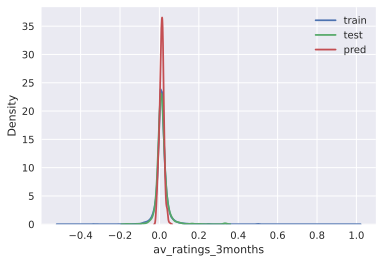

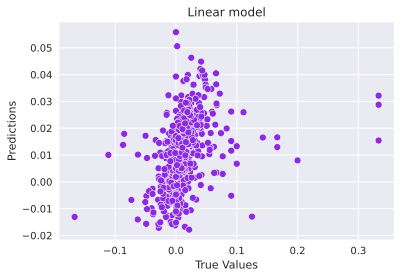

In [68]:
target_distr_linear(y_train, y_test, y_pred)   

In [69]:
calc_metrics(y_test, y_pred)

*** VAL **: 
MSE:   0.0009482467103717931
RMSE:  0.03079361476624323
R2:    0.12329923954680722
MAE:   0.015303757819391714
MedAE: 0.008617991686617994
------------------------------


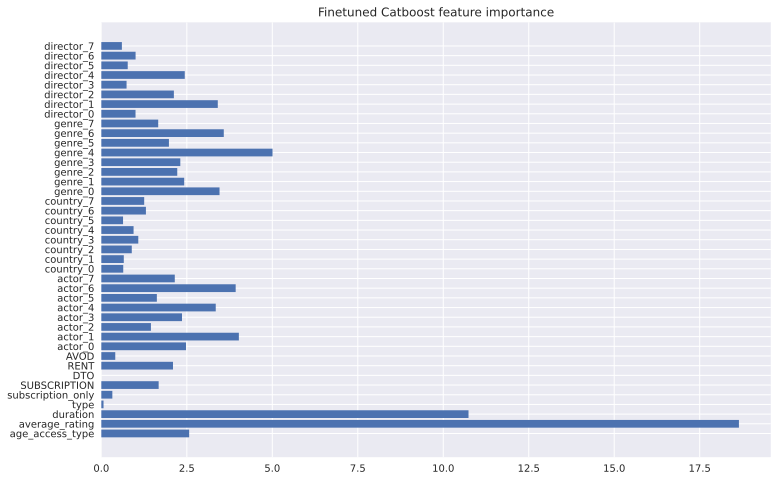

In [70]:
get_feature_imp(best_cat, train_dataset)

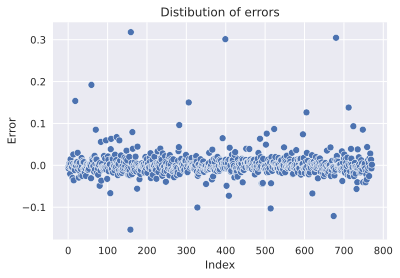

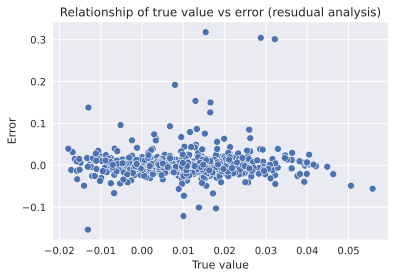

In [71]:
errors = y_test - y_pred
draw_res_analys(errors, y_pred)